<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.875 · Deep Learning · PEC3
</p>
<p style="margin: 0; text-align:right;">2021-2 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PEC 3: Recurrent Neural Networks

En esta práctica implementaremos redes neuronales recurrentes para generar música.

**Importante: La entrega debe hacerse en formato notebook y en formato html donde se vea el código y los resultados y comentarios de cada ejercicio. Para exportar el notebook a html puede hacerse desde el menú File $\to$ Download as $\to$ HTML.**

# 0. Contexto y referencias

Esta PEC está basada en el siguiente [artículo de investigación](https://arxiv.org/pdf/1711.07682.pdf), aunque por motivos de extensión no podremos pasar por todos los puntos del artículo.

La primera etapa de esta PEC será leer y entender la idea general de este trabajo. El artículo os da acceso al código original con el que se ha llevado a cabo el trabajo y en el que además esta basado gran parte del código que aquí os adjuntamos, aunque por la complejidad y extensión del código no os recomendamos que sumergáis demasiado en él.

La PEC consta de una etapa de ***interpretación de los datos*** (un paso vital en todo proyecto real), donde se pedirá reproducir una gráfica del artículo. Luego ***entrenaremos*** una red LSTM para generar acordes a partir de archivos MIDI. Finalmente, usaremos la capa de ***embedding*** de la red entrenada para hacer una proyección de los acordes en 2D y visualizar el concepto de [word2vec](https://en.wikipedia.org/wiki/Word2vec).

Además de este fichero os hemos adjuntado un archivo comprimido con una estructura de datos similar a la usada en el artículo y que os recomendamos (por vuestro bien) que no modifiquéis :). Allí encontraréis una carpeta llamada *data* donde se encuentra la base de datos que usaremos y otros ficheros que os facilitamos con datos de redes ya entrenadas (en la carpeta *models*)

# 1. Procesado de datos [2.5 pts]

## 1.1 Importación de módulos y paquetes necesarios

In [ ]:
!pip install pretty_midi==0.2.8

     |████████████████████████████████| 5.6 MB 4.4 MB/s 
     |████████████████████████████████| 51 kB 6.5 MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.8-py3-none-any.whl size=5590821 sha256=eb16c05120617bbeb8da77c905c21259a54c9bc9713fe64708c035c8960dd19b
  Stored in directory: /root/.cache/pip/wheels/53/fd/dd/20e1b16dbcf028bbbd7f53b570bc3521183731cba4a73cb310
Successfully built pretty-midi


In [ ]:
pip install --upgrade pyfluidsynth

In [17]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [18]:
# añade el path a tu directorio
%cd /content/drive/MyDrive/UOC-DataScience/DL_Operativa/PEC_3/PEC_3/

/content/drive/MyDrive/UOC-DataScience/DL_Operativa/PEC_3/PEC_3


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import _pickle as pickle
import os
import sys
import pretty_midi as pm
import mido
from collections import Counter
import collections
import pandas as pd

importamos módulos propios (archivos .py) que podréis encontrar en la estructura de carpetas que os hemos facilitado

In [ ]:
from settings import *
import midi_functions as mf 
import data_processing_functions as dpf

## 1.2 Ficheros MIDI [1 pt]

En esta sección vamos a entender un poco mejor la información que contiene un fichero MIDI y reproduciremos un archivo de nuestra base de datos. Para esta sección os recomendamos que le echéis un vistazo a la sección "*Extract notes*" del siguiente [tutorial de tensorflow](https://www.tensorflow.org/tutorials/audio/music_generation).

1.2.1 Escoger un fichero MIDI de la base de datos y crear las funciones necesarias para extraer las notas, el tiempo en que se toca cada nota, su duración y el momento en que se tocan. Este proceso se debe aplicar solo a un instrumento: **"Acoustic Grand Piano"**. 

*nota: Si el fichero escogido no tiene piano elegir otro fichero*

In [ ]:
import glob
filenames = glob.glob("data/original/*mid")
print('Number of files:', len(filenames))

Number of files: 50


In [ ]:
sample_file = filenames[10]
print(sample_file)

data/original/1b21aa92341858ada59f72acd3d87a94.mid


In [ ]:
import pretty_midi

pm = pretty_midi.PrettyMIDI(sample_file)

In [ ]:
print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 9
Instrument name: Acoustic Grand Piano


In [ ]:
def getMidiFile_info(file, instrument):
  """
  file: midi file path
  instrument: string of the name´s instrument to get the data
  """

  pm = pretty_midi.PrettyMIDI(file)

  instrumentsList = []

  for i in range(0, len(pm.instruments)):
    e = pretty_midi.program_to_instrument_name(pm.instruments[i].program)
    instrumentsList.append(e)
  
  idx = instrumentsList.index(str(instrument))
  instrument = pm.instruments[idx]
  notes = collections.defaultdict(list)

  instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
  print('Instrument name:', instrument_name)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    notes['Note_Name'].append(pretty_midi.note_number_to_name(note.pitch))
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})




In [ ]:
sample_file = filenames[10]
print("file: {}".format(sample_file))

dataPiano = getMidiFile_info(sample_file, "Acoustic Grand Piano")
dataPiano.head()

file: data/original/1b21aa92341858ada59f72acd3d87a94.mid
Instrument name: Acoustic Grand Piano


,pitch,start,end,step,duration,Note_Name
0,42,1.846028,1.865257,0.000000,0.019229,F#2
1,42,2.769042,2.788271,0.923014,0.019229,F#2
2,42,3.692056,3.711285,0.923014,0.019229,F#2
3,42,4.153563,4.172792,0.461507,0.019229,F#2
4,42,4.615070,4.634299,0.461507,0.019229,F#2


In [ ]:
dataPiano.sample(5)


,pitch,start,end,step,duration,Note_Name
10,42,26.324214,26.343899,0.001230,0.019685,F#2
9,64,26.322984,26.342669,0.126722,0.019685,E4
158,42,45.695713,45.715244,0.003662,0.019531,F#2
35,42,30.565101,30.584786,0.225147,0.019685,F#2
13,63,27.011959,27.031644,0.221456,0.019685,D#4


In [ ]:
dataPiano.tail()

,pitch,start,end,step,duration,Note_Name
163,38,46.164463,46.183994,0.003662,0.019531,D2
164,36,46.166904,46.186435,0.002441,0.019531,C2
165,42,46.395176,46.414707,0.228271,0.019531,F#2
166,62,46.398838,46.418369,0.003662,0.019531,D4
167,36,46.628330,46.647861,0.229492,0.019531,C2


1.2.2 Modificar la funcion *plot_piano_roll* del tutorial para poder graficar el pianoroll de la canción MIDI escogida. En este caso deberemos poder indicar un tiempo máximo de la canción que queremos añadir en el pianoroll. Además, si pasamos un *max_time=-1*, se deberán graficar todas las notas de la canción

In [ ]:
dataPiano[dataPiano["end"] <= 15]

,pitch,start,end,step,duration,Note_Name
0,42,1.846028,1.865257,0.000000,0.019229,F#2
1,42,2.769042,2.788271,0.923014,0.019229,F#2
2,42,3.692056,3.711285,0.923014,0.019229,F#2
3,42,4.153563,4.172792,0.461507,0.019229,F#2
4,42,4.615070,4.634299,0.461507,0.019229,F#2
5,42,5.076577,5.095806,0.461507,0.019229,F#2


In [ ]:
def plot_piano_roll(dataNotes, max_time):
  """
  dataNotes: pd.DataFrame with notes info
  time: int seconds to plot

  """
  if max_time == -1:
    dataNotes = dataNotes
  else:  
    dataNotes = dataNotes[dataPiano["end"] <= max_time]

  #title = f'Whole track'
  count = len(dataNotes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([dataNotes['pitch'], dataNotes['pitch']], axis=0)
  plot_start_stop = np.stack([dataNotes['start'], dataNotes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time {}'.format(max_time))
  plt.ylabel('Pitch')
  plt.show()
  #_ = plt.title(title)

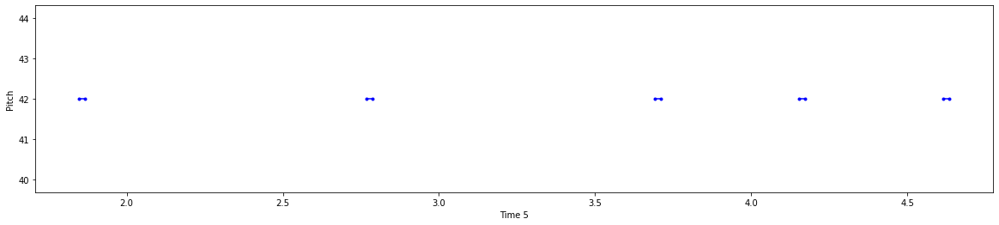

In [ ]:
plot_piano_roll(dataPiano, 5)


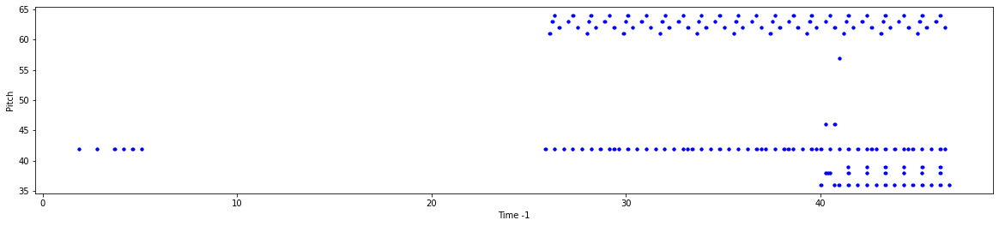

In [ ]:
plot_piano_roll(dataPiano, -1)

## 1.3 Procesado de datos [1.5 pts]

Ahora volvemos al artículo y aplicaremos el procesado de datos. Buscar dentro del fichero *data_processing_functions.py* la función que se encarga de llevar a cabo todo el procesado de datos y llamarla desde aquí

In [ ]:
from data_processing_functions import do_all_steps

La función que realiza el procesado completo de los datos se llama **do_all_steps()**  no lleva parámetros y lo que hace es ejecutar una a una todas las funciones del fichero de **data_processing_functions.py** sobre el directorio de data donde se encuentran los ficheros tipo MDI

In [ ]:
do_all_steps()


changing Tempo
histogramming
data/tempo/


/usr/local/lib/python3.7/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


make song histo
shifting midi files
making note indexes
histogramming
data/shifted/tempo/
extracting chords
getting dictionary
converting chords to index sequences
done


1.3.1 ¿Qué hace la función *change_tempo_folder*?¿Qué bpm fija para las canciones?

La función **change_tempo_folder** lo que hace es recorrer todos los subdirectorios de una carpeta source, para cada fichero cambia el nombre del path y genera un path objetivo dentro de la carpeta tempo, si este directorio target no existe, lo creará  y posteriormente ejecutará el método **change_tempo**. La función básicamente lo que hace es migrar una serie de ficheros entre directorios.

1.3.2 Una vez tenemos ejecutado el procesado de datos se habrán creado muchas carpetas y muchos ficheros nuevos en la actual carpeta ***data***. Ahora usaremos algunos de estos ficheros para construir la figura 2 del artículo usando los datos procesados. Crearemos dos funciones:
*   my_save_histo_oct_from_midi_folder
*   my_midi_to_histo_oct

basadas en las funciones ***save_histo_oct_from_midi_folder*** y ***midi_to_histo_oct*** que encontraréis en los ficheros ***midi_functions.py*** y ***data_processing_functions.py***. Ahora las modificaremos para que nos devuelvan datos para dos tipos de histogramas: uno igual a la figura 2 del artículo (apariciones VS pitch) y otro, usando el *histo_oct*, que serán datos para graficar *apariciones VS notas en cualquier octava*, es decir, el número de veces que aparece una nota (sin importar a que octava pertenezca) a lo largo de una canción.


*indicación: Es importante entender la estructura de las variables:*
*   pianoroll
*   histo_bar
*   histo_oct

*dentro de la funcion* ***midi_to_histo_oct***

In [ ]:
#usa este vector como labels del segundo gráfico 
notas_en_una_octava = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']

In [ ]:
def my_save_histo_oct_from_midi_folder(...):
  pass

def my_midi_to_histo_oct(...):
  pass

In [ ]:
def my_save_histo_oct_from_midi_folder(tempo_folder,histo_folder):
    print(tempo_folder)
    nfiles=0
    for path, subdirs, files in os.walk(tempo_folder):
        for name in files:
            _path = path.replace('\\', '/') + '/'
            _name = name.replace('\\', '/')
            target_path = histo_folder+_path[len(tempo_folder):]
            if not os.path.exists(target_path):
                os.makedirs(target_path)
            try:
                nfiles+=1
                if nfiles%100==0:
                  print("File #",nfiles,"Current file = ",_path,"/",_name) 
                mf.midi_to_histo_oct(samples_per_bar,octave, fs, _name, _path, target_path)
            except (ValueError, EOFError, IndexError, OSError, KeyError, ZeroDivisionError) as e:
                exception_str = 'Unexpected error in ' + name  + ':\n', e, sys.exc_info()[0]
                print(exception_str)

In [ ]:
tempo_folder = "data/tempo"
histo_folder = "data/histo"

my_save_histo_oct_from_midi_folder(tempo_folder, histo_folder)



data/tempo


/usr/local/lib/python3.7/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


In [ ]:
def midi_to_histo_oct(samples_per_bar,octave, fs, name, path, histo_path):
#    print(path + name)
    pianoroll = get_pianoroll(name, path, fs)
    histo_bar = pianoroll_to_histo_bar(pianoroll, samples_per_bar)
    histo_oct = histo_bar_to_histo_oct(histo_bar, octave)
    pickle.dump(histo_oct,open(histo_path + name + '.pickle' , 'wb'))

1.3.3 Buscar en internet sobre las escalas musicales e indicar que escala es la que más aparece en todas las canciones analizadas. ¿Cuáles dirías que son las notas más importantes de la escala?

#2. LSTM para acordes [5 pts]

El siguiente paso en el artículo es el entrenamiento de una red LSTM para la generación de acordes. Esta parte la haremos con un data set más pequeño y lo compararemos con resultados de entrenamientos previos que os faciliaremos. Primero cargamos la librerias que necesitaremos

In [67]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Activation
from keras.layers import Embedding
from tensorflow.keras.optimizers import RMSprop, Adam
import tensorflow as tf
from tensorflow.compat.v1.keras.backend import set_session
import keras.utils
from keras.utils import np_utils
from random import shuffle
import progressbar
import time

## 2.1 Carga de datos [0.5 pts]

2.1.1 En la carpeta ***data*** encontraréis un fichero llamado ***dataset.pkl*** que contiene 11338 canciones de train y 3780 de test. Usando *pickle* cargar los datos y luego separar 2000 para *train* y 500 canciones para *test* en las variables: 
*   train_set
*   test_set

crea además *train_set_size* y *test_set_size*

In [ ]:
df = pd.read_pickle("data/dataset.pkl")  

print("Total canciones de train: {}".format(len(df[0])))
print("Total canciones de test: {}".format(len(df[1])))

train = [np.array(i) for i in df[0]]
test = [np.array(i) for i in df[1]]


Total canciones de train: 11338
Total canciones de test: 3780


In [ ]:
train_set_size = 2020 ### 2000
test_set_size = 500  ### 500

In [ ]:
import random

train_set = random.sample(train, k=train_set_size)
test_set = random.sample(test, k=test_set_size)

print("Número de muestras escogidas para train: {}".format(len(train_set)))
print("Número de muestras escogidas para test: {}".format(len(test_set)))

Número de muestras escogidas para train: 2020
Número de muestras escogidas para test: 500


In [ ]:
train_set[0]

array([14, 18, 28, 18, 28, 29, 28, 18, 28, 11,  2, 11,  2, 11,  2, 11,  2,
        8,  6, 11,  2, 11, 19, 11,  2, 19,  2, 11,  2, 13,  2,  2, 19,  1,
        6, 11, 19,  1,  6, 11,  2,  8,  6, 11,  2, 11, 19, 11,  2, 19,  2,
       11,  2, 13,  2,  2, 19,  1,  6, 11, 19,  1,  6, 11,  2, 11,  2, 11,
        2,  2,  2, 11,  6,  9,  2, 11,  2, 19,  2, 11,  2, 13,  2,  2, 19,
        1,  6, 11, 19,  1,  6, 11, 19,  1,  6, 11, 19,  1,  6, 11,  2, 11,
        2, 11,  2, 11,  2, 11,  2, 12, 12, 12])

In [ ]:
test_set[1]

array([14,  4, 22, 23, 23,  4, 22, 23, 23,  4,  4,  2,  2,  4,  4,  2, 23,
       35, 31,  4, 29, 22, 32, 10, 22,  4, 22,  2,  2,  4, 22,  2, 13,  5,
        5, 10, 28, 15,  5, 10, 22, 17,  1,  1,  6, 10,  7,  3, 25, 16, 23,
        1,  6, 10,  1,  3, 25,  4, 46,  4, 21,  2,  2,  4,  0,  0,  0, 10,
       10,  5,  3, 17, 36, 19,  6, 10, 10,  5, 26,  3, 25, 28,  0,  1,  6,
       10,  7,  3, 25, 16, 23,  1,  6, 10,  1,  3, 25,  4, 46,  4, 21,  2,
        2,  1,  6, 10,  1, 41, 25, 16, 24,  1, 23, 10,  1, 41, 25, 16, 23,
        1,  6, 10,  1, 41, 25, 16, 23,  1,  6])

## 2.2 Modelo con una capa de ***Embedding*** [0.5 pts]

2.2.1 Ahora definiremos los parámetros de nuestra red LSTM usando los parámetros que dan en el artículo. El único cambio será en el tamaño de la red LSTM, en la que usaremos la mitad de la LSTM del artículo y número de epochs que usaremos 10 en nuestro caso

In [ ]:
batch_size = 1
step_size = 1
epochs = 10

#completar
lstm_size = 256
learning_rate = 1e-06
optimizer = 'Adam'

El siguiente código es para mantener la estructura de carpetas que usan en el artículo ya que hay mucho código que depende de esta estructura:

In [ ]:
##--------NO TOCAR-------------------------------------------------------
base_path = 'models/chords/'
model_filetype = '.pickle'

shuffle_train_set = True
bidirectional = False

#Create model dir
fd = {'shifted': shifted, 'lr': learning_rate, 'emdim': chord_embedding_dim, 'opt': optimizer,
'bi': bidirectional, 'lstms': lstm_size, 'trainsize': train_set_size, 'testsize': test_set_size, 'samples_per_bar': samples_per_bar}
t = str(np.random.randint(1000,9999))
model_name = t+ '-Shifted_%(shifted)s_Lr_%(lr)s_EmDim_%(emdim)s_opt_%(opt)s_bi_%(bi)s_lstmsize_%(lstms)s_trainsize_%(trainsize)s_testsize_%(testsize)s_samples_per_bar%(samples_per_bar)s' % fd
model_path = base_path + model_name + '/'
if not os.path.exists(model_path):
    os.makedirs(model_path)
##--------NO TOCAR-------------------------------------------------------


2.2.2 Finalmente definimos y compilamos la red con una capa de Embedding antes de la LSTM. Para este paso, acceder al código original del artículo y buscar en que fichero se entrena la LSTM copiar la estructura eliminando código que no es de nuestro interés

In [ ]:
test_step = 500        # Calculate error for test set every this many songs

verbose = False
show_plot = False
save_plot = True
step_size = 1
save_step = 10
shuffle_train_set = True
bidirectional = False

In [ ]:
print('creating model...')
model = Sequential()
model.add(Embedding(num_chords, chord_embedding_dim, input_length=step_size, name="embedding", batch_input_shape=(batch_size,step_size)))

model.add(LSTM(lstm_size, stateful=True))
model.add(Dense(num_chords))
model.add(Activation('softmax'))
if optimizer == 'Adam':
    optimizer = Adam(lr=learning_rate)
elif optimizer == 'RMS':
    optimizer = RMSprop(lr=learning_rate)
loss = 'categorical_crossentropy'
print("compiling model")
model.compile(optimizer, loss)

creating model...
compiling model


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


## 2.3 Entrenamiento [2 pts]

2.3.1 Siguiendo el código orginal del artículo donde se define la arquitectura de la LSTM para los acordes hay 3 funciones más:
*   test()
*   train()
*   save_params()

que nos serán de ayuda para el entrenamiento, testeo y para guardar los datos sobre el modelo entrenado. Guardaremos el valor de la ***loss*** tanto para test como para train cada 500 canciones, por lo que tendremos más de un punto por epoch. Modifica, si es necesario, las funciones *test()* y *train()* para que los ficheros de *total_test* y *total_train* dejen constancia de la epoch a la que pertenecen, esto te ayudará al graficar los datos más adelante.

Añade, antes de cada función una cabecera explicando brevemente lo que ésta hace.

---

*nota: comprueba que has definido todas las variables necesarias para que las* *funciones no den error en mitad del entrenamiento. Comienza usando menos datos* *para agilizar el proceso y una vez funcione todo usa el set completo*

In [ ]:
epoch_array=[]
total_test_loss_array = [] 
total_train_loss_array = []
total_test_loss = 0
show_plot = False
save_plot = False
test_step = 500
verbose = False
save_step = 1


#crea aquí las funciones test(), train() y save_params()

def test():
  """
  la función va desarrolla un loop en el que se evalúa cancación a canción del test dataset
  gráfica la función de pérdida luego de evaluar el dataset test y guarda en un array los valores de dicha función.
  """

  print('\nTesting:')
  total_test_loss = 0

  bar = progressbar.ProgressBar(maxval=test_set_size, redirect_stdout=False)
  for i, test_song in enumerate(test_set):
        X_test = test_song[:-1]
        Y_test = np_utils.to_categorical(test_song[1:], num_classes=num_chords)
        loss = model.evaluate(X_test, Y_test, batch_size=batch_size, verbose=verbose)
        model.reset_states()
        total_test_loss += loss
        bar.update(i+1)
  total_test_loss_array.append(total_test_loss/test_set_size)
  print('\nTotal test loss: ', total_test_loss/test_set_size)
  print('-'*50)
  plt.plot(total_test_loss_array, 'b-', label='test loss')
  plt.plot(total_train_loss_array, 'r-', label='train loss')
#    plt.legend()
  plt.ylabel(model_path)
#    plt.axis([0, 50, 3, 5])
  plt.grid()
  if show_plot: plt.show()
  if save_plot: plt.savefig(model_path+'plot.png')
  pickle.dump(total_test_loss_array,open(model_path+'total_test_loss_array.pickle', 'wb'))
  pickle.dump(total_train_loss_array,open(model_path+'total_train_loss_array.pickle', 'wb'))

def train():
  """
  Esta función va realizando un loop por cada época,
  en cada época realiza otro loop en el que se va entrenando a la red canción por canción.
  Es importante destacar que la red va entrenando por una canción a la vez.

  Además se van guardando los resultados de cada loop de entrenamiento.
  """
  print('training model...')
  total_train_loss = 0
  for e in range(1, epochs+1):
    print('Epoch ', e, 'of ', epochs, 'Epochs\nTraining:')
    if shuffle_train_set:
      shuffle(train_set)
    bar = progressbar.ProgressBar(maxval=train_set_size)
    for i, song in enumerate(train_set):
      # bar.start()
      X = song[:-1]
      Y = np_utils.to_categorical(song[1:], num_classes=num_chords)
      hist = model.fit(X, Y, batch_size=batch_size, shuffle=False, verbose=verbose)
      model.reset_states()
      bar.update(i+1)
#     print(hist.history)
      total_train_loss += hist.history['loss'][0]
      if (i+1)%test_step is 0:
        total_train_loss = total_train_loss/test_step
        total_train_loss_array.append(total_train_loss)
        test()
        total_train_loss = 0
    
      if e%save_step is 0:
        u = i + 1
        print('saving model')
        model_save_path = model_path + 'model_' + 'Epoch' + str(e) + '_' + str(u) + model_filetype
        model.save(model_save_path)

def save_params():
  """
  crea un txt con el nombre del modelo y guarda los parámetros
  con los fue que corrido el modelo 
  """
  with open(model_path + 'params.txt', "w") as text_file:
    text_file.write("epochs: %s" % epochs + '\n')
    text_file.write("train_set_size: %s" % train_set_size + '\n')
    text_file.write("test_set_size: %s" % test_set_size + '\n')
    text_file.write("lstm_size: %s" % lstm_size + '\n')
    text_file.write("embedding_dim: %s" % chord_embedding_dim + '\n')
    text_file.write("learning_rate: %s" % learning_rate + '\n')
    #text_file.write("save_step: %s" % save_step + '\n')
    text_file.write("shuffle_train_set: %s" % shuffle_train_set + '\n')
    text_file.write("test_step: %s" % test_step + '\n')
    text_file.write("bidirectional: %s" % bidirectional + '\n')
    text_file.write("num_chords: %s" % num_chords + '\n')
    text_file.write("chord_n: %s" % chord_n + '\n')

2.3.2 Responde las siguientes preguntas:
*  ¿Qué representa cada elemento de *X* en la función de *train()*?
*  ¿Qué se está usando como *label* para cada elemento de *X*? 
*  Justifica el uso de *categorical_crossentropy* como función de loss
*  ¿Qué crees que está aprendiendo la red?




 

- X es el último elemento de cada lista de cada canción que componen el dataset de train.
- Para cada elemento X, se usa como label un array de numpy con el resto de los valores del vector que corresponde a la canción. A dicho vector se le aplica una transformación de one hot encoding generando un array de ceros y unos por cada elemento del vector inicial.
- Al tener el input inicial como Y (un vector de one hot encoding), la función de activación más adecuada según Geron A, en Hands-on Machine Learning with Scikit Learn Keras & Tensorflow es la categorical_crossentropy.
- La red está aprendiendo a generar una serie de acordes o números que corresponden a una canción a partir de un único valor de entrada como X que es parte de la canción


2.3.3 Entrena la red usando las funciones anteriores

In [ ]:
import time 

start_time = time.time()
print("---------------")

print("saving params")
save_params()
print("starting training..")
train()
#print("starting Testing..")
#test()



print("Finished on {} secs".format(round(time.time() - start_time)))


---------------
saving params
starting training..
training model...
Epoch  1 of  10 Epochs
Training:


N/A% (0 of 2020) |                       | Elapsed Time: 0:00:00 ETA:  --:--:--

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1.pickle/assets
  0% (2 of 2020) |                       | Elapsed Time: 0:00:03 ETA:   1:05:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2.pickle/assets
  0% (3 of 2020) |                       | Elapsed Time: 0:00:07 ETA:   2:04:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_3.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_3.pickle/assets
  0% (4 of 2020) |                       | Elapsed Time: 0:00:11 ETA:   2:16:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_4.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_4.pickle/assets
  0% (5 of 2020) |                       | Elapsed Time: 0:00:15 ETA:   2:20:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_5.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_5.pickle/assets
  0% (6 of 2020) |                       | Elapsed Time: 0:00:19 ETA:   2:04:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_6.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_6.pickle/assets
  0% (7 of 2020) |                       | Elapsed Time: 0:00:23 ETA:   2:14:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_7.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_7.pickle/assets
  0% (8 of 2020) |                       | Elapsed Time: 0:00:27 ETA:   2:08:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_8.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_8.pickle/assets
  0% (9 of 2020) |                       | Elapsed Time: 0:00:31 ETA:   2:02:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_9.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_9.pickle/assets
  0% (10 of 2020) |                      | Elapsed Time: 0:00:35 ETA:   2:19:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_10.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_10.pickle/assets
  0% (11 of 2020) |                      | Elapsed Time: 0:00:39 ETA:   2:13:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_11.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_11.pickle/assets
  0% (12 of 2020) |                      | Elapsed Time: 0:00:42 ETA:   2:04:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_12.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_12.pickle/assets
  0% (13 of 2020) |                      | Elapsed Time: 0:00:46 ETA:   2:12:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_13.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_13.pickle/assets
  0% (14 of 2020) |                      | Elapsed Time: 0:00:50 ETA:   2:12:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_14.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_14.pickle/assets
  0% (15 of 2020) |                      | Elapsed Time: 0:00:54 ETA:   2:05:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_15.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_15.pickle/assets
  0% (16 of 2020) |                      | Elapsed Time: 0:00:58 ETA:   2:17:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_16.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_16.pickle/assets
  0% (17 of 2020) |                      | Elapsed Time: 0:01:02 ETA:   2:11:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_17.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_17.pickle/assets
  0% (18 of 2020) |                      | Elapsed Time: 0:01:06 ETA:   2:10:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_18.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_18.pickle/assets
  0% (19 of 2020) |                      | Elapsed Time: 0:01:10 ETA:   2:23:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_19.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_19.pickle/assets
  0% (20 of 2020) |                      | Elapsed Time: 0:01:14 ETA:   2:10:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_20.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_20.pickle/assets
  1% (21 of 2020) |                      | Elapsed Time: 0:01:18 ETA:   2:02:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_21.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_21.pickle/assets
  1% (22 of 2020) |                      | Elapsed Time: 0:01:22 ETA:   2:23:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_22.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_22.pickle/assets
  1% (23 of 2020) |                      | Elapsed Time: 0:01:26 ETA:   2:13:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_23.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_23.pickle/assets
  1% (24 of 2020) |                      | Elapsed Time: 0:01:30 ETA:   2:13:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_24.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_24.pickle/assets
  1% (25 of 2020) |                      | Elapsed Time: 0:01:34 ETA:   2:19:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_25.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_25.pickle/assets
  1% (26 of 2020) |                      | Elapsed Time: 0:01:38 ETA:   2:14:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_26.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_26.pickle/assets
  1% (27 of 2020) |                      | Elapsed Time: 0:01:43 ETA:   2:22:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_27.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_27.pickle/assets
  1% (28 of 2020) |                      | Elapsed Time: 0:01:47 ETA:   2:15:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_28.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_28.pickle/assets
  1% (29 of 2020) |                      | Elapsed Time: 0:01:51 ETA:   2:13:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_29.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_29.pickle/assets
  1% (30 of 2020) |                      | Elapsed Time: 0:01:55 ETA:   2:04:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_30.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_30.pickle/assets
  1% (31 of 2020) |                      | Elapsed Time: 0:01:59 ETA:   2:14:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_31.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_31.pickle/assets
  1% (32 of 2020) |                      | Elapsed Time: 0:02:03 ETA:   2:14:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_32.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_32.pickle/assets
  1% (33 of 2020) |                      | Elapsed Time: 0:02:07 ETA:   2:06:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_33.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_33.pickle/assets
  1% (34 of 2020) |                      | Elapsed Time: 0:02:11 ETA:   2:13:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_34.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_34.pickle/assets
  1% (35 of 2020) |                      | Elapsed Time: 0:02:15 ETA:   2:08:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_35.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_35.pickle/assets
  1% (36 of 2020) |                      | Elapsed Time: 0:02:18 ETA:   2:05:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_36.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_36.pickle/assets
  1% (37 of 2020) |                      | Elapsed Time: 0:02:22 ETA:   2:14:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_37.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_37.pickle/assets
  1% (38 of 2020) |                      | Elapsed Time: 0:02:26 ETA:   2:13:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_38.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_38.pickle/assets
  1% (39 of 2020) |                      | Elapsed Time: 0:02:30 ETA:   2:05:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_39.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_39.pickle/assets
  1% (40 of 2020) |                      | Elapsed Time: 0:02:34 ETA:   2:16:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_40.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_40.pickle/assets
  2% (41 of 2020) |                      | Elapsed Time: 0:02:39 ETA:   2:18:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_41.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_41.pickle/assets
  2% (42 of 2020) |                      | Elapsed Time: 0:02:42 ETA:   1:57:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_42.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_42.pickle/assets
  2% (43 of 2020) |                      | Elapsed Time: 0:02:46 ETA:   2:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_43.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_43.pickle/assets
  2% (44 of 2020) |                      | Elapsed Time: 0:02:50 ETA:   2:10:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_44.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_44.pickle/assets
  2% (45 of 2020) |                      | Elapsed Time: 0:02:54 ETA:   2:06:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_45.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_45.pickle/assets
  2% (46 of 2020) |                      | Elapsed Time: 0:02:58 ETA:   2:17:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_46.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_46.pickle/assets
  2% (47 of 2020) |                      | Elapsed Time: 0:03:02 ETA:   2:12:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_47.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_47.pickle/assets
  2% (48 of 2020) |                      | Elapsed Time: 0:03:06 ETA:   2:02:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_48.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_48.pickle/assets
  2% (49 of 2020) |                      | Elapsed Time: 0:03:10 ETA:   2:11:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_49.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_49.pickle/assets
  2% (50 of 2020) |                      | Elapsed Time: 0:03:14 ETA:   2:05:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_50.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_50.pickle/assets
  2% (51 of 2020) |                      | Elapsed Time: 0:03:18 ETA:   2:03:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_51.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_51.pickle/assets
  2% (52 of 2020) |                      | Elapsed Time: 0:03:22 ETA:   2:11:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_52.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_52.pickle/assets
  2% (53 of 2020) |                      | Elapsed Time: 0:03:26 ETA:   2:12:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_53.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_53.pickle/assets
  2% (54 of 2020) |                      | Elapsed Time: 0:03:30 ETA:   2:05:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_54.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_54.pickle/assets
  2% (55 of 2020) |                      | Elapsed Time: 0:03:34 ETA:   2:11:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_55.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_55.pickle/assets
  2% (56 of 2020) |                      | Elapsed Time: 0:03:38 ETA:   2:09:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_56.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_56.pickle/assets
  2% (57 of 2020) |                      | Elapsed Time: 0:03:41 ETA:   1:56:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_57.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_57.pickle/assets
  2% (58 of 2020) |                      | Elapsed Time: 0:03:45 ETA:   2:13:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_58.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_58.pickle/assets
  2% (59 of 2020) |                      | Elapsed Time: 0:03:49 ETA:   2:07:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_59.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_59.pickle/assets
  2% (60 of 2020) |                      | Elapsed Time: 0:03:53 ETA:   2:04:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_60.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_60.pickle/assets
  3% (61 of 2020) |                      | Elapsed Time: 0:03:57 ETA:   2:12:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_61.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_61.pickle/assets
  3% (62 of 2020) |                      | Elapsed Time: 0:04:01 ETA:   2:10:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_62.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_62.pickle/assets
  3% (63 of 2020) |                      | Elapsed Time: 0:04:05 ETA:   1:55:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_63.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_63.pickle/assets
  3% (64 of 2020) |                      | Elapsed Time: 0:04:09 ETA:   2:15:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_64.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_64.pickle/assets
  3% (65 of 2020) |                      | Elapsed Time: 0:04:13 ETA:   2:06:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_65.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_65.pickle/assets
  3% (66 of 2020) |                      | Elapsed Time: 0:04:16 ETA:   2:06:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_66.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_66.pickle/assets
  3% (67 of 2020) |                      | Elapsed Time: 0:04:21 ETA:   2:16:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_67.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_67.pickle/assets
  3% (68 of 2020) |                      | Elapsed Time: 0:04:25 ETA:   2:09:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_68.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_68.pickle/assets
  3% (69 of 2020) |                      | Elapsed Time: 0:04:28 ETA:   2:01:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_69.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_69.pickle/assets
  3% (70 of 2020) |                      | Elapsed Time: 0:04:32 ETA:   2:13:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_70.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_70.pickle/assets
  3% (71 of 2020) |                      | Elapsed Time: 0:04:37 ETA:   2:10:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_71.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_71.pickle/assets
  3% (72 of 2020) |                      | Elapsed Time: 0:04:41 ETA:   2:10:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_72.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_72.pickle/assets
  3% (73 of 2020) |                      | Elapsed Time: 0:04:45 ETA:   2:18:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_73.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_73.pickle/assets
  3% (74 of 2020) |                      | Elapsed Time: 0:04:49 ETA:   2:06:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_74.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_74.pickle/assets
  3% (75 of 2020) |                      | Elapsed Time: 0:04:52 ETA:   2:01:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_75.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_75.pickle/assets
  3% (76 of 2020) |                      | Elapsed Time: 0:04:57 ETA:   2:12:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_76.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_76.pickle/assets
  3% (77 of 2020) |                      | Elapsed Time: 0:05:01 ETA:   2:09:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_77.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_77.pickle/assets
  3% (78 of 2020) |                      | Elapsed Time: 0:05:04 ETA:   2:00:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_78.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_78.pickle/assets
  3% (79 of 2020) |                      | Elapsed Time: 0:05:08 ETA:   2:14:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_79.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_79.pickle/assets
  3% (80 of 2020) |                      | Elapsed Time: 0:05:12 ETA:   2:06:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_80.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_80.pickle/assets
  4% (81 of 2020) |                      | Elapsed Time: 0:05:16 ETA:   2:01:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_81.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_81.pickle/assets
  4% (82 of 2020) |                      | Elapsed Time: 0:05:20 ETA:   2:14:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_82.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_82.pickle/assets
  4% (83 of 2020) |                      | Elapsed Time: 0:05:24 ETA:   2:10:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_83.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_83.pickle/assets
  4% (84 of 2020) |                      | Elapsed Time: 0:05:28 ETA:   1:59:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_84.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_84.pickle/assets
  4% (85 of 2020) |                      | Elapsed Time: 0:05:32 ETA:   2:07:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_85.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_85.pickle/assets
  4% (86 of 2020) |                      | Elapsed Time: 0:05:36 ETA:   2:09:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_86.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_86.pickle/assets
  4% (87 of 2020) |                      | Elapsed Time: 0:05:40 ETA:   2:01:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_87.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_87.pickle/assets
  4% (88 of 2020) |                      | Elapsed Time: 0:05:44 ETA:   2:07:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_88.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_88.pickle/assets
  4% (89 of 2020) |                      | Elapsed Time: 0:05:48 ETA:   2:10:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_89.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_89.pickle/assets
  4% (90 of 2020) |                      | Elapsed Time: 0:05:51 ETA:   2:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_90.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_90.pickle/assets
  4% (91 of 2020) |                      | Elapsed Time: 0:05:55 ETA:   2:07:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_91.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_91.pickle/assets
  4% (92 of 2020) |#                     | Elapsed Time: 0:06:00 ETA:   2:09:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_92.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_92.pickle/assets
  4% (93 of 2020) |#                     | Elapsed Time: 0:06:03 ETA:   1:56:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_93.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_93.pickle/assets
  4% (94 of 2020) |#                     | Elapsed Time: 0:06:07 ETA:   2:06:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_94.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_94.pickle/assets
  4% (95 of 2020) |#                     | Elapsed Time: 0:06:11 ETA:   2:07:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_95.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_95.pickle/assets
  4% (96 of 2020) |#                     | Elapsed Time: 0:06:15 ETA:   1:57:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_96.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_96.pickle/assets
  4% (97 of 2020) |#                     | Elapsed Time: 0:06:19 ETA:   2:03:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_97.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_97.pickle/assets
  4% (98 of 2020) |#                     | Elapsed Time: 0:06:22 ETA:   2:04:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_98.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_98.pickle/assets
  4% (99 of 2020) |#                     | Elapsed Time: 0:06:26 ETA:   2:00:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_99.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_99.pickle/assets
  4% (100 of 2020) |#                    | Elapsed Time: 0:06:30 ETA:   2:11:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_100.pickle/assets
  5% (101 of 2020) |#                    | Elapsed Time: 0:06:34 ETA:   2:08:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_101.pickle/assets
  5% (102 of 2020) |#                    | Elapsed Time: 0:06:38 ETA:   1:58:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_102.pickle/assets
  5% (103 of 2020) |#                    | Elapsed Time: 0:06:42 ETA:   2:08:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_103.pickle/assets
  5% (104 of 2020) |#                    | Elapsed Time: 0:06:46 ETA:   2:14:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_104.pickle/assets
  5% (105 of 2020) |#                    | Elapsed Time: 0:06:50 ETA:   2:00:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_105.pickle/assets
  5% (106 of 2020) |#                    | Elapsed Time: 0:06:54 ETA:   2:06:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_106.pickle/assets
  5% (107 of 2020) |#                    | Elapsed Time: 0:06:58 ETA:   2:00:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_107.pickle/assets
  5% (108 of 2020) |#                    | Elapsed Time: 0:07:02 ETA:   2:06:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_108.pickle/assets
  5% (109 of 2020) |#                    | Elapsed Time: 0:07:06 ETA:   2:09:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_109.pickle/assets
  5% (110 of 2020) |#                    | Elapsed Time: 0:07:09 ETA:   1:52:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_110.pickle/assets
  5% (111 of 2020) |#                    | Elapsed Time: 0:07:14 ETA:   2:12:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_111.pickle/assets
  5% (112 of 2020) |#                    | Elapsed Time: 0:07:17 ETA:   2:01:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_112.pickle/assets
  5% (113 of 2020) |#                    | Elapsed Time: 0:07:21 ETA:   1:55:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_113.pickle/assets
  5% (114 of 2020) |#                    | Elapsed Time: 0:07:25 ETA:   2:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_114.pickle/assets
  5% (115 of 2020) |#                    | Elapsed Time: 0:07:29 ETA:   2:04:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_115.pickle/assets
  5% (116 of 2020) |#                    | Elapsed Time: 0:07:32 ETA:   1:51:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_116.pickle/assets
  5% (117 of 2020) |#                    | Elapsed Time: 0:07:37 ETA:   2:14:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_117.pickle/assets
  5% (118 of 2020) |#                    | Elapsed Time: 0:07:41 ETA:   2:06:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_118.pickle/assets
  5% (119 of 2020) |#                    | Elapsed Time: 0:07:44 ETA:   1:53:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_119.pickle/assets
  5% (120 of 2020) |#                    | Elapsed Time: 0:07:49 ETA:   2:23:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_120.pickle/assets
  5% (121 of 2020) |#                    | Elapsed Time: 0:07:53 ETA:   2:07:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_121.pickle/assets
  6% (122 of 2020) |#                    | Elapsed Time: 0:07:57 ETA:   1:57:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_122.pickle/assets
  6% (123 of 2020) |#                    | Elapsed Time: 0:08:01 ETA:   2:08:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_123.pickle/assets
  6% (124 of 2020) |#                    | Elapsed Time: 0:08:04 ETA:   1:59:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_124.pickle/assets
  6% (125 of 2020) |#                    | Elapsed Time: 0:08:08 ETA:   1:55:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_125.pickle/assets
  6% (126 of 2020) |#                    | Elapsed Time: 0:08:12 ETA:   2:05:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_126.pickle/assets
  6% (127 of 2020) |#                    | Elapsed Time: 0:08:16 ETA:   2:04:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_127.pickle/assets
  6% (128 of 2020) |#                    | Elapsed Time: 0:08:20 ETA:   1:55:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_128.pickle/assets
  6% (129 of 2020) |#                    | Elapsed Time: 0:08:24 ETA:   2:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_129.pickle/assets
  6% (130 of 2020) |#                    | Elapsed Time: 0:08:28 ETA:   2:03:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_130.pickle/assets
  6% (131 of 2020) |#                    | Elapsed Time: 0:08:31 ETA:   1:55:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_131.pickle/assets
  6% (132 of 2020) |#                    | Elapsed Time: 0:08:35 ETA:   2:08:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_132.pickle/assets
  6% (133 of 2020) |#                    | Elapsed Time: 0:08:40 ETA:   2:07:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_133.pickle/assets
  6% (134 of 2020) |#                    | Elapsed Time: 0:08:43 ETA:   1:54:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_134.pickle/assets
  6% (135 of 2020) |#                    | Elapsed Time: 0:08:47 ETA:   2:06:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_135.pickle/assets
  6% (136 of 2020) |#                    | Elapsed Time: 0:08:51 ETA:   2:05:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_136.pickle/assets
  6% (137 of 2020) |#                    | Elapsed Time: 0:08:55 ETA:   1:54:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_137.pickle/assets
  6% (138 of 2020) |#                    | Elapsed Time: 0:08:59 ETA:   2:09:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_138.pickle/assets
  6% (139 of 2020) |#                    | Elapsed Time: 0:09:03 ETA:   2:05:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_139.pickle/assets
  6% (140 of 2020) |#                    | Elapsed Time: 0:09:07 ETA:   1:55:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_140.pickle/assets
  6% (141 of 2020) |#                    | Elapsed Time: 0:09:11 ETA:   2:12:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_141.pickle/assets
  7% (142 of 2020) |#                    | Elapsed Time: 0:09:15 ETA:   2:06:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_142.pickle/assets
  7% (143 of 2020) |#                    | Elapsed Time: 0:09:18 ETA:   1:49:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_143.pickle/assets
  7% (144 of 2020) |#                    | Elapsed Time: 0:09:23 ETA:   2:09:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_144.pickle/assets
  7% (145 of 2020) |#                    | Elapsed Time: 0:09:27 ETA:   2:09:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_145.pickle/assets
  7% (146 of 2020) |#                    | Elapsed Time: 0:09:30 ETA:   1:56:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_146.pickle/assets
  7% (147 of 2020) |#                    | Elapsed Time: 0:09:34 ETA:   2:06:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_147.pickle/assets
  7% (148 of 2020) |#                    | Elapsed Time: 0:09:38 ETA:   2:01:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_148.pickle/assets
  7% (149 of 2020) |#                    | Elapsed Time: 0:09:42 ETA:   1:53:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_149.pickle/assets
  7% (150 of 2020) |#                    | Elapsed Time: 0:09:46 ETA:   2:08:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_150.pickle/assets
  7% (151 of 2020) |#                    | Elapsed Time: 0:09:50 ETA:   2:01:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_151.pickle/assets
  7% (152 of 2020) |#                    | Elapsed Time: 0:09:54 ETA:   1:51:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_152.pickle/assets
  7% (153 of 2020) |#                    | Elapsed Time: 0:09:58 ETA:   2:07:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_153.pickle/assets
  7% (154 of 2020) |#                    | Elapsed Time: 0:10:02 ETA:   2:00:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_154.pickle/assets
  7% (155 of 2020) |#                    | Elapsed Time: 0:10:05 ETA:   1:51:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_155.pickle/assets
  7% (156 of 2020) |#                    | Elapsed Time: 0:10:09 ETA:   2:04:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_156.pickle/assets
  7% (157 of 2020) |#                    | Elapsed Time: 0:10:13 ETA:   2:11:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_157.pickle/assets
  7% (158 of 2020) |#                    | Elapsed Time: 0:10:17 ETA:   1:57:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_158.pickle/assets
  7% (159 of 2020) |#                    | Elapsed Time: 0:10:21 ETA:   2:03:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_159.pickle/assets
  7% (160 of 2020) |#                    | Elapsed Time: 0:10:25 ETA:   2:00:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_160.pickle/assets
  7% (161 of 2020) |#                    | Elapsed Time: 0:10:29 ETA:   1:51:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_161.pickle/assets
  8% (162 of 2020) |#                    | Elapsed Time: 0:10:33 ETA:   2:01:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_162.pickle/assets
  8% (163 of 2020) |#                    | Elapsed Time: 0:10:37 ETA:   2:01:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_163.pickle/assets
  8% (164 of 2020) |#                    | Elapsed Time: 0:10:40 ETA:   1:55:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_164.pickle/assets
  8% (165 of 2020) |#                    | Elapsed Time: 0:10:44 ETA:   2:09:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_165.pickle/assets
  8% (166 of 2020) |#                    | Elapsed Time: 0:10:48 ETA:   2:03:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_166.pickle/assets
  8% (167 of 2020) |#                    | Elapsed Time: 0:10:52 ETA:   1:51:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_167.pickle/assets
  8% (168 of 2020) |#                    | Elapsed Time: 0:10:56 ETA:   2:06:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_168.pickle/assets
  8% (169 of 2020) |#                    | Elapsed Time: 0:11:00 ETA:   1:59:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_169.pickle/assets
  8% (170 of 2020) |#                    | Elapsed Time: 0:11:04 ETA:   1:53:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_170.pickle/assets
  8% (171 of 2020) |#                    | Elapsed Time: 0:11:08 ETA:   2:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_171.pickle/assets
  8% (172 of 2020) |#                    | Elapsed Time: 0:11:12 ETA:   2:03:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_172.pickle/assets
  8% (173 of 2020) |#                    | Elapsed Time: 0:11:16 ETA:   1:53:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_173.pickle/assets
  8% (174 of 2020) |#                    | Elapsed Time: 0:11:20 ETA:   2:07:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_174.pickle/assets
  8% (175 of 2020) |#                    | Elapsed Time: 0:11:24 ETA:   2:00:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_175.pickle/assets
  8% (176 of 2020) |#                    | Elapsed Time: 0:11:27 ETA:   1:52:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_176.pickle/assets
  8% (177 of 2020) |#                    | Elapsed Time: 0:11:31 ETA:   2:05:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_177.pickle/assets
  8% (178 of 2020) |#                    | Elapsed Time: 0:11:35 ETA:   2:02:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_178.pickle/assets
  8% (179 of 2020) |#                    | Elapsed Time: 0:11:39 ETA:   1:50:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_179.pickle/assets
  8% (180 of 2020) |#                    | Elapsed Time: 0:11:43 ETA:   2:07:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_180.pickle/assets
  8% (181 of 2020) |#                    | Elapsed Time: 0:11:47 ETA:   1:59:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_181.pickle/assets
  9% (182 of 2020) |#                    | Elapsed Time: 0:11:51 ETA:   1:53:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_182.pickle/assets
  9% (183 of 2020) |#                    | Elapsed Time: 0:11:55 ETA:   2:04:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_183.pickle/assets
  9% (184 of 2020) |#                    | Elapsed Time: 0:11:59 ETA:   2:01:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_184.pickle/assets
  9% (185 of 2020) |#                    | Elapsed Time: 0:12:02 ETA:   1:48:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_185.pickle/assets
  9% (186 of 2020) |#                    | Elapsed Time: 0:12:06 ETA:   2:02:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_186.pickle/assets
  9% (187 of 2020) |#                    | Elapsed Time: 0:12:10 ETA:   1:56:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_187.pickle/assets
  9% (188 of 2020) |#                    | Elapsed Time: 0:12:14 ETA:   1:54:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_188.pickle/assets
  9% (189 of 2020) |#                    | Elapsed Time: 0:12:18 ETA:   2:05:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_189.pickle/assets
  9% (190 of 2020) |#                    | Elapsed Time: 0:12:22 ETA:   2:05:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_190.pickle/assets
  9% (191 of 2020) |#                    | Elapsed Time: 0:12:26 ETA:   2:00:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_191.pickle/assets
  9% (192 of 2020) |#                    | Elapsed Time: 0:12:30 ETA:   2:08:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_192.pickle/assets
  9% (193 of 2020) |##                   | Elapsed Time: 0:12:34 ETA:   2:01:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_193.pickle/assets
  9% (194 of 2020) |##                   | Elapsed Time: 0:12:38 ETA:   1:51:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_194.pickle/assets
  9% (195 of 2020) |##                   | Elapsed Time: 0:12:42 ETA:   2:04:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_195.pickle/assets
  9% (196 of 2020) |##                   | Elapsed Time: 0:12:46 ETA:   2:01:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_196.pickle/assets
  9% (197 of 2020) |##                   | Elapsed Time: 0:12:50 ETA:   1:51:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_197.pickle/assets
  9% (198 of 2020) |##                   | Elapsed Time: 0:12:54 ETA:   2:02:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_198.pickle/assets
  9% (199 of 2020) |##                   | Elapsed Time: 0:12:58 ETA:   1:59:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_199.pickle/assets
  9% (200 of 2020) |##                   | Elapsed Time: 0:13:02 ETA:   1:57:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_200.pickle/assets
  9% (201 of 2020) |##                   | Elapsed Time: 0:13:06 ETA:   2:02:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_201.pickle/assets
 10% (202 of 2020) |##                   | Elapsed Time: 0:13:10 ETA:   2:02:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_202.pickle/assets
 10% (203 of 2020) |##                   | Elapsed Time: 0:13:13 ETA:   1:48:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_203.pickle/assets
 10% (204 of 2020) |##                   | Elapsed Time: 0:13:17 ETA:   2:02:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_204.pickle/assets
 10% (205 of 2020) |##                   | Elapsed Time: 0:13:21 ETA:   2:02:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_205.pickle/assets
 10% (206 of 2020) |##                   | Elapsed Time: 0:13:25 ETA:   1:51:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_206.pickle/assets
 10% (207 of 2020) |##                   | Elapsed Time: 0:13:29 ETA:   2:02:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_207.pickle/assets
 10% (208 of 2020) |##                   | Elapsed Time: 0:13:33 ETA:   2:05:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_208.pickle/assets
 10% (209 of 2020) |##                   | Elapsed Time: 0:13:37 ETA:   1:49:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_209.pickle/assets
 10% (210 of 2020) |##                   | Elapsed Time: 0:13:41 ETA:   2:04:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_210.pickle/assets
 10% (211 of 2020) |##                   | Elapsed Time: 0:13:45 ETA:   1:56:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_211.pickle/assets
 10% (212 of 2020) |##                   | Elapsed Time: 0:13:49 ETA:   1:54:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_212.pickle/assets
 10% (213 of 2020) |##                   | Elapsed Time: 0:13:53 ETA:   2:01:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_213.pickle/assets
 10% (214 of 2020) |##                   | Elapsed Time: 0:13:57 ETA:   2:00:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_214.pickle/assets
 10% (215 of 2020) |##                   | Elapsed Time: 0:14:00 ETA:   1:45:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_215.pickle/assets
 10% (216 of 2020) |##                   | Elapsed Time: 0:14:04 ETA:   2:03:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_216.pickle/assets
 10% (217 of 2020) |##                   | Elapsed Time: 0:14:08 ETA:   2:02:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_217.pickle/assets
 10% (218 of 2020) |##                   | Elapsed Time: 0:14:12 ETA:   1:47:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_218.pickle/assets
 10% (219 of 2020) |##                   | Elapsed Time: 0:14:16 ETA:   2:01:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_219.pickle/assets
 10% (220 of 2020) |##                   | Elapsed Time: 0:14:20 ETA:   2:01:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_220.pickle/assets
 10% (221 of 2020) |##                   | Elapsed Time: 0:14:24 ETA:   1:46:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_221.pickle/assets
 10% (222 of 2020) |##                   | Elapsed Time: 0:14:28 ETA:   2:03:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_222.pickle/assets
 11% (223 of 2020) |##                   | Elapsed Time: 0:14:32 ETA:   1:57:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_223.pickle/assets
 11% (224 of 2020) |##                   | Elapsed Time: 0:14:35 ETA:   1:48:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_224.pickle/assets
 11% (225 of 2020) |##                   | Elapsed Time: 0:14:39 ETA:   1:59:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_225.pickle/assets
 11% (226 of 2020) |##                   | Elapsed Time: 0:14:43 ETA:   1:56:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_226.pickle/assets
 11% (227 of 2020) |##                   | Elapsed Time: 0:14:47 ETA:   1:49:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_227.pickle/assets
 11% (228 of 2020) |##                   | Elapsed Time: 0:14:51 ETA:   2:02:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_228.pickle/assets
 11% (229 of 2020) |##                   | Elapsed Time: 0:14:55 ETA:   2:02:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_229.pickle/assets
 11% (230 of 2020) |##                   | Elapsed Time: 0:14:59 ETA:   1:50:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_230.pickle/assets
 11% (231 of 2020) |##                   | Elapsed Time: 0:15:03 ETA:   2:13:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_231.pickle/assets
 11% (232 of 2020) |##                   | Elapsed Time: 0:15:07 ETA:   1:57:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_232.pickle/assets
 11% (233 of 2020) |##                   | Elapsed Time: 0:15:11 ETA:   1:45:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_233.pickle/assets
 11% (234 of 2020) |##                   | Elapsed Time: 0:15:15 ETA:   2:04:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_234.pickle/assets
 11% (235 of 2020) |##                   | Elapsed Time: 0:15:19 ETA:   2:03:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_235.pickle/assets
 11% (236 of 2020) |##                   | Elapsed Time: 0:15:23 ETA:   1:47:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_236.pickle/assets
 11% (237 of 2020) |##                   | Elapsed Time: 0:15:27 ETA:   2:03:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_237.pickle/assets
 11% (238 of 2020) |##                   | Elapsed Time: 0:15:31 ETA:   1:57:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_238.pickle/assets
 11% (239 of 2020) |##                   | Elapsed Time: 0:15:35 ETA:   1:50:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_239.pickle/assets
 11% (240 of 2020) |##                   | Elapsed Time: 0:15:38 ETA:   1:54:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_240.pickle/assets
 11% (241 of 2020) |##                   | Elapsed Time: 0:15:42 ETA:   1:55:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_241.pickle/assets
 11% (242 of 2020) |##                   | Elapsed Time: 0:15:46 ETA:   1:49:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_242.pickle/assets
 12% (243 of 2020) |##                   | Elapsed Time: 0:15:50 ETA:   2:00:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_243.pickle/assets
 12% (244 of 2020) |##                   | Elapsed Time: 0:15:54 ETA:   1:58:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_244.pickle/assets
 12% (245 of 2020) |##                   | Elapsed Time: 0:15:58 ETA:   1:46:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_245.pickle/assets
 12% (246 of 2020) |##                   | Elapsed Time: 0:16:02 ETA:   2:09:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_246.pickle/assets
 12% (247 of 2020) |##                   | Elapsed Time: 0:16:06 ETA:   1:56:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_247.pickle/assets
 12% (248 of 2020) |##                   | Elapsed Time: 0:16:10 ETA:   1:49:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_248.pickle/assets
 12% (249 of 2020) |##                   | Elapsed Time: 0:16:14 ETA:   2:04:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_249.pickle/assets
 12% (250 of 2020) |##                   | Elapsed Time: 0:16:18 ETA:   1:55:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_250.pickle/assets
 12% (251 of 2020) |##                   | Elapsed Time: 0:16:22 ETA:   1:49:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_251.pickle/assets
 12% (252 of 2020) |##                   | Elapsed Time: 0:16:25 ETA:   1:57:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_252.pickle/assets
 12% (253 of 2020) |##                   | Elapsed Time: 0:16:30 ETA:   1:59:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_253.pickle/assets
 12% (254 of 2020) |##                   | Elapsed Time: 0:16:33 ETA:   1:51:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_254.pickle/assets
 12% (255 of 2020) |##                   | Elapsed Time: 0:16:37 ETA:   1:58:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_255.pickle/assets
 12% (256 of 2020) |##                   | Elapsed Time: 0:16:41 ETA:   1:49:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_256.pickle/assets
 12% (257 of 2020) |##                   | Elapsed Time: 0:16:45 ETA:   1:59:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_257.pickle/assets
 12% (258 of 2020) |##                   | Elapsed Time: 0:16:49 ETA:   2:04:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_258.pickle/assets
 12% (259 of 2020) |##                   | Elapsed Time: 0:16:53 ETA:   1:50:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_259.pickle/assets
 12% (260 of 2020) |##                   | Elapsed Time: 0:16:57 ETA:   1:56:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_260.pickle/assets
 12% (261 of 2020) |##                   | Elapsed Time: 0:17:01 ETA:   1:50:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_261.pickle/assets
 12% (262 of 2020) |##                   | Elapsed Time: 0:17:05 ETA:   1:48:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_262.pickle/assets
 13% (263 of 2020) |##                   | Elapsed Time: 0:17:09 ETA:   1:59:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_263.pickle/assets
 13% (264 of 2020) |##                   | Elapsed Time: 0:17:13 ETA:   2:00:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_264.pickle/assets
 13% (265 of 2020) |##                   | Elapsed Time: 0:17:16 ETA:   1:48:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_265.pickle/assets
 13% (266 of 2020) |##                   | Elapsed Time: 0:17:21 ETA:   2:06:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_266.pickle/assets
 13% (267 of 2020) |##                   | Elapsed Time: 0:17:25 ETA:   2:03:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_267.pickle/assets
 13% (268 of 2020) |##                   | Elapsed Time: 0:17:29 ETA:   1:47:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_268.pickle/assets
 13% (269 of 2020) |##                   | Elapsed Time: 0:17:33 ETA:   1:59:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_269.pickle/assets
 13% (270 of 2020) |##                   | Elapsed Time: 0:17:37 ETA:   2:00:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_270.pickle/assets
 13% (271 of 2020) |##                   | Elapsed Time: 0:17:41 ETA:   1:46:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_271.pickle/assets
 13% (272 of 2020) |##                   | Elapsed Time: 0:17:45 ETA:   1:58:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_272.pickle/assets
 13% (273 of 2020) |##                   | Elapsed Time: 0:17:49 ETA:   1:53:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_273.pickle/assets
 13% (274 of 2020) |##                   | Elapsed Time: 0:17:52 ETA:   1:40:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_274.pickle/assets
 13% (275 of 2020) |##                   | Elapsed Time: 0:17:56 ETA:   2:00:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_275.pickle/assets
 13% (276 of 2020) |##                   | Elapsed Time: 0:18:00 ETA:   1:48:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_276.pickle/assets
 13% (277 of 2020) |##                   | Elapsed Time: 0:18:03 ETA:   1:42:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_277.pickle/assets
 13% (278 of 2020) |##                   | Elapsed Time: 0:18:07 ETA:   1:56:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_278.pickle/assets
 13% (279 of 2020) |##                   | Elapsed Time: 0:18:12 ETA:   1:59:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_279.pickle/assets
 13% (280 of 2020) |##                   | Elapsed Time: 0:18:15 ETA:   1:45:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_280.pickle/assets
 13% (281 of 2020) |##                   | Elapsed Time: 0:18:19 ETA:   2:03:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_281.pickle/assets
 13% (282 of 2020) |##                   | Elapsed Time: 0:18:23 ETA:   1:57:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_282.pickle/assets
 14% (283 of 2020) |##                   | Elapsed Time: 0:18:27 ETA:   1:43:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_283.pickle/assets
 14% (284 of 2020) |##                   | Elapsed Time: 0:18:31 ETA:   2:05:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_284.pickle/assets
 14% (285 of 2020) |##                   | Elapsed Time: 0:18:35 ETA:   1:53:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_285.pickle/assets
 14% (286 of 2020) |##                   | Elapsed Time: 0:18:39 ETA:   1:41:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_286.pickle/assets
 14% (287 of 2020) |##                   | Elapsed Time: 0:18:43 ETA:   2:00:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_287.pickle/assets
 14% (288 of 2020) |##                   | Elapsed Time: 0:18:47 ETA:   2:04:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_288.pickle/assets
 14% (289 of 2020) |###                  | Elapsed Time: 0:18:51 ETA:   1:42:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_289.pickle/assets
 14% (290 of 2020) |###                  | Elapsed Time: 0:18:55 ETA:   1:52:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_290.pickle/assets
 14% (291 of 2020) |###                  | Elapsed Time: 0:18:59 ETA:   1:56:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_291.pickle/assets
 14% (292 of 2020) |###                  | Elapsed Time: 0:19:02 ETA:   1:42:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_292.pickle/assets
 14% (293 of 2020) |###                  | Elapsed Time: 0:19:06 ETA:   1:58:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_293.pickle/assets
 14% (294 of 2020) |###                  | Elapsed Time: 0:19:11 ETA:   1:57:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_294.pickle/assets
 14% (295 of 2020) |###                  | Elapsed Time: 0:19:14 ETA:   1:45:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_295.pickle/assets
 14% (296 of 2020) |###                  | Elapsed Time: 0:19:18 ETA:   1:57:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_296.pickle/assets
 14% (297 of 2020) |###                  | Elapsed Time: 0:19:22 ETA:   1:56:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_297.pickle/assets
 14% (298 of 2020) |###                  | Elapsed Time: 0:19:26 ETA:   1:43:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_298.pickle/assets
 14% (299 of 2020) |###                  | Elapsed Time: 0:19:30 ETA:   1:58:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_299.pickle/assets
 14% (300 of 2020) |###                  | Elapsed Time: 0:19:34 ETA:   1:53:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_300.pickle/assets
 14% (301 of 2020) |###                  | Elapsed Time: 0:19:38 ETA:   1:47:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_301.pickle/assets
 14% (302 of 2020) |###                  | Elapsed Time: 0:19:42 ETA:   1:56:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_302.pickle/assets
 15% (303 of 2020) |###                  | Elapsed Time: 0:19:46 ETA:   1:52:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_303.pickle/assets
 15% (304 of 2020) |###                  | Elapsed Time: 0:19:50 ETA:   1:44:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_304.pickle/assets
 15% (305 of 2020) |###                  | Elapsed Time: 0:19:54 ETA:   1:56:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_305.pickle/assets
 15% (306 of 2020) |###                  | Elapsed Time: 0:19:58 ETA:   1:52:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_306.pickle/assets
 15% (307 of 2020) |###                  | Elapsed Time: 0:20:01 ETA:   1:45:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_307.pickle/assets
 15% (308 of 2020) |###                  | Elapsed Time: 0:20:05 ETA:   1:52:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_308.pickle/assets
 15% (309 of 2020) |###                  | Elapsed Time: 0:20:09 ETA:   1:54:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_309.pickle/assets
 15% (310 of 2020) |###                  | Elapsed Time: 0:20:13 ETA:   1:47:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_310.pickle/assets
 15% (311 of 2020) |###                  | Elapsed Time: 0:20:17 ETA:   1:52:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_311.pickle/assets
 15% (312 of 2020) |###                  | Elapsed Time: 0:20:21 ETA:   1:52:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_312.pickle/assets
 15% (313 of 2020) |###                  | Elapsed Time: 0:20:25 ETA:   1:44:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_313.pickle/assets
 15% (314 of 2020) |###                  | Elapsed Time: 0:20:29 ETA:   1:59:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_314.pickle/assets
 15% (315 of 2020) |###                  | Elapsed Time: 0:20:33 ETA:   1:49:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_315.pickle/assets
 15% (316 of 2020) |###                  | Elapsed Time: 0:20:36 ETA:   1:45:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_316.pickle/assets
 15% (317 of 2020) |###                  | Elapsed Time: 0:20:40 ETA:   1:52:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_317.pickle/assets
 15% (318 of 2020) |###                  | Elapsed Time: 0:20:44 ETA:   1:52:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_318.pickle/assets
 15% (319 of 2020) |###                  | Elapsed Time: 0:20:48 ETA:   1:44:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_319.pickle/assets
 15% (320 of 2020) |###                  | Elapsed Time: 0:20:52 ETA:   1:52:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_320.pickle/assets
 15% (321 of 2020) |###                  | Elapsed Time: 0:20:56 ETA:   1:52:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_321.pickle/assets
 15% (322 of 2020) |###                  | Elapsed Time: 0:20:59 ETA:   1:39:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_322.pickle/assets
 15% (323 of 2020) |###                  | Elapsed Time: 0:21:03 ETA:   1:55:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_323.pickle/assets
 16% (324 of 2020) |###                  | Elapsed Time: 0:21:07 ETA:   1:49:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_324.pickle/assets
 16% (325 of 2020) |###                  | Elapsed Time: 0:21:11 ETA:   1:43:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_325.pickle/assets
 16% (326 of 2020) |###                  | Elapsed Time: 0:21:15 ETA:   1:49:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_326.pickle/assets
 16% (327 of 2020) |###                  | Elapsed Time: 0:21:19 ETA:   1:51:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_327.pickle/assets
 16% (328 of 2020) |###                  | Elapsed Time: 0:21:22 ETA:   1:41:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_328.pickle/assets
 16% (329 of 2020) |###                  | Elapsed Time: 0:21:27 ETA:   1:57:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_329.pickle/assets
 16% (330 of 2020) |###                  | Elapsed Time: 0:21:31 ETA:   1:52:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_330.pickle/assets
 16% (331 of 2020) |###                  | Elapsed Time: 0:21:34 ETA:   1:43:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_331.pickle/assets
 16% (332 of 2020) |###                  | Elapsed Time: 0:21:38 ETA:   1:52:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_332.pickle/assets
 16% (333 of 2020) |###                  | Elapsed Time: 0:21:42 ETA:   1:55:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_333.pickle/assets
 16% (334 of 2020) |###                  | Elapsed Time: 0:21:46 ETA:   1:41:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_334.pickle/assets
 16% (335 of 2020) |###                  | Elapsed Time: 0:21:50 ETA:   1:55:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_335.pickle/assets
 16% (336 of 2020) |###                  | Elapsed Time: 0:21:54 ETA:   1:52:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_336.pickle/assets
 16% (337 of 2020) |###                  | Elapsed Time: 0:21:58 ETA:   1:43:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_337.pickle/assets
 16% (338 of 2020) |###                  | Elapsed Time: 0:22:02 ETA:   1:51:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_338.pickle/assets
 16% (339 of 2020) |###                  | Elapsed Time: 0:22:06 ETA:   1:50:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_339.pickle/assets
 16% (340 of 2020) |###                  | Elapsed Time: 0:22:09 ETA:   1:44:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_340.pickle/assets
 16% (341 of 2020) |###                  | Elapsed Time: 0:22:14 ETA:   2:04:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_341.pickle/assets
 16% (342 of 2020) |###                  | Elapsed Time: 0:22:18 ETA:   1:48:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_342.pickle/assets
 16% (343 of 2020) |###                  | Elapsed Time: 0:22:21 ETA:   1:40:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_343.pickle/assets
 17% (344 of 2020) |###                  | Elapsed Time: 0:22:25 ETA:   1:54:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_344.pickle/assets
 17% (345 of 2020) |###                  | Elapsed Time: 0:22:30 ETA:   1:56:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_345.pickle/assets
 17% (346 of 2020) |###                  | Elapsed Time: 0:22:33 ETA:   1:42:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_346.pickle/assets
 17% (347 of 2020) |###                  | Elapsed Time: 0:22:37 ETA:   1:51:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_347.pickle/assets
 17% (348 of 2020) |###                  | Elapsed Time: 0:22:42 ETA:   1:58:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_348.pickle/assets
 17% (349 of 2020) |###                  | Elapsed Time: 0:22:45 ETA:   1:42:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_349.pickle/assets
 17% (350 of 2020) |###                  | Elapsed Time: 0:22:49 ETA:   1:49:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_350.pickle/assets
 17% (351 of 2020) |###                  | Elapsed Time: 0:22:53 ETA:   1:49:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_351.pickle/assets
 17% (352 of 2020) |###                  | Elapsed Time: 0:22:57 ETA:   1:43:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_352.pickle/assets
 17% (353 of 2020) |###                  | Elapsed Time: 0:23:01 ETA:   1:48:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_353.pickle/assets
 17% (354 of 2020) |###                  | Elapsed Time: 0:23:05 ETA:   1:54:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_354.pickle/assets
 17% (355 of 2020) |###                  | Elapsed Time: 0:23:08 ETA:   1:40:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_355.pickle/assets
 17% (356 of 2020) |###                  | Elapsed Time: 0:23:12 ETA:   1:51:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_356.pickle/assets
 17% (357 of 2020) |###                  | Elapsed Time: 0:23:16 ETA:   1:47:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_357.pickle/assets
 17% (358 of 2020) |###                  | Elapsed Time: 0:23:20 ETA:   1:41:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_358.pickle/assets
 17% (359 of 2020) |###                  | Elapsed Time: 0:23:24 ETA:   1:51:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_359.pickle/assets
 17% (360 of 2020) |###                  | Elapsed Time: 0:23:28 ETA:   1:46:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_360.pickle/assets
 17% (361 of 2020) |###                  | Elapsed Time: 0:23:32 ETA:   1:45:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_361.pickle/assets
 17% (362 of 2020) |###                  | Elapsed Time: 0:23:36 ETA:   1:50:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_362.pickle/assets
 17% (363 of 2020) |###                  | Elapsed Time: 0:23:40 ETA:   2:00:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_363.pickle/assets
 18% (364 of 2020) |###                  | Elapsed Time: 0:23:44 ETA:   1:38:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_364.pickle/assets
 18% (365 of 2020) |###                  | Elapsed Time: 0:23:48 ETA:   1:54:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_365.pickle/assets
 18% (366 of 2020) |###                  | Elapsed Time: 0:23:52 ETA:   1:47:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_366.pickle/assets
 18% (367 of 2020) |###                  | Elapsed Time: 0:23:55 ETA:   1:40:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_367.pickle/assets
 18% (368 of 2020) |###                  | Elapsed Time: 0:23:59 ETA:   1:50:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_368.pickle/assets
 18% (369 of 2020) |###                  | Elapsed Time: 0:24:03 ETA:   1:46:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_369.pickle/assets
 18% (370 of 2020) |###                  | Elapsed Time: 0:24:07 ETA:   1:45:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_370.pickle/assets
 18% (371 of 2020) |###                  | Elapsed Time: 0:24:11 ETA:   1:49:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_371.pickle/assets
 18% (372 of 2020) |###                  | Elapsed Time: 0:24:15 ETA:   1:45:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_372.pickle/assets
 18% (373 of 2020) |###                  | Elapsed Time: 0:24:19 ETA:   1:42:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_373.pickle/assets
 18% (374 of 2020) |###                  | Elapsed Time: 0:24:23 ETA:   1:53:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_374.pickle/assets
 18% (375 of 2020) |###                  | Elapsed Time: 0:24:26 ETA:   1:41:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_375.pickle/assets
 18% (376 of 2020) |###                  | Elapsed Time: 0:24:31 ETA:   1:51:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_376.pickle/assets
 18% (377 of 2020) |###                  | Elapsed Time: 0:24:35 ETA:   1:50:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_377.pickle/assets
 18% (378 of 2020) |###                  | Elapsed Time: 0:24:38 ETA:   1:38:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_378.pickle/assets
 18% (379 of 2020) |###                  | Elapsed Time: 0:24:42 ETA:   1:48:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_379.pickle/assets
 18% (380 of 2020) |###                  | Elapsed Time: 0:24:46 ETA:   1:47:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_380.pickle/assets
 18% (381 of 2020) |###                  | Elapsed Time: 0:24:50 ETA:   1:39:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_381.pickle/assets
 18% (382 of 2020) |###                  | Elapsed Time: 0:24:54 ETA:   1:55:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_382.pickle/assets
 18% (383 of 2020) |###                  | Elapsed Time: 0:24:58 ETA:   1:48:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_383.pickle/assets
 19% (384 of 2020) |###                  | Elapsed Time: 0:25:02 ETA:   1:38:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_384.pickle/assets
 19% (385 of 2020) |####                 | Elapsed Time: 0:25:06 ETA:   1:46:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_385.pickle/assets
 19% (386 of 2020) |####                 | Elapsed Time: 0:25:10 ETA:   1:51:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_386.pickle/assets
 19% (387 of 2020) |####                 | Elapsed Time: 0:25:13 ETA:   1:42:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_387.pickle/assets
 19% (388 of 2020) |####                 | Elapsed Time: 0:25:18 ETA:   1:52:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_388.pickle/assets
 19% (389 of 2020) |####                 | Elapsed Time: 0:25:21 ETA:   1:45:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_389.pickle/assets
 19% (390 of 2020) |####                 | Elapsed Time: 0:25:25 ETA:   1:40:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_390.pickle/assets
 19% (391 of 2020) |####                 | Elapsed Time: 0:25:29 ETA:   1:46:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_391.pickle/assets
 19% (392 of 2020) |####                 | Elapsed Time: 0:25:33 ETA:   1:47:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_392.pickle/assets
 19% (393 of 2020) |####                 | Elapsed Time: 0:25:37 ETA:   1:40:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_393.pickle/assets
 19% (394 of 2020) |####                 | Elapsed Time: 0:25:41 ETA:   1:54:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_394.pickle/assets
 19% (395 of 2020) |####                 | Elapsed Time: 0:25:45 ETA:   1:49:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_395.pickle/assets
 19% (396 of 2020) |####                 | Elapsed Time: 0:25:49 ETA:   1:44:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_396.pickle/assets
 19% (397 of 2020) |####                 | Elapsed Time: 0:25:53 ETA:   1:52:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_397.pickle/assets
 19% (398 of 2020) |####                 | Elapsed Time: 0:25:57 ETA:   1:43:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_398.pickle/assets
 19% (399 of 2020) |####                 | Elapsed Time: 0:26:00 ETA:   1:38:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_399.pickle/assets
 19% (400 of 2020) |####                 | Elapsed Time: 0:26:05 ETA:   1:50:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_400.pickle/assets
 19% (401 of 2020) |####                 | Elapsed Time: 0:26:08 ETA:   1:42:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_401.pickle/assets
 19% (402 of 2020) |####                 | Elapsed Time: 0:26:12 ETA:   1:37:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_402.pickle/assets
 19% (403 of 2020) |####                 | Elapsed Time: 0:26:16 ETA:   1:52:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_403.pickle/assets
 20% (404 of 2020) |####                 | Elapsed Time: 0:26:20 ETA:   1:48:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_404.pickle/assets
 20% (405 of 2020) |####                 | Elapsed Time: 0:26:24 ETA:   1:39:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_405.pickle/assets
 20% (406 of 2020) |####                 | Elapsed Time: 0:26:28 ETA:   1:49:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_406.pickle/assets
 20% (407 of 2020) |####                 | Elapsed Time: 0:26:32 ETA:   1:46:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_407.pickle/assets
 20% (408 of 2020) |####                 | Elapsed Time: 0:26:36 ETA:   1:43:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_408.pickle/assets
 20% (409 of 2020) |####                 | Elapsed Time: 0:26:40 ETA:   1:48:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_409.pickle/assets
 20% (410 of 2020) |####                 | Elapsed Time: 0:26:44 ETA:   1:47:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_410.pickle/assets
 20% (411 of 2020) |####                 | Elapsed Time: 0:26:48 ETA:   1:38:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_411.pickle/assets
 20% (412 of 2020) |####                 | Elapsed Time: 0:26:52 ETA:   1:49:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_412.pickle/assets
 20% (413 of 2020) |####                 | Elapsed Time: 0:26:55 ETA:   1:44:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_413.pickle/assets
 20% (414 of 2020) |####                 | Elapsed Time: 0:26:59 ETA:   1:38:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_414.pickle/assets
 20% (415 of 2020) |####                 | Elapsed Time: 0:27:03 ETA:   1:50:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_415.pickle/assets
 20% (416 of 2020) |####                 | Elapsed Time: 0:27:07 ETA:   1:50:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_416.pickle/assets
 20% (417 of 2020) |####                 | Elapsed Time: 0:27:11 ETA:   1:39:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_417.pickle/assets
 20% (418 of 2020) |####                 | Elapsed Time: 0:27:15 ETA:   1:50:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_418.pickle/assets
 20% (419 of 2020) |####                 | Elapsed Time: 0:27:19 ETA:   1:50:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_419.pickle/assets
 20% (420 of 2020) |####                 | Elapsed Time: 0:27:23 ETA:   1:40:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_420.pickle/assets
 20% (421 of 2020) |####                 | Elapsed Time: 0:27:27 ETA:   1:48:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_421.pickle/assets
 20% (422 of 2020) |####                 | Elapsed Time: 0:27:31 ETA:   1:44:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_422.pickle/assets
 20% (423 of 2020) |####                 | Elapsed Time: 0:27:35 ETA:   1:34:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_423.pickle/assets
 20% (424 of 2020) |####                 | Elapsed Time: 0:27:39 ETA:   1:49:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_424.pickle/assets
 21% (425 of 2020) |####                 | Elapsed Time: 0:27:43 ETA:   1:43:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_425.pickle/assets
 21% (426 of 2020) |####                 | Elapsed Time: 0:27:46 ETA:   1:35:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_426.pickle/assets
 21% (427 of 2020) |####                 | Elapsed Time: 0:27:50 ETA:   1:47:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_427.pickle/assets
 21% (428 of 2020) |####                 | Elapsed Time: 0:27:55 ETA:   1:57:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_428.pickle/assets
 21% (429 of 2020) |####                 | Elapsed Time: 0:27:58 ETA:   1:36:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_429.pickle/assets
 21% (430 of 2020) |####                 | Elapsed Time: 0:28:03 ETA:   1:48:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_430.pickle/assets
 21% (431 of 2020) |####                 | Elapsed Time: 0:28:07 ETA:   1:54:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_431.pickle/assets
 21% (432 of 2020) |####                 | Elapsed Time: 0:28:11 ETA:   1:45:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_432.pickle/assets
 21% (433 of 2020) |####                 | Elapsed Time: 0:28:15 ETA:   1:50:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_433.pickle/assets
 21% (434 of 2020) |####                 | Elapsed Time: 0:28:19 ETA:   1:42:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_434.pickle/assets
 21% (435 of 2020) |####                 | Elapsed Time: 0:28:23 ETA:   1:36:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_435.pickle/assets
 21% (436 of 2020) |####                 | Elapsed Time: 0:28:27 ETA:   1:51:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_436.pickle/assets
 21% (437 of 2020) |####                 | Elapsed Time: 0:28:31 ETA:   1:44:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_437.pickle/assets
 21% (438 of 2020) |####                 | Elapsed Time: 0:28:35 ETA:   1:40:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_438.pickle/assets
 21% (439 of 2020) |####                 | Elapsed Time: 0:28:39 ETA:   1:45:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_439.pickle/assets
 21% (440 of 2020) |####                 | Elapsed Time: 0:28:43 ETA:   1:46:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_440.pickle/assets
 21% (441 of 2020) |####                 | Elapsed Time: 0:28:46 ETA:   1:34:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_441.pickle/assets
 21% (442 of 2020) |####                 | Elapsed Time: 0:28:50 ETA:   1:47:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_442.pickle/assets
 21% (443 of 2020) |####                 | Elapsed Time: 0:28:54 ETA:   1:38:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_443.pickle/assets
 21% (444 of 2020) |####                 | Elapsed Time: 0:28:58 ETA:   1:51:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_444.pickle/assets
 22% (445 of 2020) |####                 | Elapsed Time: 0:29:02 ETA:   1:43:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_445.pickle/assets
 22% (446 of 2020) |####                 | Elapsed Time: 0:29:06 ETA:   1:40:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_446.pickle/assets
 22% (447 of 2020) |####                 | Elapsed Time: 0:29:10 ETA:   1:44:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_447.pickle/assets
 22% (448 of 2020) |####                 | Elapsed Time: 0:29:14 ETA:   1:41:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_448.pickle/assets
 22% (449 of 2020) |####                 | Elapsed Time: 0:29:18 ETA:   1:40:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_449.pickle/assets
 22% (450 of 2020) |####                 | Elapsed Time: 0:29:22 ETA:   1:44:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_450.pickle/assets
 22% (451 of 2020) |####                 | Elapsed Time: 0:29:26 ETA:   1:47:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_451.pickle/assets
 22% (452 of 2020) |####                 | Elapsed Time: 0:29:30 ETA:   1:38:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_452.pickle/assets
 22% (453 of 2020) |####                 | Elapsed Time: 0:29:34 ETA:   1:47:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_453.pickle/assets
 22% (454 of 2020) |####                 | Elapsed Time: 0:29:38 ETA:   1:41:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_454.pickle/assets
 22% (455 of 2020) |####                 | Elapsed Time: 0:29:41 ETA:   1:36:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_455.pickle/assets
 22% (456 of 2020) |####                 | Elapsed Time: 0:29:45 ETA:   1:46:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_456.pickle/assets
 22% (457 of 2020) |####                 | Elapsed Time: 0:29:49 ETA:   1:42:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_457.pickle/assets
 22% (458 of 2020) |####                 | Elapsed Time: 0:29:53 ETA:   1:33:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_458.pickle/assets
 22% (459 of 2020) |####                 | Elapsed Time: 0:29:57 ETA:   1:43:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_459.pickle/assets
 22% (460 of 2020) |####                 | Elapsed Time: 0:30:01 ETA:   1:43:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_460.pickle/assets
 22% (461 of 2020) |####                 | Elapsed Time: 0:30:05 ETA:   1:36:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_461.pickle/assets
 22% (462 of 2020) |####                 | Elapsed Time: 0:30:09 ETA:   1:48:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_462.pickle/assets
 22% (463 of 2020) |####                 | Elapsed Time: 0:30:13 ETA:   1:43:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_463.pickle/assets
 22% (464 of 2020) |####                 | Elapsed Time: 0:30:17 ETA:   1:38:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_464.pickle/assets
 23% (465 of 2020) |####                 | Elapsed Time: 0:30:21 ETA:   1:43:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_465.pickle/assets
 23% (466 of 2020) |####                 | Elapsed Time: 0:30:24 ETA:   1:40:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_466.pickle/assets
 23% (467 of 2020) |####                 | Elapsed Time: 0:30:28 ETA:   1:34:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_467.pickle/assets
 23% (468 of 2020) |####                 | Elapsed Time: 0:30:32 ETA:   1:43:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_468.pickle/assets
 23% (469 of 2020) |####                 | Elapsed Time: 0:30:36 ETA:   1:40:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_469.pickle/assets
 23% (470 of 2020) |####                 | Elapsed Time: 0:30:39 ETA:   1:32:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_470.pickle/assets
 23% (471 of 2020) |####                 | Elapsed Time: 0:30:44 ETA:   1:46:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_471.pickle/assets
 23% (472 of 2020) |####                 | Elapsed Time: 0:30:47 ETA:   1:40:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_472.pickle/assets
 23% (473 of 2020) |####                 | Elapsed Time: 0:30:51 ETA:   1:34:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_473.pickle/assets
 23% (474 of 2020) |####                 | Elapsed Time: 0:30:55 ETA:   1:46:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_474.pickle/assets
 23% (475 of 2020) |####                 | Elapsed Time: 0:30:59 ETA:   1:41:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_475.pickle/assets
 23% (476 of 2020) |####                 | Elapsed Time: 0:31:03 ETA:   1:35:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_476.pickle/assets
 23% (477 of 2020) |####                 | Elapsed Time: 0:31:07 ETA:   1:53:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_477.pickle/assets
 23% (478 of 2020) |####                 | Elapsed Time: 0:31:11 ETA:   1:38:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_478.pickle/assets
 23% (479 of 2020) |####                 | Elapsed Time: 0:31:15 ETA:   1:31:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_479.pickle/assets
 23% (480 of 2020) |####                 | Elapsed Time: 0:31:19 ETA:   1:41:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_480.pickle/assets
 23% (481 of 2020) |#####                | Elapsed Time: 0:31:23 ETA:   1:43:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_481.pickle/assets
 23% (482 of 2020) |#####                | Elapsed Time: 0:31:27 ETA:   1:38:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_482.pickle/assets
 23% (483 of 2020) |#####                | Elapsed Time: 0:31:31 ETA:   1:42:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_483.pickle/assets
 23% (484 of 2020) |#####                | Elapsed Time: 0:31:34 ETA:   1:40:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_484.pickle/assets
 24% (485 of 2020) |#####                | Elapsed Time: 0:31:39 ETA:   1:47:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_485.pickle/assets
 24% (486 of 2020) |#####                | Elapsed Time: 0:31:43 ETA:   1:40:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_486.pickle/assets
 24% (487 of 2020) |#####                | Elapsed Time: 0:31:47 ETA:   1:42:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_487.pickle/assets
 24% (488 of 2020) |#####                | Elapsed Time: 0:31:50 ETA:   1:37:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_488.pickle/assets
 24% (489 of 2020) |#####                | Elapsed Time: 0:31:55 ETA:   1:44:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_489.pickle/assets
 24% (490 of 2020) |#####                | Elapsed Time: 0:31:58 ETA:   1:36:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_490.pickle/assets
 24% (491 of 2020) |#####                | Elapsed Time: 0:32:02 ETA:   1:33:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_491.pickle/assets
 24% (492 of 2020) |#####                | Elapsed Time: 0:32:06 ETA:   1:41:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_492.pickle/assets
 24% (493 of 2020) |#####                | Elapsed Time: 0:32:10 ETA:   1:40:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_493.pickle/assets
 24% (494 of 2020) |#####                | Elapsed Time: 0:32:14 ETA:   1:32:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_494.pickle/assets
 24% (495 of 2020) |#####                | Elapsed Time: 0:32:18 ETA:   1:39:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_495.pickle/assets
 24% (496 of 2020) |#####                | Elapsed Time: 0:32:22 ETA:   1:40:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_496.pickle/assets
 24% (497 of 2020) |#####                | Elapsed Time: 0:32:25 ETA:   1:32:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_497.pickle/assets
 24% (498 of 2020) |#####                | Elapsed Time: 0:32:29 ETA:   1:45:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_498.pickle/assets
 24% (499 of 2020) |#####                | Elapsed Time: 0:32:33 ETA:   1:43:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_499.pickle/assets
 24% (500 of 2020) |#####                | Elapsed Time: 0:32:37 ETA:   1:35:04


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:34 ETA:  00:00:00


Total test loss:  3.4169962520599366
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_500.pickle/assets
 24% (501 of 2020) |###           | Elapsed Time: 0:34:16 ETA:  1 day, 17:35:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_501.pickle/assets
 24% (502 of 2020) |#####                | Elapsed Time: 0:34:20 ETA:   1:36:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_502.pickle/assets
 24% (503 of 2020) |#####                | Elapsed Time: 0:34:24 ETA:   1:45:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_503.pickle/assets
 24% (504 of 2020) |#####                | Elapsed Time: 0:34:27 ETA:   1:33:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_504.pickle/assets
 25% (505 of 2020) |#####                | Elapsed Time: 0:34:31 ETA:   1:40:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_505.pickle/assets
 25% (506 of 2020) |#####                | Elapsed Time: 0:34:35 ETA:   1:39:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_506.pickle/assets
 25% (507 of 2020) |#####                | Elapsed Time: 0:34:39 ETA:   1:29:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_507.pickle/assets
 25% (508 of 2020) |#####                | Elapsed Time: 0:34:43 ETA:   1:39:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_508.pickle/assets
 25% (509 of 2020) |#####                | Elapsed Time: 0:34:47 ETA:   1:46:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_509.pickle/assets
 25% (510 of 2020) |#####                | Elapsed Time: 0:34:51 ETA:   1:34:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_510.pickle/assets
 25% (511 of 2020) |#####                | Elapsed Time: 0:34:55 ETA:   1:45:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_511.pickle/assets
 25% (512 of 2020) |#####                | Elapsed Time: 0:34:59 ETA:   1:36:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_512.pickle/assets
 25% (513 of 2020) |#####                | Elapsed Time: 0:35:02 ETA:   1:31:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_513.pickle/assets
 25% (514 of 2020) |#####                | Elapsed Time: 0:35:06 ETA:   1:38:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_514.pickle/assets
 25% (515 of 2020) |#####                | Elapsed Time: 0:35:10 ETA:   1:34:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_515.pickle/assets
 25% (516 of 2020) |#####                | Elapsed Time: 0:35:14 ETA:   1:31:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_516.pickle/assets
 25% (517 of 2020) |#####                | Elapsed Time: 0:35:18 ETA:   1:41:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_517.pickle/assets
 25% (518 of 2020) |#####                | Elapsed Time: 0:35:22 ETA:   1:39:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_518.pickle/assets
 25% (519 of 2020) |#####                | Elapsed Time: 0:35:26 ETA:   1:30:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_519.pickle/assets
 25% (520 of 2020) |#####                | Elapsed Time: 0:35:30 ETA:   1:39:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_520.pickle/assets
 25% (521 of 2020) |#####                | Elapsed Time: 0:35:33 ETA:   1:38:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_521.pickle/assets
 25% (522 of 2020) |#####                | Elapsed Time: 0:35:37 ETA:   1:32:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_522.pickle/assets
 25% (523 of 2020) |#####                | Elapsed Time: 0:35:41 ETA:   1:41:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_523.pickle/assets
 25% (524 of 2020) |#####                | Elapsed Time: 0:35:45 ETA:   1:38:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_524.pickle/assets
 25% (525 of 2020) |#####                | Elapsed Time: 0:35:49 ETA:   1:30:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_525.pickle/assets
 26% (526 of 2020) |#####                | Elapsed Time: 0:35:53 ETA:   1:43:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_526.pickle/assets
 26% (527 of 2020) |#####                | Elapsed Time: 0:35:57 ETA:   1:39:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_527.pickle/assets
 26% (528 of 2020) |#####                | Elapsed Time: 0:36:01 ETA:   1:32:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_528.pickle/assets
 26% (529 of 2020) |#####                | Elapsed Time: 0:36:05 ETA:   1:43:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_529.pickle/assets
 26% (530 of 2020) |#####                | Elapsed Time: 0:36:09 ETA:   1:40:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_530.pickle/assets
 26% (531 of 2020) |#####                | Elapsed Time: 0:36:13 ETA:   1:35:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_531.pickle/assets
 26% (532 of 2020) |#####                | Elapsed Time: 0:36:17 ETA:   1:40:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_532.pickle/assets
 26% (533 of 2020) |#####                | Elapsed Time: 0:36:21 ETA:   1:40:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_533.pickle/assets
 26% (534 of 2020) |#####                | Elapsed Time: 0:36:24 ETA:   1:32:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_534.pickle/assets
 26% (535 of 2020) |#####                | Elapsed Time: 0:36:29 ETA:   1:39:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_535.pickle/assets
 26% (536 of 2020) |#####                | Elapsed Time: 0:36:32 ETA:   1:37:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_536.pickle/assets
 26% (537 of 2020) |#####                | Elapsed Time: 0:36:36 ETA:   1:30:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_537.pickle/assets
 26% (538 of 2020) |#####                | Elapsed Time: 0:36:40 ETA:   1:40:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_538.pickle/assets
 26% (539 of 2020) |#####                | Elapsed Time: 0:36:44 ETA:   1:41:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_539.pickle/assets
 26% (540 of 2020) |#####                | Elapsed Time: 0:36:48 ETA:   1:31:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_540.pickle/assets
 26% (541 of 2020) |#####                | Elapsed Time: 0:36:52 ETA:   1:38:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_541.pickle/assets
 26% (542 of 2020) |#####                | Elapsed Time: 0:36:56 ETA:   1:37:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_542.pickle/assets
 26% (543 of 2020) |#####                | Elapsed Time: 0:37:00 ETA:   1:34:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_543.pickle/assets
 26% (544 of 2020) |#####                | Elapsed Time: 0:37:04 ETA:   1:33:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_544.pickle/assets
 26% (545 of 2020) |#####                | Elapsed Time: 0:37:07 ETA:   1:34:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_545.pickle/assets
 27% (546 of 2020) |#####                | Elapsed Time: 0:37:11 ETA:   1:29:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_546.pickle/assets
 27% (547 of 2020) |#####                | Elapsed Time: 0:37:15 ETA:   1:41:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_547.pickle/assets
 27% (548 of 2020) |#####                | Elapsed Time: 0:37:19 ETA:   1:37:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_548.pickle/assets
 27% (549 of 2020) |#####                | Elapsed Time: 0:37:23 ETA:   1:36:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_549.pickle/assets
 27% (550 of 2020) |#####                | Elapsed Time: 0:37:27 ETA:   1:41:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_550.pickle/assets
 27% (551 of 2020) |#####                | Elapsed Time: 0:37:31 ETA:   1:38:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_551.pickle/assets
 27% (552 of 2020) |#####                | Elapsed Time: 0:37:35 ETA:   1:34:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_552.pickle/assets
 27% (553 of 2020) |#####                | Elapsed Time: 0:37:39 ETA:   1:38:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_553.pickle/assets
 27% (554 of 2020) |#####                | Elapsed Time: 0:37:43 ETA:   1:34:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_554.pickle/assets
 27% (555 of 2020) |#####                | Elapsed Time: 0:37:47 ETA:   1:30:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_555.pickle/assets
 27% (556 of 2020) |#####                | Elapsed Time: 0:37:51 ETA:   1:40:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_556.pickle/assets
 27% (557 of 2020) |#####                | Elapsed Time: 0:37:55 ETA:   1:38:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_557.pickle/assets
 27% (558 of 2020) |#####                | Elapsed Time: 0:37:58 ETA:   1:26:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_558.pickle/assets
 27% (559 of 2020) |#####                | Elapsed Time: 0:38:02 ETA:   1:38:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_559.pickle/assets
 27% (560 of 2020) |#####                | Elapsed Time: 0:38:06 ETA:   1:36:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_560.pickle/assets
 27% (561 of 2020) |#####                | Elapsed Time: 0:38:10 ETA:   1:30:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_561.pickle/assets
 27% (562 of 2020) |#####                | Elapsed Time: 0:38:14 ETA:   1:36:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_562.pickle/assets
 27% (563 of 2020) |#####                | Elapsed Time: 0:38:18 ETA:   1:33:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_563.pickle/assets
 27% (564 of 2020) |#####                | Elapsed Time: 0:38:22 ETA:   1:25:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_564.pickle/assets
 27% (565 of 2020) |#####                | Elapsed Time: 0:38:26 ETA:   1:40:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_565.pickle/assets
 28% (566 of 2020) |#####                | Elapsed Time: 0:38:30 ETA:   1:37:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_566.pickle/assets
 28% (567 of 2020) |#####                | Elapsed Time: 0:38:33 ETA:   1:26:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_567.pickle/assets
 28% (568 of 2020) |#####                | Elapsed Time: 0:38:37 ETA:   1:36:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_568.pickle/assets
 28% (569 of 2020) |#####                | Elapsed Time: 0:38:41 ETA:   1:35:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_569.pickle/assets
 28% (570 of 2020) |#####                | Elapsed Time: 0:38:45 ETA:   1:29:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_570.pickle/assets
 28% (571 of 2020) |#####                | Elapsed Time: 0:38:49 ETA:   1:39:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_571.pickle/assets
 28% (572 of 2020) |#####                | Elapsed Time: 0:38:53 ETA:   1:33:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_572.pickle/assets
 28% (573 of 2020) |#####                | Elapsed Time: 0:38:57 ETA:   1:27:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_573.pickle/assets
 28% (574 of 2020) |#####                | Elapsed Time: 0:39:01 ETA:   1:40:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_574.pickle/assets
 28% (575 of 2020) |#####                | Elapsed Time: 0:39:05 ETA:   1:37:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_575.pickle/assets
 28% (576 of 2020) |#####                | Elapsed Time: 0:39:08 ETA:   1:28:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_576.pickle/assets
 28% (577 of 2020) |#####                | Elapsed Time: 0:39:12 ETA:   1:36:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_577.pickle/assets
 28% (578 of 2020) |######               | Elapsed Time: 0:39:16 ETA:   1:32:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_578.pickle/assets
 28% (579 of 2020) |######               | Elapsed Time: 0:39:20 ETA:   1:30:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_579.pickle/assets
 28% (580 of 2020) |######               | Elapsed Time: 0:39:24 ETA:   1:41:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_580.pickle/assets
 28% (581 of 2020) |######               | Elapsed Time: 0:39:28 ETA:   1:35:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_581.pickle/assets
 28% (582 of 2020) |######               | Elapsed Time: 0:39:32 ETA:   1:27:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_582.pickle/assets
 28% (583 of 2020) |######               | Elapsed Time: 0:39:36 ETA:   1:36:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_583.pickle/assets
 28% (584 of 2020) |######               | Elapsed Time: 0:39:40 ETA:   1:37:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_584.pickle/assets
 28% (585 of 2020) |######               | Elapsed Time: 0:39:44 ETA:   1:28:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_585.pickle/assets
 29% (586 of 2020) |######               | Elapsed Time: 0:39:48 ETA:   1:41:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_586.pickle/assets
 29% (587 of 2020) |######               | Elapsed Time: 0:39:52 ETA:   1:29:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_587.pickle/assets
 29% (588 of 2020) |######               | Elapsed Time: 0:39:56 ETA:   1:39:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_588.pickle/assets
 29% (589 of 2020) |######               | Elapsed Time: 0:40:00 ETA:   1:42:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_589.pickle/assets
 29% (590 of 2020) |######               | Elapsed Time: 0:40:04 ETA:   1:30:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_590.pickle/assets
 29% (591 of 2020) |######               | Elapsed Time: 0:40:08 ETA:   1:41:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_591.pickle/assets
 29% (592 of 2020) |######               | Elapsed Time: 0:40:12 ETA:   1:34:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_592.pickle/assets
 29% (593 of 2020) |######               | Elapsed Time: 0:40:16 ETA:   1:28:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_593.pickle/assets
 29% (594 of 2020) |######               | Elapsed Time: 0:40:20 ETA:   1:35:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_594.pickle/assets
 29% (595 of 2020) |######               | Elapsed Time: 0:40:24 ETA:   1:29:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_595.pickle/assets
 29% (596 of 2020) |######               | Elapsed Time: 0:40:27 ETA:   1:25:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_596.pickle/assets
 29% (597 of 2020) |######               | Elapsed Time: 0:40:31 ETA:   1:37:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_597.pickle/assets
 29% (598 of 2020) |######               | Elapsed Time: 0:40:35 ETA:   1:36:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_598.pickle/assets
 29% (599 of 2020) |######               | Elapsed Time: 0:40:39 ETA:   1:27:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_599.pickle/assets
 29% (600 of 2020) |######               | Elapsed Time: 0:40:43 ETA:   1:40:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_600.pickle/assets
 29% (601 of 2020) |######               | Elapsed Time: 0:40:47 ETA:   1:35:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_601.pickle/assets
 29% (602 of 2020) |######               | Elapsed Time: 0:40:51 ETA:   1:28:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_602.pickle/assets
 29% (603 of 2020) |######               | Elapsed Time: 0:40:55 ETA:   1:39:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_603.pickle/assets
 29% (604 of 2020) |######               | Elapsed Time: 0:41:00 ETA:   1:37:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_604.pickle/assets
 29% (605 of 2020) |######               | Elapsed Time: 0:41:03 ETA:   1:27:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_605.pickle/assets
 30% (606 of 2020) |######               | Elapsed Time: 0:41:07 ETA:   1:35:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_606.pickle/assets
 30% (607 of 2020) |######               | Elapsed Time: 0:41:11 ETA:   1:33:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_607.pickle/assets
 30% (608 of 2020) |######               | Elapsed Time: 0:41:15 ETA:   1:25:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_608.pickle/assets
 30% (609 of 2020) |######               | Elapsed Time: 0:41:19 ETA:   1:33:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_609.pickle/assets
 30% (610 of 2020) |######               | Elapsed Time: 0:41:23 ETA:   1:35:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_610.pickle/assets
 30% (611 of 2020) |######               | Elapsed Time: 0:41:27 ETA:   1:28:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_611.pickle/assets
 30% (612 of 2020) |######               | Elapsed Time: 0:41:31 ETA:   1:31:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_612.pickle/assets
 30% (613 of 2020) |######               | Elapsed Time: 0:41:34 ETA:   1:25:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_613.pickle/assets
 30% (614 of 2020) |######               | Elapsed Time: 0:41:38 ETA:   1:39:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_614.pickle/assets
 30% (615 of 2020) |######               | Elapsed Time: 0:41:43 ETA:   1:36:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_615.pickle/assets
 30% (616 of 2020) |######               | Elapsed Time: 0:41:46 ETA:   1:27:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_616.pickle/assets
 30% (617 of 2020) |######               | Elapsed Time: 0:41:50 ETA:   1:37:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_617.pickle/assets
 30% (618 of 2020) |######               | Elapsed Time: 0:41:54 ETA:   1:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_618.pickle/assets
 30% (619 of 2020) |######               | Elapsed Time: 0:41:58 ETA:   1:25:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_619.pickle/assets
 30% (620 of 2020) |######               | Elapsed Time: 0:42:02 ETA:   1:35:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_620.pickle/assets
 30% (621 of 2020) |######               | Elapsed Time: 0:42:06 ETA:   1:28:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_621.pickle/assets
 30% (622 of 2020) |######               | Elapsed Time: 0:42:09 ETA:   1:20:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_622.pickle/assets
 30% (623 of 2020) |######               | Elapsed Time: 0:42:13 ETA:   1:34:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_623.pickle/assets
 30% (624 of 2020) |######               | Elapsed Time: 0:42:17 ETA:   1:22:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_624.pickle/assets
 30% (625 of 2020) |######               | Elapsed Time: 0:42:21 ETA:   1:35:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_625.pickle/assets
 30% (626 of 2020) |######               | Elapsed Time: 0:42:25 ETA:   1:32:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_626.pickle/assets
 31% (627 of 2020) |######               | Elapsed Time: 0:42:29 ETA:   1:26:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_627.pickle/assets
 31% (628 of 2020) |######               | Elapsed Time: 0:42:33 ETA:   1:39:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_628.pickle/assets
 31% (629 of 2020) |######               | Elapsed Time: 0:42:37 ETA:   1:30:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_629.pickle/assets
 31% (630 of 2020) |######               | Elapsed Time: 0:42:41 ETA:   1:22:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_630.pickle/assets
 31% (631 of 2020) |######               | Elapsed Time: 0:42:45 ETA:   1:40:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_631.pickle/assets
 31% (632 of 2020) |######               | Elapsed Time: 0:42:49 ETA:   1:24:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_632.pickle/assets
 31% (633 of 2020) |######               | Elapsed Time: 0:42:53 ETA:   1:33:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_633.pickle/assets
 31% (634 of 2020) |######               | Elapsed Time: 0:42:57 ETA:   1:31:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_634.pickle/assets
 31% (635 of 2020) |######               | Elapsed Time: 0:43:00 ETA:   1:26:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_635.pickle/assets
 31% (636 of 2020) |######               | Elapsed Time: 0:43:04 ETA:   1:31:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_636.pickle/assets
 31% (637 of 2020) |######               | Elapsed Time: 0:43:09 ETA:   1:34:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_637.pickle/assets
 31% (638 of 2020) |######               | Elapsed Time: 0:43:12 ETA:   1:26:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_638.pickle/assets
 31% (639 of 2020) |######               | Elapsed Time: 0:43:16 ETA:   1:33:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_639.pickle/assets
 31% (640 of 2020) |######               | Elapsed Time: 0:43:20 ETA:   1:30:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_640.pickle/assets
 31% (641 of 2020) |######               | Elapsed Time: 0:43:24 ETA:   1:29:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_641.pickle/assets
 31% (642 of 2020) |######               | Elapsed Time: 0:43:28 ETA:   1:33:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_642.pickle/assets
 31% (643 of 2020) |######               | Elapsed Time: 0:43:32 ETA:   1:33:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_643.pickle/assets
 31% (644 of 2020) |######               | Elapsed Time: 0:43:36 ETA:   1:25:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_644.pickle/assets
 31% (645 of 2020) |######               | Elapsed Time: 0:43:40 ETA:   1:33:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_645.pickle/assets
 31% (646 of 2020) |######               | Elapsed Time: 0:43:44 ETA:   1:30:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_646.pickle/assets
 32% (647 of 2020) |######               | Elapsed Time: 0:43:48 ETA:   1:23:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_647.pickle/assets
 32% (648 of 2020) |######               | Elapsed Time: 0:43:52 ETA:   1:32:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_648.pickle/assets
 32% (649 of 2020) |######               | Elapsed Time: 0:43:56 ETA:   1:33:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_649.pickle/assets
 32% (650 of 2020) |######               | Elapsed Time: 0:43:59 ETA:   1:23:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_650.pickle/assets
 32% (651 of 2020) |######               | Elapsed Time: 0:44:04 ETA:   1:34:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_651.pickle/assets
 32% (652 of 2020) |######               | Elapsed Time: 0:44:08 ETA:   1:29:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_652.pickle/assets
 32% (653 of 2020) |######               | Elapsed Time: 0:44:11 ETA:   1:19:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_653.pickle/assets
 32% (654 of 2020) |######               | Elapsed Time: 0:44:15 ETA:   1:32:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_654.pickle/assets
 32% (655 of 2020) |######               | Elapsed Time: 0:44:19 ETA:   1:34:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_655.pickle/assets
 32% (656 of 2020) |######               | Elapsed Time: 0:44:23 ETA:   1:21:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_656.pickle/assets
 32% (657 of 2020) |######               | Elapsed Time: 0:44:27 ETA:   1:31:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_657.pickle/assets
 32% (658 of 2020) |######               | Elapsed Time: 0:44:31 ETA:   1:28:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_658.pickle/assets
 32% (659 of 2020) |######               | Elapsed Time: 0:44:35 ETA:   1:30:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_659.pickle/assets
 32% (660 of 2020) |######               | Elapsed Time: 0:44:39 ETA:   1:30:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_660.pickle/assets
 32% (661 of 2020) |######               | Elapsed Time: 0:44:43 ETA:   1:26:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_661.pickle/assets
 32% (662 of 2020) |######               | Elapsed Time: 0:44:46 ETA:   1:23:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_662.pickle/assets
 32% (663 of 2020) |######               | Elapsed Time: 0:44:50 ETA:   1:31:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_663.pickle/assets
 32% (664 of 2020) |######               | Elapsed Time: 0:44:55 ETA:   1:41:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_664.pickle/assets
 32% (665 of 2020) |######               | Elapsed Time: 0:44:59 ETA:   1:23:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_665.pickle/assets
 32% (666 of 2020) |######               | Elapsed Time: 0:45:02 ETA:   1:29:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_666.pickle/assets
 33% (667 of 2020) |######               | Elapsed Time: 0:45:06 ETA:   1:28:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_667.pickle/assets
 33% (668 of 2020) |######               | Elapsed Time: 0:45:10 ETA:   1:21:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_668.pickle/assets
 33% (669 of 2020) |######               | Elapsed Time: 0:45:14 ETA:   1:36:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_669.pickle/assets
 33% (670 of 2020) |######               | Elapsed Time: 0:45:18 ETA:   1:30:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_670.pickle/assets
 33% (671 of 2020) |######               | Elapsed Time: 0:45:22 ETA:   1:25:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_671.pickle/assets
 33% (672 of 2020) |######               | Elapsed Time: 0:45:26 ETA:   1:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_672.pickle/assets
 33% (673 of 2020) |######               | Elapsed Time: 0:45:30 ETA:   1:29:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_673.pickle/assets
 33% (674 of 2020) |#######              | Elapsed Time: 0:45:34 ETA:   1:22:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_674.pickle/assets
 33% (675 of 2020) |#######              | Elapsed Time: 0:45:38 ETA:   1:31:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_675.pickle/assets
 33% (676 of 2020) |#######              | Elapsed Time: 0:45:42 ETA:   1:30:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_676.pickle/assets
 33% (677 of 2020) |#######              | Elapsed Time: 0:45:46 ETA:   1:20:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_677.pickle/assets
 33% (678 of 2020) |#######              | Elapsed Time: 0:45:50 ETA:   1:34:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_678.pickle/assets
 33% (679 of 2020) |#######              | Elapsed Time: 0:45:54 ETA:   1:30:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_679.pickle/assets
 33% (680 of 2020) |#######              | Elapsed Time: 0:45:58 ETA:   1:21:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_680.pickle/assets
 33% (681 of 2020) |#######              | Elapsed Time: 0:46:02 ETA:   1:35:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_681.pickle/assets
 33% (682 of 2020) |#######              | Elapsed Time: 0:46:06 ETA:   1:31:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_682.pickle/assets
 33% (683 of 2020) |#######              | Elapsed Time: 0:46:10 ETA:   1:23:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_683.pickle/assets
 33% (684 of 2020) |#######              | Elapsed Time: 0:46:14 ETA:   1:31:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_684.pickle/assets
 33% (685 of 2020) |#######              | Elapsed Time: 0:46:18 ETA:   1:27:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_685.pickle/assets
 33% (686 of 2020) |#######              | Elapsed Time: 0:46:22 ETA:   1:26:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_686.pickle/assets
 34% (687 of 2020) |#######              | Elapsed Time: 0:46:26 ETA:   1:27:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_687.pickle/assets
 34% (688 of 2020) |#######              | Elapsed Time: 0:46:30 ETA:   1:31:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_688.pickle/assets
 34% (689 of 2020) |#######              | Elapsed Time: 0:46:34 ETA:   1:24:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_689.pickle/assets
 34% (690 of 2020) |#######              | Elapsed Time: 0:46:38 ETA:   1:31:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_690.pickle/assets
 34% (691 of 2020) |#######              | Elapsed Time: 0:46:42 ETA:   1:28:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_691.pickle/assets
 34% (692 of 2020) |#######              | Elapsed Time: 0:46:45 ETA:   1:24:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_692.pickle/assets
 34% (693 of 2020) |#######              | Elapsed Time: 0:46:50 ETA:   1:29:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_693.pickle/assets
 34% (694 of 2020) |#######              | Elapsed Time: 0:46:54 ETA:   1:30:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_694.pickle/assets
 34% (695 of 2020) |#######              | Elapsed Time: 0:46:57 ETA:   1:21:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_695.pickle/assets
 34% (696 of 2020) |#######              | Elapsed Time: 0:47:02 ETA:   1:31:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_696.pickle/assets
 34% (697 of 2020) |#######              | Elapsed Time: 0:47:05 ETA:   1:26:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_697.pickle/assets
 34% (698 of 2020) |#######              | Elapsed Time: 0:47:09 ETA:   1:20:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_698.pickle/assets
 34% (699 of 2020) |#######              | Elapsed Time: 0:47:13 ETA:   1:27:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_699.pickle/assets
 34% (700 of 2020) |#######              | Elapsed Time: 0:47:17 ETA:   1:28:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_700.pickle/assets
 34% (701 of 2020) |#######              | Elapsed Time: 0:47:21 ETA:   1:28:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_701.pickle/assets
 34% (702 of 2020) |#######              | Elapsed Time: 0:47:25 ETA:   1:29:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_702.pickle/assets
 34% (703 of 2020) |#######              | Elapsed Time: 0:47:29 ETA:   1:30:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_703.pickle/assets
 34% (704 of 2020) |#######              | Elapsed Time: 0:47:33 ETA:   1:20:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_704.pickle/assets
 34% (705 of 2020) |#######              | Elapsed Time: 0:47:37 ETA:   1:26:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_705.pickle/assets
 34% (706 of 2020) |#######              | Elapsed Time: 0:47:41 ETA:   1:28:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_706.pickle/assets
 35% (707 of 2020) |#######              | Elapsed Time: 0:47:45 ETA:   1:21:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_707.pickle/assets
 35% (708 of 2020) |#######              | Elapsed Time: 0:47:49 ETA:   1:28:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_708.pickle/assets
 35% (709 of 2020) |#######              | Elapsed Time: 0:47:53 ETA:   1:24:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_709.pickle/assets
 35% (710 of 2020) |#######              | Elapsed Time: 0:47:57 ETA:   1:27:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_710.pickle/assets
 35% (711 of 2020) |#######              | Elapsed Time: 0:48:01 ETA:   1:32:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_711.pickle/assets
 35% (712 of 2020) |#######              | Elapsed Time: 0:48:05 ETA:   1:21:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_712.pickle/assets
 35% (713 of 2020) |#######              | Elapsed Time: 0:48:09 ETA:   1:26:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_713.pickle/assets
 35% (714 of 2020) |#######              | Elapsed Time: 0:48:13 ETA:   1:26:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_714.pickle/assets
 35% (715 of 2020) |#######              | Elapsed Time: 0:48:16 ETA:   1:20:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_715.pickle/assets
 35% (716 of 2020) |#######              | Elapsed Time: 0:48:20 ETA:   1:30:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_716.pickle/assets
 35% (717 of 2020) |#######              | Elapsed Time: 0:48:24 ETA:   1:27:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_717.pickle/assets
 35% (718 of 2020) |#######              | Elapsed Time: 0:48:28 ETA:   1:23:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_718.pickle/assets
 35% (719 of 2020) |#######              | Elapsed Time: 0:48:33 ETA:   1:31:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_719.pickle/assets
 35% (720 of 2020) |#######              | Elapsed Time: 0:48:36 ETA:   1:24:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_720.pickle/assets
 35% (721 of 2020) |#######              | Elapsed Time: 0:48:40 ETA:   1:18:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_721.pickle/assets
 35% (722 of 2020) |#######              | Elapsed Time: 0:48:44 ETA:   1:28:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_722.pickle/assets
 35% (723 of 2020) |#######              | Elapsed Time: 0:48:48 ETA:   1:23:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_723.pickle/assets
 35% (724 of 2020) |#######              | Elapsed Time: 0:48:52 ETA:   1:21:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_724.pickle/assets
 35% (725 of 2020) |#######              | Elapsed Time: 0:48:56 ETA:   1:28:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_725.pickle/assets
 35% (726 of 2020) |#######              | Elapsed Time: 0:49:00 ETA:   1:28:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_726.pickle/assets
 35% (727 of 2020) |#######              | Elapsed Time: 0:49:04 ETA:   1:19:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_727.pickle/assets
 36% (728 of 2020) |#######              | Elapsed Time: 0:49:08 ETA:   1:29:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_728.pickle/assets
 36% (729 of 2020) |#######              | Elapsed Time: 0:49:12 ETA:   1:28:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_729.pickle/assets
 36% (730 of 2020) |#######              | Elapsed Time: 0:49:16 ETA:   1:22:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_730.pickle/assets
 36% (731 of 2020) |#######              | Elapsed Time: 0:49:20 ETA:   1:28:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_731.pickle/assets
 36% (732 of 2020) |#######              | Elapsed Time: 0:49:24 ETA:   1:24:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_732.pickle/assets
 36% (733 of 2020) |#######              | Elapsed Time: 0:49:28 ETA:   1:19:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_733.pickle/assets
 36% (734 of 2020) |#######              | Elapsed Time: 0:49:32 ETA:   1:29:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_734.pickle/assets
 36% (735 of 2020) |#######              | Elapsed Time: 0:49:36 ETA:   1:28:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_735.pickle/assets
 36% (736 of 2020) |#######              | Elapsed Time: 0:49:40 ETA:   1:27:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_736.pickle/assets
 36% (737 of 2020) |#######              | Elapsed Time: 0:49:44 ETA:   1:31:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_737.pickle/assets
 36% (738 of 2020) |#######              | Elapsed Time: 0:49:48 ETA:   1:25:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_738.pickle/assets
 36% (739 of 2020) |#######              | Elapsed Time: 0:49:52 ETA:   1:17:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_739.pickle/assets
 36% (740 of 2020) |#######              | Elapsed Time: 0:49:56 ETA:   1:28:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_740.pickle/assets
 36% (741 of 2020) |#######              | Elapsed Time: 0:50:00 ETA:   1:26:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_741.pickle/assets
 36% (742 of 2020) |#######              | Elapsed Time: 0:50:04 ETA:   1:20:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_742.pickle/assets
 36% (743 of 2020) |#######              | Elapsed Time: 0:50:08 ETA:   1:26:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_743.pickle/assets
 36% (744 of 2020) |#######              | Elapsed Time: 0:50:12 ETA:   1:25:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_744.pickle/assets
 36% (745 of 2020) |#######              | Elapsed Time: 0:50:16 ETA:   1:20:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_745.pickle/assets
 36% (746 of 2020) |#######              | Elapsed Time: 0:50:20 ETA:   1:35:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_746.pickle/assets
 36% (747 of 2020) |#######              | Elapsed Time: 0:50:24 ETA:   1:27:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_747.pickle/assets
 37% (748 of 2020) |#######              | Elapsed Time: 0:50:28 ETA:   1:15:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_748.pickle/assets
 37% (749 of 2020) |#######              | Elapsed Time: 0:50:32 ETA:   1:26:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_749.pickle/assets
 37% (750 of 2020) |#######              | Elapsed Time: 0:50:36 ETA:   1:24:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_750.pickle/assets
 37% (751 of 2020) |#######              | Elapsed Time: 0:50:40 ETA:   1:18:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_751.pickle/assets
 37% (752 of 2020) |#######              | Elapsed Time: 0:50:44 ETA:   1:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_752.pickle/assets
 37% (753 of 2020) |#######              | Elapsed Time: 0:50:48 ETA:   1:28:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_753.pickle/assets
 37% (754 of 2020) |#######              | Elapsed Time: 0:50:52 ETA:   1:19:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_754.pickle/assets
 37% (755 of 2020) |#######              | Elapsed Time: 0:50:56 ETA:   1:24:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_755.pickle/assets
 37% (756 of 2020) |#######              | Elapsed Time: 0:51:00 ETA:   1:24:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_756.pickle/assets
 37% (757 of 2020) |#######              | Elapsed Time: 0:51:04 ETA:   1:21:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_757.pickle/assets
 37% (758 of 2020) |#######              | Elapsed Time: 0:51:08 ETA:   1:26:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_758.pickle/assets
 37% (759 of 2020) |#######              | Elapsed Time: 0:51:12 ETA:   1:22:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_759.pickle/assets
 37% (760 of 2020) |#######              | Elapsed Time: 0:51:16 ETA:   1:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_760.pickle/assets
 37% (761 of 2020) |#######              | Elapsed Time: 0:51:20 ETA:   1:25:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_761.pickle/assets
 37% (762 of 2020) |#######              | Elapsed Time: 0:51:24 ETA:   1:22:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_762.pickle/assets
 37% (763 of 2020) |#######              | Elapsed Time: 0:51:27 ETA:   1:16:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_763.pickle/assets
 37% (764 of 2020) |#######              | Elapsed Time: 0:51:31 ETA:   1:24:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_764.pickle/assets
 37% (765 of 2020) |#######              | Elapsed Time: 0:51:35 ETA:   1:22:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_765.pickle/assets
 37% (766 of 2020) |#######              | Elapsed Time: 0:51:39 ETA:   1:25:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_766.pickle/assets
 37% (767 of 2020) |#######              | Elapsed Time: 0:51:44 ETA:   1:26:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_767.pickle/assets
 38% (768 of 2020) |#######              | Elapsed Time: 0:51:48 ETA:   1:25:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_768.pickle/assets
 38% (769 of 2020) |#######              | Elapsed Time: 0:51:51 ETA:   1:17:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_769.pickle/assets
 38% (770 of 2020) |########             | Elapsed Time: 0:51:55 ETA:   1:25:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_770.pickle/assets
 38% (771 of 2020) |########             | Elapsed Time: 0:51:59 ETA:   1:22:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_771.pickle/assets
 38% (772 of 2020) |########             | Elapsed Time: 0:52:03 ETA:   1:16:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_772.pickle/assets
 38% (773 of 2020) |########             | Elapsed Time: 0:52:07 ETA:   1:26:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_773.pickle/assets
 38% (774 of 2020) |########             | Elapsed Time: 0:52:11 ETA:   1:21:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_774.pickle/assets
 38% (775 of 2020) |########             | Elapsed Time: 0:52:15 ETA:   1:20:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_775.pickle/assets
 38% (776 of 2020) |########             | Elapsed Time: 0:52:19 ETA:   1:25:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_776.pickle/assets
 38% (777 of 2020) |########             | Elapsed Time: 0:52:23 ETA:   1:21:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_777.pickle/assets
 38% (778 of 2020) |########             | Elapsed Time: 0:52:27 ETA:   1:16:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_778.pickle/assets
 38% (779 of 2020) |########             | Elapsed Time: 0:52:31 ETA:   1:26:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_779.pickle/assets
 38% (780 of 2020) |########             | Elapsed Time: 0:52:35 ETA:   1:23:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_780.pickle/assets
 38% (781 of 2020) |########             | Elapsed Time: 0:52:39 ETA:   1:16:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_781.pickle/assets
 38% (782 of 2020) |########             | Elapsed Time: 0:52:43 ETA:   1:27:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_782.pickle/assets
 38% (783 of 2020) |########             | Elapsed Time: 0:52:47 ETA:   1:16:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_783.pickle/assets
 38% (784 of 2020) |########             | Elapsed Time: 0:52:51 ETA:   1:23:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_784.pickle/assets
 38% (785 of 2020) |########             | Elapsed Time: 0:52:55 ETA:   1:24:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_785.pickle/assets
 38% (786 of 2020) |########             | Elapsed Time: 0:52:59 ETA:   1:17:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_786.pickle/assets
 38% (787 of 2020) |########             | Elapsed Time: 0:53:03 ETA:   1:23:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_787.pickle/assets
 39% (788 of 2020) |########             | Elapsed Time: 0:53:07 ETA:   1:20:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_788.pickle/assets
 39% (789 of 2020) |########             | Elapsed Time: 0:53:10 ETA:   1:17:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_789.pickle/assets
 39% (790 of 2020) |########             | Elapsed Time: 0:53:15 ETA:   1:23:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_790.pickle/assets
 39% (791 of 2020) |########             | Elapsed Time: 0:53:18 ETA:   1:13:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_791.pickle/assets
 39% (792 of 2020) |########             | Elapsed Time: 0:53:22 ETA:   1:21:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_792.pickle/assets
 39% (793 of 2020) |########             | Elapsed Time: 0:53:26 ETA:   1:18:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_793.pickle/assets
 39% (794 of 2020) |########             | Elapsed Time: 0:53:30 ETA:   1:19:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_794.pickle/assets
 39% (795 of 2020) |########             | Elapsed Time: 0:53:34 ETA:   1:24:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_795.pickle/assets
 39% (796 of 2020) |########             | Elapsed Time: 0:53:38 ETA:   1:26:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_796.pickle/assets
 39% (797 of 2020) |########             | Elapsed Time: 0:53:42 ETA:   1:16:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_797.pickle/assets
 39% (798 of 2020) |########             | Elapsed Time: 0:53:46 ETA:   1:24:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_798.pickle/assets
 39% (799 of 2020) |########             | Elapsed Time: 0:53:50 ETA:   1:11:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_799.pickle/assets
 39% (800 of 2020) |########             | Elapsed Time: 0:53:54 ETA:   1:20:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_800.pickle/assets
 39% (801 of 2020) |########             | Elapsed Time: 0:53:58 ETA:   1:21:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_801.pickle/assets
 39% (802 of 2020) |########             | Elapsed Time: 0:54:01 ETA:   1:15:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_802.pickle/assets
 39% (803 of 2020) |########             | Elapsed Time: 0:54:05 ETA:   1:23:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_803.pickle/assets
 39% (804 of 2020) |########             | Elapsed Time: 0:54:09 ETA:   1:17:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_804.pickle/assets
 39% (805 of 2020) |########             | Elapsed Time: 0:54:13 ETA:   1:19:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_805.pickle/assets
 39% (806 of 2020) |########             | Elapsed Time: 0:54:17 ETA:   1:20:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_806.pickle/assets
 39% (807 of 2020) |########             | Elapsed Time: 0:54:21 ETA:   1:12:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_807.pickle/assets
 40% (808 of 2020) |########             | Elapsed Time: 0:54:25 ETA:   1:27:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_808.pickle/assets
 40% (809 of 2020) |########             | Elapsed Time: 0:54:29 ETA:   1:19:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_809.pickle/assets
 40% (810 of 2020) |########             | Elapsed Time: 0:54:33 ETA:   1:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_810.pickle/assets
 40% (811 of 2020) |########             | Elapsed Time: 0:54:37 ETA:   1:18:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_811.pickle/assets
 40% (812 of 2020) |########             | Elapsed Time: 0:54:41 ETA:   1:19:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_812.pickle/assets
 40% (813 of 2020) |########             | Elapsed Time: 0:54:44 ETA:   1:11:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_813.pickle/assets
 40% (814 of 2020) |########             | Elapsed Time: 0:54:48 ETA:   1:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_814.pickle/assets
 40% (815 of 2020) |########             | Elapsed Time: 0:54:52 ETA:   1:22:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_815.pickle/assets
 40% (816 of 2020) |########             | Elapsed Time: 0:54:56 ETA:   1:13:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_816.pickle/assets
 40% (817 of 2020) |########             | Elapsed Time: 0:55:00 ETA:   1:22:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_817.pickle/assets
 40% (818 of 2020) |########             | Elapsed Time: 0:55:04 ETA:   1:19:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_818.pickle/assets
 40% (819 of 2020) |########             | Elapsed Time: 0:55:07 ETA:   1:11:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_819.pickle/assets
 40% (820 of 2020) |########             | Elapsed Time: 0:55:11 ETA:   1:19:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_820.pickle/assets
 40% (821 of 2020) |########             | Elapsed Time: 0:55:15 ETA:   1:17:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_821.pickle/assets
 40% (822 of 2020) |########             | Elapsed Time: 0:55:19 ETA:   1:11:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_822.pickle/assets
 40% (823 of 2020) |########             | Elapsed Time: 0:55:23 ETA:   1:22:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_823.pickle/assets
 40% (824 of 2020) |########             | Elapsed Time: 0:55:27 ETA:   1:18:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_824.pickle/assets
 40% (825 of 2020) |########             | Elapsed Time: 0:55:31 ETA:   1:12:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_825.pickle/assets
 40% (826 of 2020) |########             | Elapsed Time: 0:55:35 ETA:   1:22:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_826.pickle/assets
 40% (827 of 2020) |########             | Elapsed Time: 0:55:39 ETA:   1:20:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_827.pickle/assets
 40% (828 of 2020) |########             | Elapsed Time: 0:55:42 ETA:   1:12:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_828.pickle/assets
 41% (829 of 2020) |########             | Elapsed Time: 0:55:46 ETA:   1:18:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_829.pickle/assets
 41% (830 of 2020) |########             | Elapsed Time: 0:55:50 ETA:   1:20:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_830.pickle/assets
 41% (831 of 2020) |########             | Elapsed Time: 0:55:54 ETA:   1:17:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_831.pickle/assets
 41% (832 of 2020) |########             | Elapsed Time: 0:55:58 ETA:   1:22:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_832.pickle/assets
 41% (833 of 2020) |########             | Elapsed Time: 0:56:02 ETA:   1:15:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_833.pickle/assets
 41% (834 of 2020) |########             | Elapsed Time: 0:56:06 ETA:   1:22:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_834.pickle/assets
 41% (835 of 2020) |########             | Elapsed Time: 0:56:10 ETA:   1:18:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_835.pickle/assets
 41% (836 of 2020) |########             | Elapsed Time: 0:56:14 ETA:   1:15:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_836.pickle/assets
 41% (837 of 2020) |########             | Elapsed Time: 0:56:18 ETA:   1:20:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_837.pickle/assets
 41% (838 of 2020) |########             | Elapsed Time: 0:56:22 ETA:   1:17:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_838.pickle/assets
 41% (839 of 2020) |########             | Elapsed Time: 0:56:26 ETA:   1:12:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_839.pickle/assets
 41% (840 of 2020) |########             | Elapsed Time: 0:56:30 ETA:   1:19:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_840.pickle/assets
 41% (841 of 2020) |########             | Elapsed Time: 0:56:34 ETA:   1:13:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_841.pickle/assets
 41% (842 of 2020) |########             | Elapsed Time: 0:56:38 ETA:   1:18:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_842.pickle/assets
 41% (843 of 2020) |########             | Elapsed Time: 0:56:42 ETA:   1:18:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_843.pickle/assets
 41% (844 of 2020) |########             | Elapsed Time: 0:56:45 ETA:   1:08:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_844.pickle/assets
 41% (845 of 2020) |########             | Elapsed Time: 0:56:49 ETA:   1:18:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_845.pickle/assets
 41% (846 of 2020) |########             | Elapsed Time: 0:56:53 ETA:   1:16:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_846.pickle/assets
 41% (847 of 2020) |########             | Elapsed Time: 0:56:57 ETA:   1:09:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_847.pickle/assets
 41% (848 of 2020) |########             | Elapsed Time: 0:57:01 ETA:   1:17:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_848.pickle/assets
 42% (849 of 2020) |########             | Elapsed Time: 0:57:04 ETA:   1:13:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_849.pickle/assets
 42% (850 of 2020) |########             | Elapsed Time: 0:57:08 ETA:   1:18:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_850.pickle/assets
 42% (851 of 2020) |########             | Elapsed Time: 0:57:12 ETA:   1:17:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_851.pickle/assets
 42% (852 of 2020) |########             | Elapsed Time: 0:57:16 ETA:   1:12:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_852.pickle/assets
 42% (853 of 2020) |########             | Elapsed Time: 0:57:20 ETA:   1:17:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_853.pickle/assets
 42% (854 of 2020) |########             | Elapsed Time: 0:57:24 ETA:   1:21:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_854.pickle/assets
 42% (855 of 2020) |########             | Elapsed Time: 0:57:28 ETA:   1:13:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_855.pickle/assets
 42% (856 of 2020) |########             | Elapsed Time: 0:57:32 ETA:   1:19:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_856.pickle/assets
 42% (857 of 2020) |########             | Elapsed Time: 0:57:36 ETA:   1:11:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_857.pickle/assets
 42% (858 of 2020) |########             | Elapsed Time: 0:57:40 ETA:   1:18:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_858.pickle/assets
 42% (859 of 2020) |########             | Elapsed Time: 0:57:44 ETA:   1:22:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_859.pickle/assets
 42% (860 of 2020) |########             | Elapsed Time: 0:57:48 ETA:   1:11:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_860.pickle/assets
 42% (861 of 2020) |########             | Elapsed Time: 0:57:52 ETA:   1:18:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_861.pickle/assets
 42% (862 of 2020) |########             | Elapsed Time: 0:57:56 ETA:   1:09:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_862.pickle/assets
 42% (863 of 2020) |########             | Elapsed Time: 0:58:00 ETA:   1:18:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_863.pickle/assets
 42% (864 of 2020) |########             | Elapsed Time: 0:58:04 ETA:   1:19:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_864.pickle/assets
 42% (865 of 2020) |########             | Elapsed Time: 0:58:08 ETA:   1:12:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_865.pickle/assets
 42% (866 of 2020) |#########            | Elapsed Time: 0:58:12 ETA:   1:17:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_866.pickle/assets
 42% (867 of 2020) |#########            | Elapsed Time: 0:58:16 ETA:   1:17:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_867.pickle/assets
 42% (868 of 2020) |#########            | Elapsed Time: 0:58:19 ETA:   1:10:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_868.pickle/assets
 43% (869 of 2020) |#########            | Elapsed Time: 0:58:23 ETA:   1:17:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_869.pickle/assets
 43% (870 of 2020) |#########            | Elapsed Time: 0:58:28 ETA:   1:19:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_870.pickle/assets
 43% (871 of 2020) |#########            | Elapsed Time: 0:58:31 ETA:   1:11:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_871.pickle/assets
 43% (872 of 2020) |#########            | Elapsed Time: 0:58:35 ETA:   1:19:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_872.pickle/assets
 43% (873 of 2020) |#########            | Elapsed Time: 0:58:39 ETA:   1:16:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_873.pickle/assets
 43% (874 of 2020) |#########            | Elapsed Time: 0:58:43 ETA:   1:08:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_874.pickle/assets
 43% (875 of 2020) |#########            | Elapsed Time: 0:58:47 ETA:   1:21:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_875.pickle/assets
 43% (876 of 2020) |#########            | Elapsed Time: 0:58:51 ETA:   1:14:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_876.pickle/assets
 43% (877 of 2020) |#########            | Elapsed Time: 0:58:55 ETA:   1:09:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_877.pickle/assets
 43% (878 of 2020) |#########            | Elapsed Time: 0:58:59 ETA:   1:16:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_878.pickle/assets
 43% (879 of 2020) |#########            | Elapsed Time: 0:59:03 ETA:   1:16:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_879.pickle/assets
 43% (880 of 2020) |#########            | Elapsed Time: 0:59:07 ETA:   1:10:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_880.pickle/assets
 43% (881 of 2020) |#########            | Elapsed Time: 0:59:11 ETA:   1:18:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_881.pickle/assets
 43% (882 of 2020) |#########            | Elapsed Time: 0:59:14 ETA:   1:09:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_882.pickle/assets
 43% (883 of 2020) |#########            | Elapsed Time: 0:59:19 ETA:   1:20:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_883.pickle/assets
 43% (884 of 2020) |#########            | Elapsed Time: 0:59:23 ETA:   1:16:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_884.pickle/assets
 43% (885 of 2020) |#########            | Elapsed Time: 0:59:26 ETA:   1:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_885.pickle/assets
 43% (886 of 2020) |#########            | Elapsed Time: 0:59:30 ETA:   1:15:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_886.pickle/assets
 43% (887 of 2020) |#########            | Elapsed Time: 0:59:34 ETA:   1:14:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_887.pickle/assets
 43% (888 of 2020) |#########            | Elapsed Time: 0:59:38 ETA:   1:08:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_888.pickle/assets
 44% (889 of 2020) |#########            | Elapsed Time: 0:59:42 ETA:   1:16:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_889.pickle/assets
 44% (890 of 2020) |#########            | Elapsed Time: 0:59:46 ETA:   1:14:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_890.pickle/assets
 44% (891 of 2020) |#########            | Elapsed Time: 0:59:50 ETA:   1:11:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_891.pickle/assets
 44% (892 of 2020) |#########            | Elapsed Time: 0:59:54 ETA:   1:15:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_892.pickle/assets
 44% (893 of 2020) |#########            | Elapsed Time: 0:59:58 ETA:   1:18:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_893.pickle/assets
 44% (894 of 2020) |#########            | Elapsed Time: 1:00:02 ETA:   1:10:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_894.pickle/assets
 44% (895 of 2020) |#########            | Elapsed Time: 1:00:06 ETA:   1:14:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_895.pickle/assets
 44% (896 of 2020) |#########            | Elapsed Time: 1:00:10 ETA:   1:13:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_896.pickle/assets
 44% (897 of 2020) |#########            | Elapsed Time: 1:00:13 ETA:   1:10:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_897.pickle/assets
 44% (898 of 2020) |#########            | Elapsed Time: 1:00:18 ETA:   1:18:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_898.pickle/assets
 44% (899 of 2020) |#########            | Elapsed Time: 1:00:22 ETA:   1:13:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_899.pickle/assets
 44% (900 of 2020) |#########            | Elapsed Time: 1:00:25 ETA:   1:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_900.pickle/assets
 44% (901 of 2020) |#########            | Elapsed Time: 1:00:29 ETA:   1:13:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_901.pickle/assets
 44% (902 of 2020) |#########            | Elapsed Time: 1:00:33 ETA:   1:08:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_902.pickle/assets
 44% (903 of 2020) |#########            | Elapsed Time: 1:00:37 ETA:   1:15:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_903.pickle/assets
 44% (904 of 2020) |#########            | Elapsed Time: 1:00:41 ETA:   1:12:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_904.pickle/assets
 44% (905 of 2020) |#########            | Elapsed Time: 1:00:45 ETA:   1:08:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_905.pickle/assets
 44% (906 of 2020) |#########            | Elapsed Time: 1:00:49 ETA:   1:22:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_906.pickle/assets
 44% (907 of 2020) |#########            | Elapsed Time: 1:00:53 ETA:   1:12:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_907.pickle/assets
 44% (908 of 2020) |#########            | Elapsed Time: 1:00:57 ETA:   1:10:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_908.pickle/assets
 45% (909 of 2020) |#########            | Elapsed Time: 1:01:01 ETA:   1:17:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_909.pickle/assets
 45% (910 of 2020) |#########            | Elapsed Time: 1:01:05 ETA:   1:08:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_910.pickle/assets
 45% (911 of 2020) |#########            | Elapsed Time: 1:01:09 ETA:   1:14:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_911.pickle/assets
 45% (912 of 2020) |#########            | Elapsed Time: 1:01:13 ETA:   1:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_912.pickle/assets
 45% (913 of 2020) |#########            | Elapsed Time: 1:01:16 ETA:   1:09:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_913.pickle/assets
 45% (914 of 2020) |#########            | Elapsed Time: 1:01:21 ETA:   1:17:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_914.pickle/assets
 45% (915 of 2020) |#########            | Elapsed Time: 1:01:25 ETA:   1:11:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_915.pickle/assets
 45% (916 of 2020) |#########            | Elapsed Time: 1:01:29 ETA:   1:14:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_916.pickle/assets
 45% (917 of 2020) |#########            | Elapsed Time: 1:01:33 ETA:   1:15:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_917.pickle/assets
 45% (918 of 2020) |#########            | Elapsed Time: 1:01:36 ETA:   1:07:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_918.pickle/assets
 45% (919 of 2020) |#########            | Elapsed Time: 1:01:41 ETA:   1:17:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_919.pickle/assets
 45% (920 of 2020) |#########            | Elapsed Time: 1:01:45 ETA:   1:15:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_920.pickle/assets
 45% (921 of 2020) |#########            | Elapsed Time: 1:01:48 ETA:   1:05:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_921.pickle/assets
 45% (922 of 2020) |#########            | Elapsed Time: 1:01:52 ETA:   1:14:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_922.pickle/assets
 45% (923 of 2020) |#########            | Elapsed Time: 1:01:56 ETA:   1:14:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_923.pickle/assets
 45% (924 of 2020) |#########            | Elapsed Time: 1:02:00 ETA:   1:07:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_924.pickle/assets
 45% (925 of 2020) |#########            | Elapsed Time: 1:02:04 ETA:   1:16:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_925.pickle/assets
 45% (926 of 2020) |#########            | Elapsed Time: 1:02:08 ETA:   1:16:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_926.pickle/assets
 45% (927 of 2020) |#########            | Elapsed Time: 1:02:13 ETA:   1:13:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_927.pickle/assets
 45% (928 of 2020) |#########            | Elapsed Time: 1:02:17 ETA:   1:14:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_928.pickle/assets
 45% (929 of 2020) |#########            | Elapsed Time: 1:02:21 ETA:   1:17:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_929.pickle/assets
 46% (930 of 2020) |#########            | Elapsed Time: 1:02:25 ETA:   1:07:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_930.pickle/assets
 46% (931 of 2020) |#########            | Elapsed Time: 1:02:28 ETA:   1:11:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_931.pickle/assets
 46% (932 of 2020) |#########            | Elapsed Time: 1:02:32 ETA:   1:10:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_932.pickle/assets
 46% (933 of 2020) |#########            | Elapsed Time: 1:02:36 ETA:   1:09:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_933.pickle/assets
 46% (934 of 2020) |#########            | Elapsed Time: 1:02:40 ETA:   1:14:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_934.pickle/assets
 46% (935 of 2020) |#########            | Elapsed Time: 1:02:44 ETA:   1:09:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_935.pickle/assets
 46% (936 of 2020) |#########            | Elapsed Time: 1:02:48 ETA:   1:08:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_936.pickle/assets
 46% (937 of 2020) |#########            | Elapsed Time: 1:02:52 ETA:   1:14:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_937.pickle/assets
 46% (938 of 2020) |#########            | Elapsed Time: 1:02:56 ETA:   1:14:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_938.pickle/assets
 46% (939 of 2020) |#########            | Elapsed Time: 1:03:00 ETA:   1:07:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_939.pickle/assets
 46% (940 of 2020) |#########            | Elapsed Time: 1:03:04 ETA:   1:13:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_940.pickle/assets
 46% (941 of 2020) |#########            | Elapsed Time: 1:03:08 ETA:   1:13:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_941.pickle/assets
 46% (942 of 2020) |#########            | Elapsed Time: 1:03:12 ETA:   1:08:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_942.pickle/assets
 46% (943 of 2020) |#########            | Elapsed Time: 1:03:16 ETA:   1:11:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_943.pickle/assets
 46% (944 of 2020) |#########            | Elapsed Time: 1:03:20 ETA:   1:10:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_944.pickle/assets
 46% (945 of 2020) |#########            | Elapsed Time: 1:03:23 ETA:   1:04:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_945.pickle/assets
 46% (946 of 2020) |#########            | Elapsed Time: 1:03:27 ETA:   1:12:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_946.pickle/assets
 46% (947 of 2020) |#########            | Elapsed Time: 1:03:31 ETA:   1:05:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_947.pickle/assets
 46% (948 of 2020) |#########            | Elapsed Time: 1:03:35 ETA:   1:09:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_948.pickle/assets
 46% (949 of 2020) |#########            | Elapsed Time: 1:03:39 ETA:   1:12:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_949.pickle/assets
 47% (950 of 2020) |#########            | Elapsed Time: 1:03:43 ETA:   1:05:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_950.pickle/assets
 47% (951 of 2020) |#########            | Elapsed Time: 1:03:47 ETA:   1:10:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_951.pickle/assets
 47% (952 of 2020) |#########            | Elapsed Time: 1:03:51 ETA:   1:12:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_952.pickle/assets
 47% (953 of 2020) |#########            | Elapsed Time: 1:03:55 ETA:   1:08:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_953.pickle/assets
 47% (954 of 2020) |#########            | Elapsed Time: 1:03:59 ETA:   1:10:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_954.pickle/assets
 47% (955 of 2020) |#########            | Elapsed Time: 1:04:02 ETA:   1:06:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_955.pickle/assets
 47% (956 of 2020) |#########            | Elapsed Time: 1:04:06 ETA:   1:13:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_956.pickle/assets
 47% (957 of 2020) |#########            | Elapsed Time: 1:04:10 ETA:   1:09:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_957.pickle/assets
 47% (958 of 2020) |#########            | Elapsed Time: 1:04:14 ETA:   1:06:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_958.pickle/assets
 47% (959 of 2020) |#########            | Elapsed Time: 1:04:18 ETA:   1:12:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_959.pickle/assets
 47% (960 of 2020) |#########            | Elapsed Time: 1:04:22 ETA:   1:06:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_960.pickle/assets
 47% (961 of 2020) |#########            | Elapsed Time: 1:04:26 ETA:   1:10:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_961.pickle/assets
 47% (962 of 2020) |##########           | Elapsed Time: 1:04:30 ETA:   1:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_962.pickle/assets
 47% (963 of 2020) |##########           | Elapsed Time: 1:04:34 ETA:   1:08:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_963.pickle/assets
 47% (964 of 2020) |##########           | Elapsed Time: 1:04:38 ETA:   1:17:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_964.pickle/assets
 47% (965 of 2020) |##########           | Elapsed Time: 1:04:42 ETA:   1:11:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_965.pickle/assets
 47% (966 of 2020) |##########           | Elapsed Time: 1:04:46 ETA:   1:07:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_966.pickle/assets
 47% (967 of 2020) |##########           | Elapsed Time: 1:04:50 ETA:   1:13:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_967.pickle/assets
 47% (968 of 2020) |##########           | Elapsed Time: 1:04:54 ETA:   1:11:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_968.pickle/assets
 47% (969 of 2020) |##########           | Elapsed Time: 1:04:58 ETA:   1:06:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_969.pickle/assets
 48% (970 of 2020) |##########           | Elapsed Time: 1:05:02 ETA:   1:09:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_970.pickle/assets
 48% (971 of 2020) |##########           | Elapsed Time: 1:05:06 ETA:   1:11:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_971.pickle/assets
 48% (972 of 2020) |##########           | Elapsed Time: 1:05:10 ETA:   1:07:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_972.pickle/assets
 48% (973 of 2020) |##########           | Elapsed Time: 1:05:14 ETA:   1:13:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_973.pickle/assets
 48% (974 of 2020) |##########           | Elapsed Time: 1:05:18 ETA:   1:09:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_974.pickle/assets
 48% (975 of 2020) |##########           | Elapsed Time: 1:05:22 ETA:   1:04:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_975.pickle/assets
 48% (976 of 2020) |##########           | Elapsed Time: 1:05:26 ETA:   1:12:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_976.pickle/assets
 48% (977 of 2020) |##########           | Elapsed Time: 1:05:30 ETA:   1:12:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_977.pickle/assets
 48% (978 of 2020) |##########           | Elapsed Time: 1:05:34 ETA:   1:04:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_978.pickle/assets
 48% (979 of 2020) |##########           | Elapsed Time: 1:05:38 ETA:   1:11:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_979.pickle/assets
 48% (980 of 2020) |##########           | Elapsed Time: 1:05:42 ETA:   1:04:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_980.pickle/assets
 48% (981 of 2020) |##########           | Elapsed Time: 1:05:46 ETA:   1:12:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_981.pickle/assets
 48% (982 of 2020) |##########           | Elapsed Time: 1:05:50 ETA:   1:11:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_982.pickle/assets
 48% (983 of 2020) |##########           | Elapsed Time: 1:05:54 ETA:   1:03:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_983.pickle/assets
 48% (984 of 2020) |##########           | Elapsed Time: 1:05:58 ETA:   1:11:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_984.pickle/assets
 48% (985 of 2020) |##########           | Elapsed Time: 1:06:02 ETA:   1:07:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_985.pickle/assets
 48% (986 of 2020) |##########           | Elapsed Time: 1:06:06 ETA:   1:03:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_986.pickle/assets
 48% (987 of 2020) |##########           | Elapsed Time: 1:06:10 ETA:   1:08:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_987.pickle/assets
 48% (988 of 2020) |##########           | Elapsed Time: 1:06:14 ETA:   1:10:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_988.pickle/assets
 48% (989 of 2020) |##########           | Elapsed Time: 1:06:17 ETA:   1:03:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_989.pickle/assets
 49% (990 of 2020) |##########           | Elapsed Time: 1:06:21 ETA:   1:08:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_990.pickle/assets
 49% (991 of 2020) |##########           | Elapsed Time: 1:06:25 ETA:   1:09:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_991.pickle/assets
 49% (992 of 2020) |##########           | Elapsed Time: 1:06:29 ETA:   1:05:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_992.pickle/assets
 49% (993 of 2020) |##########           | Elapsed Time: 1:06:33 ETA:   1:09:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_993.pickle/assets
 49% (994 of 2020) |##########           | Elapsed Time: 1:06:37 ETA:   1:06:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_994.pickle/assets
 49% (995 of 2020) |##########           | Elapsed Time: 1:06:41 ETA:   1:04:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_995.pickle/assets
 49% (996 of 2020) |##########           | Elapsed Time: 1:06:45 ETA:   1:09:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_996.pickle/assets
 49% (997 of 2020) |##########           | Elapsed Time: 1:06:49 ETA:   1:08:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_997.pickle/assets
 49% (998 of 2020) |##########           | Elapsed Time: 1:06:53 ETA:   1:09:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_998.pickle/assets
 49% (999 of 2020) |##########           | Elapsed Time: 1:06:57 ETA:   1:07:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:35 ETA:  00:00:00


Total test loss:  3.3082488503456116
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1000.pickle/assets
 49% (1001 of 2020) |######        | Elapsed Time: 1:08:40 ETA:  1 day, 4:10:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1001.pickle/assets
 49% (1002 of 2020) |#########           | Elapsed Time: 1:08:44 ETA:   1:01:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1002.pickle/assets
 49% (1003 of 2020) |#########           | Elapsed Time: 1:08:48 ETA:   1:07:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1003.pickle/assets
 49% (1004 of 2020) |#########           | Elapsed Time: 1:08:52 ETA:   1:04:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1004.pickle/assets
 49% (1005 of 2020) |#########           | Elapsed Time: 1:08:56 ETA:   1:08:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1005.pickle/assets
 49% (1006 of 2020) |#########           | Elapsed Time: 1:09:00 ETA:   1:09:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1006.pickle/assets
 49% (1007 of 2020) |#########           | Elapsed Time: 1:09:04 ETA:   1:04:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1007.pickle/assets
 49% (1008 of 2020) |#########           | Elapsed Time: 1:09:08 ETA:   1:08:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1008.pickle/assets
 49% (1009 of 2020) |#########           | Elapsed Time: 1:09:12 ETA:   1:07:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1009.pickle/assets
 50% (1010 of 2020) |##########          | Elapsed Time: 1:09:15 ETA:   1:00:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1010.pickle/assets
 50% (1011 of 2020) |##########          | Elapsed Time: 1:09:20 ETA:   1:09:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1011.pickle/assets
 50% (1012 of 2020) |##########          | Elapsed Time: 1:09:24 ETA:   1:07:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1012.pickle/assets
 50% (1013 of 2020) |##########          | Elapsed Time: 1:09:27 ETA:   1:01:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1013.pickle/assets
 50% (1014 of 2020) |##########          | Elapsed Time: 1:09:31 ETA:   1:08:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1014.pickle/assets
 50% (1015 of 2020) |##########          | Elapsed Time: 1:09:35 ETA:   1:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1015.pickle/assets
 50% (1016 of 2020) |##########          | Elapsed Time: 1:09:39 ETA:   1:09:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1016.pickle/assets
 50% (1017 of 2020) |##########          | Elapsed Time: 1:09:43 ETA:   1:06:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1017.pickle/assets
 50% (1018 of 2020) |##########          | Elapsed Time: 1:09:47 ETA:   1:01:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1018.pickle/assets
 50% (1019 of 2020) |##########          | Elapsed Time: 1:09:51 ETA:   1:07:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1019.pickle/assets
 50% (1020 of 2020) |##########          | Elapsed Time: 1:09:55 ETA:   1:05:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1020.pickle/assets
 50% (1021 of 2020) |##########          | Elapsed Time: 1:09:58 ETA:   1:00:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1021.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1021.pickle/assets
 50% (1022 of 2020) |##########          | Elapsed Time: 1:10:02 ETA:   1:05:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1022.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1022.pickle/assets
 50% (1023 of 2020) |##########          | Elapsed Time: 1:10:06 ETA:   0:59:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1023.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1023.pickle/assets
 50% (1024 of 2020) |##########          | Elapsed Time: 1:10:10 ETA:   1:07:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1024.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1024.pickle/assets
 50% (1025 of 2020) |##########          | Elapsed Time: 1:10:14 ETA:   1:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1025.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1025.pickle/assets
 50% (1026 of 2020) |##########          | Elapsed Time: 1:10:17 ETA:   1:00:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1026.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1026.pickle/assets
 50% (1027 of 2020) |##########          | Elapsed Time: 1:10:22 ETA:   1:10:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1027.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1027.pickle/assets
 50% (1028 of 2020) |##########          | Elapsed Time: 1:10:25 ETA:   1:04:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1028.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1028.pickle/assets
 50% (1029 of 2020) |##########          | Elapsed Time: 1:10:29 ETA:   1:03:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1029.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1029.pickle/assets
 50% (1030 of 2020) |##########          | Elapsed Time: 1:10:33 ETA:   1:08:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1030.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1030.pickle/assets
 51% (1031 of 2020) |##########          | Elapsed Time: 1:10:37 ETA:   1:01:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1031.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1031.pickle/assets
 51% (1032 of 2020) |##########          | Elapsed Time: 1:10:41 ETA:   1:05:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1032.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1032.pickle/assets
 51% (1033 of 2020) |##########          | Elapsed Time: 1:10:45 ETA:   1:04:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1033.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1033.pickle/assets
 51% (1034 of 2020) |##########          | Elapsed Time: 1:10:49 ETA:   0:59:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1034.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1034.pickle/assets
 51% (1035 of 2020) |##########          | Elapsed Time: 1:10:53 ETA:   1:07:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1035.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1035.pickle/assets
 51% (1036 of 2020) |##########          | Elapsed Time: 1:10:57 ETA:   1:01:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1036.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1036.pickle/assets
 51% (1037 of 2020) |##########          | Elapsed Time: 1:11:01 ETA:   1:06:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1037.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1037.pickle/assets
 51% (1038 of 2020) |##########          | Elapsed Time: 1:11:05 ETA:   1:03:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1038.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1038.pickle/assets
 51% (1039 of 2020) |##########          | Elapsed Time: 1:11:08 ETA:   0:59:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1039.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1039.pickle/assets
 51% (1040 of 2020) |##########          | Elapsed Time: 1:11:12 ETA:   1:09:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1040.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1040.pickle/assets
 51% (1041 of 2020) |##########          | Elapsed Time: 1:11:16 ETA:   1:03:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1041.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1041.pickle/assets
 51% (1042 of 2020) |##########          | Elapsed Time: 1:11:20 ETA:   1:01:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1042.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1042.pickle/assets
 51% (1043 of 2020) |##########          | Elapsed Time: 1:11:24 ETA:   1:08:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1043.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1043.pickle/assets
 51% (1044 of 2020) |##########          | Elapsed Time: 1:11:28 ETA:   1:06:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1044.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1044.pickle/assets
 51% (1045 of 2020) |##########          | Elapsed Time: 1:11:32 ETA:   0:57:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1045.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1045.pickle/assets
 51% (1046 of 2020) |##########          | Elapsed Time: 1:11:36 ETA:   1:06:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1046.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1046.pickle/assets
 51% (1047 of 2020) |##########          | Elapsed Time: 1:11:40 ETA:   1:04:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1047.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1047.pickle/assets
 51% (1048 of 2020) |##########          | Elapsed Time: 1:11:44 ETA:   0:58:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1048.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1048.pickle/assets
 51% (1049 of 2020) |##########          | Elapsed Time: 1:11:48 ETA:   1:06:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1049.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1049.pickle/assets
 51% (1050 of 2020) |##########          | Elapsed Time: 1:11:52 ETA:   1:04:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1050.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1050.pickle/assets
 52% (1051 of 2020) |##########          | Elapsed Time: 1:11:55 ETA:   1:00:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1051.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1051.pickle/assets
 52% (1052 of 2020) |##########          | Elapsed Time: 1:12:00 ETA:   1:05:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1052.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1052.pickle/assets
 52% (1053 of 2020) |##########          | Elapsed Time: 1:12:03 ETA:   1:03:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1053.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1053.pickle/assets
 52% (1054 of 2020) |##########          | Elapsed Time: 1:12:07 ETA:   1:00:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1054.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1054.pickle/assets
 52% (1055 of 2020) |##########          | Elapsed Time: 1:12:11 ETA:   1:05:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1055.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1055.pickle/assets
 52% (1056 of 2020) |##########          | Elapsed Time: 1:12:15 ETA:   1:00:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1056.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1056.pickle/assets
 52% (1057 of 2020) |##########          | Elapsed Time: 1:12:19 ETA:   1:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1057.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1057.pickle/assets
 52% (1058 of 2020) |##########          | Elapsed Time: 1:12:23 ETA:   1:02:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1058.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1058.pickle/assets
 52% (1059 of 2020) |##########          | Elapsed Time: 1:12:27 ETA:   0:57:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1059.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1059.pickle/assets
 52% (1060 of 2020) |##########          | Elapsed Time: 1:12:31 ETA:   1:07:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1060.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1060.pickle/assets
 52% (1061 of 2020) |##########          | Elapsed Time: 1:12:35 ETA:   1:04:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1061.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1061.pickle/assets
 52% (1062 of 2020) |##########          | Elapsed Time: 1:12:38 ETA:   0:57:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1062.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1062.pickle/assets
 52% (1063 of 2020) |##########          | Elapsed Time: 1:12:42 ETA:   1:04:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1063.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1063.pickle/assets
 52% (1064 of 2020) |##########          | Elapsed Time: 1:12:46 ETA:   0:59:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1064.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1064.pickle/assets
 52% (1065 of 2020) |##########          | Elapsed Time: 1:12:50 ETA:   1:02:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1065.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1065.pickle/assets
 52% (1066 of 2020) |##########          | Elapsed Time: 1:12:54 ETA:   1:01:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1066.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1066.pickle/assets
 52% (1067 of 2020) |##########          | Elapsed Time: 1:12:58 ETA:   0:59:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1067.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1067.pickle/assets
 52% (1068 of 2020) |##########          | Elapsed Time: 1:13:02 ETA:   1:04:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1068.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1068.pickle/assets
 52% (1069 of 2020) |##########          | Elapsed Time: 1:13:06 ETA:   1:02:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1069.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1069.pickle/assets
 52% (1070 of 2020) |##########          | Elapsed Time: 1:13:09 ETA:   0:58:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1070.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1070.pickle/assets
 53% (1071 of 2020) |##########          | Elapsed Time: 1:13:13 ETA:   1:02:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1071.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1071.pickle/assets
 53% (1072 of 2020) |##########          | Elapsed Time: 1:13:17 ETA:   0:57:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1072.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1072.pickle/assets
 53% (1073 of 2020) |##########          | Elapsed Time: 1:13:21 ETA:   1:05:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1073.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1073.pickle/assets
 53% (1074 of 2020) |##########          | Elapsed Time: 1:13:25 ETA:   1:02:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1074.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1074.pickle/assets
 53% (1075 of 2020) |##########          | Elapsed Time: 1:13:29 ETA:   0:58:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1075.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1075.pickle/assets
 53% (1076 of 2020) |##########          | Elapsed Time: 1:13:33 ETA:   1:03:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1076.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1076.pickle/assets
 53% (1077 of 2020) |##########          | Elapsed Time: 1:13:37 ETA:   1:01:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1077.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1077.pickle/assets
 53% (1078 of 2020) |##########          | Elapsed Time: 1:13:41 ETA:   0:59:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1078.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1078.pickle/assets
 53% (1079 of 2020) |##########          | Elapsed Time: 1:13:45 ETA:   1:02:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1079.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1079.pickle/assets
 53% (1080 of 2020) |##########          | Elapsed Time: 1:13:48 ETA:   0:59:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1080.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1080.pickle/assets
 53% (1081 of 2020) |##########          | Elapsed Time: 1:13:52 ETA:   1:02:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1081.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1081.pickle/assets
 53% (1082 of 2020) |##########          | Elapsed Time: 1:13:56 ETA:   1:02:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1082.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1082.pickle/assets
 53% (1083 of 2020) |##########          | Elapsed Time: 1:14:00 ETA:   0:57:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1083.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1083.pickle/assets
 53% (1084 of 2020) |##########          | Elapsed Time: 1:14:04 ETA:   1:02:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1084.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1084.pickle/assets
 53% (1085 of 2020) |##########          | Elapsed Time: 1:14:08 ETA:   1:02:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1085.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1085.pickle/assets
 53% (1086 of 2020) |##########          | Elapsed Time: 1:14:12 ETA:   0:57:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1086.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1086.pickle/assets
 53% (1087 of 2020) |##########          | Elapsed Time: 1:14:16 ETA:   1:07:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1087.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1087.pickle/assets
 53% (1088 of 2020) |##########          | Elapsed Time: 1:14:20 ETA:   1:03:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1088.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1088.pickle/assets
 53% (1089 of 2020) |##########          | Elapsed Time: 1:14:25 ETA:   1:08:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1089.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1089.pickle/assets
 53% (1090 of 2020) |##########          | Elapsed Time: 1:14:29 ETA:   1:00:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1090.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1090.pickle/assets
 54% (1091 of 2020) |##########          | Elapsed Time: 1:14:32 ETA:   0:57:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1091.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1091.pickle/assets
 54% (1092 of 2020) |##########          | Elapsed Time: 1:14:36 ETA:   1:00:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1092.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1092.pickle/assets
 54% (1093 of 2020) |##########          | Elapsed Time: 1:14:40 ETA:   0:59:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1093.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1093.pickle/assets
 54% (1094 of 2020) |##########          | Elapsed Time: 1:14:44 ETA:   0:56:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1094.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1094.pickle/assets
 54% (1095 of 2020) |##########          | Elapsed Time: 1:14:48 ETA:   1:00:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1095.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1095.pickle/assets
 54% (1096 of 2020) |##########          | Elapsed Time: 1:14:51 ETA:   0:57:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1096.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1096.pickle/assets
 54% (1097 of 2020) |##########          | Elapsed Time: 1:14:55 ETA:   1:01:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1097.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1097.pickle/assets
 54% (1098 of 2020) |##########          | Elapsed Time: 1:14:59 ETA:   1:00:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1098.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1098.pickle/assets
 54% (1099 of 2020) |##########          | Elapsed Time: 1:15:03 ETA:   0:57:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1099.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1099.pickle/assets
 54% (1100 of 2020) |##########          | Elapsed Time: 1:15:07 ETA:   1:03:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1100.pickle/assets
 54% (1101 of 2020) |##########          | Elapsed Time: 1:15:11 ETA:   0:58:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1101.pickle/assets
 54% (1102 of 2020) |##########          | Elapsed Time: 1:15:15 ETA:   0:56:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1102.pickle/assets
 54% (1103 of 2020) |##########          | Elapsed Time: 1:15:19 ETA:   1:03:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1103.pickle/assets
 54% (1104 of 2020) |##########          | Elapsed Time: 1:15:23 ETA:   0:56:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1104.pickle/assets
 54% (1105 of 2020) |##########          | Elapsed Time: 1:15:27 ETA:   1:04:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1105.pickle/assets
 54% (1106 of 2020) |##########          | Elapsed Time: 1:15:31 ETA:   1:02:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1106.pickle/assets
 54% (1107 of 2020) |##########          | Elapsed Time: 1:15:35 ETA:   0:54:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1107.pickle/assets
 54% (1108 of 2020) |##########          | Elapsed Time: 1:15:38 ETA:   1:00:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1108.pickle/assets
 54% (1109 of 2020) |##########          | Elapsed Time: 1:15:42 ETA:   1:00:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1109.pickle/assets
 54% (1110 of 2020) |##########          | Elapsed Time: 1:15:46 ETA:   0:57:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1110.pickle/assets
 55% (1111 of 2020) |###########         | Elapsed Time: 1:15:50 ETA:   1:00:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1111.pickle/assets
 55% (1112 of 2020) |###########         | Elapsed Time: 1:15:54 ETA:   0:56:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1112.pickle/assets
 55% (1113 of 2020) |###########         | Elapsed Time: 1:15:58 ETA:   1:02:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1113.pickle/assets
 55% (1114 of 2020) |###########         | Elapsed Time: 1:16:02 ETA:   1:04:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1114.pickle/assets
 55% (1115 of 2020) |###########         | Elapsed Time: 1:16:06 ETA:   1:01:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1115.pickle/assets
 55% (1116 of 2020) |###########         | Elapsed Time: 1:16:11 ETA:   1:01:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1116.pickle/assets
 55% (1117 of 2020) |###########         | Elapsed Time: 1:16:14 ETA:   0:59:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1117.pickle/assets
 55% (1118 of 2020) |###########         | Elapsed Time: 1:16:18 ETA:   0:57:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1118.pickle/assets
 55% (1119 of 2020) |###########         | Elapsed Time: 1:16:22 ETA:   1:01:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1119.pickle/assets
 55% (1120 of 2020) |###########         | Elapsed Time: 1:16:26 ETA:   0:55:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1120.pickle/assets
 55% (1121 of 2020) |###########         | Elapsed Time: 1:16:30 ETA:   1:02:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1121.pickle/assets
 55% (1122 of 2020) |###########         | Elapsed Time: 1:16:34 ETA:   0:59:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1122.pickle/assets
 55% (1123 of 2020) |###########         | Elapsed Time: 1:16:38 ETA:   1:00:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1123.pickle/assets
 55% (1124 of 2020) |###########         | Elapsed Time: 1:16:42 ETA:   1:00:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1124.pickle/assets
 55% (1125 of 2020) |###########         | Elapsed Time: 1:16:46 ETA:   0:59:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1125.pickle/assets
 55% (1126 of 2020) |###########         | Elapsed Time: 1:16:50 ETA:   0:55:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1126.pickle/assets
 55% (1127 of 2020) |###########         | Elapsed Time: 1:16:54 ETA:   0:59:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1127.pickle/assets
 55% (1128 of 2020) |###########         | Elapsed Time: 1:16:58 ETA:   0:53:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1128.pickle/assets
 55% (1129 of 2020) |###########         | Elapsed Time: 1:17:02 ETA:   1:02:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1129.pickle/assets
 55% (1130 of 2020) |###########         | Elapsed Time: 1:17:06 ETA:   1:01:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1130.pickle/assets
 55% (1131 of 2020) |###########         | Elapsed Time: 1:17:10 ETA:   0:53:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1131.pickle/assets
 56% (1132 of 2020) |###########         | Elapsed Time: 1:17:14 ETA:   1:00:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1132.pickle/assets
 56% (1133 of 2020) |###########         | Elapsed Time: 1:17:18 ETA:   1:01:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1133.pickle/assets
 56% (1134 of 2020) |###########         | Elapsed Time: 1:17:22 ETA:   0:54:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1134.pickle/assets
 56% (1135 of 2020) |###########         | Elapsed Time: 1:17:26 ETA:   0:59:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1135.pickle/assets
 56% (1136 of 2020) |###########         | Elapsed Time: 1:17:29 ETA:   0:55:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1136.pickle/assets
 56% (1137 of 2020) |###########         | Elapsed Time: 1:17:33 ETA:   0:58:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1137.pickle/assets
 56% (1138 of 2020) |###########         | Elapsed Time: 1:17:37 ETA:   0:59:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1138.pickle/assets
 56% (1139 of 2020) |###########         | Elapsed Time: 1:17:41 ETA:   0:53:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1139.pickle/assets
 56% (1140 of 2020) |###########         | Elapsed Time: 1:17:45 ETA:   1:00:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1140.pickle/assets
 56% (1141 of 2020) |###########         | Elapsed Time: 1:17:49 ETA:   0:58:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1141.pickle/assets
 56% (1142 of 2020) |###########         | Elapsed Time: 1:17:53 ETA:   0:54:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1142.pickle/assets
 56% (1143 of 2020) |###########         | Elapsed Time: 1:17:57 ETA:   1:00:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1143.pickle/assets
 56% (1144 of 2020) |###########         | Elapsed Time: 1:18:01 ETA:   0:53:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1144.pickle/assets
 56% (1145 of 2020) |###########         | Elapsed Time: 1:18:05 ETA:   0:59:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1145.pickle/assets
 56% (1146 of 2020) |###########         | Elapsed Time: 1:18:09 ETA:   0:58:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1146.pickle/assets
 56% (1147 of 2020) |###########         | Elapsed Time: 1:18:12 ETA:   0:51:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1147.pickle/assets
 56% (1148 of 2020) |###########         | Elapsed Time: 1:18:16 ETA:   0:59:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1148.pickle/assets
 56% (1149 of 2020) |###########         | Elapsed Time: 1:18:20 ETA:   0:55:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1149.pickle/assets
 56% (1150 of 2020) |###########         | Elapsed Time: 1:18:24 ETA:   0:54:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1150.pickle/assets
 56% (1151 of 2020) |###########         | Elapsed Time: 1:18:28 ETA:   1:02:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1151.pickle/assets
 57% (1152 of 2020) |###########         | Elapsed Time: 1:18:32 ETA:   0:54:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1152.pickle/assets
 57% (1153 of 2020) |###########         | Elapsed Time: 1:18:36 ETA:   0:57:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1153.pickle/assets
 57% (1154 of 2020) |###########         | Elapsed Time: 1:18:40 ETA:   0:57:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1154.pickle/assets
 57% (1155 of 2020) |###########         | Elapsed Time: 1:18:44 ETA:   0:53:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1155.pickle/assets
 57% (1156 of 2020) |###########         | Elapsed Time: 1:18:48 ETA:   0:56:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1156.pickle/assets
 57% (1157 of 2020) |###########         | Elapsed Time: 1:18:52 ETA:   0:58:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1157.pickle/assets
 57% (1158 of 2020) |###########         | Elapsed Time: 1:18:56 ETA:   0:52:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1158.pickle/assets
 57% (1159 of 2020) |###########         | Elapsed Time: 1:18:59 ETA:   0:56:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1159.pickle/assets
 57% (1160 of 2020) |###########         | Elapsed Time: 1:19:03 ETA:   0:51:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1160.pickle/assets
 57% (1161 of 2020) |###########         | Elapsed Time: 1:19:07 ETA:   0:59:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1161.pickle/assets
 57% (1162 of 2020) |###########         | Elapsed Time: 1:19:11 ETA:   0:57:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1162.pickle/assets
 57% (1163 of 2020) |###########         | Elapsed Time: 1:19:15 ETA:   0:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1163.pickle/assets
 57% (1164 of 2020) |###########         | Elapsed Time: 1:19:19 ETA:   0:58:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1164.pickle/assets
 57% (1165 of 2020) |###########         | Elapsed Time: 1:19:23 ETA:   0:58:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1165.pickle/assets
 57% (1166 of 2020) |###########         | Elapsed Time: 1:19:27 ETA:   0:53:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1166.pickle/assets
 57% (1167 of 2020) |###########         | Elapsed Time: 1:19:31 ETA:   0:56:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1167.pickle/assets
 57% (1168 of 2020) |###########         | Elapsed Time: 1:19:34 ETA:   0:51:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1168.pickle/assets
 57% (1169 of 2020) |###########         | Elapsed Time: 1:19:39 ETA:   1:01:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1169.pickle/assets
 57% (1170 of 2020) |###########         | Elapsed Time: 1:19:43 ETA:   0:57:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1170.pickle/assets
 57% (1171 of 2020) |###########         | Elapsed Time: 1:19:46 ETA:   0:50:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1171.pickle/assets
 58% (1172 of 2020) |###########         | Elapsed Time: 1:19:50 ETA:   0:59:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1172.pickle/assets
 58% (1173 of 2020) |###########         | Elapsed Time: 1:19:54 ETA:   0:54:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1173.pickle/assets
 58% (1174 of 2020) |###########         | Elapsed Time: 1:19:58 ETA:   0:52:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1174.pickle/assets
 58% (1175 of 2020) |###########         | Elapsed Time: 1:20:02 ETA:   0:57:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1175.pickle/assets
 58% (1176 of 2020) |###########         | Elapsed Time: 1:20:06 ETA:   0:50:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1176.pickle/assets
 58% (1177 of 2020) |###########         | Elapsed Time: 1:20:10 ETA:   0:57:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1177.pickle/assets
 58% (1178 of 2020) |###########         | Elapsed Time: 1:20:14 ETA:   0:57:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1178.pickle/assets
 58% (1179 of 2020) |###########         | Elapsed Time: 1:20:18 ETA:   0:52:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1179.pickle/assets
 58% (1180 of 2020) |###########         | Elapsed Time: 1:20:22 ETA:   0:58:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1180.pickle/assets
 58% (1181 of 2020) |###########         | Elapsed Time: 1:20:26 ETA:   0:57:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1181.pickle/assets
 58% (1182 of 2020) |###########         | Elapsed Time: 1:20:30 ETA:   0:53:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1182.pickle/assets
 58% (1183 of 2020) |###########         | Elapsed Time: 1:20:34 ETA:   0:57:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1183.pickle/assets
 58% (1184 of 2020) |###########         | Elapsed Time: 1:20:38 ETA:   0:54:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1184.pickle/assets
 58% (1185 of 2020) |###########         | Elapsed Time: 1:20:42 ETA:   0:57:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1185.pickle/assets
 58% (1186 of 2020) |###########         | Elapsed Time: 1:20:46 ETA:   0:55:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1186.pickle/assets
 58% (1187 of 2020) |###########         | Elapsed Time: 1:20:50 ETA:   0:53:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1187.pickle/assets
 58% (1188 of 2020) |###########         | Elapsed Time: 1:20:54 ETA:   0:58:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1188.pickle/assets
 58% (1189 of 2020) |###########         | Elapsed Time: 1:20:58 ETA:   0:51:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1189.pickle/assets
 58% (1190 of 2020) |###########         | Elapsed Time: 1:21:02 ETA:   0:54:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1190.pickle/assets
 58% (1191 of 2020) |###########         | Elapsed Time: 1:21:06 ETA:   0:55:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1191.pickle/assets
 59% (1192 of 2020) |###########         | Elapsed Time: 1:21:09 ETA:   0:51:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1192.pickle/assets
 59% (1193 of 2020) |###########         | Elapsed Time: 1:21:13 ETA:   0:54:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1193.pickle/assets
 59% (1194 of 2020) |###########         | Elapsed Time: 1:21:17 ETA:   0:54:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1194.pickle/assets
 59% (1195 of 2020) |###########         | Elapsed Time: 1:21:21 ETA:   0:49:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1195.pickle/assets
 59% (1196 of 2020) |###########         | Elapsed Time: 1:21:25 ETA:   0:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1196.pickle/assets
 59% (1197 of 2020) |###########         | Elapsed Time: 1:21:29 ETA:   0:54:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1197.pickle/assets
 59% (1198 of 2020) |###########         | Elapsed Time: 1:21:33 ETA:   0:50:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1198.pickle/assets
 59% (1199 of 2020) |###########         | Elapsed Time: 1:21:37 ETA:   0:54:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1199.pickle/assets
 59% (1200 of 2020) |###########         | Elapsed Time: 1:21:40 ETA:   0:48:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1200.pickle/assets
 59% (1201 of 2020) |###########         | Elapsed Time: 1:21:45 ETA:   1:00:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1201.pickle/assets
 59% (1202 of 2020) |###########         | Elapsed Time: 1:21:48 ETA:   0:53:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1202.pickle/assets
 59% (1203 of 2020) |###########         | Elapsed Time: 1:21:52 ETA:   0:50:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1203.pickle/assets
 59% (1204 of 2020) |###########         | Elapsed Time: 1:21:56 ETA:   0:56:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1204.pickle/assets
 59% (1205 of 2020) |###########         | Elapsed Time: 1:22:01 ETA:   0:56:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1205.pickle/assets
 59% (1206 of 2020) |###########         | Elapsed Time: 1:22:04 ETA:   0:51:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1206.pickle/assets
 59% (1207 of 2020) |###########         | Elapsed Time: 1:22:08 ETA:   0:56:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1207.pickle/assets
 59% (1208 of 2020) |###########         | Elapsed Time: 1:22:12 ETA:   0:52:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1208.pickle/assets
 59% (1209 of 2020) |###########         | Elapsed Time: 1:22:16 ETA:   0:53:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1209.pickle/assets
 59% (1210 of 2020) |###########         | Elapsed Time: 1:22:20 ETA:   0:51:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1210.pickle/assets
 59% (1211 of 2020) |###########         | Elapsed Time: 1:22:24 ETA:   0:47:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1211.pickle/assets
 60% (1212 of 2020) |############        | Elapsed Time: 1:22:28 ETA:   0:54:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1212.pickle/assets
 60% (1213 of 2020) |############        | Elapsed Time: 1:22:32 ETA:   0:53:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1213.pickle/assets
 60% (1214 of 2020) |############        | Elapsed Time: 1:22:35 ETA:   0:49:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1214.pickle/assets
 60% (1215 of 2020) |############        | Elapsed Time: 1:22:39 ETA:   0:54:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1215.pickle/assets
 60% (1216 of 2020) |############        | Elapsed Time: 1:22:43 ETA:   0:50:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1216.pickle/assets
 60% (1217 of 2020) |############        | Elapsed Time: 1:22:47 ETA:   0:54:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1217.pickle/assets
 60% (1218 of 2020) |############        | Elapsed Time: 1:22:51 ETA:   0:53:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1218.pickle/assets
 60% (1219 of 2020) |############        | Elapsed Time: 1:22:55 ETA:   0:48:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1219.pickle/assets
 60% (1220 of 2020) |############        | Elapsed Time: 1:22:59 ETA:   0:53:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1220.pickle/assets
 60% (1221 of 2020) |############        | Elapsed Time: 1:23:03 ETA:   0:51:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1221.pickle/assets
 60% (1222 of 2020) |############        | Elapsed Time: 1:23:07 ETA:   0:51:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1222.pickle/assets
 60% (1223 of 2020) |############        | Elapsed Time: 1:23:11 ETA:   0:56:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1223.pickle/assets
 60% (1224 of 2020) |############        | Elapsed Time: 1:23:15 ETA:   0:49:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1224.pickle/assets
 60% (1225 of 2020) |############        | Elapsed Time: 1:23:19 ETA:   0:53:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1225.pickle/assets
 60% (1226 of 2020) |############        | Elapsed Time: 1:23:23 ETA:   0:53:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1226.pickle/assets
 60% (1227 of 2020) |############        | Elapsed Time: 1:23:27 ETA:   0:49:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1227.pickle/assets
 60% (1228 of 2020) |############        | Elapsed Time: 1:23:30 ETA:   0:51:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1228.pickle/assets
 60% (1229 of 2020) |############        | Elapsed Time: 1:23:34 ETA:   0:51:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1229.pickle/assets
 60% (1230 of 2020) |############        | Elapsed Time: 1:23:38 ETA:   0:48:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1230.pickle/assets
 60% (1231 of 2020) |############        | Elapsed Time: 1:23:42 ETA:   0:51:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1231.pickle/assets
 60% (1232 of 2020) |############        | Elapsed Time: 1:23:46 ETA:   0:46:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1232.pickle/assets
 61% (1233 of 2020) |############        | Elapsed Time: 1:23:50 ETA:   0:54:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1233.pickle/assets
 61% (1234 of 2020) |############        | Elapsed Time: 1:23:54 ETA:   0:50:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1234.pickle/assets
 61% (1235 of 2020) |############        | Elapsed Time: 1:23:57 ETA:   0:47:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1235.pickle/assets
 61% (1236 of 2020) |############        | Elapsed Time: 1:24:01 ETA:   0:52:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1236.pickle/assets
 61% (1237 of 2020) |############        | Elapsed Time: 1:24:05 ETA:   0:51:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1237.pickle/assets
 61% (1238 of 2020) |############        | Elapsed Time: 1:24:09 ETA:   0:47:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1238.pickle/assets
 61% (1239 of 2020) |############        | Elapsed Time: 1:24:13 ETA:   0:52:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1239.pickle/assets
 61% (1240 of 2020) |############        | Elapsed Time: 1:24:17 ETA:   0:48:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1240.pickle/assets
 61% (1241 of 2020) |############        | Elapsed Time: 1:24:20 ETA:   0:49:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1241.pickle/assets
 61% (1242 of 2020) |############        | Elapsed Time: 1:24:24 ETA:   0:49:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1242.pickle/assets
 61% (1243 of 2020) |############        | Elapsed Time: 1:24:28 ETA:   0:47:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1243.pickle/assets
 61% (1244 of 2020) |############        | Elapsed Time: 1:24:32 ETA:   0:54:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1244.pickle/assets
 61% (1245 of 2020) |############        | Elapsed Time: 1:24:36 ETA:   0:51:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1245.pickle/assets
 61% (1246 of 2020) |############        | Elapsed Time: 1:24:40 ETA:   0:49:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1246.pickle/assets
 61% (1247 of 2020) |############        | Elapsed Time: 1:24:44 ETA:   0:53:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1247.pickle/assets
 61% (1248 of 2020) |############        | Elapsed Time: 1:24:48 ETA:   0:47:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1248.pickle/assets
 61% (1249 of 2020) |############        | Elapsed Time: 1:24:52 ETA:   0:51:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1249.pickle/assets
 61% (1250 of 2020) |############        | Elapsed Time: 1:24:56 ETA:   0:51:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1250.pickle/assets
 61% (1251 of 2020) |############        | Elapsed Time: 1:24:59 ETA:   0:46:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1251.pickle/assets
 61% (1252 of 2020) |############        | Elapsed Time: 1:25:03 ETA:   0:52:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1252.pickle/assets
 62% (1253 of 2020) |############        | Elapsed Time: 1:25:07 ETA:   0:50:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1253.pickle/assets
 62% (1254 of 2020) |############        | Elapsed Time: 1:25:11 ETA:   0:48:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1254.pickle/assets
 62% (1255 of 2020) |############        | Elapsed Time: 1:25:15 ETA:   0:50:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1255.pickle/assets
 62% (1256 of 2020) |############        | Elapsed Time: 1:25:19 ETA:   0:46:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1256.pickle/assets
 62% (1257 of 2020) |############        | Elapsed Time: 1:25:23 ETA:   0:51:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1257.pickle/assets
 62% (1258 of 2020) |############        | Elapsed Time: 1:25:27 ETA:   0:51:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1258.pickle/assets
 62% (1259 of 2020) |############        | Elapsed Time: 1:25:31 ETA:   0:45:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1259.pickle/assets
 62% (1260 of 2020) |############        | Elapsed Time: 1:25:35 ETA:   0:56:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1260.pickle/assets
 62% (1261 of 2020) |############        | Elapsed Time: 1:25:39 ETA:   0:50:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1261.pickle/assets
 62% (1262 of 2020) |############        | Elapsed Time: 1:25:43 ETA:   0:46:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1262.pickle/assets
 62% (1263 of 2020) |############        | Elapsed Time: 1:25:47 ETA:   0:48:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1263.pickle/assets
 62% (1264 of 2020) |############        | Elapsed Time: 1:25:50 ETA:   0:45:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1264.pickle/assets
 62% (1265 of 2020) |############        | Elapsed Time: 1:25:54 ETA:   0:51:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1265.pickle/assets
 62% (1266 of 2020) |############        | Elapsed Time: 1:25:58 ETA:   0:51:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1266.pickle/assets
 62% (1267 of 2020) |############        | Elapsed Time: 1:26:02 ETA:   0:45:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1267.pickle/assets
 62% (1268 of 2020) |############        | Elapsed Time: 1:26:06 ETA:   0:52:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1268.pickle/assets
 62% (1269 of 2020) |############        | Elapsed Time: 1:26:10 ETA:   0:51:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1269.pickle/assets
 62% (1270 of 2020) |############        | Elapsed Time: 1:26:14 ETA:   0:45:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1270.pickle/assets
 62% (1271 of 2020) |############        | Elapsed Time: 1:26:18 ETA:   0:50:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1271.pickle/assets
 62% (1272 of 2020) |############        | Elapsed Time: 1:26:22 ETA:   0:44:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1272.pickle/assets
 63% (1273 of 2020) |############        | Elapsed Time: 1:26:26 ETA:   0:50:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1273.pickle/assets
 63% (1274 of 2020) |############        | Elapsed Time: 1:26:29 ETA:   0:47:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1274.pickle/assets
 63% (1275 of 2020) |############        | Elapsed Time: 1:26:33 ETA:   0:45:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1275.pickle/assets
 63% (1276 of 2020) |############        | Elapsed Time: 1:26:37 ETA:   0:47:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1276.pickle/assets
 63% (1277 of 2020) |############        | Elapsed Time: 1:26:41 ETA:   0:50:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1277.pickle/assets
 63% (1278 of 2020) |############        | Elapsed Time: 1:26:44 ETA:   0:44:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1278.pickle/assets
 63% (1279 of 2020) |############        | Elapsed Time: 1:26:48 ETA:   0:49:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1279.pickle/assets
 63% (1280 of 2020) |############        | Elapsed Time: 1:26:52 ETA:   0:49:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1280.pickle/assets
 63% (1281 of 2020) |############        | Elapsed Time: 1:26:56 ETA:   0:47:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1281.pickle/assets
 63% (1282 of 2020) |############        | Elapsed Time: 1:27:00 ETA:   0:50:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1282.pickle/assets
 63% (1283 of 2020) |############        | Elapsed Time: 1:27:05 ETA:   0:50:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1283.pickle/assets
 63% (1284 of 2020) |############        | Elapsed Time: 1:27:08 ETA:   0:45:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1284.pickle/assets
 63% (1285 of 2020) |############        | Elapsed Time: 1:27:12 ETA:   0:51:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1285.pickle/assets
 63% (1286 of 2020) |############        | Elapsed Time: 1:27:16 ETA:   0:48:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1286.pickle/assets
 63% (1287 of 2020) |############        | Elapsed Time: 1:27:20 ETA:   0:45:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1287.pickle/assets
 63% (1288 of 2020) |############        | Elapsed Time: 1:27:24 ETA:   0:49:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1288.pickle/assets
 63% (1289 of 2020) |############        | Elapsed Time: 1:27:28 ETA:   0:44:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1289.pickle/assets
 63% (1290 of 2020) |############        | Elapsed Time: 1:27:32 ETA:   0:48:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1290.pickle/assets
 63% (1291 of 2020) |############        | Elapsed Time: 1:27:36 ETA:   0:49:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1291.pickle/assets
 63% (1292 of 2020) |############        | Elapsed Time: 1:27:39 ETA:   0:43:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1292.pickle/assets
 64% (1293 of 2020) |############        | Elapsed Time: 1:27:43 ETA:   0:46:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1293.pickle/assets
 64% (1294 of 2020) |############        | Elapsed Time: 1:27:47 ETA:   0:48:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1294.pickle/assets
 64% (1295 of 2020) |############        | Elapsed Time: 1:27:51 ETA:   0:45:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1295.pickle/assets
 64% (1296 of 2020) |############        | Elapsed Time: 1:27:55 ETA:   0:49:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1296.pickle/assets
 64% (1297 of 2020) |############        | Elapsed Time: 1:27:59 ETA:   0:43:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1297.pickle/assets
 64% (1298 of 2020) |############        | Elapsed Time: 1:28:03 ETA:   0:50:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1298.pickle/assets
 64% (1299 of 2020) |############        | Elapsed Time: 1:28:07 ETA:   0:47:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1299.pickle/assets
 64% (1300 of 2020) |############        | Elapsed Time: 1:28:11 ETA:   0:45:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1300.pickle/assets
 64% (1301 of 2020) |############        | Elapsed Time: 1:28:15 ETA:   0:47:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1301.pickle/assets
 64% (1302 of 2020) |############        | Elapsed Time: 1:28:18 ETA:   0:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1302.pickle/assets
 64% (1303 of 2020) |############        | Elapsed Time: 1:28:22 ETA:   0:45:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1303.pickle/assets
 64% (1304 of 2020) |############        | Elapsed Time: 1:28:26 ETA:   0:47:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1304.pickle/assets
 64% (1305 of 2020) |############        | Elapsed Time: 1:28:30 ETA:   0:44:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1305.pickle/assets
 64% (1306 of 2020) |############        | Elapsed Time: 1:28:34 ETA:   0:47:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1306.pickle/assets
 64% (1307 of 2020) |############        | Elapsed Time: 1:28:38 ETA:   0:48:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1307.pickle/assets
 64% (1308 of 2020) |############        | Elapsed Time: 1:28:42 ETA:   0:42:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1308.pickle/assets
 64% (1309 of 2020) |############        | Elapsed Time: 1:28:46 ETA:   0:47:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1309.pickle/assets
 64% (1310 of 2020) |############        | Elapsed Time: 1:28:49 ETA:   0:44:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1310.pickle/assets
 64% (1311 of 2020) |############        | Elapsed Time: 1:28:53 ETA:   0:42:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1311.pickle/assets
 64% (1312 of 2020) |############        | Elapsed Time: 1:28:57 ETA:   0:49:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1312.pickle/assets
 65% (1313 of 2020) |#############       | Elapsed Time: 1:29:01 ETA:   0:41:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1313.pickle/assets
 65% (1314 of 2020) |#############       | Elapsed Time: 1:29:05 ETA:   0:47:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1314.pickle/assets
 65% (1315 of 2020) |#############       | Elapsed Time: 1:29:09 ETA:   0:45:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1315.pickle/assets
 65% (1316 of 2020) |#############       | Elapsed Time: 1:29:12 ETA:   0:43:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1316.pickle/assets
 65% (1317 of 2020) |#############       | Elapsed Time: 1:29:16 ETA:   0:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1317.pickle/assets
 65% (1318 of 2020) |#############       | Elapsed Time: 1:29:20 ETA:   0:42:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1318.pickle/assets
 65% (1319 of 2020) |#############       | Elapsed Time: 1:29:24 ETA:   0:47:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1319.pickle/assets
 65% (1320 of 2020) |#############       | Elapsed Time: 1:29:28 ETA:   0:47:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1320.pickle/assets
 65% (1321 of 2020) |#############       | Elapsed Time: 1:29:32 ETA:   0:42:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1321.pickle/assets
 65% (1322 of 2020) |#############       | Elapsed Time: 1:29:36 ETA:   0:47:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1322.pickle/assets
 65% (1323 of 2020) |#############       | Elapsed Time: 1:29:40 ETA:   0:46:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1323.pickle/assets
 65% (1324 of 2020) |#############       | Elapsed Time: 1:29:44 ETA:   0:43:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1324.pickle/assets
 65% (1325 of 2020) |#############       | Elapsed Time: 1:29:48 ETA:   0:53:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1325.pickle/assets
 65% (1326 of 2020) |#############       | Elapsed Time: 1:29:52 ETA:   0:46:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1326.pickle/assets
 65% (1327 of 2020) |#############       | Elapsed Time: 1:29:56 ETA:   0:41:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1327.pickle/assets
 65% (1328 of 2020) |#############       | Elapsed Time: 1:30:00 ETA:   0:47:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1328.pickle/assets
 65% (1329 of 2020) |#############       | Elapsed Time: 1:30:04 ETA:   0:47:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1329.pickle/assets
 65% (1330 of 2020) |#############       | Elapsed Time: 1:30:08 ETA:   0:42:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1330.pickle/assets
 65% (1331 of 2020) |#############       | Elapsed Time: 1:30:12 ETA:   0:47:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1331.pickle/assets
 65% (1332 of 2020) |#############       | Elapsed Time: 1:30:16 ETA:   0:45:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1332.pickle/assets
 65% (1333 of 2020) |#############       | Elapsed Time: 1:30:19 ETA:   0:40:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1333.pickle/assets
 66% (1334 of 2020) |#############       | Elapsed Time: 1:30:24 ETA:   0:51:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1334.pickle/assets
 66% (1335 of 2020) |#############       | Elapsed Time: 1:30:28 ETA:   0:44:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1335.pickle/assets
 66% (1336 of 2020) |#############       | Elapsed Time: 1:30:32 ETA:   0:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1336.pickle/assets
 66% (1337 of 2020) |#############       | Elapsed Time: 1:30:36 ETA:   0:46:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1337.pickle/assets
 66% (1338 of 2020) |#############       | Elapsed Time: 1:30:39 ETA:   0:41:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1338.pickle/assets
 66% (1339 of 2020) |#############       | Elapsed Time: 1:30:43 ETA:   0:45:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1339.pickle/assets
 66% (1340 of 2020) |#############       | Elapsed Time: 1:30:47 ETA:   0:44:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1340.pickle/assets
 66% (1341 of 2020) |#############       | Elapsed Time: 1:30:51 ETA:   0:39:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1341.pickle/assets
 66% (1342 of 2020) |#############       | Elapsed Time: 1:30:55 ETA:   0:45:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1342.pickle/assets
 66% (1343 of 2020) |#############       | Elapsed Time: 1:30:59 ETA:   0:44:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1343.pickle/assets
 66% (1344 of 2020) |#############       | Elapsed Time: 1:31:02 ETA:   0:40:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1344.pickle/assets
 66% (1345 of 2020) |#############       | Elapsed Time: 1:31:06 ETA:   0:46:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1345.pickle/assets
 66% (1346 of 2020) |#############       | Elapsed Time: 1:31:10 ETA:   0:40:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1346.pickle/assets
 66% (1347 of 2020) |#############       | Elapsed Time: 1:31:14 ETA:   0:49:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1347.pickle/assets
 66% (1348 of 2020) |#############       | Elapsed Time: 1:31:18 ETA:   0:44:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1348.pickle/assets
 66% (1349 of 2020) |#############       | Elapsed Time: 1:31:22 ETA:   0:41:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1349.pickle/assets
 66% (1350 of 2020) |#############       | Elapsed Time: 1:31:26 ETA:   0:47:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1350.pickle/assets
 66% (1351 of 2020) |#############       | Elapsed Time: 1:31:30 ETA:   0:43:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1351.pickle/assets
 66% (1352 of 2020) |#############       | Elapsed Time: 1:31:34 ETA:   0:41:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1352.pickle/assets
 66% (1353 of 2020) |#############       | Elapsed Time: 1:31:38 ETA:   0:45:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1353.pickle/assets
 67% (1354 of 2020) |#############       | Elapsed Time: 1:31:42 ETA:   0:42:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1354.pickle/assets
 67% (1355 of 2020) |#############       | Elapsed Time: 1:31:46 ETA:   0:45:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1355.pickle/assets
 67% (1356 of 2020) |#############       | Elapsed Time: 1:31:50 ETA:   0:44:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1356.pickle/assets
 67% (1357 of 2020) |#############       | Elapsed Time: 1:31:54 ETA:   0:39:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1357.pickle/assets
 67% (1358 of 2020) |#############       | Elapsed Time: 1:31:58 ETA:   0:47:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1358.pickle/assets
 67% (1359 of 2020) |#############       | Elapsed Time: 1:32:02 ETA:   0:44:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1359.pickle/assets
 67% (1360 of 2020) |#############       | Elapsed Time: 1:32:06 ETA:   0:43:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1360.pickle/assets
 67% (1361 of 2020) |#############       | Elapsed Time: 1:32:10 ETA:   0:44:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1361.pickle/assets
 67% (1362 of 2020) |#############       | Elapsed Time: 1:32:14 ETA:   0:39:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1362.pickle/assets
 67% (1363 of 2020) |#############       | Elapsed Time: 1:32:18 ETA:   0:43:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1363.pickle/assets
 67% (1364 of 2020) |#############       | Elapsed Time: 1:32:21 ETA:   0:42:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1364.pickle/assets
 67% (1365 of 2020) |#############       | Elapsed Time: 1:32:25 ETA:   0:41:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1365.pickle/assets
 67% (1366 of 2020) |#############       | Elapsed Time: 1:32:29 ETA:   0:45:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1366.pickle/assets
 67% (1367 of 2020) |#############       | Elapsed Time: 1:32:33 ETA:   0:43:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1367.pickle/assets
 67% (1368 of 2020) |#############       | Elapsed Time: 1:32:37 ETA:   0:39:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1368.pickle/assets
 67% (1369 of 2020) |#############       | Elapsed Time: 1:32:41 ETA:   0:45:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1369.pickle/assets
 67% (1370 of 2020) |#############       | Elapsed Time: 1:32:45 ETA:   0:40:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1370.pickle/assets
 67% (1371 of 2020) |#############       | Elapsed Time: 1:32:49 ETA:   0:46:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1371.pickle/assets
 67% (1372 of 2020) |#############       | Elapsed Time: 1:32:53 ETA:   0:41:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1372.pickle/assets
 67% (1373 of 2020) |#############       | Elapsed Time: 1:32:57 ETA:   0:38:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1373.pickle/assets
 68% (1374 of 2020) |#############       | Elapsed Time: 1:33:01 ETA:   0:43:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1374.pickle/assets
 68% (1375 of 2020) |#############       | Elapsed Time: 1:33:05 ETA:   0:44:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1375.pickle/assets
 68% (1376 of 2020) |#############       | Elapsed Time: 1:33:09 ETA:   0:39:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1376.pickle/assets
 68% (1377 of 2020) |#############       | Elapsed Time: 1:33:13 ETA:   0:44:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1377.pickle/assets
 68% (1378 of 2020) |#############       | Elapsed Time: 1:33:17 ETA:   0:41:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1378.pickle/assets
 68% (1379 of 2020) |#############       | Elapsed Time: 1:33:21 ETA:   0:41:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1379.pickle/assets
 68% (1380 of 2020) |#############       | Elapsed Time: 1:33:25 ETA:   0:46:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1380.pickle/assets
 68% (1381 of 2020) |#############       | Elapsed Time: 1:33:29 ETA:   0:40:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1381.pickle/assets
 68% (1382 of 2020) |#############       | Elapsed Time: 1:33:33 ETA:   0:47:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1382.pickle/assets
 68% (1383 of 2020) |#############       | Elapsed Time: 1:33:37 ETA:   0:42:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1383.pickle/assets
 68% (1384 of 2020) |#############       | Elapsed Time: 1:33:41 ETA:   0:39:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1384.pickle/assets
 68% (1385 of 2020) |#############       | Elapsed Time: 1:33:45 ETA:   0:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1385.pickle/assets
 68% (1386 of 2020) |#############       | Elapsed Time: 1:33:49 ETA:   0:39:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1386.pickle/assets
 68% (1387 of 2020) |#############       | Elapsed Time: 1:33:53 ETA:   0:42:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1387.pickle/assets
 68% (1388 of 2020) |#############       | Elapsed Time: 1:33:57 ETA:   0:42:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1388.pickle/assets
 68% (1389 of 2020) |#############       | Elapsed Time: 1:34:01 ETA:   0:39:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1389.pickle/assets
 68% (1390 of 2020) |#############       | Elapsed Time: 1:34:05 ETA:   0:42:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1390.pickle/assets
 68% (1391 of 2020) |#############       | Elapsed Time: 1:34:09 ETA:   0:43:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1391.pickle/assets
 68% (1392 of 2020) |#############       | Elapsed Time: 1:34:13 ETA:   0:39:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1392.pickle/assets
 68% (1393 of 2020) |#############       | Elapsed Time: 1:34:17 ETA:   0:43:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1393.pickle/assets
 69% (1394 of 2020) |#############       | Elapsed Time: 1:34:20 ETA:   0:37:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1394.pickle/assets
 69% (1395 of 2020) |#############       | Elapsed Time: 1:34:24 ETA:   0:41:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1395.pickle/assets
 69% (1396 of 2020) |#############       | Elapsed Time: 1:34:28 ETA:   0:42:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1396.pickle/assets
 69% (1397 of 2020) |#############       | Elapsed Time: 1:34:32 ETA:   0:38:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1397.pickle/assets
 69% (1398 of 2020) |#############       | Elapsed Time: 1:34:36 ETA:   0:41:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1398.pickle/assets
 69% (1399 of 2020) |#############       | Elapsed Time: 1:34:40 ETA:   0:40:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1399.pickle/assets
 69% (1400 of 2020) |#############       | Elapsed Time: 1:34:44 ETA:   0:38:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1400.pickle/assets
 69% (1401 of 2020) |#############       | Elapsed Time: 1:34:48 ETA:   0:42:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1401.pickle/assets
 69% (1402 of 2020) |#############       | Elapsed Time: 1:34:52 ETA:   0:37:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1402.pickle/assets
 69% (1403 of 2020) |#############       | Elapsed Time: 1:34:56 ETA:   0:42:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1403.pickle/assets
 69% (1404 of 2020) |#############       | Elapsed Time: 1:34:59 ETA:   0:39:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1404.pickle/assets
 69% (1405 of 2020) |#############       | Elapsed Time: 1:35:03 ETA:   0:38:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1405.pickle/assets
 69% (1406 of 2020) |#############       | Elapsed Time: 1:35:07 ETA:   0:42:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1406.pickle/assets
 69% (1407 of 2020) |#############       | Elapsed Time: 1:35:11 ETA:   0:41:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1407.pickle/assets
 69% (1408 of 2020) |#############       | Elapsed Time: 1:35:15 ETA:   0:38:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1408.pickle/assets
 69% (1409 of 2020) |#############       | Elapsed Time: 1:35:19 ETA:   0:40:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1409.pickle/assets
 69% (1410 of 2020) |#############       | Elapsed Time: 1:35:23 ETA:   0:35:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1410.pickle/assets
 69% (1411 of 2020) |#############       | Elapsed Time: 1:35:27 ETA:   0:39:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1411.pickle/assets
 69% (1412 of 2020) |#############       | Elapsed Time: 1:35:30 ETA:   0:39:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1412.pickle/assets
 69% (1413 of 2020) |#############       | Elapsed Time: 1:35:34 ETA:   0:37:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1413.pickle/assets
 70% (1414 of 2020) |##############      | Elapsed Time: 1:35:38 ETA:   0:40:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1414.pickle/assets
 70% (1415 of 2020) |##############      | Elapsed Time: 1:35:42 ETA:   0:41:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1415.pickle/assets
 70% (1416 of 2020) |##############      | Elapsed Time: 1:35:46 ETA:   0:36:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1416.pickle/assets
 70% (1417 of 2020) |##############      | Elapsed Time: 1:35:50 ETA:   0:41:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1417.pickle/assets
 70% (1418 of 2020) |##############      | Elapsed Time: 1:35:54 ETA:   0:38:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1418.pickle/assets
 70% (1419 of 2020) |##############      | Elapsed Time: 1:35:58 ETA:   0:39:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1419.pickle/assets
 70% (1420 of 2020) |##############      | Elapsed Time: 1:36:02 ETA:   0:39:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1420.pickle/assets
 70% (1421 of 2020) |##############      | Elapsed Time: 1:36:05 ETA:   0:37:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1421.pickle/assets
 70% (1422 of 2020) |##############      | Elapsed Time: 1:36:09 ETA:   0:40:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1422.pickle/assets
 70% (1423 of 2020) |##############      | Elapsed Time: 1:36:13 ETA:   0:38:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1423.pickle/assets
 70% (1424 of 2020) |##############      | Elapsed Time: 1:36:17 ETA:   0:38:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1424.pickle/assets
 70% (1425 of 2020) |##############      | Elapsed Time: 1:36:21 ETA:   0:40:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1425.pickle/assets
 70% (1426 of 2020) |##############      | Elapsed Time: 1:36:25 ETA:   0:35:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1426.pickle/assets
 70% (1427 of 2020) |##############      | Elapsed Time: 1:36:29 ETA:   0:38:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1427.pickle/assets
 70% (1428 of 2020) |##############      | Elapsed Time: 1:36:33 ETA:   0:39:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1428.pickle/assets
 70% (1429 of 2020) |##############      | Elapsed Time: 1:36:36 ETA:   0:35:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1429.pickle/assets
 70% (1430 of 2020) |##############      | Elapsed Time: 1:36:40 ETA:   0:41:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1430.pickle/assets
 70% (1431 of 2020) |##############      | Elapsed Time: 1:36:44 ETA:   0:38:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1431.pickle/assets
 70% (1432 of 2020) |##############      | Elapsed Time: 1:36:48 ETA:   0:36:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1432.pickle/assets
 70% (1433 of 2020) |##############      | Elapsed Time: 1:36:52 ETA:   0:39:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1433.pickle/assets
 70% (1434 of 2020) |##############      | Elapsed Time: 1:36:56 ETA:   0:38:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1434.pickle/assets
 71% (1435 of 2020) |##############      | Elapsed Time: 1:37:00 ETA:   0:39:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1435.pickle/assets
 71% (1436 of 2020) |##############      | Elapsed Time: 1:37:04 ETA:   0:37:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1436.pickle/assets
 71% (1437 of 2020) |##############      | Elapsed Time: 1:37:08 ETA:   0:35:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1437.pickle/assets
 71% (1438 of 2020) |##############      | Elapsed Time: 1:37:12 ETA:   0:38:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1438.pickle/assets
 71% (1439 of 2020) |##############      | Elapsed Time: 1:37:15 ETA:   0:37:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1439.pickle/assets
 71% (1440 of 2020) |##############      | Elapsed Time: 1:37:19 ETA:   0:35:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1440.pickle/assets
 71% (1441 of 2020) |##############      | Elapsed Time: 1:37:23 ETA:   0:37:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1441.pickle/assets
 71% (1442 of 2020) |##############      | Elapsed Time: 1:37:27 ETA:   0:34:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1442.pickle/assets
 71% (1443 of 2020) |##############      | Elapsed Time: 1:37:31 ETA:   0:39:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1443.pickle/assets
 71% (1444 of 2020) |##############      | Elapsed Time: 1:37:35 ETA:   0:36:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1444.pickle/assets
 71% (1445 of 2020) |##############      | Elapsed Time: 1:37:39 ETA:   0:38:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1445.pickle/assets
 71% (1446 of 2020) |##############      | Elapsed Time: 1:37:43 ETA:   0:39:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1446.pickle/assets
 71% (1447 of 2020) |##############      | Elapsed Time: 1:37:47 ETA:   0:37:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1447.pickle/assets
 71% (1448 of 2020) |##############      | Elapsed Time: 1:37:50 ETA:   0:35:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1448.pickle/assets
 71% (1449 of 2020) |##############      | Elapsed Time: 1:37:55 ETA:   0:40:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1449.pickle/assets
 71% (1450 of 2020) |##############      | Elapsed Time: 1:37:59 ETA:   0:37:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1450.pickle/assets
 71% (1451 of 2020) |##############      | Elapsed Time: 1:38:02 ETA:   0:34:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1451.pickle/assets
 71% (1452 of 2020) |##############      | Elapsed Time: 1:38:06 ETA:   0:38:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1452.pickle/assets
 71% (1453 of 2020) |##############      | Elapsed Time: 1:38:10 ETA:   0:38:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1453.pickle/assets
 71% (1454 of 2020) |##############      | Elapsed Time: 1:38:14 ETA:   0:34:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1454.pickle/assets
 72% (1455 of 2020) |##############      | Elapsed Time: 1:38:18 ETA:   0:38:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1455.pickle/assets
 72% (1456 of 2020) |##############      | Elapsed Time: 1:38:22 ETA:   0:37:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1456.pickle/assets
 72% (1457 of 2020) |##############      | Elapsed Time: 1:38:26 ETA:   0:35:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1457.pickle/assets
 72% (1458 of 2020) |##############      | Elapsed Time: 1:38:30 ETA:   0:38:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1458.pickle/assets
 72% (1459 of 2020) |##############      | Elapsed Time: 1:38:34 ETA:   0:32:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1459.pickle/assets
 72% (1460 of 2020) |##############      | Elapsed Time: 1:38:38 ETA:   0:39:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1460.pickle/assets
 72% (1461 of 2020) |##############      | Elapsed Time: 1:38:42 ETA:   0:37:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1461.pickle/assets
 72% (1462 of 2020) |##############      | Elapsed Time: 1:38:46 ETA:   0:34:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1462.pickle/assets
 72% (1463 of 2020) |##############      | Elapsed Time: 1:38:49 ETA:   0:35:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1463.pickle/assets
 72% (1464 of 2020) |##############      | Elapsed Time: 1:38:53 ETA:   0:36:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1464.pickle/assets
 72% (1465 of 2020) |##############      | Elapsed Time: 1:38:57 ETA:   0:34:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1465.pickle/assets
 72% (1466 of 2020) |##############      | Elapsed Time: 1:39:01 ETA:   0:38:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1466.pickle/assets
 72% (1467 of 2020) |##############      | Elapsed Time: 1:39:05 ETA:   0:34:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1467.pickle/assets
 72% (1468 of 2020) |##############      | Elapsed Time: 1:39:09 ETA:   0:36:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1468.pickle/assets
 72% (1469 of 2020) |##############      | Elapsed Time: 1:39:13 ETA:   0:35:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1469.pickle/assets
 72% (1470 of 2020) |##############      | Elapsed Time: 1:39:16 ETA:   0:33:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1470.pickle/assets
 72% (1471 of 2020) |##############      | Elapsed Time: 1:39:21 ETA:   0:37:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1471.pickle/assets
 72% (1472 of 2020) |##############      | Elapsed Time: 1:39:24 ETA:   0:34:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1472.pickle/assets
 72% (1473 of 2020) |##############      | Elapsed Time: 1:39:28 ETA:   0:36:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1473.pickle/assets
 72% (1474 of 2020) |##############      | Elapsed Time: 1:39:32 ETA:   0:36:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1474.pickle/assets
 73% (1475 of 2020) |##############      | Elapsed Time: 1:39:36 ETA:   0:32:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1475.pickle/assets
 73% (1476 of 2020) |##############      | Elapsed Time: 1:39:40 ETA:   0:35:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1476.pickle/assets
 73% (1477 of 2020) |##############      | Elapsed Time: 1:39:44 ETA:   0:34:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1477.pickle/assets
 73% (1478 of 2020) |##############      | Elapsed Time: 1:39:47 ETA:   0:31:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1478.pickle/assets
 73% (1479 of 2020) |##############      | Elapsed Time: 1:39:51 ETA:   0:36:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1479.pickle/assets
 73% (1480 of 2020) |##############      | Elapsed Time: 1:39:55 ETA:   0:35:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1480.pickle/assets
 73% (1481 of 2020) |##############      | Elapsed Time: 1:39:59 ETA:   0:32:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1481.pickle/assets
 73% (1482 of 2020) |##############      | Elapsed Time: 1:40:03 ETA:   0:34:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1482.pickle/assets
 73% (1483 of 2020) |##############      | Elapsed Time: 1:40:07 ETA:   0:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1483.pickle/assets
 73% (1484 of 2020) |##############      | Elapsed Time: 1:40:10 ETA:   0:33:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1484.pickle/assets
 73% (1485 of 2020) |##############      | Elapsed Time: 1:40:14 ETA:   0:36:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1485.pickle/assets
 73% (1486 of 2020) |##############      | Elapsed Time: 1:40:18 ETA:   0:35:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1486.pickle/assets
 73% (1487 of 2020) |##############      | Elapsed Time: 1:40:22 ETA:   0:30:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1487.pickle/assets
 73% (1488 of 2020) |##############      | Elapsed Time: 1:40:26 ETA:   0:35:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1488.pickle/assets
 73% (1489 of 2020) |##############      | Elapsed Time: 1:40:30 ETA:   0:34:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1489.pickle/assets
 73% (1490 of 2020) |##############      | Elapsed Time: 1:40:33 ETA:   0:32:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1490.pickle/assets
 73% (1491 of 2020) |##############      | Elapsed Time: 1:40:38 ETA:   0:35:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1491.pickle/assets
 73% (1492 of 2020) |##############      | Elapsed Time: 1:40:41 ETA:   0:32:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1492.pickle/assets
 73% (1493 of 2020) |##############      | Elapsed Time: 1:40:45 ETA:   0:36:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1493.pickle/assets
 73% (1494 of 2020) |##############      | Elapsed Time: 1:40:49 ETA:   0:35:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1494.pickle/assets
 74% (1495 of 2020) |##############      | Elapsed Time: 1:40:53 ETA:   0:33:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1495.pickle/assets
 74% (1496 of 2020) |##############      | Elapsed Time: 1:40:57 ETA:   0:35:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1496.pickle/assets
 74% (1497 of 2020) |##############      | Elapsed Time: 1:41:01 ETA:   0:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1497.pickle/assets
 74% (1498 of 2020) |##############      | Elapsed Time: 1:41:05 ETA:   0:30:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1498.pickle/assets
 74% (1499 of 2020) |##############      | Elapsed Time: 1:41:09 ETA:   0:36:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1499.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:35 ETA:  00:00:00


Total test loss:  3.2723936538696288
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1500.pickle/assets
 74% (1501 of 2020) |##############      | Elapsed Time: 1:42:52 ETA:  14:18:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1501.pickle/assets
 74% (1502 of 2020) |##############      | Elapsed Time: 1:42:56 ETA:   0:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1502.pickle/assets
 74% (1503 of 2020) |##############      | Elapsed Time: 1:43:00 ETA:   0:34:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1503.pickle/assets
 74% (1504 of 2020) |##############      | Elapsed Time: 1:43:04 ETA:   0:33:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1504.pickle/assets
 74% (1505 of 2020) |##############      | Elapsed Time: 1:43:08 ETA:   0:36:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1505.pickle/assets
 74% (1506 of 2020) |##############      | Elapsed Time: 1:43:12 ETA:   0:38:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1506.pickle/assets
 74% (1507 of 2020) |##############      | Elapsed Time: 1:43:16 ETA:   0:35:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1507.pickle/assets
 74% (1508 of 2020) |##############      | Elapsed Time: 1:43:20 ETA:   0:34:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1508.pickle/assets
 74% (1509 of 2020) |##############      | Elapsed Time: 1:43:24 ETA:   0:33:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1509.pickle/assets
 74% (1510 of 2020) |##############      | Elapsed Time: 1:43:28 ETA:   0:30:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1510.pickle/assets
 74% (1511 of 2020) |##############      | Elapsed Time: 1:43:32 ETA:   0:33:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1511.pickle/assets
 74% (1512 of 2020) |##############      | Elapsed Time: 1:43:36 ETA:   0:35:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1512.pickle/assets
 74% (1513 of 2020) |##############      | Elapsed Time: 1:43:40 ETA:   0:30:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1513.pickle/assets
 74% (1514 of 2020) |##############      | Elapsed Time: 1:43:44 ETA:   0:34:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1514.pickle/assets
 75% (1515 of 2020) |###############     | Elapsed Time: 1:43:48 ETA:   0:32:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1515.pickle/assets
 75% (1516 of 2020) |###############     | Elapsed Time: 1:43:51 ETA:   0:30:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1516.pickle/assets
 75% (1517 of 2020) |###############     | Elapsed Time: 1:43:56 ETA:   0:35:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1517.pickle/assets
 75% (1518 of 2020) |###############     | Elapsed Time: 1:44:00 ETA:   0:33:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1518.pickle/assets
 75% (1519 of 2020) |###############     | Elapsed Time: 1:44:03 ETA:   0:30:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1519.pickle/assets
 75% (1520 of 2020) |###############     | Elapsed Time: 1:44:07 ETA:   0:33:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1520.pickle/assets
 75% (1521 of 2020) |###############     | Elapsed Time: 1:44:12 ETA:   0:34:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1521.pickle/assets
 75% (1522 of 2020) |###############     | Elapsed Time: 1:44:15 ETA:   0:30:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1522.pickle/assets
 75% (1523 of 2020) |###############     | Elapsed Time: 1:44:19 ETA:   0:32:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1523.pickle/assets
 75% (1524 of 2020) |###############     | Elapsed Time: 1:44:23 ETA:   0:30:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1524.pickle/assets
 75% (1525 of 2020) |###############     | Elapsed Time: 1:44:27 ETA:   0:34:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1525.pickle/assets
 75% (1526 of 2020) |###############     | Elapsed Time: 1:44:31 ETA:   0:32:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1526.pickle/assets
 75% (1527 of 2020) |###############     | Elapsed Time: 1:44:35 ETA:   0:31:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1527.pickle/assets
 75% (1528 of 2020) |###############     | Elapsed Time: 1:44:39 ETA:   0:33:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1528.pickle/assets
 75% (1529 of 2020) |###############     | Elapsed Time: 1:44:43 ETA:   0:36:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1529.pickle/assets
 75% (1530 of 2020) |###############     | Elapsed Time: 1:44:47 ETA:   0:30:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1530.pickle/assets
 75% (1531 of 2020) |###############     | Elapsed Time: 1:44:51 ETA:   0:33:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1531.pickle/assets
 75% (1532 of 2020) |###############     | Elapsed Time: 1:44:55 ETA:   0:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1532.pickle/assets
 75% (1533 of 2020) |###############     | Elapsed Time: 1:44:59 ETA:   0:32:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1533.pickle/assets
 75% (1534 of 2020) |###############     | Elapsed Time: 1:45:03 ETA:   0:32:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1534.pickle/assets
 75% (1535 of 2020) |###############     | Elapsed Time: 1:45:07 ETA:   0:29:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1535.pickle/assets
 76% (1536 of 2020) |###############     | Elapsed Time: 1:45:11 ETA:   0:32:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1536.pickle/assets
 76% (1537 of 2020) |###############     | Elapsed Time: 1:45:14 ETA:   0:31:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1537.pickle/assets
 76% (1538 of 2020) |###############     | Elapsed Time: 1:45:18 ETA:   0:30:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1538.pickle/assets
 76% (1539 of 2020) |###############     | Elapsed Time: 1:45:22 ETA:   0:33:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1539.pickle/assets
 76% (1540 of 2020) |###############     | Elapsed Time: 1:45:26 ETA:   0:28:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1540.pickle/assets
 76% (1541 of 2020) |###############     | Elapsed Time: 1:45:30 ETA:   0:33:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1541.pickle/assets
 76% (1542 of 2020) |###############     | Elapsed Time: 1:45:34 ETA:   0:31:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1542.pickle/assets
 76% (1543 of 2020) |###############     | Elapsed Time: 1:45:38 ETA:   0:29:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1543.pickle/assets
 76% (1544 of 2020) |###############     | Elapsed Time: 1:45:42 ETA:   0:32:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1544.pickle/assets
 76% (1545 of 2020) |###############     | Elapsed Time: 1:45:46 ETA:   0:34:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1545.pickle/assets
 76% (1546 of 2020) |###############     | Elapsed Time: 1:45:50 ETA:   0:29:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1546.pickle/assets
 76% (1547 of 2020) |###############     | Elapsed Time: 1:45:54 ETA:   0:32:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1547.pickle/assets
 76% (1548 of 2020) |###############     | Elapsed Time: 1:45:58 ETA:   0:29:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1548.pickle/assets
 76% (1549 of 2020) |###############     | Elapsed Time: 1:46:02 ETA:   0:31:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1549.pickle/assets
 76% (1550 of 2020) |###############     | Elapsed Time: 1:46:06 ETA:   0:31:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1550.pickle/assets
 76% (1551 of 2020) |###############     | Elapsed Time: 1:46:10 ETA:   0:29:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1551.pickle/assets
 76% (1552 of 2020) |###############     | Elapsed Time: 1:46:14 ETA:   0:31:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1552.pickle/assets
 76% (1553 of 2020) |###############     | Elapsed Time: 1:46:18 ETA:   0:30:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1553.pickle/assets
 76% (1554 of 2020) |###############     | Elapsed Time: 1:46:22 ETA:   0:30:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1554.pickle/assets
 76% (1555 of 2020) |###############     | Elapsed Time: 1:46:26 ETA:   0:31:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1555.pickle/assets
 77% (1556 of 2020) |###############     | Elapsed Time: 1:46:29 ETA:   0:28:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1556.pickle/assets
 77% (1557 of 2020) |###############     | Elapsed Time: 1:46:33 ETA:   0:31:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1557.pickle/assets
 77% (1558 of 2020) |###############     | Elapsed Time: 1:46:37 ETA:   0:31:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1558.pickle/assets
 77% (1559 of 2020) |###############     | Elapsed Time: 1:46:41 ETA:   0:29:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1559.pickle/assets
 77% (1560 of 2020) |###############     | Elapsed Time: 1:46:45 ETA:   0:31:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1560.pickle/assets
 77% (1561 of 2020) |###############     | Elapsed Time: 1:46:49 ETA:   0:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1561.pickle/assets
 77% (1562 of 2020) |###############     | Elapsed Time: 1:46:53 ETA:   0:28:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1562.pickle/assets
 77% (1563 of 2020) |###############     | Elapsed Time: 1:46:57 ETA:   0:32:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1563.pickle/assets
 77% (1564 of 2020) |###############     | Elapsed Time: 1:47:01 ETA:   0:27:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1564.pickle/assets
 77% (1565 of 2020) |###############     | Elapsed Time: 1:47:05 ETA:   0:30:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1565.pickle/assets
 77% (1566 of 2020) |###############     | Elapsed Time: 1:47:09 ETA:   0:30:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1566.pickle/assets
 77% (1567 of 2020) |###############     | Elapsed Time: 1:47:13 ETA:   0:27:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1567.pickle/assets
 77% (1568 of 2020) |###############     | Elapsed Time: 1:47:17 ETA:   0:29:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1568.pickle/assets
 77% (1569 of 2020) |###############     | Elapsed Time: 1:47:21 ETA:   0:29:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1569.pickle/assets
 77% (1570 of 2020) |###############     | Elapsed Time: 1:47:24 ETA:   0:28:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1570.pickle/assets
 77% (1571 of 2020) |###############     | Elapsed Time: 1:47:28 ETA:   0:30:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1571.pickle/assets
 77% (1572 of 2020) |###############     | Elapsed Time: 1:47:32 ETA:   0:27:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1572.pickle/assets
 77% (1573 of 2020) |###############     | Elapsed Time: 1:47:36 ETA:   0:30:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1573.pickle/assets
 77% (1574 of 2020) |###############     | Elapsed Time: 1:47:40 ETA:   0:30:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1574.pickle/assets
 77% (1575 of 2020) |###############     | Elapsed Time: 1:47:44 ETA:   0:27:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1575.pickle/assets
 78% (1576 of 2020) |###############     | Elapsed Time: 1:47:48 ETA:   0:30:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1576.pickle/assets
 78% (1577 of 2020) |###############     | Elapsed Time: 1:47:52 ETA:   0:29:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1577.pickle/assets
 78% (1578 of 2020) |###############     | Elapsed Time: 1:47:56 ETA:   0:28:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1578.pickle/assets
 78% (1579 of 2020) |###############     | Elapsed Time: 1:48:00 ETA:   0:30:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1579.pickle/assets
 78% (1580 of 2020) |###############     | Elapsed Time: 1:48:04 ETA:   0:27:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1580.pickle/assets
 78% (1581 of 2020) |###############     | Elapsed Time: 1:48:08 ETA:   0:29:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1581.pickle/assets
 78% (1582 of 2020) |###############     | Elapsed Time: 1:48:12 ETA:   0:28:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1582.pickle/assets
 78% (1583 of 2020) |###############     | Elapsed Time: 1:48:16 ETA:   0:27:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1583.pickle/assets
 78% (1584 of 2020) |###############     | Elapsed Time: 1:48:20 ETA:   0:30:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1584.pickle/assets
 78% (1585 of 2020) |###############     | Elapsed Time: 1:48:24 ETA:   0:28:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1585.pickle/assets
 78% (1586 of 2020) |###############     | Elapsed Time: 1:48:27 ETA:   0:26:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1586.pickle/assets
 78% (1587 of 2020) |###############     | Elapsed Time: 1:48:31 ETA:   0:29:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1587.pickle/assets
 78% (1588 of 2020) |###############     | Elapsed Time: 1:48:35 ETA:   0:26:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1588.pickle/assets
 78% (1589 of 2020) |###############     | Elapsed Time: 1:48:39 ETA:   0:29:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1589.pickle/assets
 78% (1590 of 2020) |###############     | Elapsed Time: 1:48:43 ETA:   0:29:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1590.pickle/assets
 78% (1591 of 2020) |###############     | Elapsed Time: 1:48:47 ETA:   0:25:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1591.pickle/assets
 78% (1592 of 2020) |###############     | Elapsed Time: 1:48:51 ETA:   0:28:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1592.pickle/assets
 78% (1593 of 2020) |###############     | Elapsed Time: 1:48:55 ETA:   0:29:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1593.pickle/assets
 78% (1594 of 2020) |###############     | Elapsed Time: 1:48:59 ETA:   0:26:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1594.pickle/assets
 78% (1595 of 2020) |###############     | Elapsed Time: 1:49:03 ETA:   0:29:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1595.pickle/assets
 79% (1596 of 2020) |###############     | Elapsed Time: 1:49:07 ETA:   0:26:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1596.pickle/assets
 79% (1597 of 2020) |###############     | Elapsed Time: 1:49:11 ETA:   0:28:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1597.pickle/assets
 79% (1598 of 2020) |###############     | Elapsed Time: 1:49:15 ETA:   0:27:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1598.pickle/assets
 79% (1599 of 2020) |###############     | Elapsed Time: 1:49:18 ETA:   0:25:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1599.pickle/assets
 79% (1600 of 2020) |###############     | Elapsed Time: 1:49:22 ETA:   0:28:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1600.pickle/assets
 79% (1601 of 2020) |###############     | Elapsed Time: 1:49:26 ETA:   0:28:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1601.pickle/assets
 79% (1602 of 2020) |###############     | Elapsed Time: 1:49:30 ETA:   0:24:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1602.pickle/assets
 79% (1603 of 2020) |###############     | Elapsed Time: 1:49:34 ETA:   0:27:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1603.pickle/assets
 79% (1604 of 2020) |###############     | Elapsed Time: 1:49:37 ETA:   0:24:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1604.pickle/assets
 79% (1605 of 2020) |###############     | Elapsed Time: 1:49:42 ETA:   0:28:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1605.pickle/assets
 79% (1606 of 2020) |###############     | Elapsed Time: 1:49:46 ETA:   0:27:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1606.pickle/assets
 79% (1607 of 2020) |###############     | Elapsed Time: 1:49:49 ETA:   0:25:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1607.pickle/assets
 79% (1608 of 2020) |###############     | Elapsed Time: 1:49:53 ETA:   0:28:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1608.pickle/assets
 79% (1609 of 2020) |###############     | Elapsed Time: 1:49:58 ETA:   0:29:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1609.pickle/assets
 79% (1610 of 2020) |###############     | Elapsed Time: 1:50:01 ETA:   0:25:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1610.pickle/assets
 79% (1611 of 2020) |###############     | Elapsed Time: 1:50:05 ETA:   0:28:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1611.pickle/assets
 79% (1612 of 2020) |###############     | Elapsed Time: 1:50:10 ETA:   0:27:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1612.pickle/assets
 79% (1613 of 2020) |###############     | Elapsed Time: 1:50:13 ETA:   0:24:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1613.pickle/assets
 79% (1614 of 2020) |###############     | Elapsed Time: 1:50:17 ETA:   0:27:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1614.pickle/assets
 79% (1615 of 2020) |###############     | Elapsed Time: 1:50:21 ETA:   0:27:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1615.pickle/assets
 80% (1616 of 2020) |################    | Elapsed Time: 1:50:25 ETA:   0:24:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1616.pickle/assets
 80% (1617 of 2020) |################    | Elapsed Time: 1:50:29 ETA:   0:27:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1617.pickle/assets
 80% (1618 of 2020) |################    | Elapsed Time: 1:50:33 ETA:   0:26:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1618.pickle/assets
 80% (1619 of 2020) |################    | Elapsed Time: 1:50:37 ETA:   0:26:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1619.pickle/assets
 80% (1620 of 2020) |################    | Elapsed Time: 1:50:41 ETA:   0:25:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1620.pickle/assets
 80% (1621 of 2020) |################    | Elapsed Time: 1:50:45 ETA:   0:26:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1621.pickle/assets
 80% (1622 of 2020) |################    | Elapsed Time: 1:50:49 ETA:   0:26:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1622.pickle/assets
 80% (1623 of 2020) |################    | Elapsed Time: 1:50:53 ETA:   0:26:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1623.pickle/assets
 80% (1624 of 2020) |################    | Elapsed Time: 1:50:56 ETA:   0:23:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1624.pickle/assets
 80% (1625 of 2020) |################    | Elapsed Time: 1:51:00 ETA:   0:26:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1625.pickle/assets
 80% (1626 of 2020) |################    | Elapsed Time: 1:51:04 ETA:   0:24:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1626.pickle/assets
 80% (1627 of 2020) |################    | Elapsed Time: 1:51:08 ETA:   0:26:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1627.pickle/assets
 80% (1628 of 2020) |################    | Elapsed Time: 1:51:12 ETA:   0:25:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1628.pickle/assets
 80% (1629 of 2020) |################    | Elapsed Time: 1:51:16 ETA:   0:23:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1629.pickle/assets
 80% (1630 of 2020) |################    | Elapsed Time: 1:51:20 ETA:   0:27:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1630.pickle/assets
 80% (1631 of 2020) |################    | Elapsed Time: 1:51:24 ETA:   0:26:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1631.pickle/assets
 80% (1632 of 2020) |################    | Elapsed Time: 1:51:27 ETA:   0:23:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1632.pickle/assets
 80% (1633 of 2020) |################    | Elapsed Time: 1:51:31 ETA:   0:25:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1633.pickle/assets
 80% (1634 of 2020) |################    | Elapsed Time: 1:51:35 ETA:   0:24:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1634.pickle/assets
 80% (1635 of 2020) |################    | Elapsed Time: 1:51:39 ETA:   0:25:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1635.pickle/assets
 80% (1636 of 2020) |################    | Elapsed Time: 1:51:43 ETA:   0:25:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1636.pickle/assets
 81% (1637 of 2020) |################    | Elapsed Time: 1:51:47 ETA:   0:22:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1637.pickle/assets
 81% (1638 of 2020) |################    | Elapsed Time: 1:51:51 ETA:   0:26:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1638.pickle/assets
 81% (1639 of 2020) |################    | Elapsed Time: 1:51:55 ETA:   0:25:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1639.pickle/assets
 81% (1640 of 2020) |################    | Elapsed Time: 1:51:58 ETA:   0:23:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1640.pickle/assets
 81% (1641 of 2020) |################    | Elapsed Time: 1:52:02 ETA:   0:24:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1641.pickle/assets
 81% (1642 of 2020) |################    | Elapsed Time: 1:52:06 ETA:   0:23:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1642.pickle/assets
 81% (1643 of 2020) |################    | Elapsed Time: 1:52:10 ETA:   0:25:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1643.pickle/assets
 81% (1644 of 2020) |################    | Elapsed Time: 1:52:14 ETA:   0:25:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1644.pickle/assets
 81% (1645 of 2020) |################    | Elapsed Time: 1:52:18 ETA:   0:23:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1645.pickle/assets
 81% (1646 of 2020) |################    | Elapsed Time: 1:52:22 ETA:   0:25:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1646.pickle/assets
 81% (1647 of 2020) |################    | Elapsed Time: 1:52:26 ETA:   0:22:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1647.pickle/assets
 81% (1648 of 2020) |################    | Elapsed Time: 1:52:30 ETA:   0:25:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1648.pickle/assets
 81% (1649 of 2020) |################    | Elapsed Time: 1:52:34 ETA:   0:24:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1649.pickle/assets
 81% (1650 of 2020) |################    | Elapsed Time: 1:52:38 ETA:   0:23:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1650.pickle/assets
 81% (1651 of 2020) |################    | Elapsed Time: 1:52:42 ETA:   0:25:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1651.pickle/assets
 81% (1652 of 2020) |################    | Elapsed Time: 1:52:46 ETA:   0:25:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1652.pickle/assets
 81% (1653 of 2020) |################    | Elapsed Time: 1:52:50 ETA:   0:22:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1653.pickle/assets
 81% (1654 of 2020) |################    | Elapsed Time: 1:52:54 ETA:   0:24:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1654.pickle/assets
 81% (1655 of 2020) |################    | Elapsed Time: 1:52:57 ETA:   0:23:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1655.pickle/assets
 81% (1656 of 2020) |################    | Elapsed Time: 1:53:01 ETA:   0:21:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1656.pickle/assets
 82% (1657 of 2020) |################    | Elapsed Time: 1:53:05 ETA:   0:24:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1657.pickle/assets
 82% (1658 of 2020) |################    | Elapsed Time: 1:53:09 ETA:   0:24:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1658.pickle/assets
 82% (1659 of 2020) |################    | Elapsed Time: 1:53:13 ETA:   0:22:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1659.pickle/assets
 82% (1660 of 2020) |################    | Elapsed Time: 1:53:17 ETA:   0:24:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1660.pickle/assets
 82% (1661 of 2020) |################    | Elapsed Time: 1:53:21 ETA:   0:23:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1661.pickle/assets
 82% (1662 of 2020) |################    | Elapsed Time: 1:53:25 ETA:   0:21:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1662.pickle/assets
 82% (1663 of 2020) |################    | Elapsed Time: 1:53:29 ETA:   0:23:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1663.pickle/assets
 82% (1664 of 2020) |################    | Elapsed Time: 1:53:33 ETA:   0:23:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1664.pickle/assets
 82% (1665 of 2020) |################    | Elapsed Time: 1:53:36 ETA:   0:21:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1665.pickle/assets
 82% (1666 of 2020) |################    | Elapsed Time: 1:53:40 ETA:   0:24:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1666.pickle/assets
 82% (1667 of 2020) |################    | Elapsed Time: 1:53:44 ETA:   0:22:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1667.pickle/assets
 82% (1668 of 2020) |################    | Elapsed Time: 1:53:48 ETA:   0:23:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1668.pickle/assets
 82% (1669 of 2020) |################    | Elapsed Time: 1:53:52 ETA:   0:22:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1669.pickle/assets
 82% (1670 of 2020) |################    | Elapsed Time: 1:53:56 ETA:   0:21:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1670.pickle/assets
 82% (1671 of 2020) |################    | Elapsed Time: 1:54:00 ETA:   0:24:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1671.pickle/assets
 82% (1672 of 2020) |################    | Elapsed Time: 1:54:04 ETA:   0:22:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1672.pickle/assets
 82% (1673 of 2020) |################    | Elapsed Time: 1:54:08 ETA:   0:21:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1673.pickle/assets
 82% (1674 of 2020) |################    | Elapsed Time: 1:54:12 ETA:   0:23:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1674.pickle/assets
 82% (1675 of 2020) |################    | Elapsed Time: 1:54:15 ETA:   0:21:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1675.pickle/assets
 82% (1676 of 2020) |################    | Elapsed Time: 1:54:19 ETA:   0:22:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1676.pickle/assets
 83% (1677 of 2020) |################    | Elapsed Time: 1:54:23 ETA:   0:22:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1677.pickle/assets
 83% (1678 of 2020) |################    | Elapsed Time: 1:54:27 ETA:   0:21:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1678.pickle/assets
 83% (1679 of 2020) |################    | Elapsed Time: 1:54:31 ETA:   0:23:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1679.pickle/assets
 83% (1680 of 2020) |################    | Elapsed Time: 1:54:35 ETA:   0:22:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1680.pickle/assets
 83% (1681 of 2020) |################    | Elapsed Time: 1:54:39 ETA:   0:22:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1681.pickle/assets
 83% (1682 of 2020) |################    | Elapsed Time: 1:54:43 ETA:   0:22:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1682.pickle/assets
 83% (1683 of 2020) |################    | Elapsed Time: 1:54:47 ETA:   0:21:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1683.pickle/assets
 83% (1684 of 2020) |################    | Elapsed Time: 1:54:51 ETA:   0:23:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1684.pickle/assets
 83% (1685 of 2020) |################    | Elapsed Time: 1:54:55 ETA:   0:22:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1685.pickle/assets
 83% (1686 of 2020) |################    | Elapsed Time: 1:54:59 ETA:   0:21:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1686.pickle/assets
 83% (1687 of 2020) |################    | Elapsed Time: 1:55:03 ETA:   0:21:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1687.pickle/assets
 83% (1688 of 2020) |################    | Elapsed Time: 1:55:07 ETA:   0:21:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1688.pickle/assets
 83% (1689 of 2020) |################    | Elapsed Time: 1:55:10 ETA:   0:21:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1689.pickle/assets
 83% (1690 of 2020) |################    | Elapsed Time: 1:55:14 ETA:   0:22:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1690.pickle/assets
 83% (1691 of 2020) |################    | Elapsed Time: 1:55:18 ETA:   0:20:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1691.pickle/assets
 83% (1692 of 2020) |################    | Elapsed Time: 1:55:22 ETA:   0:21:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1692.pickle/assets
 83% (1693 of 2020) |################    | Elapsed Time: 1:55:26 ETA:   0:22:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1693.pickle/assets
 83% (1694 of 2020) |################    | Elapsed Time: 1:55:30 ETA:   0:20:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1694.pickle/assets
 83% (1695 of 2020) |################    | Elapsed Time: 1:55:34 ETA:   0:22:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1695.pickle/assets
 83% (1696 of 2020) |################    | Elapsed Time: 1:55:38 ETA:   0:21:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1696.pickle/assets
 84% (1697 of 2020) |################    | Elapsed Time: 1:55:42 ETA:   0:20:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1697.pickle/assets
 84% (1698 of 2020) |################    | Elapsed Time: 1:55:46 ETA:   0:21:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1698.pickle/assets
 84% (1699 of 2020) |################    | Elapsed Time: 1:55:50 ETA:   0:20:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1699.pickle/assets
 84% (1700 of 2020) |################    | Elapsed Time: 1:55:54 ETA:   0:21:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1700.pickle/assets
 84% (1701 of 2020) |################    | Elapsed Time: 1:55:58 ETA:   0:22:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1701.pickle/assets
 84% (1702 of 2020) |################    | Elapsed Time: 1:56:02 ETA:   0:19:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1702.pickle/assets
 84% (1703 of 2020) |################    | Elapsed Time: 1:56:06 ETA:   0:21:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1703.pickle/assets
 84% (1704 of 2020) |################    | Elapsed Time: 1:56:10 ETA:   0:20:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1704.pickle/assets
 84% (1705 of 2020) |################    | Elapsed Time: 1:56:13 ETA:   0:19:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1705.pickle/assets
 84% (1706 of 2020) |################    | Elapsed Time: 1:56:17 ETA:   0:20:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1706.pickle/assets
 84% (1707 of 2020) |################    | Elapsed Time: 1:56:21 ETA:   0:19:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1707.pickle/assets
 84% (1708 of 2020) |################    | Elapsed Time: 1:56:25 ETA:   0:20:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1708.pickle/assets
 84% (1709 of 2020) |################    | Elapsed Time: 1:56:29 ETA:   0:19:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1709.pickle/assets
 84% (1710 of 2020) |################    | Elapsed Time: 1:56:33 ETA:   0:18:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1710.pickle/assets
 84% (1711 of 2020) |################    | Elapsed Time: 1:56:37 ETA:   0:21:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1711.pickle/assets
 84% (1712 of 2020) |################    | Elapsed Time: 1:56:41 ETA:   0:19:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1712.pickle/assets
 84% (1713 of 2020) |################    | Elapsed Time: 1:56:45 ETA:   0:19:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1713.pickle/assets
 84% (1714 of 2020) |################    | Elapsed Time: 1:56:49 ETA:   0:20:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1714.pickle/assets
 84% (1715 of 2020) |################    | Elapsed Time: 1:56:52 ETA:   0:18:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1715.pickle/assets
 84% (1716 of 2020) |################    | Elapsed Time: 1:56:56 ETA:   0:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1716.pickle/assets
 85% (1717 of 2020) |#################   | Elapsed Time: 1:57:00 ETA:   0:19:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1717.pickle/assets
 85% (1718 of 2020) |#################   | Elapsed Time: 1:57:04 ETA:   0:18:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1718.pickle/assets
 85% (1719 of 2020) |#################   | Elapsed Time: 1:57:08 ETA:   0:20:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1719.pickle/assets
 85% (1720 of 2020) |#################   | Elapsed Time: 1:57:12 ETA:   0:19:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1720.pickle/assets
 85% (1721 of 2020) |#################   | Elapsed Time: 1:57:16 ETA:   0:18:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1721.pickle/assets
 85% (1722 of 2020) |#################   | Elapsed Time: 1:57:20 ETA:   0:20:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1722.pickle/assets
 85% (1723 of 2020) |#################   | Elapsed Time: 1:57:23 ETA:   0:18:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1723.pickle/assets
 85% (1724 of 2020) |#################   | Elapsed Time: 1:57:27 ETA:   0:19:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1724.pickle/assets
 85% (1725 of 2020) |#################   | Elapsed Time: 1:57:31 ETA:   0:18:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1725.pickle/assets
 85% (1726 of 2020) |#################   | Elapsed Time: 1:57:35 ETA:   0:17:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1726.pickle/assets
 85% (1727 of 2020) |#################   | Elapsed Time: 1:57:39 ETA:   0:19:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1727.pickle/assets
 85% (1728 of 2020) |#################   | Elapsed Time: 1:57:43 ETA:   0:18:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1728.pickle/assets
 85% (1729 of 2020) |#################   | Elapsed Time: 1:57:46 ETA:   0:18:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1729.pickle/assets
 85% (1730 of 2020) |#################   | Elapsed Time: 1:57:50 ETA:   0:19:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1730.pickle/assets
 85% (1731 of 2020) |#################   | Elapsed Time: 1:57:54 ETA:   0:18:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1731.pickle/assets
 85% (1732 of 2020) |#################   | Elapsed Time: 1:57:58 ETA:   0:19:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1732.pickle/assets
 85% (1733 of 2020) |#################   | Elapsed Time: 1:58:02 ETA:   0:19:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1733.pickle/assets
 85% (1734 of 2020) |#################   | Elapsed Time: 1:58:06 ETA:   0:17:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1734.pickle/assets
 85% (1735 of 2020) |#################   | Elapsed Time: 1:58:10 ETA:   0:19:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1735.pickle/assets
 85% (1736 of 2020) |#################   | Elapsed Time: 1:58:14 ETA:   0:18:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1736.pickle/assets
 85% (1737 of 2020) |#################   | Elapsed Time: 1:58:18 ETA:   0:17:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1737.pickle/assets
 86% (1738 of 2020) |#################   | Elapsed Time: 1:58:22 ETA:   0:19:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1738.pickle/assets
 86% (1739 of 2020) |#################   | Elapsed Time: 1:58:26 ETA:   0:17:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1739.pickle/assets
 86% (1740 of 2020) |#################   | Elapsed Time: 1:58:30 ETA:   0:18:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1740.pickle/assets
 86% (1741 of 2020) |#################   | Elapsed Time: 1:58:34 ETA:   0:18:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1741.pickle/assets
 86% (1742 of 2020) |#################   | Elapsed Time: 1:58:37 ETA:   0:17:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1742.pickle/assets
 86% (1743 of 2020) |#################   | Elapsed Time: 1:58:42 ETA:   0:19:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1743.pickle/assets
 86% (1744 of 2020) |#################   | Elapsed Time: 1:58:46 ETA:   0:18:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1744.pickle/assets
 86% (1745 of 2020) |#################   | Elapsed Time: 1:58:49 ETA:   0:16:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1745.pickle/assets
 86% (1746 of 2020) |#################   | Elapsed Time: 1:58:53 ETA:   0:18:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1746.pickle/assets
 86% (1747 of 2020) |#################   | Elapsed Time: 1:58:57 ETA:   0:16:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1747.pickle/assets
 86% (1748 of 2020) |#################   | Elapsed Time: 1:59:01 ETA:   0:18:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1748.pickle/assets
 86% (1749 of 2020) |#################   | Elapsed Time: 1:59:05 ETA:   0:17:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1749.pickle/assets
 86% (1750 of 2020) |#################   | Elapsed Time: 1:59:08 ETA:   0:15:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1750.pickle/assets
 86% (1751 of 2020) |#################   | Elapsed Time: 1:59:13 ETA:   0:19:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1751.pickle/assets
 86% (1752 of 2020) |#################   | Elapsed Time: 1:59:17 ETA:   0:17:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1752.pickle/assets
 86% (1753 of 2020) |#################   | Elapsed Time: 1:59:20 ETA:   0:15:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1753.pickle/assets
 86% (1754 of 2020) |#################   | Elapsed Time: 1:59:24 ETA:   0:18:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1754.pickle/assets
 86% (1755 of 2020) |#################   | Elapsed Time: 1:59:28 ETA:   0:16:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1755.pickle/assets
 86% (1756 of 2020) |#################   | Elapsed Time: 1:59:32 ETA:   0:18:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1756.pickle/assets
 86% (1757 of 2020) |#################   | Elapsed Time: 1:59:36 ETA:   0:17:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1757.pickle/assets
 87% (1758 of 2020) |#################   | Elapsed Time: 1:59:40 ETA:   0:15:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1758.pickle/assets
 87% (1759 of 2020) |#################   | Elapsed Time: 1:59:44 ETA:   0:17:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1759.pickle/assets
 87% (1760 of 2020) |#################   | Elapsed Time: 1:59:48 ETA:   0:18:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1760.pickle/assets
 87% (1761 of 2020) |#################   | Elapsed Time: 1:59:52 ETA:   0:16:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1761.pickle/assets
 87% (1762 of 2020) |#################   | Elapsed Time: 1:59:55 ETA:   0:17:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1762.pickle/assets
 87% (1763 of 2020) |#################   | Elapsed Time: 1:59:59 ETA:   0:15:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1763.pickle/assets
 87% (1764 of 2020) |#################   | Elapsed Time: 2:00:03 ETA:   0:16:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1764.pickle/assets
 87% (1765 of 2020) |#################   | Elapsed Time: 2:00:07 ETA:   0:17:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1765.pickle/assets
 87% (1766 of 2020) |#################   | Elapsed Time: 2:00:11 ETA:   0:15:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1766.pickle/assets
 87% (1767 of 2020) |#################   | Elapsed Time: 2:00:15 ETA:   0:17:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1767.pickle/assets
 87% (1768 of 2020) |#################   | Elapsed Time: 2:00:19 ETA:   0:15:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1768.pickle/assets
 87% (1769 of 2020) |#################   | Elapsed Time: 2:00:22 ETA:   0:15:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1769.pickle/assets
 87% (1770 of 2020) |#################   | Elapsed Time: 2:00:26 ETA:   0:16:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1770.pickle/assets
 87% (1771 of 2020) |#################   | Elapsed Time: 2:00:30 ETA:   0:15:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1771.pickle/assets
 87% (1772 of 2020) |#################   | Elapsed Time: 2:00:34 ETA:   0:17:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1772.pickle/assets
 87% (1773 of 2020) |#################   | Elapsed Time: 2:00:38 ETA:   0:16:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1773.pickle/assets
 87% (1774 of 2020) |#################   | Elapsed Time: 2:00:42 ETA:   0:14:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1774.pickle/assets
 87% (1775 of 2020) |#################   | Elapsed Time: 2:00:46 ETA:   0:16:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1775.pickle/assets
 87% (1776 of 2020) |#################   | Elapsed Time: 2:00:50 ETA:   0:15:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1776.pickle/assets
 87% (1777 of 2020) |#################   | Elapsed Time: 2:00:54 ETA:   0:15:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1777.pickle/assets
 88% (1778 of 2020) |#################   | Elapsed Time: 2:00:58 ETA:   0:16:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1778.pickle/assets
 88% (1779 of 2020) |#################   | Elapsed Time: 2:01:01 ETA:   0:14:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1779.pickle/assets
 88% (1780 of 2020) |#################   | Elapsed Time: 2:01:05 ETA:   0:16:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1780.pickle/assets
 88% (1781 of 2020) |#################   | Elapsed Time: 2:01:09 ETA:   0:15:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1781.pickle/assets
 88% (1782 of 2020) |#################   | Elapsed Time: 2:01:13 ETA:   0:14:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1782.pickle/assets
 88% (1783 of 2020) |#################   | Elapsed Time: 2:01:17 ETA:   0:16:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1783.pickle/assets
 88% (1784 of 2020) |#################   | Elapsed Time: 2:01:21 ETA:   0:15:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1784.pickle/assets
 88% (1785 of 2020) |#################   | Elapsed Time: 2:01:25 ETA:   0:14:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1785.pickle/assets
 88% (1786 of 2020) |#################   | Elapsed Time: 2:01:29 ETA:   0:16:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1786.pickle/assets
 88% (1787 of 2020) |#################   | Elapsed Time: 2:01:33 ETA:   0:14:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1787.pickle/assets
 88% (1788 of 2020) |#################   | Elapsed Time: 2:01:37 ETA:   0:15:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1788.pickle/assets
 88% (1789 of 2020) |#################   | Elapsed Time: 2:01:41 ETA:   0:15:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1789.pickle/assets
 88% (1790 of 2020) |#################   | Elapsed Time: 2:01:44 ETA:   0:14:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1790.pickle/assets
 88% (1791 of 2020) |#################   | Elapsed Time: 2:01:49 ETA:   0:16:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1791.pickle/assets
 88% (1792 of 2020) |#################   | Elapsed Time: 2:01:52 ETA:   0:14:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1792.pickle/assets
 88% (1793 of 2020) |#################   | Elapsed Time: 2:01:56 ETA:   0:14:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1793.pickle/assets
 88% (1794 of 2020) |#################   | Elapsed Time: 2:02:00 ETA:   0:14:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1794.pickle/assets
 88% (1795 of 2020) |#################   | Elapsed Time: 2:02:04 ETA:   0:13:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1795.pickle/assets
 88% (1796 of 2020) |#################   | Elapsed Time: 2:02:08 ETA:   0:14:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1796.pickle/assets
 88% (1797 of 2020) |#################   | Elapsed Time: 2:02:12 ETA:   0:14:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1797.pickle/assets
 89% (1798 of 2020) |#################   | Elapsed Time: 2:02:16 ETA:   0:14:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1798.pickle/assets
 89% (1799 of 2020) |#################   | Elapsed Time: 2:02:20 ETA:   0:15:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1799.pickle/assets
 89% (1800 of 2020) |#################   | Elapsed Time: 2:02:23 ETA:   0:14:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1800.pickle/assets
 89% (1801 of 2020) |#################   | Elapsed Time: 2:02:27 ETA:   0:13:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1801.pickle/assets
 89% (1802 of 2020) |#################   | Elapsed Time: 2:02:31 ETA:   0:14:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1802.pickle/assets
 89% (1803 of 2020) |#################   | Elapsed Time: 2:02:35 ETA:   0:13:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1803.pickle/assets
 89% (1804 of 2020) |#################   | Elapsed Time: 2:02:39 ETA:   0:14:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1804.pickle/assets
 89% (1805 of 2020) |#################   | Elapsed Time: 2:02:43 ETA:   0:14:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1805.pickle/assets
 89% (1806 of 2020) |#################   | Elapsed Time: 2:02:46 ETA:   0:12:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1806.pickle/assets
 89% (1807 of 2020) |#################   | Elapsed Time: 2:02:50 ETA:   0:14:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1807.pickle/assets
 89% (1808 of 2020) |#################   | Elapsed Time: 2:02:55 ETA:   0:14:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1808.pickle/assets
 89% (1809 of 2020) |#################   | Elapsed Time: 2:02:58 ETA:   0:12:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1809.pickle/assets
 89% (1810 of 2020) |#################   | Elapsed Time: 2:03:02 ETA:   0:14:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1810.pickle/assets
 89% (1811 of 2020) |#################   | Elapsed Time: 2:03:06 ETA:   0:13:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1811.pickle/assets
 89% (1812 of 2020) |#################   | Elapsed Time: 2:03:10 ETA:   0:13:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1812.pickle/assets
 89% (1813 of 2020) |#################   | Elapsed Time: 2:03:14 ETA:   0:13:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1813.pickle/assets
 89% (1814 of 2020) |#################   | Elapsed Time: 2:03:18 ETA:   0:12:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1814.pickle/assets
 89% (1815 of 2020) |#################   | Elapsed Time: 2:03:22 ETA:   0:14:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1815.pickle/assets
 89% (1816 of 2020) |#################   | Elapsed Time: 2:03:26 ETA:   0:13:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1816.pickle/assets
 89% (1817 of 2020) |#################   | Elapsed Time: 2:03:29 ETA:   0:12:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1817.pickle/assets
 90% (1818 of 2020) |##################  | Elapsed Time: 2:03:34 ETA:   0:13:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1818.pickle/assets
 90% (1819 of 2020) |##################  | Elapsed Time: 2:03:37 ETA:   0:11:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1819.pickle/assets
 90% (1820 of 2020) |##################  | Elapsed Time: 2:03:41 ETA:   0:13:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1820.pickle/assets
 90% (1821 of 2020) |##################  | Elapsed Time: 2:03:45 ETA:   0:13:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1821.pickle/assets
 90% (1822 of 2020) |##################  | Elapsed Time: 2:03:49 ETA:   0:11:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1822.pickle/assets
 90% (1823 of 2020) |##################  | Elapsed Time: 2:03:53 ETA:   0:13:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1823.pickle/assets
 90% (1824 of 2020) |##################  | Elapsed Time: 2:03:57 ETA:   0:13:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1824.pickle/assets
 90% (1825 of 2020) |##################  | Elapsed Time: 2:04:01 ETA:   0:11:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1825.pickle/assets
 90% (1826 of 2020) |##################  | Elapsed Time: 2:04:05 ETA:   0:13:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1826.pickle/assets
 90% (1827 of 2020) |##################  | Elapsed Time: 2:04:09 ETA:   0:12:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1827.pickle/assets
 90% (1828 of 2020) |##################  | Elapsed Time: 2:04:13 ETA:   0:13:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1828.pickle/assets
 90% (1829 of 2020) |##################  | Elapsed Time: 2:04:17 ETA:   0:12:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1829.pickle/assets
 90% (1830 of 2020) |##################  | Elapsed Time: 2:04:21 ETA:   0:11:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1830.pickle/assets
 90% (1831 of 2020) |##################  | Elapsed Time: 2:04:25 ETA:   0:12:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1831.pickle/assets
 90% (1832 of 2020) |##################  | Elapsed Time: 2:04:29 ETA:   0:12:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1832.pickle/assets
 90% (1833 of 2020) |##################  | Elapsed Time: 2:04:32 ETA:   0:11:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1833.pickle/assets
 90% (1834 of 2020) |##################  | Elapsed Time: 2:04:36 ETA:   0:12:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1834.pickle/assets
 90% (1835 of 2020) |##################  | Elapsed Time: 2:04:40 ETA:   0:11:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1835.pickle/assets
 90% (1836 of 2020) |##################  | Elapsed Time: 2:04:44 ETA:   0:12:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1836.pickle/assets
 90% (1837 of 2020) |##################  | Elapsed Time: 2:04:48 ETA:   0:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1837.pickle/assets
 90% (1838 of 2020) |##################  | Elapsed Time: 2:04:52 ETA:   0:11:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1838.pickle/assets
 91% (1839 of 2020) |##################  | Elapsed Time: 2:04:56 ETA:   0:12:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1839.pickle/assets
 91% (1840 of 2020) |##################  | Elapsed Time: 2:05:00 ETA:   0:11:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1840.pickle/assets
 91% (1841 of 2020) |##################  | Elapsed Time: 2:05:03 ETA:   0:10:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1841.pickle/assets
 91% (1842 of 2020) |##################  | Elapsed Time: 2:05:07 ETA:   0:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1842.pickle/assets
 91% (1843 of 2020) |##################  | Elapsed Time: 2:05:11 ETA:   0:10:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1843.pickle/assets
 91% (1844 of 2020) |##################  | Elapsed Time: 2:05:15 ETA:   0:12:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1844.pickle/assets
 91% (1845 of 2020) |##################  | Elapsed Time: 2:05:19 ETA:   0:11:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1845.pickle/assets
 91% (1846 of 2020) |##################  | Elapsed Time: 2:05:23 ETA:   0:11:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1846.pickle/assets
 91% (1847 of 2020) |##################  | Elapsed Time: 2:05:27 ETA:   0:11:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1847.pickle/assets
 91% (1848 of 2020) |##################  | Elapsed Time: 2:05:31 ETA:   0:11:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1848.pickle/assets
 91% (1849 of 2020) |##################  | Elapsed Time: 2:05:35 ETA:   0:11:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1849.pickle/assets
 91% (1850 of 2020) |##################  | Elapsed Time: 2:05:39 ETA:   0:11:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1850.pickle/assets
 91% (1851 of 2020) |##################  | Elapsed Time: 2:05:43 ETA:   0:10:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1851.pickle/assets
 91% (1852 of 2020) |##################  | Elapsed Time: 2:05:47 ETA:   0:11:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1852.pickle/assets
 91% (1853 of 2020) |##################  | Elapsed Time: 2:05:51 ETA:   0:11:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1853.pickle/assets
 91% (1854 of 2020) |##################  | Elapsed Time: 2:05:55 ETA:   0:10:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1854.pickle/assets
 91% (1855 of 2020) |##################  | Elapsed Time: 2:05:59 ETA:   0:10:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1855.pickle/assets
 91% (1856 of 2020) |##################  | Elapsed Time: 2:06:02 ETA:   0:10:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1856.pickle/assets
 91% (1857 of 2020) |##################  | Elapsed Time: 2:06:06 ETA:   0:09:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1857.pickle/assets
 91% (1858 of 2020) |##################  | Elapsed Time: 2:06:10 ETA:   0:10:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1858.pickle/assets
 92% (1859 of 2020) |##################  | Elapsed Time: 2:06:14 ETA:   0:09:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1859.pickle/assets
 92% (1860 of 2020) |##################  | Elapsed Time: 2:06:18 ETA:   0:10:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1860.pickle/assets
 92% (1861 of 2020) |##################  | Elapsed Time: 2:06:22 ETA:   0:10:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1861.pickle/assets
 92% (1862 of 2020) |##################  | Elapsed Time: 2:06:25 ETA:   0:09:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1862.pickle/assets
 92% (1863 of 2020) |##################  | Elapsed Time: 2:06:29 ETA:   0:10:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1863.pickle/assets
 92% (1864 of 2020) |##################  | Elapsed Time: 2:06:33 ETA:   0:10:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1864.pickle/assets
 92% (1865 of 2020) |##################  | Elapsed Time: 2:06:37 ETA:   0:09:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1865.pickle/assets
 92% (1866 of 2020) |##################  | Elapsed Time: 2:06:41 ETA:   0:10:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1866.pickle/assets
 92% (1867 of 2020) |##################  | Elapsed Time: 2:06:45 ETA:   0:09:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1867.pickle/assets
 92% (1868 of 2020) |##################  | Elapsed Time: 2:06:49 ETA:   0:10:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1868.pickle/assets
 92% (1869 of 2020) |##################  | Elapsed Time: 2:06:53 ETA:   0:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1869.pickle/assets
 92% (1870 of 2020) |##################  | Elapsed Time: 2:06:57 ETA:   0:09:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1870.pickle/assets
 92% (1871 of 2020) |##################  | Elapsed Time: 2:07:01 ETA:   0:10:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1871.pickle/assets
 92% (1872 of 2020) |##################  | Elapsed Time: 2:07:05 ETA:   0:09:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1872.pickle/assets
 92% (1873 of 2020) |##################  | Elapsed Time: 2:07:08 ETA:   0:08:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1873.pickle/assets
 92% (1874 of 2020) |##################  | Elapsed Time: 2:07:12 ETA:   0:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1874.pickle/assets
 92% (1875 of 2020) |##################  | Elapsed Time: 2:07:16 ETA:   0:08:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1875.pickle/assets
 92% (1876 of 2020) |##################  | Elapsed Time: 2:07:20 ETA:   0:10:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1876.pickle/assets
 92% (1877 of 2020) |##################  | Elapsed Time: 2:07:24 ETA:   0:09:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1877.pickle/assets
 92% (1878 of 2020) |##################  | Elapsed Time: 2:07:28 ETA:   0:08:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1878.pickle/assets
 93% (1879 of 2020) |##################  | Elapsed Time: 2:07:32 ETA:   0:09:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1879.pickle/assets
 93% (1880 of 2020) |##################  | Elapsed Time: 2:07:36 ETA:   0:08:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1880.pickle/assets
 93% (1881 of 2020) |##################  | Elapsed Time: 2:07:39 ETA:   0:08:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1881.pickle/assets
 93% (1882 of 2020) |##################  | Elapsed Time: 2:07:44 ETA:   0:09:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1882.pickle/assets
 93% (1883 of 2020) |##################  | Elapsed Time: 2:07:47 ETA:   0:08:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1883.pickle/assets
 93% (1884 of 2020) |##################  | Elapsed Time: 2:07:52 ETA:   0:09:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1884.pickle/assets
 93% (1885 of 2020) |##################  | Elapsed Time: 2:07:56 ETA:   0:08:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1885.pickle/assets
 93% (1886 of 2020) |##################  | Elapsed Time: 2:07:59 ETA:   0:08:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1886.pickle/assets
 93% (1887 of 2020) |##################  | Elapsed Time: 2:08:03 ETA:   0:08:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1887.pickle/assets
 93% (1888 of 2020) |##################  | Elapsed Time: 2:08:07 ETA:   0:08:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1888.pickle/assets
 93% (1889 of 2020) |##################  | Elapsed Time: 2:08:11 ETA:   0:08:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1889.pickle/assets
 93% (1890 of 2020) |##################  | Elapsed Time: 2:08:15 ETA:   0:09:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1890.pickle/assets
 93% (1891 of 2020) |##################  | Elapsed Time: 2:08:19 ETA:   0:08:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1891.pickle/assets
 93% (1892 of 2020) |##################  | Elapsed Time: 2:08:23 ETA:   0:08:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1892.pickle/assets
 93% (1893 of 2020) |##################  | Elapsed Time: 2:08:27 ETA:   0:09:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1893.pickle/assets
 93% (1894 of 2020) |##################  | Elapsed Time: 2:08:31 ETA:   0:08:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1894.pickle/assets
 93% (1895 of 2020) |##################  | Elapsed Time: 2:08:36 ETA:   0:08:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1895.pickle/assets
 93% (1896 of 2020) |##################  | Elapsed Time: 2:08:40 ETA:   0:08:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1896.pickle/assets
 93% (1897 of 2020) |##################  | Elapsed Time: 2:08:43 ETA:   0:07:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1897.pickle/assets
 93% (1898 of 2020) |##################  | Elapsed Time: 2:08:48 ETA:   0:08:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1898.pickle/assets
 94% (1899 of 2020) |##################  | Elapsed Time: 2:08:51 ETA:   0:07:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1899.pickle/assets
 94% (1900 of 2020) |##################  | Elapsed Time: 2:08:55 ETA:   0:08:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1900.pickle/assets
 94% (1901 of 2020) |##################  | Elapsed Time: 2:08:59 ETA:   0:07:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1901.pickle/assets
 94% (1902 of 2020) |##################  | Elapsed Time: 2:09:03 ETA:   0:06:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1902.pickle/assets
 94% (1903 of 2020) |##################  | Elapsed Time: 2:09:07 ETA:   0:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1903.pickle/assets
 94% (1904 of 2020) |##################  | Elapsed Time: 2:09:11 ETA:   0:07:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1904.pickle/assets
 94% (1905 of 2020) |##################  | Elapsed Time: 2:09:15 ETA:   0:07:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1905.pickle/assets
 94% (1906 of 2020) |##################  | Elapsed Time: 2:09:19 ETA:   0:07:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1906.pickle/assets
 94% (1907 of 2020) |##################  | Elapsed Time: 2:09:22 ETA:   0:06:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1907.pickle/assets
 94% (1908 of 2020) |##################  | Elapsed Time: 2:09:26 ETA:   0:07:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1908.pickle/assets
 94% (1909 of 2020) |##################  | Elapsed Time: 2:09:30 ETA:   0:07:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1909.pickle/assets
 94% (1910 of 2020) |##################  | Elapsed Time: 2:09:34 ETA:   0:06:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1910.pickle/assets
 94% (1911 of 2020) |##################  | Elapsed Time: 2:09:38 ETA:   0:07:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1911.pickle/assets
 94% (1912 of 2020) |##################  | Elapsed Time: 2:09:42 ETA:   0:07:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1912.pickle/assets
 94% (1913 of 2020) |##################  | Elapsed Time: 2:09:46 ETA:   0:06:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1913.pickle/assets
 94% (1914 of 2020) |##################  | Elapsed Time: 2:09:50 ETA:   0:07:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1914.pickle/assets
 94% (1915 of 2020) |##################  | Elapsed Time: 2:09:54 ETA:   0:06:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1915.pickle/assets
 94% (1916 of 2020) |##################  | Elapsed Time: 2:09:58 ETA:   0:06:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1916.pickle/assets
 94% (1917 of 2020) |##################  | Elapsed Time: 2:10:02 ETA:   0:06:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1917.pickle/assets
 94% (1918 of 2020) |##################  | Elapsed Time: 2:10:06 ETA:   0:06:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1918.pickle/assets
 95% (1919 of 2020) |################### | Elapsed Time: 2:10:10 ETA:   0:07:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1919.pickle/assets
 95% (1920 of 2020) |################### | Elapsed Time: 2:10:15 ETA:   0:07:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1920.pickle/assets
 95% (1921 of 2020) |################### | Elapsed Time: 2:10:18 ETA:   0:06:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1921.pickle/assets
 95% (1922 of 2020) |################### | Elapsed Time: 2:10:22 ETA:   0:06:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1922.pickle/assets
 95% (1923 of 2020) |################### | Elapsed Time: 2:10:26 ETA:   0:06:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1923.pickle/assets
 95% (1924 of 2020) |################### | Elapsed Time: 2:10:30 ETA:   0:06:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1924.pickle/assets
 95% (1925 of 2020) |################### | Elapsed Time: 2:10:34 ETA:   0:06:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1925.pickle/assets
 95% (1926 of 2020) |################### | Elapsed Time: 2:10:38 ETA:   0:05:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1926.pickle/assets
 95% (1927 of 2020) |################### | Elapsed Time: 2:10:42 ETA:   0:06:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1927.pickle/assets
 95% (1928 of 2020) |################### | Elapsed Time: 2:10:46 ETA:   0:06:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1928.pickle/assets
 95% (1929 of 2020) |################### | Elapsed Time: 2:10:49 ETA:   0:05:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1929.pickle/assets
 95% (1930 of 2020) |################### | Elapsed Time: 2:10:54 ETA:   0:06:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1930.pickle/assets
 95% (1931 of 2020) |################### | Elapsed Time: 2:10:57 ETA:   0:05:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1931.pickle/assets
 95% (1932 of 2020) |################### | Elapsed Time: 2:11:01 ETA:   0:05:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1932.pickle/assets
 95% (1933 of 2020) |################### | Elapsed Time: 2:11:05 ETA:   0:05:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1933.pickle/assets
 95% (1934 of 2020) |################### | Elapsed Time: 2:11:09 ETA:   0:05:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1934.pickle/assets
 95% (1935 of 2020) |################### | Elapsed Time: 2:11:13 ETA:   0:05:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1935.pickle/assets
 95% (1936 of 2020) |################### | Elapsed Time: 2:11:17 ETA:   0:05:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1936.pickle/assets
 95% (1937 of 2020) |################### | Elapsed Time: 2:11:21 ETA:   0:04:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1937.pickle/assets
 95% (1938 of 2020) |################### | Elapsed Time: 2:11:25 ETA:   0:05:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1938.pickle/assets
 95% (1939 of 2020) |################### | Elapsed Time: 2:11:28 ETA:   0:04:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1939.pickle/assets
 96% (1940 of 2020) |################### | Elapsed Time: 2:11:32 ETA:   0:05:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1940.pickle/assets
 96% (1941 of 2020) |################### | Elapsed Time: 2:11:36 ETA:   0:05:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1941.pickle/assets
 96% (1942 of 2020) |################### | Elapsed Time: 2:11:40 ETA:   0:04:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1942.pickle/assets
 96% (1943 of 2020) |################### | Elapsed Time: 2:11:44 ETA:   0:05:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1943.pickle/assets
 96% (1944 of 2020) |################### | Elapsed Time: 2:11:48 ETA:   0:05:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1944.pickle/assets
 96% (1945 of 2020) |################### | Elapsed Time: 2:11:52 ETA:   0:04:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1945.pickle/assets
 96% (1946 of 2020) |################### | Elapsed Time: 2:11:56 ETA:   0:05:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1946.pickle/assets
 96% (1947 of 2020) |################### | Elapsed Time: 2:12:00 ETA:   0:04:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1947.pickle/assets
 96% (1948 of 2020) |################### | Elapsed Time: 2:12:04 ETA:   0:04:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1948.pickle/assets
 96% (1949 of 2020) |################### | Elapsed Time: 2:12:08 ETA:   0:04:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1949.pickle/assets
 96% (1950 of 2020) |################### | Elapsed Time: 2:12:12 ETA:   0:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1950.pickle/assets
 96% (1951 of 2020) |################### | Elapsed Time: 2:12:16 ETA:   0:04:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1951.pickle/assets
 96% (1952 of 2020) |################### | Elapsed Time: 2:12:20 ETA:   0:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1952.pickle/assets
 96% (1953 of 2020) |################### | Elapsed Time: 2:12:23 ETA:   0:03:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1953.pickle/assets
 96% (1954 of 2020) |################### | Elapsed Time: 2:12:27 ETA:   0:04:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1954.pickle/assets
 96% (1955 of 2020) |################### | Elapsed Time: 2:12:31 ETA:   0:04:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1955.pickle/assets
 96% (1956 of 2020) |################### | Elapsed Time: 2:12:35 ETA:   0:04:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1956.pickle/assets
 96% (1957 of 2020) |################### | Elapsed Time: 2:12:39 ETA:   0:04:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1957.pickle/assets
 96% (1958 of 2020) |################### | Elapsed Time: 2:12:43 ETA:   0:03:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1958.pickle/assets
 96% (1959 of 2020) |################### | Elapsed Time: 2:12:47 ETA:   0:04:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1959.pickle/assets
 97% (1960 of 2020) |################### | Elapsed Time: 2:12:51 ETA:   0:03:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1960.pickle/assets
 97% (1961 of 2020) |################### | Elapsed Time: 2:12:55 ETA:   0:03:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1961.pickle/assets
 97% (1962 of 2020) |################### | Elapsed Time: 2:12:59 ETA:   0:03:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1962.pickle/assets
 97% (1963 of 2020) |################### | Elapsed Time: 2:13:03 ETA:   0:03:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1963.pickle/assets
 97% (1964 of 2020) |################### | Elapsed Time: 2:13:07 ETA:   0:03:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1964.pickle/assets
 97% (1965 of 2020) |################### | Elapsed Time: 2:13:11 ETA:   0:03:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1965.pickle/assets
 97% (1966 of 2020) |################### | Elapsed Time: 2:13:15 ETA:   0:03:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1966.pickle/assets
 97% (1967 of 2020) |################### | Elapsed Time: 2:13:18 ETA:   0:03:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1967.pickle/assets
 97% (1968 of 2020) |################### | Elapsed Time: 2:13:22 ETA:   0:03:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1968.pickle/assets
 97% (1969 of 2020) |################### | Elapsed Time: 2:13:26 ETA:   0:03:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1969.pickle/assets
 97% (1970 of 2020) |################### | Elapsed Time: 2:13:30 ETA:   0:03:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1970.pickle/assets
 97% (1971 of 2020) |################### | Elapsed Time: 2:13:34 ETA:   0:03:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1971.pickle/assets
 97% (1972 of 2020) |################### | Elapsed Time: 2:13:38 ETA:   0:03:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1972.pickle/assets
 97% (1973 of 2020) |################### | Elapsed Time: 2:13:42 ETA:   0:03:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1973.pickle/assets
 97% (1974 of 2020) |################### | Elapsed Time: 2:13:46 ETA:   0:02:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1974.pickle/assets
 97% (1975 of 2020) |################### | Elapsed Time: 2:13:50 ETA:   0:03:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1975.pickle/assets
 97% (1976 of 2020) |################### | Elapsed Time: 2:13:54 ETA:   0:02:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1976.pickle/assets
 97% (1977 of 2020) |################### | Elapsed Time: 2:13:58 ETA:   0:02:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1977.pickle/assets
 97% (1978 of 2020) |################### | Elapsed Time: 2:14:02 ETA:   0:02:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1978.pickle/assets
 97% (1979 of 2020) |################### | Elapsed Time: 2:14:06 ETA:   0:02:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1979.pickle/assets
 98% (1980 of 2020) |################### | Elapsed Time: 2:14:10 ETA:   0:02:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1980.pickle/assets
 98% (1981 of 2020) |################### | Elapsed Time: 2:14:14 ETA:   0:02:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1981.pickle/assets
 98% (1982 of 2020) |################### | Elapsed Time: 2:14:17 ETA:   0:02:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1982.pickle/assets
 98% (1983 of 2020) |################### | Elapsed Time: 2:14:21 ETA:   0:02:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1983.pickle/assets
 98% (1984 of 2020) |################### | Elapsed Time: 2:14:25 ETA:   0:02:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1984.pickle/assets
 98% (1985 of 2020) |################### | Elapsed Time: 2:14:29 ETA:   0:02:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1985.pickle/assets
 98% (1986 of 2020) |################### | Elapsed Time: 2:14:33 ETA:   0:02:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1986.pickle/assets
 98% (1987 of 2020) |################### | Elapsed Time: 2:14:37 ETA:   0:01:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1987.pickle/assets
 98% (1988 of 2020) |################### | Elapsed Time: 2:14:41 ETA:   0:02:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1988.pickle/assets
 98% (1989 of 2020) |################### | Elapsed Time: 2:14:45 ETA:   0:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1989.pickle/assets
 98% (1990 of 2020) |################### | Elapsed Time: 2:14:48 ETA:   0:01:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1990.pickle/assets
 98% (1991 of 2020) |################### | Elapsed Time: 2:14:52 ETA:   0:01:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1991.pickle/assets
 98% (1992 of 2020) |################### | Elapsed Time: 2:14:56 ETA:   0:01:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1992.pickle/assets
 98% (1993 of 2020) |################### | Elapsed Time: 2:15:00 ETA:   0:01:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1993.pickle/assets
 98% (1994 of 2020) |################### | Elapsed Time: 2:15:04 ETA:   0:01:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1994.pickle/assets
 98% (1995 of 2020) |################### | Elapsed Time: 2:15:08 ETA:   0:01:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1995.pickle/assets
 98% (1996 of 2020) |################### | Elapsed Time: 2:15:12 ETA:   0:01:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1996.pickle/assets
 98% (1997 of 2020) |################### | Elapsed Time: 2:15:16 ETA:   0:01:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1997.pickle/assets
 98% (1998 of 2020) |################### | Elapsed Time: 2:15:20 ETA:   0:01:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1998.pickle/assets
 98% (1999 of 2020) |################### | Elapsed Time: 2:15:24 ETA:   0:01:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_1999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:34 ETA:  00:00:00


Total test loss:  3.2548990025520323
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2000.pickle/assets
 99% (2001 of 2020) |################### | Elapsed Time: 2:17:07 ETA:   0:31:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2001.pickle/assets
 99% (2002 of 2020) |################### | Elapsed Time: 2:17:11 ETA:   0:01:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2002.pickle/assets
 99% (2003 of 2020) |################### | Elapsed Time: 2:17:15 ETA:   0:01:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2003.pickle/assets
 99% (2004 of 2020) |################### | Elapsed Time: 2:17:19 ETA:   0:01:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2004.pickle/assets
 99% (2005 of 2020) |################### | Elapsed Time: 2:17:22 ETA:   0:00:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2005.pickle/assets
 99% (2006 of 2020) |################### | Elapsed Time: 2:17:27 ETA:   0:00:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2006.pickle/assets
 99% (2007 of 2020) |################### | Elapsed Time: 2:17:30 ETA:   0:00:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2007.pickle/assets
 99% (2008 of 2020) |################### | Elapsed Time: 2:17:34 ETA:   0:00:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2008.pickle/assets
 99% (2009 of 2020) |################### | Elapsed Time: 2:17:38 ETA:   0:00:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2009.pickle/assets
 99% (2010 of 2020) |################### | Elapsed Time: 2:17:42 ETA:   0:00:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2010.pickle/assets
 99% (2011 of 2020) |################### | Elapsed Time: 2:17:46 ETA:   0:00:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2011.pickle/assets
 99% (2012 of 2020) |################### | Elapsed Time: 2:17:50 ETA:   0:00:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2012.pickle/assets
 99% (2013 of 2020) |################### | Elapsed Time: 2:17:55 ETA:   0:00:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2013.pickle/assets
 99% (2014 of 2020) |################### | Elapsed Time: 2:17:59 ETA:   0:00:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2014.pickle/assets
 99% (2015 of 2020) |################### | Elapsed Time: 2:18:02 ETA:   0:00:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2015.pickle/assets
 99% (2016 of 2020) |################### | Elapsed Time: 2:18:06 ETA:   0:00:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2016.pickle/assets
 99% (2017 of 2020) |################### | Elapsed Time: 2:18:10 ETA:   0:00:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2017.pickle/assets
 99% (2018 of 2020) |################### | Elapsed Time: 2:18:14 ETA:   0:00:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2018.pickle/assets
 99% (2019 of 2020) |################### | Elapsed Time: 2:18:18 ETA:   0:00:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2019.pickle/assets
100% (2020 of 2020) |####################| Elapsed Time: 2:18:22 ETA:  00:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch1_2020.pickle/assets


Epoch  2 of  10 Epochs
Training:


N/A% (0 of 2020) |                       | Elapsed Time: 0:00:00 ETA:  --:--:--

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1.pickle/assets
  0% (2 of 2020) |                       | Elapsed Time: 0:00:04 ETA:   1:09:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2.pickle/assets
  0% (3 of 2020) |                       | Elapsed Time: 0:00:07 ETA:   2:09:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_3.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_3.pickle/assets
  0% (4 of 2020) |                       | Elapsed Time: 0:00:11 ETA:   2:06:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_4.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_4.pickle/assets
  0% (5 of 2020) |                       | Elapsed Time: 0:00:15 ETA:   2:11:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_5.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_5.pickle/assets
  0% (6 of 2020) |                       | Elapsed Time: 0:00:19 ETA:   2:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_6.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_6.pickle/assets
  0% (7 of 2020) |                       | Elapsed Time: 0:00:23 ETA:   2:06:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_7.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_7.pickle/assets
  0% (8 of 2020) |                       | Elapsed Time: 0:00:27 ETA:   2:18:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_8.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_8.pickle/assets
  0% (9 of 2020) |                       | Elapsed Time: 0:00:31 ETA:   2:12:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_9.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_9.pickle/assets
  0% (10 of 2020) |                      | Elapsed Time: 0:00:35 ETA:   2:03:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_10.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_10.pickle/assets
  0% (11 of 2020) |                      | Elapsed Time: 0:00:39 ETA:   2:17:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_11.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_11.pickle/assets
  0% (12 of 2020) |                      | Elapsed Time: 0:00:42 ETA:   2:03:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_12.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_12.pickle/assets
  0% (13 of 2020) |                      | Elapsed Time: 0:00:46 ETA:   2:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_13.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_13.pickle/assets
  0% (14 of 2020) |                      | Elapsed Time: 0:00:50 ETA:   2:18:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_14.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_14.pickle/assets
  0% (15 of 2020) |                      | Elapsed Time: 0:00:54 ETA:   2:02:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_15.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_15.pickle/assets
  0% (16 of 2020) |                      | Elapsed Time: 0:00:58 ETA:   2:14:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_16.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_16.pickle/assets
  0% (17 of 2020) |                      | Elapsed Time: 0:01:02 ETA:   2:10:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_17.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_17.pickle/assets
  0% (18 of 2020) |                      | Elapsed Time: 0:01:06 ETA:   1:59:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_18.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_18.pickle/assets
  0% (19 of 2020) |                      | Elapsed Time: 0:01:10 ETA:   2:13:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_19.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_19.pickle/assets
  0% (20 of 2020) |                      | Elapsed Time: 0:01:13 ETA:   2:04:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_20.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_20.pickle/assets
  1% (21 of 2020) |                      | Elapsed Time: 0:01:17 ETA:   2:17:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_21.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_21.pickle/assets
  1% (22 of 2020) |                      | Elapsed Time: 0:01:21 ETA:   2:12:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_22.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_22.pickle/assets
  1% (23 of 2020) |                      | Elapsed Time: 0:01:25 ETA:   1:58:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_23.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_23.pickle/assets
  1% (24 of 2020) |                      | Elapsed Time: 0:01:29 ETA:   2:13:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_24.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_24.pickle/assets
  1% (25 of 2020) |                      | Elapsed Time: 0:01:33 ETA:   2:26:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_25.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_25.pickle/assets
  1% (26 of 2020) |                      | Elapsed Time: 0:01:37 ETA:   2:02:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_26.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_26.pickle/assets
  1% (27 of 2020) |                      | Elapsed Time: 0:01:41 ETA:   2:16:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_27.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_27.pickle/assets
  1% (28 of 2020) |                      | Elapsed Time: 0:01:45 ETA:   1:59:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_28.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_28.pickle/assets
  1% (29 of 2020) |                      | Elapsed Time: 0:01:49 ETA:   2:15:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_29.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_29.pickle/assets
  1% (30 of 2020) |                      | Elapsed Time: 0:01:53 ETA:   2:09:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_30.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_30.pickle/assets
  1% (31 of 2020) |                      | Elapsed Time: 0:01:56 ETA:   2:01:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_31.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_31.pickle/assets
  1% (32 of 2020) |                      | Elapsed Time: 0:02:00 ETA:   2:14:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_32.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_32.pickle/assets
  1% (33 of 2020) |                      | Elapsed Time: 0:02:04 ETA:   2:11:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_33.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_33.pickle/assets
  1% (34 of 2020) |                      | Elapsed Time: 0:02:08 ETA:   1:58:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_34.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_34.pickle/assets
  1% (35 of 2020) |                      | Elapsed Time: 0:02:12 ETA:   2:13:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_35.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_35.pickle/assets
  1% (36 of 2020) |                      | Elapsed Time: 0:02:16 ETA:   2:02:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_36.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_36.pickle/assets
  1% (37 of 2020) |                      | Elapsed Time: 0:02:20 ETA:   2:24:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_37.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_37.pickle/assets
  1% (38 of 2020) |                      | Elapsed Time: 0:02:24 ETA:   2:08:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_38.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_38.pickle/assets
  1% (39 of 2020) |                      | Elapsed Time: 0:02:28 ETA:   1:58:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_39.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_39.pickle/assets
  1% (40 of 2020) |                      | Elapsed Time: 0:02:32 ETA:   2:14:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_40.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_40.pickle/assets
  2% (41 of 2020) |                      | Elapsed Time: 0:02:36 ETA:   2:09:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_41.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_41.pickle/assets
  2% (42 of 2020) |                      | Elapsed Time: 0:02:39 ETA:   2:05:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_42.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_42.pickle/assets
  2% (43 of 2020) |                      | Elapsed Time: 0:02:43 ETA:   2:11:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_43.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_43.pickle/assets
  2% (44 of 2020) |                      | Elapsed Time: 0:02:47 ETA:   2:02:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_44.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_44.pickle/assets
  2% (45 of 2020) |                      | Elapsed Time: 0:02:51 ETA:   2:23:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_45.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_45.pickle/assets
  2% (46 of 2020) |                      | Elapsed Time: 0:02:56 ETA:   2:15:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_46.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_46.pickle/assets
  2% (47 of 2020) |                      | Elapsed Time: 0:02:59 ETA:   2:08:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_47.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_47.pickle/assets
  2% (48 of 2020) |                      | Elapsed Time: 0:03:04 ETA:   2:16:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_48.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_48.pickle/assets
  2% (49 of 2020) |                      | Elapsed Time: 0:03:08 ETA:   2:09:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_49.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_49.pickle/assets
  2% (50 of 2020) |                      | Elapsed Time: 0:03:11 ETA:   2:01:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_50.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_50.pickle/assets
  2% (51 of 2020) |                      | Elapsed Time: 0:03:15 ETA:   2:13:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_51.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_51.pickle/assets
  2% (52 of 2020) |                      | Elapsed Time: 0:03:19 ETA:   2:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_52.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_52.pickle/assets
  2% (53 of 2020) |                      | Elapsed Time: 0:03:23 ETA:   2:15:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_53.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_53.pickle/assets
  2% (54 of 2020) |                      | Elapsed Time: 0:03:27 ETA:   2:04:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_54.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_54.pickle/assets
  2% (55 of 2020) |                      | Elapsed Time: 0:03:31 ETA:   2:00:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_55.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_55.pickle/assets
  2% (56 of 2020) |                      | Elapsed Time: 0:03:35 ETA:   2:19:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_56.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_56.pickle/assets
  2% (57 of 2020) |                      | Elapsed Time: 0:03:39 ETA:   2:15:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_57.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_57.pickle/assets
  2% (58 of 2020) |                      | Elapsed Time: 0:03:43 ETA:   2:05:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_58.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_58.pickle/assets
  2% (59 of 2020) |                      | Elapsed Time: 0:03:47 ETA:   2:17:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_59.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_59.pickle/assets
  2% (60 of 2020) |                      | Elapsed Time: 0:03:51 ETA:   2:04:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_60.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_60.pickle/assets
  3% (61 of 2020) |                      | Elapsed Time: 0:03:55 ETA:   2:17:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_61.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_61.pickle/assets
  3% (62 of 2020) |                      | Elapsed Time: 0:03:59 ETA:   2:09:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_62.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_62.pickle/assets
  3% (63 of 2020) |                      | Elapsed Time: 0:04:03 ETA:   1:56:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_63.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_63.pickle/assets
  3% (64 of 2020) |                      | Elapsed Time: 0:04:07 ETA:   2:08:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_64.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_64.pickle/assets
  3% (65 of 2020) |                      | Elapsed Time: 0:04:11 ETA:   2:12:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_65.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_65.pickle/assets
  3% (66 of 2020) |                      | Elapsed Time: 0:04:14 ETA:   2:02:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_66.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_66.pickle/assets
  3% (67 of 2020) |                      | Elapsed Time: 0:04:18 ETA:   2:12:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_67.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_67.pickle/assets
  3% (68 of 2020) |                      | Elapsed Time: 0:04:22 ETA:   1:57:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_68.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_68.pickle/assets
  3% (69 of 2020) |                      | Elapsed Time: 0:04:26 ETA:   2:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_69.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_69.pickle/assets
  3% (70 of 2020) |                      | Elapsed Time: 0:04:30 ETA:   2:13:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_70.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_70.pickle/assets
  3% (71 of 2020) |                      | Elapsed Time: 0:04:34 ETA:   2:00:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_71.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_71.pickle/assets
  3% (72 of 2020) |                      | Elapsed Time: 0:04:38 ETA:   2:15:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_72.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_72.pickle/assets
  3% (73 of 2020) |                      | Elapsed Time: 0:04:42 ETA:   2:08:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_73.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_73.pickle/assets
  3% (74 of 2020) |                      | Elapsed Time: 0:04:46 ETA:   1:59:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_74.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_74.pickle/assets
  3% (75 of 2020) |                      | Elapsed Time: 0:04:50 ETA:   2:13:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_75.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_75.pickle/assets
  3% (76 of 2020) |                      | Elapsed Time: 0:04:54 ETA:   2:01:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_76.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_76.pickle/assets
  3% (77 of 2020) |                      | Elapsed Time: 0:04:58 ETA:   2:13:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_77.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_77.pickle/assets
  3% (78 of 2020) |                      | Elapsed Time: 0:05:02 ETA:   2:04:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_78.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_78.pickle/assets
  3% (79 of 2020) |                      | Elapsed Time: 0:05:05 ETA:   1:55:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_79.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_79.pickle/assets
  3% (80 of 2020) |                      | Elapsed Time: 0:05:09 ETA:   2:11:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_80.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_80.pickle/assets
  4% (81 of 2020) |                      | Elapsed Time: 0:05:13 ETA:   2:06:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_81.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_81.pickle/assets
  4% (82 of 2020) |                      | Elapsed Time: 0:05:17 ETA:   1:59:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_82.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_82.pickle/assets
  4% (83 of 2020) |                      | Elapsed Time: 0:05:21 ETA:   2:10:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_83.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_83.pickle/assets
  4% (84 of 2020) |                      | Elapsed Time: 0:05:25 ETA:   2:10:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_84.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_84.pickle/assets
  4% (85 of 2020) |                      | Elapsed Time: 0:05:29 ETA:   2:00:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_85.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_85.pickle/assets
  4% (86 of 2020) |                      | Elapsed Time: 0:05:33 ETA:   2:09:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_86.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_86.pickle/assets
  4% (87 of 2020) |                      | Elapsed Time: 0:05:37 ETA:   2:05:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_87.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_87.pickle/assets
  4% (88 of 2020) |                      | Elapsed Time: 0:05:41 ETA:   2:13:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_88.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_88.pickle/assets
  4% (89 of 2020) |                      | Elapsed Time: 0:05:45 ETA:   2:08:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_89.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_89.pickle/assets
  4% (90 of 2020) |                      | Elapsed Time: 0:05:48 ETA:   1:58:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_90.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_90.pickle/assets
  4% (91 of 2020) |                      | Elapsed Time: 0:05:52 ETA:   2:10:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_91.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_91.pickle/assets
  4% (92 of 2020) |#                     | Elapsed Time: 0:05:57 ETA:   2:10:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_92.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_92.pickle/assets
  4% (93 of 2020) |#                     | Elapsed Time: 0:06:00 ETA:   1:56:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_93.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_93.pickle/assets
  4% (94 of 2020) |#                     | Elapsed Time: 0:06:04 ETA:   2:16:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_94.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_94.pickle/assets
  4% (95 of 2020) |#                     | Elapsed Time: 0:06:08 ETA:   1:57:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_95.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_95.pickle/assets
  4% (96 of 2020) |#                     | Elapsed Time: 0:06:12 ETA:   2:04:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_96.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_96.pickle/assets
  4% (97 of 2020) |#                     | Elapsed Time: 0:06:16 ETA:   2:11:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_97.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_97.pickle/assets
  4% (98 of 2020) |#                     | Elapsed Time: 0:06:20 ETA:   2:01:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_98.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_98.pickle/assets
  4% (99 of 2020) |#                     | Elapsed Time: 0:06:24 ETA:   2:10:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_99.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_99.pickle/assets
  4% (100 of 2020) |#                    | Elapsed Time: 0:06:28 ETA:   2:05:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_100.pickle/assets
  5% (101 of 2020) |#                    | Elapsed Time: 0:06:32 ETA:   1:57:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_101.pickle/assets
  5% (102 of 2020) |#                    | Elapsed Time: 0:06:36 ETA:   2:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_102.pickle/assets
  5% (103 of 2020) |#                    | Elapsed Time: 0:06:39 ETA:   1:59:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_103.pickle/assets
  5% (104 of 2020) |#                    | Elapsed Time: 0:06:44 ETA:   2:15:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_104.pickle/assets
  5% (105 of 2020) |#                    | Elapsed Time: 0:06:47 ETA:   2:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_105.pickle/assets
  5% (106 of 2020) |#                    | Elapsed Time: 0:06:51 ETA:   2:06:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_106.pickle/assets
  5% (107 of 2020) |#                    | Elapsed Time: 0:06:55 ETA:   2:09:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_107.pickle/assets
  5% (108 of 2020) |#                    | Elapsed Time: 0:07:00 ETA:   2:12:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_108.pickle/assets
  5% (109 of 2020) |#                    | Elapsed Time: 0:07:03 ETA:   1:58:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_109.pickle/assets
  5% (110 of 2020) |#                    | Elapsed Time: 0:07:07 ETA:   2:09:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_110.pickle/assets
  5% (111 of 2020) |#                    | Elapsed Time: 0:07:11 ETA:   1:57:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_111.pickle/assets
  5% (112 of 2020) |#                    | Elapsed Time: 0:07:15 ETA:   2:06:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_112.pickle/assets
  5% (113 of 2020) |#                    | Elapsed Time: 0:07:19 ETA:   2:06:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_113.pickle/assets
  5% (114 of 2020) |#                    | Elapsed Time: 0:07:23 ETA:   1:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_114.pickle/assets
  5% (115 of 2020) |#                    | Elapsed Time: 0:07:27 ETA:   2:11:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_115.pickle/assets
  5% (116 of 2020) |#                    | Elapsed Time: 0:07:31 ETA:   2:03:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_116.pickle/assets
  5% (117 of 2020) |#                    | Elapsed Time: 0:07:35 ETA:   1:57:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_117.pickle/assets
  5% (118 of 2020) |#                    | Elapsed Time: 0:07:39 ETA:   2:07:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_118.pickle/assets
  5% (119 of 2020) |#                    | Elapsed Time: 0:07:42 ETA:   2:02:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_119.pickle/assets
  5% (120 of 2020) |#                    | Elapsed Time: 0:07:47 ETA:   2:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_120.pickle/assets
  5% (121 of 2020) |#                    | Elapsed Time: 0:07:51 ETA:   2:08:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_121.pickle/assets
  6% (122 of 2020) |#                    | Elapsed Time: 0:07:54 ETA:   1:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_122.pickle/assets
  6% (123 of 2020) |#                    | Elapsed Time: 0:07:58 ETA:   2:07:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_123.pickle/assets
  6% (124 of 2020) |#                    | Elapsed Time: 0:08:02 ETA:   2:08:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_124.pickle/assets
  6% (125 of 2020) |#                    | Elapsed Time: 0:08:06 ETA:   2:03:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_125.pickle/assets
  6% (126 of 2020) |#                    | Elapsed Time: 0:08:10 ETA:   2:10:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_126.pickle/assets
  6% (127 of 2020) |#                    | Elapsed Time: 0:08:14 ETA:   1:55:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_127.pickle/assets
  6% (128 of 2020) |#                    | Elapsed Time: 0:08:18 ETA:   2:09:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_128.pickle/assets
  6% (129 of 2020) |#                    | Elapsed Time: 0:08:22 ETA:   2:05:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_129.pickle/assets
  6% (130 of 2020) |#                    | Elapsed Time: 0:08:26 ETA:   1:56:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_130.pickle/assets
  6% (131 of 2020) |#                    | Elapsed Time: 0:08:30 ETA:   2:14:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_131.pickle/assets
  6% (132 of 2020) |#                    | Elapsed Time: 0:08:34 ETA:   2:04:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_132.pickle/assets
  6% (133 of 2020) |#                    | Elapsed Time: 0:08:38 ETA:   1:59:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_133.pickle/assets
  6% (134 of 2020) |#                    | Elapsed Time: 0:08:42 ETA:   2:05:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_134.pickle/assets
  6% (135 of 2020) |#                    | Elapsed Time: 0:08:46 ETA:   1:55:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_135.pickle/assets
  6% (136 of 2020) |#                    | Elapsed Time: 0:08:50 ETA:   2:10:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_136.pickle/assets
  6% (137 of 2020) |#                    | Elapsed Time: 0:08:54 ETA:   2:03:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_137.pickle/assets
  6% (138 of 2020) |#                    | Elapsed Time: 0:08:57 ETA:   1:53:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_138.pickle/assets
  6% (139 of 2020) |#                    | Elapsed Time: 0:09:01 ETA:   2:07:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_139.pickle/assets
  6% (140 of 2020) |#                    | Elapsed Time: 0:09:05 ETA:   2:01:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_140.pickle/assets
  6% (141 of 2020) |#                    | Elapsed Time: 0:09:09 ETA:   2:01:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_141.pickle/assets
  7% (142 of 2020) |#                    | Elapsed Time: 0:09:13 ETA:   2:10:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_142.pickle/assets
  7% (143 of 2020) |#                    | Elapsed Time: 0:09:17 ETA:   1:56:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_143.pickle/assets
  7% (144 of 2020) |#                    | Elapsed Time: 0:09:21 ETA:   2:08:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_144.pickle/assets
  7% (145 of 2020) |#                    | Elapsed Time: 0:09:25 ETA:   2:05:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_145.pickle/assets
  7% (146 of 2020) |#                    | Elapsed Time: 0:09:29 ETA:   1:57:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_146.pickle/assets
  7% (147 of 2020) |#                    | Elapsed Time: 0:09:33 ETA:   2:19:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_147.pickle/assets
  7% (148 of 2020) |#                    | Elapsed Time: 0:09:38 ETA:   2:08:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_148.pickle/assets
  7% (149 of 2020) |#                    | Elapsed Time: 0:09:41 ETA:   1:55:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_149.pickle/assets
  7% (150 of 2020) |#                    | Elapsed Time: 0:09:45 ETA:   2:07:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_150.pickle/assets
  7% (151 of 2020) |#                    | Elapsed Time: 0:09:49 ETA:   2:00:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_151.pickle/assets
  7% (152 of 2020) |#                    | Elapsed Time: 0:09:53 ETA:   2:06:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_152.pickle/assets
  7% (153 of 2020) |#                    | Elapsed Time: 0:09:57 ETA:   2:04:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_153.pickle/assets
  7% (154 of 2020) |#                    | Elapsed Time: 0:10:01 ETA:   2:01:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_154.pickle/assets
  7% (155 of 2020) |#                    | Elapsed Time: 0:10:05 ETA:   2:10:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_155.pickle/assets
  7% (156 of 2020) |#                    | Elapsed Time: 0:10:09 ETA:   2:04:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_156.pickle/assets
  7% (157 of 2020) |#                    | Elapsed Time: 0:10:13 ETA:   1:47:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_157.pickle/assets
  7% (158 of 2020) |#                    | Elapsed Time: 0:10:17 ETA:   2:10:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_158.pickle/assets
  7% (159 of 2020) |#                    | Elapsed Time: 0:10:21 ETA:   1:57:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_159.pickle/assets
  7% (160 of 2020) |#                    | Elapsed Time: 0:10:25 ETA:   2:05:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_160.pickle/assets
  7% (161 of 2020) |#                    | Elapsed Time: 0:10:29 ETA:   2:02:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_161.pickle/assets
  8% (162 of 2020) |#                    | Elapsed Time: 0:10:33 ETA:   1:53:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_162.pickle/assets
  8% (163 of 2020) |#                    | Elapsed Time: 0:10:37 ETA:   2:10:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_163.pickle/assets
  8% (164 of 2020) |#                    | Elapsed Time: 0:10:41 ETA:   2:02:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_164.pickle/assets
  8% (165 of 2020) |#                    | Elapsed Time: 0:10:44 ETA:   1:55:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_165.pickle/assets
  8% (166 of 2020) |#                    | Elapsed Time: 0:10:49 ETA:   2:05:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_166.pickle/assets
  8% (167 of 2020) |#                    | Elapsed Time: 0:10:52 ETA:   1:53:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_167.pickle/assets
  8% (168 of 2020) |#                    | Elapsed Time: 0:10:56 ETA:   2:05:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_168.pickle/assets
  8% (169 of 2020) |#                    | Elapsed Time: 0:11:00 ETA:   2:06:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_169.pickle/assets
  8% (170 of 2020) |#                    | Elapsed Time: 0:11:04 ETA:   1:57:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_170.pickle/assets
  8% (171 of 2020) |#                    | Elapsed Time: 0:11:08 ETA:   2:06:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_171.pickle/assets
  8% (172 of 2020) |#                    | Elapsed Time: 0:11:12 ETA:   2:02:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_172.pickle/assets
  8% (173 of 2020) |#                    | Elapsed Time: 0:11:16 ETA:   1:52:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_173.pickle/assets
  8% (174 of 2020) |#                    | Elapsed Time: 0:11:20 ETA:   2:08:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_174.pickle/assets
  8% (175 of 2020) |#                    | Elapsed Time: 0:11:24 ETA:   1:55:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_175.pickle/assets
  8% (176 of 2020) |#                    | Elapsed Time: 0:11:28 ETA:   2:06:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_176.pickle/assets
  8% (177 of 2020) |#                    | Elapsed Time: 0:11:32 ETA:   2:03:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_177.pickle/assets
  8% (178 of 2020) |#                    | Elapsed Time: 0:11:36 ETA:   1:51:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_178.pickle/assets
  8% (179 of 2020) |#                    | Elapsed Time: 0:11:40 ETA:   2:05:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_179.pickle/assets
  8% (180 of 2020) |#                    | Elapsed Time: 0:11:44 ETA:   2:05:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_180.pickle/assets
  8% (181 of 2020) |#                    | Elapsed Time: 0:11:47 ETA:   1:50:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_181.pickle/assets
  9% (182 of 2020) |#                    | Elapsed Time: 0:11:51 ETA:   2:03:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_182.pickle/assets
  9% (183 of 2020) |#                    | Elapsed Time: 0:11:55 ETA:   1:50:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_183.pickle/assets
  9% (184 of 2020) |#                    | Elapsed Time: 0:11:59 ETA:   2:08:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_184.pickle/assets
  9% (185 of 2020) |#                    | Elapsed Time: 0:12:03 ETA:   2:00:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_185.pickle/assets
  9% (186 of 2020) |#                    | Elapsed Time: 0:12:07 ETA:   1:52:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_186.pickle/assets
  9% (187 of 2020) |#                    | Elapsed Time: 0:12:11 ETA:   2:08:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_187.pickle/assets
  9% (188 of 2020) |#                    | Elapsed Time: 0:12:15 ETA:   2:04:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_188.pickle/assets
  9% (189 of 2020) |#                    | Elapsed Time: 0:12:19 ETA:   1:47:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_189.pickle/assets
  9% (190 of 2020) |#                    | Elapsed Time: 0:12:23 ETA:   2:07:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_190.pickle/assets
  9% (191 of 2020) |#                    | Elapsed Time: 0:12:27 ETA:   1:53:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_191.pickle/assets
  9% (192 of 2020) |#                    | Elapsed Time: 0:12:31 ETA:   1:59:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_192.pickle/assets
  9% (193 of 2020) |##                   | Elapsed Time: 0:12:34 ETA:   1:59:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_193.pickle/assets
  9% (194 of 2020) |##                   | Elapsed Time: 0:12:38 ETA:   2:02:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_194.pickle/assets
  9% (195 of 2020) |##                   | Elapsed Time: 0:12:43 ETA:   2:07:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_195.pickle/assets
  9% (196 of 2020) |##                   | Elapsed Time: 0:12:47 ETA:   2:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_196.pickle/assets
  9% (197 of 2020) |##                   | Elapsed Time: 0:12:50 ETA:   1:52:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_197.pickle/assets
  9% (198 of 2020) |##                   | Elapsed Time: 0:12:55 ETA:   2:08:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_198.pickle/assets
  9% (199 of 2020) |##                   | Elapsed Time: 0:12:58 ETA:   1:54:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_199.pickle/assets
  9% (200 of 2020) |##                   | Elapsed Time: 0:13:03 ETA:   2:18:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_200.pickle/assets
  9% (201 of 2020) |##                   | Elapsed Time: 0:13:07 ETA:   2:03:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_201.pickle/assets
 10% (202 of 2020) |##                   | Elapsed Time: 0:13:11 ETA:   1:53:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_202.pickle/assets
 10% (203 of 2020) |##                   | Elapsed Time: 0:13:15 ETA:   2:09:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_203.pickle/assets
 10% (204 of 2020) |##                   | Elapsed Time: 0:13:19 ETA:   2:14:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_204.pickle/assets
 10% (205 of 2020) |##                   | Elapsed Time: 0:13:23 ETA:   1:53:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_205.pickle/assets
 10% (206 of 2020) |##                   | Elapsed Time: 0:13:27 ETA:   2:09:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_206.pickle/assets
 10% (207 of 2020) |##                   | Elapsed Time: 0:13:31 ETA:   1:47:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_207.pickle/assets
 10% (208 of 2020) |##                   | Elapsed Time: 0:13:35 ETA:   2:13:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_208.pickle/assets
 10% (209 of 2020) |##                   | Elapsed Time: 0:13:39 ETA:   1:57:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_209.pickle/assets
 10% (210 of 2020) |##                   | Elapsed Time: 0:13:43 ETA:   1:54:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_210.pickle/assets
 10% (211 of 2020) |##                   | Elapsed Time: 0:13:47 ETA:   2:02:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_211.pickle/assets
 10% (212 of 2020) |##                   | Elapsed Time: 0:13:51 ETA:   1:59:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_212.pickle/assets
 10% (213 of 2020) |##                   | Elapsed Time: 0:13:55 ETA:   1:53:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_213.pickle/assets
 10% (214 of 2020) |##                   | Elapsed Time: 0:13:59 ETA:   2:09:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_214.pickle/assets
 10% (215 of 2020) |##                   | Elapsed Time: 0:14:03 ETA:   1:54:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_215.pickle/assets
 10% (216 of 2020) |##                   | Elapsed Time: 0:14:07 ETA:   2:02:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_216.pickle/assets
 10% (217 of 2020) |##                   | Elapsed Time: 0:14:11 ETA:   1:55:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_217.pickle/assets
 10% (218 of 2020) |##                   | Elapsed Time: 0:14:15 ETA:   1:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_218.pickle/assets
 10% (219 of 2020) |##                   | Elapsed Time: 0:14:19 ETA:   2:01:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_219.pickle/assets
 10% (220 of 2020) |##                   | Elapsed Time: 0:14:23 ETA:   1:56:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_220.pickle/assets
 10% (221 of 2020) |##                   | Elapsed Time: 0:14:26 ETA:   1:51:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_221.pickle/assets
 10% (222 of 2020) |##                   | Elapsed Time: 0:14:31 ETA:   2:11:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_222.pickle/assets
 11% (223 of 2020) |##                   | Elapsed Time: 0:14:35 ETA:   1:59:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_223.pickle/assets
 11% (224 of 2020) |##                   | Elapsed Time: 0:14:39 ETA:   2:04:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_224.pickle/assets
 11% (225 of 2020) |##                   | Elapsed Time: 0:14:43 ETA:   1:56:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_225.pickle/assets
 11% (226 of 2020) |##                   | Elapsed Time: 0:14:47 ETA:   1:55:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_226.pickle/assets
 11% (227 of 2020) |##                   | Elapsed Time: 0:14:51 ETA:   2:12:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_227.pickle/assets
 11% (228 of 2020) |##                   | Elapsed Time: 0:14:55 ETA:   2:00:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_228.pickle/assets
 11% (229 of 2020) |##                   | Elapsed Time: 0:14:59 ETA:   1:53:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_229.pickle/assets
 11% (230 of 2020) |##                   | Elapsed Time: 0:15:03 ETA:   2:00:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_230.pickle/assets
 11% (231 of 2020) |##                   | Elapsed Time: 0:15:07 ETA:   1:53:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_231.pickle/assets
 11% (232 of 2020) |##                   | Elapsed Time: 0:15:11 ETA:   2:02:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_232.pickle/assets
 11% (233 of 2020) |##                   | Elapsed Time: 0:15:15 ETA:   2:07:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_233.pickle/assets
 11% (234 of 2020) |##                   | Elapsed Time: 0:15:19 ETA:   1:51:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_234.pickle/assets
 11% (235 of 2020) |##                   | Elapsed Time: 0:15:23 ETA:   2:05:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_235.pickle/assets
 11% (236 of 2020) |##                   | Elapsed Time: 0:15:27 ETA:   1:59:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_236.pickle/assets
 11% (237 of 2020) |##                   | Elapsed Time: 0:15:31 ETA:   1:57:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_237.pickle/assets
 11% (238 of 2020) |##                   | Elapsed Time: 0:15:35 ETA:   2:01:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_238.pickle/assets
 11% (239 of 2020) |##                   | Elapsed Time: 0:15:39 ETA:   1:50:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_239.pickle/assets
 11% (240 of 2020) |##                   | Elapsed Time: 0:15:43 ETA:   2:12:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_240.pickle/assets
 11% (241 of 2020) |##                   | Elapsed Time: 0:15:47 ETA:   2:03:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_241.pickle/assets
 11% (242 of 2020) |##                   | Elapsed Time: 0:15:51 ETA:   1:53:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_242.pickle/assets
 12% (243 of 2020) |##                   | Elapsed Time: 0:15:56 ETA:   2:10:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_243.pickle/assets
 12% (244 of 2020) |##                   | Elapsed Time: 0:16:00 ETA:   2:09:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_244.pickle/assets
 12% (245 of 2020) |##                   | Elapsed Time: 0:16:04 ETA:   1:51:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_245.pickle/assets
 12% (246 of 2020) |##                   | Elapsed Time: 0:16:08 ETA:   2:08:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_246.pickle/assets
 12% (247 of 2020) |##                   | Elapsed Time: 0:16:12 ETA:   1:48:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_247.pickle/assets
 12% (248 of 2020) |##                   | Elapsed Time: 0:16:16 ETA:   2:01:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_248.pickle/assets
 12% (249 of 2020) |##                   | Elapsed Time: 0:16:20 ETA:   1:58:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_249.pickle/assets
 12% (250 of 2020) |##                   | Elapsed Time: 0:16:24 ETA:   1:45:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_250.pickle/assets
 12% (251 of 2020) |##                   | Elapsed Time: 0:16:28 ETA:   2:11:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_251.pickle/assets
 12% (252 of 2020) |##                   | Elapsed Time: 0:16:32 ETA:   2:07:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_252.pickle/assets
 12% (253 of 2020) |##                   | Elapsed Time: 0:16:36 ETA:   1:55:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_253.pickle/assets
 12% (254 of 2020) |##                   | Elapsed Time: 0:16:40 ETA:   1:57:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_254.pickle/assets
 12% (255 of 2020) |##                   | Elapsed Time: 0:16:44 ETA:   1:47:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_255.pickle/assets
 12% (256 of 2020) |##                   | Elapsed Time: 0:16:48 ETA:   1:57:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_256.pickle/assets
 12% (257 of 2020) |##                   | Elapsed Time: 0:16:52 ETA:   1:59:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_257.pickle/assets
 12% (258 of 2020) |##                   | Elapsed Time: 0:16:56 ETA:   1:50:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_258.pickle/assets
 12% (259 of 2020) |##                   | Elapsed Time: 0:17:00 ETA:   2:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_259.pickle/assets
 12% (260 of 2020) |##                   | Elapsed Time: 0:17:04 ETA:   2:01:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_260.pickle/assets
 12% (261 of 2020) |##                   | Elapsed Time: 0:17:08 ETA:   1:53:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_261.pickle/assets
 12% (262 of 2020) |##                   | Elapsed Time: 0:17:12 ETA:   1:57:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_262.pickle/assets
 13% (263 of 2020) |##                   | Elapsed Time: 0:17:16 ETA:   1:48:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_263.pickle/assets
 13% (264 of 2020) |##                   | Elapsed Time: 0:17:19 ETA:   1:55:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_264.pickle/assets
 13% (265 of 2020) |##                   | Elapsed Time: 0:17:23 ETA:   1:55:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_265.pickle/assets
 13% (266 of 2020) |##                   | Elapsed Time: 0:17:27 ETA:   1:47:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_266.pickle/assets
 13% (267 of 2020) |##                   | Elapsed Time: 0:17:31 ETA:   1:56:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_267.pickle/assets
 13% (268 of 2020) |##                   | Elapsed Time: 0:17:35 ETA:   1:59:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_268.pickle/assets
 13% (269 of 2020) |##                   | Elapsed Time: 0:17:39 ETA:   1:44:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_269.pickle/assets
 13% (270 of 2020) |##                   | Elapsed Time: 0:17:43 ETA:   1:59:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_270.pickle/assets
 13% (271 of 2020) |##                   | Elapsed Time: 0:17:46 ETA:   1:44:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_271.pickle/assets
 13% (272 of 2020) |##                   | Elapsed Time: 0:17:51 ETA:   1:58:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_272.pickle/assets
 13% (273 of 2020) |##                   | Elapsed Time: 0:17:55 ETA:   1:55:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_273.pickle/assets
 13% (274 of 2020) |##                   | Elapsed Time: 0:17:58 ETA:   1:47:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_274.pickle/assets
 13% (275 of 2020) |##                   | Elapsed Time: 0:18:02 ETA:   1:58:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_275.pickle/assets
 13% (276 of 2020) |##                   | Elapsed Time: 0:18:06 ETA:   1:54:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_276.pickle/assets
 13% (277 of 2020) |##                   | Elapsed Time: 0:18:10 ETA:   1:45:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_277.pickle/assets
 13% (278 of 2020) |##                   | Elapsed Time: 0:18:14 ETA:   1:57:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_278.pickle/assets
 13% (279 of 2020) |##                   | Elapsed Time: 0:18:18 ETA:   1:51:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_279.pickle/assets
 13% (280 of 2020) |##                   | Elapsed Time: 0:18:22 ETA:   2:00:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_280.pickle/assets
 13% (281 of 2020) |##                   | Elapsed Time: 0:18:26 ETA:   1:55:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_281.pickle/assets
 13% (282 of 2020) |##                   | Elapsed Time: 0:18:30 ETA:   1:49:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_282.pickle/assets
 14% (283 of 2020) |##                   | Elapsed Time: 0:18:34 ETA:   1:55:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_283.pickle/assets
 14% (284 of 2020) |##                   | Elapsed Time: 0:18:38 ETA:   1:56:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_284.pickle/assets
 14% (285 of 2020) |##                   | Elapsed Time: 0:18:42 ETA:   1:49:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_285.pickle/assets
 14% (286 of 2020) |##                   | Elapsed Time: 0:18:46 ETA:   1:57:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_286.pickle/assets
 14% (287 of 2020) |##                   | Elapsed Time: 0:18:49 ETA:   1:48:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_287.pickle/assets
 14% (288 of 2020) |##                   | Elapsed Time: 0:18:53 ETA:   1:59:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_288.pickle/assets
 14% (289 of 2020) |###                  | Elapsed Time: 0:18:57 ETA:   1:55:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_289.pickle/assets
 14% (290 of 2020) |###                  | Elapsed Time: 0:19:01 ETA:   1:46:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_290.pickle/assets
 14% (291 of 2020) |###                  | Elapsed Time: 0:19:05 ETA:   2:00:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_291.pickle/assets
 14% (292 of 2020) |###                  | Elapsed Time: 0:19:09 ETA:   1:55:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_292.pickle/assets
 14% (293 of 2020) |###                  | Elapsed Time: 0:19:13 ETA:   1:43:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_293.pickle/assets
 14% (294 of 2020) |###                  | Elapsed Time: 0:19:17 ETA:   1:55:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_294.pickle/assets
 14% (295 of 2020) |###                  | Elapsed Time: 0:19:21 ETA:   1:49:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_295.pickle/assets
 14% (296 of 2020) |###                  | Elapsed Time: 0:19:25 ETA:   1:55:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_296.pickle/assets
 14% (297 of 2020) |###                  | Elapsed Time: 0:19:29 ETA:   1:57:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_297.pickle/assets
 14% (298 of 2020) |###                  | Elapsed Time: 0:19:33 ETA:   1:43:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_298.pickle/assets
 14% (299 of 2020) |###                  | Elapsed Time: 0:19:37 ETA:   1:58:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_299.pickle/assets
 14% (300 of 2020) |###                  | Elapsed Time: 0:19:41 ETA:   1:57:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_300.pickle/assets
 14% (301 of 2020) |###                  | Elapsed Time: 0:19:44 ETA:   1:44:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_301.pickle/assets
 14% (302 of 2020) |###                  | Elapsed Time: 0:19:48 ETA:   1:55:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_302.pickle/assets
 15% (303 of 2020) |###                  | Elapsed Time: 0:19:52 ETA:   1:49:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_303.pickle/assets
 15% (304 of 2020) |###                  | Elapsed Time: 0:19:56 ETA:   1:54:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_304.pickle/assets
 15% (305 of 2020) |###                  | Elapsed Time: 0:20:00 ETA:   1:55:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_305.pickle/assets
 15% (306 of 2020) |###                  | Elapsed Time: 0:20:04 ETA:   1:43:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_306.pickle/assets
 15% (307 of 2020) |###                  | Elapsed Time: 0:20:08 ETA:   1:54:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_307.pickle/assets
 15% (308 of 2020) |###                  | Elapsed Time: 0:20:12 ETA:   1:52:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_308.pickle/assets
 15% (309 of 2020) |###                  | Elapsed Time: 0:20:16 ETA:   1:45:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_309.pickle/assets
 15% (310 of 2020) |###                  | Elapsed Time: 0:20:20 ETA:   2:00:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_310.pickle/assets
 15% (311 of 2020) |###                  | Elapsed Time: 0:20:23 ETA:   1:43:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_311.pickle/assets
 15% (312 of 2020) |###                  | Elapsed Time: 0:20:28 ETA:   1:55:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_312.pickle/assets
 15% (313 of 2020) |###                  | Elapsed Time: 0:20:32 ETA:   2:00:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_313.pickle/assets
 15% (314 of 2020) |###                  | Elapsed Time: 0:20:36 ETA:   1:46:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_314.pickle/assets
 15% (315 of 2020) |###                  | Elapsed Time: 0:20:40 ETA:   1:56:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_315.pickle/assets
 15% (316 of 2020) |###                  | Elapsed Time: 0:20:44 ETA:   1:51:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_316.pickle/assets
 15% (317 of 2020) |###                  | Elapsed Time: 0:20:47 ETA:   1:47:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_317.pickle/assets
 15% (318 of 2020) |###                  | Elapsed Time: 0:20:52 ETA:   1:58:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_318.pickle/assets
 15% (319 of 2020) |###                  | Elapsed Time: 0:20:55 ETA:   1:45:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_319.pickle/assets
 15% (320 of 2020) |###                  | Elapsed Time: 0:20:59 ETA:   1:55:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_320.pickle/assets
 15% (321 of 2020) |###                  | Elapsed Time: 0:21:03 ETA:   1:54:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_321.pickle/assets
 15% (322 of 2020) |###                  | Elapsed Time: 0:21:07 ETA:   1:41:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_322.pickle/assets
 15% (323 of 2020) |###                  | Elapsed Time: 0:21:11 ETA:   1:56:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_323.pickle/assets
 16% (324 of 2020) |###                  | Elapsed Time: 0:21:15 ETA:   1:50:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_324.pickle/assets
 16% (325 of 2020) |###                  | Elapsed Time: 0:21:19 ETA:   1:45:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_325.pickle/assets
 16% (326 of 2020) |###                  | Elapsed Time: 0:21:23 ETA:   1:54:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_326.pickle/assets
 16% (327 of 2020) |###                  | Elapsed Time: 0:21:27 ETA:   1:47:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_327.pickle/assets
 16% (328 of 2020) |###                  | Elapsed Time: 0:21:31 ETA:   1:52:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_328.pickle/assets
 16% (329 of 2020) |###                  | Elapsed Time: 0:21:34 ETA:   1:49:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_329.pickle/assets
 16% (330 of 2020) |###                  | Elapsed Time: 0:21:38 ETA:   1:44:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_330.pickle/assets
 16% (331 of 2020) |###                  | Elapsed Time: 0:21:42 ETA:   1:59:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_331.pickle/assets
 16% (332 of 2020) |###                  | Elapsed Time: 0:21:47 ETA:   2:03:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_332.pickle/assets
 16% (333 of 2020) |###                  | Elapsed Time: 0:21:50 ETA:   1:44:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_333.pickle/assets
 16% (334 of 2020) |###                  | Elapsed Time: 0:21:55 ETA:   1:53:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_334.pickle/assets
 16% (335 of 2020) |###                  | Elapsed Time: 0:21:58 ETA:   1:43:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_335.pickle/assets
 16% (336 of 2020) |###                  | Elapsed Time: 0:22:02 ETA:   1:55:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_336.pickle/assets
 16% (337 of 2020) |###                  | Elapsed Time: 0:22:06 ETA:   1:51:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_337.pickle/assets
 16% (338 of 2020) |###                  | Elapsed Time: 0:22:10 ETA:   1:42:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_338.pickle/assets
 16% (339 of 2020) |###                  | Elapsed Time: 0:22:14 ETA:   1:55:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_339.pickle/assets
 16% (340 of 2020) |###                  | Elapsed Time: 0:22:18 ETA:   1:47:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_340.pickle/assets
 16% (341 of 2020) |###                  | Elapsed Time: 0:22:22 ETA:   1:42:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_341.pickle/assets
 16% (342 of 2020) |###                  | Elapsed Time: 0:22:26 ETA:   1:52:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_342.pickle/assets
 16% (343 of 2020) |###                  | Elapsed Time: 0:22:29 ETA:   1:42:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_343.pickle/assets
 17% (344 of 2020) |###                  | Elapsed Time: 0:22:33 ETA:   1:56:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_344.pickle/assets
 17% (345 of 2020) |###                  | Elapsed Time: 0:22:37 ETA:   1:50:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_345.pickle/assets
 17% (346 of 2020) |###                  | Elapsed Time: 0:22:41 ETA:   1:43:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_346.pickle/assets
 17% (347 of 2020) |###                  | Elapsed Time: 0:22:45 ETA:   1:53:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_347.pickle/assets
 17% (348 of 2020) |###                  | Elapsed Time: 0:22:49 ETA:   1:48:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_348.pickle/assets
 17% (349 of 2020) |###                  | Elapsed Time: 0:22:53 ETA:   1:46:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_349.pickle/assets
 17% (350 of 2020) |###                  | Elapsed Time: 0:22:57 ETA:   1:50:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_350.pickle/assets
 17% (351 of 2020) |###                  | Elapsed Time: 0:23:01 ETA:   1:44:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_351.pickle/assets
 17% (352 of 2020) |###                  | Elapsed Time: 0:23:05 ETA:   1:52:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_352.pickle/assets
 17% (353 of 2020) |###                  | Elapsed Time: 0:23:09 ETA:   1:52:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_353.pickle/assets
 17% (354 of 2020) |###                  | Elapsed Time: 0:23:12 ETA:   1:43:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_354.pickle/assets
 17% (355 of 2020) |###                  | Elapsed Time: 0:23:17 ETA:   1:56:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_355.pickle/assets
 17% (356 of 2020) |###                  | Elapsed Time: 0:23:21 ETA:   1:48:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_356.pickle/assets
 17% (357 of 2020) |###                  | Elapsed Time: 0:23:24 ETA:   1:39:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_357.pickle/assets
 17% (358 of 2020) |###                  | Elapsed Time: 0:23:28 ETA:   1:54:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_358.pickle/assets
 17% (359 of 2020) |###                  | Elapsed Time: 0:23:32 ETA:   1:40:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_359.pickle/assets
 17% (360 of 2020) |###                  | Elapsed Time: 0:23:36 ETA:   1:52:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_360.pickle/assets
 17% (361 of 2020) |###                  | Elapsed Time: 0:23:40 ETA:   1:50:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_361.pickle/assets
 17% (362 of 2020) |###                  | Elapsed Time: 0:23:43 ETA:   1:35:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_362.pickle/assets
 17% (363 of 2020) |###                  | Elapsed Time: 0:23:48 ETA:   1:52:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_363.pickle/assets
 18% (364 of 2020) |###                  | Elapsed Time: 0:23:52 ETA:   1:49:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_364.pickle/assets
 18% (365 of 2020) |###                  | Elapsed Time: 0:23:55 ETA:   1:39:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_365.pickle/assets
 18% (366 of 2020) |###                  | Elapsed Time: 0:23:59 ETA:   1:49:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_366.pickle/assets
 18% (367 of 2020) |###                  | Elapsed Time: 0:24:03 ETA:   1:41:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_367.pickle/assets
 18% (368 of 2020) |###                  | Elapsed Time: 0:24:07 ETA:   1:48:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_368.pickle/assets
 18% (369 of 2020) |###                  | Elapsed Time: 0:24:11 ETA:   1:52:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_369.pickle/assets
 18% (370 of 2020) |###                  | Elapsed Time: 0:24:14 ETA:   1:40:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_370.pickle/assets
 18% (371 of 2020) |###                  | Elapsed Time: 0:24:19 ETA:   1:52:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_371.pickle/assets
 18% (372 of 2020) |###                  | Elapsed Time: 0:24:23 ETA:   1:50:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_372.pickle/assets
 18% (373 of 2020) |###                  | Elapsed Time: 0:24:26 ETA:   1:41:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_373.pickle/assets
 18% (374 of 2020) |###                  | Elapsed Time: 0:24:31 ETA:   1:57:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_374.pickle/assets
 18% (375 of 2020) |###                  | Elapsed Time: 0:24:34 ETA:   1:42:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_375.pickle/assets
 18% (376 of 2020) |###                  | Elapsed Time: 0:24:38 ETA:   1:49:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_376.pickle/assets
 18% (377 of 2020) |###                  | Elapsed Time: 0:24:42 ETA:   1:47:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_377.pickle/assets
 18% (378 of 2020) |###                  | Elapsed Time: 0:24:46 ETA:   1:39:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_378.pickle/assets
 18% (379 of 2020) |###                  | Elapsed Time: 0:24:50 ETA:   1:46:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_379.pickle/assets
 18% (380 of 2020) |###                  | Elapsed Time: 0:24:54 ETA:   1:50:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_380.pickle/assets
 18% (381 of 2020) |###                  | Elapsed Time: 0:24:58 ETA:   1:42:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_381.pickle/assets
 18% (382 of 2020) |###                  | Elapsed Time: 0:25:02 ETA:   2:00:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_382.pickle/assets
 18% (383 of 2020) |###                  | Elapsed Time: 0:25:06 ETA:   1:43:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_383.pickle/assets
 19% (384 of 2020) |###                  | Elapsed Time: 0:25:10 ETA:   1:49:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_384.pickle/assets
 19% (385 of 2020) |####                 | Elapsed Time: 0:25:14 ETA:   1:47:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_385.pickle/assets
 19% (386 of 2020) |####                 | Elapsed Time: 0:25:17 ETA:   1:42:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_386.pickle/assets
 19% (387 of 2020) |####                 | Elapsed Time: 0:25:22 ETA:   1:49:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_387.pickle/assets
 19% (388 of 2020) |####                 | Elapsed Time: 0:25:26 ETA:   1:50:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_388.pickle/assets
 19% (389 of 2020) |####                 | Elapsed Time: 0:25:29 ETA:   1:44:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_389.pickle/assets
 19% (390 of 2020) |####                 | Elapsed Time: 0:25:33 ETA:   1:49:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_390.pickle/assets
 19% (391 of 2020) |####                 | Elapsed Time: 0:25:37 ETA:   1:43:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_391.pickle/assets
 19% (392 of 2020) |####                 | Elapsed Time: 0:25:41 ETA:   1:54:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_392.pickle/assets
 19% (393 of 2020) |####                 | Elapsed Time: 0:25:45 ETA:   1:46:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_393.pickle/assets
 19% (394 of 2020) |####                 | Elapsed Time: 0:25:49 ETA:   1:38:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_394.pickle/assets
 19% (395 of 2020) |####                 | Elapsed Time: 0:25:53 ETA:   1:52:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_395.pickle/assets
 19% (396 of 2020) |####                 | Elapsed Time: 0:25:57 ETA:   1:44:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_396.pickle/assets
 19% (397 of 2020) |####                 | Elapsed Time: 0:26:01 ETA:   1:41:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_397.pickle/assets
 19% (398 of 2020) |####                 | Elapsed Time: 0:26:05 ETA:   1:55:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_398.pickle/assets
 19% (399 of 2020) |####                 | Elapsed Time: 0:26:09 ETA:   1:37:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_399.pickle/assets
 19% (400 of 2020) |####                 | Elapsed Time: 0:26:13 ETA:   1:51:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_400.pickle/assets
 19% (401 of 2020) |####                 | Elapsed Time: 0:26:17 ETA:   1:48:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_401.pickle/assets
 19% (402 of 2020) |####                 | Elapsed Time: 0:26:21 ETA:   1:40:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_402.pickle/assets
 19% (403 of 2020) |####                 | Elapsed Time: 0:26:25 ETA:   1:48:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_403.pickle/assets
 20% (404 of 2020) |####                 | Elapsed Time: 0:26:29 ETA:   1:51:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_404.pickle/assets
 20% (405 of 2020) |####                 | Elapsed Time: 0:26:32 ETA:   1:41:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_405.pickle/assets
 20% (406 of 2020) |####                 | Elapsed Time: 0:26:37 ETA:   1:49:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_406.pickle/assets
 20% (407 of 2020) |####                 | Elapsed Time: 0:26:40 ETA:   1:42:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_407.pickle/assets
 20% (408 of 2020) |####                 | Elapsed Time: 0:26:44 ETA:   1:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_408.pickle/assets
 20% (409 of 2020) |####                 | Elapsed Time: 0:26:48 ETA:   1:46:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_409.pickle/assets
 20% (410 of 2020) |####                 | Elapsed Time: 0:26:52 ETA:   1:38:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_410.pickle/assets
 20% (411 of 2020) |####                 | Elapsed Time: 0:26:56 ETA:   1:51:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_411.pickle/assets
 20% (412 of 2020) |####                 | Elapsed Time: 0:27:00 ETA:   1:52:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_412.pickle/assets
 20% (413 of 2020) |####                 | Elapsed Time: 0:27:04 ETA:   1:36:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_413.pickle/assets
 20% (414 of 2020) |####                 | Elapsed Time: 0:27:08 ETA:   1:53:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_414.pickle/assets
 20% (415 of 2020) |####                 | Elapsed Time: 0:27:12 ETA:   1:39:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_415.pickle/assets
 20% (416 of 2020) |####                 | Elapsed Time: 0:27:16 ETA:   1:50:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_416.pickle/assets
 20% (417 of 2020) |####                 | Elapsed Time: 0:27:20 ETA:   1:47:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_417.pickle/assets
 20% (418 of 2020) |####                 | Elapsed Time: 0:27:24 ETA:   1:41:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_418.pickle/assets
 20% (419 of 2020) |####                 | Elapsed Time: 0:27:28 ETA:   1:48:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_419.pickle/assets
 20% (420 of 2020) |####                 | Elapsed Time: 0:27:32 ETA:   1:45:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_420.pickle/assets
 20% (421 of 2020) |####                 | Elapsed Time: 0:27:36 ETA:   1:39:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_421.pickle/assets
 20% (422 of 2020) |####                 | Elapsed Time: 0:27:40 ETA:   1:49:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_422.pickle/assets
 20% (423 of 2020) |####                 | Elapsed Time: 0:27:43 ETA:   1:39:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_423.pickle/assets
 20% (424 of 2020) |####                 | Elapsed Time: 0:27:48 ETA:   1:50:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_424.pickle/assets
 21% (425 of 2020) |####                 | Elapsed Time: 0:27:52 ETA:   1:45:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_425.pickle/assets
 21% (426 of 2020) |####                 | Elapsed Time: 0:27:55 ETA:   1:38:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_426.pickle/assets
 21% (427 of 2020) |####                 | Elapsed Time: 0:27:59 ETA:   1:47:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_427.pickle/assets
 21% (428 of 2020) |####                 | Elapsed Time: 0:28:03 ETA:   1:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_428.pickle/assets
 21% (429 of 2020) |####                 | Elapsed Time: 0:28:07 ETA:   1:41:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_429.pickle/assets
 21% (430 of 2020) |####                 | Elapsed Time: 0:28:11 ETA:   1:50:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_430.pickle/assets
 21% (431 of 2020) |####                 | Elapsed Time: 0:28:15 ETA:   1:36:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_431.pickle/assets
 21% (432 of 2020) |####                 | Elapsed Time: 0:28:19 ETA:   1:47:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_432.pickle/assets
 21% (433 of 2020) |####                 | Elapsed Time: 0:28:23 ETA:   1:49:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_433.pickle/assets
 21% (434 of 2020) |####                 | Elapsed Time: 0:28:27 ETA:   1:36:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_434.pickle/assets
 21% (435 of 2020) |####                 | Elapsed Time: 0:28:31 ETA:   1:48:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_435.pickle/assets
 21% (436 of 2020) |####                 | Elapsed Time: 0:28:35 ETA:   1:44:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_436.pickle/assets
 21% (437 of 2020) |####                 | Elapsed Time: 0:28:38 ETA:   1:35:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_437.pickle/assets
 21% (438 of 2020) |####                 | Elapsed Time: 0:28:42 ETA:   1:46:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_438.pickle/assets
 21% (439 of 2020) |####                 | Elapsed Time: 0:28:46 ETA:   1:37:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_439.pickle/assets
 21% (440 of 2020) |####                 | Elapsed Time: 0:28:50 ETA:   1:51:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_440.pickle/assets
 21% (441 of 2020) |####                 | Elapsed Time: 0:28:54 ETA:   1:44:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_441.pickle/assets
 21% (442 of 2020) |####                 | Elapsed Time: 0:28:58 ETA:   1:39:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_442.pickle/assets
 21% (443 of 2020) |####                 | Elapsed Time: 0:29:02 ETA:   1:49:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_443.pickle/assets
 21% (444 of 2020) |####                 | Elapsed Time: 0:29:06 ETA:   1:46:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_444.pickle/assets
 22% (445 of 2020) |####                 | Elapsed Time: 0:29:10 ETA:   1:42:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_445.pickle/assets
 22% (446 of 2020) |####                 | Elapsed Time: 0:29:14 ETA:   1:47:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_446.pickle/assets
 22% (447 of 2020) |####                 | Elapsed Time: 0:29:18 ETA:   1:39:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_447.pickle/assets
 22% (448 of 2020) |####                 | Elapsed Time: 0:29:22 ETA:   1:48:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_448.pickle/assets
 22% (449 of 2020) |####                 | Elapsed Time: 0:29:26 ETA:   1:45:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_449.pickle/assets
 22% (450 of 2020) |####                 | Elapsed Time: 0:29:30 ETA:   1:36:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_450.pickle/assets
 22% (451 of 2020) |####                 | Elapsed Time: 0:29:34 ETA:   1:49:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_451.pickle/assets
 22% (452 of 2020) |####                 | Elapsed Time: 0:29:38 ETA:   1:46:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_452.pickle/assets
 22% (453 of 2020) |####                 | Elapsed Time: 0:29:42 ETA:   1:40:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_453.pickle/assets
 22% (454 of 2020) |####                 | Elapsed Time: 0:29:46 ETA:   1:48:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_454.pickle/assets
 22% (455 of 2020) |####                 | Elapsed Time: 0:29:50 ETA:   1:32:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_455.pickle/assets
 22% (456 of 2020) |####                 | Elapsed Time: 0:29:54 ETA:   1:45:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_456.pickle/assets
 22% (457 of 2020) |####                 | Elapsed Time: 0:29:58 ETA:   1:44:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_457.pickle/assets
 22% (458 of 2020) |####                 | Elapsed Time: 0:30:02 ETA:   1:36:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_458.pickle/assets
 22% (459 of 2020) |####                 | Elapsed Time: 0:30:06 ETA:   1:45:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_459.pickle/assets
 22% (460 of 2020) |####                 | Elapsed Time: 0:30:10 ETA:   1:43:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_460.pickle/assets
 22% (461 of 2020) |####                 | Elapsed Time: 0:30:14 ETA:   1:41:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_461.pickle/assets
 22% (462 of 2020) |####                 | Elapsed Time: 0:30:18 ETA:   1:50:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_462.pickle/assets
 22% (463 of 2020) |####                 | Elapsed Time: 0:30:22 ETA:   1:39:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_463.pickle/assets
 22% (464 of 2020) |####                 | Elapsed Time: 0:30:26 ETA:   1:43:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_464.pickle/assets
 23% (465 of 2020) |####                 | Elapsed Time: 0:30:30 ETA:   1:40:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_465.pickle/assets
 23% (466 of 2020) |####                 | Elapsed Time: 0:30:33 ETA:   1:35:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_466.pickle/assets
 23% (467 of 2020) |####                 | Elapsed Time: 0:30:37 ETA:   1:42:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_467.pickle/assets
 23% (468 of 2020) |####                 | Elapsed Time: 0:30:41 ETA:   1:45:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_468.pickle/assets
 23% (469 of 2020) |####                 | Elapsed Time: 0:30:45 ETA:   1:30:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_469.pickle/assets
 23% (470 of 2020) |####                 | Elapsed Time: 0:30:49 ETA:   1:49:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_470.pickle/assets
 23% (471 of 2020) |####                 | Elapsed Time: 0:30:53 ETA:   1:34:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_471.pickle/assets
 23% (472 of 2020) |####                 | Elapsed Time: 0:30:57 ETA:   1:49:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_472.pickle/assets
 23% (473 of 2020) |####                 | Elapsed Time: 0:31:01 ETA:   1:43:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_473.pickle/assets
 23% (474 of 2020) |####                 | Elapsed Time: 0:31:05 ETA:   1:36:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_474.pickle/assets
 23% (475 of 2020) |####                 | Elapsed Time: 0:31:09 ETA:   1:51:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_475.pickle/assets
 23% (476 of 2020) |####                 | Elapsed Time: 0:31:13 ETA:   1:42:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_476.pickle/assets
 23% (477 of 2020) |####                 | Elapsed Time: 0:31:17 ETA:   1:36:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_477.pickle/assets
 23% (478 of 2020) |####                 | Elapsed Time: 0:31:21 ETA:   1:50:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_478.pickle/assets
 23% (479 of 2020) |####                 | Elapsed Time: 0:31:25 ETA:   1:30:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_479.pickle/assets
 23% (480 of 2020) |####                 | Elapsed Time: 0:31:29 ETA:   1:48:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_480.pickle/assets
 23% (481 of 2020) |#####                | Elapsed Time: 0:31:33 ETA:   1:44:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_481.pickle/assets
 23% (482 of 2020) |#####                | Elapsed Time: 0:31:36 ETA:   1:33:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_482.pickle/assets
 23% (483 of 2020) |#####                | Elapsed Time: 0:31:41 ETA:   1:53:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_483.pickle/assets
 23% (484 of 2020) |#####                | Elapsed Time: 0:31:45 ETA:   1:45:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_484.pickle/assets
 24% (485 of 2020) |#####                | Elapsed Time: 0:31:49 ETA:   1:31:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_485.pickle/assets
 24% (486 of 2020) |#####                | Elapsed Time: 0:31:53 ETA:   1:42:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_486.pickle/assets
 24% (487 of 2020) |#####                | Elapsed Time: 0:31:57 ETA:   1:42:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_487.pickle/assets
 24% (488 of 2020) |#####                | Elapsed Time: 0:32:00 ETA:   1:31:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_488.pickle/assets
 24% (489 of 2020) |#####                | Elapsed Time: 0:32:04 ETA:   1:45:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_489.pickle/assets
 24% (490 of 2020) |#####                | Elapsed Time: 0:32:08 ETA:   1:42:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_490.pickle/assets
 24% (491 of 2020) |#####                | Elapsed Time: 0:32:12 ETA:   1:29:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_491.pickle/assets
 24% (492 of 2020) |#####                | Elapsed Time: 0:32:16 ETA:   1:44:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_492.pickle/assets
 24% (493 of 2020) |#####                | Elapsed Time: 0:32:20 ETA:   1:31:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_493.pickle/assets
 24% (494 of 2020) |#####                | Elapsed Time: 0:32:24 ETA:   1:44:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_494.pickle/assets
 24% (495 of 2020) |#####                | Elapsed Time: 0:32:28 ETA:   1:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_495.pickle/assets
 24% (496 of 2020) |#####                | Elapsed Time: 0:32:31 ETA:   1:33:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_496.pickle/assets
 24% (497 of 2020) |#####                | Elapsed Time: 0:32:36 ETA:   1:43:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_497.pickle/assets
 24% (498 of 2020) |#####                | Elapsed Time: 0:32:40 ETA:   1:40:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_498.pickle/assets
 24% (499 of 2020) |#####                | Elapsed Time: 0:32:43 ETA:   1:35:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_499.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:36 ETA:  00:00:00


Total test loss:  3.243426122188568
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_500.pickle/assets
 24% (501 of 2020) |###           | Elapsed Time: 0:34:28 ETA:  1 day, 18:20:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_501.pickle/assets
 24% (502 of 2020) |#####                | Elapsed Time: 0:34:31 ETA:   1:28:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_502.pickle/assets
 24% (503 of 2020) |#####                | Elapsed Time: 0:34:35 ETA:   1:39:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_503.pickle/assets
 24% (504 of 2020) |#####                | Elapsed Time: 0:34:39 ETA:   1:40:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_504.pickle/assets
 25% (505 of 2020) |#####                | Elapsed Time: 0:34:43 ETA:   1:32:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_505.pickle/assets
 25% (506 of 2020) |#####                | Elapsed Time: 0:34:47 ETA:   1:51:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_506.pickle/assets
 25% (507 of 2020) |#####                | Elapsed Time: 0:34:52 ETA:   1:47:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_507.pickle/assets
 25% (508 of 2020) |#####                | Elapsed Time: 0:34:55 ETA:   1:30:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_508.pickle/assets
 25% (509 of 2020) |#####                | Elapsed Time: 0:34:59 ETA:   1:44:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_509.pickle/assets
 25% (510 of 2020) |#####                | Elapsed Time: 0:35:03 ETA:   1:40:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_510.pickle/assets
 25% (511 of 2020) |#####                | Elapsed Time: 0:35:07 ETA:   1:33:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_511.pickle/assets
 25% (512 of 2020) |#####                | Elapsed Time: 0:35:11 ETA:   1:41:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_512.pickle/assets
 25% (513 of 2020) |#####                | Elapsed Time: 0:35:15 ETA:   1:42:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_513.pickle/assets
 25% (514 of 2020) |#####                | Elapsed Time: 0:35:19 ETA:   1:34:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_514.pickle/assets
 25% (515 of 2020) |#####                | Elapsed Time: 0:35:23 ETA:   1:44:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_515.pickle/assets
 25% (516 of 2020) |#####                | Elapsed Time: 0:35:27 ETA:   1:40:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_516.pickle/assets
 25% (517 of 2020) |#####                | Elapsed Time: 0:35:31 ETA:   1:31:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_517.pickle/assets
 25% (518 of 2020) |#####                | Elapsed Time: 0:35:35 ETA:   1:40:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_518.pickle/assets
 25% (519 of 2020) |#####                | Elapsed Time: 0:35:39 ETA:   1:43:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_519.pickle/assets
 25% (520 of 2020) |#####                | Elapsed Time: 0:35:43 ETA:   1:35:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_520.pickle/assets
 25% (521 of 2020) |#####                | Elapsed Time: 0:35:47 ETA:   1:45:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_521.pickle/assets
 25% (522 of 2020) |#####                | Elapsed Time: 0:35:51 ETA:   1:41:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_522.pickle/assets
 25% (523 of 2020) |#####                | Elapsed Time: 0:35:55 ETA:   1:35:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_523.pickle/assets
 25% (524 of 2020) |#####                | Elapsed Time: 0:35:59 ETA:   1:40:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_524.pickle/assets
 25% (525 of 2020) |#####                | Elapsed Time: 0:36:03 ETA:   1:35:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_525.pickle/assets
 26% (526 of 2020) |#####                | Elapsed Time: 0:36:06 ETA:   1:32:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_526.pickle/assets
 26% (527 of 2020) |#####                | Elapsed Time: 0:36:11 ETA:   1:42:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_527.pickle/assets
 26% (528 of 2020) |#####                | Elapsed Time: 0:36:14 ETA:   1:36:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_528.pickle/assets
 26% (529 of 2020) |#####                | Elapsed Time: 0:36:18 ETA:   1:35:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_529.pickle/assets
 26% (530 of 2020) |#####                | Elapsed Time: 0:36:22 ETA:   1:41:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_530.pickle/assets
 26% (531 of 2020) |#####                | Elapsed Time: 0:36:27 ETA:   1:43:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_531.pickle/assets
 26% (532 of 2020) |#####                | Elapsed Time: 0:36:30 ETA:   1:32:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_532.pickle/assets
 26% (533 of 2020) |#####                | Elapsed Time: 0:36:34 ETA:   1:40:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_533.pickle/assets
 26% (534 of 2020) |#####                | Elapsed Time: 0:36:39 ETA:   1:44:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_534.pickle/assets
 26% (535 of 2020) |#####                | Elapsed Time: 0:36:42 ETA:   1:34:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_535.pickle/assets
 26% (536 of 2020) |#####                | Elapsed Time: 0:36:46 ETA:   1:40:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_536.pickle/assets
 26% (537 of 2020) |#####                | Elapsed Time: 0:36:50 ETA:   1:38:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_537.pickle/assets
 26% (538 of 2020) |#####                | Elapsed Time: 0:36:54 ETA:   1:32:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_538.pickle/assets
 26% (539 of 2020) |#####                | Elapsed Time: 0:36:58 ETA:   1:39:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_539.pickle/assets
 26% (540 of 2020) |#####                | Elapsed Time: 0:37:02 ETA:   1:28:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_540.pickle/assets
 26% (541 of 2020) |#####                | Elapsed Time: 0:37:06 ETA:   1:42:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_541.pickle/assets
 26% (542 of 2020) |#####                | Elapsed Time: 0:37:10 ETA:   1:39:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_542.pickle/assets
 26% (543 of 2020) |#####                | Elapsed Time: 0:37:14 ETA:   1:27:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_543.pickle/assets
 26% (544 of 2020) |#####                | Elapsed Time: 0:37:18 ETA:   1:39:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_544.pickle/assets
 26% (545 of 2020) |#####                | Elapsed Time: 0:37:21 ETA:   1:36:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_545.pickle/assets
 27% (546 of 2020) |#####                | Elapsed Time: 0:37:26 ETA:   1:40:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_546.pickle/assets
 27% (547 of 2020) |#####                | Elapsed Time: 0:37:30 ETA:   1:42:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_547.pickle/assets
 27% (548 of 2020) |#####                | Elapsed Time: 0:37:34 ETA:   1:31:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_548.pickle/assets
 27% (549 of 2020) |#####                | Elapsed Time: 0:37:38 ETA:   1:37:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_549.pickle/assets
 27% (550 of 2020) |#####                | Elapsed Time: 0:37:42 ETA:   1:41:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_550.pickle/assets
 27% (551 of 2020) |#####                | Elapsed Time: 0:37:45 ETA:   1:29:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_551.pickle/assets
 27% (552 of 2020) |#####                | Elapsed Time: 0:37:50 ETA:   1:43:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_552.pickle/assets
 27% (553 of 2020) |#####                | Elapsed Time: 0:37:54 ETA:   1:42:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_553.pickle/assets
 27% (554 of 2020) |#####                | Elapsed Time: 0:37:58 ETA:   1:34:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_554.pickle/assets
 27% (555 of 2020) |#####                | Elapsed Time: 0:38:02 ETA:   1:44:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_555.pickle/assets
 27% (556 of 2020) |#####                | Elapsed Time: 0:38:06 ETA:   1:33:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_556.pickle/assets
 27% (557 of 2020) |#####                | Elapsed Time: 0:38:10 ETA:   1:36:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_557.pickle/assets
 27% (558 of 2020) |#####                | Elapsed Time: 0:38:14 ETA:   1:37:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_558.pickle/assets
 27% (559 of 2020) |#####                | Elapsed Time: 0:38:18 ETA:   1:34:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_559.pickle/assets
 27% (560 of 2020) |#####                | Elapsed Time: 0:38:22 ETA:   1:40:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_560.pickle/assets
 27% (561 of 2020) |#####                | Elapsed Time: 0:38:26 ETA:   1:40:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_561.pickle/assets
 27% (562 of 2020) |#####                | Elapsed Time: 0:38:30 ETA:   1:29:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_562.pickle/assets
 27% (563 of 2020) |#####                | Elapsed Time: 0:38:34 ETA:   1:42:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_563.pickle/assets
 27% (564 of 2020) |#####                | Elapsed Time: 0:38:38 ETA:   1:33:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_564.pickle/assets
 27% (565 of 2020) |#####                | Elapsed Time: 0:38:42 ETA:   1:40:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_565.pickle/assets
 28% (566 of 2020) |#####                | Elapsed Time: 0:38:46 ETA:   1:35:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_566.pickle/assets
 28% (567 of 2020) |#####                | Elapsed Time: 0:38:49 ETA:   1:28:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_567.pickle/assets
 28% (568 of 2020) |#####                | Elapsed Time: 0:38:53 ETA:   1:39:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_568.pickle/assets
 28% (569 of 2020) |#####                | Elapsed Time: 0:38:57 ETA:   1:38:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_569.pickle/assets
 28% (570 of 2020) |#####                | Elapsed Time: 0:39:01 ETA:   1:25:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_570.pickle/assets
 28% (571 of 2020) |#####                | Elapsed Time: 0:39:05 ETA:   1:39:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_571.pickle/assets
 28% (572 of 2020) |#####                | Elapsed Time: 0:39:09 ETA:   1:27:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_572.pickle/assets
 28% (573 of 2020) |#####                | Elapsed Time: 0:39:13 ETA:   1:38:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_573.pickle/assets
 28% (574 of 2020) |#####                | Elapsed Time: 0:39:17 ETA:   1:33:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_574.pickle/assets
 28% (575 of 2020) |#####                | Elapsed Time: 0:39:20 ETA:   1:28:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_575.pickle/assets
 28% (576 of 2020) |#####                | Elapsed Time: 0:39:24 ETA:   1:35:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_576.pickle/assets
 28% (577 of 2020) |#####                | Elapsed Time: 0:39:28 ETA:   1:37:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_577.pickle/assets
 28% (578 of 2020) |######               | Elapsed Time: 0:39:32 ETA:   1:27:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_578.pickle/assets
 28% (579 of 2020) |######               | Elapsed Time: 0:39:36 ETA:   1:44:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_579.pickle/assets
 28% (580 of 2020) |######               | Elapsed Time: 0:39:40 ETA:   1:33:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_580.pickle/assets
 28% (581 of 2020) |######               | Elapsed Time: 0:39:44 ETA:   1:38:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_581.pickle/assets
 28% (582 of 2020) |######               | Elapsed Time: 0:39:49 ETA:   1:38:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_582.pickle/assets
 28% (583 of 2020) |######               | Elapsed Time: 0:39:52 ETA:   1:31:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_583.pickle/assets
 28% (584 of 2020) |######               | Elapsed Time: 0:39:57 ETA:   1:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_584.pickle/assets
 28% (585 of 2020) |######               | Elapsed Time: 0:40:01 ETA:   1:37:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_585.pickle/assets
 29% (586 of 2020) |######               | Elapsed Time: 0:40:04 ETA:   1:24:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_586.pickle/assets
 29% (587 of 2020) |######               | Elapsed Time: 0:40:09 ETA:   1:42:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_587.pickle/assets
 29% (588 of 2020) |######               | Elapsed Time: 0:40:12 ETA:   1:31:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_588.pickle/assets
 29% (589 of 2020) |######               | Elapsed Time: 0:40:17 ETA:   1:46:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_589.pickle/assets
 29% (590 of 2020) |######               | Elapsed Time: 0:40:21 ETA:   1:35:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_590.pickle/assets
 29% (591 of 2020) |######               | Elapsed Time: 0:40:25 ETA:   1:26:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_591.pickle/assets
 29% (592 of 2020) |######               | Elapsed Time: 0:40:29 ETA:   1:34:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_592.pickle/assets
 29% (593 of 2020) |######               | Elapsed Time: 0:40:33 ETA:   1:35:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_593.pickle/assets
 29% (594 of 2020) |######               | Elapsed Time: 0:40:36 ETA:   1:27:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_594.pickle/assets
 29% (595 of 2020) |######               | Elapsed Time: 0:40:40 ETA:   1:41:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_595.pickle/assets
 29% (596 of 2020) |######               | Elapsed Time: 0:40:44 ETA:   1:33:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_596.pickle/assets
 29% (597 of 2020) |######               | Elapsed Time: 0:40:48 ETA:   1:35:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_597.pickle/assets
 29% (598 of 2020) |######               | Elapsed Time: 0:40:52 ETA:   1:34:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_598.pickle/assets
 29% (599 of 2020) |######               | Elapsed Time: 0:40:56 ETA:   1:28:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_599.pickle/assets
 29% (600 of 2020) |######               | Elapsed Time: 0:41:00 ETA:   1:37:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_600.pickle/assets
 29% (601 of 2020) |######               | Elapsed Time: 0:41:04 ETA:   1:38:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_601.pickle/assets
 29% (602 of 2020) |######               | Elapsed Time: 0:41:08 ETA:   1:27:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_602.pickle/assets
 29% (603 of 2020) |######               | Elapsed Time: 0:41:12 ETA:   1:40:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_603.pickle/assets
 29% (604 of 2020) |######               | Elapsed Time: 0:41:16 ETA:   1:27:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_604.pickle/assets
 29% (605 of 2020) |######               | Elapsed Time: 0:41:20 ETA:   1:35:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_605.pickle/assets
 30% (606 of 2020) |######               | Elapsed Time: 0:41:24 ETA:   1:34:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_606.pickle/assets
 30% (607 of 2020) |######               | Elapsed Time: 0:41:28 ETA:   1:25:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_607.pickle/assets
 30% (608 of 2020) |######               | Elapsed Time: 0:41:32 ETA:   1:36:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_608.pickle/assets
 30% (609 of 2020) |######               | Elapsed Time: 0:41:36 ETA:   1:37:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_609.pickle/assets
 30% (610 of 2020) |######               | Elapsed Time: 0:41:40 ETA:   1:26:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_610.pickle/assets
 30% (611 of 2020) |######               | Elapsed Time: 0:41:44 ETA:   1:36:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_611.pickle/assets
 30% (612 of 2020) |######               | Elapsed Time: 0:41:47 ETA:   1:26:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_612.pickle/assets
 30% (613 of 2020) |######               | Elapsed Time: 0:41:52 ETA:   1:38:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_613.pickle/assets
 30% (614 of 2020) |######               | Elapsed Time: 0:41:56 ETA:   1:33:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_614.pickle/assets
 30% (615 of 2020) |######               | Elapsed Time: 0:41:59 ETA:   1:28:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_615.pickle/assets
 30% (616 of 2020) |######               | Elapsed Time: 0:42:03 ETA:   1:34:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_616.pickle/assets
 30% (617 of 2020) |######               | Elapsed Time: 0:42:08 ETA:   1:36:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_617.pickle/assets
 30% (618 of 2020) |######               | Elapsed Time: 0:42:11 ETA:   1:26:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_618.pickle/assets
 30% (619 of 2020) |######               | Elapsed Time: 0:42:15 ETA:   1:37:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_619.pickle/assets
 30% (620 of 2020) |######               | Elapsed Time: 0:42:19 ETA:   1:25:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_620.pickle/assets
 30% (621 of 2020) |######               | Elapsed Time: 0:42:23 ETA:   1:33:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_621.pickle/assets
 30% (622 of 2020) |######               | Elapsed Time: 0:42:27 ETA:   1:31:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_622.pickle/assets
 30% (623 of 2020) |######               | Elapsed Time: 0:42:31 ETA:   1:27:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_623.pickle/assets
 30% (624 of 2020) |######               | Elapsed Time: 0:42:35 ETA:   1:32:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_624.pickle/assets
 30% (625 of 2020) |######               | Elapsed Time: 0:42:39 ETA:   1:31:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_625.pickle/assets
 30% (626 of 2020) |######               | Elapsed Time: 0:42:43 ETA:   1:31:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_626.pickle/assets
 31% (627 of 2020) |######               | Elapsed Time: 0:42:47 ETA:   1:37:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_627.pickle/assets
 31% (628 of 2020) |######               | Elapsed Time: 0:42:51 ETA:   1:27:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_628.pickle/assets
 31% (629 of 2020) |######               | Elapsed Time: 0:42:55 ETA:   1:33:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_629.pickle/assets
 31% (630 of 2020) |######               | Elapsed Time: 0:42:59 ETA:   1:31:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_630.pickle/assets
 31% (631 of 2020) |######               | Elapsed Time: 0:43:02 ETA:   1:27:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_631.pickle/assets
 31% (632 of 2020) |######               | Elapsed Time: 0:43:06 ETA:   1:35:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_632.pickle/assets
 31% (633 of 2020) |######               | Elapsed Time: 0:43:11 ETA:   1:34:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_633.pickle/assets
 31% (634 of 2020) |######               | Elapsed Time: 0:43:14 ETA:   1:26:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_634.pickle/assets
 31% (635 of 2020) |######               | Elapsed Time: 0:43:18 ETA:   1:37:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_635.pickle/assets
 31% (636 of 2020) |######               | Elapsed Time: 0:43:22 ETA:   1:23:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_636.pickle/assets
 31% (637 of 2020) |######               | Elapsed Time: 0:43:26 ETA:   1:35:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_637.pickle/assets
 31% (638 of 2020) |######               | Elapsed Time: 0:43:30 ETA:   1:30:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_638.pickle/assets
 31% (639 of 2020) |######               | Elapsed Time: 0:43:34 ETA:   1:25:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_639.pickle/assets
 31% (640 of 2020) |######               | Elapsed Time: 0:43:38 ETA:   1:35:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_640.pickle/assets
 31% (641 of 2020) |######               | Elapsed Time: 0:43:42 ETA:   1:28:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_641.pickle/assets
 31% (642 of 2020) |######               | Elapsed Time: 0:43:46 ETA:   1:24:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_642.pickle/assets
 31% (643 of 2020) |######               | Elapsed Time: 0:43:50 ETA:   1:36:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_643.pickle/assets
 31% (644 of 2020) |######               | Elapsed Time: 0:43:54 ETA:   1:31:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_644.pickle/assets
 31% (645 of 2020) |######               | Elapsed Time: 0:43:58 ETA:   1:32:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_645.pickle/assets
 31% (646 of 2020) |######               | Elapsed Time: 0:44:02 ETA:   1:26:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_646.pickle/assets
 32% (647 of 2020) |######               | Elapsed Time: 0:44:05 ETA:   1:23:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_647.pickle/assets
 32% (648 of 2020) |######               | Elapsed Time: 0:44:09 ETA:   1:35:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_648.pickle/assets
 32% (649 of 2020) |######               | Elapsed Time: 0:44:13 ETA:   1:30:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_649.pickle/assets
 32% (650 of 2020) |######               | Elapsed Time: 0:44:17 ETA:   1:24:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_650.pickle/assets
 32% (651 of 2020) |######               | Elapsed Time: 0:44:21 ETA:   1:31:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_651.pickle/assets
 32% (652 of 2020) |######               | Elapsed Time: 0:44:25 ETA:   1:22:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_652.pickle/assets
 32% (653 of 2020) |######               | Elapsed Time: 0:44:29 ETA:   1:38:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_653.pickle/assets
 32% (654 of 2020) |######               | Elapsed Time: 0:44:33 ETA:   1:31:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_654.pickle/assets
 32% (655 of 2020) |######               | Elapsed Time: 0:44:37 ETA:   1:24:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_655.pickle/assets
 32% (656 of 2020) |######               | Elapsed Time: 0:44:41 ETA:   1:31:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_656.pickle/assets
 32% (657 of 2020) |######               | Elapsed Time: 0:44:45 ETA:   1:32:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_657.pickle/assets
 32% (658 of 2020) |######               | Elapsed Time: 0:44:49 ETA:   1:24:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_658.pickle/assets
 32% (659 of 2020) |######               | Elapsed Time: 0:44:53 ETA:   1:34:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_659.pickle/assets
 32% (660 of 2020) |######               | Elapsed Time: 0:44:56 ETA:   1:22:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_660.pickle/assets
 32% (661 of 2020) |######               | Elapsed Time: 0:45:00 ETA:   1:31:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_661.pickle/assets
 32% (662 of 2020) |######               | Elapsed Time: 0:45:04 ETA:   1:28:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_662.pickle/assets
 32% (663 of 2020) |######               | Elapsed Time: 0:45:08 ETA:   1:25:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_663.pickle/assets
 32% (664 of 2020) |######               | Elapsed Time: 0:45:12 ETA:   1:33:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_664.pickle/assets
 32% (665 of 2020) |######               | Elapsed Time: 0:45:17 ETA:   1:39:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_665.pickle/assets
 32% (666 of 2020) |######               | Elapsed Time: 0:45:20 ETA:   1:22:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_666.pickle/assets
 33% (667 of 2020) |######               | Elapsed Time: 0:45:24 ETA:   1:29:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_667.pickle/assets
 33% (668 of 2020) |######               | Elapsed Time: 0:45:28 ETA:   1:24:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_668.pickle/assets
 33% (669 of 2020) |######               | Elapsed Time: 0:45:32 ETA:   1:31:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_669.pickle/assets
 33% (670 of 2020) |######               | Elapsed Time: 0:45:36 ETA:   1:29:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_670.pickle/assets
 33% (671 of 2020) |######               | Elapsed Time: 0:45:40 ETA:   1:21:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_671.pickle/assets
 33% (672 of 2020) |######               | Elapsed Time: 0:45:44 ETA:   1:31:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_672.pickle/assets
 33% (673 of 2020) |######               | Elapsed Time: 0:45:48 ETA:   1:29:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_673.pickle/assets
 33% (674 of 2020) |#######              | Elapsed Time: 0:45:51 ETA:   1:22:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_674.pickle/assets
 33% (675 of 2020) |#######              | Elapsed Time: 0:45:56 ETA:   1:34:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_675.pickle/assets
 33% (676 of 2020) |#######              | Elapsed Time: 0:45:59 ETA:   1:25:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_676.pickle/assets
 33% (677 of 2020) |#######              | Elapsed Time: 0:46:04 ETA:   1:32:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_677.pickle/assets
 33% (678 of 2020) |#######              | Elapsed Time: 0:46:08 ETA:   1:40:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_678.pickle/assets
 33% (679 of 2020) |#######              | Elapsed Time: 0:46:12 ETA:   1:21:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_679.pickle/assets
 33% (680 of 2020) |#######              | Elapsed Time: 0:46:16 ETA:   1:33:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_680.pickle/assets
 33% (681 of 2020) |#######              | Elapsed Time: 0:46:20 ETA:   1:27:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_681.pickle/assets
 33% (682 of 2020) |#######              | Elapsed Time: 0:46:24 ETA:   1:23:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_682.pickle/assets
 33% (683 of 2020) |#######              | Elapsed Time: 0:46:28 ETA:   1:31:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_683.pickle/assets
 33% (684 of 2020) |#######              | Elapsed Time: 0:46:32 ETA:   1:27:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_684.pickle/assets
 33% (685 of 2020) |#######              | Elapsed Time: 0:46:36 ETA:   1:33:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_685.pickle/assets
 33% (686 of 2020) |#######              | Elapsed Time: 0:46:40 ETA:   1:28:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_686.pickle/assets
 34% (687 of 2020) |#######              | Elapsed Time: 0:46:44 ETA:   1:22:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_687.pickle/assets
 34% (688 of 2020) |#######              | Elapsed Time: 0:46:48 ETA:   1:38:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_688.pickle/assets
 34% (689 of 2020) |#######              | Elapsed Time: 0:46:52 ETA:   1:30:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_689.pickle/assets
 34% (690 of 2020) |#######              | Elapsed Time: 0:46:56 ETA:   1:22:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_690.pickle/assets
 34% (691 of 2020) |#######              | Elapsed Time: 0:47:00 ETA:   1:34:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_691.pickle/assets
 34% (692 of 2020) |#######              | Elapsed Time: 0:47:04 ETA:   1:24:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_692.pickle/assets
 34% (693 of 2020) |#######              | Elapsed Time: 0:47:08 ETA:   1:33:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_693.pickle/assets
 34% (694 of 2020) |#######              | Elapsed Time: 0:47:12 ETA:   1:31:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_694.pickle/assets
 34% (695 of 2020) |#######              | Elapsed Time: 0:47:16 ETA:   1:23:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_695.pickle/assets
 34% (696 of 2020) |#######              | Elapsed Time: 0:47:20 ETA:   1:27:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_696.pickle/assets
 34% (697 of 2020) |#######              | Elapsed Time: 0:47:24 ETA:   1:29:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_697.pickle/assets
 34% (698 of 2020) |#######              | Elapsed Time: 0:47:28 ETA:   1:23:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_698.pickle/assets
 34% (699 of 2020) |#######              | Elapsed Time: 0:47:32 ETA:   1:30:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_699.pickle/assets
 34% (700 of 2020) |#######              | Elapsed Time: 0:47:36 ETA:   1:21:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_700.pickle/assets
 34% (701 of 2020) |#######              | Elapsed Time: 0:47:40 ETA:   1:30:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_701.pickle/assets
 34% (702 of 2020) |#######              | Elapsed Time: 0:47:44 ETA:   1:27:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_702.pickle/assets
 34% (703 of 2020) |#######              | Elapsed Time: 0:47:47 ETA:   1:21:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_703.pickle/assets
 34% (704 of 2020) |#######              | Elapsed Time: 0:47:52 ETA:   1:30:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_704.pickle/assets
 34% (705 of 2020) |#######              | Elapsed Time: 0:47:56 ETA:   1:28:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_705.pickle/assets
 34% (706 of 2020) |#######              | Elapsed Time: 0:47:59 ETA:   1:23:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_706.pickle/assets
 35% (707 of 2020) |#######              | Elapsed Time: 0:48:04 ETA:   1:33:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_707.pickle/assets
 35% (708 of 2020) |#######              | Elapsed Time: 0:48:07 ETA:   1:22:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_708.pickle/assets
 35% (709 of 2020) |#######              | Elapsed Time: 0:48:12 ETA:   1:33:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_709.pickle/assets
 35% (710 of 2020) |#######              | Elapsed Time: 0:48:16 ETA:   1:25:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_710.pickle/assets
 35% (711 of 2020) |#######              | Elapsed Time: 0:48:19 ETA:   1:21:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_711.pickle/assets
 35% (712 of 2020) |#######              | Elapsed Time: 0:48:24 ETA:   1:29:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_712.pickle/assets
 35% (713 of 2020) |#######              | Elapsed Time: 0:48:27 ETA:   1:25:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_713.pickle/assets
 35% (714 of 2020) |#######              | Elapsed Time: 0:48:31 ETA:   1:24:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_714.pickle/assets
 35% (715 of 2020) |#######              | Elapsed Time: 0:48:36 ETA:   1:31:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_715.pickle/assets
 35% (716 of 2020) |#######              | Elapsed Time: 0:48:39 ETA:   1:21:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_716.pickle/assets
 35% (717 of 2020) |#######              | Elapsed Time: 0:48:43 ETA:   1:30:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_717.pickle/assets
 35% (718 of 2020) |#######              | Elapsed Time: 0:48:48 ETA:   1:27:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_718.pickle/assets
 35% (719 of 2020) |#######              | Elapsed Time: 0:48:51 ETA:   1:21:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_719.pickle/assets
 35% (720 of 2020) |#######              | Elapsed Time: 0:48:55 ETA:   1:29:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_720.pickle/assets
 35% (721 of 2020) |#######              | Elapsed Time: 0:48:59 ETA:   1:24:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_721.pickle/assets
 35% (722 of 2020) |#######              | Elapsed Time: 0:49:03 ETA:   1:21:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_722.pickle/assets
 35% (723 of 2020) |#######              | Elapsed Time: 0:49:07 ETA:   1:33:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_723.pickle/assets
 35% (724 of 2020) |#######              | Elapsed Time: 0:49:11 ETA:   1:21:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_724.pickle/assets
 35% (725 of 2020) |#######              | Elapsed Time: 0:49:15 ETA:   1:29:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_725.pickle/assets
 35% (726 of 2020) |#######              | Elapsed Time: 0:49:19 ETA:   1:26:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_726.pickle/assets
 35% (727 of 2020) |#######              | Elapsed Time: 0:49:23 ETA:   1:27:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_727.pickle/assets
 36% (728 of 2020) |#######              | Elapsed Time: 0:49:28 ETA:   1:31:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_728.pickle/assets
 36% (729 of 2020) |#######              | Elapsed Time: 0:49:32 ETA:   1:26:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_729.pickle/assets
 36% (730 of 2020) |#######              | Elapsed Time: 0:49:35 ETA:   1:21:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_730.pickle/assets
 36% (731 of 2020) |#######              | Elapsed Time: 0:49:40 ETA:   1:30:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_731.pickle/assets
 36% (732 of 2020) |#######              | Elapsed Time: 0:49:43 ETA:   1:18:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_732.pickle/assets
 36% (733 of 2020) |#######              | Elapsed Time: 0:49:47 ETA:   1:28:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_733.pickle/assets
 36% (734 of 2020) |#######              | Elapsed Time: 0:49:52 ETA:   1:27:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_734.pickle/assets
 36% (735 of 2020) |#######              | Elapsed Time: 0:49:55 ETA:   1:22:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_735.pickle/assets
 36% (736 of 2020) |#######              | Elapsed Time: 0:49:59 ETA:   1:27:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_736.pickle/assets
 36% (737 of 2020) |#######              | Elapsed Time: 0:50:03 ETA:   1:24:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_737.pickle/assets
 36% (738 of 2020) |#######              | Elapsed Time: 0:50:07 ETA:   1:24:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_738.pickle/assets
 36% (739 of 2020) |#######              | Elapsed Time: 0:50:11 ETA:   1:26:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_739.pickle/assets
 36% (740 of 2020) |#######              | Elapsed Time: 0:50:15 ETA:   1:18:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_740.pickle/assets
 36% (741 of 2020) |#######              | Elapsed Time: 0:50:19 ETA:   1:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_741.pickle/assets
 36% (742 of 2020) |#######              | Elapsed Time: 0:50:23 ETA:   1:26:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_742.pickle/assets
 36% (743 of 2020) |#######              | Elapsed Time: 0:50:27 ETA:   1:18:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_743.pickle/assets
 36% (744 of 2020) |#######              | Elapsed Time: 0:50:31 ETA:   1:25:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_744.pickle/assets
 36% (745 of 2020) |#######              | Elapsed Time: 0:50:35 ETA:   1:30:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_745.pickle/assets
 36% (746 of 2020) |#######              | Elapsed Time: 0:50:39 ETA:   1:17:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_746.pickle/assets
 36% (747 of 2020) |#######              | Elapsed Time: 0:50:43 ETA:   1:24:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_747.pickle/assets
 37% (748 of 2020) |#######              | Elapsed Time: 0:50:47 ETA:   1:21:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_748.pickle/assets
 37% (749 of 2020) |#######              | Elapsed Time: 0:50:51 ETA:   1:29:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_749.pickle/assets
 37% (750 of 2020) |#######              | Elapsed Time: 0:50:55 ETA:   1:25:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_750.pickle/assets
 37% (751 of 2020) |#######              | Elapsed Time: 0:50:59 ETA:   1:18:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_751.pickle/assets
 37% (752 of 2020) |#######              | Elapsed Time: 0:51:03 ETA:   1:28:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_752.pickle/assets
 37% (753 of 2020) |#######              | Elapsed Time: 0:51:07 ETA:   1:26:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_753.pickle/assets
 37% (754 of 2020) |#######              | Elapsed Time: 0:51:11 ETA:   1:21:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_754.pickle/assets
 37% (755 of 2020) |#######              | Elapsed Time: 0:51:15 ETA:   1:30:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_755.pickle/assets
 37% (756 of 2020) |#######              | Elapsed Time: 0:51:19 ETA:   1:20:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_756.pickle/assets
 37% (757 of 2020) |#######              | Elapsed Time: 0:51:23 ETA:   1:27:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_757.pickle/assets
 37% (758 of 2020) |#######              | Elapsed Time: 0:51:27 ETA:   1:22:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_758.pickle/assets
 37% (759 of 2020) |#######              | Elapsed Time: 0:51:31 ETA:   1:22:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_759.pickle/assets
 37% (760 of 2020) |#######              | Elapsed Time: 0:51:35 ETA:   1:31:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_760.pickle/assets
 37% (761 of 2020) |#######              | Elapsed Time: 0:51:39 ETA:   1:24:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_761.pickle/assets
 37% (762 of 2020) |#######              | Elapsed Time: 0:51:43 ETA:   1:18:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_762.pickle/assets
 37% (763 of 2020) |#######              | Elapsed Time: 0:51:47 ETA:   1:26:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_763.pickle/assets
 37% (764 of 2020) |#######              | Elapsed Time: 0:51:51 ETA:   1:17:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_764.pickle/assets
 37% (765 of 2020) |#######              | Elapsed Time: 0:51:55 ETA:   1:26:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_765.pickle/assets
 37% (766 of 2020) |#######              | Elapsed Time: 0:51:59 ETA:   1:24:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_766.pickle/assets
 37% (767 of 2020) |#######              | Elapsed Time: 0:52:03 ETA:   1:17:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_767.pickle/assets
 38% (768 of 2020) |#######              | Elapsed Time: 0:52:07 ETA:   1:25:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_768.pickle/assets
 38% (769 of 2020) |#######              | Elapsed Time: 0:52:11 ETA:   1:25:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_769.pickle/assets
 38% (770 of 2020) |########             | Elapsed Time: 0:52:15 ETA:   1:19:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_770.pickle/assets
 38% (771 of 2020) |########             | Elapsed Time: 0:52:19 ETA:   1:26:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_771.pickle/assets
 38% (772 of 2020) |########             | Elapsed Time: 0:52:22 ETA:   1:12:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_772.pickle/assets
 38% (773 of 2020) |########             | Elapsed Time: 0:52:27 ETA:   1:26:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_773.pickle/assets
 38% (774 of 2020) |########             | Elapsed Time: 0:52:31 ETA:   1:23:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_774.pickle/assets
 38% (775 of 2020) |########             | Elapsed Time: 0:52:34 ETA:   1:18:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_775.pickle/assets
 38% (776 of 2020) |########             | Elapsed Time: 0:52:38 ETA:   1:23:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_776.pickle/assets
 38% (777 of 2020) |########             | Elapsed Time: 0:52:42 ETA:   1:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_777.pickle/assets
 38% (778 of 2020) |########             | Elapsed Time: 0:52:46 ETA:   1:14:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_778.pickle/assets
 38% (779 of 2020) |########             | Elapsed Time: 0:52:50 ETA:   1:25:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_779.pickle/assets
 38% (780 of 2020) |########             | Elapsed Time: 0:52:54 ETA:   1:22:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_780.pickle/assets
 38% (781 of 2020) |########             | Elapsed Time: 0:52:58 ETA:   1:15:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_781.pickle/assets
 38% (782 of 2020) |########             | Elapsed Time: 0:53:02 ETA:   1:26:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_782.pickle/assets
 38% (783 of 2020) |########             | Elapsed Time: 0:53:06 ETA:   1:26:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_783.pickle/assets
 38% (784 of 2020) |########             | Elapsed Time: 0:53:10 ETA:   1:14:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_784.pickle/assets
 38% (785 of 2020) |########             | Elapsed Time: 0:53:14 ETA:   1:26:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_785.pickle/assets
 38% (786 of 2020) |########             | Elapsed Time: 0:53:18 ETA:   1:17:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_786.pickle/assets
 38% (787 of 2020) |########             | Elapsed Time: 0:53:22 ETA:   1:23:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_787.pickle/assets
 39% (788 of 2020) |########             | Elapsed Time: 0:53:26 ETA:   1:23:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_788.pickle/assets
 39% (789 of 2020) |########             | Elapsed Time: 0:53:30 ETA:   1:15:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_789.pickle/assets
 39% (790 of 2020) |########             | Elapsed Time: 0:53:34 ETA:   1:21:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_790.pickle/assets
 39% (791 of 2020) |########             | Elapsed Time: 0:53:38 ETA:   1:22:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_791.pickle/assets
 39% (792 of 2020) |########             | Elapsed Time: 0:53:41 ETA:   1:16:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_792.pickle/assets
 39% (793 of 2020) |########             | Elapsed Time: 0:53:45 ETA:   1:25:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_793.pickle/assets
 39% (794 of 2020) |########             | Elapsed Time: 0:53:49 ETA:   1:17:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_794.pickle/assets
 39% (795 of 2020) |########             | Elapsed Time: 0:53:53 ETA:   1:23:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_795.pickle/assets
 39% (796 of 2020) |########             | Elapsed Time: 0:53:58 ETA:   1:26:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_796.pickle/assets
 39% (797 of 2020) |########             | Elapsed Time: 0:54:01 ETA:   1:14:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_797.pickle/assets
 39% (798 of 2020) |########             | Elapsed Time: 0:54:05 ETA:   1:21:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_798.pickle/assets
 39% (799 of 2020) |########             | Elapsed Time: 0:54:09 ETA:   1:23:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_799.pickle/assets
 39% (800 of 2020) |########             | Elapsed Time: 0:54:13 ETA:   1:20:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_800.pickle/assets
 39% (801 of 2020) |########             | Elapsed Time: 0:54:18 ETA:   1:25:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_801.pickle/assets
 39% (802 of 2020) |########             | Elapsed Time: 0:54:21 ETA:   1:14:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_802.pickle/assets
 39% (803 of 2020) |########             | Elapsed Time: 0:54:26 ETA:   1:27:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_803.pickle/assets
 39% (804 of 2020) |########             | Elapsed Time: 0:54:29 ETA:   1:20:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_804.pickle/assets
 39% (805 of 2020) |########             | Elapsed Time: 0:54:33 ETA:   1:20:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_805.pickle/assets
 39% (806 of 2020) |########             | Elapsed Time: 0:54:38 ETA:   1:24:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_806.pickle/assets
 39% (807 of 2020) |########             | Elapsed Time: 0:54:41 ETA:   1:15:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_807.pickle/assets
 40% (808 of 2020) |########             | Elapsed Time: 0:54:45 ETA:   1:19:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_808.pickle/assets
 40% (809 of 2020) |########             | Elapsed Time: 0:54:49 ETA:   1:21:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_809.pickle/assets
 40% (810 of 2020) |########             | Elapsed Time: 0:54:53 ETA:   1:14:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_810.pickle/assets
 40% (811 of 2020) |########             | Elapsed Time: 0:54:57 ETA:   1:22:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_811.pickle/assets
 40% (812 of 2020) |########             | Elapsed Time: 0:55:01 ETA:   1:20:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_812.pickle/assets
 40% (813 of 2020) |########             | Elapsed Time: 0:55:05 ETA:   1:12:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_813.pickle/assets
 40% (814 of 2020) |########             | Elapsed Time: 0:55:09 ETA:   1:22:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_814.pickle/assets
 40% (815 of 2020) |########             | Elapsed Time: 0:55:13 ETA:   1:14:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_815.pickle/assets
 40% (816 of 2020) |########             | Elapsed Time: 0:55:17 ETA:   1:22:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_816.pickle/assets
 40% (817 of 2020) |########             | Elapsed Time: 0:55:21 ETA:   1:22:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_817.pickle/assets
 40% (818 of 2020) |########             | Elapsed Time: 0:55:25 ETA:   1:16:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_818.pickle/assets
 40% (819 of 2020) |########             | Elapsed Time: 0:55:29 ETA:   1:26:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_819.pickle/assets
 40% (820 of 2020) |########             | Elapsed Time: 0:55:33 ETA:   1:21:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_820.pickle/assets
 40% (821 of 2020) |########             | Elapsed Time: 0:55:37 ETA:   1:14:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_821.pickle/assets
 40% (822 of 2020) |########             | Elapsed Time: 0:55:41 ETA:   1:20:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_822.pickle/assets
 40% (823 of 2020) |########             | Elapsed Time: 0:55:45 ETA:   1:15:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_823.pickle/assets
 40% (824 of 2020) |########             | Elapsed Time: 0:55:49 ETA:   1:21:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_824.pickle/assets
 40% (825 of 2020) |########             | Elapsed Time: 0:55:53 ETA:   1:17:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_825.pickle/assets
 40% (826 of 2020) |########             | Elapsed Time: 0:55:56 ETA:   1:15:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_826.pickle/assets
 40% (827 of 2020) |########             | Elapsed Time: 0:56:01 ETA:   1:24:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_827.pickle/assets
 40% (828 of 2020) |########             | Elapsed Time: 0:56:04 ETA:   1:13:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_828.pickle/assets
 41% (829 of 2020) |########             | Elapsed Time: 0:56:08 ETA:   1:18:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_829.pickle/assets
 41% (830 of 2020) |########             | Elapsed Time: 0:56:12 ETA:   1:19:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_830.pickle/assets
 41% (831 of 2020) |########             | Elapsed Time: 0:56:16 ETA:   1:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_831.pickle/assets
 41% (832 of 2020) |########             | Elapsed Time: 0:56:20 ETA:   1:21:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_832.pickle/assets
 41% (833 of 2020) |########             | Elapsed Time: 0:56:24 ETA:   1:20:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_833.pickle/assets
 41% (834 of 2020) |########             | Elapsed Time: 0:56:28 ETA:   1:14:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_834.pickle/assets
 41% (835 of 2020) |########             | Elapsed Time: 0:56:32 ETA:   1:22:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_835.pickle/assets
 41% (836 of 2020) |########             | Elapsed Time: 0:56:36 ETA:   1:18:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_836.pickle/assets
 41% (837 of 2020) |########             | Elapsed Time: 0:56:40 ETA:   1:12:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_837.pickle/assets
 41% (838 of 2020) |########             | Elapsed Time: 0:56:44 ETA:   1:22:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_838.pickle/assets
 41% (839 of 2020) |########             | Elapsed Time: 0:56:48 ETA:   1:17:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_839.pickle/assets
 41% (840 of 2020) |########             | Elapsed Time: 0:56:51 ETA:   1:11:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_840.pickle/assets
 41% (841 of 2020) |########             | Elapsed Time: 0:56:55 ETA:   1:19:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_841.pickle/assets
 41% (842 of 2020) |########             | Elapsed Time: 0:57:00 ETA:   1:22:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_842.pickle/assets
 41% (843 of 2020) |########             | Elapsed Time: 0:57:03 ETA:   1:12:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_843.pickle/assets
 41% (844 of 2020) |########             | Elapsed Time: 0:57:07 ETA:   1:20:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_844.pickle/assets
 41% (845 of 2020) |########             | Elapsed Time: 0:57:11 ETA:   1:19:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_845.pickle/assets
 41% (846 of 2020) |########             | Elapsed Time: 0:57:15 ETA:   1:14:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_846.pickle/assets
 41% (847 of 2020) |########             | Elapsed Time: 0:57:19 ETA:   1:19:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_847.pickle/assets
 41% (848 of 2020) |########             | Elapsed Time: 0:57:23 ETA:   1:13:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_848.pickle/assets
 42% (849 of 2020) |########             | Elapsed Time: 0:57:27 ETA:   1:16:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_849.pickle/assets
 42% (850 of 2020) |########             | Elapsed Time: 0:57:31 ETA:   1:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_850.pickle/assets
 42% (851 of 2020) |########             | Elapsed Time: 0:57:35 ETA:   1:13:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_851.pickle/assets
 42% (852 of 2020) |########             | Elapsed Time: 0:57:39 ETA:   1:22:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_852.pickle/assets
 42% (853 of 2020) |########             | Elapsed Time: 0:57:43 ETA:   1:21:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_853.pickle/assets
 42% (854 of 2020) |########             | Elapsed Time: 0:57:47 ETA:   1:13:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_854.pickle/assets
 42% (855 of 2020) |########             | Elapsed Time: 0:57:51 ETA:   1:20:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_855.pickle/assets
 42% (856 of 2020) |########             | Elapsed Time: 0:57:55 ETA:   1:17:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_856.pickle/assets
 42% (857 of 2020) |########             | Elapsed Time: 0:57:59 ETA:   1:18:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_857.pickle/assets
 42% (858 of 2020) |########             | Elapsed Time: 0:58:03 ETA:   1:20:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_858.pickle/assets
 42% (859 of 2020) |########             | Elapsed Time: 0:58:07 ETA:   1:12:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_859.pickle/assets
 42% (860 of 2020) |########             | Elapsed Time: 0:58:11 ETA:   1:18:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_860.pickle/assets
 42% (861 of 2020) |########             | Elapsed Time: 0:58:15 ETA:   1:13:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_861.pickle/assets
 42% (862 of 2020) |########             | Elapsed Time: 0:58:19 ETA:   1:12:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_862.pickle/assets
 42% (863 of 2020) |########             | Elapsed Time: 0:58:23 ETA:   1:15:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_863.pickle/assets
 42% (864 of 2020) |########             | Elapsed Time: 0:58:26 ETA:   1:10:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_864.pickle/assets
 42% (865 of 2020) |########             | Elapsed Time: 0:58:30 ETA:   1:16:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_865.pickle/assets
 42% (866 of 2020) |#########            | Elapsed Time: 0:58:34 ETA:   1:16:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_866.pickle/assets
 42% (867 of 2020) |#########            | Elapsed Time: 0:58:38 ETA:   1:08:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_867.pickle/assets
 42% (868 of 2020) |#########            | Elapsed Time: 0:58:42 ETA:   1:18:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_868.pickle/assets
 43% (869 of 2020) |#########            | Elapsed Time: 0:58:46 ETA:   1:17:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_869.pickle/assets
 43% (870 of 2020) |#########            | Elapsed Time: 0:58:50 ETA:   1:12:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_870.pickle/assets
 43% (871 of 2020) |#########            | Elapsed Time: 0:58:54 ETA:   1:21:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_871.pickle/assets
 43% (872 of 2020) |#########            | Elapsed Time: 0:58:58 ETA:   1:11:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_872.pickle/assets
 43% (873 of 2020) |#########            | Elapsed Time: 0:59:02 ETA:   1:18:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_873.pickle/assets
 43% (874 of 2020) |#########            | Elapsed Time: 0:59:06 ETA:   1:16:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_874.pickle/assets
 43% (875 of 2020) |#########            | Elapsed Time: 0:59:10 ETA:   1:12:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_875.pickle/assets
 43% (876 of 2020) |#########            | Elapsed Time: 0:59:14 ETA:   1:21:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_876.pickle/assets
 43% (877 of 2020) |#########            | Elapsed Time: 0:59:18 ETA:   1:19:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_877.pickle/assets
 43% (878 of 2020) |#########            | Elapsed Time: 0:59:22 ETA:   1:13:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_878.pickle/assets
 43% (879 of 2020) |#########            | Elapsed Time: 0:59:26 ETA:   1:21:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_879.pickle/assets
 43% (880 of 2020) |#########            | Elapsed Time: 0:59:30 ETA:   1:12:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_880.pickle/assets
 43% (881 of 2020) |#########            | Elapsed Time: 0:59:34 ETA:   1:15:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_881.pickle/assets
 43% (882 of 2020) |#########            | Elapsed Time: 0:59:38 ETA:   1:17:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_882.pickle/assets
 43% (883 of 2020) |#########            | Elapsed Time: 0:59:42 ETA:   1:12:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_883.pickle/assets
 43% (884 of 2020) |#########            | Elapsed Time: 0:59:46 ETA:   1:18:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_884.pickle/assets
 43% (885 of 2020) |#########            | Elapsed Time: 0:59:50 ETA:   1:19:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_885.pickle/assets
 43% (886 of 2020) |#########            | Elapsed Time: 0:59:54 ETA:   1:09:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_886.pickle/assets
 43% (887 of 2020) |#########            | Elapsed Time: 0:59:58 ETA:   1:17:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_887.pickle/assets
 43% (888 of 2020) |#########            | Elapsed Time: 1:00:02 ETA:   1:13:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_888.pickle/assets
 44% (889 of 2020) |#########            | Elapsed Time: 1:00:06 ETA:   1:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_889.pickle/assets
 44% (890 of 2020) |#########            | Elapsed Time: 1:00:10 ETA:   1:14:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_890.pickle/assets
 44% (891 of 2020) |#########            | Elapsed Time: 1:00:14 ETA:   1:10:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_891.pickle/assets
 44% (892 of 2020) |#########            | Elapsed Time: 1:00:18 ETA:   1:15:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_892.pickle/assets
 44% (893 of 2020) |#########            | Elapsed Time: 1:00:22 ETA:   1:16:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_893.pickle/assets
 44% (894 of 2020) |#########            | Elapsed Time: 1:00:26 ETA:   1:10:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_894.pickle/assets
 44% (895 of 2020) |#########            | Elapsed Time: 1:00:30 ETA:   1:19:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_895.pickle/assets
 44% (896 of 2020) |#########            | Elapsed Time: 1:00:34 ETA:   1:09:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_896.pickle/assets
 44% (897 of 2020) |#########            | Elapsed Time: 1:00:38 ETA:   1:16:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_897.pickle/assets
 44% (898 of 2020) |#########            | Elapsed Time: 1:00:42 ETA:   1:15:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_898.pickle/assets
 44% (899 of 2020) |#########            | Elapsed Time: 1:00:46 ETA:   1:11:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_899.pickle/assets
 44% (900 of 2020) |#########            | Elapsed Time: 1:00:50 ETA:   1:16:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_900.pickle/assets
 44% (901 of 2020) |#########            | Elapsed Time: 1:00:54 ETA:   1:21:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_901.pickle/assets
 44% (902 of 2020) |#########            | Elapsed Time: 1:00:58 ETA:   1:14:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_902.pickle/assets
 44% (903 of 2020) |#########            | Elapsed Time: 1:01:02 ETA:   1:17:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_903.pickle/assets
 44% (904 of 2020) |#########            | Elapsed Time: 1:01:06 ETA:   1:07:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_904.pickle/assets
 44% (905 of 2020) |#########            | Elapsed Time: 1:01:10 ETA:   1:12:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_905.pickle/assets
 44% (906 of 2020) |#########            | Elapsed Time: 1:01:14 ETA:   1:16:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_906.pickle/assets
 44% (907 of 2020) |#########            | Elapsed Time: 1:01:18 ETA:   1:08:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_907.pickle/assets
 44% (908 of 2020) |#########            | Elapsed Time: 1:01:22 ETA:   1:19:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_908.pickle/assets
 45% (909 of 2020) |#########            | Elapsed Time: 1:01:26 ETA:   1:13:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_909.pickle/assets
 45% (910 of 2020) |#########            | Elapsed Time: 1:01:30 ETA:   1:10:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_910.pickle/assets
 45% (911 of 2020) |#########            | Elapsed Time: 1:01:34 ETA:   1:17:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_911.pickle/assets
 45% (912 of 2020) |#########            | Elapsed Time: 1:01:38 ETA:   1:10:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_912.pickle/assets
 45% (913 of 2020) |#########            | Elapsed Time: 1:01:42 ETA:   1:17:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_913.pickle/assets
 45% (914 of 2020) |#########            | Elapsed Time: 1:01:46 ETA:   1:14:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_914.pickle/assets
 45% (915 of 2020) |#########            | Elapsed Time: 1:01:50 ETA:   1:08:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_915.pickle/assets
 45% (916 of 2020) |#########            | Elapsed Time: 1:01:54 ETA:   1:16:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_916.pickle/assets
 45% (917 of 2020) |#########            | Elapsed Time: 1:01:58 ETA:   1:12:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_917.pickle/assets
 45% (918 of 2020) |#########            | Elapsed Time: 1:02:02 ETA:   1:08:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_918.pickle/assets
 45% (919 of 2020) |#########            | Elapsed Time: 1:02:06 ETA:   1:13:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_919.pickle/assets
 45% (920 of 2020) |#########            | Elapsed Time: 1:02:09 ETA:   1:10:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_920.pickle/assets
 45% (921 of 2020) |#########            | Elapsed Time: 1:02:14 ETA:   1:17:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_921.pickle/assets
 45% (922 of 2020) |#########            | Elapsed Time: 1:02:18 ETA:   1:15:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_922.pickle/assets
 45% (923 of 2020) |#########            | Elapsed Time: 1:02:21 ETA:   1:06:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_923.pickle/assets
 45% (924 of 2020) |#########            | Elapsed Time: 1:02:25 ETA:   1:13:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_924.pickle/assets
 45% (925 of 2020) |#########            | Elapsed Time: 1:02:29 ETA:   1:13:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_925.pickle/assets
 45% (926 of 2020) |#########            | Elapsed Time: 1:02:33 ETA:   1:08:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_926.pickle/assets
 45% (927 of 2020) |#########            | Elapsed Time: 1:02:37 ETA:   1:16:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_927.pickle/assets
 45% (928 of 2020) |#########            | Elapsed Time: 1:02:41 ETA:   1:11:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_928.pickle/assets
 45% (929 of 2020) |#########            | Elapsed Time: 1:02:45 ETA:   1:11:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_929.pickle/assets
 46% (930 of 2020) |#########            | Elapsed Time: 1:02:49 ETA:   1:12:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_930.pickle/assets
 46% (931 of 2020) |#########            | Elapsed Time: 1:02:53 ETA:   1:08:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_931.pickle/assets
 46% (932 of 2020) |#########            | Elapsed Time: 1:02:57 ETA:   1:18:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_932.pickle/assets
 46% (933 of 2020) |#########            | Elapsed Time: 1:03:01 ETA:   1:14:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_933.pickle/assets
 46% (934 of 2020) |#########            | Elapsed Time: 1:03:05 ETA:   1:07:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_934.pickle/assets
 46% (935 of 2020) |#########            | Elapsed Time: 1:03:09 ETA:   1:13:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_935.pickle/assets
 46% (936 of 2020) |#########            | Elapsed Time: 1:03:13 ETA:   1:05:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_936.pickle/assets
 46% (937 of 2020) |#########            | Elapsed Time: 1:03:17 ETA:   1:18:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_937.pickle/assets
 46% (938 of 2020) |#########            | Elapsed Time: 1:03:21 ETA:   1:12:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_938.pickle/assets
 46% (939 of 2020) |#########            | Elapsed Time: 1:03:25 ETA:   1:05:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_939.pickle/assets
 46% (940 of 2020) |#########            | Elapsed Time: 1:03:29 ETA:   1:15:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_940.pickle/assets
 46% (941 of 2020) |#########            | Elapsed Time: 1:03:33 ETA:   1:12:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_941.pickle/assets
 46% (942 of 2020) |#########            | Elapsed Time: 1:03:37 ETA:   1:05:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_942.pickle/assets
 46% (943 of 2020) |#########            | Elapsed Time: 1:03:41 ETA:   1:14:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_943.pickle/assets
 46% (944 of 2020) |#########            | Elapsed Time: 1:03:44 ETA:   1:04:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_944.pickle/assets
 46% (945 of 2020) |#########            | Elapsed Time: 1:03:49 ETA:   1:14:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_945.pickle/assets
 46% (946 of 2020) |#########            | Elapsed Time: 1:03:53 ETA:   1:10:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_946.pickle/assets
 46% (947 of 2020) |#########            | Elapsed Time: 1:03:56 ETA:   1:05:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_947.pickle/assets
 46% (948 of 2020) |#########            | Elapsed Time: 1:04:00 ETA:   1:16:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_948.pickle/assets
 46% (949 of 2020) |#########            | Elapsed Time: 1:04:04 ETA:   1:10:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_949.pickle/assets
 47% (950 of 2020) |#########            | Elapsed Time: 1:04:08 ETA:   1:06:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_950.pickle/assets
 47% (951 of 2020) |#########            | Elapsed Time: 1:04:12 ETA:   1:14:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_951.pickle/assets
 47% (952 of 2020) |#########            | Elapsed Time: 1:04:16 ETA:   1:07:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_952.pickle/assets
 47% (953 of 2020) |#########            | Elapsed Time: 1:04:20 ETA:   1:13:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_953.pickle/assets
 47% (954 of 2020) |#########            | Elapsed Time: 1:04:24 ETA:   1:13:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_954.pickle/assets
 47% (955 of 2020) |#########            | Elapsed Time: 1:04:28 ETA:   1:07:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_955.pickle/assets
 47% (956 of 2020) |#########            | Elapsed Time: 1:04:33 ETA:   1:17:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_956.pickle/assets
 47% (957 of 2020) |#########            | Elapsed Time: 1:04:37 ETA:   1:12:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_957.pickle/assets
 47% (958 of 2020) |#########            | Elapsed Time: 1:04:40 ETA:   1:05:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_958.pickle/assets
 47% (959 of 2020) |#########            | Elapsed Time: 1:04:45 ETA:   1:11:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_959.pickle/assets
 47% (960 of 2020) |#########            | Elapsed Time: 1:04:48 ETA:   1:05:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_960.pickle/assets
 47% (961 of 2020) |#########            | Elapsed Time: 1:04:52 ETA:   1:10:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_961.pickle/assets
 47% (962 of 2020) |##########           | Elapsed Time: 1:04:56 ETA:   1:10:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_962.pickle/assets
 47% (963 of 2020) |##########           | Elapsed Time: 1:05:00 ETA:   1:04:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_963.pickle/assets
 47% (964 of 2020) |##########           | Elapsed Time: 1:05:04 ETA:   1:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_964.pickle/assets
 47% (965 of 2020) |##########           | Elapsed Time: 1:05:08 ETA:   1:11:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_965.pickle/assets
 47% (966 of 2020) |##########           | Elapsed Time: 1:05:12 ETA:   1:10:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_966.pickle/assets
 47% (967 of 2020) |##########           | Elapsed Time: 1:05:16 ETA:   1:12:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_967.pickle/assets
 47% (968 of 2020) |##########           | Elapsed Time: 1:05:20 ETA:   1:09:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_968.pickle/assets
 47% (969 of 2020) |##########           | Elapsed Time: 1:05:25 ETA:   1:18:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_969.pickle/assets
 48% (970 of 2020) |##########           | Elapsed Time: 1:05:29 ETA:   1:10:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_970.pickle/assets
 48% (971 of 2020) |##########           | Elapsed Time: 1:05:33 ETA:   1:07:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_971.pickle/assets
 48% (972 of 2020) |##########           | Elapsed Time: 1:05:37 ETA:   1:13:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_972.pickle/assets
 48% (973 of 2020) |##########           | Elapsed Time: 1:05:40 ETA:   1:05:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_973.pickle/assets
 48% (974 of 2020) |##########           | Elapsed Time: 1:05:44 ETA:   1:06:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_974.pickle/assets
 48% (975 of 2020) |##########           | Elapsed Time: 1:05:48 ETA:   1:10:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_975.pickle/assets
 48% (976 of 2020) |##########           | Elapsed Time: 1:05:52 ETA:   1:04:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_976.pickle/assets
 48% (977 of 2020) |##########           | Elapsed Time: 1:05:56 ETA:   1:10:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_977.pickle/assets
 48% (978 of 2020) |##########           | Elapsed Time: 1:06:00 ETA:   1:11:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_978.pickle/assets
 48% (979 of 2020) |##########           | Elapsed Time: 1:06:04 ETA:   1:02:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_979.pickle/assets
 48% (980 of 2020) |##########           | Elapsed Time: 1:06:08 ETA:   1:12:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_980.pickle/assets
 48% (981 of 2020) |##########           | Elapsed Time: 1:06:12 ETA:   1:10:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_981.pickle/assets
 48% (982 of 2020) |##########           | Elapsed Time: 1:06:16 ETA:   1:01:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_982.pickle/assets
 48% (983 of 2020) |##########           | Elapsed Time: 1:06:20 ETA:   1:13:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_983.pickle/assets
 48% (984 of 2020) |##########           | Elapsed Time: 1:06:24 ETA:   1:04:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_984.pickle/assets
 48% (985 of 2020) |##########           | Elapsed Time: 1:06:28 ETA:   1:09:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_985.pickle/assets
 48% (986 of 2020) |##########           | Elapsed Time: 1:06:31 ETA:   1:06:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_986.pickle/assets
 48% (987 of 2020) |##########           | Elapsed Time: 1:06:35 ETA:   1:05:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_987.pickle/assets
 48% (988 of 2020) |##########           | Elapsed Time: 1:06:39 ETA:   1:11:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_988.pickle/assets
 48% (989 of 2020) |##########           | Elapsed Time: 1:06:44 ETA:   1:13:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_989.pickle/assets
 49% (990 of 2020) |##########           | Elapsed Time: 1:06:48 ETA:   1:07:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_990.pickle/assets
 49% (991 of 2020) |##########           | Elapsed Time: 1:06:52 ETA:   1:09:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_991.pickle/assets
 49% (992 of 2020) |##########           | Elapsed Time: 1:06:56 ETA:   1:06:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_992.pickle/assets
 49% (993 of 2020) |##########           | Elapsed Time: 1:07:00 ETA:   1:12:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_993.pickle/assets
 49% (994 of 2020) |##########           | Elapsed Time: 1:07:04 ETA:   1:10:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_994.pickle/assets
 49% (995 of 2020) |##########           | Elapsed Time: 1:07:08 ETA:   1:06:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_995.pickle/assets
 49% (996 of 2020) |##########           | Elapsed Time: 1:07:12 ETA:   1:12:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_996.pickle/assets
 49% (997 of 2020) |##########           | Elapsed Time: 1:07:16 ETA:   1:09:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_997.pickle/assets
 49% (998 of 2020) |##########           | Elapsed Time: 1:07:20 ETA:   1:06:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_998.pickle/assets
 49% (999 of 2020) |##########           | Elapsed Time: 1:07:24 ETA:   1:10:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:38 ETA:  00:00:00


Total test loss:  3.229292488574982
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1000.pickle/assets
 49% (1001 of 2020) |######        | Elapsed Time: 1:09:11 ETA:  1 day, 5:10:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1001.pickle/assets
 49% (1002 of 2020) |#########           | Elapsed Time: 1:09:14 ETA:   1:01:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1002.pickle/assets
 49% (1003 of 2020) |#########           | Elapsed Time: 1:09:19 ETA:   1:13:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1003.pickle/assets
 49% (1004 of 2020) |#########           | Elapsed Time: 1:09:23 ETA:   1:06:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1004.pickle/assets
 49% (1005 of 2020) |#########           | Elapsed Time: 1:09:27 ETA:   1:03:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1005.pickle/assets
 49% (1006 of 2020) |#########           | Elapsed Time: 1:09:30 ETA:   1:05:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1006.pickle/assets
 49% (1007 of 2020) |#########           | Elapsed Time: 1:09:34 ETA:   1:03:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1007.pickle/assets
 49% (1008 of 2020) |#########           | Elapsed Time: 1:09:38 ETA:   1:06:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1008.pickle/assets
 49% (1009 of 2020) |#########           | Elapsed Time: 1:09:42 ETA:   1:09:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1009.pickle/assets
 50% (1010 of 2020) |##########          | Elapsed Time: 1:09:46 ETA:   1:02:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1010.pickle/assets
 50% (1011 of 2020) |##########          | Elapsed Time: 1:09:50 ETA:   1:08:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1011.pickle/assets
 50% (1012 of 2020) |##########          | Elapsed Time: 1:09:54 ETA:   1:05:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1012.pickle/assets
 50% (1013 of 2020) |##########          | Elapsed Time: 1:09:58 ETA:   1:01:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1013.pickle/assets
 50% (1014 of 2020) |##########          | Elapsed Time: 1:10:02 ETA:   1:10:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1014.pickle/assets
 50% (1015 of 2020) |##########          | Elapsed Time: 1:10:06 ETA:   1:07:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1015.pickle/assets
 50% (1016 of 2020) |##########          | Elapsed Time: 1:10:09 ETA:   0:58:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1016.pickle/assets
 50% (1017 of 2020) |##########          | Elapsed Time: 1:10:13 ETA:   1:08:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1017.pickle/assets
 50% (1018 of 2020) |##########          | Elapsed Time: 1:10:17 ETA:   1:05:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1018.pickle/assets
 50% (1019 of 2020) |##########          | Elapsed Time: 1:10:21 ETA:   1:07:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1019.pickle/assets
 50% (1020 of 2020) |##########          | Elapsed Time: 1:10:26 ETA:   1:09:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1020.pickle/assets
 50% (1021 of 2020) |##########          | Elapsed Time: 1:10:29 ETA:   1:02:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1021.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1021.pickle/assets
 50% (1022 of 2020) |##########          | Elapsed Time: 1:10:33 ETA:   1:02:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1022.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1022.pickle/assets
 50% (1023 of 2020) |##########          | Elapsed Time: 1:10:37 ETA:   1:09:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1023.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1023.pickle/assets
 50% (1024 of 2020) |##########          | Elapsed Time: 1:10:41 ETA:   1:05:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1024.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1024.pickle/assets
 50% (1025 of 2020) |##########          | Elapsed Time: 1:10:45 ETA:   1:04:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1025.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1025.pickle/assets
 50% (1026 of 2020) |##########          | Elapsed Time: 1:10:49 ETA:   1:05:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1026.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1026.pickle/assets
 50% (1027 of 2020) |##########          | Elapsed Time: 1:10:53 ETA:   1:06:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1027.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1027.pickle/assets
 50% (1028 of 2020) |##########          | Elapsed Time: 1:10:57 ETA:   1:00:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1028.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1028.pickle/assets
 50% (1029 of 2020) |##########          | Elapsed Time: 1:11:01 ETA:   1:10:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1029.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1029.pickle/assets
 50% (1030 of 2020) |##########          | Elapsed Time: 1:11:05 ETA:   1:05:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1030.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1030.pickle/assets
 51% (1031 of 2020) |##########          | Elapsed Time: 1:11:09 ETA:   1:00:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1031.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1031.pickle/assets
 51% (1032 of 2020) |##########          | Elapsed Time: 1:11:13 ETA:   1:07:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1032.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1032.pickle/assets
 51% (1033 of 2020) |##########          | Elapsed Time: 1:11:17 ETA:   1:04:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1033.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1033.pickle/assets
 51% (1034 of 2020) |##########          | Elapsed Time: 1:11:20 ETA:   1:00:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1034.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1034.pickle/assets
 51% (1035 of 2020) |##########          | Elapsed Time: 1:11:25 ETA:   1:07:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1035.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1035.pickle/assets
 51% (1036 of 2020) |##########          | Elapsed Time: 1:11:29 ETA:   1:04:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1036.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1036.pickle/assets
 51% (1037 of 2020) |##########          | Elapsed Time: 1:11:32 ETA:   0:59:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1037.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1037.pickle/assets
 51% (1038 of 2020) |##########          | Elapsed Time: 1:11:36 ETA:   1:03:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1038.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1038.pickle/assets
 51% (1039 of 2020) |##########          | Elapsed Time: 1:11:40 ETA:   1:04:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1039.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1039.pickle/assets
 51% (1040 of 2020) |##########          | Elapsed Time: 1:11:44 ETA:   0:59:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1040.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1040.pickle/assets
 51% (1041 of 2020) |##########          | Elapsed Time: 1:11:48 ETA:   1:06:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1041.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1041.pickle/assets
 51% (1042 of 2020) |##########          | Elapsed Time: 1:11:52 ETA:   1:05:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1042.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1042.pickle/assets
 51% (1043 of 2020) |##########          | Elapsed Time: 1:11:56 ETA:   1:01:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1043.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1043.pickle/assets
 51% (1044 of 2020) |##########          | Elapsed Time: 1:11:59 ETA:   1:03:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1044.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1044.pickle/assets
 51% (1045 of 2020) |##########          | Elapsed Time: 1:12:03 ETA:   1:03:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1045.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1045.pickle/assets
 51% (1046 of 2020) |##########          | Elapsed Time: 1:12:07 ETA:   0:58:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1046.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1046.pickle/assets
 51% (1047 of 2020) |##########          | Elapsed Time: 1:12:11 ETA:   1:05:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1047.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1047.pickle/assets
 51% (1048 of 2020) |##########          | Elapsed Time: 1:12:15 ETA:   1:04:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1048.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1048.pickle/assets
 51% (1049 of 2020) |##########          | Elapsed Time: 1:12:19 ETA:   0:59:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1049.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1049.pickle/assets
 51% (1050 of 2020) |##########          | Elapsed Time: 1:12:23 ETA:   1:05:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1050.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1050.pickle/assets
 52% (1051 of 2020) |##########          | Elapsed Time: 1:12:27 ETA:   1:10:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1051.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1051.pickle/assets
 52% (1052 of 2020) |##########          | Elapsed Time: 1:12:31 ETA:   0:58:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1052.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1052.pickle/assets
 52% (1053 of 2020) |##########          | Elapsed Time: 1:12:35 ETA:   1:07:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1053.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1053.pickle/assets
 52% (1054 of 2020) |##########          | Elapsed Time: 1:12:39 ETA:   1:06:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1054.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1054.pickle/assets
 52% (1055 of 2020) |##########          | Elapsed Time: 1:12:43 ETA:   0:59:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1055.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1055.pickle/assets
 52% (1056 of 2020) |##########          | Elapsed Time: 1:12:47 ETA:   1:05:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1056.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1056.pickle/assets
 52% (1057 of 2020) |##########          | Elapsed Time: 1:12:51 ETA:   1:00:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1057.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1057.pickle/assets
 52% (1058 of 2020) |##########          | Elapsed Time: 1:12:55 ETA:   1:08:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1058.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1058.pickle/assets
 52% (1059 of 2020) |##########          | Elapsed Time: 1:12:59 ETA:   1:10:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1059.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1059.pickle/assets
 52% (1060 of 2020) |##########          | Elapsed Time: 1:13:03 ETA:   1:00:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1060.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1060.pickle/assets
 52% (1061 of 2020) |##########          | Elapsed Time: 1:13:07 ETA:   1:06:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1061.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1061.pickle/assets
 52% (1062 of 2020) |##########          | Elapsed Time: 1:13:11 ETA:   1:04:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1062.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1062.pickle/assets
 52% (1063 of 2020) |##########          | Elapsed Time: 1:13:15 ETA:   0:58:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1063.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1063.pickle/assets
 52% (1064 of 2020) |##########          | Elapsed Time: 1:13:19 ETA:   1:05:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1064.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1064.pickle/assets
 52% (1065 of 2020) |##########          | Elapsed Time: 1:13:23 ETA:   1:03:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1065.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1065.pickle/assets
 52% (1066 of 2020) |##########          | Elapsed Time: 1:13:27 ETA:   1:03:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1066.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1066.pickle/assets
 52% (1067 of 2020) |##########          | Elapsed Time: 1:13:31 ETA:   1:02:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1067.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1067.pickle/assets
 52% (1068 of 2020) |##########          | Elapsed Time: 1:13:35 ETA:   1:00:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1068.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1068.pickle/assets
 52% (1069 of 2020) |##########          | Elapsed Time: 1:13:39 ETA:   1:05:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1069.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1069.pickle/assets
 52% (1070 of 2020) |##########          | Elapsed Time: 1:13:43 ETA:   1:03:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1070.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1070.pickle/assets
 53% (1071 of 2020) |##########          | Elapsed Time: 1:13:47 ETA:   0:58:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1071.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1071.pickle/assets
 53% (1072 of 2020) |##########          | Elapsed Time: 1:13:51 ETA:   1:10:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1072.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1072.pickle/assets
 53% (1073 of 2020) |##########          | Elapsed Time: 1:13:55 ETA:   0:58:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1073.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1073.pickle/assets
 53% (1074 of 2020) |##########          | Elapsed Time: 1:13:59 ETA:   1:05:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1074.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1074.pickle/assets
 53% (1075 of 2020) |##########          | Elapsed Time: 1:14:03 ETA:   1:03:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1075.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1075.pickle/assets
 53% (1076 of 2020) |##########          | Elapsed Time: 1:14:07 ETA:   0:59:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1076.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1076.pickle/assets
 53% (1077 of 2020) |##########          | Elapsed Time: 1:14:11 ETA:   1:05:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1077.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1077.pickle/assets
 53% (1078 of 2020) |##########          | Elapsed Time: 1:14:15 ETA:   1:04:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1078.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1078.pickle/assets
 53% (1079 of 2020) |##########          | Elapsed Time: 1:14:19 ETA:   0:58:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1079.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1079.pickle/assets
 53% (1080 of 2020) |##########          | Elapsed Time: 1:14:23 ETA:   1:08:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1080.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1080.pickle/assets
 53% (1081 of 2020) |##########          | Elapsed Time: 1:14:27 ETA:   0:57:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1081.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1081.pickle/assets
 53% (1082 of 2020) |##########          | Elapsed Time: 1:14:31 ETA:   1:04:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1082.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1082.pickle/assets
 53% (1083 of 2020) |##########          | Elapsed Time: 1:14:35 ETA:   1:01:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1083.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1083.pickle/assets
 53% (1084 of 2020) |##########          | Elapsed Time: 1:14:39 ETA:   0:58:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1084.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1084.pickle/assets
 53% (1085 of 2020) |##########          | Elapsed Time: 1:14:43 ETA:   1:04:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1085.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1085.pickle/assets
 53% (1086 of 2020) |##########          | Elapsed Time: 1:14:47 ETA:   1:03:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1086.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1086.pickle/assets
 53% (1087 of 2020) |##########          | Elapsed Time: 1:14:51 ETA:   0:58:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1087.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1087.pickle/assets
 53% (1088 of 2020) |##########          | Elapsed Time: 1:14:55 ETA:   1:05:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1088.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1088.pickle/assets
 53% (1089 of 2020) |##########          | Elapsed Time: 1:14:59 ETA:   0:57:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1089.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1089.pickle/assets
 53% (1090 of 2020) |##########          | Elapsed Time: 1:15:03 ETA:   1:05:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1090.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1090.pickle/assets
 54% (1091 of 2020) |##########          | Elapsed Time: 1:15:07 ETA:   0:59:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1091.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1091.pickle/assets
 54% (1092 of 2020) |##########          | Elapsed Time: 1:15:10 ETA:   0:57:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1092.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1092.pickle/assets
 54% (1093 of 2020) |##########          | Elapsed Time: 1:15:14 ETA:   1:02:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1093.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1093.pickle/assets
 54% (1094 of 2020) |##########          | Elapsed Time: 1:15:19 ETA:   1:05:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1094.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1094.pickle/assets
 54% (1095 of 2020) |##########          | Elapsed Time: 1:15:22 ETA:   0:57:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1095.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1095.pickle/assets
 54% (1096 of 2020) |##########          | Elapsed Time: 1:15:27 ETA:   1:03:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1096.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1096.pickle/assets
 54% (1097 of 2020) |##########          | Elapsed Time: 1:15:30 ETA:   0:55:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1097.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1097.pickle/assets
 54% (1098 of 2020) |##########          | Elapsed Time: 1:15:34 ETA:   1:01:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1098.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1098.pickle/assets
 54% (1099 of 2020) |##########          | Elapsed Time: 1:15:38 ETA:   1:04:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1099.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1099.pickle/assets
 54% (1100 of 2020) |##########          | Elapsed Time: 1:15:42 ETA:   0:57:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1100.pickle/assets
 54% (1101 of 2020) |##########          | Elapsed Time: 1:15:46 ETA:   1:01:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1101.pickle/assets
 54% (1102 of 2020) |##########          | Elapsed Time: 1:15:50 ETA:   1:02:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1102.pickle/assets
 54% (1103 of 2020) |##########          | Elapsed Time: 1:15:54 ETA:   0:57:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1103.pickle/assets
 54% (1104 of 2020) |##########          | Elapsed Time: 1:15:58 ETA:   1:03:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1104.pickle/assets
 54% (1105 of 2020) |##########          | Elapsed Time: 1:16:02 ETA:   0:57:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1105.pickle/assets
 54% (1106 of 2020) |##########          | Elapsed Time: 1:16:06 ETA:   1:03:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1106.pickle/assets
 54% (1107 of 2020) |##########          | Elapsed Time: 1:16:10 ETA:   0:59:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1107.pickle/assets
 54% (1108 of 2020) |##########          | Elapsed Time: 1:16:14 ETA:   0:56:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1108.pickle/assets
 54% (1109 of 2020) |##########          | Elapsed Time: 1:16:18 ETA:   1:01:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1109.pickle/assets
 54% (1110 of 2020) |##########          | Elapsed Time: 1:16:22 ETA:   1:01:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1110.pickle/assets
 55% (1111 of 2020) |###########         | Elapsed Time: 1:16:25 ETA:   0:56:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1111.pickle/assets
 55% (1112 of 2020) |###########         | Elapsed Time: 1:16:30 ETA:   1:01:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1112.pickle/assets
 55% (1113 of 2020) |###########         | Elapsed Time: 1:16:33 ETA:   0:55:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1113.pickle/assets
 55% (1114 of 2020) |###########         | Elapsed Time: 1:16:37 ETA:   1:04:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1114.pickle/assets
 55% (1115 of 2020) |###########         | Elapsed Time: 1:16:41 ETA:   0:57:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1115.pickle/assets
 55% (1116 of 2020) |###########         | Elapsed Time: 1:16:45 ETA:   0:56:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1116.pickle/assets
 55% (1117 of 2020) |###########         | Elapsed Time: 1:16:49 ETA:   1:02:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1117.pickle/assets
 55% (1118 of 2020) |###########         | Elapsed Time: 1:16:53 ETA:   0:58:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1118.pickle/assets
 55% (1119 of 2020) |###########         | Elapsed Time: 1:16:57 ETA:   0:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1119.pickle/assets
 55% (1120 of 2020) |###########         | Elapsed Time: 1:17:01 ETA:   1:00:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1120.pickle/assets
 55% (1121 of 2020) |###########         | Elapsed Time: 1:17:05 ETA:   0:54:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1121.pickle/assets
 55% (1122 of 2020) |###########         | Elapsed Time: 1:17:09 ETA:   1:01:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1122.pickle/assets
 55% (1123 of 2020) |###########         | Elapsed Time: 1:17:13 ETA:   0:59:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1123.pickle/assets
 55% (1124 of 2020) |###########         | Elapsed Time: 1:17:16 ETA:   0:56:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1124.pickle/assets
 55% (1125 of 2020) |###########         | Elapsed Time: 1:17:20 ETA:   1:01:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1125.pickle/assets
 55% (1126 of 2020) |###########         | Elapsed Time: 1:17:24 ETA:   0:59:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1126.pickle/assets
 55% (1127 of 2020) |###########         | Elapsed Time: 1:17:28 ETA:   0:55:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1127.pickle/assets
 55% (1128 of 2020) |###########         | Elapsed Time: 1:17:32 ETA:   1:02:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1128.pickle/assets
 55% (1129 of 2020) |###########         | Elapsed Time: 1:17:36 ETA:   0:54:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1129.pickle/assets
 55% (1130 of 2020) |###########         | Elapsed Time: 1:17:40 ETA:   1:01:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1130.pickle/assets
 55% (1131 of 2020) |###########         | Elapsed Time: 1:17:44 ETA:   1:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1131.pickle/assets
 56% (1132 of 2020) |###########         | Elapsed Time: 1:17:48 ETA:   0:56:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1132.pickle/assets
 56% (1133 of 2020) |###########         | Elapsed Time: 1:17:52 ETA:   1:02:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1133.pickle/assets
 56% (1134 of 2020) |###########         | Elapsed Time: 1:17:56 ETA:   1:00:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1134.pickle/assets
 56% (1135 of 2020) |###########         | Elapsed Time: 1:18:00 ETA:   0:56:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1135.pickle/assets
 56% (1136 of 2020) |###########         | Elapsed Time: 1:18:04 ETA:   0:59:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1136.pickle/assets
 56% (1137 of 2020) |###########         | Elapsed Time: 1:18:08 ETA:   0:54:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1137.pickle/assets
 56% (1138 of 2020) |###########         | Elapsed Time: 1:18:12 ETA:   1:01:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1138.pickle/assets
 56% (1139 of 2020) |###########         | Elapsed Time: 1:18:16 ETA:   0:56:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1139.pickle/assets
 56% (1140 of 2020) |###########         | Elapsed Time: 1:18:20 ETA:   0:54:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1140.pickle/assets
 56% (1141 of 2020) |###########         | Elapsed Time: 1:18:24 ETA:   0:58:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1141.pickle/assets
 56% (1142 of 2020) |###########         | Elapsed Time: 1:18:28 ETA:   1:02:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1142.pickle/assets
 56% (1143 of 2020) |###########         | Elapsed Time: 1:18:32 ETA:   0:53:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1143.pickle/assets
 56% (1144 of 2020) |###########         | Elapsed Time: 1:18:36 ETA:   0:58:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1144.pickle/assets
 56% (1145 of 2020) |###########         | Elapsed Time: 1:18:39 ETA:   0:53:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1145.pickle/assets
 56% (1146 of 2020) |###########         | Elapsed Time: 1:18:43 ETA:   0:58:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1146.pickle/assets
 56% (1147 of 2020) |###########         | Elapsed Time: 1:18:47 ETA:   0:58:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1147.pickle/assets
 56% (1148 of 2020) |###########         | Elapsed Time: 1:18:51 ETA:   0:56:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1148.pickle/assets
 56% (1149 of 2020) |###########         | Elapsed Time: 1:18:55 ETA:   1:00:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1149.pickle/assets
 56% (1150 of 2020) |###########         | Elapsed Time: 1:18:59 ETA:   0:58:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1150.pickle/assets
 56% (1151 of 2020) |###########         | Elapsed Time: 1:19:03 ETA:   0:55:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1151.pickle/assets
 57% (1152 of 2020) |###########         | Elapsed Time: 1:19:07 ETA:   1:00:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1152.pickle/assets
 57% (1153 of 2020) |###########         | Elapsed Time: 1:19:11 ETA:   0:52:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1153.pickle/assets
 57% (1154 of 2020) |###########         | Elapsed Time: 1:19:16 ETA:   1:05:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1154.pickle/assets
 57% (1155 of 2020) |###########         | Elapsed Time: 1:19:19 ETA:   0:55:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1155.pickle/assets
 57% (1156 of 2020) |###########         | Elapsed Time: 1:19:23 ETA:   0:53:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1156.pickle/assets
 57% (1157 of 2020) |###########         | Elapsed Time: 1:19:27 ETA:   0:57:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1157.pickle/assets
 57% (1158 of 2020) |###########         | Elapsed Time: 1:19:31 ETA:   0:58:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1158.pickle/assets
 57% (1159 of 2020) |###########         | Elapsed Time: 1:19:35 ETA:   0:53:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1159.pickle/assets
 57% (1160 of 2020) |###########         | Elapsed Time: 1:19:39 ETA:   0:57:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1160.pickle/assets
 57% (1161 of 2020) |###########         | Elapsed Time: 1:19:43 ETA:   0:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1161.pickle/assets
 57% (1162 of 2020) |###########         | Elapsed Time: 1:19:47 ETA:   0:57:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1162.pickle/assets
 57% (1163 of 2020) |###########         | Elapsed Time: 1:19:51 ETA:   0:58:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1163.pickle/assets
 57% (1164 of 2020) |###########         | Elapsed Time: 1:19:55 ETA:   0:54:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1164.pickle/assets
 57% (1165 of 2020) |###########         | Elapsed Time: 1:19:59 ETA:   0:58:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1165.pickle/assets
 57% (1166 of 2020) |###########         | Elapsed Time: 1:20:03 ETA:   0:56:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1166.pickle/assets
 57% (1167 of 2020) |###########         | Elapsed Time: 1:20:07 ETA:   0:56:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1167.pickle/assets
 57% (1168 of 2020) |###########         | Elapsed Time: 1:20:11 ETA:   0:57:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1168.pickle/assets
 57% (1169 of 2020) |###########         | Elapsed Time: 1:20:14 ETA:   0:51:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1169.pickle/assets
 57% (1170 of 2020) |###########         | Elapsed Time: 1:20:19 ETA:   0:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1170.pickle/assets
 57% (1171 of 2020) |###########         | Elapsed Time: 1:20:22 ETA:   0:55:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1171.pickle/assets
 58% (1172 of 2020) |###########         | Elapsed Time: 1:20:26 ETA:   0:51:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1172.pickle/assets
 58% (1173 of 2020) |###########         | Elapsed Time: 1:20:30 ETA:   0:57:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1173.pickle/assets
 58% (1174 of 2020) |###########         | Elapsed Time: 1:20:34 ETA:   0:54:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1174.pickle/assets
 58% (1175 of 2020) |###########         | Elapsed Time: 1:20:38 ETA:   0:54:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1175.pickle/assets
 58% (1176 of 2020) |###########         | Elapsed Time: 1:20:42 ETA:   0:58:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1176.pickle/assets
 58% (1177 of 2020) |###########         | Elapsed Time: 1:20:46 ETA:   0:52:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1177.pickle/assets
 58% (1178 of 2020) |###########         | Elapsed Time: 1:20:50 ETA:   1:00:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1178.pickle/assets
 58% (1179 of 2020) |###########         | Elapsed Time: 1:20:54 ETA:   0:56:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1179.pickle/assets
 58% (1180 of 2020) |###########         | Elapsed Time: 1:20:58 ETA:   0:51:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1180.pickle/assets
 58% (1181 of 2020) |###########         | Elapsed Time: 1:21:02 ETA:   0:56:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1181.pickle/assets
 58% (1182 of 2020) |###########         | Elapsed Time: 1:21:06 ETA:   0:56:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1182.pickle/assets
 58% (1183 of 2020) |###########         | Elapsed Time: 1:21:10 ETA:   0:52:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1183.pickle/assets
 58% (1184 of 2020) |###########         | Elapsed Time: 1:21:14 ETA:   0:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1184.pickle/assets
 58% (1185 of 2020) |###########         | Elapsed Time: 1:21:17 ETA:   0:52:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1185.pickle/assets
 58% (1186 of 2020) |###########         | Elapsed Time: 1:21:22 ETA:   0:58:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1186.pickle/assets
 58% (1187 of 2020) |###########         | Elapsed Time: 1:21:26 ETA:   0:54:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1187.pickle/assets
 58% (1188 of 2020) |###########         | Elapsed Time: 1:21:29 ETA:   0:50:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1188.pickle/assets
 58% (1189 of 2020) |###########         | Elapsed Time: 1:21:33 ETA:   0:58:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1189.pickle/assets
 58% (1190 of 2020) |###########         | Elapsed Time: 1:21:38 ETA:   0:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1190.pickle/assets
 58% (1191 of 2020) |###########         | Elapsed Time: 1:21:41 ETA:   0:51:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1191.pickle/assets
 59% (1192 of 2020) |###########         | Elapsed Time: 1:21:45 ETA:   0:54:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1192.pickle/assets
 59% (1193 of 2020) |###########         | Elapsed Time: 1:21:49 ETA:   0:51:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1193.pickle/assets
 59% (1194 of 2020) |###########         | Elapsed Time: 1:21:53 ETA:   0:57:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1194.pickle/assets
 59% (1195 of 2020) |###########         | Elapsed Time: 1:21:57 ETA:   0:54:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1195.pickle/assets
 59% (1196 of 2020) |###########         | Elapsed Time: 1:22:01 ETA:   0:51:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1196.pickle/assets
 59% (1197 of 2020) |###########         | Elapsed Time: 1:22:05 ETA:   0:55:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1197.pickle/assets
 59% (1198 of 2020) |###########         | Elapsed Time: 1:22:09 ETA:   0:55:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1198.pickle/assets
 59% (1199 of 2020) |###########         | Elapsed Time: 1:22:13 ETA:   0:49:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1199.pickle/assets
 59% (1200 of 2020) |###########         | Elapsed Time: 1:22:17 ETA:   0:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1200.pickle/assets
 59% (1201 of 2020) |###########         | Elapsed Time: 1:22:20 ETA:   0:49:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1201.pickle/assets
 59% (1202 of 2020) |###########         | Elapsed Time: 1:22:24 ETA:   0:56:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1202.pickle/assets
 59% (1203 of 2020) |###########         | Elapsed Time: 1:22:28 ETA:   0:53:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1203.pickle/assets
 59% (1204 of 2020) |###########         | Elapsed Time: 1:22:32 ETA:   0:51:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1204.pickle/assets
 59% (1205 of 2020) |###########         | Elapsed Time: 1:22:36 ETA:   0:57:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1205.pickle/assets
 59% (1206 of 2020) |###########         | Elapsed Time: 1:22:40 ETA:   0:54:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1206.pickle/assets
 59% (1207 of 2020) |###########         | Elapsed Time: 1:22:44 ETA:   0:49:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1207.pickle/assets
 59% (1208 of 2020) |###########         | Elapsed Time: 1:22:48 ETA:   0:55:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1208.pickle/assets
 59% (1209 of 2020) |###########         | Elapsed Time: 1:22:52 ETA:   0:50:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1209.pickle/assets
 59% (1210 of 2020) |###########         | Elapsed Time: 1:22:56 ETA:   0:54:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1210.pickle/assets
 59% (1211 of 2020) |###########         | Elapsed Time: 1:23:00 ETA:   0:54:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1211.pickle/assets
 60% (1212 of 2020) |############        | Elapsed Time: 1:23:04 ETA:   0:48:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1212.pickle/assets
 60% (1213 of 2020) |############        | Elapsed Time: 1:23:08 ETA:   0:55:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1213.pickle/assets
 60% (1214 of 2020) |############        | Elapsed Time: 1:23:12 ETA:   0:52:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1214.pickle/assets
 60% (1215 of 2020) |############        | Elapsed Time: 1:23:15 ETA:   0:50:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1215.pickle/assets
 60% (1216 of 2020) |############        | Elapsed Time: 1:23:20 ETA:   0:56:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1216.pickle/assets
 60% (1217 of 2020) |############        | Elapsed Time: 1:23:23 ETA:   0:52:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1217.pickle/assets
 60% (1218 of 2020) |############        | Elapsed Time: 1:23:27 ETA:   0:53:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1218.pickle/assets
 60% (1219 of 2020) |############        | Elapsed Time: 1:23:31 ETA:   0:53:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1219.pickle/assets
 60% (1220 of 2020) |############        | Elapsed Time: 1:23:35 ETA:   0:49:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1220.pickle/assets
 60% (1221 of 2020) |############        | Elapsed Time: 1:23:39 ETA:   0:55:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1221.pickle/assets
 60% (1222 of 2020) |############        | Elapsed Time: 1:23:43 ETA:   0:54:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1222.pickle/assets
 60% (1223 of 2020) |############        | Elapsed Time: 1:23:47 ETA:   0:51:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1223.pickle/assets
 60% (1224 of 2020) |############        | Elapsed Time: 1:23:52 ETA:   0:55:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1224.pickle/assets
 60% (1225 of 2020) |############        | Elapsed Time: 1:23:55 ETA:   0:49:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1225.pickle/assets
 60% (1226 of 2020) |############        | Elapsed Time: 1:23:59 ETA:   0:53:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1226.pickle/assets
 60% (1227 of 2020) |############        | Elapsed Time: 1:24:03 ETA:   0:52:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1227.pickle/assets
 60% (1228 of 2020) |############        | Elapsed Time: 1:24:07 ETA:   0:48:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1228.pickle/assets
 60% (1229 of 2020) |############        | Elapsed Time: 1:24:11 ETA:   0:55:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1229.pickle/assets
 60% (1230 of 2020) |############        | Elapsed Time: 1:24:15 ETA:   0:53:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1230.pickle/assets
 60% (1231 of 2020) |############        | Elapsed Time: 1:24:19 ETA:   0:48:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1231.pickle/assets
 60% (1232 of 2020) |############        | Elapsed Time: 1:24:23 ETA:   0:54:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1232.pickle/assets
 61% (1233 of 2020) |############        | Elapsed Time: 1:24:27 ETA:   0:50:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1233.pickle/assets
 61% (1234 of 2020) |############        | Elapsed Time: 1:24:31 ETA:   0:53:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1234.pickle/assets
 61% (1235 of 2020) |############        | Elapsed Time: 1:24:35 ETA:   0:51:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1235.pickle/assets
 61% (1236 of 2020) |############        | Elapsed Time: 1:24:39 ETA:   0:48:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1236.pickle/assets
 61% (1237 of 2020) |############        | Elapsed Time: 1:24:43 ETA:   0:53:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1237.pickle/assets
 61% (1238 of 2020) |############        | Elapsed Time: 1:24:47 ETA:   0:53:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1238.pickle/assets
 61% (1239 of 2020) |############        | Elapsed Time: 1:24:51 ETA:   0:47:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1239.pickle/assets
 61% (1240 of 2020) |############        | Elapsed Time: 1:24:55 ETA:   0:53:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1240.pickle/assets
 61% (1241 of 2020) |############        | Elapsed Time: 1:24:58 ETA:   0:47:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1241.pickle/assets
 61% (1242 of 2020) |############        | Elapsed Time: 1:25:02 ETA:   0:50:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1242.pickle/assets
 61% (1243 of 2020) |############        | Elapsed Time: 1:25:06 ETA:   0:53:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1243.pickle/assets
 61% (1244 of 2020) |############        | Elapsed Time: 1:25:10 ETA:   0:47:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1244.pickle/assets
 61% (1245 of 2020) |############        | Elapsed Time: 1:25:14 ETA:   0:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1245.pickle/assets
 61% (1246 of 2020) |############        | Elapsed Time: 1:25:18 ETA:   0:53:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1246.pickle/assets
 61% (1247 of 2020) |############        | Elapsed Time: 1:25:22 ETA:   0:49:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1247.pickle/assets
 61% (1248 of 2020) |############        | Elapsed Time: 1:25:26 ETA:   0:53:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1248.pickle/assets
 61% (1249 of 2020) |############        | Elapsed Time: 1:25:30 ETA:   0:48:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1249.pickle/assets
 61% (1250 of 2020) |############        | Elapsed Time: 1:25:34 ETA:   0:54:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1250.pickle/assets
 61% (1251 of 2020) |############        | Elapsed Time: 1:25:38 ETA:   0:50:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1251.pickle/assets
 61% (1252 of 2020) |############        | Elapsed Time: 1:25:42 ETA:   0:48:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1252.pickle/assets
 62% (1253 of 2020) |############        | Elapsed Time: 1:25:46 ETA:   0:52:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1253.pickle/assets
 62% (1254 of 2020) |############        | Elapsed Time: 1:25:50 ETA:   0:51:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1254.pickle/assets
 62% (1255 of 2020) |############        | Elapsed Time: 1:25:54 ETA:   0:47:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1255.pickle/assets
 62% (1256 of 2020) |############        | Elapsed Time: 1:25:58 ETA:   0:51:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1256.pickle/assets
 62% (1257 of 2020) |############        | Elapsed Time: 1:26:02 ETA:   0:49:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1257.pickle/assets
 62% (1258 of 2020) |############        | Elapsed Time: 1:26:06 ETA:   0:53:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1258.pickle/assets
 62% (1259 of 2020) |############        | Elapsed Time: 1:26:10 ETA:   0:50:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1259.pickle/assets
 62% (1260 of 2020) |############        | Elapsed Time: 1:26:14 ETA:   0:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1260.pickle/assets
 62% (1261 of 2020) |############        | Elapsed Time: 1:26:18 ETA:   0:51:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1261.pickle/assets
 62% (1262 of 2020) |############        | Elapsed Time: 1:26:22 ETA:   0:50:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1262.pickle/assets
 62% (1263 of 2020) |############        | Elapsed Time: 1:26:25 ETA:   0:47:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1263.pickle/assets
 62% (1264 of 2020) |############        | Elapsed Time: 1:26:30 ETA:   0:51:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1264.pickle/assets
 62% (1265 of 2020) |############        | Elapsed Time: 1:26:33 ETA:   0:48:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1265.pickle/assets
 62% (1266 of 2020) |############        | Elapsed Time: 1:26:37 ETA:   0:52:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1266.pickle/assets
 62% (1267 of 2020) |############        | Elapsed Time: 1:26:41 ETA:   0:49:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1267.pickle/assets
 62% (1268 of 2020) |############        | Elapsed Time: 1:26:45 ETA:   0:48:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1268.pickle/assets
 62% (1269 of 2020) |############        | Elapsed Time: 1:26:49 ETA:   0:48:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1269.pickle/assets
 62% (1270 of 2020) |############        | Elapsed Time: 1:26:53 ETA:   0:49:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1270.pickle/assets
 62% (1271 of 2020) |############        | Elapsed Time: 1:26:57 ETA:   0:45:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1271.pickle/assets
 62% (1272 of 2020) |############        | Elapsed Time: 1:27:01 ETA:   0:51:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1272.pickle/assets
 63% (1273 of 2020) |############        | Elapsed Time: 1:27:05 ETA:   0:46:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1273.pickle/assets
 63% (1274 of 2020) |############        | Elapsed Time: 1:27:09 ETA:   0:52:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1274.pickle/assets
 63% (1275 of 2020) |############        | Elapsed Time: 1:27:13 ETA:   0:50:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1275.pickle/assets
 63% (1276 of 2020) |############        | Elapsed Time: 1:27:17 ETA:   0:46:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1276.pickle/assets
 63% (1277 of 2020) |############        | Elapsed Time: 1:27:21 ETA:   0:51:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1277.pickle/assets
 63% (1278 of 2020) |############        | Elapsed Time: 1:27:25 ETA:   0:49:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1278.pickle/assets
 63% (1279 of 2020) |############        | Elapsed Time: 1:27:29 ETA:   0:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1279.pickle/assets
 63% (1280 of 2020) |############        | Elapsed Time: 1:27:33 ETA:   0:52:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1280.pickle/assets
 63% (1281 of 2020) |############        | Elapsed Time: 1:27:37 ETA:   0:46:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1281.pickle/assets
 63% (1282 of 2020) |############        | Elapsed Time: 1:27:41 ETA:   0:50:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1282.pickle/assets
 63% (1283 of 2020) |############        | Elapsed Time: 1:27:45 ETA:   0:48:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1283.pickle/assets
 63% (1284 of 2020) |############        | Elapsed Time: 1:27:49 ETA:   0:44:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1284.pickle/assets
 63% (1285 of 2020) |############        | Elapsed Time: 1:27:53 ETA:   0:50:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1285.pickle/assets
 63% (1286 of 2020) |############        | Elapsed Time: 1:27:56 ETA:   0:45:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1286.pickle/assets
 63% (1287 of 2020) |############        | Elapsed Time: 1:28:00 ETA:   0:48:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1287.pickle/assets
 63% (1288 of 2020) |############        | Elapsed Time: 1:28:04 ETA:   0:50:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1288.pickle/assets
 63% (1289 of 2020) |############        | Elapsed Time: 1:28:08 ETA:   0:44:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1289.pickle/assets
 63% (1290 of 2020) |############        | Elapsed Time: 1:28:12 ETA:   0:49:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1290.pickle/assets
 63% (1291 of 2020) |############        | Elapsed Time: 1:28:16 ETA:   0:47:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1291.pickle/assets
 63% (1292 of 2020) |############        | Elapsed Time: 1:28:20 ETA:   0:46:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1292.pickle/assets
 64% (1293 of 2020) |############        | Elapsed Time: 1:28:24 ETA:   0:51:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1293.pickle/assets
 64% (1294 of 2020) |############        | Elapsed Time: 1:28:28 ETA:   0:48:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1294.pickle/assets
 64% (1295 of 2020) |############        | Elapsed Time: 1:28:32 ETA:   0:46:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1295.pickle/assets
 64% (1296 of 2020) |############        | Elapsed Time: 1:28:36 ETA:   0:52:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1296.pickle/assets
 64% (1297 of 2020) |############        | Elapsed Time: 1:28:40 ETA:   0:48:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1297.pickle/assets
 64% (1298 of 2020) |############        | Elapsed Time: 1:28:44 ETA:   0:44:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1298.pickle/assets
 64% (1299 of 2020) |############        | Elapsed Time: 1:28:48 ETA:   0:48:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1299.pickle/assets
 64% (1300 of 2020) |############        | Elapsed Time: 1:28:52 ETA:   0:47:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1300.pickle/assets
 64% (1301 of 2020) |############        | Elapsed Time: 1:28:56 ETA:   0:43:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1301.pickle/assets
 64% (1302 of 2020) |############        | Elapsed Time: 1:29:00 ETA:   0:51:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1302.pickle/assets
 64% (1303 of 2020) |############        | Elapsed Time: 1:29:04 ETA:   0:47:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1303.pickle/assets
 64% (1304 of 2020) |############        | Elapsed Time: 1:29:08 ETA:   0:44:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1304.pickle/assets
 64% (1305 of 2020) |############        | Elapsed Time: 1:29:12 ETA:   0:49:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1305.pickle/assets
 64% (1306 of 2020) |############        | Elapsed Time: 1:29:16 ETA:   0:46:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1306.pickle/assets
 64% (1307 of 2020) |############        | Elapsed Time: 1:29:19 ETA:   0:44:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1307.pickle/assets
 64% (1308 of 2020) |############        | Elapsed Time: 1:29:24 ETA:   0:48:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1308.pickle/assets
 64% (1309 of 2020) |############        | Elapsed Time: 1:29:28 ETA:   0:47:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1309.pickle/assets
 64% (1310 of 2020) |############        | Elapsed Time: 1:29:31 ETA:   0:43:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1310.pickle/assets
 64% (1311 of 2020) |############        | Elapsed Time: 1:29:35 ETA:   0:49:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1311.pickle/assets
 64% (1312 of 2020) |############        | Elapsed Time: 1:29:40 ETA:   0:49:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1312.pickle/assets
 65% (1313 of 2020) |#############       | Elapsed Time: 1:29:43 ETA:   0:44:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1313.pickle/assets
 65% (1314 of 2020) |#############       | Elapsed Time: 1:29:48 ETA:   0:49:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1314.pickle/assets
 65% (1315 of 2020) |#############       | Elapsed Time: 1:29:52 ETA:   0:47:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1315.pickle/assets
 65% (1316 of 2020) |#############       | Elapsed Time: 1:29:55 ETA:   0:45:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1316.pickle/assets
 65% (1317 of 2020) |#############       | Elapsed Time: 1:29:59 ETA:   0:47:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1317.pickle/assets
 65% (1318 of 2020) |#############       | Elapsed Time: 1:30:04 ETA:   0:47:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1318.pickle/assets
 65% (1319 of 2020) |#############       | Elapsed Time: 1:30:07 ETA:   0:43:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1319.pickle/assets
 65% (1320 of 2020) |#############       | Elapsed Time: 1:30:11 ETA:   0:47:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1320.pickle/assets
 65% (1321 of 2020) |#############       | Elapsed Time: 1:30:15 ETA:   0:46:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1321.pickle/assets
 65% (1322 of 2020) |#############       | Elapsed Time: 1:30:19 ETA:   0:44:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1322.pickle/assets
 65% (1323 of 2020) |#############       | Elapsed Time: 1:30:23 ETA:   0:48:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1323.pickle/assets
 65% (1324 of 2020) |#############       | Elapsed Time: 1:30:27 ETA:   0:45:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1324.pickle/assets
 65% (1325 of 2020) |#############       | Elapsed Time: 1:30:31 ETA:   0:45:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1325.pickle/assets
 65% (1326 of 2020) |#############       | Elapsed Time: 1:30:35 ETA:   0:48:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1326.pickle/assets
 65% (1327 of 2020) |#############       | Elapsed Time: 1:30:39 ETA:   0:44:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1327.pickle/assets
 65% (1328 of 2020) |#############       | Elapsed Time: 1:30:43 ETA:   0:43:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1328.pickle/assets
 65% (1329 of 2020) |#############       | Elapsed Time: 1:30:47 ETA:   0:44:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1329.pickle/assets
 65% (1330 of 2020) |#############       | Elapsed Time: 1:30:51 ETA:   0:42:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1330.pickle/assets
 65% (1331 of 2020) |#############       | Elapsed Time: 1:30:55 ETA:   0:48:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1331.pickle/assets
 65% (1332 of 2020) |#############       | Elapsed Time: 1:30:59 ETA:   0:45:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1332.pickle/assets
 65% (1333 of 2020) |#############       | Elapsed Time: 1:31:03 ETA:   0:44:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1333.pickle/assets
 66% (1334 of 2020) |#############       | Elapsed Time: 1:31:07 ETA:   0:47:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1334.pickle/assets
 66% (1335 of 2020) |#############       | Elapsed Time: 1:31:11 ETA:   0:46:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1335.pickle/assets
 66% (1336 of 2020) |#############       | Elapsed Time: 1:31:14 ETA:   0:40:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1336.pickle/assets
 66% (1337 of 2020) |#############       | Elapsed Time: 1:31:19 ETA:   0:46:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1337.pickle/assets
 66% (1338 of 2020) |#############       | Elapsed Time: 1:31:22 ETA:   0:43:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1338.pickle/assets
 66% (1339 of 2020) |#############       | Elapsed Time: 1:31:27 ETA:   0:47:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1339.pickle/assets
 66% (1340 of 2020) |#############       | Elapsed Time: 1:31:31 ETA:   0:46:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1340.pickle/assets
 66% (1341 of 2020) |#############       | Elapsed Time: 1:31:34 ETA:   0:41:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1341.pickle/assets
 66% (1342 of 2020) |#############       | Elapsed Time: 1:31:39 ETA:   0:47:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1342.pickle/assets
 66% (1343 of 2020) |#############       | Elapsed Time: 1:31:42 ETA:   0:44:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1343.pickle/assets
 66% (1344 of 2020) |#############       | Elapsed Time: 1:31:46 ETA:   0:42:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1344.pickle/assets
 66% (1345 of 2020) |#############       | Elapsed Time: 1:31:50 ETA:   0:45:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1345.pickle/assets
 66% (1346 of 2020) |#############       | Elapsed Time: 1:31:54 ETA:   0:40:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1346.pickle/assets
 66% (1347 of 2020) |#############       | Elapsed Time: 1:31:58 ETA:   0:45:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1347.pickle/assets
 66% (1348 of 2020) |#############       | Elapsed Time: 1:32:02 ETA:   0:45:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1348.pickle/assets
 66% (1349 of 2020) |#############       | Elapsed Time: 1:32:06 ETA:   0:41:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1349.pickle/assets
 66% (1350 of 2020) |#############       | Elapsed Time: 1:32:10 ETA:   0:45:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1350.pickle/assets
 66% (1351 of 2020) |#############       | Elapsed Time: 1:32:14 ETA:   0:46:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1351.pickle/assets
 66% (1352 of 2020) |#############       | Elapsed Time: 1:32:18 ETA:   0:41:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1352.pickle/assets
 66% (1353 of 2020) |#############       | Elapsed Time: 1:32:22 ETA:   0:46:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1353.pickle/assets
 67% (1354 of 2020) |#############       | Elapsed Time: 1:32:26 ETA:   0:42:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1354.pickle/assets
 67% (1355 of 2020) |#############       | Elapsed Time: 1:32:30 ETA:   0:44:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1355.pickle/assets
 67% (1356 of 2020) |#############       | Elapsed Time: 1:32:34 ETA:   0:45:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1356.pickle/assets
 67% (1357 of 2020) |#############       | Elapsed Time: 1:32:37 ETA:   0:40:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1357.pickle/assets
 67% (1358 of 2020) |#############       | Elapsed Time: 1:32:41 ETA:   0:44:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1358.pickle/assets
 67% (1359 of 2020) |#############       | Elapsed Time: 1:32:45 ETA:   0:43:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1359.pickle/assets
 67% (1360 of 2020) |#############       | Elapsed Time: 1:32:49 ETA:   0:39:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1360.pickle/assets
 67% (1361 of 2020) |#############       | Elapsed Time: 1:32:53 ETA:   0:45:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1361.pickle/assets
 67% (1362 of 2020) |#############       | Elapsed Time: 1:32:57 ETA:   0:40:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1362.pickle/assets
 67% (1363 of 2020) |#############       | Elapsed Time: 1:33:01 ETA:   0:45:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1363.pickle/assets
 67% (1364 of 2020) |#############       | Elapsed Time: 1:33:05 ETA:   0:42:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1364.pickle/assets
 67% (1365 of 2020) |#############       | Elapsed Time: 1:33:09 ETA:   0:41:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1365.pickle/assets
 67% (1366 of 2020) |#############       | Elapsed Time: 1:33:13 ETA:   0:46:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1366.pickle/assets
 67% (1367 of 2020) |#############       | Elapsed Time: 1:33:17 ETA:   0:44:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1367.pickle/assets
 67% (1368 of 2020) |#############       | Elapsed Time: 1:33:21 ETA:   0:40:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1368.pickle/assets
 67% (1369 of 2020) |#############       | Elapsed Time: 1:33:25 ETA:   0:44:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1369.pickle/assets
 67% (1370 of 2020) |#############       | Elapsed Time: 1:33:29 ETA:   0:41:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1370.pickle/assets
 67% (1371 of 2020) |#############       | Elapsed Time: 1:33:33 ETA:   0:44:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1371.pickle/assets
 67% (1372 of 2020) |#############       | Elapsed Time: 1:33:37 ETA:   0:42:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1372.pickle/assets
 67% (1373 of 2020) |#############       | Elapsed Time: 1:33:40 ETA:   0:40:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1373.pickle/assets
 68% (1374 of 2020) |#############       | Elapsed Time: 1:33:45 ETA:   0:45:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1374.pickle/assets
 68% (1375 of 2020) |#############       | Elapsed Time: 1:33:49 ETA:   0:43:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1375.pickle/assets
 68% (1376 of 2020) |#############       | Elapsed Time: 1:33:53 ETA:   0:40:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1376.pickle/assets
 68% (1377 of 2020) |#############       | Elapsed Time: 1:33:57 ETA:   0:44:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1377.pickle/assets
 68% (1378 of 2020) |#############       | Elapsed Time: 1:34:01 ETA:   0:41:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1378.pickle/assets
 68% (1379 of 2020) |#############       | Elapsed Time: 1:34:05 ETA:   0:44:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1379.pickle/assets
 68% (1380 of 2020) |#############       | Elapsed Time: 1:34:09 ETA:   0:43:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1380.pickle/assets
 68% (1381 of 2020) |#############       | Elapsed Time: 1:34:13 ETA:   0:39:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1381.pickle/assets
 68% (1382 of 2020) |#############       | Elapsed Time: 1:34:17 ETA:   0:45:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1382.pickle/assets
 68% (1383 of 2020) |#############       | Elapsed Time: 1:34:21 ETA:   0:40:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1383.pickle/assets
 68% (1384 of 2020) |#############       | Elapsed Time: 1:34:24 ETA:   0:38:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1384.pickle/assets
 68% (1385 of 2020) |#############       | Elapsed Time: 1:34:28 ETA:   0:42:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1385.pickle/assets
 68% (1386 of 2020) |#############       | Elapsed Time: 1:34:32 ETA:   0:39:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1386.pickle/assets
 68% (1387 of 2020) |#############       | Elapsed Time: 1:34:36 ETA:   0:43:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1387.pickle/assets
 68% (1388 of 2020) |#############       | Elapsed Time: 1:34:40 ETA:   0:40:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1388.pickle/assets
 68% (1389 of 2020) |#############       | Elapsed Time: 1:34:44 ETA:   0:41:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1389.pickle/assets
 68% (1390 of 2020) |#############       | Elapsed Time: 1:34:48 ETA:   0:41:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1390.pickle/assets
 68% (1391 of 2020) |#############       | Elapsed Time: 1:34:52 ETA:   0:43:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1391.pickle/assets
 68% (1392 of 2020) |#############       | Elapsed Time: 1:34:56 ETA:   0:38:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1392.pickle/assets
 68% (1393 of 2020) |#############       | Elapsed Time: 1:35:00 ETA:   0:44:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1393.pickle/assets
 69% (1394 of 2020) |#############       | Elapsed Time: 1:35:04 ETA:   0:38:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1394.pickle/assets
 69% (1395 of 2020) |#############       | Elapsed Time: 1:35:08 ETA:   0:43:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1395.pickle/assets
 69% (1396 of 2020) |#############       | Elapsed Time: 1:35:12 ETA:   0:42:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1396.pickle/assets
 69% (1397 of 2020) |#############       | Elapsed Time: 1:35:16 ETA:   0:37:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1397.pickle/assets
 69% (1398 of 2020) |#############       | Elapsed Time: 1:35:20 ETA:   0:42:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1398.pickle/assets
 69% (1399 of 2020) |#############       | Elapsed Time: 1:35:24 ETA:   0:41:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1399.pickle/assets
 69% (1400 of 2020) |#############       | Elapsed Time: 1:35:27 ETA:   0:37:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1400.pickle/assets
 69% (1401 of 2020) |#############       | Elapsed Time: 1:35:32 ETA:   0:44:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1401.pickle/assets
 69% (1402 of 2020) |#############       | Elapsed Time: 1:35:35 ETA:   0:37:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1402.pickle/assets
 69% (1403 of 2020) |#############       | Elapsed Time: 1:35:40 ETA:   0:43:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1403.pickle/assets
 69% (1404 of 2020) |#############       | Elapsed Time: 1:35:44 ETA:   0:41:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1404.pickle/assets
 69% (1405 of 2020) |#############       | Elapsed Time: 1:35:47 ETA:   0:38:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1405.pickle/assets
 69% (1406 of 2020) |#############       | Elapsed Time: 1:35:51 ETA:   0:39:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1406.pickle/assets
 69% (1407 of 2020) |#############       | Elapsed Time: 1:35:55 ETA:   0:40:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1407.pickle/assets
 69% (1408 of 2020) |#############       | Elapsed Time: 1:35:59 ETA:   0:37:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1408.pickle/assets
 69% (1409 of 2020) |#############       | Elapsed Time: 1:36:03 ETA:   0:42:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1409.pickle/assets
 69% (1410 of 2020) |#############       | Elapsed Time: 1:36:07 ETA:   0:38:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1410.pickle/assets
 69% (1411 of 2020) |#############       | Elapsed Time: 1:36:11 ETA:   0:42:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1411.pickle/assets
 69% (1412 of 2020) |#############       | Elapsed Time: 1:36:15 ETA:   0:41:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1412.pickle/assets
 69% (1413 of 2020) |#############       | Elapsed Time: 1:36:19 ETA:   0:39:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1413.pickle/assets
 70% (1414 of 2020) |##############      | Elapsed Time: 1:36:23 ETA:   0:41:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1414.pickle/assets
 70% (1415 of 2020) |##############      | Elapsed Time: 1:36:27 ETA:   0:41:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1415.pickle/assets
 70% (1416 of 2020) |##############      | Elapsed Time: 1:36:31 ETA:   0:36:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1416.pickle/assets
 70% (1417 of 2020) |##############      | Elapsed Time: 1:36:35 ETA:   0:41:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1417.pickle/assets
 70% (1418 of 2020) |##############      | Elapsed Time: 1:36:39 ETA:   0:37:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1418.pickle/assets
 70% (1419 of 2020) |##############      | Elapsed Time: 1:36:43 ETA:   0:42:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1419.pickle/assets
 70% (1420 of 2020) |##############      | Elapsed Time: 1:36:47 ETA:   0:40:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1420.pickle/assets
 70% (1421 of 2020) |##############      | Elapsed Time: 1:36:51 ETA:   0:36:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1421.pickle/assets
 70% (1422 of 2020) |##############      | Elapsed Time: 1:36:55 ETA:   0:41:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1422.pickle/assets
 70% (1423 of 2020) |##############      | Elapsed Time: 1:36:59 ETA:   0:39:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1423.pickle/assets
 70% (1424 of 2020) |##############      | Elapsed Time: 1:37:02 ETA:   0:35:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1424.pickle/assets
 70% (1425 of 2020) |##############      | Elapsed Time: 1:37:07 ETA:   0:41:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1425.pickle/assets
 70% (1426 of 2020) |##############      | Elapsed Time: 1:37:10 ETA:   0:35:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1426.pickle/assets
 70% (1427 of 2020) |##############      | Elapsed Time: 1:37:14 ETA:   0:40:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1427.pickle/assets
 70% (1428 of 2020) |##############      | Elapsed Time: 1:37:18 ETA:   0:40:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1428.pickle/assets
 70% (1429 of 2020) |##############      | Elapsed Time: 1:37:22 ETA:   0:36:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1429.pickle/assets
 70% (1430 of 2020) |##############      | Elapsed Time: 1:37:26 ETA:   0:39:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1430.pickle/assets
 70% (1431 of 2020) |##############      | Elapsed Time: 1:37:30 ETA:   0:40:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1431.pickle/assets
 70% (1432 of 2020) |##############      | Elapsed Time: 1:37:34 ETA:   0:37:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1432.pickle/assets
 70% (1433 of 2020) |##############      | Elapsed Time: 1:37:38 ETA:   0:41:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1433.pickle/assets
 70% (1434 of 2020) |##############      | Elapsed Time: 1:37:42 ETA:   0:36:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1434.pickle/assets
 71% (1435 of 2020) |##############      | Elapsed Time: 1:37:46 ETA:   0:40:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1435.pickle/assets
 71% (1436 of 2020) |##############      | Elapsed Time: 1:37:50 ETA:   0:39:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1436.pickle/assets
 71% (1437 of 2020) |##############      | Elapsed Time: 1:37:54 ETA:   0:35:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1437.pickle/assets
 71% (1438 of 2020) |##############      | Elapsed Time: 1:37:58 ETA:   0:40:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1438.pickle/assets
 71% (1439 of 2020) |##############      | Elapsed Time: 1:38:02 ETA:   0:38:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1439.pickle/assets
 71% (1440 of 2020) |##############      | Elapsed Time: 1:38:06 ETA:   0:35:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1440.pickle/assets
 71% (1441 of 2020) |##############      | Elapsed Time: 1:38:10 ETA:   0:40:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1441.pickle/assets
 71% (1442 of 2020) |##############      | Elapsed Time: 1:38:14 ETA:   0:36:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1442.pickle/assets
 71% (1443 of 2020) |##############      | Elapsed Time: 1:38:18 ETA:   0:38:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1443.pickle/assets
 71% (1444 of 2020) |##############      | Elapsed Time: 1:38:22 ETA:   0:38:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1444.pickle/assets
 71% (1445 of 2020) |##############      | Elapsed Time: 1:38:26 ETA:   0:37:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1445.pickle/assets
 71% (1446 of 2020) |##############      | Elapsed Time: 1:38:30 ETA:   0:38:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1446.pickle/assets
 71% (1447 of 2020) |##############      | Elapsed Time: 1:38:34 ETA:   0:39:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1447.pickle/assets
 71% (1448 of 2020) |##############      | Elapsed Time: 1:38:38 ETA:   0:36:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1448.pickle/assets
 71% (1449 of 2020) |##############      | Elapsed Time: 1:38:42 ETA:   0:40:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1449.pickle/assets
 71% (1450 of 2020) |##############      | Elapsed Time: 1:38:46 ETA:   0:36:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1450.pickle/assets
 71% (1451 of 2020) |##############      | Elapsed Time: 1:38:50 ETA:   0:37:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1451.pickle/assets
 71% (1452 of 2020) |##############      | Elapsed Time: 1:38:54 ETA:   0:39:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1452.pickle/assets
 71% (1453 of 2020) |##############      | Elapsed Time: 1:38:58 ETA:   0:37:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1453.pickle/assets
 71% (1454 of 2020) |##############      | Elapsed Time: 1:39:02 ETA:   0:40:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1454.pickle/assets
 72% (1455 of 2020) |##############      | Elapsed Time: 1:39:07 ETA:   0:40:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1455.pickle/assets
 72% (1456 of 2020) |##############      | Elapsed Time: 1:39:10 ETA:   0:36:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1456.pickle/assets
 72% (1457 of 2020) |##############      | Elapsed Time: 1:39:15 ETA:   0:38:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1457.pickle/assets
 72% (1458 of 2020) |##############      | Elapsed Time: 1:39:18 ETA:   0:34:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1458.pickle/assets
 72% (1459 of 2020) |##############      | Elapsed Time: 1:39:23 ETA:   0:41:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1459.pickle/assets
 72% (1460 of 2020) |##############      | Elapsed Time: 1:39:27 ETA:   0:37:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1460.pickle/assets
 72% (1461 of 2020) |##############      | Elapsed Time: 1:39:30 ETA:   0:34:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1461.pickle/assets
 72% (1462 of 2020) |##############      | Elapsed Time: 1:39:35 ETA:   0:39:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1462.pickle/assets
 72% (1463 of 2020) |##############      | Elapsed Time: 1:39:39 ETA:   0:37:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1463.pickle/assets
 72% (1464 of 2020) |##############      | Elapsed Time: 1:39:43 ETA:   0:34:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1464.pickle/assets
 72% (1465 of 2020) |##############      | Elapsed Time: 1:39:47 ETA:   0:39:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1465.pickle/assets
 72% (1466 of 2020) |##############      | Elapsed Time: 1:39:50 ETA:   0:33:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1466.pickle/assets
 72% (1467 of 2020) |##############      | Elapsed Time: 1:39:55 ETA:   0:38:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1467.pickle/assets
 72% (1468 of 2020) |##############      | Elapsed Time: 1:39:59 ETA:   0:37:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1468.pickle/assets
 72% (1469 of 2020) |##############      | Elapsed Time: 1:40:03 ETA:   0:35:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1469.pickle/assets
 72% (1470 of 2020) |##############      | Elapsed Time: 1:40:07 ETA:   0:36:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1470.pickle/assets
 72% (1471 of 2020) |##############      | Elapsed Time: 1:40:11 ETA:   0:35:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1471.pickle/assets
 72% (1472 of 2020) |##############      | Elapsed Time: 1:40:14 ETA:   0:33:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1472.pickle/assets
 72% (1473 of 2020) |##############      | Elapsed Time: 1:40:18 ETA:   0:37:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1473.pickle/assets
 72% (1474 of 2020) |##############      | Elapsed Time: 1:40:22 ETA:   0:33:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1474.pickle/assets
 73% (1475 of 2020) |##############      | Elapsed Time: 1:40:26 ETA:   0:36:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1475.pickle/assets
 73% (1476 of 2020) |##############      | Elapsed Time: 1:40:30 ETA:   0:34:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1476.pickle/assets
 73% (1477 of 2020) |##############      | Elapsed Time: 1:40:34 ETA:   0:33:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1477.pickle/assets
 73% (1478 of 2020) |##############      | Elapsed Time: 1:40:38 ETA:   0:36:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1478.pickle/assets
 73% (1479 of 2020) |##############      | Elapsed Time: 1:40:42 ETA:   0:36:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1479.pickle/assets
 73% (1480 of 2020) |##############      | Elapsed Time: 1:40:45 ETA:   0:33:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1480.pickle/assets
 73% (1481 of 2020) |##############      | Elapsed Time: 1:40:49 ETA:   0:34:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1481.pickle/assets
 73% (1482 of 2020) |##############      | Elapsed Time: 1:40:53 ETA:   0:34:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1482.pickle/assets
 73% (1483 of 2020) |##############      | Elapsed Time: 1:40:57 ETA:   0:36:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1483.pickle/assets
 73% (1484 of 2020) |##############      | Elapsed Time: 1:41:01 ETA:   0:37:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1484.pickle/assets
 73% (1485 of 2020) |##############      | Elapsed Time: 1:41:05 ETA:   0:33:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1485.pickle/assets
 73% (1486 of 2020) |##############      | Elapsed Time: 1:41:09 ETA:   0:35:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1486.pickle/assets
 73% (1487 of 2020) |##############      | Elapsed Time: 1:41:13 ETA:   0:35:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1487.pickle/assets
 73% (1488 of 2020) |##############      | Elapsed Time: 1:41:17 ETA:   0:33:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1488.pickle/assets
 73% (1489 of 2020) |##############      | Elapsed Time: 1:41:21 ETA:   0:35:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1489.pickle/assets
 73% (1490 of 2020) |##############      | Elapsed Time: 1:41:25 ETA:   0:33:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1490.pickle/assets
 73% (1491 of 2020) |##############      | Elapsed Time: 1:41:29 ETA:   0:36:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1491.pickle/assets
 73% (1492 of 2020) |##############      | Elapsed Time: 1:41:34 ETA:   0:40:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1492.pickle/assets
 73% (1493 of 2020) |##############      | Elapsed Time: 1:41:37 ETA:   0:32:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1493.pickle/assets
 73% (1494 of 2020) |##############      | Elapsed Time: 1:41:41 ETA:   0:36:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1494.pickle/assets
 74% (1495 of 2020) |##############      | Elapsed Time: 1:41:45 ETA:   0:34:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1495.pickle/assets
 74% (1496 of 2020) |##############      | Elapsed Time: 1:41:49 ETA:   0:32:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1496.pickle/assets
 74% (1497 of 2020) |##############      | Elapsed Time: 1:41:53 ETA:   0:37:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1497.pickle/assets
 74% (1498 of 2020) |##############      | Elapsed Time: 1:41:57 ETA:   0:35:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1498.pickle/assets
 74% (1499 of 2020) |##############      | Elapsed Time: 1:42:02 ETA:   0:36:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1499.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:39 ETA:  00:00:00


Total test loss:  3.193667762994766
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1500.pickle/assets
 74% (1501 of 2020) |##############      | Elapsed Time: 1:43:49 ETA:  14:55:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1501.pickle/assets
 74% (1502 of 2020) |##############      | Elapsed Time: 1:43:53 ETA:   0:32:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1502.pickle/assets
 74% (1503 of 2020) |##############      | Elapsed Time: 1:43:57 ETA:   0:35:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1503.pickle/assets
 74% (1504 of 2020) |##############      | Elapsed Time: 1:44:01 ETA:   0:34:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1504.pickle/assets
 74% (1505 of 2020) |##############      | Elapsed Time: 1:44:05 ETA:   0:32:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1505.pickle/assets
 74% (1506 of 2020) |##############      | Elapsed Time: 1:44:09 ETA:   0:35:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1506.pickle/assets
 74% (1507 of 2020) |##############      | Elapsed Time: 1:44:13 ETA:   0:37:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1507.pickle/assets
 74% (1508 of 2020) |##############      | Elapsed Time: 1:44:17 ETA:   0:31:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1508.pickle/assets
 74% (1509 of 2020) |##############      | Elapsed Time: 1:44:21 ETA:   0:34:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1509.pickle/assets
 74% (1510 of 2020) |##############      | Elapsed Time: 1:44:25 ETA:   0:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1510.pickle/assets
 74% (1511 of 2020) |##############      | Elapsed Time: 1:44:29 ETA:   0:30:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1511.pickle/assets
 74% (1512 of 2020) |##############      | Elapsed Time: 1:44:33 ETA:   0:34:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1512.pickle/assets
 74% (1513 of 2020) |##############      | Elapsed Time: 1:44:37 ETA:   0:37:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1513.pickle/assets
 74% (1514 of 2020) |##############      | Elapsed Time: 1:44:41 ETA:   0:29:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1514.pickle/assets
 75% (1515 of 2020) |###############     | Elapsed Time: 1:44:45 ETA:   0:34:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1515.pickle/assets
 75% (1516 of 2020) |###############     | Elapsed Time: 1:44:49 ETA:   0:33:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1516.pickle/assets
 75% (1517 of 2020) |###############     | Elapsed Time: 1:44:53 ETA:   0:30:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1517.pickle/assets
 75% (1518 of 2020) |###############     | Elapsed Time: 1:44:57 ETA:   0:34:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1518.pickle/assets
 75% (1519 of 2020) |###############     | Elapsed Time: 1:45:01 ETA:   0:32:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1519.pickle/assets
 75% (1520 of 2020) |###############     | Elapsed Time: 1:45:04 ETA:   0:32:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1520.pickle/assets
 75% (1521 of 2020) |###############     | Elapsed Time: 1:45:08 ETA:   0:33:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1521.pickle/assets
 75% (1522 of 2020) |###############     | Elapsed Time: 1:45:12 ETA:   0:33:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1522.pickle/assets
 75% (1523 of 2020) |###############     | Elapsed Time: 1:45:16 ETA:   0:31:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1523.pickle/assets
 75% (1524 of 2020) |###############     | Elapsed Time: 1:45:20 ETA:   0:34:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1524.pickle/assets
 75% (1525 of 2020) |###############     | Elapsed Time: 1:45:24 ETA:   0:30:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1525.pickle/assets
 75% (1526 of 2020) |###############     | Elapsed Time: 1:45:28 ETA:   0:33:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1526.pickle/assets
 75% (1527 of 2020) |###############     | Elapsed Time: 1:45:32 ETA:   0:31:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1527.pickle/assets
 75% (1528 of 2020) |###############     | Elapsed Time: 1:45:36 ETA:   0:29:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1528.pickle/assets
 75% (1529 of 2020) |###############     | Elapsed Time: 1:45:40 ETA:   0:35:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1529.pickle/assets
 75% (1530 of 2020) |###############     | Elapsed Time: 1:45:44 ETA:   0:32:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1530.pickle/assets
 75% (1531 of 2020) |###############     | Elapsed Time: 1:45:48 ETA:   0:30:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1531.pickle/assets
 75% (1532 of 2020) |###############     | Elapsed Time: 1:45:52 ETA:   0:32:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1532.pickle/assets
 75% (1533 of 2020) |###############     | Elapsed Time: 1:45:56 ETA:   0:31:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1533.pickle/assets
 75% (1534 of 2020) |###############     | Elapsed Time: 1:45:59 ETA:   0:31:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1534.pickle/assets
 75% (1535 of 2020) |###############     | Elapsed Time: 1:46:03 ETA:   0:32:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1535.pickle/assets
 76% (1536 of 2020) |###############     | Elapsed Time: 1:46:07 ETA:   0:29:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1536.pickle/assets
 76% (1537 of 2020) |###############     | Elapsed Time: 1:46:11 ETA:   0:33:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1537.pickle/assets
 76% (1538 of 2020) |###############     | Elapsed Time: 1:46:15 ETA:   0:32:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1538.pickle/assets
 76% (1539 of 2020) |###############     | Elapsed Time: 1:46:19 ETA:   0:31:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1539.pickle/assets
 76% (1540 of 2020) |###############     | Elapsed Time: 1:46:23 ETA:   0:32:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1540.pickle/assets
 76% (1541 of 2020) |###############     | Elapsed Time: 1:46:27 ETA:   0:30:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1541.pickle/assets
 76% (1542 of 2020) |###############     | Elapsed Time: 1:46:31 ETA:   0:31:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1542.pickle/assets
 76% (1543 of 2020) |###############     | Elapsed Time: 1:46:35 ETA:   0:31:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1543.pickle/assets
 76% (1544 of 2020) |###############     | Elapsed Time: 1:46:39 ETA:   0:29:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1544.pickle/assets
 76% (1545 of 2020) |###############     | Elapsed Time: 1:46:43 ETA:   0:32:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1545.pickle/assets
 76% (1546 of 2020) |###############     | Elapsed Time: 1:46:47 ETA:   0:31:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1546.pickle/assets
 76% (1547 of 2020) |###############     | Elapsed Time: 1:46:51 ETA:   0:30:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1547.pickle/assets
 76% (1548 of 2020) |###############     | Elapsed Time: 1:46:55 ETA:   0:33:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1548.pickle/assets
 76% (1549 of 2020) |###############     | Elapsed Time: 1:46:59 ETA:   0:29:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1549.pickle/assets
 76% (1550 of 2020) |###############     | Elapsed Time: 1:47:03 ETA:   0:31:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1550.pickle/assets
 76% (1551 of 2020) |###############     | Elapsed Time: 1:47:07 ETA:   0:32:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1551.pickle/assets
 76% (1552 of 2020) |###############     | Elapsed Time: 1:47:11 ETA:   0:30:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1552.pickle/assets
 76% (1553 of 2020) |###############     | Elapsed Time: 1:47:15 ETA:   0:30:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1553.pickle/assets
 76% (1554 of 2020) |###############     | Elapsed Time: 1:47:19 ETA:   0:33:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1554.pickle/assets
 76% (1555 of 2020) |###############     | Elapsed Time: 1:47:23 ETA:   0:28:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1555.pickle/assets
 77% (1556 of 2020) |###############     | Elapsed Time: 1:47:27 ETA:   0:30:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1556.pickle/assets
 77% (1557 of 2020) |###############     | Elapsed Time: 1:47:30 ETA:   0:28:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1557.pickle/assets
 77% (1558 of 2020) |###############     | Elapsed Time: 1:47:35 ETA:   0:33:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1558.pickle/assets
 77% (1559 of 2020) |###############     | Elapsed Time: 1:47:39 ETA:   0:32:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1559.pickle/assets
 77% (1560 of 2020) |###############     | Elapsed Time: 1:47:43 ETA:   0:28:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1560.pickle/assets
 77% (1561 of 2020) |###############     | Elapsed Time: 1:47:47 ETA:   0:31:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1561.pickle/assets
 77% (1562 of 2020) |###############     | Elapsed Time: 1:47:51 ETA:   0:30:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1562.pickle/assets
 77% (1563 of 2020) |###############     | Elapsed Time: 1:47:55 ETA:   0:30:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1563.pickle/assets
 77% (1564 of 2020) |###############     | Elapsed Time: 1:47:59 ETA:   0:30:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1564.pickle/assets
 77% (1565 of 2020) |###############     | Elapsed Time: 1:48:03 ETA:   0:28:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1565.pickle/assets
 77% (1566 of 2020) |###############     | Elapsed Time: 1:48:07 ETA:   0:30:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1566.pickle/assets
 77% (1567 of 2020) |###############     | Elapsed Time: 1:48:11 ETA:   0:32:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1567.pickle/assets
 77% (1568 of 2020) |###############     | Elapsed Time: 1:48:15 ETA:   0:27:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1568.pickle/assets
 77% (1569 of 2020) |###############     | Elapsed Time: 1:48:19 ETA:   0:31:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1569.pickle/assets
 77% (1570 of 2020) |###############     | Elapsed Time: 1:48:23 ETA:   0:29:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1570.pickle/assets
 77% (1571 of 2020) |###############     | Elapsed Time: 1:48:26 ETA:   0:27:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1571.pickle/assets
 77% (1572 of 2020) |###############     | Elapsed Time: 1:48:31 ETA:   0:31:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1572.pickle/assets
 77% (1573 of 2020) |###############     | Elapsed Time: 1:48:34 ETA:   0:29:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1573.pickle/assets
 77% (1574 of 2020) |###############     | Elapsed Time: 1:48:39 ETA:   0:30:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1574.pickle/assets
 77% (1575 of 2020) |###############     | Elapsed Time: 1:48:43 ETA:   0:29:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1575.pickle/assets
 78% (1576 of 2020) |###############     | Elapsed Time: 1:48:46 ETA:   0:26:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1576.pickle/assets
 78% (1577 of 2020) |###############     | Elapsed Time: 1:48:51 ETA:   0:31:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1577.pickle/assets
 78% (1578 of 2020) |###############     | Elapsed Time: 1:48:55 ETA:   0:30:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1578.pickle/assets
 78% (1579 of 2020) |###############     | Elapsed Time: 1:48:59 ETA:   0:28:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1579.pickle/assets
 78% (1580 of 2020) |###############     | Elapsed Time: 1:49:03 ETA:   0:29:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1580.pickle/assets
 78% (1581 of 2020) |###############     | Elapsed Time: 1:49:06 ETA:   0:27:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1581.pickle/assets
 78% (1582 of 2020) |###############     | Elapsed Time: 1:49:10 ETA:   0:29:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1582.pickle/assets
 78% (1583 of 2020) |###############     | Elapsed Time: 1:49:15 ETA:   0:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1583.pickle/assets
 78% (1584 of 2020) |###############     | Elapsed Time: 1:49:18 ETA:   0:27:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1584.pickle/assets
 78% (1585 of 2020) |###############     | Elapsed Time: 1:49:23 ETA:   0:30:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1585.pickle/assets
 78% (1586 of 2020) |###############     | Elapsed Time: 1:49:27 ETA:   0:30:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1586.pickle/assets
 78% (1587 of 2020) |###############     | Elapsed Time: 1:49:31 ETA:   0:26:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1587.pickle/assets
 78% (1588 of 2020) |###############     | Elapsed Time: 1:49:35 ETA:   0:29:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1588.pickle/assets
 78% (1589 of 2020) |###############     | Elapsed Time: 1:49:38 ETA:   0:26:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1589.pickle/assets
 78% (1590 of 2020) |###############     | Elapsed Time: 1:49:43 ETA:   0:30:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1590.pickle/assets
 78% (1591 of 2020) |###############     | Elapsed Time: 1:49:47 ETA:   0:29:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1591.pickle/assets
 78% (1592 of 2020) |###############     | Elapsed Time: 1:49:51 ETA:   0:27:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1592.pickle/assets
 78% (1593 of 2020) |###############     | Elapsed Time: 1:49:55 ETA:   0:29:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1593.pickle/assets
 78% (1594 of 2020) |###############     | Elapsed Time: 1:49:59 ETA:   0:29:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1594.pickle/assets
 78% (1595 of 2020) |###############     | Elapsed Time: 1:50:03 ETA:   0:27:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1595.pickle/assets
 79% (1596 of 2020) |###############     | Elapsed Time: 1:50:07 ETA:   0:30:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1596.pickle/assets
 79% (1597 of 2020) |###############     | Elapsed Time: 1:50:11 ETA:   0:25:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1597.pickle/assets
 79% (1598 of 2020) |###############     | Elapsed Time: 1:50:15 ETA:   0:29:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1598.pickle/assets
 79% (1599 of 2020) |###############     | Elapsed Time: 1:50:19 ETA:   0:28:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1599.pickle/assets
 79% (1600 of 2020) |###############     | Elapsed Time: 1:50:22 ETA:   0:25:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1600.pickle/assets
 79% (1601 of 2020) |###############     | Elapsed Time: 1:50:27 ETA:   0:28:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1601.pickle/assets
 79% (1602 of 2020) |###############     | Elapsed Time: 1:50:31 ETA:   0:27:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1602.pickle/assets
 79% (1603 of 2020) |###############     | Elapsed Time: 1:50:34 ETA:   0:25:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1603.pickle/assets
 79% (1604 of 2020) |###############     | Elapsed Time: 1:50:38 ETA:   0:28:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1604.pickle/assets
 79% (1605 of 2020) |###############     | Elapsed Time: 1:50:42 ETA:   0:26:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1605.pickle/assets
 79% (1606 of 2020) |###############     | Elapsed Time: 1:50:46 ETA:   0:29:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1606.pickle/assets
 79% (1607 of 2020) |###############     | Elapsed Time: 1:50:51 ETA:   0:29:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1607.pickle/assets
 79% (1608 of 2020) |###############     | Elapsed Time: 1:50:54 ETA:   0:25:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1608.pickle/assets
 79% (1609 of 2020) |###############     | Elapsed Time: 1:50:58 ETA:   0:27:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1609.pickle/assets
 79% (1610 of 2020) |###############     | Elapsed Time: 1:51:02 ETA:   0:27:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1610.pickle/assets
 79% (1611 of 2020) |###############     | Elapsed Time: 1:51:06 ETA:   0:25:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1611.pickle/assets
 79% (1612 of 2020) |###############     | Elapsed Time: 1:51:10 ETA:   0:28:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1612.pickle/assets
 79% (1613 of 2020) |###############     | Elapsed Time: 1:51:14 ETA:   0:25:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1613.pickle/assets
 79% (1614 of 2020) |###############     | Elapsed Time: 1:51:18 ETA:   0:27:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1614.pickle/assets
 79% (1615 of 2020) |###############     | Elapsed Time: 1:51:22 ETA:   0:27:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1615.pickle/assets
 80% (1616 of 2020) |################    | Elapsed Time: 1:51:26 ETA:   0:24:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1616.pickle/assets
 80% (1617 of 2020) |################    | Elapsed Time: 1:51:30 ETA:   0:28:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1617.pickle/assets
 80% (1618 of 2020) |################    | Elapsed Time: 1:51:34 ETA:   0:27:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1618.pickle/assets
 80% (1619 of 2020) |################    | Elapsed Time: 1:51:38 ETA:   0:25:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1619.pickle/assets
 80% (1620 of 2020) |################    | Elapsed Time: 1:51:42 ETA:   0:28:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1620.pickle/assets
 80% (1621 of 2020) |################    | Elapsed Time: 1:51:46 ETA:   0:24:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1621.pickle/assets
 80% (1622 of 2020) |################    | Elapsed Time: 1:51:50 ETA:   0:27:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1622.pickle/assets
 80% (1623 of 2020) |################    | Elapsed Time: 1:51:54 ETA:   0:26:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1623.pickle/assets
 80% (1624 of 2020) |################    | Elapsed Time: 1:51:58 ETA:   0:24:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1624.pickle/assets
 80% (1625 of 2020) |################    | Elapsed Time: 1:52:02 ETA:   0:26:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1625.pickle/assets
 80% (1626 of 2020) |################    | Elapsed Time: 1:52:06 ETA:   0:26:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1626.pickle/assets
 80% (1627 of 2020) |################    | Elapsed Time: 1:52:10 ETA:   0:25:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1627.pickle/assets
 80% (1628 of 2020) |################    | Elapsed Time: 1:52:14 ETA:   0:26:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1628.pickle/assets
 80% (1629 of 2020) |################    | Elapsed Time: 1:52:17 ETA:   0:23:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1629.pickle/assets
 80% (1630 of 2020) |################    | Elapsed Time: 1:52:22 ETA:   0:26:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1630.pickle/assets
 80% (1631 of 2020) |################    | Elapsed Time: 1:52:25 ETA:   0:24:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1631.pickle/assets
 80% (1632 of 2020) |################    | Elapsed Time: 1:52:29 ETA:   0:24:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1632.pickle/assets
 80% (1633 of 2020) |################    | Elapsed Time: 1:52:33 ETA:   0:26:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1633.pickle/assets
 80% (1634 of 2020) |################    | Elapsed Time: 1:52:37 ETA:   0:25:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1634.pickle/assets
 80% (1635 of 2020) |################    | Elapsed Time: 1:52:41 ETA:   0:24:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1635.pickle/assets
 80% (1636 of 2020) |################    | Elapsed Time: 1:52:45 ETA:   0:26:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1636.pickle/assets
 81% (1637 of 2020) |################    | Elapsed Time: 1:52:49 ETA:   0:23:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1637.pickle/assets
 81% (1638 of 2020) |################    | Elapsed Time: 1:52:53 ETA:   0:26:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1638.pickle/assets
 81% (1639 of 2020) |################    | Elapsed Time: 1:52:57 ETA:   0:25:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1639.pickle/assets
 81% (1640 of 2020) |################    | Elapsed Time: 1:53:01 ETA:   0:24:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1640.pickle/assets
 81% (1641 of 2020) |################    | Elapsed Time: 1:53:05 ETA:   0:26:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1641.pickle/assets
 81% (1642 of 2020) |################    | Elapsed Time: 1:53:09 ETA:   0:27:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1642.pickle/assets
 81% (1643 of 2020) |################    | Elapsed Time: 1:53:13 ETA:   0:23:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1643.pickle/assets
 81% (1644 of 2020) |################    | Elapsed Time: 1:53:17 ETA:   0:26:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1644.pickle/assets
 81% (1645 of 2020) |################    | Elapsed Time: 1:53:21 ETA:   0:23:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1645.pickle/assets
 81% (1646 of 2020) |################    | Elapsed Time: 1:53:25 ETA:   0:25:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1646.pickle/assets
 81% (1647 of 2020) |################    | Elapsed Time: 1:53:29 ETA:   0:24:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1647.pickle/assets
 81% (1648 of 2020) |################    | Elapsed Time: 1:53:33 ETA:   0:23:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1648.pickle/assets
 81% (1649 of 2020) |################    | Elapsed Time: 1:53:37 ETA:   0:27:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1649.pickle/assets
 81% (1650 of 2020) |################    | Elapsed Time: 1:53:41 ETA:   0:24:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1650.pickle/assets
 81% (1651 of 2020) |################    | Elapsed Time: 1:53:45 ETA:   0:24:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1651.pickle/assets
 81% (1652 of 2020) |################    | Elapsed Time: 1:53:49 ETA:   0:25:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1652.pickle/assets
 81% (1653 of 2020) |################    | Elapsed Time: 1:53:53 ETA:   0:22:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1653.pickle/assets
 81% (1654 of 2020) |################    | Elapsed Time: 1:53:57 ETA:   0:24:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1654.pickle/assets
 81% (1655 of 2020) |################    | Elapsed Time: 1:54:01 ETA:   0:23:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1655.pickle/assets
 81% (1656 of 2020) |################    | Elapsed Time: 1:54:05 ETA:   0:22:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1656.pickle/assets
 82% (1657 of 2020) |################    | Elapsed Time: 1:54:09 ETA:   0:24:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1657.pickle/assets
 82% (1658 of 2020) |################    | Elapsed Time: 1:54:13 ETA:   0:25:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1658.pickle/assets
 82% (1659 of 2020) |################    | Elapsed Time: 1:54:17 ETA:   0:22:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1659.pickle/assets
 82% (1660 of 2020) |################    | Elapsed Time: 1:54:21 ETA:   0:23:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1660.pickle/assets
 82% (1661 of 2020) |################    | Elapsed Time: 1:54:24 ETA:   0:22:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1661.pickle/assets
 82% (1662 of 2020) |################    | Elapsed Time: 1:54:29 ETA:   0:24:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1662.pickle/assets
 82% (1663 of 2020) |################    | Elapsed Time: 1:54:33 ETA:   0:24:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1663.pickle/assets
 82% (1664 of 2020) |################    | Elapsed Time: 1:54:36 ETA:   0:22:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1664.pickle/assets
 82% (1665 of 2020) |################    | Elapsed Time: 1:54:40 ETA:   0:24:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1665.pickle/assets
 82% (1666 of 2020) |################    | Elapsed Time: 1:54:44 ETA:   0:23:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1666.pickle/assets
 82% (1667 of 2020) |################    | Elapsed Time: 1:54:48 ETA:   0:22:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1667.pickle/assets
 82% (1668 of 2020) |################    | Elapsed Time: 1:54:52 ETA:   0:23:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1668.pickle/assets
 82% (1669 of 2020) |################    | Elapsed Time: 1:54:56 ETA:   0:21:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1669.pickle/assets
 82% (1670 of 2020) |################    | Elapsed Time: 1:55:00 ETA:   0:23:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1670.pickle/assets
 82% (1671 of 2020) |################    | Elapsed Time: 1:55:04 ETA:   0:23:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1671.pickle/assets
 82% (1672 of 2020) |################    | Elapsed Time: 1:55:08 ETA:   0:22:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1672.pickle/assets
 82% (1673 of 2020) |################    | Elapsed Time: 1:55:12 ETA:   0:22:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1673.pickle/assets
 82% (1674 of 2020) |################    | Elapsed Time: 1:55:16 ETA:   0:22:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1674.pickle/assets
 82% (1675 of 2020) |################    | Elapsed Time: 1:55:19 ETA:   0:20:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1675.pickle/assets
 82% (1676 of 2020) |################    | Elapsed Time: 1:55:23 ETA:   0:24:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1676.pickle/assets
 83% (1677 of 2020) |################    | Elapsed Time: 1:55:27 ETA:   0:20:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1677.pickle/assets
 83% (1678 of 2020) |################    | Elapsed Time: 1:55:31 ETA:   0:24:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1678.pickle/assets
 83% (1679 of 2020) |################    | Elapsed Time: 1:55:35 ETA:   0:23:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1679.pickle/assets
 83% (1680 of 2020) |################    | Elapsed Time: 1:55:39 ETA:   0:20:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1680.pickle/assets
 83% (1681 of 2020) |################    | Elapsed Time: 1:55:43 ETA:   0:23:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1681.pickle/assets
 83% (1682 of 2020) |################    | Elapsed Time: 1:55:47 ETA:   0:23:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1682.pickle/assets
 83% (1683 of 2020) |################    | Elapsed Time: 1:55:51 ETA:   0:20:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1683.pickle/assets
 83% (1684 of 2020) |################    | Elapsed Time: 1:55:55 ETA:   0:23:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1684.pickle/assets
 83% (1685 of 2020) |################    | Elapsed Time: 1:55:59 ETA:   0:20:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1685.pickle/assets
 83% (1686 of 2020) |################    | Elapsed Time: 1:56:03 ETA:   0:22:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1686.pickle/assets
 83% (1687 of 2020) |################    | Elapsed Time: 1:56:07 ETA:   0:21:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1687.pickle/assets
 83% (1688 of 2020) |################    | Elapsed Time: 1:56:11 ETA:   0:21:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1688.pickle/assets
 83% (1689 of 2020) |################    | Elapsed Time: 1:56:15 ETA:   0:23:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1689.pickle/assets
 83% (1690 of 2020) |################    | Elapsed Time: 1:56:19 ETA:   0:22:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1690.pickle/assets
 83% (1691 of 2020) |################    | Elapsed Time: 1:56:23 ETA:   0:20:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1691.pickle/assets
 83% (1692 of 2020) |################    | Elapsed Time: 1:56:27 ETA:   0:22:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1692.pickle/assets
 83% (1693 of 2020) |################    | Elapsed Time: 1:56:31 ETA:   0:20:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1693.pickle/assets
 83% (1694 of 2020) |################    | Elapsed Time: 1:56:35 ETA:   0:22:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1694.pickle/assets
 83% (1695 of 2020) |################    | Elapsed Time: 1:56:39 ETA:   0:21:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1695.pickle/assets
 83% (1696 of 2020) |################    | Elapsed Time: 1:56:42 ETA:   0:19:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1696.pickle/assets
 84% (1697 of 2020) |################    | Elapsed Time: 1:56:46 ETA:   0:21:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1697.pickle/assets
 84% (1698 of 2020) |################    | Elapsed Time: 1:56:50 ETA:   0:21:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1698.pickle/assets
 84% (1699 of 2020) |################    | Elapsed Time: 1:56:54 ETA:   0:19:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1699.pickle/assets
 84% (1700 of 2020) |################    | Elapsed Time: 1:56:58 ETA:   0:22:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1700.pickle/assets
 84% (1701 of 2020) |################    | Elapsed Time: 1:57:02 ETA:   0:19:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1701.pickle/assets
 84% (1702 of 2020) |################    | Elapsed Time: 1:57:06 ETA:   0:23:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1702.pickle/assets
 84% (1703 of 2020) |################    | Elapsed Time: 1:57:10 ETA:   0:20:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1703.pickle/assets
 84% (1704 of 2020) |################    | Elapsed Time: 1:57:14 ETA:   0:19:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1704.pickle/assets
 84% (1705 of 2020) |################    | Elapsed Time: 1:57:18 ETA:   0:21:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1705.pickle/assets
 84% (1706 of 2020) |################    | Elapsed Time: 1:57:22 ETA:   0:21:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1706.pickle/assets
 84% (1707 of 2020) |################    | Elapsed Time: 1:57:26 ETA:   0:20:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1707.pickle/assets
 84% (1708 of 2020) |################    | Elapsed Time: 1:57:30 ETA:   0:21:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1708.pickle/assets
 84% (1709 of 2020) |################    | Elapsed Time: 1:57:34 ETA:   0:19:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1709.pickle/assets
 84% (1710 of 2020) |################    | Elapsed Time: 1:57:38 ETA:   0:21:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1710.pickle/assets
 84% (1711 of 2020) |################    | Elapsed Time: 1:57:42 ETA:   0:19:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1711.pickle/assets
 84% (1712 of 2020) |################    | Elapsed Time: 1:57:46 ETA:   0:19:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1712.pickle/assets
 84% (1713 of 2020) |################    | Elapsed Time: 1:57:50 ETA:   0:20:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1713.pickle/assets
 84% (1714 of 2020) |################    | Elapsed Time: 1:57:54 ETA:   0:19:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1714.pickle/assets
 84% (1715 of 2020) |################    | Elapsed Time: 1:57:57 ETA:   0:18:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1715.pickle/assets
 84% (1716 of 2020) |################    | Elapsed Time: 1:58:01 ETA:   0:20:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1716.pickle/assets
 85% (1717 of 2020) |#################   | Elapsed Time: 1:58:05 ETA:   0:18:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1717.pickle/assets
 85% (1718 of 2020) |#################   | Elapsed Time: 1:58:09 ETA:   0:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1718.pickle/assets
 85% (1719 of 2020) |#################   | Elapsed Time: 1:58:13 ETA:   0:19:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1719.pickle/assets
 85% (1720 of 2020) |#################   | Elapsed Time: 1:58:17 ETA:   0:18:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1720.pickle/assets
 85% (1721 of 2020) |#################   | Elapsed Time: 1:58:21 ETA:   0:20:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1721.pickle/assets
 85% (1722 of 2020) |#################   | Elapsed Time: 1:58:25 ETA:   0:20:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1722.pickle/assets
 85% (1723 of 2020) |#################   | Elapsed Time: 1:58:29 ETA:   0:18:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1723.pickle/assets
 85% (1724 of 2020) |#################   | Elapsed Time: 1:58:32 ETA:   0:19:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1724.pickle/assets
 85% (1725 of 2020) |#################   | Elapsed Time: 1:58:36 ETA:   0:17:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1725.pickle/assets
 85% (1726 of 2020) |#################   | Elapsed Time: 1:58:40 ETA:   0:19:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1726.pickle/assets
 85% (1727 of 2020) |#################   | Elapsed Time: 1:58:44 ETA:   0:19:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1727.pickle/assets
 85% (1728 of 2020) |#################   | Elapsed Time: 1:58:48 ETA:   0:17:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1728.pickle/assets
 85% (1729 of 2020) |#################   | Elapsed Time: 1:58:52 ETA:   0:20:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1729.pickle/assets
 85% (1730 of 2020) |#################   | Elapsed Time: 1:58:56 ETA:   0:19:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1730.pickle/assets
 85% (1731 of 2020) |#################   | Elapsed Time: 1:59:00 ETA:   0:18:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1731.pickle/assets
 85% (1732 of 2020) |#################   | Elapsed Time: 1:59:04 ETA:   0:19:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1732.pickle/assets
 85% (1733 of 2020) |#################   | Elapsed Time: 1:59:08 ETA:   0:18:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1733.pickle/assets
 85% (1734 of 2020) |#################   | Elapsed Time: 1:59:12 ETA:   0:19:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1734.pickle/assets
 85% (1735 of 2020) |#################   | Elapsed Time: 1:59:16 ETA:   0:19:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1735.pickle/assets
 85% (1736 of 2020) |#################   | Elapsed Time: 1:59:19 ETA:   0:17:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1736.pickle/assets
 85% (1737 of 2020) |#################   | Elapsed Time: 1:59:24 ETA:   0:19:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1737.pickle/assets
 86% (1738 of 2020) |#################   | Elapsed Time: 1:59:28 ETA:   0:19:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1738.pickle/assets
 86% (1739 of 2020) |#################   | Elapsed Time: 1:59:31 ETA:   0:17:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1739.pickle/assets
 86% (1740 of 2020) |#################   | Elapsed Time: 1:59:35 ETA:   0:18:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1740.pickle/assets
 86% (1741 of 2020) |#################   | Elapsed Time: 1:59:39 ETA:   0:17:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1741.pickle/assets
 86% (1742 of 2020) |#################   | Elapsed Time: 1:59:43 ETA:   0:19:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1742.pickle/assets
 86% (1743 of 2020) |#################   | Elapsed Time: 1:59:47 ETA:   0:18:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1743.pickle/assets
 86% (1744 of 2020) |#################   | Elapsed Time: 1:59:51 ETA:   0:16:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1744.pickle/assets
 86% (1745 of 2020) |#################   | Elapsed Time: 1:59:55 ETA:   0:19:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1745.pickle/assets
 86% (1746 of 2020) |#################   | Elapsed Time: 1:59:59 ETA:   0:18:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1746.pickle/assets
 86% (1747 of 2020) |#################   | Elapsed Time: 2:00:03 ETA:   0:17:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1747.pickle/assets
 86% (1748 of 2020) |#################   | Elapsed Time: 2:00:07 ETA:   0:18:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1748.pickle/assets
 86% (1749 of 2020) |#################   | Elapsed Time: 2:00:11 ETA:   0:16:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1749.pickle/assets
 86% (1750 of 2020) |#################   | Elapsed Time: 2:00:15 ETA:   0:18:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1750.pickle/assets
 86% (1751 of 2020) |#################   | Elapsed Time: 2:00:19 ETA:   0:17:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1751.pickle/assets
 86% (1752 of 2020) |#################   | Elapsed Time: 2:00:23 ETA:   0:17:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1752.pickle/assets
 86% (1753 of 2020) |#################   | Elapsed Time: 2:00:27 ETA:   0:19:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1753.pickle/assets
 86% (1754 of 2020) |#################   | Elapsed Time: 2:00:31 ETA:   0:17:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1754.pickle/assets
 86% (1755 of 2020) |#################   | Elapsed Time: 2:00:35 ETA:   0:16:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1755.pickle/assets
 86% (1756 of 2020) |#################   | Elapsed Time: 2:00:39 ETA:   0:18:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1756.pickle/assets
 86% (1757 of 2020) |#################   | Elapsed Time: 2:00:42 ETA:   0:16:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1757.pickle/assets
 87% (1758 of 2020) |#################   | Elapsed Time: 2:00:47 ETA:   0:17:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1758.pickle/assets
 87% (1759 of 2020) |#################   | Elapsed Time: 2:00:51 ETA:   0:17:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1759.pickle/assets
 87% (1760 of 2020) |#################   | Elapsed Time: 2:00:54 ETA:   0:15:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1760.pickle/assets
 87% (1761 of 2020) |#################   | Elapsed Time: 2:00:58 ETA:   0:17:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1761.pickle/assets
 87% (1762 of 2020) |#################   | Elapsed Time: 2:01:02 ETA:   0:18:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1762.pickle/assets
 87% (1763 of 2020) |#################   | Elapsed Time: 2:01:06 ETA:   0:15:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1763.pickle/assets
 87% (1764 of 2020) |#################   | Elapsed Time: 2:01:10 ETA:   0:17:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1764.pickle/assets
 87% (1765 of 2020) |#################   | Elapsed Time: 2:01:14 ETA:   0:15:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1765.pickle/assets
 87% (1766 of 2020) |#################   | Elapsed Time: 2:01:18 ETA:   0:17:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1766.pickle/assets
 87% (1767 of 2020) |#################   | Elapsed Time: 2:01:22 ETA:   0:17:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1767.pickle/assets
 87% (1768 of 2020) |#################   | Elapsed Time: 2:01:26 ETA:   0:15:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1768.pickle/assets
 87% (1769 of 2020) |#################   | Elapsed Time: 2:01:30 ETA:   0:17:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1769.pickle/assets
 87% (1770 of 2020) |#################   | Elapsed Time: 2:01:34 ETA:   0:17:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1770.pickle/assets
 87% (1771 of 2020) |#################   | Elapsed Time: 2:01:38 ETA:   0:15:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1771.pickle/assets
 87% (1772 of 2020) |#################   | Elapsed Time: 2:01:42 ETA:   0:17:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1772.pickle/assets
 87% (1773 of 2020) |#################   | Elapsed Time: 2:01:46 ETA:   0:15:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1773.pickle/assets
 87% (1774 of 2020) |#################   | Elapsed Time: 2:01:50 ETA:   0:16:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1774.pickle/assets
 87% (1775 of 2020) |#################   | Elapsed Time: 2:01:54 ETA:   0:15:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1775.pickle/assets
 87% (1776 of 2020) |#################   | Elapsed Time: 2:01:57 ETA:   0:14:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1776.pickle/assets
 87% (1777 of 2020) |#################   | Elapsed Time: 2:02:01 ETA:   0:16:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1777.pickle/assets
 88% (1778 of 2020) |#################   | Elapsed Time: 2:02:05 ETA:   0:16:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1778.pickle/assets
 88% (1779 of 2020) |#################   | Elapsed Time: 2:02:09 ETA:   0:15:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1779.pickle/assets
 88% (1780 of 2020) |#################   | Elapsed Time: 2:02:13 ETA:   0:16:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1780.pickle/assets
 88% (1781 of 2020) |#################   | Elapsed Time: 2:02:17 ETA:   0:15:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1781.pickle/assets
 88% (1782 of 2020) |#################   | Elapsed Time: 2:02:21 ETA:   0:16:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1782.pickle/assets
 88% (1783 of 2020) |#################   | Elapsed Time: 2:02:26 ETA:   0:16:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1783.pickle/assets
 88% (1784 of 2020) |#################   | Elapsed Time: 2:02:29 ETA:   0:14:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1784.pickle/assets
 88% (1785 of 2020) |#################   | Elapsed Time: 2:02:33 ETA:   0:15:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1785.pickle/assets
 88% (1786 of 2020) |#################   | Elapsed Time: 2:02:37 ETA:   0:15:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1786.pickle/assets
 88% (1787 of 2020) |#################   | Elapsed Time: 2:02:41 ETA:   0:14:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1787.pickle/assets
 88% (1788 of 2020) |#################   | Elapsed Time: 2:02:45 ETA:   0:16:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1788.pickle/assets
 88% (1789 of 2020) |#################   | Elapsed Time: 2:02:49 ETA:   0:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1789.pickle/assets
 88% (1790 of 2020) |#################   | Elapsed Time: 2:02:53 ETA:   0:15:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1790.pickle/assets
 88% (1791 of 2020) |#################   | Elapsed Time: 2:02:57 ETA:   0:15:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1791.pickle/assets
 88% (1792 of 2020) |#################   | Elapsed Time: 2:03:01 ETA:   0:14:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1792.pickle/assets
 88% (1793 of 2020) |#################   | Elapsed Time: 2:03:05 ETA:   0:15:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1793.pickle/assets
 88% (1794 of 2020) |#################   | Elapsed Time: 2:03:09 ETA:   0:15:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1794.pickle/assets
 88% (1795 of 2020) |#################   | Elapsed Time: 2:03:13 ETA:   0:14:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1795.pickle/assets
 88% (1796 of 2020) |#################   | Elapsed Time: 2:03:17 ETA:   0:15:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1796.pickle/assets
 88% (1797 of 2020) |#################   | Elapsed Time: 2:03:21 ETA:   0:13:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1797.pickle/assets
 89% (1798 of 2020) |#################   | Elapsed Time: 2:03:25 ETA:   0:16:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1798.pickle/assets
 89% (1799 of 2020) |#################   | Elapsed Time: 2:03:30 ETA:   0:16:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1799.pickle/assets
 89% (1800 of 2020) |#################   | Elapsed Time: 2:03:34 ETA:   0:13:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1800.pickle/assets
 89% (1801 of 2020) |#################   | Elapsed Time: 2:03:38 ETA:   0:14:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1801.pickle/assets
 89% (1802 of 2020) |#################   | Elapsed Time: 2:03:42 ETA:   0:14:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1802.pickle/assets
 89% (1803 of 2020) |#################   | Elapsed Time: 2:03:45 ETA:   0:13:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1803.pickle/assets
 89% (1804 of 2020) |#################   | Elapsed Time: 2:03:50 ETA:   0:14:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1804.pickle/assets
 89% (1805 of 2020) |#################   | Elapsed Time: 2:03:54 ETA:   0:14:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1805.pickle/assets
 89% (1806 of 2020) |#################   | Elapsed Time: 2:03:58 ETA:   0:14:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1806.pickle/assets
 89% (1807 of 2020) |#################   | Elapsed Time: 2:04:02 ETA:   0:13:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1807.pickle/assets
 89% (1808 of 2020) |#################   | Elapsed Time: 2:04:05 ETA:   0:12:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1808.pickle/assets
 89% (1809 of 2020) |#################   | Elapsed Time: 2:04:09 ETA:   0:14:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1809.pickle/assets
 89% (1810 of 2020) |#################   | Elapsed Time: 2:04:13 ETA:   0:13:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1810.pickle/assets
 89% (1811 of 2020) |#################   | Elapsed Time: 2:04:17 ETA:   0:13:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1811.pickle/assets
 89% (1812 of 2020) |#################   | Elapsed Time: 2:04:21 ETA:   0:14:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1812.pickle/assets
 89% (1813 of 2020) |#################   | Elapsed Time: 2:04:25 ETA:   0:12:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1813.pickle/assets
 89% (1814 of 2020) |#################   | Elapsed Time: 2:04:29 ETA:   0:13:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1814.pickle/assets
 89% (1815 of 2020) |#################   | Elapsed Time: 2:04:33 ETA:   0:13:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1815.pickle/assets
 89% (1816 of 2020) |#################   | Elapsed Time: 2:04:37 ETA:   0:12:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1816.pickle/assets
 89% (1817 of 2020) |#################   | Elapsed Time: 2:04:41 ETA:   0:14:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1817.pickle/assets
 90% (1818 of 2020) |##################  | Elapsed Time: 2:04:45 ETA:   0:13:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1818.pickle/assets
 90% (1819 of 2020) |##################  | Elapsed Time: 2:04:49 ETA:   0:12:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1819.pickle/assets
 90% (1820 of 2020) |##################  | Elapsed Time: 2:04:53 ETA:   0:13:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1820.pickle/assets
 90% (1821 of 2020) |##################  | Elapsed Time: 2:04:56 ETA:   0:11:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1821.pickle/assets
 90% (1822 of 2020) |##################  | Elapsed Time: 2:05:00 ETA:   0:13:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1822.pickle/assets
 90% (1823 of 2020) |##################  | Elapsed Time: 2:05:04 ETA:   0:13:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1823.pickle/assets
 90% (1824 of 2020) |##################  | Elapsed Time: 2:05:08 ETA:   0:11:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1824.pickle/assets
 90% (1825 of 2020) |##################  | Elapsed Time: 2:05:12 ETA:   0:13:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1825.pickle/assets
 90% (1826 of 2020) |##################  | Elapsed Time: 2:05:16 ETA:   0:13:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1826.pickle/assets
 90% (1827 of 2020) |##################  | Elapsed Time: 2:05:20 ETA:   0:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1827.pickle/assets
 90% (1828 of 2020) |##################  | Elapsed Time: 2:05:24 ETA:   0:12:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1828.pickle/assets
 90% (1829 of 2020) |##################  | Elapsed Time: 2:05:28 ETA:   0:12:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1829.pickle/assets
 90% (1830 of 2020) |##################  | Elapsed Time: 2:05:32 ETA:   0:12:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1830.pickle/assets
 90% (1831 of 2020) |##################  | Elapsed Time: 2:05:36 ETA:   0:12:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1831.pickle/assets
 90% (1832 of 2020) |##################  | Elapsed Time: 2:05:40 ETA:   0:11:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1832.pickle/assets
 90% (1833 of 2020) |##################  | Elapsed Time: 2:05:44 ETA:   0:13:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1833.pickle/assets
 90% (1834 of 2020) |##################  | Elapsed Time: 2:05:48 ETA:   0:12:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1834.pickle/assets
 90% (1835 of 2020) |##################  | Elapsed Time: 2:05:52 ETA:   0:11:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1835.pickle/assets
 90% (1836 of 2020) |##################  | Elapsed Time: 2:05:56 ETA:   0:12:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1836.pickle/assets
 90% (1837 of 2020) |##################  | Elapsed Time: 2:06:00 ETA:   0:12:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1837.pickle/assets
 90% (1838 of 2020) |##################  | Elapsed Time: 2:06:04 ETA:   0:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1838.pickle/assets
 91% (1839 of 2020) |##################  | Elapsed Time: 2:06:08 ETA:   0:12:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1839.pickle/assets
 91% (1840 of 2020) |##################  | Elapsed Time: 2:06:12 ETA:   0:11:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1840.pickle/assets
 91% (1841 of 2020) |##################  | Elapsed Time: 2:06:16 ETA:   0:12:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1841.pickle/assets
 91% (1842 of 2020) |##################  | Elapsed Time: 2:06:20 ETA:   0:12:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1842.pickle/assets
 91% (1843 of 2020) |##################  | Elapsed Time: 2:06:24 ETA:   0:10:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1843.pickle/assets
 91% (1844 of 2020) |##################  | Elapsed Time: 2:06:28 ETA:   0:12:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1844.pickle/assets
 91% (1845 of 2020) |##################  | Elapsed Time: 2:06:32 ETA:   0:11:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1845.pickle/assets
 91% (1846 of 2020) |##################  | Elapsed Time: 2:06:36 ETA:   0:11:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1846.pickle/assets
 91% (1847 of 2020) |##################  | Elapsed Time: 2:06:40 ETA:   0:11:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1847.pickle/assets
 91% (1848 of 2020) |##################  | Elapsed Time: 2:06:44 ETA:   0:10:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1848.pickle/assets
 91% (1849 of 2020) |##################  | Elapsed Time: 2:06:48 ETA:   0:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1849.pickle/assets
 91% (1850 of 2020) |##################  | Elapsed Time: 2:06:52 ETA:   0:11:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1850.pickle/assets
 91% (1851 of 2020) |##################  | Elapsed Time: 2:06:56 ETA:   0:10:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1851.pickle/assets
 91% (1852 of 2020) |##################  | Elapsed Time: 2:07:00 ETA:   0:12:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1852.pickle/assets
 91% (1853 of 2020) |##################  | Elapsed Time: 2:07:04 ETA:   0:10:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1853.pickle/assets
 91% (1854 of 2020) |##################  | Elapsed Time: 2:07:08 ETA:   0:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1854.pickle/assets
 91% (1855 of 2020) |##################  | Elapsed Time: 2:07:12 ETA:   0:10:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1855.pickle/assets
 91% (1856 of 2020) |##################  | Elapsed Time: 2:07:16 ETA:   0:10:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1856.pickle/assets
 91% (1857 of 2020) |##################  | Elapsed Time: 2:07:21 ETA:   0:11:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1857.pickle/assets
 91% (1858 of 2020) |##################  | Elapsed Time: 2:07:25 ETA:   0:11:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1858.pickle/assets
 92% (1859 of 2020) |##################  | Elapsed Time: 2:07:29 ETA:   0:10:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1859.pickle/assets
 92% (1860 of 2020) |##################  | Elapsed Time: 2:07:33 ETA:   0:10:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1860.pickle/assets
 92% (1861 of 2020) |##################  | Elapsed Time: 2:07:37 ETA:   0:10:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1861.pickle/assets
 92% (1862 of 2020) |##################  | Elapsed Time: 2:07:41 ETA:   0:10:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1862.pickle/assets
 92% (1863 of 2020) |##################  | Elapsed Time: 2:07:45 ETA:   0:11:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1863.pickle/assets
 92% (1864 of 2020) |##################  | Elapsed Time: 2:07:49 ETA:   0:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1864.pickle/assets
 92% (1865 of 2020) |##################  | Elapsed Time: 2:07:53 ETA:   0:10:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1865.pickle/assets
 92% (1866 of 2020) |##################  | Elapsed Time: 2:07:57 ETA:   0:10:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1866.pickle/assets
 92% (1867 of 2020) |##################  | Elapsed Time: 2:08:01 ETA:   0:10:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1867.pickle/assets
 92% (1868 of 2020) |##################  | Elapsed Time: 2:08:05 ETA:   0:10:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1868.pickle/assets
 92% (1869 of 2020) |##################  | Elapsed Time: 2:08:08 ETA:   0:09:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1869.pickle/assets
 92% (1870 of 2020) |##################  | Elapsed Time: 2:08:12 ETA:   0:10:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1870.pickle/assets
 92% (1871 of 2020) |##################  | Elapsed Time: 2:08:16 ETA:   0:09:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1871.pickle/assets
 92% (1872 of 2020) |##################  | Elapsed Time: 2:08:20 ETA:   0:09:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1872.pickle/assets
 92% (1873 of 2020) |##################  | Elapsed Time: 2:08:24 ETA:   0:09:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1873.pickle/assets
 92% (1874 of 2020) |##################  | Elapsed Time: 2:08:28 ETA:   0:09:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1874.pickle/assets
 92% (1875 of 2020) |##################  | Elapsed Time: 2:08:32 ETA:   0:09:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1875.pickle/assets
 92% (1876 of 2020) |##################  | Elapsed Time: 2:08:36 ETA:   0:09:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1876.pickle/assets
 92% (1877 of 2020) |##################  | Elapsed Time: 2:08:40 ETA:   0:09:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1877.pickle/assets
 92% (1878 of 2020) |##################  | Elapsed Time: 2:08:44 ETA:   0:10:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1878.pickle/assets
 93% (1879 of 2020) |##################  | Elapsed Time: 2:08:48 ETA:   0:09:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1879.pickle/assets
 93% (1880 of 2020) |##################  | Elapsed Time: 2:08:52 ETA:   0:08:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1880.pickle/assets
 93% (1881 of 2020) |##################  | Elapsed Time: 2:08:56 ETA:   0:09:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1881.pickle/assets
 93% (1882 of 2020) |##################  | Elapsed Time: 2:09:00 ETA:   0:09:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1882.pickle/assets
 93% (1883 of 2020) |##################  | Elapsed Time: 2:09:04 ETA:   0:08:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1883.pickle/assets
 93% (1884 of 2020) |##################  | Elapsed Time: 2:09:08 ETA:   0:09:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1884.pickle/assets
 93% (1885 of 2020) |##################  | Elapsed Time: 2:09:12 ETA:   0:08:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1885.pickle/assets
 93% (1886 of 2020) |##################  | Elapsed Time: 2:09:16 ETA:   0:09:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1886.pickle/assets
 93% (1887 of 2020) |##################  | Elapsed Time: 2:09:20 ETA:   0:08:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1887.pickle/assets
 93% (1888 of 2020) |##################  | Elapsed Time: 2:09:24 ETA:   0:08:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1888.pickle/assets
 93% (1889 of 2020) |##################  | Elapsed Time: 2:09:28 ETA:   0:09:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1889.pickle/assets
 93% (1890 of 2020) |##################  | Elapsed Time: 2:09:32 ETA:   0:08:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1890.pickle/assets
 93% (1891 of 2020) |##################  | Elapsed Time: 2:09:36 ETA:   0:08:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1891.pickle/assets
 93% (1892 of 2020) |##################  | Elapsed Time: 2:09:40 ETA:   0:08:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1892.pickle/assets
 93% (1893 of 2020) |##################  | Elapsed Time: 2:09:44 ETA:   0:08:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1893.pickle/assets
 93% (1894 of 2020) |##################  | Elapsed Time: 2:09:48 ETA:   0:08:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1894.pickle/assets
 93% (1895 of 2020) |##################  | Elapsed Time: 2:09:52 ETA:   0:08:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1895.pickle/assets
 93% (1896 of 2020) |##################  | Elapsed Time: 2:09:56 ETA:   0:07:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1896.pickle/assets
 93% (1897 of 2020) |##################  | Elapsed Time: 2:10:00 ETA:   0:08:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1897.pickle/assets
 93% (1898 of 2020) |##################  | Elapsed Time: 2:10:04 ETA:   0:08:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1898.pickle/assets
 94% (1899 of 2020) |##################  | Elapsed Time: 2:10:07 ETA:   0:07:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1899.pickle/assets
 94% (1900 of 2020) |##################  | Elapsed Time: 2:10:11 ETA:   0:08:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1900.pickle/assets
 94% (1901 of 2020) |##################  | Elapsed Time: 2:10:15 ETA:   0:07:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1901.pickle/assets
 94% (1902 of 2020) |##################  | Elapsed Time: 2:10:19 ETA:   0:08:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1902.pickle/assets
 94% (1903 of 2020) |##################  | Elapsed Time: 2:10:23 ETA:   0:07:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1903.pickle/assets
 94% (1904 of 2020) |##################  | Elapsed Time: 2:10:27 ETA:   0:07:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1904.pickle/assets
 94% (1905 of 2020) |##################  | Elapsed Time: 2:10:31 ETA:   0:08:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1905.pickle/assets
 94% (1906 of 2020) |##################  | Elapsed Time: 2:10:35 ETA:   0:07:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1906.pickle/assets
 94% (1907 of 2020) |##################  | Elapsed Time: 2:10:39 ETA:   0:06:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1907.pickle/assets
 94% (1908 of 2020) |##################  | Elapsed Time: 2:10:43 ETA:   0:07:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1908.pickle/assets
 94% (1909 of 2020) |##################  | Elapsed Time: 2:10:47 ETA:   0:07:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1909.pickle/assets
 94% (1910 of 2020) |##################  | Elapsed Time: 2:10:51 ETA:   0:07:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1910.pickle/assets
 94% (1911 of 2020) |##################  | Elapsed Time: 2:10:55 ETA:   0:07:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1911.pickle/assets
 94% (1912 of 2020) |##################  | Elapsed Time: 2:10:59 ETA:   0:06:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1912.pickle/assets
 94% (1913 of 2020) |##################  | Elapsed Time: 2:11:03 ETA:   0:07:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1913.pickle/assets
 94% (1914 of 2020) |##################  | Elapsed Time: 2:11:07 ETA:   0:06:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1914.pickle/assets
 94% (1915 of 2020) |##################  | Elapsed Time: 2:11:11 ETA:   0:06:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1915.pickle/assets
 94% (1916 of 2020) |##################  | Elapsed Time: 2:11:15 ETA:   0:07:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1916.pickle/assets
 94% (1917 of 2020) |##################  | Elapsed Time: 2:11:19 ETA:   0:06:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1917.pickle/assets
 94% (1918 of 2020) |##################  | Elapsed Time: 2:11:23 ETA:   0:07:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1918.pickle/assets
 95% (1919 of 2020) |################### | Elapsed Time: 2:11:27 ETA:   0:06:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1919.pickle/assets
 95% (1920 of 2020) |################### | Elapsed Time: 2:11:31 ETA:   0:06:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1920.pickle/assets
 95% (1921 of 2020) |################### | Elapsed Time: 2:11:35 ETA:   0:06:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1921.pickle/assets
 95% (1922 of 2020) |################### | Elapsed Time: 2:11:39 ETA:   0:06:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1922.pickle/assets
 95% (1923 of 2020) |################### | Elapsed Time: 2:11:42 ETA:   0:05:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1923.pickle/assets
 95% (1924 of 2020) |################### | Elapsed Time: 2:11:46 ETA:   0:06:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1924.pickle/assets
 95% (1925 of 2020) |################### | Elapsed Time: 2:11:50 ETA:   0:06:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1925.pickle/assets
 95% (1926 of 2020) |################### | Elapsed Time: 2:11:54 ETA:   0:06:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1926.pickle/assets
 95% (1927 of 2020) |################### | Elapsed Time: 2:11:58 ETA:   0:06:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1927.pickle/assets
 95% (1928 of 2020) |################### | Elapsed Time: 2:12:02 ETA:   0:05:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1928.pickle/assets
 95% (1929 of 2020) |################### | Elapsed Time: 2:12:06 ETA:   0:06:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1929.pickle/assets
 95% (1930 of 2020) |################### | Elapsed Time: 2:12:10 ETA:   0:06:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1930.pickle/assets
 95% (1931 of 2020) |################### | Elapsed Time: 2:12:14 ETA:   0:05:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1931.pickle/assets
 95% (1932 of 2020) |################### | Elapsed Time: 2:12:18 ETA:   0:06:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1932.pickle/assets
 95% (1933 of 2020) |################### | Elapsed Time: 2:12:22 ETA:   0:05:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1933.pickle/assets
 95% (1934 of 2020) |################### | Elapsed Time: 2:12:26 ETA:   0:05:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1934.pickle/assets
 95% (1935 of 2020) |################### | Elapsed Time: 2:12:29 ETA:   0:05:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1935.pickle/assets
 95% (1936 of 2020) |################### | Elapsed Time: 2:12:33 ETA:   0:05:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1936.pickle/assets
 95% (1937 of 2020) |################### | Elapsed Time: 2:12:37 ETA:   0:05:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1937.pickle/assets
 95% (1938 of 2020) |################### | Elapsed Time: 2:12:41 ETA:   0:05:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1938.pickle/assets
 95% (1939 of 2020) |################### | Elapsed Time: 2:12:45 ETA:   0:05:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1939.pickle/assets
 96% (1940 of 2020) |################### | Elapsed Time: 2:12:49 ETA:   0:05:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1940.pickle/assets
 96% (1941 of 2020) |################### | Elapsed Time: 2:12:53 ETA:   0:04:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1941.pickle/assets
 96% (1942 of 2020) |################### | Elapsed Time: 2:12:57 ETA:   0:05:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1942.pickle/assets
 96% (1943 of 2020) |################### | Elapsed Time: 2:13:01 ETA:   0:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1943.pickle/assets
 96% (1944 of 2020) |################### | Elapsed Time: 2:13:05 ETA:   0:05:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1944.pickle/assets
 96% (1945 of 2020) |################### | Elapsed Time: 2:13:09 ETA:   0:04:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1945.pickle/assets
 96% (1946 of 2020) |################### | Elapsed Time: 2:13:13 ETA:   0:05:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1946.pickle/assets
 96% (1947 of 2020) |################### | Elapsed Time: 2:13:17 ETA:   0:04:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1947.pickle/assets
 96% (1948 of 2020) |################### | Elapsed Time: 2:13:21 ETA:   0:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1948.pickle/assets
 96% (1949 of 2020) |################### | Elapsed Time: 2:13:25 ETA:   0:04:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1949.pickle/assets
 96% (1950 of 2020) |################### | Elapsed Time: 2:13:29 ETA:   0:04:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1950.pickle/assets
 96% (1951 of 2020) |################### | Elapsed Time: 2:13:33 ETA:   0:04:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1951.pickle/assets
 96% (1952 of 2020) |################### | Elapsed Time: 2:13:37 ETA:   0:04:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1952.pickle/assets
 96% (1953 of 2020) |################### | Elapsed Time: 2:13:41 ETA:   0:04:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1953.pickle/assets
 96% (1954 of 2020) |################### | Elapsed Time: 2:13:45 ETA:   0:04:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1954.pickle/assets
 96% (1955 of 2020) |################### | Elapsed Time: 2:13:49 ETA:   0:04:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1955.pickle/assets
 96% (1956 of 2020) |################### | Elapsed Time: 2:13:53 ETA:   0:04:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1956.pickle/assets
 96% (1957 of 2020) |################### | Elapsed Time: 2:13:57 ETA:   0:04:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1957.pickle/assets
 96% (1958 of 2020) |################### | Elapsed Time: 2:14:01 ETA:   0:03:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1958.pickle/assets
 96% (1959 of 2020) |################### | Elapsed Time: 2:14:05 ETA:   0:04:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1959.pickle/assets
 97% (1960 of 2020) |################### | Elapsed Time: 2:14:09 ETA:   0:04:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1960.pickle/assets
 97% (1961 of 2020) |################### | Elapsed Time: 2:14:13 ETA:   0:03:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1961.pickle/assets
 97% (1962 of 2020) |################### | Elapsed Time: 2:14:17 ETA:   0:03:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1962.pickle/assets
 97% (1963 of 2020) |################### | Elapsed Time: 2:14:21 ETA:   0:03:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1963.pickle/assets
 97% (1964 of 2020) |################### | Elapsed Time: 2:14:24 ETA:   0:03:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1964.pickle/assets
 97% (1965 of 2020) |################### | Elapsed Time: 2:14:29 ETA:   0:03:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1965.pickle/assets
 97% (1966 of 2020) |################### | Elapsed Time: 2:14:33 ETA:   0:03:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1966.pickle/assets
 97% (1967 of 2020) |################### | Elapsed Time: 2:14:36 ETA:   0:03:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1967.pickle/assets
 97% (1968 of 2020) |################### | Elapsed Time: 2:14:40 ETA:   0:03:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1968.pickle/assets
 97% (1969 of 2020) |################### | Elapsed Time: 2:14:45 ETA:   0:03:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1969.pickle/assets
 97% (1970 of 2020) |################### | Elapsed Time: 2:14:49 ETA:   0:03:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1970.pickle/assets
 97% (1971 of 2020) |################### | Elapsed Time: 2:14:53 ETA:   0:03:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1971.pickle/assets
 97% (1972 of 2020) |################### | Elapsed Time: 2:14:57 ETA:   0:03:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1972.pickle/assets
 97% (1973 of 2020) |################### | Elapsed Time: 2:15:00 ETA:   0:02:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1973.pickle/assets
 97% (1974 of 2020) |################### | Elapsed Time: 2:15:05 ETA:   0:03:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1974.pickle/assets
 97% (1975 of 2020) |################### | Elapsed Time: 2:15:09 ETA:   0:03:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1975.pickle/assets
 97% (1976 of 2020) |################### | Elapsed Time: 2:15:13 ETA:   0:02:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1976.pickle/assets
 97% (1977 of 2020) |################### | Elapsed Time: 2:15:17 ETA:   0:02:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1977.pickle/assets
 97% (1978 of 2020) |################### | Elapsed Time: 2:15:20 ETA:   0:02:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1978.pickle/assets
 97% (1979 of 2020) |################### | Elapsed Time: 2:15:24 ETA:   0:02:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1979.pickle/assets
 98% (1980 of 2020) |################### | Elapsed Time: 2:15:28 ETA:   0:02:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1980.pickle/assets
 98% (1981 of 2020) |################### | Elapsed Time: 2:15:32 ETA:   0:02:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1981.pickle/assets
 98% (1982 of 2020) |################### | Elapsed Time: 2:15:36 ETA:   0:02:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1982.pickle/assets
 98% (1983 of 2020) |################### | Elapsed Time: 2:15:41 ETA:   0:02:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1983.pickle/assets
 98% (1984 of 2020) |################### | Elapsed Time: 2:15:44 ETA:   0:02:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1984.pickle/assets
 98% (1985 of 2020) |################### | Elapsed Time: 2:15:49 ETA:   0:02:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1985.pickle/assets
 98% (1986 of 2020) |################### | Elapsed Time: 2:15:53 ETA:   0:02:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1986.pickle/assets
 98% (1987 of 2020) |################### | Elapsed Time: 2:15:57 ETA:   0:02:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1987.pickle/assets
 98% (1988 of 2020) |################### | Elapsed Time: 2:16:00 ETA:   0:02:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1988.pickle/assets
 98% (1989 of 2020) |################### | Elapsed Time: 2:16:05 ETA:   0:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1989.pickle/assets
 98% (1990 of 2020) |################### | Elapsed Time: 2:16:08 ETA:   0:01:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1990.pickle/assets
 98% (1991 of 2020) |################### | Elapsed Time: 2:16:12 ETA:   0:02:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1991.pickle/assets
 98% (1992 of 2020) |################### | Elapsed Time: 2:16:16 ETA:   0:01:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1992.pickle/assets
 98% (1993 of 2020) |################### | Elapsed Time: 2:16:20 ETA:   0:01:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1993.pickle/assets
 98% (1994 of 2020) |################### | Elapsed Time: 2:16:24 ETA:   0:01:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1994.pickle/assets
 98% (1995 of 2020) |################### | Elapsed Time: 2:16:28 ETA:   0:01:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1995.pickle/assets
 98% (1996 of 2020) |################### | Elapsed Time: 2:16:33 ETA:   0:01:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1996.pickle/assets
 98% (1997 of 2020) |################### | Elapsed Time: 2:16:37 ETA:   0:01:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1997.pickle/assets
 98% (1998 of 2020) |################### | Elapsed Time: 2:16:40 ETA:   0:01:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1998.pickle/assets
 98% (1999 of 2020) |################### | Elapsed Time: 2:16:44 ETA:   0:01:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_1999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:40 ETA:  00:00:00


Total test loss:  3.1799588003158568
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2000.pickle/assets
 99% (2001 of 2020) |################### | Elapsed Time: 2:18:33 ETA:   0:33:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2001.pickle/assets
 99% (2002 of 2020) |################### | Elapsed Time: 2:18:36 ETA:   0:01:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2002.pickle/assets
 99% (2003 of 2020) |################### | Elapsed Time: 2:18:41 ETA:   0:01:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2003.pickle/assets
 99% (2004 of 2020) |################### | Elapsed Time: 2:18:45 ETA:   0:01:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2004.pickle/assets
 99% (2005 of 2020) |################### | Elapsed Time: 2:18:48 ETA:   0:00:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2005.pickle/assets
 99% (2006 of 2020) |################### | Elapsed Time: 2:18:52 ETA:   0:00:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2006.pickle/assets
 99% (2007 of 2020) |################### | Elapsed Time: 2:18:56 ETA:   0:00:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2007.pickle/assets
 99% (2008 of 2020) |################### | Elapsed Time: 2:19:00 ETA:   0:00:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2008.pickle/assets
 99% (2009 of 2020) |################### | Elapsed Time: 2:19:04 ETA:   0:00:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2009.pickle/assets
 99% (2010 of 2020) |################### | Elapsed Time: 2:19:08 ETA:   0:00:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2010.pickle/assets
 99% (2011 of 2020) |################### | Elapsed Time: 2:19:12 ETA:   0:00:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2011.pickle/assets
 99% (2012 of 2020) |################### | Elapsed Time: 2:19:16 ETA:   0:00:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2012.pickle/assets
 99% (2013 of 2020) |################### | Elapsed Time: 2:19:20 ETA:   0:00:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2013.pickle/assets
 99% (2014 of 2020) |################### | Elapsed Time: 2:19:24 ETA:   0:00:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2014.pickle/assets
 99% (2015 of 2020) |################### | Elapsed Time: 2:19:28 ETA:   0:00:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2015.pickle/assets
 99% (2016 of 2020) |################### | Elapsed Time: 2:19:32 ETA:   0:00:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2016.pickle/assets
 99% (2017 of 2020) |################### | Elapsed Time: 2:19:36 ETA:   0:00:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2017.pickle/assets
 99% (2018 of 2020) |################### | Elapsed Time: 2:19:40 ETA:   0:00:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2018.pickle/assets
 99% (2019 of 2020) |################### | Elapsed Time: 2:19:43 ETA:   0:00:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2019.pickle/assets
100% (2020 of 2020) |####################| Elapsed Time: 2:19:47 ETA:  00:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch2_2020.pickle/assets


Epoch  3 of  10 Epochs
Training:


N/A% (0 of 2020) |                       | Elapsed Time: 0:00:00 ETA:  --:--:--

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1.pickle/assets
  0% (2 of 2020) |                       | Elapsed Time: 0:00:03 ETA:   1:02:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2.pickle/assets
  0% (3 of 2020) |                       | Elapsed Time: 0:00:07 ETA:   2:15:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_3.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_3.pickle/assets
  0% (4 of 2020) |                       | Elapsed Time: 0:00:11 ETA:   2:14:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_4.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_4.pickle/assets
  0% (5 of 2020) |                       | Elapsed Time: 0:00:15 ETA:   2:09:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_5.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_5.pickle/assets
  0% (6 of 2020) |                       | Elapsed Time: 0:00:19 ETA:   2:20:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_6.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_6.pickle/assets
  0% (7 of 2020) |                       | Elapsed Time: 0:00:23 ETA:   2:15:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_7.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_7.pickle/assets
  0% (8 of 2020) |                       | Elapsed Time: 0:00:27 ETA:   2:09:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_8.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_8.pickle/assets
  0% (9 of 2020) |                       | Elapsed Time: 0:00:31 ETA:   2:22:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_9.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_9.pickle/assets
  0% (10 of 2020) |                      | Elapsed Time: 0:00:35 ETA:   2:14:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_10.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_10.pickle/assets
  0% (11 of 2020) |                      | Elapsed Time: 0:00:39 ETA:   1:56:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_11.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_11.pickle/assets
  0% (12 of 2020) |                      | Elapsed Time: 0:00:43 ETA:   2:16:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_12.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_12.pickle/assets
  0% (13 of 2020) |                      | Elapsed Time: 0:00:47 ETA:   2:13:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_13.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_13.pickle/assets
  0% (14 of 2020) |                      | Elapsed Time: 0:00:51 ETA:   2:05:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_14.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_14.pickle/assets
  0% (15 of 2020) |                      | Elapsed Time: 0:00:55 ETA:   2:10:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_15.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_15.pickle/assets
  0% (16 of 2020) |                      | Elapsed Time: 0:00:59 ETA:   2:14:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_16.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_16.pickle/assets
  0% (17 of 2020) |                      | Elapsed Time: 0:01:03 ETA:   2:11:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_17.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_17.pickle/assets
  0% (18 of 2020) |                      | Elapsed Time: 0:01:07 ETA:   2:14:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_18.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_18.pickle/assets
  0% (19 of 2020) |                      | Elapsed Time: 0:01:11 ETA:   2:13:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_19.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_19.pickle/assets
  0% (20 of 2020) |                      | Elapsed Time: 0:01:15 ETA:   2:08:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_20.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_20.pickle/assets
  1% (21 of 2020) |                      | Elapsed Time: 0:01:19 ETA:   2:13:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_21.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_21.pickle/assets
  1% (22 of 2020) |                      | Elapsed Time: 0:01:23 ETA:   2:14:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_22.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_22.pickle/assets
  1% (23 of 2020) |                      | Elapsed Time: 0:01:26 ETA:   2:02:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_23.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_23.pickle/assets
  1% (24 of 2020) |                      | Elapsed Time: 0:01:30 ETA:   2:15:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_24.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_24.pickle/assets
  1% (25 of 2020) |                      | Elapsed Time: 0:01:34 ETA:   2:17:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_25.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_25.pickle/assets
  1% (26 of 2020) |                      | Elapsed Time: 0:01:38 ETA:   2:02:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_26.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_26.pickle/assets
  1% (27 of 2020) |                      | Elapsed Time: 0:01:42 ETA:   2:15:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_27.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_27.pickle/assets
  1% (28 of 2020) |                      | Elapsed Time: 0:01:46 ETA:   2:14:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_28.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_28.pickle/assets
  1% (29 of 2020) |                      | Elapsed Time: 0:01:50 ETA:   2:04:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_29.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_29.pickle/assets
  1% (30 of 2020) |                      | Elapsed Time: 0:01:54 ETA:   2:15:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_30.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_30.pickle/assets
  1% (31 of 2020) |                      | Elapsed Time: 0:01:58 ETA:   2:13:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_31.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_31.pickle/assets
  1% (32 of 2020) |                      | Elapsed Time: 0:02:02 ETA:   2:04:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_32.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_32.pickle/assets
  1% (33 of 2020) |                      | Elapsed Time: 0:02:06 ETA:   2:16:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_33.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_33.pickle/assets
  1% (34 of 2020) |                      | Elapsed Time: 0:02:10 ETA:   2:13:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_34.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_34.pickle/assets
  1% (35 of 2020) |                      | Elapsed Time: 0:02:14 ETA:   1:58:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_35.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_35.pickle/assets
  1% (36 of 2020) |                      | Elapsed Time: 0:02:18 ETA:   2:17:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_36.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_36.pickle/assets
  1% (37 of 2020) |                      | Elapsed Time: 0:02:22 ETA:   2:03:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_37.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_37.pickle/assets
  1% (38 of 2020) |                      | Elapsed Time: 0:02:26 ETA:   2:20:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_38.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_38.pickle/assets
  1% (39 of 2020) |                      | Elapsed Time: 0:02:30 ETA:   2:13:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_39.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_39.pickle/assets
  1% (40 of 2020) |                      | Elapsed Time: 0:02:34 ETA:   2:04:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_40.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_40.pickle/assets
  2% (41 of 2020) |                      | Elapsed Time: 0:02:38 ETA:   2:14:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_41.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_41.pickle/assets
  2% (42 of 2020) |                      | Elapsed Time: 0:02:42 ETA:   2:17:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_42.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_42.pickle/assets
  2% (43 of 2020) |                      | Elapsed Time: 0:02:46 ETA:   2:12:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_43.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_43.pickle/assets
  2% (44 of 2020) |                      | Elapsed Time: 0:02:50 ETA:   2:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_44.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_44.pickle/assets
  2% (45 of 2020) |                      | Elapsed Time: 0:02:54 ETA:   2:15:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_45.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_45.pickle/assets
  2% (46 of 2020) |                      | Elapsed Time: 0:02:58 ETA:   2:13:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_46.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_46.pickle/assets
  2% (47 of 2020) |                      | Elapsed Time: 0:03:02 ETA:   2:10:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_47.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_47.pickle/assets
  2% (48 of 2020) |                      | Elapsed Time: 0:03:06 ETA:   2:01:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_48.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_48.pickle/assets
  2% (49 of 2020) |                      | Elapsed Time: 0:03:10 ETA:   2:11:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_49.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_49.pickle/assets
  2% (50 of 2020) |                      | Elapsed Time: 0:03:14 ETA:   2:14:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_50.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_50.pickle/assets
  2% (51 of 2020) |                      | Elapsed Time: 0:03:17 ETA:   2:03:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_51.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_51.pickle/assets
  2% (52 of 2020) |                      | Elapsed Time: 0:03:21 ETA:   2:13:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_52.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_52.pickle/assets
  2% (53 of 2020) |                      | Elapsed Time: 0:03:25 ETA:   1:59:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_53.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_53.pickle/assets
  2% (54 of 2020) |                      | Elapsed Time: 0:03:29 ETA:   2:17:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_54.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_54.pickle/assets
  2% (55 of 2020) |                      | Elapsed Time: 0:03:33 ETA:   2:12:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_55.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_55.pickle/assets
  2% (56 of 2020) |                      | Elapsed Time: 0:03:37 ETA:   2:03:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_56.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_56.pickle/assets
  2% (57 of 2020) |                      | Elapsed Time: 0:03:41 ETA:   2:14:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_57.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_57.pickle/assets
  2% (58 of 2020) |                      | Elapsed Time: 0:03:45 ETA:   2:16:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_58.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_58.pickle/assets
  2% (59 of 2020) |                      | Elapsed Time: 0:03:49 ETA:   2:01:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_59.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_59.pickle/assets
  2% (60 of 2020) |                      | Elapsed Time: 0:03:53 ETA:   2:16:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_60.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_60.pickle/assets
  3% (61 of 2020) |                      | Elapsed Time: 0:03:57 ETA:   2:02:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_61.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_61.pickle/assets
  3% (62 of 2020) |                      | Elapsed Time: 0:04:01 ETA:   2:14:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_62.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_62.pickle/assets
  3% (63 of 2020) |                      | Elapsed Time: 0:04:05 ETA:   2:12:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_63.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_63.pickle/assets
  3% (64 of 2020) |                      | Elapsed Time: 0:04:09 ETA:   2:05:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_64.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_64.pickle/assets
  3% (65 of 2020) |                      | Elapsed Time: 0:04:13 ETA:   2:19:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_65.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_65.pickle/assets
  3% (66 of 2020) |                      | Elapsed Time: 0:04:18 ETA:   2:16:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_66.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_66.pickle/assets
  3% (67 of 2020) |                      | Elapsed Time: 0:04:21 ETA:   2:04:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_67.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_67.pickle/assets
  3% (68 of 2020) |                      | Elapsed Time: 0:04:26 ETA:   2:15:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_68.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_68.pickle/assets
  3% (69 of 2020) |                      | Elapsed Time: 0:04:29 ETA:   2:00:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_69.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_69.pickle/assets
  3% (70 of 2020) |                      | Elapsed Time: 0:04:34 ETA:   2:20:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_70.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_70.pickle/assets
  3% (71 of 2020) |                      | Elapsed Time: 0:04:38 ETA:   2:07:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_71.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_71.pickle/assets
  3% (72 of 2020) |                      | Elapsed Time: 0:04:41 ETA:   2:06:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_72.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_72.pickle/assets
  3% (73 of 2020) |                      | Elapsed Time: 0:04:46 ETA:   2:13:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_73.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_73.pickle/assets
  3% (74 of 2020) |                      | Elapsed Time: 0:04:50 ETA:   2:09:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_74.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_74.pickle/assets
  3% (75 of 2020) |                      | Elapsed Time: 0:04:53 ETA:   1:57:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_75.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_75.pickle/assets
  3% (76 of 2020) |                      | Elapsed Time: 0:04:57 ETA:   2:10:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_76.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_76.pickle/assets
  3% (77 of 2020) |                      | Elapsed Time: 0:05:01 ETA:   2:02:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_77.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_77.pickle/assets
  3% (78 of 2020) |                      | Elapsed Time: 0:05:05 ETA:   2:14:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_78.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_78.pickle/assets
  3% (79 of 2020) |                      | Elapsed Time: 0:05:09 ETA:   2:07:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_79.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_79.pickle/assets
  3% (80 of 2020) |                      | Elapsed Time: 0:05:13 ETA:   2:02:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_80.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_80.pickle/assets
  4% (81 of 2020) |                      | Elapsed Time: 0:05:17 ETA:   2:10:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_81.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_81.pickle/assets
  4% (82 of 2020) |                      | Elapsed Time: 0:05:21 ETA:   2:12:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_82.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_82.pickle/assets
  4% (83 of 2020) |                      | Elapsed Time: 0:05:25 ETA:   1:59:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_83.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_83.pickle/assets
  4% (84 of 2020) |                      | Elapsed Time: 0:05:29 ETA:   2:18:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_84.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_84.pickle/assets
  4% (85 of 2020) |                      | Elapsed Time: 0:05:33 ETA:   1:56:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_85.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_85.pickle/assets
  4% (86 of 2020) |                      | Elapsed Time: 0:05:37 ETA:   2:12:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_86.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_86.pickle/assets
  4% (87 of 2020) |                      | Elapsed Time: 0:05:41 ETA:   2:13:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_87.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_87.pickle/assets
  4% (88 of 2020) |                      | Elapsed Time: 0:05:45 ETA:   2:02:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_88.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_88.pickle/assets
  4% (89 of 2020) |                      | Elapsed Time: 0:05:49 ETA:   2:15:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_89.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_89.pickle/assets
  4% (90 of 2020) |                      | Elapsed Time: 0:05:53 ETA:   2:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_90.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_90.pickle/assets
  4% (91 of 2020) |                      | Elapsed Time: 0:05:57 ETA:   2:02:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_91.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_91.pickle/assets
  4% (92 of 2020) |#                     | Elapsed Time: 0:06:01 ETA:   2:16:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_92.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_92.pickle/assets
  4% (93 of 2020) |#                     | Elapsed Time: 0:06:05 ETA:   2:00:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_93.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_93.pickle/assets
  4% (94 of 2020) |#                     | Elapsed Time: 0:06:09 ETA:   2:13:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_94.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_94.pickle/assets
  4% (95 of 2020) |#                     | Elapsed Time: 0:06:13 ETA:   2:10:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_95.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_95.pickle/assets
  4% (96 of 2020) |#                     | Elapsed Time: 0:06:17 ETA:   2:01:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_96.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_96.pickle/assets
  4% (97 of 2020) |#                     | Elapsed Time: 0:06:21 ETA:   2:12:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_97.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_97.pickle/assets
  4% (98 of 2020) |#                     | Elapsed Time: 0:06:25 ETA:   2:07:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_98.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_98.pickle/assets
  4% (99 of 2020) |#                     | Elapsed Time: 0:06:28 ETA:   2:00:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_99.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_99.pickle/assets
  4% (100 of 2020) |#                    | Elapsed Time: 0:06:33 ETA:   2:13:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_100.pickle/assets
  5% (101 of 2020) |#                    | Elapsed Time: 0:06:37 ETA:   2:03:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_101.pickle/assets
  5% (102 of 2020) |#                    | Elapsed Time: 0:06:41 ETA:   2:22:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_102.pickle/assets
  5% (103 of 2020) |#                    | Elapsed Time: 0:06:45 ETA:   2:18:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_103.pickle/assets
  5% (104 of 2020) |#                    | Elapsed Time: 0:06:49 ETA:   1:56:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_104.pickle/assets
  5% (105 of 2020) |#                    | Elapsed Time: 0:06:53 ETA:   2:11:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_105.pickle/assets
  5% (106 of 2020) |#                    | Elapsed Time: 0:06:57 ETA:   2:09:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_106.pickle/assets
  5% (107 of 2020) |#                    | Elapsed Time: 0:07:01 ETA:   1:59:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_107.pickle/assets
  5% (108 of 2020) |#                    | Elapsed Time: 0:07:05 ETA:   2:14:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_108.pickle/assets
  5% (109 of 2020) |#                    | Elapsed Time: 0:07:09 ETA:   2:01:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_109.pickle/assets
  5% (110 of 2020) |#                    | Elapsed Time: 0:07:13 ETA:   2:09:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_110.pickle/assets
  5% (111 of 2020) |#                    | Elapsed Time: 0:07:17 ETA:   2:12:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_111.pickle/assets
  5% (112 of 2020) |#                    | Elapsed Time: 0:07:21 ETA:   1:55:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_112.pickle/assets
  5% (113 of 2020) |#                    | Elapsed Time: 0:07:25 ETA:   2:14:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_113.pickle/assets
  5% (114 of 2020) |#                    | Elapsed Time: 0:07:29 ETA:   2:13:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_114.pickle/assets
  5% (115 of 2020) |#                    | Elapsed Time: 0:07:33 ETA:   1:56:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_115.pickle/assets
  5% (116 of 2020) |#                    | Elapsed Time: 0:07:37 ETA:   2:04:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_116.pickle/assets
  5% (117 of 2020) |#                    | Elapsed Time: 0:07:41 ETA:   1:59:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_117.pickle/assets
  5% (118 of 2020) |#                    | Elapsed Time: 0:07:45 ETA:   2:24:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_118.pickle/assets
  5% (119 of 2020) |#                    | Elapsed Time: 0:07:49 ETA:   2:04:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_119.pickle/assets
  5% (120 of 2020) |#                    | Elapsed Time: 0:07:53 ETA:   1:56:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_120.pickle/assets
  5% (121 of 2020) |#                    | Elapsed Time: 0:07:57 ETA:   2:08:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_121.pickle/assets
  6% (122 of 2020) |#                    | Elapsed Time: 0:08:01 ETA:   2:06:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_122.pickle/assets
  6% (123 of 2020) |#                    | Elapsed Time: 0:08:05 ETA:   1:56:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_123.pickle/assets
  6% (124 of 2020) |#                    | Elapsed Time: 0:08:09 ETA:   2:09:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_124.pickle/assets
  6% (125 of 2020) |#                    | Elapsed Time: 0:08:12 ETA:   1:56:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_125.pickle/assets
  6% (126 of 2020) |#                    | Elapsed Time: 0:08:16 ETA:   2:07:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_126.pickle/assets
  6% (127 of 2020) |#                    | Elapsed Time: 0:08:20 ETA:   2:09:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_127.pickle/assets
  6% (128 of 2020) |#                    | Elapsed Time: 0:08:24 ETA:   1:58:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_128.pickle/assets
  6% (129 of 2020) |#                    | Elapsed Time: 0:08:28 ETA:   2:07:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_129.pickle/assets
  6% (130 of 2020) |#                    | Elapsed Time: 0:08:32 ETA:   2:10:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_130.pickle/assets
  6% (131 of 2020) |#                    | Elapsed Time: 0:08:36 ETA:   1:55:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_131.pickle/assets
  6% (132 of 2020) |#                    | Elapsed Time: 0:08:40 ETA:   2:06:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_132.pickle/assets
  6% (133 of 2020) |#                    | Elapsed Time: 0:08:44 ETA:   1:56:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_133.pickle/assets
  6% (134 of 2020) |#                    | Elapsed Time: 0:08:48 ETA:   2:05:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_134.pickle/assets
  6% (135 of 2020) |#                    | Elapsed Time: 0:08:52 ETA:   2:05:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_135.pickle/assets
  6% (136 of 2020) |#                    | Elapsed Time: 0:08:56 ETA:   2:01:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_136.pickle/assets
  6% (137 of 2020) |#                    | Elapsed Time: 0:09:00 ETA:   2:10:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_137.pickle/assets
  6% (138 of 2020) |#                    | Elapsed Time: 0:09:04 ETA:   2:07:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_138.pickle/assets
  6% (139 of 2020) |#                    | Elapsed Time: 0:09:08 ETA:   1:59:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_139.pickle/assets
  6% (140 of 2020) |#                    | Elapsed Time: 0:09:12 ETA:   2:10:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_140.pickle/assets
  6% (141 of 2020) |#                    | Elapsed Time: 0:09:16 ETA:   1:59:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_141.pickle/assets
  7% (142 of 2020) |#                    | Elapsed Time: 0:09:20 ETA:   2:15:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_142.pickle/assets
  7% (143 of 2020) |#                    | Elapsed Time: 0:09:24 ETA:   2:05:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_143.pickle/assets
  7% (144 of 2020) |#                    | Elapsed Time: 0:09:28 ETA:   1:55:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_144.pickle/assets
  7% (145 of 2020) |#                    | Elapsed Time: 0:09:32 ETA:   2:16:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_145.pickle/assets
  7% (146 of 2020) |#                    | Elapsed Time: 0:09:36 ETA:   2:07:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_146.pickle/assets
  7% (147 of 2020) |#                    | Elapsed Time: 0:09:40 ETA:   1:59:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_147.pickle/assets
  7% (148 of 2020) |#                    | Elapsed Time: 0:09:44 ETA:   2:09:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_148.pickle/assets
  7% (149 of 2020) |#                    | Elapsed Time: 0:09:48 ETA:   1:58:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_149.pickle/assets
  7% (150 of 2020) |#                    | Elapsed Time: 0:09:52 ETA:   2:09:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_150.pickle/assets
  7% (151 of 2020) |#                    | Elapsed Time: 0:09:56 ETA:   2:03:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_151.pickle/assets
  7% (152 of 2020) |#                    | Elapsed Time: 0:10:00 ETA:   2:01:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_152.pickle/assets
  7% (153 of 2020) |#                    | Elapsed Time: 0:10:04 ETA:   2:06:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_153.pickle/assets
  7% (154 of 2020) |#                    | Elapsed Time: 0:10:08 ETA:   2:05:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_154.pickle/assets
  7% (155 of 2020) |#                    | Elapsed Time: 0:10:12 ETA:   1:56:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_155.pickle/assets
  7% (156 of 2020) |#                    | Elapsed Time: 0:10:16 ETA:   2:11:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_156.pickle/assets
  7% (157 of 2020) |#                    | Elapsed Time: 0:10:20 ETA:   1:54:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_157.pickle/assets
  7% (158 of 2020) |#                    | Elapsed Time: 0:10:24 ETA:   2:17:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_158.pickle/assets
  7% (159 of 2020) |#                    | Elapsed Time: 0:10:28 ETA:   2:02:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_159.pickle/assets
  7% (160 of 2020) |#                    | Elapsed Time: 0:10:32 ETA:   2:05:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_160.pickle/assets
  7% (161 of 2020) |#                    | Elapsed Time: 0:10:36 ETA:   2:05:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_161.pickle/assets
  8% (162 of 2020) |#                    | Elapsed Time: 0:10:40 ETA:   2:05:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_162.pickle/assets
  8% (163 of 2020) |#                    | Elapsed Time: 0:10:44 ETA:   1:58:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_163.pickle/assets
  8% (164 of 2020) |#                    | Elapsed Time: 0:10:48 ETA:   2:09:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_164.pickle/assets
  8% (165 of 2020) |#                    | Elapsed Time: 0:10:52 ETA:   1:53:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_165.pickle/assets
  8% (166 of 2020) |#                    | Elapsed Time: 0:10:56 ETA:   2:05:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_166.pickle/assets
  8% (167 of 2020) |#                    | Elapsed Time: 0:11:00 ETA:   2:03:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_167.pickle/assets
  8% (168 of 2020) |#                    | Elapsed Time: 0:11:04 ETA:   1:54:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_168.pickle/assets
  8% (169 of 2020) |#                    | Elapsed Time: 0:11:08 ETA:   2:10:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_169.pickle/assets
  8% (170 of 2020) |#                    | Elapsed Time: 0:11:12 ETA:   2:04:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_170.pickle/assets
  8% (171 of 2020) |#                    | Elapsed Time: 0:11:16 ETA:   2:04:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_171.pickle/assets
  8% (172 of 2020) |#                    | Elapsed Time: 0:11:20 ETA:   2:07:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_172.pickle/assets
  8% (173 of 2020) |#                    | Elapsed Time: 0:11:24 ETA:   1:52:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_173.pickle/assets
  8% (174 of 2020) |#                    | Elapsed Time: 0:11:28 ETA:   2:07:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_174.pickle/assets
  8% (175 of 2020) |#                    | Elapsed Time: 0:11:32 ETA:   1:59:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_175.pickle/assets
  8% (176 of 2020) |#                    | Elapsed Time: 0:11:36 ETA:   2:00:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_176.pickle/assets
  8% (177 of 2020) |#                    | Elapsed Time: 0:11:40 ETA:   2:05:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_177.pickle/assets
  8% (178 of 2020) |#                    | Elapsed Time: 0:11:44 ETA:   2:08:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_178.pickle/assets
  8% (179 of 2020) |#                    | Elapsed Time: 0:11:48 ETA:   1:55:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_179.pickle/assets
  8% (180 of 2020) |#                    | Elapsed Time: 0:11:52 ETA:   2:06:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_180.pickle/assets
  8% (181 of 2020) |#                    | Elapsed Time: 0:11:56 ETA:   1:54:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_181.pickle/assets
  9% (182 of 2020) |#                    | Elapsed Time: 0:12:00 ETA:   2:06:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_182.pickle/assets
  9% (183 of 2020) |#                    | Elapsed Time: 0:12:04 ETA:   2:02:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_183.pickle/assets
  9% (184 of 2020) |#                    | Elapsed Time: 0:12:07 ETA:   1:53:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_184.pickle/assets
  9% (185 of 2020) |#                    | Elapsed Time: 0:12:11 ETA:   2:01:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_185.pickle/assets
  9% (186 of 2020) |#                    | Elapsed Time: 0:12:15 ETA:   2:02:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_186.pickle/assets
  9% (187 of 2020) |#                    | Elapsed Time: 0:12:19 ETA:   2:03:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_187.pickle/assets
  9% (188 of 2020) |#                    | Elapsed Time: 0:12:24 ETA:   2:06:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_188.pickle/assets
  9% (189 of 2020) |#                    | Elapsed Time: 0:12:27 ETA:   1:55:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_189.pickle/assets
  9% (190 of 2020) |#                    | Elapsed Time: 0:12:32 ETA:   2:10:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_190.pickle/assets
  9% (191 of 2020) |#                    | Elapsed Time: 0:12:36 ETA:   2:01:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_191.pickle/assets
  9% (192 of 2020) |#                    | Elapsed Time: 0:12:40 ETA:   1:57:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_192.pickle/assets
  9% (193 of 2020) |##                   | Elapsed Time: 0:12:44 ETA:   2:05:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_193.pickle/assets
  9% (194 of 2020) |##                   | Elapsed Time: 0:12:48 ETA:   2:04:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_194.pickle/assets
  9% (195 of 2020) |##                   | Elapsed Time: 0:12:52 ETA:   1:57:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_195.pickle/assets
  9% (196 of 2020) |##                   | Elapsed Time: 0:12:56 ETA:   2:05:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_196.pickle/assets
  9% (197 of 2020) |##                   | Elapsed Time: 0:12:59 ETA:   1:53:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_197.pickle/assets
  9% (198 of 2020) |##                   | Elapsed Time: 0:13:03 ETA:   2:02:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_198.pickle/assets
  9% (199 of 2020) |##                   | Elapsed Time: 0:13:08 ETA:   2:03:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_199.pickle/assets
  9% (200 of 2020) |##                   | Elapsed Time: 0:13:11 ETA:   1:52:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_200.pickle/assets
  9% (201 of 2020) |##                   | Elapsed Time: 0:13:15 ETA:   2:03:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_201.pickle/assets
 10% (202 of 2020) |##                   | Elapsed Time: 0:13:19 ETA:   2:03:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_202.pickle/assets
 10% (203 of 2020) |##                   | Elapsed Time: 0:13:23 ETA:   1:58:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_203.pickle/assets
 10% (204 of 2020) |##                   | Elapsed Time: 0:13:28 ETA:   2:05:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_204.pickle/assets
 10% (205 of 2020) |##                   | Elapsed Time: 0:13:31 ETA:   1:56:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_205.pickle/assets
 10% (206 of 2020) |##                   | Elapsed Time: 0:13:36 ETA:   2:08:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_206.pickle/assets
 10% (207 of 2020) |##                   | Elapsed Time: 0:13:40 ETA:   2:02:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_207.pickle/assets
 10% (208 of 2020) |##                   | Elapsed Time: 0:13:43 ETA:   1:51:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_208.pickle/assets
 10% (209 of 2020) |##                   | Elapsed Time: 0:13:47 ETA:   2:02:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_209.pickle/assets
 10% (210 of 2020) |##                   | Elapsed Time: 0:13:51 ETA:   2:00:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_210.pickle/assets
 10% (211 of 2020) |##                   | Elapsed Time: 0:13:55 ETA:   1:51:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_211.pickle/assets
 10% (212 of 2020) |##                   | Elapsed Time: 0:13:59 ETA:   2:01:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_212.pickle/assets
 10% (213 of 2020) |##                   | Elapsed Time: 0:14:03 ETA:   1:57:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_213.pickle/assets
 10% (214 of 2020) |##                   | Elapsed Time: 0:14:07 ETA:   2:02:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_214.pickle/assets
 10% (215 of 2020) |##                   | Elapsed Time: 0:14:11 ETA:   2:00:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_215.pickle/assets
 10% (216 of 2020) |##                   | Elapsed Time: 0:14:15 ETA:   1:51:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_216.pickle/assets
 10% (217 of 2020) |##                   | Elapsed Time: 0:14:19 ETA:   2:06:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_217.pickle/assets
 10% (218 of 2020) |##                   | Elapsed Time: 0:14:23 ETA:   2:04:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_218.pickle/assets
 10% (219 of 2020) |##                   | Elapsed Time: 0:14:27 ETA:   1:50:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_219.pickle/assets
 10% (220 of 2020) |##                   | Elapsed Time: 0:14:31 ETA:   2:04:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_220.pickle/assets
 10% (221 of 2020) |##                   | Elapsed Time: 0:14:35 ETA:   1:53:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_221.pickle/assets
 10% (222 of 2020) |##                   | Elapsed Time: 0:14:39 ETA:   1:59:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_222.pickle/assets
 11% (223 of 2020) |##                   | Elapsed Time: 0:14:43 ETA:   2:00:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_223.pickle/assets
 11% (224 of 2020) |##                   | Elapsed Time: 0:14:47 ETA:   1:48:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_224.pickle/assets
 11% (225 of 2020) |##                   | Elapsed Time: 0:14:51 ETA:   2:04:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_225.pickle/assets
 11% (226 of 2020) |##                   | Elapsed Time: 0:14:55 ETA:   2:05:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_226.pickle/assets
 11% (227 of 2020) |##                   | Elapsed Time: 0:14:59 ETA:   1:56:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_227.pickle/assets
 11% (228 of 2020) |##                   | Elapsed Time: 0:15:03 ETA:   2:03:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_228.pickle/assets
 11% (229 of 2020) |##                   | Elapsed Time: 0:15:07 ETA:   1:52:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_229.pickle/assets
 11% (230 of 2020) |##                   | Elapsed Time: 0:15:11 ETA:   2:08:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_230.pickle/assets
 11% (231 of 2020) |##                   | Elapsed Time: 0:15:15 ETA:   1:58:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_231.pickle/assets
 11% (232 of 2020) |##                   | Elapsed Time: 0:15:19 ETA:   1:50:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_232.pickle/assets
 11% (233 of 2020) |##                   | Elapsed Time: 0:15:23 ETA:   2:01:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_233.pickle/assets
 11% (234 of 2020) |##                   | Elapsed Time: 0:15:27 ETA:   2:02:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_234.pickle/assets
 11% (235 of 2020) |##                   | Elapsed Time: 0:15:31 ETA:   1:49:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_235.pickle/assets
 11% (236 of 2020) |##                   | Elapsed Time: 0:15:35 ETA:   2:04:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_236.pickle/assets
 11% (237 of 2020) |##                   | Elapsed Time: 0:15:39 ETA:   1:54:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_237.pickle/assets
 11% (238 of 2020) |##                   | Elapsed Time: 0:15:43 ETA:   2:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_238.pickle/assets
 11% (239 of 2020) |##                   | Elapsed Time: 0:15:47 ETA:   1:58:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_239.pickle/assets
 11% (240 of 2020) |##                   | Elapsed Time: 0:15:51 ETA:   1:54:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_240.pickle/assets
 11% (241 of 2020) |##                   | Elapsed Time: 0:15:55 ETA:   2:00:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_241.pickle/assets
 11% (242 of 2020) |##                   | Elapsed Time: 0:15:59 ETA:   2:03:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_242.pickle/assets
 12% (243 of 2020) |##                   | Elapsed Time: 0:16:03 ETA:   1:51:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_243.pickle/assets
 12% (244 of 2020) |##                   | Elapsed Time: 0:16:07 ETA:   2:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_244.pickle/assets
 12% (245 of 2020) |##                   | Elapsed Time: 0:16:11 ETA:   1:53:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_245.pickle/assets
 12% (246 of 2020) |##                   | Elapsed Time: 0:16:15 ETA:   2:01:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_246.pickle/assets
 12% (247 of 2020) |##                   | Elapsed Time: 0:16:19 ETA:   1:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_247.pickle/assets
 12% (248 of 2020) |##                   | Elapsed Time: 0:16:22 ETA:   1:51:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_248.pickle/assets
 12% (249 of 2020) |##                   | Elapsed Time: 0:16:27 ETA:   2:07:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_249.pickle/assets
 12% (250 of 2020) |##                   | Elapsed Time: 0:16:31 ETA:   2:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_250.pickle/assets
 12% (251 of 2020) |##                   | Elapsed Time: 0:16:35 ETA:   1:48:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_251.pickle/assets
 12% (252 of 2020) |##                   | Elapsed Time: 0:16:39 ETA:   1:57:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_252.pickle/assets
 12% (253 of 2020) |##                   | Elapsed Time: 0:16:42 ETA:   1:50:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_253.pickle/assets
 12% (254 of 2020) |##                   | Elapsed Time: 0:16:46 ETA:   2:03:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_254.pickle/assets
 12% (255 of 2020) |##                   | Elapsed Time: 0:16:51 ETA:   2:01:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_255.pickle/assets
 12% (256 of 2020) |##                   | Elapsed Time: 0:16:54 ETA:   1:54:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_256.pickle/assets
 12% (257 of 2020) |##                   | Elapsed Time: 0:16:59 ETA:   2:04:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_257.pickle/assets
 12% (258 of 2020) |##                   | Elapsed Time: 0:17:03 ETA:   1:57:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_258.pickle/assets
 12% (259 of 2020) |##                   | Elapsed Time: 0:17:07 ETA:   1:53:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_259.pickle/assets
 12% (260 of 2020) |##                   | Elapsed Time: 0:17:11 ETA:   1:57:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_260.pickle/assets
 12% (261 of 2020) |##                   | Elapsed Time: 0:17:14 ETA:   1:46:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_261.pickle/assets
 12% (262 of 2020) |##                   | Elapsed Time: 0:17:18 ETA:   2:01:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_262.pickle/assets
 13% (263 of 2020) |##                   | Elapsed Time: 0:17:23 ETA:   2:08:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_263.pickle/assets
 13% (264 of 2020) |##                   | Elapsed Time: 0:17:26 ETA:   1:47:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_264.pickle/assets
 13% (265 of 2020) |##                   | Elapsed Time: 0:17:31 ETA:   1:58:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_265.pickle/assets
 13% (266 of 2020) |##                   | Elapsed Time: 0:17:35 ETA:   2:05:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_266.pickle/assets
 13% (267 of 2020) |##                   | Elapsed Time: 0:17:39 ETA:   1:52:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_267.pickle/assets
 13% (268 of 2020) |##                   | Elapsed Time: 0:17:43 ETA:   1:56:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_268.pickle/assets
 13% (269 of 2020) |##                   | Elapsed Time: 0:17:46 ETA:   1:47:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_269.pickle/assets
 13% (270 of 2020) |##                   | Elapsed Time: 0:17:50 ETA:   2:00:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_270.pickle/assets
 13% (271 of 2020) |##                   | Elapsed Time: 0:17:55 ETA:   1:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_271.pickle/assets
 13% (272 of 2020) |##                   | Elapsed Time: 0:17:58 ETA:   1:48:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_272.pickle/assets
 13% (273 of 2020) |##                   | Elapsed Time: 0:18:02 ETA:   2:01:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_273.pickle/assets
 13% (274 of 2020) |##                   | Elapsed Time: 0:18:07 ETA:   2:00:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_274.pickle/assets
 13% (275 of 2020) |##                   | Elapsed Time: 0:18:11 ETA:   1:55:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_275.pickle/assets
 13% (276 of 2020) |##                   | Elapsed Time: 0:18:15 ETA:   1:56:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_276.pickle/assets
 13% (277 of 2020) |##                   | Elapsed Time: 0:18:18 ETA:   1:48:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_277.pickle/assets
 13% (278 of 2020) |##                   | Elapsed Time: 0:18:22 ETA:   1:55:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_278.pickle/assets
 13% (279 of 2020) |##                   | Elapsed Time: 0:18:26 ETA:   1:52:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_279.pickle/assets
 13% (280 of 2020) |##                   | Elapsed Time: 0:18:30 ETA:   1:49:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_280.pickle/assets
 13% (281 of 2020) |##                   | Elapsed Time: 0:18:34 ETA:   2:01:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_281.pickle/assets
 13% (282 of 2020) |##                   | Elapsed Time: 0:18:38 ETA:   1:58:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_282.pickle/assets
 14% (283 of 2020) |##                   | Elapsed Time: 0:18:42 ETA:   1:46:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_283.pickle/assets
 14% (284 of 2020) |##                   | Elapsed Time: 0:18:46 ETA:   2:01:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_284.pickle/assets
 14% (285 of 2020) |##                   | Elapsed Time: 0:18:50 ETA:   1:56:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_285.pickle/assets
 14% (286 of 2020) |##                   | Elapsed Time: 0:18:54 ETA:   1:57:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_286.pickle/assets
 14% (287 of 2020) |##                   | Elapsed Time: 0:18:58 ETA:   1:57:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_287.pickle/assets
 14% (288 of 2020) |##                   | Elapsed Time: 0:19:02 ETA:   1:50:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_288.pickle/assets
 14% (289 of 2020) |###                  | Elapsed Time: 0:19:06 ETA:   2:01:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_289.pickle/assets
 14% (290 of 2020) |###                  | Elapsed Time: 0:19:10 ETA:   1:53:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_290.pickle/assets
 14% (291 of 2020) |###                  | Elapsed Time: 0:19:14 ETA:   1:51:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_291.pickle/assets
 14% (292 of 2020) |###                  | Elapsed Time: 0:19:18 ETA:   2:01:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_292.pickle/assets
 14% (293 of 2020) |###                  | Elapsed Time: 0:19:22 ETA:   1:44:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_293.pickle/assets
 14% (294 of 2020) |###                  | Elapsed Time: 0:19:26 ETA:   2:03:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_294.pickle/assets
 14% (295 of 2020) |###                  | Elapsed Time: 0:19:30 ETA:   1:51:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_295.pickle/assets
 14% (296 of 2020) |###                  | Elapsed Time: 0:19:34 ETA:   1:47:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_296.pickle/assets
 14% (297 of 2020) |###                  | Elapsed Time: 0:19:38 ETA:   1:57:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_297.pickle/assets
 14% (298 of 2020) |###                  | Elapsed Time: 0:19:42 ETA:   1:58:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_298.pickle/assets
 14% (299 of 2020) |###                  | Elapsed Time: 0:19:46 ETA:   1:43:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_299.pickle/assets
 14% (300 of 2020) |###                  | Elapsed Time: 0:19:50 ETA:   1:59:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_300.pickle/assets
 14% (301 of 2020) |###                  | Elapsed Time: 0:19:54 ETA:   1:49:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_301.pickle/assets
 14% (302 of 2020) |###                  | Elapsed Time: 0:19:58 ETA:   1:57:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_302.pickle/assets
 15% (303 of 2020) |###                  | Elapsed Time: 0:20:02 ETA:   1:54:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_303.pickle/assets
 15% (304 of 2020) |###                  | Elapsed Time: 0:20:05 ETA:   1:46:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_304.pickle/assets
 15% (305 of 2020) |###                  | Elapsed Time: 0:20:10 ETA:   2:00:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_305.pickle/assets
 15% (306 of 2020) |###                  | Elapsed Time: 0:20:14 ETA:   1:52:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_306.pickle/assets
 15% (307 of 2020) |###                  | Elapsed Time: 0:20:17 ETA:   1:45:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_307.pickle/assets
 15% (308 of 2020) |###                  | Elapsed Time: 0:20:21 ETA:   1:57:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_308.pickle/assets
 15% (309 of 2020) |###                  | Elapsed Time: 0:20:25 ETA:   1:46:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_309.pickle/assets
 15% (310 of 2020) |###                  | Elapsed Time: 0:20:29 ETA:   1:53:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_310.pickle/assets
 15% (311 of 2020) |###                  | Elapsed Time: 0:20:33 ETA:   1:56:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_311.pickle/assets
 15% (312 of 2020) |###                  | Elapsed Time: 0:20:37 ETA:   1:44:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_312.pickle/assets
 15% (313 of 2020) |###                  | Elapsed Time: 0:20:41 ETA:   2:01:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_313.pickle/assets
 15% (314 of 2020) |###                  | Elapsed Time: 0:20:45 ETA:   1:52:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_314.pickle/assets
 15% (315 of 2020) |###                  | Elapsed Time: 0:20:49 ETA:   1:45:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_315.pickle/assets
 15% (316 of 2020) |###                  | Elapsed Time: 0:20:53 ETA:   1:57:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_316.pickle/assets
 15% (317 of 2020) |###                  | Elapsed Time: 0:20:57 ETA:   1:44:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_317.pickle/assets
 15% (318 of 2020) |###                  | Elapsed Time: 0:21:01 ETA:   1:57:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_318.pickle/assets
 15% (319 of 2020) |###                  | Elapsed Time: 0:21:05 ETA:   1:56:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_319.pickle/assets
 15% (320 of 2020) |###                  | Elapsed Time: 0:21:09 ETA:   1:46:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_320.pickle/assets
 15% (321 of 2020) |###                  | Elapsed Time: 0:21:13 ETA:   1:58:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_321.pickle/assets
 15% (322 of 2020) |###                  | Elapsed Time: 0:21:17 ETA:   1:55:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_322.pickle/assets
 15% (323 of 2020) |###                  | Elapsed Time: 0:21:21 ETA:   1:45:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_323.pickle/assets
 16% (324 of 2020) |###                  | Elapsed Time: 0:21:25 ETA:   1:57:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_324.pickle/assets
 16% (325 of 2020) |###                  | Elapsed Time: 0:21:29 ETA:   1:46:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_325.pickle/assets
 16% (326 of 2020) |###                  | Elapsed Time: 0:21:33 ETA:   2:03:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_326.pickle/assets
 16% (327 of 2020) |###                  | Elapsed Time: 0:21:37 ETA:   1:52:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_327.pickle/assets
 16% (328 of 2020) |###                  | Elapsed Time: 0:21:41 ETA:   1:43:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_328.pickle/assets
 16% (329 of 2020) |###                  | Elapsed Time: 0:21:45 ETA:   1:58:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_329.pickle/assets
 16% (330 of 2020) |###                  | Elapsed Time: 0:21:49 ETA:   1:49:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_330.pickle/assets
 16% (331 of 2020) |###                  | Elapsed Time: 0:21:53 ETA:   1:48:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_331.pickle/assets
 16% (332 of 2020) |###                  | Elapsed Time: 0:21:57 ETA:   1:58:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_332.pickle/assets
 16% (333 of 2020) |###                  | Elapsed Time: 0:22:01 ETA:   1:46:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_333.pickle/assets
 16% (334 of 2020) |###                  | Elapsed Time: 0:22:05 ETA:   1:55:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_334.pickle/assets
 16% (335 of 2020) |###                  | Elapsed Time: 0:22:09 ETA:   1:51:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_335.pickle/assets
 16% (336 of 2020) |###                  | Elapsed Time: 0:22:13 ETA:   1:49:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_336.pickle/assets
 16% (337 of 2020) |###                  | Elapsed Time: 0:22:16 ETA:   1:49:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_337.pickle/assets
 16% (338 of 2020) |###                  | Elapsed Time: 0:22:20 ETA:   1:53:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_338.pickle/assets
 16% (339 of 2020) |###                  | Elapsed Time: 0:22:24 ETA:   1:45:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_339.pickle/assets
 16% (340 of 2020) |###                  | Elapsed Time: 0:22:28 ETA:   1:54:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_340.pickle/assets
 16% (341 of 2020) |###                  | Elapsed Time: 0:22:32 ETA:   1:53:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_341.pickle/assets
 16% (342 of 2020) |###                  | Elapsed Time: 0:22:36 ETA:   1:44:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_342.pickle/assets
 16% (343 of 2020) |###                  | Elapsed Time: 0:22:40 ETA:   1:57:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_343.pickle/assets
 17% (344 of 2020) |###                  | Elapsed Time: 0:22:44 ETA:   1:44:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_344.pickle/assets
 17% (345 of 2020) |###                  | Elapsed Time: 0:22:48 ETA:   1:53:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_345.pickle/assets
 17% (346 of 2020) |###                  | Elapsed Time: 0:22:52 ETA:   1:51:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_346.pickle/assets
 17% (347 of 2020) |###                  | Elapsed Time: 0:22:56 ETA:   1:39:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_347.pickle/assets
 17% (348 of 2020) |###                  | Elapsed Time: 0:23:00 ETA:   1:49:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_348.pickle/assets
 17% (349 of 2020) |###                  | Elapsed Time: 0:23:04 ETA:   1:54:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_349.pickle/assets
 17% (350 of 2020) |###                  | Elapsed Time: 0:23:07 ETA:   1:41:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_350.pickle/assets
 17% (351 of 2020) |###                  | Elapsed Time: 0:23:12 ETA:   1:56:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_351.pickle/assets
 17% (352 of 2020) |###                  | Elapsed Time: 0:23:16 ETA:   1:52:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_352.pickle/assets
 17% (353 of 2020) |###                  | Elapsed Time: 0:23:20 ETA:   1:51:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_353.pickle/assets
 17% (354 of 2020) |###                  | Elapsed Time: 0:23:24 ETA:   1:55:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_354.pickle/assets
 17% (355 of 2020) |###                  | Elapsed Time: 0:23:28 ETA:   1:54:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_355.pickle/assets
 17% (356 of 2020) |###                  | Elapsed Time: 0:23:32 ETA:   1:45:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_356.pickle/assets
 17% (357 of 2020) |###                  | Elapsed Time: 0:23:36 ETA:   1:54:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_357.pickle/assets
 17% (358 of 2020) |###                  | Elapsed Time: 0:23:40 ETA:   1:45:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_358.pickle/assets
 17% (359 of 2020) |###                  | Elapsed Time: 0:23:43 ETA:   1:42:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_359.pickle/assets
 17% (360 of 2020) |###                  | Elapsed Time: 0:23:48 ETA:   1:57:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_360.pickle/assets
 17% (361 of 2020) |###                  | Elapsed Time: 0:23:51 ETA:   1:46:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_361.pickle/assets
 17% (362 of 2020) |###                  | Elapsed Time: 0:23:55 ETA:   1:45:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_362.pickle/assets
 17% (363 of 2020) |###                  | Elapsed Time: 0:23:59 ETA:   1:53:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_363.pickle/assets
 18% (364 of 2020) |###                  | Elapsed Time: 0:24:03 ETA:   1:45:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_364.pickle/assets
 18% (365 of 2020) |###                  | Elapsed Time: 0:24:07 ETA:   1:50:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_365.pickle/assets
 18% (366 of 2020) |###                  | Elapsed Time: 0:24:11 ETA:   1:47:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_366.pickle/assets
 18% (367 of 2020) |###                  | Elapsed Time: 0:24:15 ETA:   1:34:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_367.pickle/assets
 18% (368 of 2020) |###                  | Elapsed Time: 0:24:19 ETA:   1:57:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_368.pickle/assets
 18% (369 of 2020) |###                  | Elapsed Time: 0:24:23 ETA:   1:44:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_369.pickle/assets
 18% (370 of 2020) |###                  | Elapsed Time: 0:24:26 ETA:   1:43:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_370.pickle/assets
 18% (371 of 2020) |###                  | Elapsed Time: 0:24:31 ETA:   1:56:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_371.pickle/assets
 18% (372 of 2020) |###                  | Elapsed Time: 0:24:35 ETA:   1:49:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_372.pickle/assets
 18% (373 of 2020) |###                  | Elapsed Time: 0:24:38 ETA:   1:41:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_373.pickle/assets
 18% (374 of 2020) |###                  | Elapsed Time: 0:24:42 ETA:   1:51:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_374.pickle/assets
 18% (375 of 2020) |###                  | Elapsed Time: 0:24:46 ETA:   1:47:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_375.pickle/assets
 18% (376 of 2020) |###                  | Elapsed Time: 0:24:50 ETA:   1:41:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_376.pickle/assets
 18% (377 of 2020) |###                  | Elapsed Time: 0:24:54 ETA:   1:47:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_377.pickle/assets
 18% (378 of 2020) |###                  | Elapsed Time: 0:24:58 ETA:   1:51:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_378.pickle/assets
 18% (379 of 2020) |###                  | Elapsed Time: 0:25:02 ETA:   1:42:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_379.pickle/assets
 18% (380 of 2020) |###                  | Elapsed Time: 0:25:06 ETA:   1:54:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_380.pickle/assets
 18% (381 of 2020) |###                  | Elapsed Time: 0:25:10 ETA:   1:50:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_381.pickle/assets
 18% (382 of 2020) |###                  | Elapsed Time: 0:25:14 ETA:   1:38:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_382.pickle/assets
 18% (383 of 2020) |###                  | Elapsed Time: 0:25:18 ETA:   1:53:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_383.pickle/assets
 19% (384 of 2020) |###                  | Elapsed Time: 0:25:22 ETA:   1:51:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_384.pickle/assets
 19% (385 of 2020) |####                 | Elapsed Time: 0:25:25 ETA:   1:39:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_385.pickle/assets
 19% (386 of 2020) |####                 | Elapsed Time: 0:25:30 ETA:   1:51:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_386.pickle/assets
 19% (387 of 2020) |####                 | Elapsed Time: 0:25:34 ETA:   1:48:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_387.pickle/assets
 19% (388 of 2020) |####                 | Elapsed Time: 0:25:37 ETA:   1:45:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_388.pickle/assets
 19% (389 of 2020) |####                 | Elapsed Time: 0:25:41 ETA:   1:46:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_389.pickle/assets
 19% (390 of 2020) |####                 | Elapsed Time: 0:25:46 ETA:   1:53:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_390.pickle/assets
 19% (391 of 2020) |####                 | Elapsed Time: 0:25:49 ETA:   1:40:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_391.pickle/assets
 19% (392 of 2020) |####                 | Elapsed Time: 0:25:53 ETA:   1:52:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_392.pickle/assets
 19% (393 of 2020) |####                 | Elapsed Time: 0:25:57 ETA:   1:48:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_393.pickle/assets
 19% (394 of 2020) |####                 | Elapsed Time: 0:26:01 ETA:   1:39:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_394.pickle/assets
 19% (395 of 2020) |####                 | Elapsed Time: 0:26:05 ETA:   1:50:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_395.pickle/assets
 19% (396 of 2020) |####                 | Elapsed Time: 0:26:09 ETA:   1:51:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_396.pickle/assets
 19% (397 of 2020) |####                 | Elapsed Time: 0:26:13 ETA:   1:41:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_397.pickle/assets
 19% (398 of 2020) |####                 | Elapsed Time: 0:26:17 ETA:   1:50:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_398.pickle/assets
 19% (399 of 2020) |####                 | Elapsed Time: 0:26:21 ETA:   1:46:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_399.pickle/assets
 19% (400 of 2020) |####                 | Elapsed Time: 0:26:25 ETA:   1:41:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_400.pickle/assets
 19% (401 of 2020) |####                 | Elapsed Time: 0:26:29 ETA:   1:52:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_401.pickle/assets
 19% (402 of 2020) |####                 | Elapsed Time: 0:26:33 ETA:   1:46:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_402.pickle/assets
 19% (403 of 2020) |####                 | Elapsed Time: 0:26:37 ETA:   1:43:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_403.pickle/assets
 20% (404 of 2020) |####                 | Elapsed Time: 0:26:41 ETA:   1:51:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_404.pickle/assets
 20% (405 of 2020) |####                 | Elapsed Time: 0:26:45 ETA:   1:47:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_405.pickle/assets
 20% (406 of 2020) |####                 | Elapsed Time: 0:26:49 ETA:   1:43:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_406.pickle/assets
 20% (407 of 2020) |####                 | Elapsed Time: 0:26:53 ETA:   1:48:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_407.pickle/assets
 20% (408 of 2020) |####                 | Elapsed Time: 0:26:57 ETA:   1:50:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_408.pickle/assets
 20% (409 of 2020) |####                 | Elapsed Time: 0:27:01 ETA:   1:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_409.pickle/assets
 20% (410 of 2020) |####                 | Elapsed Time: 0:27:05 ETA:   1:55:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_410.pickle/assets
 20% (411 of 2020) |####                 | Elapsed Time: 0:27:09 ETA:   1:49:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_411.pickle/assets
 20% (412 of 2020) |####                 | Elapsed Time: 0:27:13 ETA:   1:40:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_412.pickle/assets
 20% (413 of 2020) |####                 | Elapsed Time: 0:27:17 ETA:   1:51:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_413.pickle/assets
 20% (414 of 2020) |####                 | Elapsed Time: 0:27:21 ETA:   1:41:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_414.pickle/assets
 20% (415 of 2020) |####                 | Elapsed Time: 0:27:25 ETA:   1:52:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_415.pickle/assets
 20% (416 of 2020) |####                 | Elapsed Time: 0:27:29 ETA:   1:46:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_416.pickle/assets
 20% (417 of 2020) |####                 | Elapsed Time: 0:27:33 ETA:   1:44:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_417.pickle/assets
 20% (418 of 2020) |####                 | Elapsed Time: 0:27:37 ETA:   1:47:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_418.pickle/assets
 20% (419 of 2020) |####                 | Elapsed Time: 0:27:41 ETA:   1:50:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_419.pickle/assets
 20% (420 of 2020) |####                 | Elapsed Time: 0:27:45 ETA:   1:44:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_420.pickle/assets
 20% (421 of 2020) |####                 | Elapsed Time: 0:27:49 ETA:   1:52:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_421.pickle/assets
 20% (422 of 2020) |####                 | Elapsed Time: 0:27:53 ETA:   1:41:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_422.pickle/assets
 20% (423 of 2020) |####                 | Elapsed Time: 0:27:57 ETA:   1:50:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_423.pickle/assets
 20% (424 of 2020) |####                 | Elapsed Time: 0:28:01 ETA:   1:47:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_424.pickle/assets
 21% (425 of 2020) |####                 | Elapsed Time: 0:28:05 ETA:   1:39:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_425.pickle/assets
 21% (426 of 2020) |####                 | Elapsed Time: 0:28:09 ETA:   1:51:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_426.pickle/assets
 21% (427 of 2020) |####                 | Elapsed Time: 0:28:13 ETA:   1:45:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_427.pickle/assets
 21% (428 of 2020) |####                 | Elapsed Time: 0:28:17 ETA:   1:41:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_428.pickle/assets
 21% (429 of 2020) |####                 | Elapsed Time: 0:28:21 ETA:   1:49:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_429.pickle/assets
 21% (430 of 2020) |####                 | Elapsed Time: 0:28:25 ETA:   1:43:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_430.pickle/assets
 21% (431 of 2020) |####                 | Elapsed Time: 0:28:29 ETA:   1:48:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_431.pickle/assets
 21% (432 of 2020) |####                 | Elapsed Time: 0:28:33 ETA:   1:47:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_432.pickle/assets
 21% (433 of 2020) |####                 | Elapsed Time: 0:28:37 ETA:   1:42:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_433.pickle/assets
 21% (434 of 2020) |####                 | Elapsed Time: 0:28:41 ETA:   1:47:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_434.pickle/assets
 21% (435 of 2020) |####                 | Elapsed Time: 0:28:45 ETA:   1:48:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_435.pickle/assets
 21% (436 of 2020) |####                 | Elapsed Time: 0:28:49 ETA:   1:39:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_436.pickle/assets
 21% (437 of 2020) |####                 | Elapsed Time: 0:28:53 ETA:   1:46:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_437.pickle/assets
 21% (438 of 2020) |####                 | Elapsed Time: 0:28:57 ETA:   1:46:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_438.pickle/assets
 21% (439 of 2020) |####                 | Elapsed Time: 0:29:01 ETA:   1:45:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_439.pickle/assets
 21% (440 of 2020) |####                 | Elapsed Time: 0:29:05 ETA:   1:45:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_440.pickle/assets
 21% (441 of 2020) |####                 | Elapsed Time: 0:29:09 ETA:   1:42:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_441.pickle/assets
 21% (442 of 2020) |####                 | Elapsed Time: 0:29:13 ETA:   1:48:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_442.pickle/assets
 21% (443 of 2020) |####                 | Elapsed Time: 0:29:17 ETA:   1:45:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_443.pickle/assets
 21% (444 of 2020) |####                 | Elapsed Time: 0:29:21 ETA:   1:39:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_444.pickle/assets
 22% (445 of 2020) |####                 | Elapsed Time: 0:29:25 ETA:   1:49:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_445.pickle/assets
 22% (446 of 2020) |####                 | Elapsed Time: 0:29:29 ETA:   1:37:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_446.pickle/assets
 22% (447 of 2020) |####                 | Elapsed Time: 0:29:33 ETA:   1:47:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_447.pickle/assets
 22% (448 of 2020) |####                 | Elapsed Time: 0:29:37 ETA:   1:44:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_448.pickle/assets
 22% (449 of 2020) |####                 | Elapsed Time: 0:29:40 ETA:   1:38:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_449.pickle/assets
 22% (450 of 2020) |####                 | Elapsed Time: 0:29:45 ETA:   1:47:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_450.pickle/assets
 22% (451 of 2020) |####                 | Elapsed Time: 0:29:49 ETA:   1:46:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_451.pickle/assets
 22% (452 of 2020) |####                 | Elapsed Time: 0:29:53 ETA:   1:40:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_452.pickle/assets
 22% (453 of 2020) |####                 | Elapsed Time: 0:29:57 ETA:   1:45:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_453.pickle/assets
 22% (454 of 2020) |####                 | Elapsed Time: 0:30:00 ETA:   1:38:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_454.pickle/assets
 22% (455 of 2020) |####                 | Elapsed Time: 0:30:05 ETA:   1:49:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_455.pickle/assets
 22% (456 of 2020) |####                 | Elapsed Time: 0:30:09 ETA:   1:47:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_456.pickle/assets
 22% (457 of 2020) |####                 | Elapsed Time: 0:30:12 ETA:   1:37:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_457.pickle/assets
 22% (458 of 2020) |####                 | Elapsed Time: 0:30:16 ETA:   1:45:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_458.pickle/assets
 22% (459 of 2020) |####                 | Elapsed Time: 0:30:21 ETA:   1:44:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_459.pickle/assets
 22% (460 of 2020) |####                 | Elapsed Time: 0:30:24 ETA:   1:38:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_460.pickle/assets
 22% (461 of 2020) |####                 | Elapsed Time: 0:30:29 ETA:   1:49:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_461.pickle/assets
 22% (462 of 2020) |####                 | Elapsed Time: 0:30:32 ETA:   1:35:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_462.pickle/assets
 22% (463 of 2020) |####                 | Elapsed Time: 0:30:36 ETA:   1:44:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_463.pickle/assets
 22% (464 of 2020) |####                 | Elapsed Time: 0:30:40 ETA:   1:45:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_464.pickle/assets
 23% (465 of 2020) |####                 | Elapsed Time: 0:30:44 ETA:   1:35:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_465.pickle/assets
 23% (466 of 2020) |####                 | Elapsed Time: 0:30:48 ETA:   1:46:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_466.pickle/assets
 23% (467 of 2020) |####                 | Elapsed Time: 0:30:52 ETA:   1:40:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_467.pickle/assets
 23% (468 of 2020) |####                 | Elapsed Time: 0:30:56 ETA:   1:39:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_468.pickle/assets
 23% (469 of 2020) |####                 | Elapsed Time: 0:31:00 ETA:   1:45:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_469.pickle/assets
 23% (470 of 2020) |####                 | Elapsed Time: 0:31:04 ETA:   1:36:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_470.pickle/assets
 23% (471 of 2020) |####                 | Elapsed Time: 0:31:08 ETA:   1:46:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_471.pickle/assets
 23% (472 of 2020) |####                 | Elapsed Time: 0:31:12 ETA:   1:41:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_472.pickle/assets
 23% (473 of 2020) |####                 | Elapsed Time: 0:31:16 ETA:   1:39:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_473.pickle/assets
 23% (474 of 2020) |####                 | Elapsed Time: 0:31:20 ETA:   1:44:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_474.pickle/assets
 23% (475 of 2020) |####                 | Elapsed Time: 0:31:24 ETA:   1:44:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_475.pickle/assets
 23% (476 of 2020) |####                 | Elapsed Time: 0:31:27 ETA:   1:35:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_476.pickle/assets
 23% (477 of 2020) |####                 | Elapsed Time: 0:31:32 ETA:   1:47:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_477.pickle/assets
 23% (478 of 2020) |####                 | Elapsed Time: 0:31:36 ETA:   1:44:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_478.pickle/assets
 23% (479 of 2020) |####                 | Elapsed Time: 0:31:40 ETA:   1:47:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_479.pickle/assets
 23% (480 of 2020) |####                 | Elapsed Time: 0:31:44 ETA:   1:44:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_480.pickle/assets
 23% (481 of 2020) |#####                | Elapsed Time: 0:31:48 ETA:   1:36:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_481.pickle/assets
 23% (482 of 2020) |#####                | Elapsed Time: 0:31:52 ETA:   1:44:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_482.pickle/assets
 23% (483 of 2020) |#####                | Elapsed Time: 0:31:56 ETA:   1:44:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_483.pickle/assets
 23% (484 of 2020) |#####                | Elapsed Time: 0:32:00 ETA:   1:36:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_484.pickle/assets
 24% (485 of 2020) |#####                | Elapsed Time: 0:32:04 ETA:   1:46:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_485.pickle/assets
 24% (486 of 2020) |#####                | Elapsed Time: 0:32:07 ETA:   1:35:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_486.pickle/assets
 24% (487 of 2020) |#####                | Elapsed Time: 0:32:12 ETA:   1:46:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_487.pickle/assets
 24% (488 of 2020) |#####                | Elapsed Time: 0:32:16 ETA:   1:45:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_488.pickle/assets
 24% (489 of 2020) |#####                | Elapsed Time: 0:32:20 ETA:   1:38:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_489.pickle/assets
 24% (490 of 2020) |#####                | Elapsed Time: 0:32:24 ETA:   1:43:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_490.pickle/assets
 24% (491 of 2020) |#####                | Elapsed Time: 0:32:28 ETA:   1:38:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_491.pickle/assets
 24% (492 of 2020) |#####                | Elapsed Time: 0:32:31 ETA:   1:35:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_492.pickle/assets
 24% (493 of 2020) |#####                | Elapsed Time: 0:32:35 ETA:   1:46:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_493.pickle/assets
 24% (494 of 2020) |#####                | Elapsed Time: 0:32:39 ETA:   1:34:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_494.pickle/assets
 24% (495 of 2020) |#####                | Elapsed Time: 0:32:43 ETA:   1:49:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_495.pickle/assets
 24% (496 of 2020) |#####                | Elapsed Time: 0:32:47 ETA:   1:39:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_496.pickle/assets
 24% (497 of 2020) |#####                | Elapsed Time: 0:32:51 ETA:   1:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_497.pickle/assets
 24% (498 of 2020) |#####                | Elapsed Time: 0:32:55 ETA:   1:44:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_498.pickle/assets
 24% (499 of 2020) |#####                | Elapsed Time: 0:32:59 ETA:   1:43:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_499.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:41 ETA:  00:00:00


Total test loss:  3.1725528104305267
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_500.pickle/assets
 24% (501 of 2020) |###           | Elapsed Time: 0:34:49 ETA:  1 day, 20:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_501.pickle/assets
 24% (502 of 2020) |#####                | Elapsed Time: 0:34:53 ETA:   1:43:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_502.pickle/assets
 24% (503 of 2020) |#####                | Elapsed Time: 0:34:57 ETA:   1:44:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_503.pickle/assets
 24% (504 of 2020) |#####                | Elapsed Time: 0:35:01 ETA:   1:34:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_504.pickle/assets
 25% (505 of 2020) |#####                | Elapsed Time: 0:35:05 ETA:   1:46:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_505.pickle/assets
 25% (506 of 2020) |#####                | Elapsed Time: 0:35:09 ETA:   1:41:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_506.pickle/assets
 25% (507 of 2020) |#####                | Elapsed Time: 0:35:13 ETA:   1:39:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_507.pickle/assets
 25% (508 of 2020) |#####                | Elapsed Time: 0:35:17 ETA:   1:43:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_508.pickle/assets
 25% (509 of 2020) |#####                | Elapsed Time: 0:35:21 ETA:   1:31:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_509.pickle/assets
 25% (510 of 2020) |#####                | Elapsed Time: 0:35:25 ETA:   1:44:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_510.pickle/assets
 25% (511 of 2020) |#####                | Elapsed Time: 0:35:29 ETA:   1:41:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_511.pickle/assets
 25% (512 of 2020) |#####                | Elapsed Time: 0:35:33 ETA:   1:38:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_512.pickle/assets
 25% (513 of 2020) |#####                | Elapsed Time: 0:35:37 ETA:   1:41:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_513.pickle/assets
 25% (514 of 2020) |#####                | Elapsed Time: 0:35:41 ETA:   1:40:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_514.pickle/assets
 25% (515 of 2020) |#####                | Elapsed Time: 0:35:45 ETA:   1:37:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_515.pickle/assets
 25% (516 of 2020) |#####                | Elapsed Time: 0:35:49 ETA:   1:42:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_516.pickle/assets
 25% (517 of 2020) |#####                | Elapsed Time: 0:35:53 ETA:   1:44:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_517.pickle/assets
 25% (518 of 2020) |#####                | Elapsed Time: 0:35:57 ETA:   1:30:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_518.pickle/assets
 25% (519 of 2020) |#####                | Elapsed Time: 0:36:01 ETA:   1:43:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_519.pickle/assets
 25% (520 of 2020) |#####                | Elapsed Time: 0:36:05 ETA:   1:40:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_520.pickle/assets
 25% (521 of 2020) |#####                | Elapsed Time: 0:36:09 ETA:   1:36:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_521.pickle/assets
 25% (522 of 2020) |#####                | Elapsed Time: 0:36:13 ETA:   1:49:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_522.pickle/assets
 25% (523 of 2020) |#####                | Elapsed Time: 0:36:17 ETA:   1:37:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_523.pickle/assets
 25% (524 of 2020) |#####                | Elapsed Time: 0:36:21 ETA:   1:33:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_524.pickle/assets
 25% (525 of 2020) |#####                | Elapsed Time: 0:36:25 ETA:   1:46:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_525.pickle/assets
 26% (526 of 2020) |#####                | Elapsed Time: 0:36:29 ETA:   1:36:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_526.pickle/assets
 26% (527 of 2020) |#####                | Elapsed Time: 0:36:32 ETA:   1:33:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_527.pickle/assets
 26% (528 of 2020) |#####                | Elapsed Time: 0:36:37 ETA:   1:44:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_528.pickle/assets
 26% (529 of 2020) |#####                | Elapsed Time: 0:36:41 ETA:   1:51:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_529.pickle/assets
 26% (530 of 2020) |#####                | Elapsed Time: 0:36:45 ETA:   1:27:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_530.pickle/assets
 26% (531 of 2020) |#####                | Elapsed Time: 0:36:49 ETA:   1:39:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_531.pickle/assets
 26% (532 of 2020) |#####                | Elapsed Time: 0:36:53 ETA:   1:49:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_532.pickle/assets
 26% (533 of 2020) |#####                | Elapsed Time: 0:36:57 ETA:   1:32:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_533.pickle/assets
 26% (534 of 2020) |#####                | Elapsed Time: 0:37:01 ETA:   1:38:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_534.pickle/assets
 26% (535 of 2020) |#####                | Elapsed Time: 0:37:05 ETA:   1:36:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_535.pickle/assets
 26% (536 of 2020) |#####                | Elapsed Time: 0:37:08 ETA:   1:31:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_536.pickle/assets
 26% (537 of 2020) |#####                | Elapsed Time: 0:37:12 ETA:   1:40:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_537.pickle/assets
 26% (538 of 2020) |#####                | Elapsed Time: 0:37:17 ETA:   1:43:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_538.pickle/assets
 26% (539 of 2020) |#####                | Elapsed Time: 0:37:20 ETA:   1:33:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_539.pickle/assets
 26% (540 of 2020) |#####                | Elapsed Time: 0:37:25 ETA:   1:43:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_540.pickle/assets
 26% (541 of 2020) |#####                | Elapsed Time: 0:37:29 ETA:   1:41:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_541.pickle/assets
 26% (542 of 2020) |#####                | Elapsed Time: 0:37:32 ETA:   1:28:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_542.pickle/assets
 26% (543 of 2020) |#####                | Elapsed Time: 0:37:36 ETA:   1:40:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_543.pickle/assets
 26% (544 of 2020) |#####                | Elapsed Time: 0:37:40 ETA:   1:37:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_544.pickle/assets
 26% (545 of 2020) |#####                | Elapsed Time: 0:37:44 ETA:   1:32:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_545.pickle/assets
 27% (546 of 2020) |#####                | Elapsed Time: 0:37:48 ETA:   1:38:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_546.pickle/assets
 27% (547 of 2020) |#####                | Elapsed Time: 0:37:52 ETA:   1:38:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_547.pickle/assets
 27% (548 of 2020) |#####                | Elapsed Time: 0:37:56 ETA:   1:31:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_548.pickle/assets
 27% (549 of 2020) |#####                | Elapsed Time: 0:38:00 ETA:   1:40:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_549.pickle/assets
 27% (550 of 2020) |#####                | Elapsed Time: 0:38:04 ETA:   1:47:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_550.pickle/assets
 27% (551 of 2020) |#####                | Elapsed Time: 0:38:08 ETA:   1:34:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_551.pickle/assets
 27% (552 of 2020) |#####                | Elapsed Time: 0:38:12 ETA:   1:38:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_552.pickle/assets
 27% (553 of 2020) |#####                | Elapsed Time: 0:38:16 ETA:   1:41:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_553.pickle/assets
 27% (554 of 2020) |#####                | Elapsed Time: 0:38:20 ETA:   1:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_554.pickle/assets
 27% (555 of 2020) |#####                | Elapsed Time: 0:38:24 ETA:   1:42:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_555.pickle/assets
 27% (556 of 2020) |#####                | Elapsed Time: 0:38:28 ETA:   1:37:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_556.pickle/assets
 27% (557 of 2020) |#####                | Elapsed Time: 0:38:32 ETA:   1:31:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_557.pickle/assets
 27% (558 of 2020) |#####                | Elapsed Time: 0:38:36 ETA:   1:40:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_558.pickle/assets
 27% (559 of 2020) |#####                | Elapsed Time: 0:38:40 ETA:   1:31:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_559.pickle/assets
 27% (560 of 2020) |#####                | Elapsed Time: 0:38:44 ETA:   1:38:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_560.pickle/assets
 27% (561 of 2020) |#####                | Elapsed Time: 0:38:48 ETA:   1:46:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_561.pickle/assets
 27% (562 of 2020) |#####                | Elapsed Time: 0:38:52 ETA:   1:29:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_562.pickle/assets
 27% (563 of 2020) |#####                | Elapsed Time: 0:38:56 ETA:   1:41:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_563.pickle/assets
 27% (564 of 2020) |#####                | Elapsed Time: 0:39:00 ETA:   1:40:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_564.pickle/assets
 27% (565 of 2020) |#####                | Elapsed Time: 0:39:04 ETA:   1:29:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_565.pickle/assets
 28% (566 of 2020) |#####                | Elapsed Time: 0:39:08 ETA:   1:39:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_566.pickle/assets
 28% (567 of 2020) |#####                | Elapsed Time: 0:39:12 ETA:   1:29:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_567.pickle/assets
 28% (568 of 2020) |#####                | Elapsed Time: 0:39:16 ETA:   1:42:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_568.pickle/assets
 28% (569 of 2020) |#####                | Elapsed Time: 0:39:20 ETA:   1:36:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_569.pickle/assets
 28% (570 of 2020) |#####                | Elapsed Time: 0:39:24 ETA:   1:35:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_570.pickle/assets
 28% (571 of 2020) |#####                | Elapsed Time: 0:39:28 ETA:   1:38:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_571.pickle/assets
 28% (572 of 2020) |#####                | Elapsed Time: 0:39:32 ETA:   1:36:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_572.pickle/assets
 28% (573 of 2020) |#####                | Elapsed Time: 0:39:36 ETA:   1:33:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_573.pickle/assets
 28% (574 of 2020) |#####                | Elapsed Time: 0:39:40 ETA:   1:39:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_574.pickle/assets
 28% (575 of 2020) |#####                | Elapsed Time: 0:39:44 ETA:   1:27:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_575.pickle/assets
 28% (576 of 2020) |#####                | Elapsed Time: 0:39:48 ETA:   1:39:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_576.pickle/assets
 28% (577 of 2020) |#####                | Elapsed Time: 0:39:52 ETA:   1:34:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_577.pickle/assets
 28% (578 of 2020) |######               | Elapsed Time: 0:39:55 ETA:   1:27:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_578.pickle/assets
 28% (579 of 2020) |######               | Elapsed Time: 0:40:00 ETA:   1:41:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_579.pickle/assets
 28% (580 of 2020) |######               | Elapsed Time: 0:40:04 ETA:   1:39:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_580.pickle/assets
 28% (581 of 2020) |######               | Elapsed Time: 0:40:08 ETA:   1:29:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_581.pickle/assets
 28% (582 of 2020) |######               | Elapsed Time: 0:40:12 ETA:   1:37:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_582.pickle/assets
 28% (583 of 2020) |######               | Elapsed Time: 0:40:15 ETA:   1:29:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_583.pickle/assets
 28% (584 of 2020) |######               | Elapsed Time: 0:40:20 ETA:   1:41:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_584.pickle/assets
 28% (585 of 2020) |######               | Elapsed Time: 0:40:24 ETA:   1:39:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_585.pickle/assets
 29% (586 of 2020) |######               | Elapsed Time: 0:40:28 ETA:   1:30:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_586.pickle/assets
 29% (587 of 2020) |######               | Elapsed Time: 0:40:32 ETA:   1:39:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_587.pickle/assets
 29% (588 of 2020) |######               | Elapsed Time: 0:40:36 ETA:   1:34:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_588.pickle/assets
 29% (589 of 2020) |######               | Elapsed Time: 0:40:39 ETA:   1:27:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_589.pickle/assets
 29% (590 of 2020) |######               | Elapsed Time: 0:40:43 ETA:   1:32:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_590.pickle/assets
 29% (591 of 2020) |######               | Elapsed Time: 0:40:47 ETA:   1:25:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_591.pickle/assets
 29% (592 of 2020) |######               | Elapsed Time: 0:40:51 ETA:   1:37:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_592.pickle/assets
 29% (593 of 2020) |######               | Elapsed Time: 0:40:55 ETA:   1:39:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_593.pickle/assets
 29% (594 of 2020) |######               | Elapsed Time: 0:40:59 ETA:   1:29:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_594.pickle/assets
 29% (595 of 2020) |######               | Elapsed Time: 0:41:03 ETA:   1:37:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_595.pickle/assets
 29% (596 of 2020) |######               | Elapsed Time: 0:41:07 ETA:   1:39:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_596.pickle/assets
 29% (597 of 2020) |######               | Elapsed Time: 0:41:11 ETA:   1:29:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_597.pickle/assets
 29% (598 of 2020) |######               | Elapsed Time: 0:41:15 ETA:   1:35:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_598.pickle/assets
 29% (599 of 2020) |######               | Elapsed Time: 0:41:19 ETA:   1:27:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_599.pickle/assets
 29% (600 of 2020) |######               | Elapsed Time: 0:41:23 ETA:   1:38:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_600.pickle/assets
 29% (601 of 2020) |######               | Elapsed Time: 0:41:27 ETA:   1:34:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_601.pickle/assets
 29% (602 of 2020) |######               | Elapsed Time: 0:41:31 ETA:   1:28:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_602.pickle/assets
 29% (603 of 2020) |######               | Elapsed Time: 0:41:35 ETA:   1:36:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_603.pickle/assets
 29% (604 of 2020) |######               | Elapsed Time: 0:41:39 ETA:   1:34:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_604.pickle/assets
 29% (605 of 2020) |######               | Elapsed Time: 0:41:43 ETA:   1:30:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_605.pickle/assets
 30% (606 of 2020) |######               | Elapsed Time: 0:41:47 ETA:   1:35:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_606.pickle/assets
 30% (607 of 2020) |######               | Elapsed Time: 0:41:50 ETA:   1:30:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_607.pickle/assets
 30% (608 of 2020) |######               | Elapsed Time: 0:41:55 ETA:   1:39:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_608.pickle/assets
 30% (609 of 2020) |######               | Elapsed Time: 0:41:59 ETA:   1:37:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_609.pickle/assets
 30% (610 of 2020) |######               | Elapsed Time: 0:42:02 ETA:   1:27:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_610.pickle/assets
 30% (611 of 2020) |######               | Elapsed Time: 0:42:07 ETA:   1:35:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_611.pickle/assets
 30% (612 of 2020) |######               | Elapsed Time: 0:42:11 ETA:   1:39:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_612.pickle/assets
 30% (613 of 2020) |######               | Elapsed Time: 0:42:15 ETA:   1:32:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_613.pickle/assets
 30% (614 of 2020) |######               | Elapsed Time: 0:42:19 ETA:   1:37:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_614.pickle/assets
 30% (615 of 2020) |######               | Elapsed Time: 0:42:23 ETA:   1:29:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_615.pickle/assets
 30% (616 of 2020) |######               | Elapsed Time: 0:42:27 ETA:   1:34:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_616.pickle/assets
 30% (617 of 2020) |######               | Elapsed Time: 0:42:31 ETA:   1:36:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_617.pickle/assets
 30% (618 of 2020) |######               | Elapsed Time: 0:42:35 ETA:   1:31:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_618.pickle/assets
 30% (619 of 2020) |######               | Elapsed Time: 0:42:39 ETA:   1:37:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_619.pickle/assets
 30% (620 of 2020) |######               | Elapsed Time: 0:42:43 ETA:   1:35:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_620.pickle/assets
 30% (621 of 2020) |######               | Elapsed Time: 0:42:47 ETA:   1:24:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_621.pickle/assets
 30% (622 of 2020) |######               | Elapsed Time: 0:42:51 ETA:   1:40:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_622.pickle/assets
 30% (623 of 2020) |######               | Elapsed Time: 0:42:55 ETA:   1:25:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_623.pickle/assets
 30% (624 of 2020) |######               | Elapsed Time: 0:42:59 ETA:   1:40:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_624.pickle/assets
 30% (625 of 2020) |######               | Elapsed Time: 0:43:03 ETA:   1:33:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_625.pickle/assets
 30% (626 of 2020) |######               | Elapsed Time: 0:43:07 ETA:   1:25:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_626.pickle/assets
 31% (627 of 2020) |######               | Elapsed Time: 0:43:11 ETA:   1:34:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_627.pickle/assets
 31% (628 of 2020) |######               | Elapsed Time: 0:43:15 ETA:   1:29:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_628.pickle/assets
 31% (629 of 2020) |######               | Elapsed Time: 0:43:18 ETA:   1:25:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_629.pickle/assets
 31% (630 of 2020) |######               | Elapsed Time: 0:43:22 ETA:   1:34:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_630.pickle/assets
 31% (631 of 2020) |######               | Elapsed Time: 0:43:26 ETA:   1:24:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_631.pickle/assets
 31% (632 of 2020) |######               | Elapsed Time: 0:43:30 ETA:   1:31:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_632.pickle/assets
 31% (633 of 2020) |######               | Elapsed Time: 0:43:34 ETA:   1:34:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_633.pickle/assets
 31% (634 of 2020) |######               | Elapsed Time: 0:43:38 ETA:   1:28:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_634.pickle/assets
 31% (635 of 2020) |######               | Elapsed Time: 0:43:42 ETA:   1:35:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_635.pickle/assets
 31% (636 of 2020) |######               | Elapsed Time: 0:43:46 ETA:   1:30:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_636.pickle/assets
 31% (637 of 2020) |######               | Elapsed Time: 0:43:50 ETA:   1:29:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_637.pickle/assets
 31% (638 of 2020) |######               | Elapsed Time: 0:43:54 ETA:   1:31:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_638.pickle/assets
 31% (639 of 2020) |######               | Elapsed Time: 0:43:57 ETA:   1:25:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_639.pickle/assets
 31% (640 of 2020) |######               | Elapsed Time: 0:44:02 ETA:   1:34:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_640.pickle/assets
 31% (641 of 2020) |######               | Elapsed Time: 0:44:06 ETA:   1:31:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_641.pickle/assets
 31% (642 of 2020) |######               | Elapsed Time: 0:44:09 ETA:   1:25:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_642.pickle/assets
 31% (643 of 2020) |######               | Elapsed Time: 0:44:13 ETA:   1:34:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_643.pickle/assets
 31% (644 of 2020) |######               | Elapsed Time: 0:44:18 ETA:   1:37:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_644.pickle/assets
 31% (645 of 2020) |######               | Elapsed Time: 0:44:21 ETA:   1:24:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_645.pickle/assets
 31% (646 of 2020) |######               | Elapsed Time: 0:44:25 ETA:   1:34:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_646.pickle/assets
 32% (647 of 2020) |######               | Elapsed Time: 0:44:29 ETA:   1:21:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_647.pickle/assets
 32% (648 of 2020) |######               | Elapsed Time: 0:44:33 ETA:   1:32:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_648.pickle/assets
 32% (649 of 2020) |######               | Elapsed Time: 0:44:37 ETA:   1:30:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_649.pickle/assets
 32% (650 of 2020) |######               | Elapsed Time: 0:44:41 ETA:   1:24:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_650.pickle/assets
 32% (651 of 2020) |######               | Elapsed Time: 0:44:45 ETA:   1:36:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_651.pickle/assets
 32% (652 of 2020) |######               | Elapsed Time: 0:44:49 ETA:   1:34:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_652.pickle/assets
 32% (653 of 2020) |######               | Elapsed Time: 0:44:53 ETA:   1:25:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_653.pickle/assets
 32% (654 of 2020) |######               | Elapsed Time: 0:44:57 ETA:   1:38:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_654.pickle/assets
 32% (655 of 2020) |######               | Elapsed Time: 0:45:01 ETA:   1:30:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_655.pickle/assets
 32% (656 of 2020) |######               | Elapsed Time: 0:45:05 ETA:   1:32:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_656.pickle/assets
 32% (657 of 2020) |######               | Elapsed Time: 0:45:09 ETA:   1:30:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_657.pickle/assets
 32% (658 of 2020) |######               | Elapsed Time: 0:45:13 ETA:   1:24:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_658.pickle/assets
 32% (659 of 2020) |######               | Elapsed Time: 0:45:17 ETA:   1:29:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_659.pickle/assets
 32% (660 of 2020) |######               | Elapsed Time: 0:45:21 ETA:   1:32:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_660.pickle/assets
 32% (661 of 2020) |######               | Elapsed Time: 0:45:25 ETA:   1:27:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_661.pickle/assets
 32% (662 of 2020) |######               | Elapsed Time: 0:45:29 ETA:   1:33:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_662.pickle/assets
 32% (663 of 2020) |######               | Elapsed Time: 0:45:33 ETA:   1:24:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_663.pickle/assets
 32% (664 of 2020) |######               | Elapsed Time: 0:45:37 ETA:   1:35:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_664.pickle/assets
 32% (665 of 2020) |######               | Elapsed Time: 0:45:41 ETA:   1:31:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_665.pickle/assets
 32% (666 of 2020) |######               | Elapsed Time: 0:45:45 ETA:   1:24:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_666.pickle/assets
 33% (667 of 2020) |######               | Elapsed Time: 0:45:49 ETA:   1:37:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_667.pickle/assets
 33% (668 of 2020) |######               | Elapsed Time: 0:45:53 ETA:   1:29:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_668.pickle/assets
 33% (669 of 2020) |######               | Elapsed Time: 0:45:57 ETA:   1:21:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_669.pickle/assets
 33% (670 of 2020) |######               | Elapsed Time: 0:46:01 ETA:   1:35:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_670.pickle/assets
 33% (671 of 2020) |######               | Elapsed Time: 0:46:05 ETA:   1:23:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_671.pickle/assets
 33% (672 of 2020) |######               | Elapsed Time: 0:46:09 ETA:   1:35:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_672.pickle/assets
 33% (673 of 2020) |######               | Elapsed Time: 0:46:13 ETA:   1:37:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_673.pickle/assets
 33% (674 of 2020) |#######              | Elapsed Time: 0:46:17 ETA:   1:28:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_674.pickle/assets
 33% (675 of 2020) |#######              | Elapsed Time: 0:46:21 ETA:   1:33:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_675.pickle/assets
 33% (676 of 2020) |#######              | Elapsed Time: 0:46:25 ETA:   1:32:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_676.pickle/assets
 33% (677 of 2020) |#######              | Elapsed Time: 0:46:29 ETA:   1:22:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_677.pickle/assets
 33% (678 of 2020) |#######              | Elapsed Time: 0:46:33 ETA:   1:34:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_678.pickle/assets
 33% (679 of 2020) |#######              | Elapsed Time: 0:46:37 ETA:   1:24:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_679.pickle/assets
 33% (680 of 2020) |#######              | Elapsed Time: 0:46:41 ETA:   1:31:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_680.pickle/assets
 33% (681 of 2020) |#######              | Elapsed Time: 0:46:45 ETA:   1:27:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_681.pickle/assets
 33% (682 of 2020) |#######              | Elapsed Time: 0:46:49 ETA:   1:21:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_682.pickle/assets
 33% (683 of 2020) |#######              | Elapsed Time: 0:46:53 ETA:   1:30:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_683.pickle/assets
 33% (684 of 2020) |#######              | Elapsed Time: 0:46:57 ETA:   1:30:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_684.pickle/assets
 33% (685 of 2020) |#######              | Elapsed Time: 0:47:01 ETA:   1:23:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_685.pickle/assets
 33% (686 of 2020) |#######              | Elapsed Time: 0:47:05 ETA:   1:34:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_686.pickle/assets
 34% (687 of 2020) |#######              | Elapsed Time: 0:47:09 ETA:   1:23:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_687.pickle/assets
 34% (688 of 2020) |#######              | Elapsed Time: 0:47:13 ETA:   1:31:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_688.pickle/assets
 34% (689 of 2020) |#######              | Elapsed Time: 0:47:17 ETA:   1:26:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_689.pickle/assets
 34% (690 of 2020) |#######              | Elapsed Time: 0:47:20 ETA:   1:24:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_690.pickle/assets
 34% (691 of 2020) |#######              | Elapsed Time: 0:47:25 ETA:   1:31:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_691.pickle/assets
 34% (692 of 2020) |#######              | Elapsed Time: 0:47:29 ETA:   1:32:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_692.pickle/assets
 34% (693 of 2020) |#######              | Elapsed Time: 0:47:33 ETA:   1:23:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_693.pickle/assets
 34% (694 of 2020) |#######              | Elapsed Time: 0:47:37 ETA:   1:31:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_694.pickle/assets
 34% (695 of 2020) |#######              | Elapsed Time: 0:47:40 ETA:   1:21:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_695.pickle/assets
 34% (696 of 2020) |#######              | Elapsed Time: 0:47:45 ETA:   1:36:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_696.pickle/assets
 34% (697 of 2020) |#######              | Elapsed Time: 0:47:49 ETA:   1:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_697.pickle/assets
 34% (698 of 2020) |#######              | Elapsed Time: 0:47:53 ETA:   1:23:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_698.pickle/assets
 34% (699 of 2020) |#######              | Elapsed Time: 0:47:57 ETA:   1:29:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_699.pickle/assets
 34% (700 of 2020) |#######              | Elapsed Time: 0:48:01 ETA:   1:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_700.pickle/assets
 34% (701 of 2020) |#######              | Elapsed Time: 0:48:05 ETA:   1:22:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_701.pickle/assets
 34% (702 of 2020) |#######              | Elapsed Time: 0:48:09 ETA:   1:32:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_702.pickle/assets
 34% (703 of 2020) |#######              | Elapsed Time: 0:48:13 ETA:   1:22:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_703.pickle/assets
 34% (704 of 2020) |#######              | Elapsed Time: 0:48:17 ETA:   1:32:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_704.pickle/assets
 34% (705 of 2020) |#######              | Elapsed Time: 0:48:21 ETA:   1:31:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_705.pickle/assets
 34% (706 of 2020) |#######              | Elapsed Time: 0:48:25 ETA:   1:23:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_706.pickle/assets
 35% (707 of 2020) |#######              | Elapsed Time: 0:48:29 ETA:   1:31:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_707.pickle/assets
 35% (708 of 2020) |#######              | Elapsed Time: 0:48:33 ETA:   1:24:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_708.pickle/assets
 35% (709 of 2020) |#######              | Elapsed Time: 0:48:37 ETA:   1:22:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_709.pickle/assets
 35% (710 of 2020) |#######              | Elapsed Time: 0:48:41 ETA:   1:30:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_710.pickle/assets
 35% (711 of 2020) |#######              | Elapsed Time: 0:48:45 ETA:   1:21:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_711.pickle/assets
 35% (712 of 2020) |#######              | Elapsed Time: 0:48:49 ETA:   1:26:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_712.pickle/assets
 35% (713 of 2020) |#######              | Elapsed Time: 0:48:52 ETA:   1:24:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_713.pickle/assets
 35% (714 of 2020) |#######              | Elapsed Time: 0:48:56 ETA:   1:24:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_714.pickle/assets
 35% (715 of 2020) |#######              | Elapsed Time: 0:49:00 ETA:   1:28:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_715.pickle/assets
 35% (716 of 2020) |#######              | Elapsed Time: 0:49:04 ETA:   1:27:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_716.pickle/assets
 35% (717 of 2020) |#######              | Elapsed Time: 0:49:08 ETA:   1:24:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_717.pickle/assets
 35% (718 of 2020) |#######              | Elapsed Time: 0:49:12 ETA:   1:30:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_718.pickle/assets
 35% (719 of 2020) |#######              | Elapsed Time: 0:49:16 ETA:   1:18:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_719.pickle/assets
 35% (720 of 2020) |#######              | Elapsed Time: 0:49:20 ETA:   1:28:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_720.pickle/assets
 35% (721 of 2020) |#######              | Elapsed Time: 0:49:24 ETA:   1:24:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_721.pickle/assets
 35% (722 of 2020) |#######              | Elapsed Time: 0:49:28 ETA:   1:24:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_722.pickle/assets
 35% (723 of 2020) |#######              | Elapsed Time: 0:49:32 ETA:   1:29:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_723.pickle/assets
 35% (724 of 2020) |#######              | Elapsed Time: 0:49:36 ETA:   1:25:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_724.pickle/assets
 35% (725 of 2020) |#######              | Elapsed Time: 0:49:40 ETA:   1:20:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_725.pickle/assets
 35% (726 of 2020) |#######              | Elapsed Time: 0:49:44 ETA:   1:38:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_726.pickle/assets
 35% (727 of 2020) |#######              | Elapsed Time: 0:49:48 ETA:   1:17:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_727.pickle/assets
 36% (728 of 2020) |#######              | Elapsed Time: 0:49:52 ETA:   1:30:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_728.pickle/assets
 36% (729 of 2020) |#######              | Elapsed Time: 0:49:56 ETA:   1:26:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_729.pickle/assets
 36% (730 of 2020) |#######              | Elapsed Time: 0:50:00 ETA:   1:19:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_730.pickle/assets
 36% (731 of 2020) |#######              | Elapsed Time: 0:50:04 ETA:   1:31:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_731.pickle/assets
 36% (732 of 2020) |#######              | Elapsed Time: 0:50:08 ETA:   1:25:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_732.pickle/assets
 36% (733 of 2020) |#######              | Elapsed Time: 0:50:12 ETA:   1:19:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_733.pickle/assets
 36% (734 of 2020) |#######              | Elapsed Time: 0:50:16 ETA:   1:30:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_734.pickle/assets
 36% (735 of 2020) |#######              | Elapsed Time: 0:50:20 ETA:   1:20:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_735.pickle/assets
 36% (736 of 2020) |#######              | Elapsed Time: 0:50:24 ETA:   1:29:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_736.pickle/assets
 36% (737 of 2020) |#######              | Elapsed Time: 0:50:28 ETA:   1:23:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_737.pickle/assets
 36% (738 of 2020) |#######              | Elapsed Time: 0:50:32 ETA:   1:19:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_738.pickle/assets
 36% (739 of 2020) |#######              | Elapsed Time: 0:50:36 ETA:   1:27:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_739.pickle/assets
 36% (740 of 2020) |#######              | Elapsed Time: 0:50:40 ETA:   1:30:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_740.pickle/assets
 36% (741 of 2020) |#######              | Elapsed Time: 0:50:44 ETA:   1:24:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_741.pickle/assets
 36% (742 of 2020) |#######              | Elapsed Time: 0:50:48 ETA:   1:28:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_742.pickle/assets
 36% (743 of 2020) |#######              | Elapsed Time: 0:50:52 ETA:   1:28:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_743.pickle/assets
 36% (744 of 2020) |#######              | Elapsed Time: 0:50:56 ETA:   1:18:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_744.pickle/assets
 36% (745 of 2020) |#######              | Elapsed Time: 0:51:00 ETA:   1:27:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_745.pickle/assets
 36% (746 of 2020) |#######              | Elapsed Time: 0:51:04 ETA:   1:16:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_746.pickle/assets
 36% (747 of 2020) |#######              | Elapsed Time: 0:51:08 ETA:   1:29:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_747.pickle/assets
 37% (748 of 2020) |#######              | Elapsed Time: 0:51:12 ETA:   1:26:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_748.pickle/assets
 37% (749 of 2020) |#######              | Elapsed Time: 0:51:16 ETA:   1:17:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_749.pickle/assets
 37% (750 of 2020) |#######              | Elapsed Time: 0:51:20 ETA:   1:25:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_750.pickle/assets
 37% (751 of 2020) |#######              | Elapsed Time: 0:51:24 ETA:   1:28:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_751.pickle/assets
 37% (752 of 2020) |#######              | Elapsed Time: 0:51:28 ETA:   1:18:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_752.pickle/assets
 37% (753 of 2020) |#######              | Elapsed Time: 0:51:32 ETA:   1:26:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_753.pickle/assets
 37% (754 of 2020) |#######              | Elapsed Time: 0:51:36 ETA:   1:27:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_754.pickle/assets
 37% (755 of 2020) |#######              | Elapsed Time: 0:51:39 ETA:   1:17:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_755.pickle/assets
 37% (756 of 2020) |#######              | Elapsed Time: 0:51:44 ETA:   1:28:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_756.pickle/assets
 37% (757 of 2020) |#######              | Elapsed Time: 0:51:48 ETA:   1:26:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_757.pickle/assets
 37% (758 of 2020) |#######              | Elapsed Time: 0:51:51 ETA:   1:19:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_758.pickle/assets
 37% (759 of 2020) |#######              | Elapsed Time: 0:51:56 ETA:   1:25:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_759.pickle/assets
 37% (760 of 2020) |#######              | Elapsed Time: 0:52:00 ETA:   1:26:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_760.pickle/assets
 37% (761 of 2020) |#######              | Elapsed Time: 0:52:03 ETA:   1:16:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_761.pickle/assets
 37% (762 of 2020) |#######              | Elapsed Time: 0:52:07 ETA:   1:25:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_762.pickle/assets
 37% (763 of 2020) |#######              | Elapsed Time: 0:52:11 ETA:   1:25:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_763.pickle/assets
 37% (764 of 2020) |#######              | Elapsed Time: 0:52:15 ETA:   1:18:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_764.pickle/assets
 37% (765 of 2020) |#######              | Elapsed Time: 0:52:19 ETA:   1:25:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_765.pickle/assets
 37% (766 of 2020) |#######              | Elapsed Time: 0:52:23 ETA:   1:24:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_766.pickle/assets
 37% (767 of 2020) |#######              | Elapsed Time: 0:52:27 ETA:   1:15:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_767.pickle/assets
 38% (768 of 2020) |#######              | Elapsed Time: 0:52:31 ETA:   1:30:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_768.pickle/assets
 38% (769 of 2020) |#######              | Elapsed Time: 0:52:35 ETA:   1:26:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_769.pickle/assets
 38% (770 of 2020) |########             | Elapsed Time: 0:52:39 ETA:   1:16:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_770.pickle/assets
 38% (771 of 2020) |########             | Elapsed Time: 0:52:43 ETA:   1:26:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_771.pickle/assets
 38% (772 of 2020) |########             | Elapsed Time: 0:52:47 ETA:   1:24:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_772.pickle/assets
 38% (773 of 2020) |########             | Elapsed Time: 0:52:51 ETA:   1:24:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_773.pickle/assets
 38% (774 of 2020) |########             | Elapsed Time: 0:52:56 ETA:   1:28:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_774.pickle/assets
 38% (775 of 2020) |########             | Elapsed Time: 0:52:59 ETA:   1:17:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_775.pickle/assets
 38% (776 of 2020) |########             | Elapsed Time: 0:53:04 ETA:   1:29:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_776.pickle/assets
 38% (777 of 2020) |########             | Elapsed Time: 0:53:08 ETA:   1:25:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_777.pickle/assets
 38% (778 of 2020) |########             | Elapsed Time: 0:53:12 ETA:   1:18:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_778.pickle/assets
 38% (779 of 2020) |########             | Elapsed Time: 0:53:16 ETA:   1:25:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_779.pickle/assets
 38% (780 of 2020) |########             | Elapsed Time: 0:53:20 ETA:   1:24:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_780.pickle/assets
 38% (781 of 2020) |########             | Elapsed Time: 0:53:24 ETA:   1:19:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_781.pickle/assets
 38% (782 of 2020) |########             | Elapsed Time: 0:53:28 ETA:   1:28:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_782.pickle/assets
 38% (783 of 2020) |########             | Elapsed Time: 0:53:32 ETA:   1:18:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_783.pickle/assets
 38% (784 of 2020) |########             | Elapsed Time: 0:53:36 ETA:   1:24:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_784.pickle/assets
 38% (785 of 2020) |########             | Elapsed Time: 0:53:40 ETA:   1:24:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_785.pickle/assets
 38% (786 of 2020) |########             | Elapsed Time: 0:53:44 ETA:   1:24:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_786.pickle/assets
 38% (787 of 2020) |########             | Elapsed Time: 0:53:49 ETA:   1:31:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_787.pickle/assets
 39% (788 of 2020) |########             | Elapsed Time: 0:53:53 ETA:   1:23:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_788.pickle/assets
 39% (789 of 2020) |########             | Elapsed Time: 0:53:56 ETA:   1:17:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_789.pickle/assets
 39% (790 of 2020) |########             | Elapsed Time: 0:54:01 ETA:   1:24:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_790.pickle/assets
 39% (791 of 2020) |########             | Elapsed Time: 0:54:04 ETA:   1:17:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_791.pickle/assets
 39% (792 of 2020) |########             | Elapsed Time: 0:54:08 ETA:   1:22:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_792.pickle/assets
 39% (793 of 2020) |########             | Elapsed Time: 0:54:12 ETA:   1:23:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_793.pickle/assets
 39% (794 of 2020) |########             | Elapsed Time: 0:54:16 ETA:   1:14:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_794.pickle/assets
 39% (795 of 2020) |########             | Elapsed Time: 0:54:20 ETA:   1:25:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_795.pickle/assets
 39% (796 of 2020) |########             | Elapsed Time: 0:54:24 ETA:   1:24:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_796.pickle/assets
 39% (797 of 2020) |########             | Elapsed Time: 0:54:28 ETA:   1:17:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_797.pickle/assets
 39% (798 of 2020) |########             | Elapsed Time: 0:54:32 ETA:   1:23:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_798.pickle/assets
 39% (799 of 2020) |########             | Elapsed Time: 0:54:36 ETA:   1:18:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_799.pickle/assets
 39% (800 of 2020) |########             | Elapsed Time: 0:54:40 ETA:   1:25:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_800.pickle/assets
 39% (801 of 2020) |########             | Elapsed Time: 0:54:45 ETA:   1:21:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_801.pickle/assets
 39% (802 of 2020) |########             | Elapsed Time: 0:54:48 ETA:   1:16:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_802.pickle/assets
 39% (803 of 2020) |########             | Elapsed Time: 0:54:52 ETA:   1:23:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_803.pickle/assets
 39% (804 of 2020) |########             | Elapsed Time: 0:54:56 ETA:   1:20:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_804.pickle/assets
 39% (805 of 2020) |########             | Elapsed Time: 0:55:00 ETA:   1:14:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_805.pickle/assets
 39% (806 of 2020) |########             | Elapsed Time: 0:55:04 ETA:   1:24:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_806.pickle/assets
 39% (807 of 2020) |########             | Elapsed Time: 0:55:08 ETA:   1:14:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_807.pickle/assets
 40% (808 of 2020) |########             | Elapsed Time: 0:55:12 ETA:   1:19:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_808.pickle/assets
 40% (809 of 2020) |########             | Elapsed Time: 0:55:16 ETA:   1:22:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_809.pickle/assets
 40% (810 of 2020) |########             | Elapsed Time: 0:55:20 ETA:   1:16:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_810.pickle/assets
 40% (811 of 2020) |########             | Elapsed Time: 0:55:24 ETA:   1:23:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_811.pickle/assets
 40% (812 of 2020) |########             | Elapsed Time: 0:55:28 ETA:   1:23:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_812.pickle/assets
 40% (813 of 2020) |########             | Elapsed Time: 0:55:32 ETA:   1:17:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_813.pickle/assets
 40% (814 of 2020) |########             | Elapsed Time: 0:55:36 ETA:   1:20:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_814.pickle/assets
 40% (815 of 2020) |########             | Elapsed Time: 0:55:40 ETA:   1:24:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_815.pickle/assets
 40% (816 of 2020) |########             | Elapsed Time: 0:55:44 ETA:   1:23:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_816.pickle/assets
 40% (817 of 2020) |########             | Elapsed Time: 0:55:48 ETA:   1:23:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_817.pickle/assets
 40% (818 of 2020) |########             | Elapsed Time: 0:55:52 ETA:   1:13:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_818.pickle/assets
 40% (819 of 2020) |########             | Elapsed Time: 0:55:56 ETA:   1:22:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_819.pickle/assets
 40% (820 of 2020) |########             | Elapsed Time: 0:56:00 ETA:   1:22:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_820.pickle/assets
 40% (821 of 2020) |########             | Elapsed Time: 0:56:04 ETA:   1:16:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_821.pickle/assets
 40% (822 of 2020) |########             | Elapsed Time: 0:56:08 ETA:   1:24:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_822.pickle/assets
 40% (823 of 2020) |########             | Elapsed Time: 0:56:12 ETA:   1:14:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_823.pickle/assets
 40% (824 of 2020) |########             | Elapsed Time: 0:56:16 ETA:   1:21:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_824.pickle/assets
 40% (825 of 2020) |########             | Elapsed Time: 0:56:20 ETA:   1:24:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_825.pickle/assets
 40% (826 of 2020) |########             | Elapsed Time: 0:56:24 ETA:   1:14:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_826.pickle/assets
 40% (827 of 2020) |########             | Elapsed Time: 0:56:28 ETA:   1:22:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_827.pickle/assets
 40% (828 of 2020) |########             | Elapsed Time: 0:56:32 ETA:   1:22:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_828.pickle/assets
 41% (829 of 2020) |########             | Elapsed Time: 0:56:36 ETA:   1:16:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_829.pickle/assets
 41% (830 of 2020) |########             | Elapsed Time: 0:56:40 ETA:   1:21:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_830.pickle/assets
 41% (831 of 2020) |########             | Elapsed Time: 0:56:44 ETA:   1:15:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_831.pickle/assets
 41% (832 of 2020) |########             | Elapsed Time: 0:56:48 ETA:   1:21:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_832.pickle/assets
 41% (833 of 2020) |########             | Elapsed Time: 0:56:52 ETA:   1:20:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_833.pickle/assets
 41% (834 of 2020) |########             | Elapsed Time: 0:56:56 ETA:   1:16:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_834.pickle/assets
 41% (835 of 2020) |########             | Elapsed Time: 0:57:01 ETA:   1:28:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_835.pickle/assets
 41% (836 of 2020) |########             | Elapsed Time: 0:57:05 ETA:   1:23:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_836.pickle/assets
 41% (837 of 2020) |########             | Elapsed Time: 0:57:09 ETA:   1:14:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_837.pickle/assets
 41% (838 of 2020) |########             | Elapsed Time: 0:57:13 ETA:   1:23:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_838.pickle/assets
 41% (839 of 2020) |########             | Elapsed Time: 0:57:17 ETA:   1:14:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_839.pickle/assets
 41% (840 of 2020) |########             | Elapsed Time: 0:57:21 ETA:   1:20:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_840.pickle/assets
 41% (841 of 2020) |########             | Elapsed Time: 0:57:25 ETA:   1:15:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_841.pickle/assets
 41% (842 of 2020) |########             | Elapsed Time: 0:57:28 ETA:   1:13:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_842.pickle/assets
 41% (843 of 2020) |########             | Elapsed Time: 0:57:33 ETA:   1:22:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_843.pickle/assets
 41% (844 of 2020) |########             | Elapsed Time: 0:57:37 ETA:   1:18:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_844.pickle/assets
 41% (845 of 2020) |########             | Elapsed Time: 0:57:41 ETA:   1:21:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_845.pickle/assets
 41% (846 of 2020) |########             | Elapsed Time: 0:57:45 ETA:   1:17:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_846.pickle/assets
 41% (847 of 2020) |########             | Elapsed Time: 0:57:49 ETA:   1:13:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_847.pickle/assets
 41% (848 of 2020) |########             | Elapsed Time: 0:57:53 ETA:   1:23:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_848.pickle/assets
 42% (849 of 2020) |########             | Elapsed Time: 0:57:57 ETA:   1:18:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_849.pickle/assets
 42% (850 of 2020) |########             | Elapsed Time: 0:58:00 ETA:   1:09:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_850.pickle/assets
 42% (851 of 2020) |########             | Elapsed Time: 0:58:05 ETA:   1:20:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_851.pickle/assets
 42% (852 of 2020) |########             | Elapsed Time: 0:58:09 ETA:   1:20:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_852.pickle/assets
 42% (853 of 2020) |########             | Elapsed Time: 0:58:12 ETA:   1:13:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_853.pickle/assets
 42% (854 of 2020) |########             | Elapsed Time: 0:58:17 ETA:   1:24:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_854.pickle/assets
 42% (855 of 2020) |########             | Elapsed Time: 0:58:21 ETA:   1:15:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_855.pickle/assets
 42% (856 of 2020) |########             | Elapsed Time: 0:58:25 ETA:   1:19:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_856.pickle/assets
 42% (857 of 2020) |########             | Elapsed Time: 0:58:29 ETA:   1:21:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_857.pickle/assets
 42% (858 of 2020) |########             | Elapsed Time: 0:58:33 ETA:   1:15:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_858.pickle/assets
 42% (859 of 2020) |########             | Elapsed Time: 0:58:37 ETA:   1:19:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_859.pickle/assets
 42% (860 of 2020) |########             | Elapsed Time: 0:58:42 ETA:   1:26:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_860.pickle/assets
 42% (861 of 2020) |########             | Elapsed Time: 0:58:45 ETA:   1:11:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_861.pickle/assets
 42% (862 of 2020) |########             | Elapsed Time: 0:58:49 ETA:   1:19:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_862.pickle/assets
 42% (863 of 2020) |########             | Elapsed Time: 0:58:53 ETA:   1:14:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_863.pickle/assets
 42% (864 of 2020) |########             | Elapsed Time: 0:58:57 ETA:   1:19:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_864.pickle/assets
 42% (865 of 2020) |########             | Elapsed Time: 0:59:01 ETA:   1:18:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_865.pickle/assets
 42% (866 of 2020) |#########            | Elapsed Time: 0:59:05 ETA:   1:11:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_866.pickle/assets
 42% (867 of 2020) |#########            | Elapsed Time: 0:59:09 ETA:   1:20:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_867.pickle/assets
 42% (868 of 2020) |#########            | Elapsed Time: 0:59:13 ETA:   1:17:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_868.pickle/assets
 43% (869 of 2020) |#########            | Elapsed Time: 0:59:17 ETA:   1:12:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_869.pickle/assets
 43% (870 of 2020) |#########            | Elapsed Time: 0:59:21 ETA:   1:23:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_870.pickle/assets
 43% (871 of 2020) |#########            | Elapsed Time: 0:59:25 ETA:   1:10:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_871.pickle/assets
 43% (872 of 2020) |#########            | Elapsed Time: 0:59:29 ETA:   1:19:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_872.pickle/assets
 43% (873 of 2020) |#########            | Elapsed Time: 0:59:34 ETA:   1:19:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_873.pickle/assets
 43% (874 of 2020) |#########            | Elapsed Time: 0:59:37 ETA:   1:13:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_874.pickle/assets
 43% (875 of 2020) |#########            | Elapsed Time: 0:59:42 ETA:   1:21:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_875.pickle/assets
 43% (876 of 2020) |#########            | Elapsed Time: 0:59:46 ETA:   1:16:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_876.pickle/assets
 43% (877 of 2020) |#########            | Elapsed Time: 0:59:49 ETA:   1:11:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_877.pickle/assets
 43% (878 of 2020) |#########            | Elapsed Time: 0:59:54 ETA:   1:19:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_878.pickle/assets
 43% (879 of 2020) |#########            | Elapsed Time: 0:59:57 ETA:   1:11:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_879.pickle/assets
 43% (880 of 2020) |#########            | Elapsed Time: 1:00:01 ETA:   1:16:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_880.pickle/assets
 43% (881 of 2020) |#########            | Elapsed Time: 1:00:05 ETA:   1:15:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_881.pickle/assets
 43% (882 of 2020) |#########            | Elapsed Time: 1:00:10 ETA:   1:23:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_882.pickle/assets
 43% (883 of 2020) |#########            | Elapsed Time: 1:00:14 ETA:   1:18:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_883.pickle/assets
 43% (884 of 2020) |#########            | Elapsed Time: 1:00:18 ETA:   1:17:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_884.pickle/assets
 43% (885 of 2020) |#########            | Elapsed Time: 1:00:22 ETA:   1:09:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_885.pickle/assets
 43% (886 of 2020) |#########            | Elapsed Time: 1:00:26 ETA:   1:20:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_886.pickle/assets
 43% (887 of 2020) |#########            | Elapsed Time: 1:00:30 ETA:   1:11:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_887.pickle/assets
 43% (888 of 2020) |#########            | Elapsed Time: 1:00:34 ETA:   1:18:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_888.pickle/assets
 44% (889 of 2020) |#########            | Elapsed Time: 1:00:38 ETA:   1:17:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_889.pickle/assets
 44% (890 of 2020) |#########            | Elapsed Time: 1:00:42 ETA:   1:13:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_890.pickle/assets
 44% (891 of 2020) |#########            | Elapsed Time: 1:00:46 ETA:   1:19:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_891.pickle/assets
 44% (892 of 2020) |#########            | Elapsed Time: 1:00:50 ETA:   1:15:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_892.pickle/assets
 44% (893 of 2020) |#########            | Elapsed Time: 1:00:54 ETA:   1:10:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_893.pickle/assets
 44% (894 of 2020) |#########            | Elapsed Time: 1:00:58 ETA:   1:17:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_894.pickle/assets
 44% (895 of 2020) |#########            | Elapsed Time: 1:01:02 ETA:   1:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_895.pickle/assets
 44% (896 of 2020) |#########            | Elapsed Time: 1:01:06 ETA:   1:20:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_896.pickle/assets
 44% (897 of 2020) |#########            | Elapsed Time: 1:01:10 ETA:   1:13:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_897.pickle/assets
 44% (898 of 2020) |#########            | Elapsed Time: 1:01:14 ETA:   1:09:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_898.pickle/assets
 44% (899 of 2020) |#########            | Elapsed Time: 1:01:18 ETA:   1:19:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_899.pickle/assets
 44% (900 of 2020) |#########            | Elapsed Time: 1:01:22 ETA:   1:21:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_900.pickle/assets
 44% (901 of 2020) |#########            | Elapsed Time: 1:01:26 ETA:   1:10:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_901.pickle/assets
 44% (902 of 2020) |#########            | Elapsed Time: 1:01:30 ETA:   1:18:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_902.pickle/assets
 44% (903 of 2020) |#########            | Elapsed Time: 1:01:34 ETA:   1:12:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_903.pickle/assets
 44% (904 of 2020) |#########            | Elapsed Time: 1:01:38 ETA:   1:19:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_904.pickle/assets
 44% (905 of 2020) |#########            | Elapsed Time: 1:01:42 ETA:   1:12:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_905.pickle/assets
 44% (906 of 2020) |#########            | Elapsed Time: 1:01:46 ETA:   1:10:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_906.pickle/assets
 44% (907 of 2020) |#########            | Elapsed Time: 1:01:50 ETA:   1:16:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_907.pickle/assets
 44% (908 of 2020) |#########            | Elapsed Time: 1:01:54 ETA:   1:15:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_908.pickle/assets
 45% (909 of 2020) |#########            | Elapsed Time: 1:01:58 ETA:   1:11:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_909.pickle/assets
 45% (910 of 2020) |#########            | Elapsed Time: 1:02:02 ETA:   1:20:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_910.pickle/assets
 45% (911 of 2020) |#########            | Elapsed Time: 1:02:06 ETA:   1:08:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_911.pickle/assets
 45% (912 of 2020) |#########            | Elapsed Time: 1:02:11 ETA:   1:20:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_912.pickle/assets
 45% (913 of 2020) |#########            | Elapsed Time: 1:02:14 ETA:   1:11:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_913.pickle/assets
 45% (914 of 2020) |#########            | Elapsed Time: 1:02:18 ETA:   1:09:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_914.pickle/assets
 45% (915 of 2020) |#########            | Elapsed Time: 1:02:22 ETA:   1:15:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_915.pickle/assets
 45% (916 of 2020) |#########            | Elapsed Time: 1:02:26 ETA:   1:16:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_916.pickle/assets
 45% (917 of 2020) |#########            | Elapsed Time: 1:02:30 ETA:   1:06:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_917.pickle/assets
 45% (918 of 2020) |#########            | Elapsed Time: 1:02:34 ETA:   1:18:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_918.pickle/assets
 45% (919 of 2020) |#########            | Elapsed Time: 1:02:38 ETA:   1:06:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_919.pickle/assets
 45% (920 of 2020) |#########            | Elapsed Time: 1:02:42 ETA:   1:13:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_920.pickle/assets
 45% (921 of 2020) |#########            | Elapsed Time: 1:02:46 ETA:   1:12:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_921.pickle/assets
 45% (922 of 2020) |#########            | Elapsed Time: 1:02:49 ETA:   1:03:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_922.pickle/assets
 45% (923 of 2020) |#########            | Elapsed Time: 1:02:54 ETA:   1:16:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_923.pickle/assets
 45% (924 of 2020) |#########            | Elapsed Time: 1:02:58 ETA:   1:13:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_924.pickle/assets
 45% (925 of 2020) |#########            | Elapsed Time: 1:03:01 ETA:   1:08:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_925.pickle/assets
 45% (926 of 2020) |#########            | Elapsed Time: 1:03:06 ETA:   1:18:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_926.pickle/assets
 45% (927 of 2020) |#########            | Elapsed Time: 1:03:09 ETA:   1:08:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_927.pickle/assets
 45% (928 of 2020) |#########            | Elapsed Time: 1:03:14 ETA:   1:14:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_928.pickle/assets
 45% (929 of 2020) |#########            | Elapsed Time: 1:03:18 ETA:   1:13:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_929.pickle/assets
 46% (930 of 2020) |#########            | Elapsed Time: 1:03:21 ETA:   1:08:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_930.pickle/assets
 46% (931 of 2020) |#########            | Elapsed Time: 1:03:25 ETA:   1:14:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_931.pickle/assets
 46% (932 of 2020) |#########            | Elapsed Time: 1:03:30 ETA:   1:16:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_932.pickle/assets
 46% (933 of 2020) |#########            | Elapsed Time: 1:03:34 ETA:   1:12:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_933.pickle/assets
 46% (934 of 2020) |#########            | Elapsed Time: 1:03:38 ETA:   1:10:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_934.pickle/assets
 46% (935 of 2020) |#########            | Elapsed Time: 1:03:42 ETA:   1:15:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_935.pickle/assets
 46% (936 of 2020) |#########            | Elapsed Time: 1:03:46 ETA:   1:12:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_936.pickle/assets
 46% (937 of 2020) |#########            | Elapsed Time: 1:03:50 ETA:   1:15:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_937.pickle/assets
 46% (938 of 2020) |#########            | Elapsed Time: 1:03:54 ETA:   1:10:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_938.pickle/assets
 46% (939 of 2020) |#########            | Elapsed Time: 1:03:58 ETA:   1:14:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_939.pickle/assets
 46% (940 of 2020) |#########            | Elapsed Time: 1:04:02 ETA:   1:15:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_940.pickle/assets
 46% (941 of 2020) |#########            | Elapsed Time: 1:04:06 ETA:   1:09:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_941.pickle/assets
 46% (942 of 2020) |#########            | Elapsed Time: 1:04:10 ETA:   1:12:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_942.pickle/assets
 46% (943 of 2020) |#########            | Elapsed Time: 1:04:14 ETA:   1:13:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_943.pickle/assets
 46% (944 of 2020) |#########            | Elapsed Time: 1:04:18 ETA:   1:14:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_944.pickle/assets
 46% (945 of 2020) |#########            | Elapsed Time: 1:04:22 ETA:   1:12:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_945.pickle/assets
 46% (946 of 2020) |#########            | Elapsed Time: 1:04:26 ETA:   1:13:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_946.pickle/assets
 46% (947 of 2020) |#########            | Elapsed Time: 1:04:30 ETA:   1:12:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_947.pickle/assets
 46% (948 of 2020) |#########            | Elapsed Time: 1:04:35 ETA:   1:14:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_948.pickle/assets
 46% (949 of 2020) |#########            | Elapsed Time: 1:04:38 ETA:   1:06:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_949.pickle/assets
 47% (950 of 2020) |#########            | Elapsed Time: 1:04:43 ETA:   1:15:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_950.pickle/assets
 47% (951 of 2020) |#########            | Elapsed Time: 1:04:46 ETA:   1:07:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_951.pickle/assets
 47% (952 of 2020) |#########            | Elapsed Time: 1:04:51 ETA:   1:14:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_952.pickle/assets
 47% (953 of 2020) |#########            | Elapsed Time: 1:04:55 ETA:   1:11:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_953.pickle/assets
 47% (954 of 2020) |#########            | Elapsed Time: 1:04:58 ETA:   1:03:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_954.pickle/assets
 47% (955 of 2020) |#########            | Elapsed Time: 1:05:02 ETA:   1:12:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_955.pickle/assets
 47% (956 of 2020) |#########            | Elapsed Time: 1:05:06 ETA:   1:10:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_956.pickle/assets
 47% (957 of 2020) |#########            | Elapsed Time: 1:05:10 ETA:   1:07:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_957.pickle/assets
 47% (958 of 2020) |#########            | Elapsed Time: 1:05:14 ETA:   1:12:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_958.pickle/assets
 47% (959 of 2020) |#########            | Elapsed Time: 1:05:18 ETA:   1:05:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_959.pickle/assets
 47% (960 of 2020) |#########            | Elapsed Time: 1:05:22 ETA:   1:13:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_960.pickle/assets
 47% (961 of 2020) |#########            | Elapsed Time: 1:05:26 ETA:   1:10:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_961.pickle/assets
 47% (962 of 2020) |##########           | Elapsed Time: 1:05:30 ETA:   1:05:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_962.pickle/assets
 47% (963 of 2020) |##########           | Elapsed Time: 1:05:34 ETA:   1:09:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_963.pickle/assets
 47% (964 of 2020) |##########           | Elapsed Time: 1:05:38 ETA:   1:14:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_964.pickle/assets
 47% (965 of 2020) |##########           | Elapsed Time: 1:05:42 ETA:   1:02:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_965.pickle/assets
 47% (966 of 2020) |##########           | Elapsed Time: 1:05:46 ETA:   1:12:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_966.pickle/assets
 47% (967 of 2020) |##########           | Elapsed Time: 1:05:50 ETA:   1:13:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_967.pickle/assets
 47% (968 of 2020) |##########           | Elapsed Time: 1:05:54 ETA:   1:04:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_968.pickle/assets
 47% (969 of 2020) |##########           | Elapsed Time: 1:05:58 ETA:   1:11:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_969.pickle/assets
 48% (970 of 2020) |##########           | Elapsed Time: 1:06:02 ETA:   1:09:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_970.pickle/assets
 48% (971 of 2020) |##########           | Elapsed Time: 1:06:05 ETA:   1:02:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_971.pickle/assets
 48% (972 of 2020) |##########           | Elapsed Time: 1:06:09 ETA:   1:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_972.pickle/assets
 48% (973 of 2020) |##########           | Elapsed Time: 1:06:14 ETA:   1:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_973.pickle/assets
 48% (974 of 2020) |##########           | Elapsed Time: 1:06:17 ETA:   1:06:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_974.pickle/assets
 48% (975 of 2020) |##########           | Elapsed Time: 1:06:21 ETA:   1:09:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_975.pickle/assets
 48% (976 of 2020) |##########           | Elapsed Time: 1:06:25 ETA:   1:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_976.pickle/assets
 48% (977 of 2020) |##########           | Elapsed Time: 1:06:29 ETA:   1:02:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_977.pickle/assets
 48% (978 of 2020) |##########           | Elapsed Time: 1:06:33 ETA:   1:12:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_978.pickle/assets
 48% (979 of 2020) |##########           | Elapsed Time: 1:06:37 ETA:   1:10:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_979.pickle/assets
 48% (980 of 2020) |##########           | Elapsed Time: 1:06:41 ETA:   1:06:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_980.pickle/assets
 48% (981 of 2020) |##########           | Elapsed Time: 1:06:45 ETA:   1:11:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_981.pickle/assets
 48% (982 of 2020) |##########           | Elapsed Time: 1:06:49 ETA:   1:08:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_982.pickle/assets
 48% (983 of 2020) |##########           | Elapsed Time: 1:06:53 ETA:   1:08:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_983.pickle/assets
 48% (984 of 2020) |##########           | Elapsed Time: 1:06:57 ETA:   1:12:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_984.pickle/assets
 48% (985 of 2020) |##########           | Elapsed Time: 1:07:01 ETA:   1:07:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_985.pickle/assets
 48% (986 of 2020) |##########           | Elapsed Time: 1:07:05 ETA:   1:03:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_986.pickle/assets
 48% (987 of 2020) |##########           | Elapsed Time: 1:07:09 ETA:   1:08:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_987.pickle/assets
 48% (988 of 2020) |##########           | Elapsed Time: 1:07:13 ETA:   1:08:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_988.pickle/assets
 48% (989 of 2020) |##########           | Elapsed Time: 1:07:17 ETA:   1:05:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_989.pickle/assets
 49% (990 of 2020) |##########           | Elapsed Time: 1:07:21 ETA:   1:10:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_990.pickle/assets
 49% (991 of 2020) |##########           | Elapsed Time: 1:07:25 ETA:   1:07:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_991.pickle/assets
 49% (992 of 2020) |##########           | Elapsed Time: 1:07:28 ETA:   1:03:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_992.pickle/assets
 49% (993 of 2020) |##########           | Elapsed Time: 1:07:33 ETA:   1:12:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_993.pickle/assets
 49% (994 of 2020) |##########           | Elapsed Time: 1:07:36 ETA:   1:03:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_994.pickle/assets
 49% (995 of 2020) |##########           | Elapsed Time: 1:07:40 ETA:   1:11:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_995.pickle/assets
 49% (996 of 2020) |##########           | Elapsed Time: 1:07:44 ETA:   1:07:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_996.pickle/assets
 49% (997 of 2020) |##########           | Elapsed Time: 1:07:48 ETA:   1:06:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_997.pickle/assets
 49% (998 of 2020) |##########           | Elapsed Time: 1:07:53 ETA:   1:12:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_998.pickle/assets
 49% (999 of 2020) |##########           | Elapsed Time: 1:07:57 ETA:   1:09:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:43 ETA:  00:00:00


Total test loss:  3.1683757660388947
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1000.pickle/assets
 49% (1001 of 2020) |######        | Elapsed Time: 1:09:48 ETA:  1 day, 6:25:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1001.pickle/assets
 49% (1002 of 2020) |#########           | Elapsed Time: 1:09:53 ETA:   1:17:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1002.pickle/assets
 49% (1003 of 2020) |#########           | Elapsed Time: 1:09:57 ETA:   1:09:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1003.pickle/assets
 49% (1004 of 2020) |#########           | Elapsed Time: 1:10:00 ETA:   1:02:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1004.pickle/assets
 49% (1005 of 2020) |#########           | Elapsed Time: 1:10:04 ETA:   1:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1005.pickle/assets
 49% (1006 of 2020) |#########           | Elapsed Time: 1:10:09 ETA:   1:11:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1006.pickle/assets
 49% (1007 of 2020) |#########           | Elapsed Time: 1:10:12 ETA:   1:00:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1007.pickle/assets
 49% (1008 of 2020) |#########           | Elapsed Time: 1:10:16 ETA:   1:07:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1008.pickle/assets
 49% (1009 of 2020) |#########           | Elapsed Time: 1:10:20 ETA:   1:04:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1009.pickle/assets
 50% (1010 of 2020) |##########          | Elapsed Time: 1:10:24 ETA:   1:12:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1010.pickle/assets
 50% (1011 of 2020) |##########          | Elapsed Time: 1:10:28 ETA:   1:09:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1011.pickle/assets
 50% (1012 of 2020) |##########          | Elapsed Time: 1:10:32 ETA:   1:03:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1012.pickle/assets
 50% (1013 of 2020) |##########          | Elapsed Time: 1:10:36 ETA:   1:09:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1013.pickle/assets
 50% (1014 of 2020) |##########          | Elapsed Time: 1:10:40 ETA:   1:07:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1014.pickle/assets
 50% (1015 of 2020) |##########          | Elapsed Time: 1:10:44 ETA:   1:02:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1015.pickle/assets
 50% (1016 of 2020) |##########          | Elapsed Time: 1:10:48 ETA:   1:09:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1016.pickle/assets
 50% (1017 of 2020) |##########          | Elapsed Time: 1:10:52 ETA:   1:06:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1017.pickle/assets
 50% (1018 of 2020) |##########          | Elapsed Time: 1:10:56 ETA:   1:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1018.pickle/assets
 50% (1019 of 2020) |##########          | Elapsed Time: 1:11:00 ETA:   1:12:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1019.pickle/assets
 50% (1020 of 2020) |##########          | Elapsed Time: 1:11:04 ETA:   1:05:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1020.pickle/assets
 50% (1021 of 2020) |##########          | Elapsed Time: 1:11:08 ETA:   1:02:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1021.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1021.pickle/assets
 50% (1022 of 2020) |##########          | Elapsed Time: 1:11:12 ETA:   1:09:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1022.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1022.pickle/assets
 50% (1023 of 2020) |##########          | Elapsed Time: 1:11:17 ETA:   1:10:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1023.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1023.pickle/assets
 50% (1024 of 2020) |##########          | Elapsed Time: 1:11:20 ETA:   1:01:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1024.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1024.pickle/assets
 50% (1025 of 2020) |##########          | Elapsed Time: 1:11:24 ETA:   1:06:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1025.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1025.pickle/assets
 50% (1026 of 2020) |##########          | Elapsed Time: 1:11:28 ETA:   1:07:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1026.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1026.pickle/assets
 50% (1027 of 2020) |##########          | Elapsed Time: 1:11:32 ETA:   1:02:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1027.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1027.pickle/assets
 50% (1028 of 2020) |##########          | Elapsed Time: 1:11:36 ETA:   1:05:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1028.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1028.pickle/assets
 50% (1029 of 2020) |##########          | Elapsed Time: 1:11:40 ETA:   1:07:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1029.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1029.pickle/assets
 50% (1030 of 2020) |##########          | Elapsed Time: 1:11:44 ETA:   1:09:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1030.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1030.pickle/assets
 51% (1031 of 2020) |##########          | Elapsed Time: 1:11:48 ETA:   1:07:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1031.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1031.pickle/assets
 51% (1032 of 2020) |##########          | Elapsed Time: 1:11:53 ETA:   1:07:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1032.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1032.pickle/assets
 51% (1033 of 2020) |##########          | Elapsed Time: 1:11:56 ETA:   1:01:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1033.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1033.pickle/assets
 51% (1034 of 2020) |##########          | Elapsed Time: 1:12:01 ETA:   1:10:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1034.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1034.pickle/assets
 51% (1035 of 2020) |##########          | Elapsed Time: 1:12:05 ETA:   1:06:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1035.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1035.pickle/assets
 51% (1036 of 2020) |##########          | Elapsed Time: 1:12:08 ETA:   0:59:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1036.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1036.pickle/assets
 51% (1037 of 2020) |##########          | Elapsed Time: 1:12:12 ETA:   1:04:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1037.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1037.pickle/assets
 51% (1038 of 2020) |##########          | Elapsed Time: 1:12:16 ETA:   1:07:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1038.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1038.pickle/assets
 51% (1039 of 2020) |##########          | Elapsed Time: 1:12:20 ETA:   1:03:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1039.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1039.pickle/assets
 51% (1040 of 2020) |##########          | Elapsed Time: 1:12:24 ETA:   1:04:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1040.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1040.pickle/assets
 51% (1041 of 2020) |##########          | Elapsed Time: 1:12:28 ETA:   1:05:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1041.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1041.pickle/assets
 51% (1042 of 2020) |##########          | Elapsed Time: 1:12:32 ETA:   0:59:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1042.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1042.pickle/assets
 51% (1043 of 2020) |##########          | Elapsed Time: 1:12:36 ETA:   1:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1043.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1043.pickle/assets
 51% (1044 of 2020) |##########          | Elapsed Time: 1:12:40 ETA:   1:04:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1044.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1044.pickle/assets
 51% (1045 of 2020) |##########          | Elapsed Time: 1:12:44 ETA:   0:58:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1045.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1045.pickle/assets
 51% (1046 of 2020) |##########          | Elapsed Time: 1:12:48 ETA:   1:08:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1046.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1046.pickle/assets
 51% (1047 of 2020) |##########          | Elapsed Time: 1:12:52 ETA:   1:04:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1047.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1047.pickle/assets
 51% (1048 of 2020) |##########          | Elapsed Time: 1:12:56 ETA:   1:00:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1048.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1048.pickle/assets
 51% (1049 of 2020) |##########          | Elapsed Time: 1:13:00 ETA:   1:06:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1049.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1049.pickle/assets
 51% (1050 of 2020) |##########          | Elapsed Time: 1:13:04 ETA:   1:03:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1050.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1050.pickle/assets
 52% (1051 of 2020) |##########          | Elapsed Time: 1:13:08 ETA:   1:03:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1051.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1051.pickle/assets
 52% (1052 of 2020) |##########          | Elapsed Time: 1:13:12 ETA:   1:11:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1052.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1052.pickle/assets
 52% (1053 of 2020) |##########          | Elapsed Time: 1:13:16 ETA:   1:01:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1053.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1053.pickle/assets
 52% (1054 of 2020) |##########          | Elapsed Time: 1:13:20 ETA:   1:07:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1054.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1054.pickle/assets
 52% (1055 of 2020) |##########          | Elapsed Time: 1:13:25 ETA:   1:08:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1055.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1055.pickle/assets
 52% (1056 of 2020) |##########          | Elapsed Time: 1:13:28 ETA:   1:01:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1056.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1056.pickle/assets
 52% (1057 of 2020) |##########          | Elapsed Time: 1:13:33 ETA:   1:07:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1057.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1057.pickle/assets
 52% (1058 of 2020) |##########          | Elapsed Time: 1:13:37 ETA:   1:06:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1058.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1058.pickle/assets
 52% (1059 of 2020) |##########          | Elapsed Time: 1:13:40 ETA:   0:59:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1059.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1059.pickle/assets
 52% (1060 of 2020) |##########          | Elapsed Time: 1:13:44 ETA:   1:05:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1060.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1060.pickle/assets
 52% (1061 of 2020) |##########          | Elapsed Time: 1:13:48 ETA:   1:03:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1061.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1061.pickle/assets
 52% (1062 of 2020) |##########          | Elapsed Time: 1:13:52 ETA:   1:00:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1062.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1062.pickle/assets
 52% (1063 of 2020) |##########          | Elapsed Time: 1:13:56 ETA:   1:05:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1063.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1063.pickle/assets
 52% (1064 of 2020) |##########          | Elapsed Time: 1:14:01 ETA:   1:05:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1064.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1064.pickle/assets
 52% (1065 of 2020) |##########          | Elapsed Time: 1:14:04 ETA:   0:59:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1065.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1065.pickle/assets
 52% (1066 of 2020) |##########          | Elapsed Time: 1:14:09 ETA:   1:09:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1066.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1066.pickle/assets
 52% (1067 of 2020) |##########          | Elapsed Time: 1:14:13 ETA:   1:05:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1067.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1067.pickle/assets
 52% (1068 of 2020) |##########          | Elapsed Time: 1:14:17 ETA:   1:01:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1068.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1068.pickle/assets
 52% (1069 of 2020) |##########          | Elapsed Time: 1:14:20 ETA:   1:02:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1069.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1069.pickle/assets
 52% (1070 of 2020) |##########          | Elapsed Time: 1:14:25 ETA:   1:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1070.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1070.pickle/assets
 53% (1071 of 2020) |##########          | Elapsed Time: 1:14:28 ETA:   1:01:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1071.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1071.pickle/assets
 53% (1072 of 2020) |##########          | Elapsed Time: 1:14:33 ETA:   1:06:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1072.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1072.pickle/assets
 53% (1073 of 2020) |##########          | Elapsed Time: 1:14:37 ETA:   1:06:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1073.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1073.pickle/assets
 53% (1074 of 2020) |##########          | Elapsed Time: 1:14:41 ETA:   1:01:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1074.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1074.pickle/assets
 53% (1075 of 2020) |##########          | Elapsed Time: 1:14:45 ETA:   1:06:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1075.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1075.pickle/assets
 53% (1076 of 2020) |##########          | Elapsed Time: 1:14:49 ETA:   1:02:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1076.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1076.pickle/assets
 53% (1077 of 2020) |##########          | Elapsed Time: 1:14:53 ETA:   0:59:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1077.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1077.pickle/assets
 53% (1078 of 2020) |##########          | Elapsed Time: 1:14:57 ETA:   1:09:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1078.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1078.pickle/assets
 53% (1079 of 2020) |##########          | Elapsed Time: 1:15:01 ETA:   1:06:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1079.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1079.pickle/assets
 53% (1080 of 2020) |##########          | Elapsed Time: 1:15:05 ETA:   1:00:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1080.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1080.pickle/assets
 53% (1081 of 2020) |##########          | Elapsed Time: 1:15:09 ETA:   1:05:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1081.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1081.pickle/assets
 53% (1082 of 2020) |##########          | Elapsed Time: 1:15:14 ETA:   1:04:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1082.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1082.pickle/assets
 53% (1083 of 2020) |##########          | Elapsed Time: 1:15:18 ETA:   1:02:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1083.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1083.pickle/assets
 53% (1084 of 2020) |##########          | Elapsed Time: 1:15:22 ETA:   1:06:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1084.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1084.pickle/assets
 53% (1085 of 2020) |##########          | Elapsed Time: 1:15:26 ETA:   1:01:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1085.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1085.pickle/assets
 53% (1086 of 2020) |##########          | Elapsed Time: 1:15:30 ETA:   0:58:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1086.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1086.pickle/assets
 53% (1087 of 2020) |##########          | Elapsed Time: 1:15:34 ETA:   1:08:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1087.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1087.pickle/assets
 53% (1088 of 2020) |##########          | Elapsed Time: 1:15:38 ETA:   1:02:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1088.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1088.pickle/assets
 53% (1089 of 2020) |##########          | Elapsed Time: 1:15:42 ETA:   0:59:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1089.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1089.pickle/assets
 53% (1090 of 2020) |##########          | Elapsed Time: 1:15:46 ETA:   1:04:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1090.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1090.pickle/assets
 54% (1091 of 2020) |##########          | Elapsed Time: 1:15:50 ETA:   0:59:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1091.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1091.pickle/assets
 54% (1092 of 2020) |##########          | Elapsed Time: 1:15:54 ETA:   1:03:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1092.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1092.pickle/assets
 54% (1093 of 2020) |##########          | Elapsed Time: 1:15:58 ETA:   1:00:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1093.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1093.pickle/assets
 54% (1094 of 2020) |##########          | Elapsed Time: 1:16:01 ETA:   0:55:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1094.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1094.pickle/assets
 54% (1095 of 2020) |##########          | Elapsed Time: 1:16:06 ETA:   1:04:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1095.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1095.pickle/assets
 54% (1096 of 2020) |##########          | Elapsed Time: 1:16:10 ETA:   1:02:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1096.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1096.pickle/assets
 54% (1097 of 2020) |##########          | Elapsed Time: 1:16:13 ETA:   0:56:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1097.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1097.pickle/assets
 54% (1098 of 2020) |##########          | Elapsed Time: 1:16:18 ETA:   1:03:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1098.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1098.pickle/assets
 54% (1099 of 2020) |##########          | Elapsed Time: 1:16:22 ETA:   1:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1099.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1099.pickle/assets
 54% (1100 of 2020) |##########          | Elapsed Time: 1:16:26 ETA:   1:00:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1100.pickle/assets
 54% (1101 of 2020) |##########          | Elapsed Time: 1:16:30 ETA:   1:05:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1101.pickle/assets
 54% (1102 of 2020) |##########          | Elapsed Time: 1:16:34 ETA:   1:00:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1102.pickle/assets
 54% (1103 of 2020) |##########          | Elapsed Time: 1:16:38 ETA:   0:57:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1103.pickle/assets
 54% (1104 of 2020) |##########          | Elapsed Time: 1:16:42 ETA:   1:05:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1104.pickle/assets
 54% (1105 of 2020) |##########          | Elapsed Time: 1:16:46 ETA:   1:02:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1105.pickle/assets
 54% (1106 of 2020) |##########          | Elapsed Time: 1:16:50 ETA:   0:57:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1106.pickle/assets
 54% (1107 of 2020) |##########          | Elapsed Time: 1:16:54 ETA:   1:05:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1107.pickle/assets
 54% (1108 of 2020) |##########          | Elapsed Time: 1:16:58 ETA:   1:02:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1108.pickle/assets
 54% (1109 of 2020) |##########          | Elapsed Time: 1:17:02 ETA:   0:59:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1109.pickle/assets
 54% (1110 of 2020) |##########          | Elapsed Time: 1:17:06 ETA:   1:03:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1110.pickle/assets
 55% (1111 of 2020) |###########         | Elapsed Time: 1:17:10 ETA:   1:01:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1111.pickle/assets
 55% (1112 of 2020) |###########         | Elapsed Time: 1:17:14 ETA:   0:56:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1112.pickle/assets
 55% (1113 of 2020) |###########         | Elapsed Time: 1:17:18 ETA:   1:02:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1113.pickle/assets
 55% (1114 of 2020) |###########         | Elapsed Time: 1:17:22 ETA:   1:02:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1114.pickle/assets
 55% (1115 of 2020) |###########         | Elapsed Time: 1:17:26 ETA:   0:55:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1115.pickle/assets
 55% (1116 of 2020) |###########         | Elapsed Time: 1:17:30 ETA:   1:05:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1116.pickle/assets
 55% (1117 of 2020) |###########         | Elapsed Time: 1:17:34 ETA:   1:00:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1117.pickle/assets
 55% (1118 of 2020) |###########         | Elapsed Time: 1:17:38 ETA:   0:56:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1118.pickle/assets
 55% (1119 of 2020) |###########         | Elapsed Time: 1:17:42 ETA:   1:04:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1119.pickle/assets
 55% (1120 of 2020) |###########         | Elapsed Time: 1:17:47 ETA:   1:03:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1120.pickle/assets
 55% (1121 of 2020) |###########         | Elapsed Time: 1:17:51 ETA:   0:57:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1121.pickle/assets
 55% (1122 of 2020) |###########         | Elapsed Time: 1:17:55 ETA:   1:03:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1122.pickle/assets
 55% (1123 of 2020) |###########         | Elapsed Time: 1:17:59 ETA:   1:02:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1123.pickle/assets
 55% (1124 of 2020) |###########         | Elapsed Time: 1:18:03 ETA:   0:57:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1124.pickle/assets
 55% (1125 of 2020) |###########         | Elapsed Time: 1:18:07 ETA:   1:02:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1125.pickle/assets
 55% (1126 of 2020) |###########         | Elapsed Time: 1:18:11 ETA:   1:02:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1126.pickle/assets
 55% (1127 of 2020) |###########         | Elapsed Time: 1:18:15 ETA:   0:56:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1127.pickle/assets
 55% (1128 of 2020) |###########         | Elapsed Time: 1:18:19 ETA:   1:02:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1128.pickle/assets
 55% (1129 of 2020) |###########         | Elapsed Time: 1:18:24 ETA:   1:02:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1129.pickle/assets
 55% (1130 of 2020) |###########         | Elapsed Time: 1:18:27 ETA:   0:57:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1130.pickle/assets
 55% (1131 of 2020) |###########         | Elapsed Time: 1:18:31 ETA:   1:01:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1131.pickle/assets
 56% (1132 of 2020) |###########         | Elapsed Time: 1:18:36 ETA:   1:02:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1132.pickle/assets
 56% (1133 of 2020) |###########         | Elapsed Time: 1:18:40 ETA:   0:56:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1133.pickle/assets
 56% (1134 of 2020) |###########         | Elapsed Time: 1:18:44 ETA:   1:01:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1134.pickle/assets
 56% (1135 of 2020) |###########         | Elapsed Time: 1:18:48 ETA:   0:59:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1135.pickle/assets
 56% (1136 of 2020) |###########         | Elapsed Time: 1:18:52 ETA:   0:57:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1136.pickle/assets
 56% (1137 of 2020) |###########         | Elapsed Time: 1:18:56 ETA:   1:04:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1137.pickle/assets
 56% (1138 of 2020) |###########         | Elapsed Time: 1:19:00 ETA:   1:02:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1138.pickle/assets
 56% (1139 of 2020) |###########         | Elapsed Time: 1:19:04 ETA:   0:54:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1139.pickle/assets
 56% (1140 of 2020) |###########         | Elapsed Time: 1:19:08 ETA:   1:00:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1140.pickle/assets
 56% (1141 of 2020) |###########         | Elapsed Time: 1:19:12 ETA:   0:55:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1141.pickle/assets
 56% (1142 of 2020) |###########         | Elapsed Time: 1:19:16 ETA:   0:58:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1142.pickle/assets
 56% (1143 of 2020) |###########         | Elapsed Time: 1:19:20 ETA:   1:00:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1143.pickle/assets
 56% (1144 of 2020) |###########         | Elapsed Time: 1:19:24 ETA:   0:57:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1144.pickle/assets
 56% (1145 of 2020) |###########         | Elapsed Time: 1:19:28 ETA:   1:00:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1145.pickle/assets
 56% (1146 of 2020) |###########         | Elapsed Time: 1:19:32 ETA:   1:01:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1146.pickle/assets
 56% (1147 of 2020) |###########         | Elapsed Time: 1:19:36 ETA:   0:58:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1147.pickle/assets
 56% (1148 of 2020) |###########         | Elapsed Time: 1:19:41 ETA:   1:01:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1148.pickle/assets
 56% (1149 of 2020) |###########         | Elapsed Time: 1:19:44 ETA:   0:56:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1149.pickle/assets
 56% (1150 of 2020) |###########         | Elapsed Time: 1:19:49 ETA:   1:03:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1150.pickle/assets
 56% (1151 of 2020) |###########         | Elapsed Time: 1:19:53 ETA:   0:59:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1151.pickle/assets
 57% (1152 of 2020) |###########         | Elapsed Time: 1:19:57 ETA:   0:54:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1152.pickle/assets
 57% (1153 of 2020) |###########         | Elapsed Time: 1:20:01 ETA:   1:01:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1153.pickle/assets
 57% (1154 of 2020) |###########         | Elapsed Time: 1:20:05 ETA:   1:02:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1154.pickle/assets
 57% (1155 of 2020) |###########         | Elapsed Time: 1:20:09 ETA:   0:55:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1155.pickle/assets
 57% (1156 of 2020) |###########         | Elapsed Time: 1:20:13 ETA:   1:02:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1156.pickle/assets
 57% (1157 of 2020) |###########         | Elapsed Time: 1:20:17 ETA:   0:52:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1157.pickle/assets
 57% (1158 of 2020) |###########         | Elapsed Time: 1:20:21 ETA:   1:00:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1158.pickle/assets
 57% (1159 of 2020) |###########         | Elapsed Time: 1:20:25 ETA:   0:58:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1159.pickle/assets
 57% (1160 of 2020) |###########         | Elapsed Time: 1:20:29 ETA:   0:53:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1160.pickle/assets
 57% (1161 of 2020) |###########         | Elapsed Time: 1:20:34 ETA:   1:03:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1161.pickle/assets
 57% (1162 of 2020) |###########         | Elapsed Time: 1:20:38 ETA:   0:56:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1162.pickle/assets
 57% (1163 of 2020) |###########         | Elapsed Time: 1:20:41 ETA:   0:54:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1163.pickle/assets
 57% (1164 of 2020) |###########         | Elapsed Time: 1:20:45 ETA:   0:57:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1164.pickle/assets
 57% (1165 of 2020) |###########         | Elapsed Time: 1:20:49 ETA:   0:55:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1165.pickle/assets
 57% (1166 of 2020) |###########         | Elapsed Time: 1:20:54 ETA:   1:02:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1166.pickle/assets
 57% (1167 of 2020) |###########         | Elapsed Time: 1:20:58 ETA:   1:00:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1167.pickle/assets
 57% (1168 of 2020) |###########         | Elapsed Time: 1:21:02 ETA:   0:54:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1168.pickle/assets
 57% (1169 of 2020) |###########         | Elapsed Time: 1:21:06 ETA:   1:05:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1169.pickle/assets
 57% (1170 of 2020) |###########         | Elapsed Time: 1:21:11 ETA:   0:58:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1170.pickle/assets
 57% (1171 of 2020) |###########         | Elapsed Time: 1:21:15 ETA:   0:57:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1171.pickle/assets
 58% (1172 of 2020) |###########         | Elapsed Time: 1:21:19 ETA:   0:59:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1172.pickle/assets
 58% (1173 of 2020) |###########         | Elapsed Time: 1:21:23 ETA:   0:53:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1173.pickle/assets
 58% (1174 of 2020) |###########         | Elapsed Time: 1:21:27 ETA:   0:57:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1174.pickle/assets
 58% (1175 of 2020) |###########         | Elapsed Time: 1:21:31 ETA:   0:57:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1175.pickle/assets
 58% (1176 of 2020) |###########         | Elapsed Time: 1:21:35 ETA:   0:52:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1176.pickle/assets
 58% (1177 of 2020) |###########         | Elapsed Time: 1:21:39 ETA:   1:01:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1177.pickle/assets
 58% (1178 of 2020) |###########         | Elapsed Time: 1:21:43 ETA:   1:03:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1178.pickle/assets
 58% (1179 of 2020) |###########         | Elapsed Time: 1:21:47 ETA:   0:53:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1179.pickle/assets
 58% (1180 of 2020) |###########         | Elapsed Time: 1:21:51 ETA:   0:58:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1180.pickle/assets
 58% (1181 of 2020) |###########         | Elapsed Time: 1:21:55 ETA:   0:54:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1181.pickle/assets
 58% (1182 of 2020) |###########         | Elapsed Time: 1:22:00 ETA:   0:59:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1182.pickle/assets
 58% (1183 of 2020) |###########         | Elapsed Time: 1:22:04 ETA:   0:57:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1183.pickle/assets
 58% (1184 of 2020) |###########         | Elapsed Time: 1:22:07 ETA:   0:51:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1184.pickle/assets
 58% (1185 of 2020) |###########         | Elapsed Time: 1:22:12 ETA:   1:00:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1185.pickle/assets
 58% (1186 of 2020) |###########         | Elapsed Time: 1:22:16 ETA:   0:57:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1186.pickle/assets
 58% (1187 of 2020) |###########         | Elapsed Time: 1:22:20 ETA:   0:51:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1187.pickle/assets
 58% (1188 of 2020) |###########         | Elapsed Time: 1:22:24 ETA:   0:58:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1188.pickle/assets
 58% (1189 of 2020) |###########         | Elapsed Time: 1:22:28 ETA:   0:56:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1189.pickle/assets
 58% (1190 of 2020) |###########         | Elapsed Time: 1:22:32 ETA:   0:56:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1190.pickle/assets
 58% (1191 of 2020) |###########         | Elapsed Time: 1:22:36 ETA:   0:57:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1191.pickle/assets
 59% (1192 of 2020) |###########         | Elapsed Time: 1:22:40 ETA:   0:52:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1192.pickle/assets
 59% (1193 of 2020) |###########         | Elapsed Time: 1:22:44 ETA:   1:00:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1193.pickle/assets
 59% (1194 of 2020) |###########         | Elapsed Time: 1:22:49 ETA:   0:57:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1194.pickle/assets
 59% (1195 of 2020) |###########         | Elapsed Time: 1:22:52 ETA:   0:53:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1195.pickle/assets
 59% (1196 of 2020) |###########         | Elapsed Time: 1:22:57 ETA:   0:58:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1196.pickle/assets
 59% (1197 of 2020) |###########         | Elapsed Time: 1:23:01 ETA:   0:52:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1197.pickle/assets
 59% (1198 of 2020) |###########         | Elapsed Time: 1:23:05 ETA:   0:55:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1198.pickle/assets
 59% (1199 of 2020) |###########         | Elapsed Time: 1:23:09 ETA:   0:56:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1199.pickle/assets
 59% (1200 of 2020) |###########         | Elapsed Time: 1:23:13 ETA:   0:51:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1200.pickle/assets
 59% (1201 of 2020) |###########         | Elapsed Time: 1:23:17 ETA:   0:58:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1201.pickle/assets
 59% (1202 of 2020) |###########         | Elapsed Time: 1:23:21 ETA:   0:56:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1202.pickle/assets
 59% (1203 of 2020) |###########         | Elapsed Time: 1:23:25 ETA:   0:50:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1203.pickle/assets
 59% (1204 of 2020) |###########         | Elapsed Time: 1:23:29 ETA:   0:58:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1204.pickle/assets
 59% (1205 of 2020) |###########         | Elapsed Time: 1:23:33 ETA:   0:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1205.pickle/assets
 59% (1206 of 2020) |###########         | Elapsed Time: 1:23:37 ETA:   0:57:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1206.pickle/assets
 59% (1207 of 2020) |###########         | Elapsed Time: 1:23:41 ETA:   0:57:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1207.pickle/assets
 59% (1208 of 2020) |###########         | Elapsed Time: 1:23:45 ETA:   0:52:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1208.pickle/assets
 59% (1209 of 2020) |###########         | Elapsed Time: 1:23:49 ETA:   0:57:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1209.pickle/assets
 59% (1210 of 2020) |###########         | Elapsed Time: 1:23:54 ETA:   0:55:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1210.pickle/assets
 59% (1211 of 2020) |###########         | Elapsed Time: 1:23:57 ETA:   0:50:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1211.pickle/assets
 60% (1212 of 2020) |############        | Elapsed Time: 1:24:02 ETA:   0:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1212.pickle/assets
 60% (1213 of 2020) |############        | Elapsed Time: 1:24:05 ETA:   0:52:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1213.pickle/assets
 60% (1214 of 2020) |############        | Elapsed Time: 1:24:10 ETA:   0:55:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1214.pickle/assets
 60% (1215 of 2020) |############        | Elapsed Time: 1:24:14 ETA:   0:56:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1215.pickle/assets
 60% (1216 of 2020) |############        | Elapsed Time: 1:24:17 ETA:   0:49:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1216.pickle/assets
 60% (1217 of 2020) |############        | Elapsed Time: 1:24:22 ETA:   0:58:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1217.pickle/assets
 60% (1218 of 2020) |############        | Elapsed Time: 1:24:26 ETA:   0:53:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1218.pickle/assets
 60% (1219 of 2020) |############        | Elapsed Time: 1:24:30 ETA:   0:51:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1219.pickle/assets
 60% (1220 of 2020) |############        | Elapsed Time: 1:24:34 ETA:   0:55:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1220.pickle/assets
 60% (1221 of 2020) |############        | Elapsed Time: 1:24:38 ETA:   0:52:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1221.pickle/assets
 60% (1222 of 2020) |############        | Elapsed Time: 1:24:42 ETA:   0:56:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1222.pickle/assets
 60% (1223 of 2020) |############        | Elapsed Time: 1:24:46 ETA:   0:54:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1223.pickle/assets
 60% (1224 of 2020) |############        | Elapsed Time: 1:24:50 ETA:   0:53:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1224.pickle/assets
 60% (1225 of 2020) |############        | Elapsed Time: 1:24:54 ETA:   0:56:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1225.pickle/assets
 60% (1226 of 2020) |############        | Elapsed Time: 1:24:59 ETA:   0:54:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1226.pickle/assets
 60% (1227 of 2020) |############        | Elapsed Time: 1:25:02 ETA:   0:50:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1227.pickle/assets
 60% (1228 of 2020) |############        | Elapsed Time: 1:25:07 ETA:   0:57:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1228.pickle/assets
 60% (1229 of 2020) |############        | Elapsed Time: 1:25:11 ETA:   0:51:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1229.pickle/assets
 60% (1230 of 2020) |############        | Elapsed Time: 1:25:15 ETA:   0:55:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1230.pickle/assets
 60% (1231 of 2020) |############        | Elapsed Time: 1:25:19 ETA:   0:54:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1231.pickle/assets
 60% (1232 of 2020) |############        | Elapsed Time: 1:25:23 ETA:   0:51:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1232.pickle/assets
 61% (1233 of 2020) |############        | Elapsed Time: 1:25:27 ETA:   0:56:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1233.pickle/assets
 61% (1234 of 2020) |############        | Elapsed Time: 1:25:31 ETA:   0:53:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1234.pickle/assets
 61% (1235 of 2020) |############        | Elapsed Time: 1:25:35 ETA:   0:49:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1235.pickle/assets
 61% (1236 of 2020) |############        | Elapsed Time: 1:25:39 ETA:   0:55:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1236.pickle/assets
 61% (1237 of 2020) |############        | Elapsed Time: 1:25:43 ETA:   0:51:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1237.pickle/assets
 61% (1238 of 2020) |############        | Elapsed Time: 1:25:48 ETA:   0:53:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1238.pickle/assets
 61% (1239 of 2020) |############        | Elapsed Time: 1:25:52 ETA:   0:55:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1239.pickle/assets
 61% (1240 of 2020) |############        | Elapsed Time: 1:25:56 ETA:   0:52:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1240.pickle/assets
 61% (1241 of 2020) |############        | Elapsed Time: 1:26:00 ETA:   0:53:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1241.pickle/assets
 61% (1242 of 2020) |############        | Elapsed Time: 1:26:04 ETA:   0:54:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1242.pickle/assets
 61% (1243 of 2020) |############        | Elapsed Time: 1:26:08 ETA:   0:47:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1243.pickle/assets
 61% (1244 of 2020) |############        | Elapsed Time: 1:26:12 ETA:   0:53:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1244.pickle/assets
 61% (1245 of 2020) |############        | Elapsed Time: 1:26:16 ETA:   0:49:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1245.pickle/assets
 61% (1246 of 2020) |############        | Elapsed Time: 1:26:20 ETA:   0:55:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1246.pickle/assets
 61% (1247 of 2020) |############        | Elapsed Time: 1:26:24 ETA:   0:54:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1247.pickle/assets
 61% (1248 of 2020) |############        | Elapsed Time: 1:26:28 ETA:   0:46:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1248.pickle/assets
 61% (1249 of 2020) |############        | Elapsed Time: 1:26:32 ETA:   0:53:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1249.pickle/assets
 61% (1250 of 2020) |############        | Elapsed Time: 1:26:36 ETA:   0:53:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1250.pickle/assets
 61% (1251 of 2020) |############        | Elapsed Time: 1:26:40 ETA:   0:46:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1251.pickle/assets
 61% (1252 of 2020) |############        | Elapsed Time: 1:26:44 ETA:   0:55:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1252.pickle/assets
 62% (1253 of 2020) |############        | Elapsed Time: 1:26:48 ETA:   0:50:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1253.pickle/assets
 62% (1254 of 2020) |############        | Elapsed Time: 1:26:52 ETA:   0:53:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1254.pickle/assets
 62% (1255 of 2020) |############        | Elapsed Time: 1:26:57 ETA:   0:52:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1255.pickle/assets
 62% (1256 of 2020) |############        | Elapsed Time: 1:27:00 ETA:   0:49:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1256.pickle/assets
 62% (1257 of 2020) |############        | Elapsed Time: 1:27:05 ETA:   0:57:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1257.pickle/assets
 62% (1258 of 2020) |############        | Elapsed Time: 1:27:09 ETA:   0:52:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1258.pickle/assets
 62% (1259 of 2020) |############        | Elapsed Time: 1:27:13 ETA:   0:48:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1259.pickle/assets
 62% (1260 of 2020) |############        | Elapsed Time: 1:27:17 ETA:   0:53:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1260.pickle/assets
 62% (1261 of 2020) |############        | Elapsed Time: 1:27:21 ETA:   0:48:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1261.pickle/assets
 62% (1262 of 2020) |############        | Elapsed Time: 1:27:25 ETA:   0:53:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1262.pickle/assets
 62% (1263 of 2020) |############        | Elapsed Time: 1:27:29 ETA:   0:49:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1263.pickle/assets
 62% (1264 of 2020) |############        | Elapsed Time: 1:27:33 ETA:   0:51:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1264.pickle/assets
 62% (1265 of 2020) |############        | Elapsed Time: 1:27:37 ETA:   0:53:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1265.pickle/assets
 62% (1266 of 2020) |############        | Elapsed Time: 1:27:41 ETA:   0:49:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1266.pickle/assets
 62% (1267 of 2020) |############        | Elapsed Time: 1:27:45 ETA:   0:50:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1267.pickle/assets
 62% (1268 of 2020) |############        | Elapsed Time: 1:27:50 ETA:   0:54:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1268.pickle/assets
 62% (1269 of 2020) |############        | Elapsed Time: 1:27:54 ETA:   0:49:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1269.pickle/assets
 62% (1270 of 2020) |############        | Elapsed Time: 1:27:58 ETA:   0:54:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1270.pickle/assets
 62% (1271 of 2020) |############        | Elapsed Time: 1:28:02 ETA:   0:49:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1271.pickle/assets
 62% (1272 of 2020) |############        | Elapsed Time: 1:28:06 ETA:   0:47:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1272.pickle/assets
 63% (1273 of 2020) |############        | Elapsed Time: 1:28:10 ETA:   0:52:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1273.pickle/assets
 63% (1274 of 2020) |############        | Elapsed Time: 1:28:14 ETA:   0:52:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1274.pickle/assets
 63% (1275 of 2020) |############        | Elapsed Time: 1:28:18 ETA:   0:46:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1275.pickle/assets
 63% (1276 of 2020) |############        | Elapsed Time: 1:28:22 ETA:   0:53:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1276.pickle/assets
 63% (1277 of 2020) |############        | Elapsed Time: 1:28:26 ETA:   0:50:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1277.pickle/assets
 63% (1278 of 2020) |############        | Elapsed Time: 1:28:31 ETA:   0:53:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1278.pickle/assets
 63% (1279 of 2020) |############        | Elapsed Time: 1:28:35 ETA:   0:53:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1279.pickle/assets
 63% (1280 of 2020) |############        | Elapsed Time: 1:28:39 ETA:   0:50:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1280.pickle/assets
 63% (1281 of 2020) |############        | Elapsed Time: 1:28:43 ETA:   0:51:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1281.pickle/assets
 63% (1282 of 2020) |############        | Elapsed Time: 1:28:47 ETA:   0:49:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1282.pickle/assets
 63% (1283 of 2020) |############        | Elapsed Time: 1:28:51 ETA:   0:47:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1283.pickle/assets
 63% (1284 of 2020) |############        | Elapsed Time: 1:28:55 ETA:   0:52:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1284.pickle/assets
 63% (1285 of 2020) |############        | Elapsed Time: 1:28:59 ETA:   0:47:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1285.pickle/assets
 63% (1286 of 2020) |############        | Elapsed Time: 1:29:04 ETA:   0:53:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1286.pickle/assets
 63% (1287 of 2020) |############        | Elapsed Time: 1:29:08 ETA:   0:51:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1287.pickle/assets
 63% (1288 of 2020) |############        | Elapsed Time: 1:29:12 ETA:   0:46:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1288.pickle/assets
 63% (1289 of 2020) |############        | Elapsed Time: 1:29:16 ETA:   0:52:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1289.pickle/assets
 63% (1290 of 2020) |############        | Elapsed Time: 1:29:20 ETA:   0:51:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1290.pickle/assets
 63% (1291 of 2020) |############        | Elapsed Time: 1:29:25 ETA:   0:52:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1291.pickle/assets
 63% (1292 of 2020) |############        | Elapsed Time: 1:29:29 ETA:   0:52:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1292.pickle/assets
 64% (1293 of 2020) |############        | Elapsed Time: 1:29:33 ETA:   0:46:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1293.pickle/assets
 64% (1294 of 2020) |############        | Elapsed Time: 1:29:37 ETA:   0:50:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1294.pickle/assets
 64% (1295 of 2020) |############        | Elapsed Time: 1:29:41 ETA:   0:52:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1295.pickle/assets
 64% (1296 of 2020) |############        | Elapsed Time: 1:29:45 ETA:   0:47:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1296.pickle/assets
 64% (1297 of 2020) |############        | Elapsed Time: 1:29:49 ETA:   0:49:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1297.pickle/assets
 64% (1298 of 2020) |############        | Elapsed Time: 1:29:53 ETA:   0:49:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1298.pickle/assets
 64% (1299 of 2020) |############        | Elapsed Time: 1:29:57 ETA:   0:47:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1299.pickle/assets
 64% (1300 of 2020) |############        | Elapsed Time: 1:30:02 ETA:   0:51:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1300.pickle/assets
 64% (1301 of 2020) |############        | Elapsed Time: 1:30:06 ETA:   0:46:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1301.pickle/assets
 64% (1302 of 2020) |############        | Elapsed Time: 1:30:10 ETA:   0:51:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1302.pickle/assets
 64% (1303 of 2020) |############        | Elapsed Time: 1:30:14 ETA:   0:48:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1303.pickle/assets
 64% (1304 of 2020) |############        | Elapsed Time: 1:30:18 ETA:   0:47:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1304.pickle/assets
 64% (1305 of 2020) |############        | Elapsed Time: 1:30:22 ETA:   0:51:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1305.pickle/assets
 64% (1306 of 2020) |############        | Elapsed Time: 1:30:27 ETA:   0:54:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1306.pickle/assets
 64% (1307 of 2020) |############        | Elapsed Time: 1:30:31 ETA:   0:45:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1307.pickle/assets
 64% (1308 of 2020) |############        | Elapsed Time: 1:30:35 ETA:   0:54:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1308.pickle/assets
 64% (1309 of 2020) |############        | Elapsed Time: 1:30:39 ETA:   0:43:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1309.pickle/assets
 64% (1310 of 2020) |############        | Elapsed Time: 1:30:43 ETA:   0:48:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1310.pickle/assets
 64% (1311 of 2020) |############        | Elapsed Time: 1:30:47 ETA:   0:48:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1311.pickle/assets
 64% (1312 of 2020) |############        | Elapsed Time: 1:30:51 ETA:   0:46:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1312.pickle/assets
 65% (1313 of 2020) |#############       | Elapsed Time: 1:30:55 ETA:   0:49:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1313.pickle/assets
 65% (1314 of 2020) |#############       | Elapsed Time: 1:30:59 ETA:   0:47:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1314.pickle/assets
 65% (1315 of 2020) |#############       | Elapsed Time: 1:31:03 ETA:   0:45:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1315.pickle/assets
 65% (1316 of 2020) |#############       | Elapsed Time: 1:31:07 ETA:   0:49:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1316.pickle/assets
 65% (1317 of 2020) |#############       | Elapsed Time: 1:31:11 ETA:   0:44:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1317.pickle/assets
 65% (1318 of 2020) |#############       | Elapsed Time: 1:31:15 ETA:   0:50:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1318.pickle/assets
 65% (1319 of 2020) |#############       | Elapsed Time: 1:31:19 ETA:   0:45:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1319.pickle/assets
 65% (1320 of 2020) |#############       | Elapsed Time: 1:31:23 ETA:   0:43:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1320.pickle/assets
 65% (1321 of 2020) |#############       | Elapsed Time: 1:31:27 ETA:   0:49:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1321.pickle/assets
 65% (1322 of 2020) |#############       | Elapsed Time: 1:31:31 ETA:   0:45:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1322.pickle/assets
 65% (1323 of 2020) |#############       | Elapsed Time: 1:31:35 ETA:   0:45:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1323.pickle/assets
 65% (1324 of 2020) |#############       | Elapsed Time: 1:31:39 ETA:   0:48:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1324.pickle/assets
 65% (1325 of 2020) |#############       | Elapsed Time: 1:31:43 ETA:   0:45:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1325.pickle/assets
 65% (1326 of 2020) |#############       | Elapsed Time: 1:31:47 ETA:   0:48:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1326.pickle/assets
 65% (1327 of 2020) |#############       | Elapsed Time: 1:31:51 ETA:   0:46:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1327.pickle/assets
 65% (1328 of 2020) |#############       | Elapsed Time: 1:31:55 ETA:   0:40:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1328.pickle/assets
 65% (1329 of 2020) |#############       | Elapsed Time: 1:31:59 ETA:   0:48:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1329.pickle/assets
 65% (1330 of 2020) |#############       | Elapsed Time: 1:32:03 ETA:   0:47:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1330.pickle/assets
 65% (1331 of 2020) |#############       | Elapsed Time: 1:32:07 ETA:   0:44:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1331.pickle/assets
 65% (1332 of 2020) |#############       | Elapsed Time: 1:32:11 ETA:   0:48:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1332.pickle/assets
 65% (1333 of 2020) |#############       | Elapsed Time: 1:32:15 ETA:   0:43:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1333.pickle/assets
 66% (1334 of 2020) |#############       | Elapsed Time: 1:32:19 ETA:   0:48:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1334.pickle/assets
 66% (1335 of 2020) |#############       | Elapsed Time: 1:32:24 ETA:   0:48:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1335.pickle/assets
 66% (1336 of 2020) |#############       | Elapsed Time: 1:32:27 ETA:   0:43:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1336.pickle/assets
 66% (1337 of 2020) |#############       | Elapsed Time: 1:32:32 ETA:   0:47:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1337.pickle/assets
 66% (1338 of 2020) |#############       | Elapsed Time: 1:32:36 ETA:   0:46:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1338.pickle/assets
 66% (1339 of 2020) |#############       | Elapsed Time: 1:32:39 ETA:   0:43:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1339.pickle/assets
 66% (1340 of 2020) |#############       | Elapsed Time: 1:32:44 ETA:   0:48:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1340.pickle/assets
 66% (1341 of 2020) |#############       | Elapsed Time: 1:32:48 ETA:   0:44:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1341.pickle/assets
 66% (1342 of 2020) |#############       | Elapsed Time: 1:32:52 ETA:   0:48:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1342.pickle/assets
 66% (1343 of 2020) |#############       | Elapsed Time: 1:32:56 ETA:   0:46:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1343.pickle/assets
 66% (1344 of 2020) |#############       | Elapsed Time: 1:33:00 ETA:   0:43:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1344.pickle/assets
 66% (1345 of 2020) |#############       | Elapsed Time: 1:33:04 ETA:   0:48:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1345.pickle/assets
 66% (1346 of 2020) |#############       | Elapsed Time: 1:33:08 ETA:   0:44:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1346.pickle/assets
 66% (1347 of 2020) |#############       | Elapsed Time: 1:33:12 ETA:   0:43:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1347.pickle/assets
 66% (1348 of 2020) |#############       | Elapsed Time: 1:33:16 ETA:   0:47:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1348.pickle/assets
 66% (1349 of 2020) |#############       | Elapsed Time: 1:33:20 ETA:   0:43:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1349.pickle/assets
 66% (1350 of 2020) |#############       | Elapsed Time: 1:33:25 ETA:   0:47:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1350.pickle/assets
 66% (1351 of 2020) |#############       | Elapsed Time: 1:33:29 ETA:   0:46:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1351.pickle/assets
 66% (1352 of 2020) |#############       | Elapsed Time: 1:33:32 ETA:   0:41:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1352.pickle/assets
 66% (1353 of 2020) |#############       | Elapsed Time: 1:33:37 ETA:   0:47:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1353.pickle/assets
 67% (1354 of 2020) |#############       | Elapsed Time: 1:33:41 ETA:   0:46:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1354.pickle/assets
 67% (1355 of 2020) |#############       | Elapsed Time: 1:33:45 ETA:   0:45:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1355.pickle/assets
 67% (1356 of 2020) |#############       | Elapsed Time: 1:33:49 ETA:   0:45:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1356.pickle/assets
 67% (1357 of 2020) |#############       | Elapsed Time: 1:33:53 ETA:   0:44:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1357.pickle/assets
 67% (1358 of 2020) |#############       | Elapsed Time: 1:33:57 ETA:   0:45:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1358.pickle/assets
 67% (1359 of 2020) |#############       | Elapsed Time: 1:34:01 ETA:   0:45:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1359.pickle/assets
 67% (1360 of 2020) |#############       | Elapsed Time: 1:34:05 ETA:   0:41:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1360.pickle/assets
 67% (1361 of 2020) |#############       | Elapsed Time: 1:34:09 ETA:   0:47:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1361.pickle/assets
 67% (1362 of 2020) |#############       | Elapsed Time: 1:34:14 ETA:   0:46:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1362.pickle/assets
 67% (1363 of 2020) |#############       | Elapsed Time: 1:34:17 ETA:   0:40:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1363.pickle/assets
 67% (1364 of 2020) |#############       | Elapsed Time: 1:34:21 ETA:   0:45:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1364.pickle/assets
 67% (1365 of 2020) |#############       | Elapsed Time: 1:34:25 ETA:   0:42:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1365.pickle/assets
 67% (1366 of 2020) |#############       | Elapsed Time: 1:34:30 ETA:   0:46:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1366.pickle/assets
 67% (1367 of 2020) |#############       | Elapsed Time: 1:34:34 ETA:   0:46:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1367.pickle/assets
 67% (1368 of 2020) |#############       | Elapsed Time: 1:34:38 ETA:   0:42:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1368.pickle/assets
 67% (1369 of 2020) |#############       | Elapsed Time: 1:34:42 ETA:   0:45:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1369.pickle/assets
 67% (1370 of 2020) |#############       | Elapsed Time: 1:34:46 ETA:   0:43:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1370.pickle/assets
 67% (1371 of 2020) |#############       | Elapsed Time: 1:34:50 ETA:   0:41:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1371.pickle/assets
 67% (1372 of 2020) |#############       | Elapsed Time: 1:34:54 ETA:   0:44:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1372.pickle/assets
 67% (1373 of 2020) |#############       | Elapsed Time: 1:34:59 ETA:   0:49:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1373.pickle/assets
 68% (1374 of 2020) |#############       | Elapsed Time: 1:35:02 ETA:   0:41:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1374.pickle/assets
 68% (1375 of 2020) |#############       | Elapsed Time: 1:35:06 ETA:   0:43:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1375.pickle/assets
 68% (1376 of 2020) |#############       | Elapsed Time: 1:35:11 ETA:   0:43:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1376.pickle/assets
 68% (1377 of 2020) |#############       | Elapsed Time: 1:35:15 ETA:   0:43:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1377.pickle/assets
 68% (1378 of 2020) |#############       | Elapsed Time: 1:35:19 ETA:   0:43:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1378.pickle/assets
 68% (1379 of 2020) |#############       | Elapsed Time: 1:35:23 ETA:   0:44:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1379.pickle/assets
 68% (1380 of 2020) |#############       | Elapsed Time: 1:35:27 ETA:   0:41:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1380.pickle/assets
 68% (1381 of 2020) |#############       | Elapsed Time: 1:35:31 ETA:   0:45:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1381.pickle/assets
 68% (1382 of 2020) |#############       | Elapsed Time: 1:35:35 ETA:   0:44:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1382.pickle/assets
 68% (1383 of 2020) |#############       | Elapsed Time: 1:35:39 ETA:   0:41:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1383.pickle/assets
 68% (1384 of 2020) |#############       | Elapsed Time: 1:35:43 ETA:   0:46:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1384.pickle/assets
 68% (1385 of 2020) |#############       | Elapsed Time: 1:35:47 ETA:   0:44:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1385.pickle/assets
 68% (1386 of 2020) |#############       | Elapsed Time: 1:35:51 ETA:   0:38:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1386.pickle/assets
 68% (1387 of 2020) |#############       | Elapsed Time: 1:35:55 ETA:   0:45:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1387.pickle/assets
 68% (1388 of 2020) |#############       | Elapsed Time: 1:35:59 ETA:   0:42:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1388.pickle/assets
 68% (1389 of 2020) |#############       | Elapsed Time: 1:36:03 ETA:   0:40:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1389.pickle/assets
 68% (1390 of 2020) |#############       | Elapsed Time: 1:36:07 ETA:   0:44:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1390.pickle/assets
 68% (1391 of 2020) |#############       | Elapsed Time: 1:36:11 ETA:   0:41:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1391.pickle/assets
 68% (1392 of 2020) |#############       | Elapsed Time: 1:36:15 ETA:   0:40:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1392.pickle/assets
 68% (1393 of 2020) |#############       | Elapsed Time: 1:36:19 ETA:   0:43:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1393.pickle/assets
 69% (1394 of 2020) |#############       | Elapsed Time: 1:36:24 ETA:   0:44:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1394.pickle/assets
 69% (1395 of 2020) |#############       | Elapsed Time: 1:36:27 ETA:   0:38:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1395.pickle/assets
 69% (1396 of 2020) |#############       | Elapsed Time: 1:36:31 ETA:   0:42:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1396.pickle/assets
 69% (1397 of 2020) |#############       | Elapsed Time: 1:36:36 ETA:   0:44:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1397.pickle/assets
 69% (1398 of 2020) |#############       | Elapsed Time: 1:36:40 ETA:   0:40:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1398.pickle/assets
 69% (1399 of 2020) |#############       | Elapsed Time: 1:36:44 ETA:   0:44:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1399.pickle/assets
 69% (1400 of 2020) |#############       | Elapsed Time: 1:36:48 ETA:   0:43:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1400.pickle/assets
 69% (1401 of 2020) |#############       | Elapsed Time: 1:36:52 ETA:   0:43:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1401.pickle/assets
 69% (1402 of 2020) |#############       | Elapsed Time: 1:36:56 ETA:   0:41:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1402.pickle/assets
 69% (1403 of 2020) |#############       | Elapsed Time: 1:37:00 ETA:   0:38:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1403.pickle/assets
 69% (1404 of 2020) |#############       | Elapsed Time: 1:37:05 ETA:   0:44:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1404.pickle/assets
 69% (1405 of 2020) |#############       | Elapsed Time: 1:37:09 ETA:   0:42:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1405.pickle/assets
 69% (1406 of 2020) |#############       | Elapsed Time: 1:37:12 ETA:   0:38:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1406.pickle/assets
 69% (1407 of 2020) |#############       | Elapsed Time: 1:37:17 ETA:   0:43:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1407.pickle/assets
 69% (1408 of 2020) |#############       | Elapsed Time: 1:37:20 ETA:   0:37:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1408.pickle/assets
 69% (1409 of 2020) |#############       | Elapsed Time: 1:37:25 ETA:   0:42:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1409.pickle/assets
 69% (1410 of 2020) |#############       | Elapsed Time: 1:37:29 ETA:   0:42:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1410.pickle/assets
 69% (1411 of 2020) |#############       | Elapsed Time: 1:37:33 ETA:   0:38:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1411.pickle/assets
 69% (1412 of 2020) |#############       | Elapsed Time: 1:37:37 ETA:   0:44:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1412.pickle/assets
 69% (1413 of 2020) |#############       | Elapsed Time: 1:37:41 ETA:   0:41:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1413.pickle/assets
 70% (1414 of 2020) |##############      | Elapsed Time: 1:37:45 ETA:   0:38:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1414.pickle/assets
 70% (1415 of 2020) |##############      | Elapsed Time: 1:37:49 ETA:   0:41:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1415.pickle/assets
 70% (1416 of 2020) |##############      | Elapsed Time: 1:37:53 ETA:   0:38:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1416.pickle/assets
 70% (1417 of 2020) |##############      | Elapsed Time: 1:37:57 ETA:   0:41:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1417.pickle/assets
 70% (1418 of 2020) |##############      | Elapsed Time: 1:38:01 ETA:   0:42:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1418.pickle/assets
 70% (1419 of 2020) |##############      | Elapsed Time: 1:38:05 ETA:   0:37:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1419.pickle/assets
 70% (1420 of 2020) |##############      | Elapsed Time: 1:38:09 ETA:   0:44:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1420.pickle/assets
 70% (1421 of 2020) |##############      | Elapsed Time: 1:38:13 ETA:   0:40:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1421.pickle/assets
 70% (1422 of 2020) |##############      | Elapsed Time: 1:38:17 ETA:   0:39:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1422.pickle/assets
 70% (1423 of 2020) |##############      | Elapsed Time: 1:38:22 ETA:   0:43:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1423.pickle/assets
 70% (1424 of 2020) |##############      | Elapsed Time: 1:38:26 ETA:   0:39:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1424.pickle/assets
 70% (1425 of 2020) |##############      | Elapsed Time: 1:38:30 ETA:   0:41:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1425.pickle/assets
 70% (1426 of 2020) |##############      | Elapsed Time: 1:38:34 ETA:   0:42:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1426.pickle/assets
 70% (1427 of 2020) |##############      | Elapsed Time: 1:38:38 ETA:   0:36:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1427.pickle/assets
 70% (1428 of 2020) |##############      | Elapsed Time: 1:38:42 ETA:   0:42:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1428.pickle/assets
 70% (1429 of 2020) |##############      | Elapsed Time: 1:38:47 ETA:   0:44:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1429.pickle/assets
 70% (1430 of 2020) |##############      | Elapsed Time: 1:38:50 ETA:   0:36:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1430.pickle/assets
 70% (1431 of 2020) |##############      | Elapsed Time: 1:38:54 ETA:   0:39:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1431.pickle/assets
 70% (1432 of 2020) |##############      | Elapsed Time: 1:38:58 ETA:   0:38:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1432.pickle/assets
 70% (1433 of 2020) |##############      | Elapsed Time: 1:39:02 ETA:   0:40:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1433.pickle/assets
 70% (1434 of 2020) |##############      | Elapsed Time: 1:39:06 ETA:   0:40:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1434.pickle/assets
 71% (1435 of 2020) |##############      | Elapsed Time: 1:39:10 ETA:   0:36:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1435.pickle/assets
 71% (1436 of 2020) |##############      | Elapsed Time: 1:39:15 ETA:   0:42:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1436.pickle/assets
 71% (1437 of 2020) |##############      | Elapsed Time: 1:39:19 ETA:   0:43:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1437.pickle/assets
 71% (1438 of 2020) |##############      | Elapsed Time: 1:39:23 ETA:   0:36:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1438.pickle/assets
 71% (1439 of 2020) |##############      | Elapsed Time: 1:39:27 ETA:   0:40:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1439.pickle/assets
 71% (1440 of 2020) |##############      | Elapsed Time: 1:39:31 ETA:   0:37:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1440.pickle/assets
 71% (1441 of 2020) |##############      | Elapsed Time: 1:39:35 ETA:   0:40:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1441.pickle/assets
 71% (1442 of 2020) |##############      | Elapsed Time: 1:39:39 ETA:   0:40:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1442.pickle/assets
 71% (1443 of 2020) |##############      | Elapsed Time: 1:39:43 ETA:   0:37:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1443.pickle/assets
 71% (1444 of 2020) |##############      | Elapsed Time: 1:39:47 ETA:   0:38:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1444.pickle/assets
 71% (1445 of 2020) |##############      | Elapsed Time: 1:39:51 ETA:   0:35:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1445.pickle/assets
 71% (1446 of 2020) |##############      | Elapsed Time: 1:39:55 ETA:   0:40:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1446.pickle/assets
 71% (1447 of 2020) |##############      | Elapsed Time: 1:39:59 ETA:   0:39:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1447.pickle/assets
 71% (1448 of 2020) |##############      | Elapsed Time: 1:40:03 ETA:   0:35:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1448.pickle/assets
 71% (1449 of 2020) |##############      | Elapsed Time: 1:40:07 ETA:   0:39:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1449.pickle/assets
 71% (1450 of 2020) |##############      | Elapsed Time: 1:40:11 ETA:   0:38:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1450.pickle/assets
 71% (1451 of 2020) |##############      | Elapsed Time: 1:40:15 ETA:   0:36:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1451.pickle/assets
 71% (1452 of 2020) |##############      | Elapsed Time: 1:40:19 ETA:   0:37:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1452.pickle/assets
 71% (1453 of 2020) |##############      | Elapsed Time: 1:40:23 ETA:   0:38:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1453.pickle/assets
 71% (1454 of 2020) |##############      | Elapsed Time: 1:40:27 ETA:   0:35:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1454.pickle/assets
 72% (1455 of 2020) |##############      | Elapsed Time: 1:40:31 ETA:   0:40:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1455.pickle/assets
 72% (1456 of 2020) |##############      | Elapsed Time: 1:40:35 ETA:   0:39:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1456.pickle/assets
 72% (1457 of 2020) |##############      | Elapsed Time: 1:40:39 ETA:   0:37:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1457.pickle/assets
 72% (1458 of 2020) |##############      | Elapsed Time: 1:40:44 ETA:   0:40:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1458.pickle/assets
 72% (1459 of 2020) |##############      | Elapsed Time: 1:40:48 ETA:   0:38:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1459.pickle/assets
 72% (1460 of 2020) |##############      | Elapsed Time: 1:40:52 ETA:   0:36:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1460.pickle/assets
 72% (1461 of 2020) |##############      | Elapsed Time: 1:40:56 ETA:   0:38:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1461.pickle/assets
 72% (1462 of 2020) |##############      | Elapsed Time: 1:41:00 ETA:   0:38:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1462.pickle/assets
 72% (1463 of 2020) |##############      | Elapsed Time: 1:41:04 ETA:   0:34:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1463.pickle/assets
 72% (1464 of 2020) |##############      | Elapsed Time: 1:41:08 ETA:   0:38:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1464.pickle/assets
 72% (1465 of 2020) |##############      | Elapsed Time: 1:41:12 ETA:   0:40:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1465.pickle/assets
 72% (1466 of 2020) |##############      | Elapsed Time: 1:41:16 ETA:   0:35:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1466.pickle/assets
 72% (1467 of 2020) |##############      | Elapsed Time: 1:41:20 ETA:   0:38:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1467.pickle/assets
 72% (1468 of 2020) |##############      | Elapsed Time: 1:41:25 ETA:   0:38:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1468.pickle/assets
 72% (1469 of 2020) |##############      | Elapsed Time: 1:41:28 ETA:   0:36:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1469.pickle/assets
 72% (1470 of 2020) |##############      | Elapsed Time: 1:41:33 ETA:   0:37:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1470.pickle/assets
 72% (1471 of 2020) |##############      | Elapsed Time: 1:41:37 ETA:   0:37:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1471.pickle/assets
 72% (1472 of 2020) |##############      | Elapsed Time: 1:41:41 ETA:   0:35:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1472.pickle/assets
 72% (1473 of 2020) |##############      | Elapsed Time: 1:41:45 ETA:   0:39:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1473.pickle/assets
 72% (1474 of 2020) |##############      | Elapsed Time: 1:41:49 ETA:   0:40:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1474.pickle/assets
 73% (1475 of 2020) |##############      | Elapsed Time: 1:41:53 ETA:   0:36:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1475.pickle/assets
 73% (1476 of 2020) |##############      | Elapsed Time: 1:41:58 ETA:   0:40:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1476.pickle/assets
 73% (1477 of 2020) |##############      | Elapsed Time: 1:42:02 ETA:   0:36:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1477.pickle/assets
 73% (1478 of 2020) |##############      | Elapsed Time: 1:42:06 ETA:   0:33:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1478.pickle/assets
 73% (1479 of 2020) |##############      | Elapsed Time: 1:42:10 ETA:   0:37:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1479.pickle/assets
 73% (1480 of 2020) |##############      | Elapsed Time: 1:42:14 ETA:   0:37:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1480.pickle/assets
 73% (1481 of 2020) |##############      | Elapsed Time: 1:42:18 ETA:   0:32:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1481.pickle/assets
 73% (1482 of 2020) |##############      | Elapsed Time: 1:42:22 ETA:   0:38:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1482.pickle/assets
 73% (1483 of 2020) |##############      | Elapsed Time: 1:42:26 ETA:   0:38:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1483.pickle/assets
 73% (1484 of 2020) |##############      | Elapsed Time: 1:42:30 ETA:   0:35:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1484.pickle/assets
 73% (1485 of 2020) |##############      | Elapsed Time: 1:42:34 ETA:   0:38:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1485.pickle/assets
 73% (1486 of 2020) |##############      | Elapsed Time: 1:42:39 ETA:   0:36:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1486.pickle/assets
 73% (1487 of 2020) |##############      | Elapsed Time: 1:42:42 ETA:   0:33:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1487.pickle/assets
 73% (1488 of 2020) |##############      | Elapsed Time: 1:42:47 ETA:   0:37:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1488.pickle/assets
 73% (1489 of 2020) |##############      | Elapsed Time: 1:42:51 ETA:   0:34:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1489.pickle/assets
 73% (1490 of 2020) |##############      | Elapsed Time: 1:42:55 ETA:   0:37:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1490.pickle/assets
 73% (1491 of 2020) |##############      | Elapsed Time: 1:42:59 ETA:   0:37:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1491.pickle/assets
 73% (1492 of 2020) |##############      | Elapsed Time: 1:43:03 ETA:   0:34:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1492.pickle/assets
 73% (1493 of 2020) |##############      | Elapsed Time: 1:43:07 ETA:   0:38:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1493.pickle/assets
 73% (1494 of 2020) |##############      | Elapsed Time: 1:43:11 ETA:   0:34:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1494.pickle/assets
 74% (1495 of 2020) |##############      | Elapsed Time: 1:43:15 ETA:   0:33:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1495.pickle/assets
 74% (1496 of 2020) |##############      | Elapsed Time: 1:43:19 ETA:   0:35:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1496.pickle/assets
 74% (1497 of 2020) |##############      | Elapsed Time: 1:43:23 ETA:   0:32:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1497.pickle/assets
 74% (1498 of 2020) |##############      | Elapsed Time: 1:43:27 ETA:   0:36:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1498.pickle/assets
 74% (1499 of 2020) |##############      | Elapsed Time: 1:43:31 ETA:   0:36:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1499.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:47 ETA:  00:00:00


Total test loss:  3.150952615261078
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1500.pickle/assets
 74% (1501 of 2020) |##############      | Elapsed Time: 1:45:27 ETA:  16:05:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1501.pickle/assets
 74% (1502 of 2020) |##############      | Elapsed Time: 1:45:31 ETA:   0:33:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1502.pickle/assets
 74% (1503 of 2020) |##############      | Elapsed Time: 1:45:35 ETA:   0:36:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1503.pickle/assets
 74% (1504 of 2020) |##############      | Elapsed Time: 1:45:39 ETA:   0:33:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1504.pickle/assets
 74% (1505 of 2020) |##############      | Elapsed Time: 1:45:43 ETA:   0:37:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1505.pickle/assets
 74% (1506 of 2020) |##############      | Elapsed Time: 1:45:47 ETA:   0:35:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1506.pickle/assets
 74% (1507 of 2020) |##############      | Elapsed Time: 1:45:51 ETA:   0:32:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1507.pickle/assets
 74% (1508 of 2020) |##############      | Elapsed Time: 1:45:55 ETA:   0:35:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1508.pickle/assets
 74% (1509 of 2020) |##############      | Elapsed Time: 1:45:59 ETA:   0:34:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1509.pickle/assets
 74% (1510 of 2020) |##############      | Elapsed Time: 1:46:03 ETA:   0:32:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1510.pickle/assets
 74% (1511 of 2020) |##############      | Elapsed Time: 1:46:08 ETA:   0:38:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1511.pickle/assets
 74% (1512 of 2020) |##############      | Elapsed Time: 1:46:11 ETA:   0:31:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1512.pickle/assets
 74% (1513 of 2020) |##############      | Elapsed Time: 1:46:16 ETA:   0:35:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1513.pickle/assets
 74% (1514 of 2020) |##############      | Elapsed Time: 1:46:20 ETA:   0:35:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1514.pickle/assets
 75% (1515 of 2020) |###############     | Elapsed Time: 1:46:24 ETA:   0:35:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1515.pickle/assets
 75% (1516 of 2020) |###############     | Elapsed Time: 1:46:28 ETA:   0:34:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1516.pickle/assets
 75% (1517 of 2020) |###############     | Elapsed Time: 1:46:32 ETA:   0:35:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1517.pickle/assets
 75% (1518 of 2020) |###############     | Elapsed Time: 1:46:36 ETA:   0:32:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1518.pickle/assets
 75% (1519 of 2020) |###############     | Elapsed Time: 1:46:41 ETA:   0:35:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1519.pickle/assets
 75% (1520 of 2020) |###############     | Elapsed Time: 1:46:45 ETA:   0:35:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1520.pickle/assets
 75% (1521 of 2020) |###############     | Elapsed Time: 1:46:49 ETA:   0:30:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1521.pickle/assets
 75% (1522 of 2020) |###############     | Elapsed Time: 1:46:53 ETA:   0:33:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1522.pickle/assets
 75% (1523 of 2020) |###############     | Elapsed Time: 1:46:57 ETA:   0:34:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1523.pickle/assets
 75% (1524 of 2020) |###############     | Elapsed Time: 1:47:01 ETA:   0:31:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1524.pickle/assets
 75% (1525 of 2020) |###############     | Elapsed Time: 1:47:05 ETA:   0:33:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1525.pickle/assets
 75% (1526 of 2020) |###############     | Elapsed Time: 1:47:09 ETA:   0:32:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1526.pickle/assets
 75% (1527 of 2020) |###############     | Elapsed Time: 1:47:13 ETA:   0:34:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1527.pickle/assets
 75% (1528 of 2020) |###############     | Elapsed Time: 1:47:17 ETA:   0:34:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1528.pickle/assets
 75% (1529 of 2020) |###############     | Elapsed Time: 1:47:21 ETA:   0:31:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1529.pickle/assets
 75% (1530 of 2020) |###############     | Elapsed Time: 1:47:25 ETA:   0:31:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1530.pickle/assets
 75% (1531 of 2020) |###############     | Elapsed Time: 1:47:29 ETA:   0:35:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1531.pickle/assets
 75% (1532 of 2020) |###############     | Elapsed Time: 1:47:33 ETA:   0:33:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1532.pickle/assets
 75% (1533 of 2020) |###############     | Elapsed Time: 1:47:37 ETA:   0:32:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1533.pickle/assets
 75% (1534 of 2020) |###############     | Elapsed Time: 1:47:42 ETA:   0:36:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1534.pickle/assets
 75% (1535 of 2020) |###############     | Elapsed Time: 1:47:46 ETA:   0:33:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1535.pickle/assets
 76% (1536 of 2020) |###############     | Elapsed Time: 1:47:50 ETA:   0:31:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1536.pickle/assets
 76% (1537 of 2020) |###############     | Elapsed Time: 1:47:54 ETA:   0:36:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1537.pickle/assets
 76% (1538 of 2020) |###############     | Elapsed Time: 1:47:58 ETA:   0:32:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1538.pickle/assets
 76% (1539 of 2020) |###############     | Elapsed Time: 1:48:02 ETA:   0:31:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1539.pickle/assets
 76% (1540 of 2020) |###############     | Elapsed Time: 1:48:06 ETA:   0:32:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1540.pickle/assets
 76% (1541 of 2020) |###############     | Elapsed Time: 1:48:11 ETA:   0:33:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1541.pickle/assets
 76% (1542 of 2020) |###############     | Elapsed Time: 1:48:14 ETA:   0:29:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1542.pickle/assets
 76% (1543 of 2020) |###############     | Elapsed Time: 1:48:19 ETA:   0:33:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1543.pickle/assets
 76% (1544 of 2020) |###############     | Elapsed Time: 1:48:22 ETA:   0:29:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1544.pickle/assets
 76% (1545 of 2020) |###############     | Elapsed Time: 1:48:26 ETA:   0:32:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1545.pickle/assets
 76% (1546 of 2020) |###############     | Elapsed Time: 1:48:30 ETA:   0:31:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1546.pickle/assets
 76% (1547 of 2020) |###############     | Elapsed Time: 1:48:34 ETA:   0:29:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1547.pickle/assets
 76% (1548 of 2020) |###############     | Elapsed Time: 1:48:38 ETA:   0:33:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1548.pickle/assets
 76% (1549 of 2020) |###############     | Elapsed Time: 1:48:42 ETA:   0:31:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1549.pickle/assets
 76% (1550 of 2020) |###############     | Elapsed Time: 1:48:46 ETA:   0:31:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1550.pickle/assets
 76% (1551 of 2020) |###############     | Elapsed Time: 1:48:51 ETA:   0:32:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1551.pickle/assets
 76% (1552 of 2020) |###############     | Elapsed Time: 1:48:55 ETA:   0:33:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1552.pickle/assets
 76% (1553 of 2020) |###############     | Elapsed Time: 1:48:58 ETA:   0:27:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1553.pickle/assets
 76% (1554 of 2020) |###############     | Elapsed Time: 1:49:03 ETA:   0:32:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1554.pickle/assets
 76% (1555 of 2020) |###############     | Elapsed Time: 1:49:07 ETA:   0:31:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1555.pickle/assets
 77% (1556 of 2020) |###############     | Elapsed Time: 1:49:11 ETA:   0:30:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1556.pickle/assets
 77% (1557 of 2020) |###############     | Elapsed Time: 1:49:15 ETA:   0:33:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1557.pickle/assets
 77% (1558 of 2020) |###############     | Elapsed Time: 1:49:19 ETA:   0:31:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1558.pickle/assets
 77% (1559 of 2020) |###############     | Elapsed Time: 1:49:23 ETA:   0:28:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1559.pickle/assets
 77% (1560 of 2020) |###############     | Elapsed Time: 1:49:27 ETA:   0:33:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1560.pickle/assets
 77% (1561 of 2020) |###############     | Elapsed Time: 1:49:31 ETA:   0:30:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1561.pickle/assets
 77% (1562 of 2020) |###############     | Elapsed Time: 1:49:35 ETA:   0:30:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1562.pickle/assets
 77% (1563 of 2020) |###############     | Elapsed Time: 1:49:39 ETA:   0:31:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1563.pickle/assets
 77% (1564 of 2020) |###############     | Elapsed Time: 1:49:43 ETA:   0:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1564.pickle/assets
 77% (1565 of 2020) |###############     | Elapsed Time: 1:49:47 ETA:   0:28:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1565.pickle/assets
 77% (1566 of 2020) |###############     | Elapsed Time: 1:49:51 ETA:   0:31:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1566.pickle/assets
 77% (1567 of 2020) |###############     | Elapsed Time: 1:49:55 ETA:   0:31:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1567.pickle/assets
 77% (1568 of 2020) |###############     | Elapsed Time: 1:49:59 ETA:   0:30:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1568.pickle/assets
 77% (1569 of 2020) |###############     | Elapsed Time: 1:50:03 ETA:   0:30:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1569.pickle/assets
 77% (1570 of 2020) |###############     | Elapsed Time: 1:50:08 ETA:   0:30:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1570.pickle/assets
 77% (1571 of 2020) |###############     | Elapsed Time: 1:50:11 ETA:   0:29:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1571.pickle/assets
 77% (1572 of 2020) |###############     | Elapsed Time: 1:50:16 ETA:   0:33:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1572.pickle/assets
 77% (1573 of 2020) |###############     | Elapsed Time: 1:50:20 ETA:   0:30:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1573.pickle/assets
 77% (1574 of 2020) |###############     | Elapsed Time: 1:50:24 ETA:   0:28:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1574.pickle/assets
 77% (1575 of 2020) |###############     | Elapsed Time: 1:50:28 ETA:   0:32:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1575.pickle/assets
 78% (1576 of 2020) |###############     | Elapsed Time: 1:50:32 ETA:   0:30:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1576.pickle/assets
 78% (1577 of 2020) |###############     | Elapsed Time: 1:50:36 ETA:   0:29:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1577.pickle/assets
 78% (1578 of 2020) |###############     | Elapsed Time: 1:50:40 ETA:   0:31:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1578.pickle/assets
 78% (1579 of 2020) |###############     | Elapsed Time: 1:50:45 ETA:   0:29:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1579.pickle/assets
 78% (1580 of 2020) |###############     | Elapsed Time: 1:50:48 ETA:   0:27:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1580.pickle/assets
 78% (1581 of 2020) |###############     | Elapsed Time: 1:50:52 ETA:   0:29:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1581.pickle/assets
 78% (1582 of 2020) |###############     | Elapsed Time: 1:50:56 ETA:   0:29:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1582.pickle/assets
 78% (1583 of 2020) |###############     | Elapsed Time: 1:51:00 ETA:   0:27:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1583.pickle/assets
 78% (1584 of 2020) |###############     | Elapsed Time: 1:51:04 ETA:   0:29:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1584.pickle/assets
 78% (1585 of 2020) |###############     | Elapsed Time: 1:51:08 ETA:   0:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1585.pickle/assets
 78% (1586 of 2020) |###############     | Elapsed Time: 1:51:12 ETA:   0:27:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1586.pickle/assets
 78% (1587 of 2020) |###############     | Elapsed Time: 1:51:16 ETA:   0:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1587.pickle/assets
 78% (1588 of 2020) |###############     | Elapsed Time: 1:51:20 ETA:   0:29:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1588.pickle/assets
 78% (1589 of 2020) |###############     | Elapsed Time: 1:51:24 ETA:   0:27:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1589.pickle/assets
 78% (1590 of 2020) |###############     | Elapsed Time: 1:51:28 ETA:   0:30:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1590.pickle/assets
 78% (1591 of 2020) |###############     | Elapsed Time: 1:51:33 ETA:   0:30:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1591.pickle/assets
 78% (1592 of 2020) |###############     | Elapsed Time: 1:51:37 ETA:   0:27:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1592.pickle/assets
 78% (1593 of 2020) |###############     | Elapsed Time: 1:51:41 ETA:   0:30:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1593.pickle/assets
 78% (1594 of 2020) |###############     | Elapsed Time: 1:51:44 ETA:   0:25:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1594.pickle/assets
 78% (1595 of 2020) |###############     | Elapsed Time: 1:51:49 ETA:   0:29:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1595.pickle/assets
 79% (1596 of 2020) |###############     | Elapsed Time: 1:51:53 ETA:   0:28:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1596.pickle/assets
 79% (1597 of 2020) |###############     | Elapsed Time: 1:51:56 ETA:   0:26:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1597.pickle/assets
 79% (1598 of 2020) |###############     | Elapsed Time: 1:52:00 ETA:   0:28:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1598.pickle/assets
 79% (1599 of 2020) |###############     | Elapsed Time: 1:52:05 ETA:   0:29:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1599.pickle/assets
 79% (1600 of 2020) |###############     | Elapsed Time: 1:52:08 ETA:   0:25:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1600.pickle/assets
 79% (1601 of 2020) |###############     | Elapsed Time: 1:52:13 ETA:   0:30:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1601.pickle/assets
 79% (1602 of 2020) |###############     | Elapsed Time: 1:52:17 ETA:   0:26:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1602.pickle/assets
 79% (1603 of 2020) |###############     | Elapsed Time: 1:52:21 ETA:   0:28:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1603.pickle/assets
 79% (1604 of 2020) |###############     | Elapsed Time: 1:52:25 ETA:   0:29:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1604.pickle/assets
 79% (1605 of 2020) |###############     | Elapsed Time: 1:52:29 ETA:   0:28:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1605.pickle/assets
 79% (1606 of 2020) |###############     | Elapsed Time: 1:52:33 ETA:   0:29:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1606.pickle/assets
 79% (1607 of 2020) |###############     | Elapsed Time: 1:52:38 ETA:   0:28:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1607.pickle/assets
 79% (1608 of 2020) |###############     | Elapsed Time: 1:52:42 ETA:   0:26:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1608.pickle/assets
 79% (1609 of 2020) |###############     | Elapsed Time: 1:52:46 ETA:   0:27:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1609.pickle/assets
 79% (1610 of 2020) |###############     | Elapsed Time: 1:52:49 ETA:   0:25:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1610.pickle/assets
 79% (1611 of 2020) |###############     | Elapsed Time: 1:52:54 ETA:   0:29:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1611.pickle/assets
 79% (1612 of 2020) |###############     | Elapsed Time: 1:52:58 ETA:   0:28:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1612.pickle/assets
 79% (1613 of 2020) |###############     | Elapsed Time: 1:53:02 ETA:   0:26:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1613.pickle/assets
 79% (1614 of 2020) |###############     | Elapsed Time: 1:53:06 ETA:   0:29:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1614.pickle/assets
 79% (1615 of 2020) |###############     | Elapsed Time: 1:53:10 ETA:   0:28:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1615.pickle/assets
 80% (1616 of 2020) |################    | Elapsed Time: 1:53:14 ETA:   0:25:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1616.pickle/assets
 80% (1617 of 2020) |################    | Elapsed Time: 1:53:18 ETA:   0:28:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1617.pickle/assets
 80% (1618 of 2020) |################    | Elapsed Time: 1:53:22 ETA:   0:26:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1618.pickle/assets
 80% (1619 of 2020) |################    | Elapsed Time: 1:53:27 ETA:   0:28:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1619.pickle/assets
 80% (1620 of 2020) |################    | Elapsed Time: 1:53:31 ETA:   0:29:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1620.pickle/assets
 80% (1621 of 2020) |################    | Elapsed Time: 1:53:35 ETA:   0:24:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1621.pickle/assets
 80% (1622 of 2020) |################    | Elapsed Time: 1:53:39 ETA:   0:27:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1622.pickle/assets
 80% (1623 of 2020) |################    | Elapsed Time: 1:53:43 ETA:   0:28:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1623.pickle/assets
 80% (1624 of 2020) |################    | Elapsed Time: 1:53:47 ETA:   0:25:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1624.pickle/assets
 80% (1625 of 2020) |################    | Elapsed Time: 1:53:51 ETA:   0:26:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1625.pickle/assets
 80% (1626 of 2020) |################    | Elapsed Time: 1:53:55 ETA:   0:24:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1626.pickle/assets
 80% (1627 of 2020) |################    | Elapsed Time: 1:53:59 ETA:   0:27:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1627.pickle/assets
 80% (1628 of 2020) |################    | Elapsed Time: 1:54:03 ETA:   0:26:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1628.pickle/assets
 80% (1629 of 2020) |################    | Elapsed Time: 1:54:07 ETA:   0:24:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1629.pickle/assets
 80% (1630 of 2020) |################    | Elapsed Time: 1:54:11 ETA:   0:27:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1630.pickle/assets
 80% (1631 of 2020) |################    | Elapsed Time: 1:54:15 ETA:   0:26:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1631.pickle/assets
 80% (1632 of 2020) |################    | Elapsed Time: 1:54:19 ETA:   0:23:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1632.pickle/assets
 80% (1633 of 2020) |################    | Elapsed Time: 1:54:23 ETA:   0:28:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1633.pickle/assets
 80% (1634 of 2020) |################    | Elapsed Time: 1:54:27 ETA:   0:24:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1634.pickle/assets
 80% (1635 of 2020) |################    | Elapsed Time: 1:54:31 ETA:   0:26:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1635.pickle/assets
 80% (1636 of 2020) |################    | Elapsed Time: 1:54:35 ETA:   0:26:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1636.pickle/assets
 81% (1637 of 2020) |################    | Elapsed Time: 1:54:39 ETA:   0:24:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1637.pickle/assets
 81% (1638 of 2020) |################    | Elapsed Time: 1:54:43 ETA:   0:26:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1638.pickle/assets
 81% (1639 of 2020) |################    | Elapsed Time: 1:54:48 ETA:   0:27:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1639.pickle/assets
 81% (1640 of 2020) |################    | Elapsed Time: 1:54:51 ETA:   0:24:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1640.pickle/assets
 81% (1641 of 2020) |################    | Elapsed Time: 1:54:56 ETA:   0:26:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1641.pickle/assets
 81% (1642 of 2020) |################    | Elapsed Time: 1:55:00 ETA:   0:26:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1642.pickle/assets
 81% (1643 of 2020) |################    | Elapsed Time: 1:55:03 ETA:   0:22:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1643.pickle/assets
 81% (1644 of 2020) |################    | Elapsed Time: 1:55:08 ETA:   0:26:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1644.pickle/assets
 81% (1645 of 2020) |################    | Elapsed Time: 1:55:12 ETA:   0:24:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1645.pickle/assets
 81% (1646 of 2020) |################    | Elapsed Time: 1:55:15 ETA:   0:24:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1646.pickle/assets
 81% (1647 of 2020) |################    | Elapsed Time: 1:55:20 ETA:   0:25:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1647.pickle/assets
 81% (1648 of 2020) |################    | Elapsed Time: 1:55:24 ETA:   0:25:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1648.pickle/assets
 81% (1649 of 2020) |################    | Elapsed Time: 1:55:28 ETA:   0:22:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1649.pickle/assets
 81% (1650 of 2020) |################    | Elapsed Time: 1:55:32 ETA:   0:26:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1650.pickle/assets
 81% (1651 of 2020) |################    | Elapsed Time: 1:55:36 ETA:   0:25:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1651.pickle/assets
 81% (1652 of 2020) |################    | Elapsed Time: 1:55:40 ETA:   0:25:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1652.pickle/assets
 81% (1653 of 2020) |################    | Elapsed Time: 1:55:44 ETA:   0:26:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1653.pickle/assets
 81% (1654 of 2020) |################    | Elapsed Time: 1:55:48 ETA:   0:24:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1654.pickle/assets
 81% (1655 of 2020) |################    | Elapsed Time: 1:55:52 ETA:   0:23:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1655.pickle/assets
 81% (1656 of 2020) |################    | Elapsed Time: 1:55:56 ETA:   0:24:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1656.pickle/assets
 82% (1657 of 2020) |################    | Elapsed Time: 1:56:01 ETA:   0:26:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1657.pickle/assets
 82% (1658 of 2020) |################    | Elapsed Time: 1:56:05 ETA:   0:24:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1658.pickle/assets
 82% (1659 of 2020) |################    | Elapsed Time: 1:56:09 ETA:   0:26:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1659.pickle/assets
 82% (1660 of 2020) |################    | Elapsed Time: 1:56:13 ETA:   0:24:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1660.pickle/assets
 82% (1661 of 2020) |################    | Elapsed Time: 1:56:17 ETA:   0:22:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1661.pickle/assets
 82% (1662 of 2020) |################    | Elapsed Time: 1:56:21 ETA:   0:26:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1662.pickle/assets
 82% (1663 of 2020) |################    | Elapsed Time: 1:56:25 ETA:   0:24:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1663.pickle/assets
 82% (1664 of 2020) |################    | Elapsed Time: 1:56:29 ETA:   0:23:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1664.pickle/assets
 82% (1665 of 2020) |################    | Elapsed Time: 1:56:34 ETA:   0:25:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1665.pickle/assets
 82% (1666 of 2020) |################    | Elapsed Time: 1:56:38 ETA:   0:28:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1666.pickle/assets
 82% (1667 of 2020) |################    | Elapsed Time: 1:56:43 ETA:   0:24:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1667.pickle/assets
 82% (1668 of 2020) |################    | Elapsed Time: 1:56:47 ETA:   0:24:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1668.pickle/assets
 82% (1669 of 2020) |################    | Elapsed Time: 1:56:51 ETA:   0:22:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1669.pickle/assets
 82% (1670 of 2020) |################    | Elapsed Time: 1:56:55 ETA:   0:24:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1670.pickle/assets
 82% (1671 of 2020) |################    | Elapsed Time: 1:56:59 ETA:   0:23:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1671.pickle/assets
 82% (1672 of 2020) |################    | Elapsed Time: 1:57:03 ETA:   0:22:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1672.pickle/assets
 82% (1673 of 2020) |################    | Elapsed Time: 1:57:07 ETA:   0:25:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1673.pickle/assets
 82% (1674 of 2020) |################    | Elapsed Time: 1:57:11 ETA:   0:24:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1674.pickle/assets
 82% (1675 of 2020) |################    | Elapsed Time: 1:57:15 ETA:   0:21:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1675.pickle/assets
 82% (1676 of 2020) |################    | Elapsed Time: 1:57:19 ETA:   0:23:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1676.pickle/assets
 83% (1677 of 2020) |################    | Elapsed Time: 1:57:24 ETA:   0:24:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1677.pickle/assets
 83% (1678 of 2020) |################    | Elapsed Time: 1:57:27 ETA:   0:21:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1678.pickle/assets
 83% (1679 of 2020) |################    | Elapsed Time: 1:57:32 ETA:   0:23:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1679.pickle/assets
 83% (1680 of 2020) |################    | Elapsed Time: 1:57:36 ETA:   0:22:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1680.pickle/assets
 83% (1681 of 2020) |################    | Elapsed Time: 1:57:39 ETA:   0:21:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1681.pickle/assets
 83% (1682 of 2020) |################    | Elapsed Time: 1:57:44 ETA:   0:23:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1682.pickle/assets
 83% (1683 of 2020) |################    | Elapsed Time: 1:57:48 ETA:   0:22:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1683.pickle/assets
 83% (1684 of 2020) |################    | Elapsed Time: 1:57:51 ETA:   0:20:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1684.pickle/assets
 83% (1685 of 2020) |################    | Elapsed Time: 1:57:56 ETA:   0:25:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1685.pickle/assets
 83% (1686 of 2020) |################    | Elapsed Time: 1:58:00 ETA:   0:23:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1686.pickle/assets
 83% (1687 of 2020) |################    | Elapsed Time: 1:58:04 ETA:   0:21:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1687.pickle/assets
 83% (1688 of 2020) |################    | Elapsed Time: 1:58:08 ETA:   0:24:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1688.pickle/assets
 83% (1689 of 2020) |################    | Elapsed Time: 1:58:12 ETA:   0:22:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1689.pickle/assets
 83% (1690 of 2020) |################    | Elapsed Time: 1:58:16 ETA:   0:20:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1690.pickle/assets
 83% (1691 of 2020) |################    | Elapsed Time: 1:58:20 ETA:   0:22:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1691.pickle/assets
 83% (1692 of 2020) |################    | Elapsed Time: 1:58:24 ETA:   0:22:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1692.pickle/assets
 83% (1693 of 2020) |################    | Elapsed Time: 1:58:28 ETA:   0:20:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1693.pickle/assets
 83% (1694 of 2020) |################    | Elapsed Time: 1:58:32 ETA:   0:23:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1694.pickle/assets
 83% (1695 of 2020) |################    | Elapsed Time: 1:58:37 ETA:   0:21:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1695.pickle/assets
 83% (1696 of 2020) |################    | Elapsed Time: 1:58:40 ETA:   0:21:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1696.pickle/assets
 84% (1697 of 2020) |################    | Elapsed Time: 1:58:45 ETA:   0:24:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1697.pickle/assets
 84% (1698 of 2020) |################    | Elapsed Time: 1:58:49 ETA:   0:22:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1698.pickle/assets
 84% (1699 of 2020) |################    | Elapsed Time: 1:58:53 ETA:   0:20:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1699.pickle/assets
 84% (1700 of 2020) |################    | Elapsed Time: 1:58:57 ETA:   0:21:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1700.pickle/assets
 84% (1701 of 2020) |################    | Elapsed Time: 1:59:01 ETA:   0:21:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1701.pickle/assets
 84% (1702 of 2020) |################    | Elapsed Time: 1:59:05 ETA:   0:20:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1702.pickle/assets
 84% (1703 of 2020) |################    | Elapsed Time: 1:59:09 ETA:   0:23:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1703.pickle/assets
 84% (1704 of 2020) |################    | Elapsed Time: 1:59:14 ETA:   0:22:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1704.pickle/assets
 84% (1705 of 2020) |################    | Elapsed Time: 1:59:17 ETA:   0:19:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1705.pickle/assets
 84% (1706 of 2020) |################    | Elapsed Time: 1:59:22 ETA:   0:22:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1706.pickle/assets
 84% (1707 of 2020) |################    | Elapsed Time: 1:59:26 ETA:   0:21:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1707.pickle/assets
 84% (1708 of 2020) |################    | Elapsed Time: 1:59:30 ETA:   0:19:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1708.pickle/assets
 84% (1709 of 2020) |################    | Elapsed Time: 1:59:34 ETA:   0:21:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1709.pickle/assets
 84% (1710 of 2020) |################    | Elapsed Time: 1:59:38 ETA:   0:20:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1710.pickle/assets
 84% (1711 of 2020) |################    | Elapsed Time: 1:59:42 ETA:   0:21:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1711.pickle/assets
 84% (1712 of 2020) |################    | Elapsed Time: 1:59:46 ETA:   0:20:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1712.pickle/assets
 84% (1713 of 2020) |################    | Elapsed Time: 1:59:50 ETA:   0:20:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1713.pickle/assets
 84% (1714 of 2020) |################    | Elapsed Time: 1:59:54 ETA:   0:23:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1714.pickle/assets
 84% (1715 of 2020) |################    | Elapsed Time: 1:59:59 ETA:   0:20:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1715.pickle/assets
 84% (1716 of 2020) |################    | Elapsed Time: 2:00:02 ETA:   0:19:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1716.pickle/assets
 85% (1717 of 2020) |#################   | Elapsed Time: 2:00:07 ETA:   0:21:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1717.pickle/assets
 85% (1718 of 2020) |#################   | Elapsed Time: 2:00:11 ETA:   0:21:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1718.pickle/assets
 85% (1719 of 2020) |#################   | Elapsed Time: 2:00:14 ETA:   0:18:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1719.pickle/assets
 85% (1720 of 2020) |#################   | Elapsed Time: 2:00:19 ETA:   0:20:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1720.pickle/assets
 85% (1721 of 2020) |#################   | Elapsed Time: 2:00:23 ETA:   0:20:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1721.pickle/assets
 85% (1722 of 2020) |#################   | Elapsed Time: 2:00:27 ETA:   0:19:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1722.pickle/assets
 85% (1723 of 2020) |#################   | Elapsed Time: 2:00:31 ETA:   0:20:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1723.pickle/assets
 85% (1724 of 2020) |#################   | Elapsed Time: 2:00:35 ETA:   0:20:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1724.pickle/assets
 85% (1725 of 2020) |#################   | Elapsed Time: 2:00:39 ETA:   0:19:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1725.pickle/assets
 85% (1726 of 2020) |#################   | Elapsed Time: 2:00:43 ETA:   0:20:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1726.pickle/assets
 85% (1727 of 2020) |#################   | Elapsed Time: 2:00:47 ETA:   0:19:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1727.pickle/assets
 85% (1728 of 2020) |#################   | Elapsed Time: 2:00:51 ETA:   0:18:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1728.pickle/assets
 85% (1729 of 2020) |#################   | Elapsed Time: 2:00:55 ETA:   0:21:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1729.pickle/assets
 85% (1730 of 2020) |#################   | Elapsed Time: 2:01:00 ETA:   0:19:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1730.pickle/assets
 85% (1731 of 2020) |#################   | Elapsed Time: 2:01:03 ETA:   0:17:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1731.pickle/assets
 85% (1732 of 2020) |#################   | Elapsed Time: 2:01:08 ETA:   0:20:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1732.pickle/assets
 85% (1733 of 2020) |#################   | Elapsed Time: 2:01:12 ETA:   0:19:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1733.pickle/assets
 85% (1734 of 2020) |#################   | Elapsed Time: 2:01:15 ETA:   0:17:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1734.pickle/assets
 85% (1735 of 2020) |#################   | Elapsed Time: 2:01:20 ETA:   0:20:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1735.pickle/assets
 85% (1736 of 2020) |#################   | Elapsed Time: 2:01:24 ETA:   0:20:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1736.pickle/assets
 85% (1737 of 2020) |#################   | Elapsed Time: 2:01:28 ETA:   0:18:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1737.pickle/assets
 86% (1738 of 2020) |#################   | Elapsed Time: 2:01:32 ETA:   0:20:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1738.pickle/assets
 86% (1739 of 2020) |#################   | Elapsed Time: 2:01:36 ETA:   0:19:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1739.pickle/assets
 86% (1740 of 2020) |#################   | Elapsed Time: 2:01:40 ETA:   0:17:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1740.pickle/assets
 86% (1741 of 2020) |#################   | Elapsed Time: 2:01:45 ETA:   0:19:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1741.pickle/assets
 86% (1742 of 2020) |#################   | Elapsed Time: 2:01:49 ETA:   0:19:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1742.pickle/assets
 86% (1743 of 2020) |#################   | Elapsed Time: 2:01:53 ETA:   0:18:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1743.pickle/assets
 86% (1744 of 2020) |#################   | Elapsed Time: 2:01:57 ETA:   0:19:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1744.pickle/assets
 86% (1745 of 2020) |#################   | Elapsed Time: 2:02:01 ETA:   0:17:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1745.pickle/assets
 86% (1746 of 2020) |#################   | Elapsed Time: 2:02:05 ETA:   0:19:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1746.pickle/assets
 86% (1747 of 2020) |#################   | Elapsed Time: 2:02:09 ETA:   0:18:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1747.pickle/assets
 86% (1748 of 2020) |#################   | Elapsed Time: 2:02:13 ETA:   0:17:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1748.pickle/assets
 86% (1749 of 2020) |#################   | Elapsed Time: 2:02:17 ETA:   0:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1749.pickle/assets
 86% (1750 of 2020) |#################   | Elapsed Time: 2:02:22 ETA:   0:18:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1750.pickle/assets
 86% (1751 of 2020) |#################   | Elapsed Time: 2:02:25 ETA:   0:17:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1751.pickle/assets
 86% (1752 of 2020) |#################   | Elapsed Time: 2:02:30 ETA:   0:19:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1752.pickle/assets
 86% (1753 of 2020) |#################   | Elapsed Time: 2:02:34 ETA:   0:19:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1753.pickle/assets
 86% (1754 of 2020) |#################   | Elapsed Time: 2:02:38 ETA:   0:17:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1754.pickle/assets
 86% (1755 of 2020) |#################   | Elapsed Time: 2:02:42 ETA:   0:18:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1755.pickle/assets
 86% (1756 of 2020) |#################   | Elapsed Time: 2:02:47 ETA:   0:18:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1756.pickle/assets
 86% (1757 of 2020) |#################   | Elapsed Time: 2:02:50 ETA:   0:16:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1757.pickle/assets
 87% (1758 of 2020) |#################   | Elapsed Time: 2:02:54 ETA:   0:17:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1758.pickle/assets
 87% (1759 of 2020) |#################   | Elapsed Time: 2:02:58 ETA:   0:18:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1759.pickle/assets
 87% (1760 of 2020) |#################   | Elapsed Time: 2:03:02 ETA:   0:16:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1760.pickle/assets
 87% (1761 of 2020) |#################   | Elapsed Time: 2:03:07 ETA:   0:18:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1761.pickle/assets
 87% (1762 of 2020) |#################   | Elapsed Time: 2:03:11 ETA:   0:18:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1762.pickle/assets
 87% (1763 of 2020) |#################   | Elapsed Time: 2:03:15 ETA:   0:17:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1763.pickle/assets
 87% (1764 of 2020) |#################   | Elapsed Time: 2:03:19 ETA:   0:18:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1764.pickle/assets
 87% (1765 of 2020) |#################   | Elapsed Time: 2:03:23 ETA:   0:17:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1765.pickle/assets
 87% (1766 of 2020) |#################   | Elapsed Time: 2:03:27 ETA:   0:16:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1766.pickle/assets
 87% (1767 of 2020) |#################   | Elapsed Time: 2:03:32 ETA:   0:18:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1767.pickle/assets
 87% (1768 of 2020) |#################   | Elapsed Time: 2:03:36 ETA:   0:18:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1768.pickle/assets
 87% (1769 of 2020) |#################   | Elapsed Time: 2:03:40 ETA:   0:15:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1769.pickle/assets
 87% (1770 of 2020) |#################   | Elapsed Time: 2:03:44 ETA:   0:18:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1770.pickle/assets
 87% (1771 of 2020) |#################   | Elapsed Time: 2:03:48 ETA:   0:17:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1771.pickle/assets
 87% (1772 of 2020) |#################   | Elapsed Time: 2:03:52 ETA:   0:16:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1772.pickle/assets
 87% (1773 of 2020) |#################   | Elapsed Time: 2:03:57 ETA:   0:17:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1773.pickle/assets
 87% (1774 of 2020) |#################   | Elapsed Time: 2:04:01 ETA:   0:16:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1774.pickle/assets
 87% (1775 of 2020) |#################   | Elapsed Time: 2:04:04 ETA:   0:15:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1775.pickle/assets
 87% (1776 of 2020) |#################   | Elapsed Time: 2:04:09 ETA:   0:16:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1776.pickle/assets
 87% (1777 of 2020) |#################   | Elapsed Time: 2:04:13 ETA:   0:16:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1777.pickle/assets
 88% (1778 of 2020) |#################   | Elapsed Time: 2:04:16 ETA:   0:14:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1778.pickle/assets
 88% (1779 of 2020) |#################   | Elapsed Time: 2:04:21 ETA:   0:17:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1779.pickle/assets
 88% (1780 of 2020) |#################   | Elapsed Time: 2:04:25 ETA:   0:15:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1780.pickle/assets
 88% (1781 of 2020) |#################   | Elapsed Time: 2:04:29 ETA:   0:16:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1781.pickle/assets
 88% (1782 of 2020) |#################   | Elapsed Time: 2:04:33 ETA:   0:16:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1782.pickle/assets
 88% (1783 of 2020) |#################   | Elapsed Time: 2:04:37 ETA:   0:15:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1783.pickle/assets
 88% (1784 of 2020) |#################   | Elapsed Time: 2:04:41 ETA:   0:16:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1784.pickle/assets
 88% (1785 of 2020) |#################   | Elapsed Time: 2:04:45 ETA:   0:16:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1785.pickle/assets
 88% (1786 of 2020) |#################   | Elapsed Time: 2:04:49 ETA:   0:14:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1786.pickle/assets
 88% (1787 of 2020) |#################   | Elapsed Time: 2:04:53 ETA:   0:16:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1787.pickle/assets
 88% (1788 of 2020) |#################   | Elapsed Time: 2:04:57 ETA:   0:14:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1788.pickle/assets
 88% (1789 of 2020) |#################   | Elapsed Time: 2:05:01 ETA:   0:16:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1789.pickle/assets
 88% (1790 of 2020) |#################   | Elapsed Time: 2:05:06 ETA:   0:15:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1790.pickle/assets
 88% (1791 of 2020) |#################   | Elapsed Time: 2:05:10 ETA:   0:15:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1791.pickle/assets
 88% (1792 of 2020) |#################   | Elapsed Time: 2:05:14 ETA:   0:16:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1792.pickle/assets
 88% (1793 of 2020) |#################   | Elapsed Time: 2:05:18 ETA:   0:15:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1793.pickle/assets
 88% (1794 of 2020) |#################   | Elapsed Time: 2:05:22 ETA:   0:14:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1794.pickle/assets
 88% (1795 of 2020) |#################   | Elapsed Time: 2:05:26 ETA:   0:16:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1795.pickle/assets
 88% (1796 of 2020) |#################   | Elapsed Time: 2:05:30 ETA:   0:14:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1796.pickle/assets
 88% (1797 of 2020) |#################   | Elapsed Time: 2:05:34 ETA:   0:15:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1797.pickle/assets
 89% (1798 of 2020) |#################   | Elapsed Time: 2:05:39 ETA:   0:15:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1798.pickle/assets
 89% (1799 of 2020) |#################   | Elapsed Time: 2:05:42 ETA:   0:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1799.pickle/assets
 89% (1800 of 2020) |#################   | Elapsed Time: 2:05:47 ETA:   0:15:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1800.pickle/assets
 89% (1801 of 2020) |#################   | Elapsed Time: 2:05:51 ETA:   0:14:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1801.pickle/assets
 89% (1802 of 2020) |#################   | Elapsed Time: 2:05:55 ETA:   0:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1802.pickle/assets
 89% (1803 of 2020) |#################   | Elapsed Time: 2:05:59 ETA:   0:15:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1803.pickle/assets
 89% (1804 of 2020) |#################   | Elapsed Time: 2:06:03 ETA:   0:14:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1804.pickle/assets
 89% (1805 of 2020) |#################   | Elapsed Time: 2:06:07 ETA:   0:13:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1805.pickle/assets
 89% (1806 of 2020) |#################   | Elapsed Time: 2:06:11 ETA:   0:15:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1806.pickle/assets
 89% (1807 of 2020) |#################   | Elapsed Time: 2:06:15 ETA:   0:15:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1807.pickle/assets
 89% (1808 of 2020) |#################   | Elapsed Time: 2:06:20 ETA:   0:15:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1808.pickle/assets
 89% (1809 of 2020) |#################   | Elapsed Time: 2:06:24 ETA:   0:15:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1809.pickle/assets
 89% (1810 of 2020) |#################   | Elapsed Time: 2:06:28 ETA:   0:13:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1810.pickle/assets
 89% (1811 of 2020) |#################   | Elapsed Time: 2:06:32 ETA:   0:15:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1811.pickle/assets
 89% (1812 of 2020) |#################   | Elapsed Time: 2:06:36 ETA:   0:14:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1812.pickle/assets
 89% (1813 of 2020) |#################   | Elapsed Time: 2:06:40 ETA:   0:13:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1813.pickle/assets
 89% (1814 of 2020) |#################   | Elapsed Time: 2:06:45 ETA:   0:15:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1814.pickle/assets
 89% (1815 of 2020) |#################   | Elapsed Time: 2:06:49 ETA:   0:13:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1815.pickle/assets
 89% (1816 of 2020) |#################   | Elapsed Time: 2:06:53 ETA:   0:14:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1816.pickle/assets
 89% (1817 of 2020) |#################   | Elapsed Time: 2:06:57 ETA:   0:15:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1817.pickle/assets
 90% (1818 of 2020) |##################  | Elapsed Time: 2:07:01 ETA:   0:12:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1818.pickle/assets
 90% (1819 of 2020) |##################  | Elapsed Time: 2:07:05 ETA:   0:13:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1819.pickle/assets
 90% (1820 of 2020) |##################  | Elapsed Time: 2:07:09 ETA:   0:13:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1820.pickle/assets
 90% (1821 of 2020) |##################  | Elapsed Time: 2:07:13 ETA:   0:12:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1821.pickle/assets
 90% (1822 of 2020) |##################  | Elapsed Time: 2:07:17 ETA:   0:13:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1822.pickle/assets
 90% (1823 of 2020) |##################  | Elapsed Time: 2:07:21 ETA:   0:13:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1823.pickle/assets
 90% (1824 of 2020) |##################  | Elapsed Time: 2:07:25 ETA:   0:12:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1824.pickle/assets
 90% (1825 of 2020) |##################  | Elapsed Time: 2:07:29 ETA:   0:13:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1825.pickle/assets
 90% (1826 of 2020) |##################  | Elapsed Time: 2:07:34 ETA:   0:13:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1826.pickle/assets
 90% (1827 of 2020) |##################  | Elapsed Time: 2:07:37 ETA:   0:11:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1827.pickle/assets
 90% (1828 of 2020) |##################  | Elapsed Time: 2:07:41 ETA:   0:13:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1828.pickle/assets
 90% (1829 of 2020) |##################  | Elapsed Time: 2:07:45 ETA:   0:13:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1829.pickle/assets
 90% (1830 of 2020) |##################  | Elapsed Time: 2:07:49 ETA:   0:12:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1830.pickle/assets
 90% (1831 of 2020) |##################  | Elapsed Time: 2:07:54 ETA:   0:13:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1831.pickle/assets
 90% (1832 of 2020) |##################  | Elapsed Time: 2:07:58 ETA:   0:13:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1832.pickle/assets
 90% (1833 of 2020) |##################  | Elapsed Time: 2:08:02 ETA:   0:11:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1833.pickle/assets
 90% (1834 of 2020) |##################  | Elapsed Time: 2:08:06 ETA:   0:13:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1834.pickle/assets
 90% (1835 of 2020) |##################  | Elapsed Time: 2:08:10 ETA:   0:13:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1835.pickle/assets
 90% (1836 of 2020) |##################  | Elapsed Time: 2:08:14 ETA:   0:12:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1836.pickle/assets
 90% (1837 of 2020) |##################  | Elapsed Time: 2:08:18 ETA:   0:12:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1837.pickle/assets
 90% (1838 of 2020) |##################  | Elapsed Time: 2:08:23 ETA:   0:12:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1838.pickle/assets
 91% (1839 of 2020) |##################  | Elapsed Time: 2:08:26 ETA:   0:11:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1839.pickle/assets
 91% (1840 of 2020) |##################  | Elapsed Time: 2:08:31 ETA:   0:12:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1840.pickle/assets
 91% (1841 of 2020) |##################  | Elapsed Time: 2:08:35 ETA:   0:11:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1841.pickle/assets
 91% (1842 of 2020) |##################  | Elapsed Time: 2:08:39 ETA:   0:12:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1842.pickle/assets
 91% (1843 of 2020) |##################  | Elapsed Time: 2:08:43 ETA:   0:11:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1843.pickle/assets
 91% (1844 of 2020) |##################  | Elapsed Time: 2:08:46 ETA:   0:10:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1844.pickle/assets
 91% (1845 of 2020) |##################  | Elapsed Time: 2:08:51 ETA:   0:12:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1845.pickle/assets
 91% (1846 of 2020) |##################  | Elapsed Time: 2:08:55 ETA:   0:11:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1846.pickle/assets
 91% (1847 of 2020) |##################  | Elapsed Time: 2:08:58 ETA:   0:10:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1847.pickle/assets
 91% (1848 of 2020) |##################  | Elapsed Time: 2:09:03 ETA:   0:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1848.pickle/assets
 91% (1849 of 2020) |##################  | Elapsed Time: 2:09:07 ETA:   0:11:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1849.pickle/assets
 91% (1850 of 2020) |##################  | Elapsed Time: 2:09:11 ETA:   0:11:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1850.pickle/assets
 91% (1851 of 2020) |##################  | Elapsed Time: 2:09:15 ETA:   0:11:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1851.pickle/assets
 91% (1852 of 2020) |##################  | Elapsed Time: 2:09:19 ETA:   0:11:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1852.pickle/assets
 91% (1853 of 2020) |##################  | Elapsed Time: 2:09:23 ETA:   0:10:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1853.pickle/assets
 91% (1854 of 2020) |##################  | Elapsed Time: 2:09:27 ETA:   0:11:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1854.pickle/assets
 91% (1855 of 2020) |##################  | Elapsed Time: 2:09:31 ETA:   0:11:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1855.pickle/assets
 91% (1856 of 2020) |##################  | Elapsed Time: 2:09:35 ETA:   0:10:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1856.pickle/assets
 91% (1857 of 2020) |##################  | Elapsed Time: 2:09:39 ETA:   0:12:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1857.pickle/assets
 91% (1858 of 2020) |##################  | Elapsed Time: 2:09:44 ETA:   0:11:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1858.pickle/assets
 92% (1859 of 2020) |##################  | Elapsed Time: 2:09:47 ETA:   0:10:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1859.pickle/assets
 92% (1860 of 2020) |##################  | Elapsed Time: 2:09:52 ETA:   0:11:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1860.pickle/assets
 92% (1861 of 2020) |##################  | Elapsed Time: 2:09:56 ETA:   0:10:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1861.pickle/assets
 92% (1862 of 2020) |##################  | Elapsed Time: 2:10:00 ETA:   0:10:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1862.pickle/assets
 92% (1863 of 2020) |##################  | Elapsed Time: 2:10:04 ETA:   0:11:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1863.pickle/assets
 92% (1864 of 2020) |##################  | Elapsed Time: 2:10:08 ETA:   0:10:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1864.pickle/assets
 92% (1865 of 2020) |##################  | Elapsed Time: 2:10:12 ETA:   0:10:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1865.pickle/assets
 92% (1866 of 2020) |##################  | Elapsed Time: 2:10:16 ETA:   0:10:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1866.pickle/assets
 92% (1867 of 2020) |##################  | Elapsed Time: 2:10:20 ETA:   0:10:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1867.pickle/assets
 92% (1868 of 2020) |##################  | Elapsed Time: 2:10:24 ETA:   0:09:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1868.pickle/assets
 92% (1869 of 2020) |##################  | Elapsed Time: 2:10:28 ETA:   0:10:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1869.pickle/assets
 92% (1870 of 2020) |##################  | Elapsed Time: 2:10:32 ETA:   0:09:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1870.pickle/assets
 92% (1871 of 2020) |##################  | Elapsed Time: 2:10:36 ETA:   0:10:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1871.pickle/assets
 92% (1872 of 2020) |##################  | Elapsed Time: 2:10:40 ETA:   0:10:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1872.pickle/assets
 92% (1873 of 2020) |##################  | Elapsed Time: 2:10:44 ETA:   0:09:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1873.pickle/assets
 92% (1874 of 2020) |##################  | Elapsed Time: 2:10:48 ETA:   0:10:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1874.pickle/assets
 92% (1875 of 2020) |##################  | Elapsed Time: 2:10:52 ETA:   0:10:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1875.pickle/assets
 92% (1876 of 2020) |##################  | Elapsed Time: 2:10:56 ETA:   0:09:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1876.pickle/assets
 92% (1877 of 2020) |##################  | Elapsed Time: 2:11:01 ETA:   0:09:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1877.pickle/assets
 92% (1878 of 2020) |##################  | Elapsed Time: 2:11:05 ETA:   0:10:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1878.pickle/assets
 93% (1879 of 2020) |##################  | Elapsed Time: 2:11:09 ETA:   0:08:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1879.pickle/assets
 93% (1880 of 2020) |##################  | Elapsed Time: 2:11:13 ETA:   0:10:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1880.pickle/assets
 93% (1881 of 2020) |##################  | Elapsed Time: 2:11:17 ETA:   0:09:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1881.pickle/assets
 93% (1882 of 2020) |##################  | Elapsed Time: 2:11:21 ETA:   0:08:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1882.pickle/assets
 93% (1883 of 2020) |##################  | Elapsed Time: 2:11:26 ETA:   0:09:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1883.pickle/assets
 93% (1884 of 2020) |##################  | Elapsed Time: 2:11:30 ETA:   0:09:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1884.pickle/assets
 93% (1885 of 2020) |##################  | Elapsed Time: 2:11:33 ETA:   0:08:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1885.pickle/assets
 93% (1886 of 2020) |##################  | Elapsed Time: 2:11:38 ETA:   0:09:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1886.pickle/assets
 93% (1887 of 2020) |##################  | Elapsed Time: 2:11:42 ETA:   0:08:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1887.pickle/assets
 93% (1888 of 2020) |##################  | Elapsed Time: 2:11:45 ETA:   0:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1888.pickle/assets
 93% (1889 of 2020) |##################  | Elapsed Time: 2:11:50 ETA:   0:09:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1889.pickle/assets
 93% (1890 of 2020) |##################  | Elapsed Time: 2:11:54 ETA:   0:09:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1890.pickle/assets
 93% (1891 of 2020) |##################  | Elapsed Time: 2:11:58 ETA:   0:08:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1891.pickle/assets
 93% (1892 of 2020) |##################  | Elapsed Time: 2:12:02 ETA:   0:09:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1892.pickle/assets
 93% (1893 of 2020) |##################  | Elapsed Time: 2:12:06 ETA:   0:08:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1893.pickle/assets
 93% (1894 of 2020) |##################  | Elapsed Time: 2:12:10 ETA:   0:08:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1894.pickle/assets
 93% (1895 of 2020) |##################  | Elapsed Time: 2:12:14 ETA:   0:08:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1895.pickle/assets
 93% (1896 of 2020) |##################  | Elapsed Time: 2:12:18 ETA:   0:08:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1896.pickle/assets
 93% (1897 of 2020) |##################  | Elapsed Time: 2:12:22 ETA:   0:08:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1897.pickle/assets
 93% (1898 of 2020) |##################  | Elapsed Time: 2:12:26 ETA:   0:08:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1898.pickle/assets
 94% (1899 of 2020) |##################  | Elapsed Time: 2:12:30 ETA:   0:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1899.pickle/assets
 94% (1900 of 2020) |##################  | Elapsed Time: 2:12:34 ETA:   0:07:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1900.pickle/assets
 94% (1901 of 2020) |##################  | Elapsed Time: 2:12:38 ETA:   0:08:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1901.pickle/assets
 94% (1902 of 2020) |##################  | Elapsed Time: 2:12:42 ETA:   0:08:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1902.pickle/assets
 94% (1903 of 2020) |##################  | Elapsed Time: 2:12:46 ETA:   0:07:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1903.pickle/assets
 94% (1904 of 2020) |##################  | Elapsed Time: 2:12:50 ETA:   0:08:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1904.pickle/assets
 94% (1905 of 2020) |##################  | Elapsed Time: 2:12:54 ETA:   0:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1905.pickle/assets
 94% (1906 of 2020) |##################  | Elapsed Time: 2:12:58 ETA:   0:07:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1906.pickle/assets
 94% (1907 of 2020) |##################  | Elapsed Time: 2:13:02 ETA:   0:07:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1907.pickle/assets
 94% (1908 of 2020) |##################  | Elapsed Time: 2:13:06 ETA:   0:07:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1908.pickle/assets
 94% (1909 of 2020) |##################  | Elapsed Time: 2:13:10 ETA:   0:07:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1909.pickle/assets
 94% (1910 of 2020) |##################  | Elapsed Time: 2:13:15 ETA:   0:07:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1910.pickle/assets
 94% (1911 of 2020) |##################  | Elapsed Time: 2:13:19 ETA:   0:07:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1911.pickle/assets
 94% (1912 of 2020) |##################  | Elapsed Time: 2:13:23 ETA:   0:07:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1912.pickle/assets
 94% (1913 of 2020) |##################  | Elapsed Time: 2:13:27 ETA:   0:07:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1913.pickle/assets
 94% (1914 of 2020) |##################  | Elapsed Time: 2:13:31 ETA:   0:07:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1914.pickle/assets
 94% (1915 of 2020) |##################  | Elapsed Time: 2:13:35 ETA:   0:06:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1915.pickle/assets
 94% (1916 of 2020) |##################  | Elapsed Time: 2:13:39 ETA:   0:07:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1916.pickle/assets
 94% (1917 of 2020) |##################  | Elapsed Time: 2:13:44 ETA:   0:07:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1917.pickle/assets
 94% (1918 of 2020) |##################  | Elapsed Time: 2:13:48 ETA:   0:06:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1918.pickle/assets
 95% (1919 of 2020) |################### | Elapsed Time: 2:13:52 ETA:   0:07:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1919.pickle/assets
 95% (1920 of 2020) |################### | Elapsed Time: 2:13:56 ETA:   0:06:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1920.pickle/assets
 95% (1921 of 2020) |################### | Elapsed Time: 2:14:00 ETA:   0:06:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1921.pickle/assets
 95% (1922 of 2020) |################### | Elapsed Time: 2:14:04 ETA:   0:06:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1922.pickle/assets
 95% (1923 of 2020) |################### | Elapsed Time: 2:14:09 ETA:   0:06:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1923.pickle/assets
 95% (1924 of 2020) |################### | Elapsed Time: 2:14:12 ETA:   0:06:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1924.pickle/assets
 95% (1925 of 2020) |################### | Elapsed Time: 2:14:17 ETA:   0:06:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1925.pickle/assets
 95% (1926 of 2020) |################### | Elapsed Time: 2:14:21 ETA:   0:06:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1926.pickle/assets
 95% (1927 of 2020) |################### | Elapsed Time: 2:14:25 ETA:   0:06:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1927.pickle/assets
 95% (1928 of 2020) |################### | Elapsed Time: 2:14:29 ETA:   0:06:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1928.pickle/assets
 95% (1929 of 2020) |################### | Elapsed Time: 2:14:33 ETA:   0:06:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1929.pickle/assets
 95% (1930 of 2020) |################### | Elapsed Time: 2:14:38 ETA:   0:06:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1930.pickle/assets
 95% (1931 of 2020) |################### | Elapsed Time: 2:14:42 ETA:   0:06:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1931.pickle/assets
 95% (1932 of 2020) |################### | Elapsed Time: 2:14:46 ETA:   0:05:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1932.pickle/assets
 95% (1933 of 2020) |################### | Elapsed Time: 2:14:50 ETA:   0:06:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1933.pickle/assets
 95% (1934 of 2020) |################### | Elapsed Time: 2:14:54 ETA:   0:05:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1934.pickle/assets
 95% (1935 of 2020) |################### | Elapsed Time: 2:14:58 ETA:   0:05:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1935.pickle/assets
 95% (1936 of 2020) |################### | Elapsed Time: 2:15:03 ETA:   0:05:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1936.pickle/assets
 95% (1937 of 2020) |################### | Elapsed Time: 2:15:06 ETA:   0:05:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1937.pickle/assets
 95% (1938 of 2020) |################### | Elapsed Time: 2:15:11 ETA:   0:05:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1938.pickle/assets
 95% (1939 of 2020) |################### | Elapsed Time: 2:15:15 ETA:   0:05:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1939.pickle/assets
 96% (1940 of 2020) |################### | Elapsed Time: 2:15:18 ETA:   0:04:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1940.pickle/assets
 96% (1941 of 2020) |################### | Elapsed Time: 2:15:23 ETA:   0:05:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1941.pickle/assets
 96% (1942 of 2020) |################### | Elapsed Time: 2:15:27 ETA:   0:05:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1942.pickle/assets
 96% (1943 of 2020) |################### | Elapsed Time: 2:15:30 ETA:   0:04:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1943.pickle/assets
 96% (1944 of 2020) |################### | Elapsed Time: 2:15:35 ETA:   0:05:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1944.pickle/assets
 96% (1945 of 2020) |################### | Elapsed Time: 2:15:39 ETA:   0:05:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1945.pickle/assets
 96% (1946 of 2020) |################### | Elapsed Time: 2:15:43 ETA:   0:04:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1946.pickle/assets
 96% (1947 of 2020) |################### | Elapsed Time: 2:15:47 ETA:   0:05:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1947.pickle/assets
 96% (1948 of 2020) |################### | Elapsed Time: 2:15:52 ETA:   0:05:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1948.pickle/assets
 96% (1949 of 2020) |################### | Elapsed Time: 2:15:55 ETA:   0:04:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1949.pickle/assets
 96% (1950 of 2020) |################### | Elapsed Time: 2:16:00 ETA:   0:05:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1950.pickle/assets
 96% (1951 of 2020) |################### | Elapsed Time: 2:16:04 ETA:   0:04:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1951.pickle/assets
 96% (1952 of 2020) |################### | Elapsed Time: 2:16:08 ETA:   0:04:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1952.pickle/assets
 96% (1953 of 2020) |################### | Elapsed Time: 2:16:12 ETA:   0:04:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1953.pickle/assets
 96% (1954 of 2020) |################### | Elapsed Time: 2:16:16 ETA:   0:04:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1954.pickle/assets
 96% (1955 of 2020) |################### | Elapsed Time: 2:16:20 ETA:   0:04:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1955.pickle/assets
 96% (1956 of 2020) |################### | Elapsed Time: 2:16:25 ETA:   0:04:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1956.pickle/assets
 96% (1957 of 2020) |################### | Elapsed Time: 2:16:29 ETA:   0:04:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1957.pickle/assets
 96% (1958 of 2020) |################### | Elapsed Time: 2:16:33 ETA:   0:04:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1958.pickle/assets
 96% (1959 of 2020) |################### | Elapsed Time: 2:16:37 ETA:   0:04:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1959.pickle/assets
 97% (1960 of 2020) |################### | Elapsed Time: 2:16:41 ETA:   0:03:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1960.pickle/assets
 97% (1961 of 2020) |################### | Elapsed Time: 2:16:46 ETA:   0:04:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1961.pickle/assets
 97% (1962 of 2020) |################### | Elapsed Time: 2:16:50 ETA:   0:03:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1962.pickle/assets
 97% (1963 of 2020) |################### | Elapsed Time: 2:16:54 ETA:   0:03:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1963.pickle/assets
 97% (1964 of 2020) |################### | Elapsed Time: 2:16:58 ETA:   0:03:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1964.pickle/assets
 97% (1965 of 2020) |################### | Elapsed Time: 2:17:02 ETA:   0:03:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1965.pickle/assets
 97% (1966 of 2020) |################### | Elapsed Time: 2:17:06 ETA:   0:03:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1966.pickle/assets
 97% (1967 of 2020) |################### | Elapsed Time: 2:17:10 ETA:   0:03:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1967.pickle/assets
 97% (1968 of 2020) |################### | Elapsed Time: 2:17:14 ETA:   0:03:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1968.pickle/assets
 97% (1969 of 2020) |################### | Elapsed Time: 2:17:18 ETA:   0:03:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1969.pickle/assets
 97% (1970 of 2020) |################### | Elapsed Time: 2:17:22 ETA:   0:03:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1970.pickle/assets
 97% (1971 of 2020) |################### | Elapsed Time: 2:17:26 ETA:   0:03:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1971.pickle/assets
 97% (1972 of 2020) |################### | Elapsed Time: 2:17:30 ETA:   0:03:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1972.pickle/assets
 97% (1973 of 2020) |################### | Elapsed Time: 2:17:34 ETA:   0:03:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1973.pickle/assets
 97% (1974 of 2020) |################### | Elapsed Time: 2:17:38 ETA:   0:03:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1974.pickle/assets
 97% (1975 of 2020) |################### | Elapsed Time: 2:17:43 ETA:   0:03:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1975.pickle/assets
 97% (1976 of 2020) |################### | Elapsed Time: 2:17:46 ETA:   0:02:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1976.pickle/assets
 97% (1977 of 2020) |################### | Elapsed Time: 2:17:51 ETA:   0:03:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1977.pickle/assets
 97% (1978 of 2020) |################### | Elapsed Time: 2:17:55 ETA:   0:02:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1978.pickle/assets
 97% (1979 of 2020) |################### | Elapsed Time: 2:17:59 ETA:   0:02:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1979.pickle/assets
 98% (1980 of 2020) |################### | Elapsed Time: 2:18:03 ETA:   0:02:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1980.pickle/assets
 98% (1981 of 2020) |################### | Elapsed Time: 2:18:07 ETA:   0:02:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1981.pickle/assets
 98% (1982 of 2020) |################### | Elapsed Time: 2:18:11 ETA:   0:02:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1982.pickle/assets
 98% (1983 of 2020) |################### | Elapsed Time: 2:18:16 ETA:   0:02:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1983.pickle/assets
 98% (1984 of 2020) |################### | Elapsed Time: 2:18:20 ETA:   0:02:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1984.pickle/assets
 98% (1985 of 2020) |################### | Elapsed Time: 2:18:24 ETA:   0:02:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1985.pickle/assets
 98% (1986 of 2020) |################### | Elapsed Time: 2:18:28 ETA:   0:02:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1986.pickle/assets
 98% (1987 of 2020) |################### | Elapsed Time: 2:18:32 ETA:   0:02:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1987.pickle/assets
 98% (1988 of 2020) |################### | Elapsed Time: 2:18:36 ETA:   0:02:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1988.pickle/assets
 98% (1989 of 2020) |################### | Elapsed Time: 2:18:40 ETA:   0:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1989.pickle/assets
 98% (1990 of 2020) |################### | Elapsed Time: 2:18:44 ETA:   0:01:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1990.pickle/assets
 98% (1991 of 2020) |################### | Elapsed Time: 2:18:48 ETA:   0:02:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1991.pickle/assets
 98% (1992 of 2020) |################### | Elapsed Time: 2:18:53 ETA:   0:01:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1992.pickle/assets
 98% (1993 of 2020) |################### | Elapsed Time: 2:18:56 ETA:   0:01:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1993.pickle/assets
 98% (1994 of 2020) |################### | Elapsed Time: 2:19:01 ETA:   0:01:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1994.pickle/assets
 98% (1995 of 2020) |################### | Elapsed Time: 2:19:05 ETA:   0:01:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1995.pickle/assets
 98% (1996 of 2020) |################### | Elapsed Time: 2:19:09 ETA:   0:01:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1996.pickle/assets
 98% (1997 of 2020) |################### | Elapsed Time: 2:19:13 ETA:   0:01:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1997.pickle/assets
 98% (1998 of 2020) |################### | Elapsed Time: 2:19:17 ETA:   0:01:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1998.pickle/assets
 98% (1999 of 2020) |################### | Elapsed Time: 2:19:21 ETA:   0:01:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_1999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:48 ETA:  00:00:00


Total test loss:  3.1364482233524322
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2000.pickle/assets
 99% (2001 of 2020) |################### | Elapsed Time: 2:21:18 ETA:   0:35:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2001.pickle/assets
 99% (2002 of 2020) |################### | Elapsed Time: 2:21:22 ETA:   0:01:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2002.pickle/assets
 99% (2003 of 2020) |################### | Elapsed Time: 2:21:27 ETA:   0:01:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2003.pickle/assets
 99% (2004 of 2020) |################### | Elapsed Time: 2:21:30 ETA:   0:01:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2004.pickle/assets
 99% (2005 of 2020) |################### | Elapsed Time: 2:21:35 ETA:   0:01:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2005.pickle/assets
 99% (2006 of 2020) |################### | Elapsed Time: 2:21:39 ETA:   0:01:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2006.pickle/assets
 99% (2007 of 2020) |################### | Elapsed Time: 2:21:43 ETA:   0:00:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2007.pickle/assets
 99% (2008 of 2020) |################### | Elapsed Time: 2:21:47 ETA:   0:00:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2008.pickle/assets
 99% (2009 of 2020) |################### | Elapsed Time: 2:21:51 ETA:   0:00:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2009.pickle/assets
 99% (2010 of 2020) |################### | Elapsed Time: 2:21:55 ETA:   0:00:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2010.pickle/assets
 99% (2011 of 2020) |################### | Elapsed Time: 2:21:59 ETA:   0:00:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2011.pickle/assets
 99% (2012 of 2020) |################### | Elapsed Time: 2:22:03 ETA:   0:00:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2012.pickle/assets
 99% (2013 of 2020) |################### | Elapsed Time: 2:22:08 ETA:   0:00:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2013.pickle/assets
 99% (2014 of 2020) |################### | Elapsed Time: 2:22:12 ETA:   0:00:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2014.pickle/assets
 99% (2015 of 2020) |################### | Elapsed Time: 2:22:16 ETA:   0:00:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2015.pickle/assets
 99% (2016 of 2020) |################### | Elapsed Time: 2:22:20 ETA:   0:00:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2016.pickle/assets
 99% (2017 of 2020) |################### | Elapsed Time: 2:22:24 ETA:   0:00:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2017.pickle/assets
 99% (2018 of 2020) |################### | Elapsed Time: 2:22:28 ETA:   0:00:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2018.pickle/assets
 99% (2019 of 2020) |################### | Elapsed Time: 2:22:32 ETA:   0:00:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2019.pickle/assets
100% (2020 of 2020) |####################| Elapsed Time: 2:22:36 ETA:  00:00:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch3_2020.pickle/assets


Epoch  4 of  10 Epochs
Training:


N/A% (0 of 2020) |                       | Elapsed Time: 0:00:00 ETA:  --:--:--

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1.pickle/assets
  0% (2 of 2020) |                       | Elapsed Time: 0:00:03 ETA:   1:03:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_2.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_2.pickle/assets
  0% (3 of 2020) |                       | Elapsed Time: 0:00:08 ETA:   2:34:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_3.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_3.pickle/assets
  0% (4 of 2020) |                       | Elapsed Time: 0:00:12 ETA:   2:16:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_4.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_4.pickle/assets
  0% (5 of 2020) |                       | Elapsed Time: 0:00:16 ETA:   2:19:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_5.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_5.pickle/assets
  0% (6 of 2020) |                       | Elapsed Time: 0:00:21 ETA:   2:27:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_6.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_6.pickle/assets
  0% (7 of 2020) |                       | Elapsed Time: 0:00:24 ETA:   2:11:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_7.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_7.pickle/assets
  0% (8 of 2020) |                       | Elapsed Time: 0:00:29 ETA:   2:21:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_8.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_8.pickle/assets
  0% (9 of 2020) |                       | Elapsed Time: 0:00:33 ETA:   2:21:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_9.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_9.pickle/assets
  0% (10 of 2020) |                      | Elapsed Time: 0:00:37 ETA:   2:08:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_10.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_10.pickle/assets
  0% (11 of 2020) |                      | Elapsed Time: 0:00:41 ETA:   2:30:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_11.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_11.pickle/assets
  0% (12 of 2020) |                      | Elapsed Time: 0:00:45 ETA:   2:09:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_12.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_12.pickle/assets
  0% (13 of 2020) |                      | Elapsed Time: 0:00:49 ETA:   2:26:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_13.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_13.pickle/assets
  0% (14 of 2020) |                      | Elapsed Time: 0:00:54 ETA:   2:18:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_14.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_14.pickle/assets
  0% (15 of 2020) |                      | Elapsed Time: 0:00:57 ETA:   1:59:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_15.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_15.pickle/assets
  0% (16 of 2020) |                      | Elapsed Time: 0:01:01 ETA:   2:15:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_16.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_16.pickle/assets
  0% (17 of 2020) |                      | Elapsed Time: 0:01:05 ETA:   2:17:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_17.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_17.pickle/assets
  0% (18 of 2020) |                      | Elapsed Time: 0:01:09 ETA:   2:11:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_18.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_18.pickle/assets
  0% (19 of 2020) |                      | Elapsed Time: 0:01:14 ETA:   2:23:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_19.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_19.pickle/assets
  0% (20 of 2020) |                      | Elapsed Time: 0:01:18 ETA:   2:27:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_20.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_20.pickle/assets
  1% (21 of 2020) |                      | Elapsed Time: 0:01:22 ETA:   2:06:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_21.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_21.pickle/assets
  1% (22 of 2020) |                      | Elapsed Time: 0:01:26 ETA:   2:20:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_22.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_22.pickle/assets
  1% (23 of 2020) |                      | Elapsed Time: 0:01:30 ETA:   2:27:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_23.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_23.pickle/assets
  1% (24 of 2020) |                      | Elapsed Time: 0:01:34 ETA:   2:09:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_24.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_24.pickle/assets
  1% (25 of 2020) |                      | Elapsed Time: 0:01:39 ETA:   2:20:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_25.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_25.pickle/assets
  1% (26 of 2020) |                      | Elapsed Time: 0:01:43 ETA:   2:30:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_26.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_26.pickle/assets
  1% (27 of 2020) |                      | Elapsed Time: 0:01:47 ETA:   2:12:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_27.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_27.pickle/assets
  1% (28 of 2020) |                      | Elapsed Time: 0:01:52 ETA:   2:32:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_28.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_28.pickle/assets
  1% (29 of 2020) |                      | Elapsed Time: 0:01:55 ETA:   2:05:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_29.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_29.pickle/assets
  1% (30 of 2020) |                      | Elapsed Time: 0:02:00 ETA:   2:16:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_30.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_30.pickle/assets
  1% (31 of 2020) |                      | Elapsed Time: 0:02:04 ETA:   2:20:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_31.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_31.pickle/assets
  1% (32 of 2020) |                      | Elapsed Time: 0:02:08 ETA:   2:08:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_32.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_32.pickle/assets
  1% (33 of 2020) |                      | Elapsed Time: 0:02:12 ETA:   2:27:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_33.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_33.pickle/assets
  1% (34 of 2020) |                      | Elapsed Time: 0:02:16 ETA:   2:21:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_34.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_34.pickle/assets
  1% (35 of 2020) |                      | Elapsed Time: 0:02:20 ETA:   2:06:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_35.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_35.pickle/assets
  1% (36 of 2020) |                      | Elapsed Time: 0:02:24 ETA:   2:18:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_36.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_36.pickle/assets
  1% (37 of 2020) |                      | Elapsed Time: 0:02:29 ETA:   2:13:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_37.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_37.pickle/assets
  1% (38 of 2020) |                      | Elapsed Time: 0:02:32 ETA:   2:07:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_38.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_38.pickle/assets
  1% (39 of 2020) |                      | Elapsed Time: 0:02:37 ETA:   2:18:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_39.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_39.pickle/assets
  1% (40 of 2020) |                      | Elapsed Time: 0:02:41 ETA:   2:19:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_40.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_40.pickle/assets
  2% (41 of 2020) |                      | Elapsed Time: 0:02:45 ETA:   2:09:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_41.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_41.pickle/assets
  2% (42 of 2020) |                      | Elapsed Time: 0:02:49 ETA:   2:34:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_42.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_42.pickle/assets
  2% (43 of 2020) |                      | Elapsed Time: 0:02:54 ETA:   2:15:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_43.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_43.pickle/assets
  2% (44 of 2020) |                      | Elapsed Time: 0:02:58 ETA:   2:10:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_44.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_44.pickle/assets
  2% (45 of 2020) |                      | Elapsed Time: 0:03:02 ETA:   2:19:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_45.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_45.pickle/assets
  2% (46 of 2020) |                      | Elapsed Time: 0:03:06 ETA:   2:19:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_46.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_46.pickle/assets
  2% (47 of 2020) |                      | Elapsed Time: 0:03:10 ETA:   2:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_47.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_47.pickle/assets
  2% (48 of 2020) |                      | Elapsed Time: 0:03:14 ETA:   2:11:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_48.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_48.pickle/assets
  2% (49 of 2020) |                      | Elapsed Time: 0:03:18 ETA:   2:12:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_49.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_49.pickle/assets
  2% (50 of 2020) |                      | Elapsed Time: 0:03:22 ETA:   2:14:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_50.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_50.pickle/assets
  2% (51 of 2020) |                      | Elapsed Time: 0:03:27 ETA:   2:27:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_51.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_51.pickle/assets
  2% (52 of 2020) |                      | Elapsed Time: 0:03:31 ETA:   2:13:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_52.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_52.pickle/assets
  2% (53 of 2020) |                      | Elapsed Time: 0:03:34 ETA:   2:01:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_53.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_53.pickle/assets
  2% (54 of 2020) |                      | Elapsed Time: 0:03:39 ETA:   2:16:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_54.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_54.pickle/assets
  2% (55 of 2020) |                      | Elapsed Time: 0:03:43 ETA:   2:18:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_55.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_55.pickle/assets
  2% (56 of 2020) |                      | Elapsed Time: 0:03:47 ETA:   2:08:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_56.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_56.pickle/assets
  2% (57 of 2020) |                      | Elapsed Time: 0:03:51 ETA:   2:18:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_57.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_57.pickle/assets
  2% (58 of 2020) |                      | Elapsed Time: 0:03:55 ETA:   2:14:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_58.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_58.pickle/assets
  2% (59 of 2020) |                      | Elapsed Time: 0:03:59 ETA:   2:07:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_59.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_59.pickle/assets
  2% (60 of 2020) |                      | Elapsed Time: 0:04:03 ETA:   2:17:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_60.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_60.pickle/assets
  3% (61 of 2020) |                      | Elapsed Time: 0:04:08 ETA:   2:20:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_61.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_61.pickle/assets
  3% (62 of 2020) |                      | Elapsed Time: 0:04:12 ETA:   2:12:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_62.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_62.pickle/assets
  3% (63 of 2020) |                      | Elapsed Time: 0:04:16 ETA:   2:19:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_63.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_63.pickle/assets
  3% (64 of 2020) |                      | Elapsed Time: 0:04:20 ETA:   2:13:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_64.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_64.pickle/assets
  3% (65 of 2020) |                      | Elapsed Time: 0:04:24 ETA:   2:03:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_65.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_65.pickle/assets
  3% (66 of 2020) |                      | Elapsed Time: 0:04:28 ETA:   2:22:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_66.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_66.pickle/assets
  3% (67 of 2020) |                      | Elapsed Time: 0:04:33 ETA:   2:28:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_67.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_67.pickle/assets
  3% (68 of 2020) |                      | Elapsed Time: 0:04:37 ETA:   2:06:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_68.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_68.pickle/assets
  3% (69 of 2020) |                      | Elapsed Time: 0:04:41 ETA:   2:14:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_69.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_69.pickle/assets
  3% (70 of 2020) |                      | Elapsed Time: 0:04:45 ETA:   2:19:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_70.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_70.pickle/assets
  3% (71 of 2020) |                      | Elapsed Time: 0:04:49 ETA:   2:08:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_71.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_71.pickle/assets
  3% (72 of 2020) |                      | Elapsed Time: 0:04:53 ETA:   2:13:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_72.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_72.pickle/assets
  3% (73 of 2020) |                      | Elapsed Time: 0:04:57 ETA:   2:18:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_73.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_73.pickle/assets
  3% (74 of 2020) |                      | Elapsed Time: 0:05:01 ETA:   2:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_74.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_74.pickle/assets
  3% (75 of 2020) |                      | Elapsed Time: 0:05:05 ETA:   2:15:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_75.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_75.pickle/assets
  3% (76 of 2020) |                      | Elapsed Time: 0:05:09 ETA:   2:11:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_76.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_76.pickle/assets
  3% (77 of 2020) |                      | Elapsed Time: 0:05:13 ETA:   2:15:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_77.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_77.pickle/assets
  3% (78 of 2020) |                      | Elapsed Time: 0:05:18 ETA:   2:11:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_78.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_78.pickle/assets
  3% (79 of 2020) |                      | Elapsed Time: 0:05:22 ETA:   2:08:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_79.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_79.pickle/assets
  3% (80 of 2020) |                      | Elapsed Time: 0:05:26 ETA:   2:19:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_80.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_80.pickle/assets
  4% (81 of 2020) |                      | Elapsed Time: 0:05:30 ETA:   2:21:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_81.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_81.pickle/assets
  4% (82 of 2020) |                      | Elapsed Time: 0:05:34 ETA:   2:01:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_82.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_82.pickle/assets
  4% (83 of 2020) |                      | Elapsed Time: 0:05:38 ETA:   2:20:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_83.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_83.pickle/assets
  4% (84 of 2020) |                      | Elapsed Time: 0:05:43 ETA:   2:17:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_84.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_84.pickle/assets
  4% (85 of 2020) |                      | Elapsed Time: 0:05:47 ETA:   2:12:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_85.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_85.pickle/assets
  4% (86 of 2020) |                      | Elapsed Time: 0:05:51 ETA:   2:20:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_86.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_86.pickle/assets
  4% (87 of 2020) |                      | Elapsed Time: 0:05:55 ETA:   2:07:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_87.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_87.pickle/assets
  4% (88 of 2020) |                      | Elapsed Time: 0:05:59 ETA:   2:16:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_88.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_88.pickle/assets
  4% (89 of 2020) |                      | Elapsed Time: 0:06:03 ETA:   2:12:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_89.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_89.pickle/assets
  4% (90 of 2020) |                      | Elapsed Time: 0:06:08 ETA:   2:15:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_90.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_90.pickle/assets
  4% (91 of 2020) |                      | Elapsed Time: 0:06:11 ETA:   2:04:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_91.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_91.pickle/assets
  4% (92 of 2020) |#                     | Elapsed Time: 0:06:16 ETA:   2:16:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_92.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_92.pickle/assets
  4% (93 of 2020) |#                     | Elapsed Time: 0:06:20 ETA:   2:14:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_93.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_93.pickle/assets
  4% (94 of 2020) |#                     | Elapsed Time: 0:06:24 ETA:   2:06:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_94.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_94.pickle/assets
  4% (95 of 2020) |#                     | Elapsed Time: 0:06:28 ETA:   2:17:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_95.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_95.pickle/assets
  4% (96 of 2020) |#                     | Elapsed Time: 0:06:32 ETA:   2:09:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_96.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_96.pickle/assets
  4% (97 of 2020) |#                     | Elapsed Time: 0:06:36 ETA:   2:00:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_97.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_97.pickle/assets
  4% (98 of 2020) |#                     | Elapsed Time: 0:06:40 ETA:   2:18:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_98.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_98.pickle/assets
  4% (99 of 2020) |#                     | Elapsed Time: 0:06:45 ETA:   2:16:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_99.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_99.pickle/assets
  4% (100 of 2020) |#                    | Elapsed Time: 0:06:48 ETA:   1:59:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_100.pickle/assets
  5% (101 of 2020) |#                    | Elapsed Time: 0:06:53 ETA:   2:18:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_101.pickle/assets
  5% (102 of 2020) |#                    | Elapsed Time: 0:06:57 ETA:   2:11:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_102.pickle/assets
  5% (103 of 2020) |#                    | Elapsed Time: 0:07:00 ETA:   1:58:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_103.pickle/assets
  5% (104 of 2020) |#                    | Elapsed Time: 0:07:05 ETA:   2:18:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_104.pickle/assets
  5% (105 of 2020) |#                    | Elapsed Time: 0:07:09 ETA:   2:12:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_105.pickle/assets
  5% (106 of 2020) |#                    | Elapsed Time: 0:07:13 ETA:   2:16:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_106.pickle/assets
  5% (107 of 2020) |#                    | Elapsed Time: 0:07:17 ETA:   2:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_107.pickle/assets
  5% (108 of 2020) |#                    | Elapsed Time: 0:07:21 ETA:   2:01:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_108.pickle/assets
  5% (109 of 2020) |#                    | Elapsed Time: 0:07:25 ETA:   2:09:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_109.pickle/assets
  5% (110 of 2020) |#                    | Elapsed Time: 0:07:29 ETA:   2:09:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_110.pickle/assets
  5% (111 of 2020) |#                    | Elapsed Time: 0:07:33 ETA:   2:01:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_111.pickle/assets
  5% (112 of 2020) |#                    | Elapsed Time: 0:07:37 ETA:   2:15:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_112.pickle/assets
  5% (113 of 2020) |#                    | Elapsed Time: 0:07:41 ETA:   2:15:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_113.pickle/assets
  5% (114 of 2020) |#                    | Elapsed Time: 0:07:45 ETA:   2:04:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_114.pickle/assets
  5% (115 of 2020) |#                    | Elapsed Time: 0:07:49 ETA:   2:13:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_115.pickle/assets
  5% (116 of 2020) |#                    | Elapsed Time: 0:07:54 ETA:   2:10:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_116.pickle/assets
  5% (117 of 2020) |#                    | Elapsed Time: 0:07:57 ETA:   2:00:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_117.pickle/assets
  5% (118 of 2020) |#                    | Elapsed Time: 0:08:02 ETA:   2:19:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_118.pickle/assets
  5% (119 of 2020) |#                    | Elapsed Time: 0:08:06 ETA:   2:14:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_119.pickle/assets
  5% (120 of 2020) |#                    | Elapsed Time: 0:08:10 ETA:   2:05:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_120.pickle/assets
  5% (121 of 2020) |#                    | Elapsed Time: 0:08:14 ETA:   2:08:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_121.pickle/assets
  6% (122 of 2020) |#                    | Elapsed Time: 0:08:18 ETA:   2:11:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_122.pickle/assets
  6% (123 of 2020) |#                    | Elapsed Time: 0:08:22 ETA:   2:07:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_123.pickle/assets
  6% (124 of 2020) |#                    | Elapsed Time: 0:08:26 ETA:   2:09:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_124.pickle/assets
  6% (125 of 2020) |#                    | Elapsed Time: 0:08:31 ETA:   2:20:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_125.pickle/assets
  6% (126 of 2020) |#                    | Elapsed Time: 0:08:35 ETA:   2:00:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_126.pickle/assets
  6% (127 of 2020) |#                    | Elapsed Time: 0:08:39 ETA:   2:10:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_127.pickle/assets
  6% (128 of 2020) |#                    | Elapsed Time: 0:08:43 ETA:   2:13:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_128.pickle/assets
  6% (129 of 2020) |#                    | Elapsed Time: 0:08:47 ETA:   2:06:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_129.pickle/assets
  6% (130 of 2020) |#                    | Elapsed Time: 0:08:51 ETA:   2:14:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_130.pickle/assets
  6% (131 of 2020) |#                    | Elapsed Time: 0:08:55 ETA:   2:13:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_131.pickle/assets
  6% (132 of 2020) |#                    | Elapsed Time: 0:08:59 ETA:   1:58:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_132.pickle/assets
  6% (133 of 2020) |#                    | Elapsed Time: 0:09:03 ETA:   2:14:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_133.pickle/assets
  6% (134 of 2020) |#                    | Elapsed Time: 0:09:08 ETA:   2:11:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_134.pickle/assets
  6% (135 of 2020) |#                    | Elapsed Time: 0:09:12 ETA:   2:02:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_135.pickle/assets
  6% (136 of 2020) |#                    | Elapsed Time: 0:09:16 ETA:   2:17:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_136.pickle/assets
  6% (137 of 2020) |#                    | Elapsed Time: 0:09:20 ETA:   2:02:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_137.pickle/assets
  6% (138 of 2020) |#                    | Elapsed Time: 0:09:24 ETA:   2:03:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_138.pickle/assets
  6% (139 of 2020) |#                    | Elapsed Time: 0:09:28 ETA:   2:17:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_139.pickle/assets
  6% (140 of 2020) |#                    | Elapsed Time: 0:09:32 ETA:   2:09:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_140.pickle/assets
  6% (141 of 2020) |#                    | Elapsed Time: 0:09:36 ETA:   1:55:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_141.pickle/assets
  7% (142 of 2020) |#                    | Elapsed Time: 0:09:40 ETA:   2:15:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_142.pickle/assets
  7% (143 of 2020) |#                    | Elapsed Time: 0:09:45 ETA:   2:15:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_143.pickle/assets
  7% (144 of 2020) |#                    | Elapsed Time: 0:09:49 ETA:   2:00:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_144.pickle/assets
  7% (145 of 2020) |#                    | Elapsed Time: 0:09:53 ETA:   2:12:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_145.pickle/assets
  7% (146 of 2020) |#                    | Elapsed Time: 0:09:57 ETA:   2:01:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_146.pickle/assets
  7% (147 of 2020) |#                    | Elapsed Time: 0:10:01 ETA:   2:13:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_147.pickle/assets
  7% (148 of 2020) |#                    | Elapsed Time: 0:10:05 ETA:   2:09:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_148.pickle/assets
  7% (149 of 2020) |#                    | Elapsed Time: 0:10:09 ETA:   1:57:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_149.pickle/assets
  7% (150 of 2020) |#                    | Elapsed Time: 0:10:13 ETA:   2:15:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_150.pickle/assets
  7% (151 of 2020) |#                    | Elapsed Time: 0:10:17 ETA:   2:11:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_151.pickle/assets
  7% (152 of 2020) |#                    | Elapsed Time: 0:10:21 ETA:   2:01:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_152.pickle/assets
  7% (153 of 2020) |#                    | Elapsed Time: 0:10:26 ETA:   2:14:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_153.pickle/assets
  7% (154 of 2020) |#                    | Elapsed Time: 0:10:30 ETA:   2:07:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_154.pickle/assets
  7% (155 of 2020) |#                    | Elapsed Time: 0:10:34 ETA:   2:01:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_155.pickle/assets
  7% (156 of 2020) |#                    | Elapsed Time: 0:10:38 ETA:   2:09:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_156.pickle/assets
  7% (157 of 2020) |#                    | Elapsed Time: 0:10:42 ETA:   2:16:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_157.pickle/assets
  7% (158 of 2020) |#                    | Elapsed Time: 0:10:46 ETA:   2:08:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_158.pickle/assets
  7% (159 of 2020) |#                    | Elapsed Time: 0:10:51 ETA:   2:16:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_159.pickle/assets
  7% (160 of 2020) |#                    | Elapsed Time: 0:10:55 ETA:   2:06:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_160.pickle/assets
  7% (161 of 2020) |#                    | Elapsed Time: 0:10:59 ETA:   2:08:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_161.pickle/assets
  8% (162 of 2020) |#                    | Elapsed Time: 0:11:03 ETA:   2:16:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_162.pickle/assets
  8% (163 of 2020) |#                    | Elapsed Time: 0:11:07 ETA:   2:06:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_163.pickle/assets
  8% (164 of 2020) |#                    | Elapsed Time: 0:11:11 ETA:   1:58:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_164.pickle/assets
  8% (165 of 2020) |#                    | Elapsed Time: 0:11:16 ETA:   2:17:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_165.pickle/assets
  8% (166 of 2020) |#                    | Elapsed Time: 0:11:20 ETA:   2:08:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_166.pickle/assets
  8% (167 of 2020) |#                    | Elapsed Time: 0:11:24 ETA:   2:01:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_167.pickle/assets
  8% (168 of 2020) |#                    | Elapsed Time: 0:11:28 ETA:   2:09:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_168.pickle/assets
  8% (169 of 2020) |#                    | Elapsed Time: 0:11:32 ETA:   2:11:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_169.pickle/assets
  8% (170 of 2020) |#                    | Elapsed Time: 0:11:36 ETA:   1:58:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_170.pickle/assets
  8% (171 of 2020) |#                    | Elapsed Time: 0:11:40 ETA:   2:10:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_171.pickle/assets
  8% (172 of 2020) |#                    | Elapsed Time: 0:11:44 ETA:   2:05:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_172.pickle/assets
  8% (173 of 2020) |#                    | Elapsed Time: 0:11:49 ETA:   2:06:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_173.pickle/assets
  8% (174 of 2020) |#                    | Elapsed Time: 0:11:53 ETA:   2:17:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_174.pickle/assets
  8% (175 of 2020) |#                    | Elapsed Time: 0:11:57 ETA:   2:08:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_175.pickle/assets
  8% (176 of 2020) |#                    | Elapsed Time: 0:12:01 ETA:   1:56:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_176.pickle/assets
  8% (177 of 2020) |#                    | Elapsed Time: 0:12:05 ETA:   2:16:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_177.pickle/assets
  8% (178 of 2020) |#                    | Elapsed Time: 0:12:10 ETA:   2:07:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_178.pickle/assets
  8% (179 of 2020) |#                    | Elapsed Time: 0:12:13 ETA:   1:59:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_179.pickle/assets
  8% (180 of 2020) |#                    | Elapsed Time: 0:12:18 ETA:   2:05:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_180.pickle/assets
  8% (181 of 2020) |#                    | Elapsed Time: 0:12:21 ETA:   2:01:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_181.pickle/assets
  9% (182 of 2020) |#                    | Elapsed Time: 0:12:25 ETA:   1:56:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_182.pickle/assets
  9% (183 of 2020) |#                    | Elapsed Time: 0:12:29 ETA:   2:09:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_183.pickle/assets
  9% (184 of 2020) |#                    | Elapsed Time: 0:12:34 ETA:   2:09:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_184.pickle/assets
  9% (185 of 2020) |#                    | Elapsed Time: 0:12:38 ETA:   1:59:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_185.pickle/assets
  9% (186 of 2020) |#                    | Elapsed Time: 0:12:42 ETA:   2:11:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_186.pickle/assets
  9% (187 of 2020) |#                    | Elapsed Time: 0:12:46 ETA:   2:07:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_187.pickle/assets
  9% (188 of 2020) |#                    | Elapsed Time: 0:12:50 ETA:   2:04:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_188.pickle/assets
  9% (189 of 2020) |#                    | Elapsed Time: 0:12:54 ETA:   2:09:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_189.pickle/assets
  9% (190 of 2020) |#                    | Elapsed Time: 0:12:58 ETA:   2:03:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_190.pickle/assets
  9% (191 of 2020) |#                    | Elapsed Time: 0:13:03 ETA:   2:16:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_191.pickle/assets
  9% (192 of 2020) |#                    | Elapsed Time: 0:13:07 ETA:   2:04:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_192.pickle/assets
  9% (193 of 2020) |##                   | Elapsed Time: 0:13:11 ETA:   1:57:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_193.pickle/assets
  9% (194 of 2020) |##                   | Elapsed Time: 0:13:15 ETA:   2:08:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_194.pickle/assets
  9% (195 of 2020) |##                   | Elapsed Time: 0:13:19 ETA:   2:09:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_195.pickle/assets
  9% (196 of 2020) |##                   | Elapsed Time: 0:13:23 ETA:   1:56:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_196.pickle/assets
  9% (197 of 2020) |##                   | Elapsed Time: 0:13:27 ETA:   2:05:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_197.pickle/assets
  9% (198 of 2020) |##                   | Elapsed Time: 0:13:31 ETA:   2:03:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_198.pickle/assets
  9% (199 of 2020) |##                   | Elapsed Time: 0:13:35 ETA:   1:54:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_199.pickle/assets
  9% (200 of 2020) |##                   | Elapsed Time: 0:13:40 ETA:   2:12:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_200.pickle/assets
  9% (201 of 2020) |##                   | Elapsed Time: 0:13:44 ETA:   2:11:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_201.pickle/assets
 10% (202 of 2020) |##                   | Elapsed Time: 0:13:48 ETA:   2:00:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_202.pickle/assets
 10% (203 of 2020) |##                   | Elapsed Time: 0:13:52 ETA:   2:15:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_203.pickle/assets
 10% (204 of 2020) |##                   | Elapsed Time: 0:13:56 ETA:   1:58:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_204.pickle/assets
 10% (205 of 2020) |##                   | Elapsed Time: 0:14:00 ETA:   1:55:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_205.pickle/assets
 10% (206 of 2020) |##                   | Elapsed Time: 0:14:04 ETA:   2:08:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_206.pickle/assets
 10% (207 of 2020) |##                   | Elapsed Time: 0:14:08 ETA:   1:56:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_207.pickle/assets
 10% (208 of 2020) |##                   | Elapsed Time: 0:14:12 ETA:   2:03:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_208.pickle/assets
 10% (209 of 2020) |##                   | Elapsed Time: 0:14:16 ETA:   2:04:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_209.pickle/assets
 10% (210 of 2020) |##                   | Elapsed Time: 0:14:21 ETA:   2:15:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_210.pickle/assets
 10% (211 of 2020) |##                   | Elapsed Time: 0:14:25 ETA:   1:52:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_211.pickle/assets
 10% (212 of 2020) |##                   | Elapsed Time: 0:14:29 ETA:   2:07:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_212.pickle/assets
 10% (213 of 2020) |##                   | Elapsed Time: 0:14:33 ETA:   2:06:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_213.pickle/assets
 10% (214 of 2020) |##                   | Elapsed Time: 0:14:37 ETA:   1:53:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_214.pickle/assets
 10% (215 of 2020) |##                   | Elapsed Time: 0:14:41 ETA:   2:06:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_215.pickle/assets
 10% (216 of 2020) |##                   | Elapsed Time: 0:14:45 ETA:   2:04:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_216.pickle/assets
 10% (217 of 2020) |##                   | Elapsed Time: 0:14:49 ETA:   1:55:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_217.pickle/assets
 10% (218 of 2020) |##                   | Elapsed Time: 0:14:53 ETA:   2:08:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_218.pickle/assets
 10% (219 of 2020) |##                   | Elapsed Time: 0:14:57 ETA:   2:03:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_219.pickle/assets
 10% (220 of 2020) |##                   | Elapsed Time: 0:15:01 ETA:   1:49:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_220.pickle/assets
 10% (221 of 2020) |##                   | Elapsed Time: 0:15:05 ETA:   2:10:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_221.pickle/assets
 10% (222 of 2020) |##                   | Elapsed Time: 0:15:09 ETA:   1:59:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_222.pickle/assets
 11% (223 of 2020) |##                   | Elapsed Time: 0:15:13 ETA:   1:52:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_223.pickle/assets
 11% (224 of 2020) |##                   | Elapsed Time: 0:15:17 ETA:   2:04:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_224.pickle/assets
 11% (225 of 2020) |##                   | Elapsed Time: 0:15:22 ETA:   2:07:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_225.pickle/assets
 11% (226 of 2020) |##                   | Elapsed Time: 0:15:25 ETA:   1:57:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_226.pickle/assets
 11% (227 of 2020) |##                   | Elapsed Time: 0:15:30 ETA:   2:08:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_227.pickle/assets
 11% (228 of 2020) |##                   | Elapsed Time: 0:15:34 ETA:   2:04:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_228.pickle/assets
 11% (229 of 2020) |##                   | Elapsed Time: 0:15:38 ETA:   1:49:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_229.pickle/assets
 11% (230 of 2020) |##                   | Elapsed Time: 0:15:42 ETA:   2:04:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_230.pickle/assets
 11% (231 of 2020) |##                   | Elapsed Time: 0:15:46 ETA:   2:05:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_231.pickle/assets
 11% (232 of 2020) |##                   | Elapsed Time: 0:15:50 ETA:   1:56:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_232.pickle/assets
 11% (233 of 2020) |##                   | Elapsed Time: 0:15:54 ETA:   2:13:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_233.pickle/assets
 11% (234 of 2020) |##                   | Elapsed Time: 0:15:58 ETA:   1:52:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_234.pickle/assets
 11% (235 of 2020) |##                   | Elapsed Time: 0:16:02 ETA:   2:06:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_235.pickle/assets
 11% (236 of 2020) |##                   | Elapsed Time: 0:16:07 ETA:   2:04:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_236.pickle/assets
 11% (237 of 2020) |##                   | Elapsed Time: 0:16:10 ETA:   1:55:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_237.pickle/assets
 11% (238 of 2020) |##                   | Elapsed Time: 0:16:15 ETA:   2:06:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_238.pickle/assets
 11% (239 of 2020) |##                   | Elapsed Time: 0:16:19 ETA:   2:03:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_239.pickle/assets
 11% (240 of 2020) |##                   | Elapsed Time: 0:16:23 ETA:   1:52:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_240.pickle/assets
 11% (241 of 2020) |##                   | Elapsed Time: 0:16:27 ETA:   2:05:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_241.pickle/assets
 11% (242 of 2020) |##                   | Elapsed Time: 0:16:31 ETA:   2:04:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_242.pickle/assets
 12% (243 of 2020) |##                   | Elapsed Time: 0:16:35 ETA:   1:52:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_243.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_243.pickle/assets
 12% (244 of 2020) |##                   | Elapsed Time: 0:16:39 ETA:   1:56:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_244.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_244.pickle/assets
 12% (245 of 2020) |##                   | Elapsed Time: 0:16:43 ETA:   2:05:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_245.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_245.pickle/assets
 12% (246 of 2020) |##                   | Elapsed Time: 0:16:47 ETA:   1:51:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_246.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_246.pickle/assets
 12% (247 of 2020) |##                   | Elapsed Time: 0:16:51 ETA:   2:09:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_247.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_247.pickle/assets
 12% (248 of 2020) |##                   | Elapsed Time: 0:16:56 ETA:   2:06:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_248.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_248.pickle/assets
 12% (249 of 2020) |##                   | Elapsed Time: 0:16:59 ETA:   1:54:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_249.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_249.pickle/assets
 12% (250 of 2020) |##                   | Elapsed Time: 0:17:04 ETA:   2:05:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_250.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_250.pickle/assets
 12% (251 of 2020) |##                   | Elapsed Time: 0:17:08 ETA:   2:07:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_251.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_251.pickle/assets
 12% (252 of 2020) |##                   | Elapsed Time: 0:17:12 ETA:   1:51:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_252.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_252.pickle/assets
 12% (253 of 2020) |##                   | Elapsed Time: 0:17:16 ETA:   2:03:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_253.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_253.pickle/assets
 12% (254 of 2020) |##                   | Elapsed Time: 0:17:20 ETA:   1:59:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_254.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_254.pickle/assets
 12% (255 of 2020) |##                   | Elapsed Time: 0:17:24 ETA:   2:02:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_255.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_255.pickle/assets
 12% (256 of 2020) |##                   | Elapsed Time: 0:17:28 ETA:   2:02:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_256.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_256.pickle/assets
 12% (257 of 2020) |##                   | Elapsed Time: 0:17:33 ETA:   2:03:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_257.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_257.pickle/assets
 12% (258 of 2020) |##                   | Elapsed Time: 0:17:36 ETA:   1:55:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_258.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_258.pickle/assets
 12% (259 of 2020) |##                   | Elapsed Time: 0:17:41 ETA:   2:09:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_259.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_259.pickle/assets
 12% (260 of 2020) |##                   | Elapsed Time: 0:17:46 ETA:   2:17:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_260.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_260.pickle/assets
 12% (261 of 2020) |##                   | Elapsed Time: 0:17:50 ETA:   1:58:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_261.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_261.pickle/assets
 12% (262 of 2020) |##                   | Elapsed Time: 0:17:54 ETA:   2:04:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_262.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_262.pickle/assets
 13% (263 of 2020) |##                   | Elapsed Time: 0:17:58 ETA:   2:05:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_263.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_263.pickle/assets
 13% (264 of 2020) |##                   | Elapsed Time: 0:18:02 ETA:   1:48:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_264.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_264.pickle/assets
 13% (265 of 2020) |##                   | Elapsed Time: 0:18:06 ETA:   2:13:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_265.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_265.pickle/assets
 13% (266 of 2020) |##                   | Elapsed Time: 0:18:10 ETA:   1:57:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_266.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_266.pickle/assets
 13% (267 of 2020) |##                   | Elapsed Time: 0:18:14 ETA:   1:53:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_267.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_267.pickle/assets
 13% (268 of 2020) |##                   | Elapsed Time: 0:18:19 ETA:   2:09:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_268.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_268.pickle/assets
 13% (269 of 2020) |##                   | Elapsed Time: 0:18:23 ETA:   2:01:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_269.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_269.pickle/assets
 13% (270 of 2020) |##                   | Elapsed Time: 0:18:27 ETA:   1:50:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_270.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_270.pickle/assets
 13% (271 of 2020) |##                   | Elapsed Time: 0:18:31 ETA:   2:06:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_271.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_271.pickle/assets
 13% (272 of 2020) |##                   | Elapsed Time: 0:18:35 ETA:   2:00:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_272.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_272.pickle/assets
 13% (273 of 2020) |##                   | Elapsed Time: 0:18:39 ETA:   1:58:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_273.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_273.pickle/assets
 13% (274 of 2020) |##                   | Elapsed Time: 0:18:43 ETA:   1:58:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_274.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_274.pickle/assets
 13% (275 of 2020) |##                   | Elapsed Time: 0:18:47 ETA:   1:50:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_275.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_275.pickle/assets
 13% (276 of 2020) |##                   | Elapsed Time: 0:18:51 ETA:   2:03:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_276.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_276.pickle/assets
 13% (277 of 2020) |##                   | Elapsed Time: 0:18:56 ETA:   2:04:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_277.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_277.pickle/assets
 13% (278 of 2020) |##                   | Elapsed Time: 0:18:59 ETA:   1:49:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_278.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_278.pickle/assets
 13% (279 of 2020) |##                   | Elapsed Time: 0:19:04 ETA:   1:59:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_279.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_279.pickle/assets
 13% (280 of 2020) |##                   | Elapsed Time: 0:19:08 ETA:   1:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_280.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_280.pickle/assets
 13% (281 of 2020) |##                   | Elapsed Time: 0:19:11 ETA:   1:48:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_281.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_281.pickle/assets
 13% (282 of 2020) |##                   | Elapsed Time: 0:19:15 ETA:   1:57:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_282.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_282.pickle/assets
 14% (283 of 2020) |##                   | Elapsed Time: 0:19:20 ETA:   2:06:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_283.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_283.pickle/assets
 14% (284 of 2020) |##                   | Elapsed Time: 0:19:23 ETA:   1:46:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_284.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_284.pickle/assets
 14% (285 of 2020) |##                   | Elapsed Time: 0:19:28 ETA:   2:02:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_285.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_285.pickle/assets
 14% (286 of 2020) |##                   | Elapsed Time: 0:19:32 ETA:   2:01:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_286.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_286.pickle/assets
 14% (287 of 2020) |##                   | Elapsed Time: 0:19:36 ETA:   1:47:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_287.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_287.pickle/assets
 14% (288 of 2020) |##                   | Elapsed Time: 0:19:40 ETA:   2:09:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_288.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_288.pickle/assets
 14% (289 of 2020) |###                  | Elapsed Time: 0:19:44 ETA:   1:55:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_289.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_289.pickle/assets
 14% (290 of 2020) |###                  | Elapsed Time: 0:19:48 ETA:   1:49:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_290.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_290.pickle/assets
 14% (291 of 2020) |###                  | Elapsed Time: 0:19:52 ETA:   2:01:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_291.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_291.pickle/assets
 14% (292 of 2020) |###                  | Elapsed Time: 0:19:56 ETA:   1:57:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_292.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_292.pickle/assets
 14% (293 of 2020) |###                  | Elapsed Time: 0:20:00 ETA:   1:49:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_293.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_293.pickle/assets
 14% (294 of 2020) |###                  | Elapsed Time: 0:20:05 ETA:   2:08:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_294.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_294.pickle/assets
 14% (295 of 2020) |###                  | Elapsed Time: 0:20:09 ETA:   1:57:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_295.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_295.pickle/assets
 14% (296 of 2020) |###                  | Elapsed Time: 0:20:12 ETA:   1:49:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_296.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_296.pickle/assets
 14% (297 of 2020) |###                  | Elapsed Time: 0:20:17 ETA:   2:04:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_297.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_297.pickle/assets
 14% (298 of 2020) |###                  | Elapsed Time: 0:20:21 ETA:   1:54:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_298.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_298.pickle/assets
 14% (299 of 2020) |###                  | Elapsed Time: 0:20:25 ETA:   1:51:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_299.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_299.pickle/assets
 14% (300 of 2020) |###                  | Elapsed Time: 0:20:29 ETA:   1:56:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_300.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_300.pickle/assets
 14% (301 of 2020) |###                  | Elapsed Time: 0:20:33 ETA:   1:54:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_301.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_301.pickle/assets
 14% (302 of 2020) |###                  | Elapsed Time: 0:20:37 ETA:   1:48:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_302.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_302.pickle/assets
 15% (303 of 2020) |###                  | Elapsed Time: 0:20:41 ETA:   2:00:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_303.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_303.pickle/assets
 15% (304 of 2020) |###                  | Elapsed Time: 0:20:45 ETA:   1:57:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_304.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_304.pickle/assets
 15% (305 of 2020) |###                  | Elapsed Time: 0:20:49 ETA:   1:44:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_305.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_305.pickle/assets
 15% (306 of 2020) |###                  | Elapsed Time: 0:20:53 ETA:   2:00:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_306.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_306.pickle/assets
 15% (307 of 2020) |###                  | Elapsed Time: 0:20:57 ETA:   1:54:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_307.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_307.pickle/assets
 15% (308 of 2020) |###                  | Elapsed Time: 0:21:01 ETA:   1:49:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_308.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_308.pickle/assets
 15% (309 of 2020) |###                  | Elapsed Time: 0:21:05 ETA:   1:54:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_309.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_309.pickle/assets
 15% (310 of 2020) |###                  | Elapsed Time: 0:21:09 ETA:   1:55:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_310.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_310.pickle/assets
 15% (311 of 2020) |###                  | Elapsed Time: 0:21:13 ETA:   1:58:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_311.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_311.pickle/assets
 15% (312 of 2020) |###                  | Elapsed Time: 0:21:17 ETA:   2:00:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_312.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_312.pickle/assets
 15% (313 of 2020) |###                  | Elapsed Time: 0:21:21 ETA:   2:05:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_313.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_313.pickle/assets
 15% (314 of 2020) |###                  | Elapsed Time: 0:21:26 ETA:   1:58:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_314.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_314.pickle/assets
 15% (315 of 2020) |###                  | Elapsed Time: 0:21:30 ETA:   2:07:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_315.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_315.pickle/assets
 15% (316 of 2020) |###                  | Elapsed Time: 0:21:34 ETA:   1:46:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_316.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_316.pickle/assets
 15% (317 of 2020) |###                  | Elapsed Time: 0:21:38 ETA:   1:56:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_317.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_317.pickle/assets
 15% (318 of 2020) |###                  | Elapsed Time: 0:21:42 ETA:   1:57:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_318.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_318.pickle/assets
 15% (319 of 2020) |###                  | Elapsed Time: 0:21:46 ETA:   1:54:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_319.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_319.pickle/assets
 15% (320 of 2020) |###                  | Elapsed Time: 0:21:50 ETA:   1:57:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_320.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_320.pickle/assets
 15% (321 of 2020) |###                  | Elapsed Time: 0:21:54 ETA:   1:57:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_321.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_321.pickle/assets
 15% (322 of 2020) |###                  | Elapsed Time: 0:21:58 ETA:   1:43:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_322.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_322.pickle/assets
 15% (323 of 2020) |###                  | Elapsed Time: 0:22:02 ETA:   1:58:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_323.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_323.pickle/assets
 16% (324 of 2020) |###                  | Elapsed Time: 0:22:06 ETA:   1:53:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_324.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_324.pickle/assets
 16% (325 of 2020) |###                  | Elapsed Time: 0:22:10 ETA:   1:48:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_325.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_325.pickle/assets
 16% (326 of 2020) |###                  | Elapsed Time: 0:22:14 ETA:   2:00:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_326.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_326.pickle/assets
 16% (327 of 2020) |###                  | Elapsed Time: 0:22:18 ETA:   1:54:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_327.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_327.pickle/assets
 16% (328 of 2020) |###                  | Elapsed Time: 0:22:22 ETA:   1:44:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_328.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_328.pickle/assets
 16% (329 of 2020) |###                  | Elapsed Time: 0:22:26 ETA:   2:00:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_329.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_329.pickle/assets
 16% (330 of 2020) |###                  | Elapsed Time: 0:22:31 ETA:   2:06:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_330.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_330.pickle/assets
 16% (331 of 2020) |###                  | Elapsed Time: 0:22:35 ETA:   1:49:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_331.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_331.pickle/assets
 16% (332 of 2020) |###                  | Elapsed Time: 0:22:39 ETA:   2:01:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_332.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_332.pickle/assets
 16% (333 of 2020) |###                  | Elapsed Time: 0:22:44 ETA:   2:06:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_333.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_333.pickle/assets
 16% (334 of 2020) |###                  | Elapsed Time: 0:22:48 ETA:   1:51:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_334.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_334.pickle/assets
 16% (335 of 2020) |###                  | Elapsed Time: 0:22:52 ETA:   1:52:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_335.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_335.pickle/assets
 16% (336 of 2020) |###                  | Elapsed Time: 0:22:56 ETA:   2:00:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_336.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_336.pickle/assets
 16% (337 of 2020) |###                  | Elapsed Time: 0:23:00 ETA:   1:46:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_337.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_337.pickle/assets
 16% (338 of 2020) |###                  | Elapsed Time: 0:23:04 ETA:   1:58:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_338.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_338.pickle/assets
 16% (339 of 2020) |###                  | Elapsed Time: 0:23:08 ETA:   1:54:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_339.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_339.pickle/assets
 16% (340 of 2020) |###                  | Elapsed Time: 0:23:12 ETA:   2:01:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_340.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_340.pickle/assets
 16% (341 of 2020) |###                  | Elapsed Time: 0:23:17 ETA:   1:58:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_341.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_341.pickle/assets
 16% (342 of 2020) |###                  | Elapsed Time: 0:23:21 ETA:   1:56:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_342.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_342.pickle/assets
 16% (343 of 2020) |###                  | Elapsed Time: 0:23:24 ETA:   1:37:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_343.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_343.pickle/assets
 17% (344 of 2020) |###                  | Elapsed Time: 0:23:28 ETA:   1:55:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_344.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_344.pickle/assets
 17% (345 of 2020) |###                  | Elapsed Time: 0:23:33 ETA:   2:00:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_345.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_345.pickle/assets
 17% (346 of 2020) |###                  | Elapsed Time: 0:23:37 ETA:   1:51:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_346.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_346.pickle/assets
 17% (347 of 2020) |###                  | Elapsed Time: 0:23:41 ETA:   1:51:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_347.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_347.pickle/assets
 17% (348 of 2020) |###                  | Elapsed Time: 0:23:45 ETA:   1:59:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_348.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_348.pickle/assets
 17% (349 of 2020) |###                  | Elapsed Time: 0:23:49 ETA:   1:40:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_349.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_349.pickle/assets
 17% (350 of 2020) |###                  | Elapsed Time: 0:23:53 ETA:   2:03:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_350.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_350.pickle/assets
 17% (351 of 2020) |###                  | Elapsed Time: 0:23:57 ETA:   1:54:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_351.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_351.pickle/assets
 17% (352 of 2020) |###                  | Elapsed Time: 0:24:01 ETA:   1:46:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_352.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_352.pickle/assets
 17% (353 of 2020) |###                  | Elapsed Time: 0:24:05 ETA:   1:55:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_353.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_353.pickle/assets
 17% (354 of 2020) |###                  | Elapsed Time: 0:24:09 ETA:   1:56:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_354.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_354.pickle/assets
 17% (355 of 2020) |###                  | Elapsed Time: 0:24:13 ETA:   1:42:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_355.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_355.pickle/assets
 17% (356 of 2020) |###                  | Elapsed Time: 0:24:17 ETA:   1:53:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_356.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_356.pickle/assets
 17% (357 of 2020) |###                  | Elapsed Time: 0:24:21 ETA:   1:45:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_357.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_357.pickle/assets
 17% (358 of 2020) |###                  | Elapsed Time: 0:24:25 ETA:   2:02:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_358.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_358.pickle/assets
 17% (359 of 2020) |###                  | Elapsed Time: 0:24:30 ETA:   1:58:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_359.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_359.pickle/assets
 17% (360 of 2020) |###                  | Elapsed Time: 0:24:33 ETA:   1:45:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_360.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_360.pickle/assets
 17% (361 of 2020) |###                  | Elapsed Time: 0:24:38 ETA:   2:07:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_361.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_361.pickle/assets
 17% (362 of 2020) |###                  | Elapsed Time: 0:24:42 ETA:   1:50:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_362.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_362.pickle/assets
 17% (363 of 2020) |###                  | Elapsed Time: 0:24:46 ETA:   1:47:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_363.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_363.pickle/assets
 18% (364 of 2020) |###                  | Elapsed Time: 0:24:50 ETA:   1:52:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_364.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_364.pickle/assets
 18% (365 of 2020) |###                  | Elapsed Time: 0:24:54 ETA:   1:57:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_365.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_365.pickle/assets
 18% (366 of 2020) |###                  | Elapsed Time: 0:24:58 ETA:   1:48:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_366.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_366.pickle/assets
 18% (367 of 2020) |###                  | Elapsed Time: 0:25:02 ETA:   1:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_367.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_367.pickle/assets
 18% (368 of 2020) |###                  | Elapsed Time: 0:25:06 ETA:   1:51:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_368.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_368.pickle/assets
 18% (369 of 2020) |###                  | Elapsed Time: 0:25:10 ETA:   1:46:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_369.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_369.pickle/assets
 18% (370 of 2020) |###                  | Elapsed Time: 0:25:14 ETA:   1:55:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_370.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_370.pickle/assets
 18% (371 of 2020) |###                  | Elapsed Time: 0:25:18 ETA:   1:48:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_371.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_371.pickle/assets
 18% (372 of 2020) |###                  | Elapsed Time: 0:25:22 ETA:   1:47:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_372.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_372.pickle/assets
 18% (373 of 2020) |###                  | Elapsed Time: 0:25:26 ETA:   1:52:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_373.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_373.pickle/assets
 18% (374 of 2020) |###                  | Elapsed Time: 0:25:31 ETA:   1:57:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_374.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_374.pickle/assets
 18% (375 of 2020) |###                  | Elapsed Time: 0:25:35 ETA:   1:47:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_375.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_375.pickle/assets
 18% (376 of 2020) |###                  | Elapsed Time: 0:25:39 ETA:   1:59:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_376.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_376.pickle/assets
 18% (377 of 2020) |###                  | Elapsed Time: 0:25:43 ETA:   1:52:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_377.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_377.pickle/assets
 18% (378 of 2020) |###                  | Elapsed Time: 0:25:47 ETA:   1:47:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_378.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_378.pickle/assets
 18% (379 of 2020) |###                  | Elapsed Time: 0:25:52 ETA:   2:03:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_379.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_379.pickle/assets
 18% (380 of 2020) |###                  | Elapsed Time: 0:25:56 ETA:   1:55:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_380.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_380.pickle/assets
 18% (381 of 2020) |###                  | Elapsed Time: 0:26:00 ETA:   1:43:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_381.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_381.pickle/assets
 18% (382 of 2020) |###                  | Elapsed Time: 0:26:04 ETA:   1:56:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_382.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_382.pickle/assets
 18% (383 of 2020) |###                  | Elapsed Time: 0:26:08 ETA:   1:51:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_383.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_383.pickle/assets
 19% (384 of 2020) |###                  | Elapsed Time: 0:26:12 ETA:   1:44:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_384.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_384.pickle/assets
 19% (385 of 2020) |####                 | Elapsed Time: 0:26:16 ETA:   1:56:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_385.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_385.pickle/assets
 19% (386 of 2020) |####                 | Elapsed Time: 0:26:20 ETA:   1:52:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_386.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_386.pickle/assets
 19% (387 of 2020) |####                 | Elapsed Time: 0:26:24 ETA:   1:46:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_387.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_387.pickle/assets
 19% (388 of 2020) |####                 | Elapsed Time: 0:26:28 ETA:   1:55:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_388.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_388.pickle/assets
 19% (389 of 2020) |####                 | Elapsed Time: 0:26:32 ETA:   1:51:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_389.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_389.pickle/assets
 19% (390 of 2020) |####                 | Elapsed Time: 0:26:36 ETA:   1:46:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_390.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_390.pickle/assets
 19% (391 of 2020) |####                 | Elapsed Time: 0:26:41 ETA:   1:55:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_391.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_391.pickle/assets
 19% (392 of 2020) |####                 | Elapsed Time: 0:26:45 ETA:   2:00:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_392.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_392.pickle/assets
 19% (393 of 2020) |####                 | Elapsed Time: 0:26:49 ETA:   1:39:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_393.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_393.pickle/assets
 19% (394 of 2020) |####                 | Elapsed Time: 0:26:53 ETA:   1:57:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_394.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_394.pickle/assets
 19% (395 of 2020) |####                 | Elapsed Time: 0:26:57 ETA:   1:52:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_395.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_395.pickle/assets
 19% (396 of 2020) |####                 | Elapsed Time: 0:27:01 ETA:   1:43:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_396.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_396.pickle/assets
 19% (397 of 2020) |####                 | Elapsed Time: 0:27:05 ETA:   1:50:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_397.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_397.pickle/assets
 19% (398 of 2020) |####                 | Elapsed Time: 0:27:09 ETA:   1:49:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_398.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_398.pickle/assets
 19% (399 of 2020) |####                 | Elapsed Time: 0:27:13 ETA:   1:46:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_399.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_399.pickle/assets
 19% (400 of 2020) |####                 | Elapsed Time: 0:27:17 ETA:   1:57:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_400.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_400.pickle/assets
 19% (401 of 2020) |####                 | Elapsed Time: 0:27:21 ETA:   1:40:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_401.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_401.pickle/assets
 19% (402 of 2020) |####                 | Elapsed Time: 0:27:25 ETA:   1:53:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_402.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_402.pickle/assets
 19% (403 of 2020) |####                 | Elapsed Time: 0:27:29 ETA:   1:47:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_403.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_403.pickle/assets
 20% (404 of 2020) |####                 | Elapsed Time: 0:27:34 ETA:   1:51:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_404.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_404.pickle/assets
 20% (405 of 2020) |####                 | Elapsed Time: 0:27:38 ETA:   1:53:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_405.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_405.pickle/assets
 20% (406 of 2020) |####                 | Elapsed Time: 0:27:42 ETA:   1:43:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_406.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_406.pickle/assets
 20% (407 of 2020) |####                 | Elapsed Time: 0:27:46 ETA:   1:50:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_407.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_407.pickle/assets
 20% (408 of 2020) |####                 | Elapsed Time: 0:27:50 ETA:   1:56:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_408.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_408.pickle/assets
 20% (409 of 2020) |####                 | Elapsed Time: 0:27:55 ETA:   1:59:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_409.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_409.pickle/assets
 20% (410 of 2020) |####                 | Elapsed Time: 0:27:58 ETA:   1:39:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_410.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_410.pickle/assets
 20% (411 of 2020) |####                 | Elapsed Time: 0:28:03 ETA:   1:55:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_411.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_411.pickle/assets
 20% (412 of 2020) |####                 | Elapsed Time: 0:28:07 ETA:   1:53:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_412.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_412.pickle/assets
 20% (413 of 2020) |####                 | Elapsed Time: 0:28:10 ETA:   1:38:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_413.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_413.pickle/assets
 20% (414 of 2020) |####                 | Elapsed Time: 0:28:15 ETA:   1:53:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_414.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_414.pickle/assets
 20% (415 of 2020) |####                 | Elapsed Time: 0:28:19 ETA:   1:55:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_415.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_415.pickle/assets
 20% (416 of 2020) |####                 | Elapsed Time: 0:28:23 ETA:   1:45:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_416.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_416.pickle/assets
 20% (417 of 2020) |####                 | Elapsed Time: 0:28:27 ETA:   1:52:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_417.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_417.pickle/assets
 20% (418 of 2020) |####                 | Elapsed Time: 0:28:31 ETA:   1:50:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_418.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_418.pickle/assets
 20% (419 of 2020) |####                 | Elapsed Time: 0:28:35 ETA:   1:49:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_419.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_419.pickle/assets
 20% (420 of 2020) |####                 | Elapsed Time: 0:28:40 ETA:   1:54:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_420.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_420.pickle/assets
 20% (421 of 2020) |####                 | Elapsed Time: 0:28:44 ETA:   1:50:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_421.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_421.pickle/assets
 20% (422 of 2020) |####                 | Elapsed Time: 0:28:48 ETA:   1:41:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_422.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_422.pickle/assets
 20% (423 of 2020) |####                 | Elapsed Time: 0:28:52 ETA:   1:56:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_423.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_423.pickle/assets
 20% (424 of 2020) |####                 | Elapsed Time: 0:28:56 ETA:   1:47:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_424.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_424.pickle/assets
 21% (425 of 2020) |####                 | Elapsed Time: 0:29:00 ETA:   1:44:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_425.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_425.pickle/assets
 21% (426 of 2020) |####                 | Elapsed Time: 0:29:04 ETA:   1:49:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_426.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_426.pickle/assets
 21% (427 of 2020) |####                 | Elapsed Time: 0:29:08 ETA:   1:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_427.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_427.pickle/assets
 21% (428 of 2020) |####                 | Elapsed Time: 0:29:12 ETA:   1:42:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_428.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_428.pickle/assets
 21% (429 of 2020) |####                 | Elapsed Time: 0:29:16 ETA:   1:50:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_429.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_429.pickle/assets
 21% (430 of 2020) |####                 | Elapsed Time: 0:29:20 ETA:   1:48:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_430.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_430.pickle/assets
 21% (431 of 2020) |####                 | Elapsed Time: 0:29:24 ETA:   1:37:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_431.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_431.pickle/assets
 21% (432 of 2020) |####                 | Elapsed Time: 0:29:28 ETA:   1:53:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_432.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_432.pickle/assets
 21% (433 of 2020) |####                 | Elapsed Time: 0:29:32 ETA:   1:52:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_433.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_433.pickle/assets
 21% (434 of 2020) |####                 | Elapsed Time: 0:29:36 ETA:   1:42:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_434.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_434.pickle/assets
 21% (435 of 2020) |####                 | Elapsed Time: 0:29:41 ETA:   1:53:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_435.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_435.pickle/assets
 21% (436 of 2020) |####                 | Elapsed Time: 0:29:45 ETA:   1:49:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_436.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_436.pickle/assets
 21% (437 of 2020) |####                 | Elapsed Time: 0:29:49 ETA:   1:46:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_437.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_437.pickle/assets
 21% (438 of 2020) |####                 | Elapsed Time: 0:29:53 ETA:   1:55:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_438.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_438.pickle/assets
 21% (439 of 2020) |####                 | Elapsed Time: 0:29:58 ETA:   1:53:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_439.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_439.pickle/assets
 21% (440 of 2020) |####                 | Elapsed Time: 0:30:01 ETA:   1:39:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_440.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_440.pickle/assets
 21% (441 of 2020) |####                 | Elapsed Time: 0:30:05 ETA:   1:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_441.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_441.pickle/assets
 21% (442 of 2020) |####                 | Elapsed Time: 0:30:09 ETA:   1:37:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_442.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_442.pickle/assets
 21% (443 of 2020) |####                 | Elapsed Time: 0:30:13 ETA:   1:53:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_443.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_443.pickle/assets
 21% (444 of 2020) |####                 | Elapsed Time: 0:30:18 ETA:   1:48:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_444.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_444.pickle/assets
 22% (445 of 2020) |####                 | Elapsed Time: 0:30:21 ETA:   1:40:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_445.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_445.pickle/assets
 22% (446 of 2020) |####                 | Elapsed Time: 0:30:26 ETA:   1:54:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_446.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_446.pickle/assets
 22% (447 of 2020) |####                 | Elapsed Time: 0:30:30 ETA:   1:46:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_447.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_447.pickle/assets
 22% (448 of 2020) |####                 | Elapsed Time: 0:30:34 ETA:   1:42:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_448.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_448.pickle/assets
 22% (449 of 2020) |####                 | Elapsed Time: 0:30:38 ETA:   1:46:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_449.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_449.pickle/assets
 22% (450 of 2020) |####                 | Elapsed Time: 0:30:42 ETA:   1:57:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_450.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_450.pickle/assets
 22% (451 of 2020) |####                 | Elapsed Time: 0:30:46 ETA:   1:43:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_451.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_451.pickle/assets
 22% (452 of 2020) |####                 | Elapsed Time: 0:30:50 ETA:   1:53:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_452.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_452.pickle/assets
 22% (453 of 2020) |####                 | Elapsed Time: 0:30:55 ETA:   1:46:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_453.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_453.pickle/assets
 22% (454 of 2020) |####                 | Elapsed Time: 0:30:59 ETA:   1:47:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_454.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_454.pickle/assets
 22% (455 of 2020) |####                 | Elapsed Time: 0:31:03 ETA:   1:47:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_455.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_455.pickle/assets
 22% (456 of 2020) |####                 | Elapsed Time: 0:31:07 ETA:   1:56:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_456.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_456.pickle/assets
 22% (457 of 2020) |####                 | Elapsed Time: 0:31:11 ETA:   1:38:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_457.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_457.pickle/assets
 22% (458 of 2020) |####                 | Elapsed Time: 0:31:15 ETA:   1:49:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_458.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_458.pickle/assets
 22% (459 of 2020) |####                 | Elapsed Time: 0:31:20 ETA:   1:51:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_459.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_459.pickle/assets
 22% (460 of 2020) |####                 | Elapsed Time: 0:31:23 ETA:   1:41:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_460.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_460.pickle/assets
 22% (461 of 2020) |####                 | Elapsed Time: 0:31:28 ETA:   1:46:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_461.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_461.pickle/assets
 22% (462 of 2020) |####                 | Elapsed Time: 0:31:31 ETA:   1:41:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_462.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_462.pickle/assets
 22% (463 of 2020) |####                 | Elapsed Time: 0:31:35 ETA:   1:39:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_463.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_463.pickle/assets
 22% (464 of 2020) |####                 | Elapsed Time: 0:31:40 ETA:   1:51:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_464.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_464.pickle/assets
 23% (465 of 2020) |####                 | Elapsed Time: 0:31:44 ETA:   1:45:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_465.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_465.pickle/assets
 23% (466 of 2020) |####                 | Elapsed Time: 0:31:48 ETA:   1:42:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_466.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_466.pickle/assets
 23% (467 of 2020) |####                 | Elapsed Time: 0:31:52 ETA:   1:53:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_467.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_467.pickle/assets
 23% (468 of 2020) |####                 | Elapsed Time: 0:31:56 ETA:   1:50:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_468.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_468.pickle/assets
 23% (469 of 2020) |####                 | Elapsed Time: 0:32:00 ETA:   1:41:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_469.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_469.pickle/assets
 23% (470 of 2020) |####                 | Elapsed Time: 0:32:05 ETA:   1:55:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_470.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_470.pickle/assets
 23% (471 of 2020) |####                 | Elapsed Time: 0:32:09 ETA:   1:41:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_471.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_471.pickle/assets
 23% (472 of 2020) |####                 | Elapsed Time: 0:32:12 ETA:   1:34:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_472.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_472.pickle/assets
 23% (473 of 2020) |####                 | Elapsed Time: 0:32:17 ETA:   1:52:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_473.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_473.pickle/assets
 23% (474 of 2020) |####                 | Elapsed Time: 0:32:21 ETA:   1:47:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_474.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_474.pickle/assets
 23% (475 of 2020) |####                 | Elapsed Time: 0:32:25 ETA:   1:35:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_475.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_475.pickle/assets
 23% (476 of 2020) |####                 | Elapsed Time: 0:32:29 ETA:   1:48:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_476.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_476.pickle/assets
 23% (477 of 2020) |####                 | Elapsed Time: 0:32:33 ETA:   1:44:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_477.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_477.pickle/assets
 23% (478 of 2020) |####                 | Elapsed Time: 0:32:37 ETA:   1:39:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_478.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_478.pickle/assets
 23% (479 of 2020) |####                 | Elapsed Time: 0:32:41 ETA:   1:48:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_479.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_479.pickle/assets
 23% (480 of 2020) |####                 | Elapsed Time: 0:32:45 ETA:   1:46:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_480.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_480.pickle/assets
 23% (481 of 2020) |#####                | Elapsed Time: 0:32:49 ETA:   1:33:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_481.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_481.pickle/assets
 23% (482 of 2020) |#####                | Elapsed Time: 0:32:53 ETA:   1:49:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_482.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_482.pickle/assets
 23% (483 of 2020) |#####                | Elapsed Time: 0:32:57 ETA:   1:47:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_483.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_483.pickle/assets
 23% (484 of 2020) |#####                | Elapsed Time: 0:33:01 ETA:   1:39:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_484.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_484.pickle/assets
 24% (485 of 2020) |#####                | Elapsed Time: 0:33:05 ETA:   1:48:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_485.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_485.pickle/assets
 24% (486 of 2020) |#####                | Elapsed Time: 0:33:10 ETA:   1:50:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_486.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_486.pickle/assets
 24% (487 of 2020) |#####                | Elapsed Time: 0:33:14 ETA:   1:40:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_487.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_487.pickle/assets
 24% (488 of 2020) |#####                | Elapsed Time: 0:33:18 ETA:   1:46:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_488.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_488.pickle/assets
 24% (489 of 2020) |#####                | Elapsed Time: 0:33:22 ETA:   1:46:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_489.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_489.pickle/assets
 24% (490 of 2020) |#####                | Elapsed Time: 0:33:26 ETA:   1:40:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_490.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_490.pickle/assets
 24% (491 of 2020) |#####                | Elapsed Time: 0:33:30 ETA:   1:50:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_491.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_491.pickle/assets
 24% (492 of 2020) |#####                | Elapsed Time: 0:33:34 ETA:   1:39:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_492.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_492.pickle/assets
 24% (493 of 2020) |#####                | Elapsed Time: 0:33:38 ETA:   1:45:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_493.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_493.pickle/assets
 24% (494 of 2020) |#####                | Elapsed Time: 0:33:43 ETA:   1:50:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_494.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_494.pickle/assets
 24% (495 of 2020) |#####                | Elapsed Time: 0:33:47 ETA:   1:42:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_495.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_495.pickle/assets
 24% (496 of 2020) |#####                | Elapsed Time: 0:33:51 ETA:   1:49:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_496.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_496.pickle/assets
 24% (497 of 2020) |#####                | Elapsed Time: 0:33:55 ETA:   1:49:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_497.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_497.pickle/assets
 24% (498 of 2020) |#####                | Elapsed Time: 0:33:59 ETA:   1:41:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_498.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_498.pickle/assets
 24% (499 of 2020) |#####                | Elapsed Time: 0:34:04 ETA:   1:47:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_499.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_499.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:50 ETA:  00:00:00


Total test loss:  3.132617233514786
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_500.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_500.pickle/assets
 24% (501 of 2020) |###           | Elapsed Time: 0:36:03 ETA:  2 days, 0:30:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_501.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_501.pickle/assets
 24% (502 of 2020) |#####                | Elapsed Time: 0:36:06 ETA:   1:39:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_502.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_502.pickle/assets
 24% (503 of 2020) |#####                | Elapsed Time: 0:36:11 ETA:   1:49:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_503.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_503.pickle/assets
 24% (504 of 2020) |#####                | Elapsed Time: 0:36:15 ETA:   1:46:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_504.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_504.pickle/assets
 25% (505 of 2020) |#####                | Elapsed Time: 0:36:19 ETA:   1:39:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_505.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_505.pickle/assets
 25% (506 of 2020) |#####                | Elapsed Time: 0:36:24 ETA:   1:56:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_506.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_506.pickle/assets
 25% (507 of 2020) |#####                | Elapsed Time: 0:36:28 ETA:   1:43:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_507.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_507.pickle/assets
 25% (508 of 2020) |#####                | Elapsed Time: 0:36:32 ETA:   1:53:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_508.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_508.pickle/assets
 25% (509 of 2020) |#####                | Elapsed Time: 0:36:36 ETA:   1:41:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_509.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_509.pickle/assets
 25% (510 of 2020) |#####                | Elapsed Time: 0:36:40 ETA:   1:33:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_510.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_510.pickle/assets
 25% (511 of 2020) |#####                | Elapsed Time: 0:36:44 ETA:   1:51:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_511.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_511.pickle/assets
 25% (512 of 2020) |#####                | Elapsed Time: 0:36:49 ETA:   1:44:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_512.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_512.pickle/assets
 25% (513 of 2020) |#####                | Elapsed Time: 0:36:53 ETA:   1:43:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_513.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_513.pickle/assets
 25% (514 of 2020) |#####                | Elapsed Time: 0:36:57 ETA:   1:56:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_514.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_514.pickle/assets
 25% (515 of 2020) |#####                | Elapsed Time: 0:37:02 ETA:   1:44:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_515.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_515.pickle/assets
 25% (516 of 2020) |#####                | Elapsed Time: 0:37:05 ETA:   1:35:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_516.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_516.pickle/assets
 25% (517 of 2020) |#####                | Elapsed Time: 0:37:09 ETA:   1:44:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_517.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_517.pickle/assets
 25% (518 of 2020) |#####                | Elapsed Time: 0:37:14 ETA:   1:40:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_518.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_518.pickle/assets
 25% (519 of 2020) |#####                | Elapsed Time: 0:37:17 ETA:   1:36:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_519.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_519.pickle/assets
 25% (520 of 2020) |#####                | Elapsed Time: 0:37:22 ETA:   1:45:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_520.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_520.pickle/assets
 25% (521 of 2020) |#####                | Elapsed Time: 0:37:26 ETA:   1:43:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_521.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_521.pickle/assets
 25% (522 of 2020) |#####                | Elapsed Time: 0:37:29 ETA:   1:31:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_522.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_522.pickle/assets
 25% (523 of 2020) |#####                | Elapsed Time: 0:37:34 ETA:   1:46:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_523.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_523.pickle/assets
 25% (524 of 2020) |#####                | Elapsed Time: 0:37:38 ETA:   1:45:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_524.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_524.pickle/assets
 25% (525 of 2020) |#####                | Elapsed Time: 0:37:42 ETA:   1:35:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_525.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_525.pickle/assets
 26% (526 of 2020) |#####                | Elapsed Time: 0:37:46 ETA:   1:47:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_526.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_526.pickle/assets
 26% (527 of 2020) |#####                | Elapsed Time: 0:37:50 ETA:   1:44:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_527.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_527.pickle/assets
 26% (528 of 2020) |#####                | Elapsed Time: 0:37:54 ETA:   1:35:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_528.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_528.pickle/assets
 26% (529 of 2020) |#####                | Elapsed Time: 0:37:58 ETA:   1:42:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_529.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_529.pickle/assets
 26% (530 of 2020) |#####                | Elapsed Time: 0:38:02 ETA:   1:43:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_530.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_530.pickle/assets
 26% (531 of 2020) |#####                | Elapsed Time: 0:38:06 ETA:   1:32:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_531.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_531.pickle/assets
 26% (532 of 2020) |#####                | Elapsed Time: 0:38:10 ETA:   1:43:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_532.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_532.pickle/assets
 26% (533 of 2020) |#####                | Elapsed Time: 0:38:15 ETA:   1:43:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_533.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_533.pickle/assets
 26% (534 of 2020) |#####                | Elapsed Time: 0:38:18 ETA:   1:32:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_534.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_534.pickle/assets
 26% (535 of 2020) |#####                | Elapsed Time: 0:38:22 ETA:   1:43:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_535.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_535.pickle/assets
 26% (536 of 2020) |#####                | Elapsed Time: 0:38:27 ETA:   1:43:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_536.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_536.pickle/assets
 26% (537 of 2020) |#####                | Elapsed Time: 0:38:30 ETA:   1:34:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_537.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_537.pickle/assets
 26% (538 of 2020) |#####                | Elapsed Time: 0:38:35 ETA:   1:46:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_538.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_538.pickle/assets
 26% (539 of 2020) |#####                | Elapsed Time: 0:38:39 ETA:   1:44:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_539.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_539.pickle/assets
 26% (540 of 2020) |#####                | Elapsed Time: 0:38:43 ETA:   1:31:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_540.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_540.pickle/assets
 26% (541 of 2020) |#####                | Elapsed Time: 0:38:47 ETA:   1:44:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_541.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_541.pickle/assets
 26% (542 of 2020) |#####                | Elapsed Time: 0:38:51 ETA:   1:45:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_542.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_542.pickle/assets
 26% (543 of 2020) |#####                | Elapsed Time: 0:38:55 ETA:   1:36:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_543.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_543.pickle/assets
 26% (544 of 2020) |#####                | Elapsed Time: 0:38:59 ETA:   1:43:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_544.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_544.pickle/assets
 26% (545 of 2020) |#####                | Elapsed Time: 0:39:03 ETA:   1:42:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_545.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_545.pickle/assets
 27% (546 of 2020) |#####                | Elapsed Time: 0:39:08 ETA:   1:39:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_546.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_546.pickle/assets
 27% (547 of 2020) |#####                | Elapsed Time: 0:39:12 ETA:   1:47:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_547.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_547.pickle/assets
 27% (548 of 2020) |#####                | Elapsed Time: 0:39:16 ETA:   1:37:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_548.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_548.pickle/assets
 27% (549 of 2020) |#####                | Elapsed Time: 0:39:20 ETA:   1:47:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_549.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_549.pickle/assets
 27% (550 of 2020) |#####                | Elapsed Time: 0:39:24 ETA:   1:38:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_550.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_550.pickle/assets
 27% (551 of 2020) |#####                | Elapsed Time: 0:39:28 ETA:   1:33:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_551.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_551.pickle/assets
 27% (552 of 2020) |#####                | Elapsed Time: 0:39:32 ETA:   1:39:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_552.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_552.pickle/assets
 27% (553 of 2020) |#####                | Elapsed Time: 0:39:36 ETA:   1:42:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_553.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_553.pickle/assets
 27% (554 of 2020) |#####                | Elapsed Time: 0:39:40 ETA:   1:30:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_554.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_554.pickle/assets
 27% (555 of 2020) |#####                | Elapsed Time: 0:39:44 ETA:   1:47:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_555.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_555.pickle/assets
 27% (556 of 2020) |#####                | Elapsed Time: 0:39:49 ETA:   1:44:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_556.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_556.pickle/assets
 27% (557 of 2020) |#####                | Elapsed Time: 0:39:53 ETA:   1:36:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_557.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_557.pickle/assets
 27% (558 of 2020) |#####                | Elapsed Time: 0:39:57 ETA:   1:51:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_558.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_558.pickle/assets
 27% (559 of 2020) |#####                | Elapsed Time: 0:40:01 ETA:   1:42:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_559.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_559.pickle/assets
 27% (560 of 2020) |#####                | Elapsed Time: 0:40:05 ETA:   1:33:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_560.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_560.pickle/assets
 27% (561 of 2020) |#####                | Elapsed Time: 0:40:10 ETA:   1:46:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_561.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_561.pickle/assets
 27% (562 of 2020) |#####                | Elapsed Time: 0:40:14 ETA:   1:44:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_562.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_562.pickle/assets
 27% (563 of 2020) |#####                | Elapsed Time: 0:40:18 ETA:   1:37:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_563.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_563.pickle/assets
 27% (564 of 2020) |#####                | Elapsed Time: 0:40:22 ETA:   1:47:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_564.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_564.pickle/assets
 27% (565 of 2020) |#####                | Elapsed Time: 0:40:27 ETA:   1:40:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_565.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_565.pickle/assets
 28% (566 of 2020) |#####                | Elapsed Time: 0:40:30 ETA:   1:31:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_566.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_566.pickle/assets
 28% (567 of 2020) |#####                | Elapsed Time: 0:40:35 ETA:   1:44:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_567.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_567.pickle/assets
 28% (568 of 2020) |#####                | Elapsed Time: 0:40:39 ETA:   1:43:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_568.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_568.pickle/assets
 28% (569 of 2020) |#####                | Elapsed Time: 0:40:43 ETA:   1:33:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_569.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_569.pickle/assets
 28% (570 of 2020) |#####                | Elapsed Time: 0:40:47 ETA:   1:46:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_570.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_570.pickle/assets
 28% (571 of 2020) |#####                | Elapsed Time: 0:40:51 ETA:   1:34:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_571.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_571.pickle/assets
 28% (572 of 2020) |#####                | Elapsed Time: 0:40:55 ETA:   1:28:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_572.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_572.pickle/assets
 28% (573 of 2020) |#####                | Elapsed Time: 0:40:59 ETA:   1:40:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_573.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_573.pickle/assets
 28% (574 of 2020) |#####                | Elapsed Time: 0:41:03 ETA:   1:40:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_574.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_574.pickle/assets
 28% (575 of 2020) |#####                | Elapsed Time: 0:41:07 ETA:   1:33:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_575.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_575.pickle/assets
 28% (576 of 2020) |#####                | Elapsed Time: 0:41:11 ETA:   1:44:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_576.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_576.pickle/assets
 28% (577 of 2020) |#####                | Elapsed Time: 0:41:16 ETA:   1:46:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_577.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_577.pickle/assets
 28% (578 of 2020) |######               | Elapsed Time: 0:41:20 ETA:   1:35:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_578.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_578.pickle/assets
 28% (579 of 2020) |######               | Elapsed Time: 0:41:24 ETA:   1:45:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_579.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_579.pickle/assets
 28% (580 of 2020) |######               | Elapsed Time: 0:41:28 ETA:   1:42:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_580.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_580.pickle/assets
 28% (581 of 2020) |######               | Elapsed Time: 0:41:32 ETA:   1:27:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_581.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_581.pickle/assets
 28% (582 of 2020) |######               | Elapsed Time: 0:41:36 ETA:   1:39:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_582.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_582.pickle/assets
 28% (583 of 2020) |######               | Elapsed Time: 0:41:40 ETA:   1:39:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_583.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_583.pickle/assets
 28% (584 of 2020) |######               | Elapsed Time: 0:41:44 ETA:   1:35:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_584.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_584.pickle/assets
 28% (585 of 2020) |######               | Elapsed Time: 0:41:49 ETA:   1:43:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_585.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_585.pickle/assets
 29% (586 of 2020) |######               | Elapsed Time: 0:41:53 ETA:   1:46:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_586.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_586.pickle/assets
 29% (587 of 2020) |######               | Elapsed Time: 0:41:57 ETA:   1:33:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_587.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_587.pickle/assets
 29% (588 of 2020) |######               | Elapsed Time: 0:42:01 ETA:   1:41:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_588.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_588.pickle/assets
 29% (589 of 2020) |######               | Elapsed Time: 0:42:05 ETA:   1:32:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_589.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_589.pickle/assets
 29% (590 of 2020) |######               | Elapsed Time: 0:42:09 ETA:   1:40:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_590.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_590.pickle/assets
 29% (591 of 2020) |######               | Elapsed Time: 0:42:14 ETA:   1:37:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_591.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_591.pickle/assets
 29% (592 of 2020) |######               | Elapsed Time: 0:42:18 ETA:   1:35:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_592.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_592.pickle/assets
 29% (593 of 2020) |######               | Elapsed Time: 0:42:22 ETA:   1:35:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_593.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_593.pickle/assets
 29% (594 of 2020) |######               | Elapsed Time: 0:42:26 ETA:   1:43:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_594.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_594.pickle/assets
 29% (595 of 2020) |######               | Elapsed Time: 0:42:30 ETA:   1:31:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_595.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_595.pickle/assets
 29% (596 of 2020) |######               | Elapsed Time: 0:42:34 ETA:   1:42:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_596.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_596.pickle/assets
 29% (597 of 2020) |######               | Elapsed Time: 0:42:38 ETA:   1:41:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_597.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_597.pickle/assets
 29% (598 of 2020) |######               | Elapsed Time: 0:42:42 ETA:   1:26:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_598.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_598.pickle/assets
 29% (599 of 2020) |######               | Elapsed Time: 0:42:46 ETA:   1:38:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_599.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_599.pickle/assets
 29% (600 of 2020) |######               | Elapsed Time: 0:42:50 ETA:   1:39:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_600.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_600.pickle/assets
 29% (601 of 2020) |######               | Elapsed Time: 0:42:54 ETA:   1:34:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_601.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_601.pickle/assets
 29% (602 of 2020) |######               | Elapsed Time: 0:42:59 ETA:   1:38:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_602.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_602.pickle/assets
 29% (603 of 2020) |######               | Elapsed Time: 0:43:03 ETA:   1:40:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_603.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_603.pickle/assets
 29% (604 of 2020) |######               | Elapsed Time: 0:43:07 ETA:   1:36:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_604.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_604.pickle/assets
 29% (605 of 2020) |######               | Elapsed Time: 0:43:11 ETA:   1:37:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_605.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_605.pickle/assets
 30% (606 of 2020) |######               | Elapsed Time: 0:43:15 ETA:   1:37:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_606.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_606.pickle/assets
 30% (607 of 2020) |######               | Elapsed Time: 0:43:19 ETA:   1:34:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_607.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_607.pickle/assets
 30% (608 of 2020) |######               | Elapsed Time: 0:43:24 ETA:   1:45:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_608.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_608.pickle/assets
 30% (609 of 2020) |######               | Elapsed Time: 0:43:28 ETA:   1:43:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_609.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_609.pickle/assets
 30% (610 of 2020) |######               | Elapsed Time: 0:43:32 ETA:   1:35:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_610.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_610.pickle/assets
 30% (611 of 2020) |######               | Elapsed Time: 0:43:36 ETA:   1:36:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_611.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_611.pickle/assets
 30% (612 of 2020) |######               | Elapsed Time: 0:43:40 ETA:   1:38:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_612.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_612.pickle/assets
 30% (613 of 2020) |######               | Elapsed Time: 0:43:44 ETA:   1:31:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_613.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_613.pickle/assets
 30% (614 of 2020) |######               | Elapsed Time: 0:43:49 ETA:   1:40:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_614.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_614.pickle/assets
 30% (615 of 2020) |######               | Elapsed Time: 0:43:53 ETA:   1:39:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_615.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_615.pickle/assets
 30% (616 of 2020) |######               | Elapsed Time: 0:43:57 ETA:   1:33:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_616.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_616.pickle/assets
 30% (617 of 2020) |######               | Elapsed Time: 0:44:01 ETA:   1:38:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_617.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_617.pickle/assets
 30% (618 of 2020) |######               | Elapsed Time: 0:44:05 ETA:   1:35:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_618.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_618.pickle/assets
 30% (619 of 2020) |######               | Elapsed Time: 0:44:09 ETA:   1:40:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_619.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_619.pickle/assets
 30% (620 of 2020) |######               | Elapsed Time: 0:44:14 ETA:   1:35:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_620.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_620.pickle/assets
 30% (621 of 2020) |######               | Elapsed Time: 0:44:17 ETA:   1:31:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_621.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_621.pickle/assets
 30% (622 of 2020) |######               | Elapsed Time: 0:44:22 ETA:   1:39:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_622.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_622.pickle/assets
 30% (623 of 2020) |######               | Elapsed Time: 0:44:26 ETA:   1:36:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_623.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_623.pickle/assets
 30% (624 of 2020) |######               | Elapsed Time: 0:44:30 ETA:   1:31:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_624.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_624.pickle/assets
 30% (625 of 2020) |######               | Elapsed Time: 0:44:34 ETA:   1:36:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_625.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_625.pickle/assets
 30% (626 of 2020) |######               | Elapsed Time: 0:44:38 ETA:   1:38:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_626.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_626.pickle/assets
 31% (627 of 2020) |######               | Elapsed Time: 0:44:42 ETA:   1:32:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_627.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_627.pickle/assets
 31% (628 of 2020) |######               | Elapsed Time: 0:44:47 ETA:   1:46:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_628.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_628.pickle/assets
 31% (629 of 2020) |######               | Elapsed Time: 0:44:51 ETA:   1:37:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_629.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_629.pickle/assets
 31% (630 of 2020) |######               | Elapsed Time: 0:44:55 ETA:   1:27:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_630.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_630.pickle/assets
 31% (631 of 2020) |######               | Elapsed Time: 0:44:59 ETA:   1:39:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_631.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_631.pickle/assets
 31% (632 of 2020) |######               | Elapsed Time: 0:45:03 ETA:   1:38:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_632.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_632.pickle/assets
 31% (633 of 2020) |######               | Elapsed Time: 0:45:07 ETA:   1:23:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_633.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_633.pickle/assets
 31% (634 of 2020) |######               | Elapsed Time: 0:45:12 ETA:   1:47:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_634.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_634.pickle/assets
 31% (635 of 2020) |######               | Elapsed Time: 0:45:16 ETA:   1:39:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_635.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_635.pickle/assets
 31% (636 of 2020) |######               | Elapsed Time: 0:45:20 ETA:   1:29:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_636.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_636.pickle/assets
 31% (637 of 2020) |######               | Elapsed Time: 0:45:24 ETA:   1:43:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_637.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_637.pickle/assets
 31% (638 of 2020) |######               | Elapsed Time: 0:45:28 ETA:   1:36:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_638.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_638.pickle/assets
 31% (639 of 2020) |######               | Elapsed Time: 0:45:32 ETA:   1:30:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_639.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_639.pickle/assets
 31% (640 of 2020) |######               | Elapsed Time: 0:45:37 ETA:   1:37:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_640.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_640.pickle/assets
 31% (641 of 2020) |######               | Elapsed Time: 0:45:41 ETA:   1:30:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_641.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_641.pickle/assets
 31% (642 of 2020) |######               | Elapsed Time: 0:45:44 ETA:   1:27:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_642.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_642.pickle/assets
 31% (643 of 2020) |######               | Elapsed Time: 0:45:49 ETA:   1:39:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_643.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_643.pickle/assets
 31% (644 of 2020) |######               | Elapsed Time: 0:45:53 ETA:   1:33:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_644.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_644.pickle/assets
 31% (645 of 2020) |######               | Elapsed Time: 0:45:57 ETA:   1:29:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_645.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_645.pickle/assets
 31% (646 of 2020) |######               | Elapsed Time: 0:46:01 ETA:   1:39:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_646.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_646.pickle/assets
 32% (647 of 2020) |######               | Elapsed Time: 0:46:05 ETA:   1:31:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_647.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_647.pickle/assets
 32% (648 of 2020) |######               | Elapsed Time: 0:46:09 ETA:   1:32:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_648.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_648.pickle/assets
 32% (649 of 2020) |######               | Elapsed Time: 0:46:14 ETA:   1:44:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_649.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_649.pickle/assets
 32% (650 of 2020) |######               | Elapsed Time: 0:46:18 ETA:   1:35:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_650.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_650.pickle/assets
 32% (651 of 2020) |######               | Elapsed Time: 0:46:22 ETA:   1:27:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_651.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_651.pickle/assets
 32% (652 of 2020) |######               | Elapsed Time: 0:46:26 ETA:   1:41:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_652.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_652.pickle/assets
 32% (653 of 2020) |######               | Elapsed Time: 0:46:30 ETA:   1:32:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_653.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_653.pickle/assets
 32% (654 of 2020) |######               | Elapsed Time: 0:46:34 ETA:   1:28:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_654.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_654.pickle/assets
 32% (655 of 2020) |######               | Elapsed Time: 0:46:38 ETA:   1:38:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_655.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_655.pickle/assets
 32% (656 of 2020) |######               | Elapsed Time: 0:46:43 ETA:   1:44:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_656.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_656.pickle/assets
 32% (657 of 2020) |######               | Elapsed Time: 0:46:47 ETA:   1:23:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_657.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_657.pickle/assets
 32% (658 of 2020) |######               | Elapsed Time: 0:46:51 ETA:   1:36:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_658.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_658.pickle/assets
 32% (659 of 2020) |######               | Elapsed Time: 0:46:55 ETA:   1:36:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_659.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_659.pickle/assets
 32% (660 of 2020) |######               | Elapsed Time: 0:46:59 ETA:   1:32:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_660.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_660.pickle/assets
 32% (661 of 2020) |######               | Elapsed Time: 0:47:03 ETA:   1:33:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_661.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_661.pickle/assets
 32% (662 of 2020) |######               | Elapsed Time: 0:47:07 ETA:   1:23:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_662.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_662.pickle/assets
 32% (663 of 2020) |######               | Elapsed Time: 0:47:12 ETA:   1:39:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_663.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_663.pickle/assets
 32% (664 of 2020) |######               | Elapsed Time: 0:47:16 ETA:   1:34:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_664.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_664.pickle/assets
 32% (665 of 2020) |######               | Elapsed Time: 0:47:20 ETA:   1:34:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_665.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_665.pickle/assets
 32% (666 of 2020) |######               | Elapsed Time: 0:47:24 ETA:   1:30:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_666.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_666.pickle/assets
 33% (667 of 2020) |######               | Elapsed Time: 0:47:28 ETA:   1:37:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_667.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_667.pickle/assets
 33% (668 of 2020) |######               | Elapsed Time: 0:47:32 ETA:   1:25:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_668.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_668.pickle/assets
 33% (669 of 2020) |######               | Elapsed Time: 0:47:37 ETA:   1:43:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_669.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_669.pickle/assets
 33% (670 of 2020) |######               | Elapsed Time: 0:47:41 ETA:   1:30:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_670.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_670.pickle/assets
 33% (671 of 2020) |######               | Elapsed Time: 0:47:44 ETA:   1:26:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_671.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_671.pickle/assets
 33% (672 of 2020) |######               | Elapsed Time: 0:47:49 ETA:   1:37:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_672.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_672.pickle/assets
 33% (673 of 2020) |######               | Elapsed Time: 0:47:53 ETA:   1:30:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_673.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_673.pickle/assets
 33% (674 of 2020) |#######              | Elapsed Time: 0:47:57 ETA:   1:31:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_674.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_674.pickle/assets
 33% (675 of 2020) |#######              | Elapsed Time: 0:48:01 ETA:   1:39:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_675.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_675.pickle/assets
 33% (676 of 2020) |#######              | Elapsed Time: 0:48:06 ETA:   1:37:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_676.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_676.pickle/assets
 33% (677 of 2020) |#######              | Elapsed Time: 0:48:09 ETA:   1:25:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_677.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_677.pickle/assets
 33% (678 of 2020) |#######              | Elapsed Time: 0:48:14 ETA:   1:35:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_678.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_678.pickle/assets
 33% (679 of 2020) |#######              | Elapsed Time: 0:48:18 ETA:   1:37:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_679.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_679.pickle/assets
 33% (680 of 2020) |#######              | Elapsed Time: 0:48:22 ETA:   1:26:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_680.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_680.pickle/assets
 33% (681 of 2020) |#######              | Elapsed Time: 0:48:26 ETA:   1:34:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_681.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_681.pickle/assets
 33% (682 of 2020) |#######              | Elapsed Time: 0:48:30 ETA:   1:29:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_682.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_682.pickle/assets
 33% (683 of 2020) |#######              | Elapsed Time: 0:48:34 ETA:   1:23:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_683.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_683.pickle/assets
 33% (684 of 2020) |#######              | Elapsed Time: 0:48:38 ETA:   1:32:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_684.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_684.pickle/assets
 33% (685 of 2020) |#######              | Elapsed Time: 0:48:42 ETA:   1:29:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_685.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_685.pickle/assets
 33% (686 of 2020) |#######              | Elapsed Time: 0:48:46 ETA:   1:23:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_686.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_686.pickle/assets
 34% (687 of 2020) |#######              | Elapsed Time: 0:48:51 ETA:   1:41:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_687.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_687.pickle/assets
 34% (688 of 2020) |#######              | Elapsed Time: 0:48:55 ETA:   1:32:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_688.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_688.pickle/assets
 34% (689 of 2020) |#######              | Elapsed Time: 0:48:59 ETA:   1:25:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_689.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_689.pickle/assets
 34% (690 of 2020) |#######              | Elapsed Time: 0:49:03 ETA:   1:30:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_690.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_690.pickle/assets
 34% (691 of 2020) |#######              | Elapsed Time: 0:49:07 ETA:   1:34:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_691.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_691.pickle/assets
 34% (692 of 2020) |#######              | Elapsed Time: 0:49:11 ETA:   1:25:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_692.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_692.pickle/assets
 34% (693 of 2020) |#######              | Elapsed Time: 0:49:15 ETA:   1:28:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_693.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_693.pickle/assets
 34% (694 of 2020) |#######              | Elapsed Time: 0:49:19 ETA:   1:35:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_694.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_694.pickle/assets
 34% (695 of 2020) |#######              | Elapsed Time: 0:49:23 ETA:   1:28:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_695.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_695.pickle/assets
 34% (696 of 2020) |#######              | Elapsed Time: 0:49:27 ETA:   1:35:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_696.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_696.pickle/assets
 34% (697 of 2020) |#######              | Elapsed Time: 0:49:32 ETA:   1:31:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_697.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_697.pickle/assets
 34% (698 of 2020) |#######              | Elapsed Time: 0:49:35 ETA:   1:26:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_698.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_698.pickle/assets
 34% (699 of 2020) |#######              | Elapsed Time: 0:49:40 ETA:   1:33:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_699.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_699.pickle/assets
 34% (700 of 2020) |#######              | Elapsed Time: 0:49:44 ETA:   1:29:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_700.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_700.pickle/assets
 34% (701 of 2020) |#######              | Elapsed Time: 0:49:48 ETA:   1:25:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_701.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_701.pickle/assets
 34% (702 of 2020) |#######              | Elapsed Time: 0:49:52 ETA:   1:33:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_702.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_702.pickle/assets
 34% (703 of 2020) |#######              | Elapsed Time: 0:49:56 ETA:   1:32:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_703.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_703.pickle/assets
 34% (704 of 2020) |#######              | Elapsed Time: 0:50:00 ETA:   1:31:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_704.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_704.pickle/assets
 34% (705 of 2020) |#######              | Elapsed Time: 0:50:04 ETA:   1:30:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_705.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_705.pickle/assets
 34% (706 of 2020) |#######              | Elapsed Time: 0:50:09 ETA:   1:33:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_706.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_706.pickle/assets
 35% (707 of 2020) |#######              | Elapsed Time: 0:50:13 ETA:   1:33:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_707.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_707.pickle/assets
 35% (708 of 2020) |#######              | Elapsed Time: 0:50:17 ETA:   1:30:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_708.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_708.pickle/assets
 35% (709 of 2020) |#######              | Elapsed Time: 0:50:21 ETA:   1:19:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_709.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_709.pickle/assets
 35% (710 of 2020) |#######              | Elapsed Time: 0:50:25 ETA:   1:26:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_710.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_710.pickle/assets
 35% (711 of 2020) |#######              | Elapsed Time: 0:50:29 ETA:   1:36:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_711.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_711.pickle/assets
 35% (712 of 2020) |#######              | Elapsed Time: 0:50:33 ETA:   1:27:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_712.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_712.pickle/assets
 35% (713 of 2020) |#######              | Elapsed Time: 0:50:38 ETA:   1:35:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_713.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_713.pickle/assets
 35% (714 of 2020) |#######              | Elapsed Time: 0:50:42 ETA:   1:30:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_714.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_714.pickle/assets
 35% (715 of 2020) |#######              | Elapsed Time: 0:50:46 ETA:   1:26:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_715.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_715.pickle/assets
 35% (716 of 2020) |#######              | Elapsed Time: 0:50:50 ETA:   1:33:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_716.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_716.pickle/assets
 35% (717 of 2020) |#######              | Elapsed Time: 0:50:55 ETA:   1:40:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_717.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_717.pickle/assets
 35% (718 of 2020) |#######              | Elapsed Time: 0:50:59 ETA:   1:26:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_718.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_718.pickle/assets
 35% (719 of 2020) |#######              | Elapsed Time: 0:51:03 ETA:   1:29:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_719.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_719.pickle/assets
 35% (720 of 2020) |#######              | Elapsed Time: 0:51:07 ETA:   1:32:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_720.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_720.pickle/assets
 35% (721 of 2020) |#######              | Elapsed Time: 0:51:11 ETA:   1:23:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_721.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_721.pickle/assets
 35% (722 of 2020) |#######              | Elapsed Time: 0:51:15 ETA:   1:33:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_722.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_722.pickle/assets
 35% (723 of 2020) |#######              | Elapsed Time: 0:51:19 ETA:   1:29:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_723.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_723.pickle/assets
 35% (724 of 2020) |#######              | Elapsed Time: 0:51:23 ETA:   1:19:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_724.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_724.pickle/assets
 35% (725 of 2020) |#######              | Elapsed Time: 0:51:27 ETA:   1:29:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_725.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_725.pickle/assets
 35% (726 of 2020) |#######              | Elapsed Time: 0:51:31 ETA:   1:28:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_726.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_726.pickle/assets
 35% (727 of 2020) |#######              | Elapsed Time: 0:51:35 ETA:   1:20:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_727.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_727.pickle/assets
 36% (728 of 2020) |#######              | Elapsed Time: 0:51:39 ETA:   1:34:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_728.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_728.pickle/assets
 36% (729 of 2020) |#######              | Elapsed Time: 0:51:44 ETA:   1:32:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_729.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_729.pickle/assets
 36% (730 of 2020) |#######              | Elapsed Time: 0:51:48 ETA:   1:22:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_730.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_730.pickle/assets
 36% (731 of 2020) |#######              | Elapsed Time: 0:51:52 ETA:   1:27:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_731.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_731.pickle/assets
 36% (732 of 2020) |#######              | Elapsed Time: 0:51:56 ETA:   1:27:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_732.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_732.pickle/assets
 36% (733 of 2020) |#######              | Elapsed Time: 0:52:00 ETA:   1:21:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_733.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_733.pickle/assets
 36% (734 of 2020) |#######              | Elapsed Time: 0:52:04 ETA:   1:37:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_734.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_734.pickle/assets
 36% (735 of 2020) |#######              | Elapsed Time: 0:52:08 ETA:   1:32:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_735.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_735.pickle/assets
 36% (736 of 2020) |#######              | Elapsed Time: 0:52:12 ETA:   1:26:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_736.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_736.pickle/assets
 36% (737 of 2020) |#######              | Elapsed Time: 0:52:16 ETA:   1:26:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_737.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_737.pickle/assets
 36% (738 of 2020) |#######              | Elapsed Time: 0:52:21 ETA:   1:27:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_738.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_738.pickle/assets
 36% (739 of 2020) |#######              | Elapsed Time: 0:52:24 ETA:   1:20:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_739.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_739.pickle/assets
 36% (740 of 2020) |#######              | Elapsed Time: 0:52:29 ETA:   1:30:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_740.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_740.pickle/assets
 36% (741 of 2020) |#######              | Elapsed Time: 0:52:33 ETA:   1:33:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_741.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_741.pickle/assets
 36% (742 of 2020) |#######              | Elapsed Time: 0:52:37 ETA:   1:29:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_742.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_742.pickle/assets
 36% (743 of 2020) |#######              | Elapsed Time: 0:52:41 ETA:   1:30:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_743.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_743.pickle/assets
 36% (744 of 2020) |#######              | Elapsed Time: 0:52:46 ETA:   1:26:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_744.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_744.pickle/assets
 36% (745 of 2020) |#######              | Elapsed Time: 0:52:50 ETA:   1:30:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_745.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_745.pickle/assets
 36% (746 of 2020) |#######              | Elapsed Time: 0:52:54 ETA:   1:23:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_746.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_746.pickle/assets
 36% (747 of 2020) |#######              | Elapsed Time: 0:52:58 ETA:   1:20:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_747.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_747.pickle/assets
 37% (748 of 2020) |#######              | Elapsed Time: 0:53:02 ETA:   1:26:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_748.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_748.pickle/assets
 37% (749 of 2020) |#######              | Elapsed Time: 0:53:06 ETA:   1:31:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_749.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_749.pickle/assets
 37% (750 of 2020) |#######              | Elapsed Time: 0:53:10 ETA:   1:23:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_750.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_750.pickle/assets
 37% (751 of 2020) |#######              | Elapsed Time: 0:53:14 ETA:   1:34:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_751.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_751.pickle/assets
 37% (752 of 2020) |#######              | Elapsed Time: 0:53:18 ETA:   1:27:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_752.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_752.pickle/assets
 37% (753 of 2020) |#######              | Elapsed Time: 0:53:22 ETA:   1:24:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_753.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_753.pickle/assets
 37% (754 of 2020) |#######              | Elapsed Time: 0:53:27 ETA:   1:32:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_754.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_754.pickle/assets
 37% (755 of 2020) |#######              | Elapsed Time: 0:53:31 ETA:   1:29:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_755.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_755.pickle/assets
 37% (756 of 2020) |#######              | Elapsed Time: 0:53:35 ETA:   1:26:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_756.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_756.pickle/assets
 37% (757 of 2020) |#######              | Elapsed Time: 0:53:40 ETA:   1:29:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_757.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_757.pickle/assets
 37% (758 of 2020) |#######              | Elapsed Time: 0:53:44 ETA:   1:29:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_758.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_758.pickle/assets
 37% (759 of 2020) |#######              | Elapsed Time: 0:53:48 ETA:   1:24:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_759.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_759.pickle/assets
 37% (760 of 2020) |#######              | Elapsed Time: 0:53:52 ETA:   1:27:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_760.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_760.pickle/assets
 37% (761 of 2020) |#######              | Elapsed Time: 0:53:56 ETA:   1:26:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_761.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_761.pickle/assets
 37% (762 of 2020) |#######              | Elapsed Time: 0:54:00 ETA:   1:21:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_762.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_762.pickle/assets
 37% (763 of 2020) |#######              | Elapsed Time: 0:54:04 ETA:   1:28:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_763.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_763.pickle/assets
 37% (764 of 2020) |#######              | Elapsed Time: 0:54:08 ETA:   1:27:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_764.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_764.pickle/assets
 37% (765 of 2020) |#######              | Elapsed Time: 0:54:12 ETA:   1:20:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_765.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_765.pickle/assets
 37% (766 of 2020) |#######              | Elapsed Time: 0:54:17 ETA:   1:31:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_766.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_766.pickle/assets
 37% (767 of 2020) |#######              | Elapsed Time: 0:54:21 ETA:   1:23:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_767.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_767.pickle/assets
 38% (768 of 2020) |#######              | Elapsed Time: 0:54:24 ETA:   1:16:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_768.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_768.pickle/assets
 38% (769 of 2020) |#######              | Elapsed Time: 0:54:28 ETA:   1:26:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_769.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_769.pickle/assets
 38% (770 of 2020) |########             | Elapsed Time: 0:54:33 ETA:   1:28:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_770.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_770.pickle/assets
 38% (771 of 2020) |########             | Elapsed Time: 0:54:36 ETA:   1:18:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_771.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_771.pickle/assets
 38% (772 of 2020) |########             | Elapsed Time: 0:54:41 ETA:   1:29:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_772.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_772.pickle/assets
 38% (773 of 2020) |########             | Elapsed Time: 0:54:45 ETA:   1:27:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_773.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_773.pickle/assets
 38% (774 of 2020) |########             | Elapsed Time: 0:54:49 ETA:   1:20:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_774.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_774.pickle/assets
 38% (775 of 2020) |########             | Elapsed Time: 0:54:53 ETA:   1:29:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_775.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_775.pickle/assets
 38% (776 of 2020) |########             | Elapsed Time: 0:54:57 ETA:   1:26:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_776.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_776.pickle/assets
 38% (777 of 2020) |########             | Elapsed Time: 0:55:01 ETA:   1:19:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_777.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_777.pickle/assets
 38% (778 of 2020) |########             | Elapsed Time: 0:55:06 ETA:   1:30:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_778.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_778.pickle/assets
 38% (779 of 2020) |########             | Elapsed Time: 0:55:10 ETA:   1:26:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_779.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_779.pickle/assets
 38% (780 of 2020) |########             | Elapsed Time: 0:55:14 ETA:   1:19:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_780.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_780.pickle/assets
 38% (781 of 2020) |########             | Elapsed Time: 0:55:18 ETA:   1:27:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_781.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_781.pickle/assets
 38% (782 of 2020) |########             | Elapsed Time: 0:55:22 ETA:   1:27:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_782.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_782.pickle/assets
 38% (783 of 2020) |########             | Elapsed Time: 0:55:26 ETA:   1:21:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_783.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_783.pickle/assets
 38% (784 of 2020) |########             | Elapsed Time: 0:55:30 ETA:   1:27:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_784.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_784.pickle/assets
 38% (785 of 2020) |########             | Elapsed Time: 0:55:34 ETA:   1:23:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_785.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_785.pickle/assets
 38% (786 of 2020) |########             | Elapsed Time: 0:55:39 ETA:   1:26:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_786.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_786.pickle/assets
 38% (787 of 2020) |########             | Elapsed Time: 0:55:43 ETA:   1:23:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_787.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_787.pickle/assets
 39% (788 of 2020) |########             | Elapsed Time: 0:55:46 ETA:   1:18:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_788.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_788.pickle/assets
 39% (789 of 2020) |########             | Elapsed Time: 0:55:51 ETA:   1:28:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_789.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_789.pickle/assets
 39% (790 of 2020) |########             | Elapsed Time: 0:55:55 ETA:   1:26:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_790.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_790.pickle/assets
 39% (791 of 2020) |########             | Elapsed Time: 0:55:59 ETA:   1:16:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_791.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_791.pickle/assets
 39% (792 of 2020) |########             | Elapsed Time: 0:56:03 ETA:   1:24:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_792.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_792.pickle/assets
 39% (793 of 2020) |########             | Elapsed Time: 0:56:07 ETA:   1:23:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_793.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_793.pickle/assets
 39% (794 of 2020) |########             | Elapsed Time: 0:56:11 ETA:   1:22:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_794.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_794.pickle/assets
 39% (795 of 2020) |########             | Elapsed Time: 0:56:15 ETA:   1:26:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_795.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_795.pickle/assets
 39% (796 of 2020) |########             | Elapsed Time: 0:56:20 ETA:   1:28:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_796.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_796.pickle/assets
 39% (797 of 2020) |########             | Elapsed Time: 0:56:23 ETA:   1:18:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_797.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_797.pickle/assets
 39% (798 of 2020) |########             | Elapsed Time: 0:56:28 ETA:   1:27:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_798.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_798.pickle/assets
 39% (799 of 2020) |########             | Elapsed Time: 0:56:32 ETA:   1:22:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_799.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_799.pickle/assets
 39% (800 of 2020) |########             | Elapsed Time: 0:56:36 ETA:   1:20:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_800.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_800.pickle/assets
 39% (801 of 2020) |########             | Elapsed Time: 0:56:40 ETA:   1:28:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_801.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_801.pickle/assets
 39% (802 of 2020) |########             | Elapsed Time: 0:56:44 ETA:   1:26:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_802.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_802.pickle/assets
 39% (803 of 2020) |########             | Elapsed Time: 0:56:48 ETA:   1:21:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_803.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_803.pickle/assets
 39% (804 of 2020) |########             | Elapsed Time: 0:56:53 ETA:   1:27:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_804.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_804.pickle/assets
 39% (805 of 2020) |########             | Elapsed Time: 0:56:57 ETA:   1:25:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_805.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_805.pickle/assets
 39% (806 of 2020) |########             | Elapsed Time: 0:57:01 ETA:   1:15:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_806.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_806.pickle/assets
 39% (807 of 2020) |########             | Elapsed Time: 0:57:05 ETA:   1:24:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_807.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_807.pickle/assets
 40% (808 of 2020) |########             | Elapsed Time: 0:57:09 ETA:   1:25:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_808.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_808.pickle/assets
 40% (809 of 2020) |########             | Elapsed Time: 0:57:13 ETA:   1:21:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_809.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_809.pickle/assets
 40% (810 of 2020) |########             | Elapsed Time: 0:57:17 ETA:   1:23:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_810.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_810.pickle/assets
 40% (811 of 2020) |########             | Elapsed Time: 0:57:22 ETA:   1:29:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_811.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_811.pickle/assets
 40% (812 of 2020) |########             | Elapsed Time: 0:57:26 ETA:   1:17:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_812.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_812.pickle/assets
 40% (813 of 2020) |########             | Elapsed Time: 0:57:30 ETA:   1:27:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_813.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_813.pickle/assets
 40% (814 of 2020) |########             | Elapsed Time: 0:57:34 ETA:   1:22:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_814.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_814.pickle/assets
 40% (815 of 2020) |########             | Elapsed Time: 0:57:38 ETA:   1:14:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_815.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_815.pickle/assets
 40% (816 of 2020) |########             | Elapsed Time: 0:57:42 ETA:   1:26:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_816.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_816.pickle/assets
 40% (817 of 2020) |########             | Elapsed Time: 0:57:46 ETA:   1:25:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_817.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_817.pickle/assets
 40% (818 of 2020) |########             | Elapsed Time: 0:57:50 ETA:   1:23:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_818.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_818.pickle/assets
 40% (819 of 2020) |########             | Elapsed Time: 0:57:55 ETA:   1:27:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_819.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_819.pickle/assets
 40% (820 of 2020) |########             | Elapsed Time: 0:57:59 ETA:   1:23:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_820.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_820.pickle/assets
 40% (821 of 2020) |########             | Elapsed Time: 0:58:03 ETA:   1:16:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_821.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_821.pickle/assets
 40% (822 of 2020) |########             | Elapsed Time: 0:58:07 ETA:   1:22:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_822.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_822.pickle/assets
 40% (823 of 2020) |########             | Elapsed Time: 0:58:11 ETA:   1:23:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_823.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_823.pickle/assets
 40% (824 of 2020) |########             | Elapsed Time: 0:58:15 ETA:   1:19:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_824.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_824.pickle/assets
 40% (825 of 2020) |########             | Elapsed Time: 0:58:19 ETA:   1:25:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_825.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_825.pickle/assets
 40% (826 of 2020) |########             | Elapsed Time: 0:58:24 ETA:   1:26:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_826.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_826.pickle/assets
 40% (827 of 2020) |########             | Elapsed Time: 0:58:28 ETA:   1:16:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_827.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_827.pickle/assets
 40% (828 of 2020) |########             | Elapsed Time: 0:58:32 ETA:   1:22:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_828.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_828.pickle/assets
 41% (829 of 2020) |########             | Elapsed Time: 0:58:36 ETA:   1:24:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_829.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_829.pickle/assets
 41% (830 of 2020) |########             | Elapsed Time: 0:58:40 ETA:   1:14:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_830.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_830.pickle/assets
 41% (831 of 2020) |########             | Elapsed Time: 0:58:44 ETA:   1:29:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_831.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_831.pickle/assets
 41% (832 of 2020) |########             | Elapsed Time: 0:58:48 ETA:   1:19:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_832.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_832.pickle/assets
 41% (833 of 2020) |########             | Elapsed Time: 0:58:52 ETA:   1:15:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_833.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_833.pickle/assets
 41% (834 of 2020) |########             | Elapsed Time: 0:58:56 ETA:   1:20:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_834.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_834.pickle/assets
 41% (835 of 2020) |########             | Elapsed Time: 0:59:01 ETA:   1:25:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_835.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_835.pickle/assets
 41% (836 of 2020) |########             | Elapsed Time: 0:59:05 ETA:   1:23:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_836.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_836.pickle/assets
 41% (837 of 2020) |########             | Elapsed Time: 0:59:09 ETA:   1:25:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_837.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_837.pickle/assets
 41% (838 of 2020) |########             | Elapsed Time: 0:59:13 ETA:   1:22:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_838.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_838.pickle/assets
 41% (839 of 2020) |########             | Elapsed Time: 0:59:17 ETA:   1:17:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_839.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_839.pickle/assets
 41% (840 of 2020) |########             | Elapsed Time: 0:59:22 ETA:   1:28:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_840.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_840.pickle/assets
 41% (841 of 2020) |########             | Elapsed Time: 0:59:25 ETA:   1:13:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_841.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_841.pickle/assets
 41% (842 of 2020) |########             | Elapsed Time: 0:59:30 ETA:   1:22:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_842.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_842.pickle/assets
 41% (843 of 2020) |########             | Elapsed Time: 0:59:34 ETA:   1:20:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_843.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_843.pickle/assets
 41% (844 of 2020) |########             | Elapsed Time: 0:59:38 ETA:   1:22:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_844.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_844.pickle/assets
 41% (845 of 2020) |########             | Elapsed Time: 0:59:42 ETA:   1:23:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_845.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_845.pickle/assets
 41% (846 of 2020) |########             | Elapsed Time: 0:59:46 ETA:   1:19:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_846.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_846.pickle/assets
 41% (847 of 2020) |########             | Elapsed Time: 0:59:50 ETA:   1:16:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_847.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_847.pickle/assets
 41% (848 of 2020) |########             | Elapsed Time: 0:59:54 ETA:   1:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_848.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_848.pickle/assets
 42% (849 of 2020) |########             | Elapsed Time: 0:59:59 ETA:   1:23:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_849.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_849.pickle/assets
 42% (850 of 2020) |########             | Elapsed Time: 1:00:03 ETA:   1:21:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_850.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_850.pickle/assets
 42% (851 of 2020) |########             | Elapsed Time: 1:00:07 ETA:   1:19:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_851.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_851.pickle/assets
 42% (852 of 2020) |########             | Elapsed Time: 1:00:11 ETA:   1:12:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_852.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_852.pickle/assets
 42% (853 of 2020) |########             | Elapsed Time: 1:00:15 ETA:   1:24:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_853.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_853.pickle/assets
 42% (854 of 2020) |########             | Elapsed Time: 1:00:19 ETA:   1:22:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_854.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_854.pickle/assets
 42% (855 of 2020) |########             | Elapsed Time: 1:00:23 ETA:   1:11:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_855.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_855.pickle/assets
 42% (856 of 2020) |########             | Elapsed Time: 1:00:27 ETA:   1:27:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_856.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_856.pickle/assets
 42% (857 of 2020) |########             | Elapsed Time: 1:00:31 ETA:   1:11:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_857.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_857.pickle/assets
 42% (858 of 2020) |########             | Elapsed Time: 1:00:36 ETA:   1:25:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_858.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_858.pickle/assets
 42% (859 of 2020) |########             | Elapsed Time: 1:00:40 ETA:   1:23:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_859.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_859.pickle/assets
 42% (860 of 2020) |########             | Elapsed Time: 1:00:44 ETA:   1:15:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_860.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_860.pickle/assets
 42% (861 of 2020) |########             | Elapsed Time: 1:00:49 ETA:   1:31:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_861.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_861.pickle/assets
 42% (862 of 2020) |########             | Elapsed Time: 1:00:53 ETA:   1:24:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_862.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_862.pickle/assets
 42% (863 of 2020) |########             | Elapsed Time: 1:00:57 ETA:   1:18:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_863.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_863.pickle/assets
 42% (864 of 2020) |########             | Elapsed Time: 1:01:01 ETA:   1:25:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_864.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_864.pickle/assets
 42% (865 of 2020) |########             | Elapsed Time: 1:01:05 ETA:   1:15:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_865.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_865.pickle/assets
 42% (866 of 2020) |#########            | Elapsed Time: 1:01:10 ETA:   1:22:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_866.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_866.pickle/assets
 42% (867 of 2020) |#########            | Elapsed Time: 1:01:14 ETA:   1:21:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_867.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_867.pickle/assets
 42% (868 of 2020) |#########            | Elapsed Time: 1:01:18 ETA:   1:13:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_868.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_868.pickle/assets
 43% (869 of 2020) |#########            | Elapsed Time: 1:01:22 ETA:   1:25:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_869.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_869.pickle/assets
 43% (870 of 2020) |#########            | Elapsed Time: 1:01:26 ETA:   1:11:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_870.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_870.pickle/assets
 43% (871 of 2020) |#########            | Elapsed Time: 1:01:30 ETA:   1:21:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_871.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_871.pickle/assets
 43% (872 of 2020) |#########            | Elapsed Time: 1:01:34 ETA:   1:15:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_872.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_872.pickle/assets
 43% (873 of 2020) |#########            | Elapsed Time: 1:01:38 ETA:   1:14:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_873.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_873.pickle/assets
 43% (874 of 2020) |#########            | Elapsed Time: 1:01:42 ETA:   1:22:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_874.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_874.pickle/assets
 43% (875 of 2020) |#########            | Elapsed Time: 1:01:47 ETA:   1:21:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_875.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_875.pickle/assets
 43% (876 of 2020) |#########            | Elapsed Time: 1:01:50 ETA:   1:15:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_876.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_876.pickle/assets
 43% (877 of 2020) |#########            | Elapsed Time: 1:01:55 ETA:   1:21:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_877.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_877.pickle/assets
 43% (878 of 2020) |#########            | Elapsed Time: 1:01:59 ETA:   1:24:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_878.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_878.pickle/assets
 43% (879 of 2020) |#########            | Elapsed Time: 1:02:03 ETA:   1:12:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_879.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_879.pickle/assets
 43% (880 of 2020) |#########            | Elapsed Time: 1:02:08 ETA:   1:26:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_880.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_880.pickle/assets
 43% (881 of 2020) |#########            | Elapsed Time: 1:02:12 ETA:   1:22:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_881.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_881.pickle/assets
 43% (882 of 2020) |#########            | Elapsed Time: 1:02:16 ETA:   1:15:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_882.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_882.pickle/assets
 43% (883 of 2020) |#########            | Elapsed Time: 1:02:20 ETA:   1:24:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_883.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_883.pickle/assets
 43% (884 of 2020) |#########            | Elapsed Time: 1:02:25 ETA:   1:19:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_884.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_884.pickle/assets
 43% (885 of 2020) |#########            | Elapsed Time: 1:02:28 ETA:   1:12:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_885.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_885.pickle/assets
 43% (886 of 2020) |#########            | Elapsed Time: 1:02:33 ETA:   1:22:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_886.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_886.pickle/assets
 43% (887 of 2020) |#########            | Elapsed Time: 1:02:37 ETA:   1:17:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_887.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_887.pickle/assets
 43% (888 of 2020) |#########            | Elapsed Time: 1:02:40 ETA:   1:09:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_888.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_888.pickle/assets
 44% (889 of 2020) |#########            | Elapsed Time: 1:02:45 ETA:   1:20:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_889.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_889.pickle/assets
 44% (890 of 2020) |#########            | Elapsed Time: 1:02:49 ETA:   1:17:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_890.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_890.pickle/assets
 44% (891 of 2020) |#########            | Elapsed Time: 1:02:53 ETA:   1:14:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_891.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_891.pickle/assets
 44% (892 of 2020) |#########            | Elapsed Time: 1:02:57 ETA:   1:18:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_892.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_892.pickle/assets
 44% (893 of 2020) |#########            | Elapsed Time: 1:03:01 ETA:   1:21:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_893.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_893.pickle/assets
 44% (894 of 2020) |#########            | Elapsed Time: 1:03:05 ETA:   1:12:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_894.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_894.pickle/assets
 44% (895 of 2020) |#########            | Elapsed Time: 1:03:10 ETA:   1:20:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_895.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_895.pickle/assets
 44% (896 of 2020) |#########            | Elapsed Time: 1:03:14 ETA:   1:20:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_896.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_896.pickle/assets
 44% (897 of 2020) |#########            | Elapsed Time: 1:03:18 ETA:   1:10:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_897.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_897.pickle/assets
 44% (898 of 2020) |#########            | Elapsed Time: 1:03:22 ETA:   1:21:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_898.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_898.pickle/assets
 44% (899 of 2020) |#########            | Elapsed Time: 1:03:26 ETA:   1:15:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_899.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_899.pickle/assets
 44% (900 of 2020) |#########            | Elapsed Time: 1:03:30 ETA:   1:08:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_900.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_900.pickle/assets
 44% (901 of 2020) |#########            | Elapsed Time: 1:03:34 ETA:   1:20:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_901.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_901.pickle/assets
 44% (902 of 2020) |#########            | Elapsed Time: 1:03:38 ETA:   1:11:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_902.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_902.pickle/assets
 44% (903 of 2020) |#########            | Elapsed Time: 1:03:42 ETA:   1:24:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_903.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_903.pickle/assets
 44% (904 of 2020) |#########            | Elapsed Time: 1:03:46 ETA:   1:14:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_904.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_904.pickle/assets
 44% (905 of 2020) |#########            | Elapsed Time: 1:03:50 ETA:   1:12:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_905.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_905.pickle/assets
 44% (906 of 2020) |#########            | Elapsed Time: 1:03:55 ETA:   1:24:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_906.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_906.pickle/assets
 44% (907 of 2020) |#########            | Elapsed Time: 1:03:59 ETA:   1:15:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_907.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_907.pickle/assets
 44% (908 of 2020) |#########            | Elapsed Time: 1:04:03 ETA:   1:10:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_908.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_908.pickle/assets
 45% (909 of 2020) |#########            | Elapsed Time: 1:04:07 ETA:   1:21:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_909.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_909.pickle/assets
 45% (910 of 2020) |#########            | Elapsed Time: 1:04:11 ETA:   1:15:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_910.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_910.pickle/assets
 45% (911 of 2020) |#########            | Elapsed Time: 1:04:15 ETA:   1:11:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_911.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_911.pickle/assets
 45% (912 of 2020) |#########            | Elapsed Time: 1:04:19 ETA:   1:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_912.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_912.pickle/assets
 45% (913 of 2020) |#########            | Elapsed Time: 1:04:24 ETA:   1:17:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_913.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_913.pickle/assets
 45% (914 of 2020) |#########            | Elapsed Time: 1:04:28 ETA:   1:13:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_914.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_914.pickle/assets
 45% (915 of 2020) |#########            | Elapsed Time: 1:04:32 ETA:   1:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_915.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_915.pickle/assets
 45% (916 of 2020) |#########            | Elapsed Time: 1:04:36 ETA:   1:14:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_916.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_916.pickle/assets
 45% (917 of 2020) |#########            | Elapsed Time: 1:04:40 ETA:   1:12:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_917.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_917.pickle/assets
 45% (918 of 2020) |#########            | Elapsed Time: 1:04:44 ETA:   1:18:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_918.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_918.pickle/assets
 45% (919 of 2020) |#########            | Elapsed Time: 1:04:48 ETA:   1:17:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_919.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_919.pickle/assets
 45% (920 of 2020) |#########            | Elapsed Time: 1:04:53 ETA:   1:17:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_920.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_920.pickle/assets
 45% (921 of 2020) |#########            | Elapsed Time: 1:04:57 ETA:   1:24:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_921.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_921.pickle/assets
 45% (922 of 2020) |#########            | Elapsed Time: 1:05:02 ETA:   1:18:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_922.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_922.pickle/assets
 45% (923 of 2020) |#########            | Elapsed Time: 1:05:05 ETA:   1:08:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_923.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_923.pickle/assets
 45% (924 of 2020) |#########            | Elapsed Time: 1:05:10 ETA:   1:14:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_924.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_924.pickle/assets
 45% (925 of 2020) |#########            | Elapsed Time: 1:05:14 ETA:   1:17:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_925.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_925.pickle/assets
 45% (926 of 2020) |#########            | Elapsed Time: 1:05:18 ETA:   1:14:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_926.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_926.pickle/assets
 45% (927 of 2020) |#########            | Elapsed Time: 1:05:22 ETA:   1:18:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_927.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_927.pickle/assets
 45% (928 of 2020) |#########            | Elapsed Time: 1:05:26 ETA:   1:15:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_928.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_928.pickle/assets
 45% (929 of 2020) |#########            | Elapsed Time: 1:05:30 ETA:   1:14:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_929.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_929.pickle/assets
 46% (930 of 2020) |#########            | Elapsed Time: 1:05:35 ETA:   1:23:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_930.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_930.pickle/assets
 46% (931 of 2020) |#########            | Elapsed Time: 1:05:39 ETA:   1:11:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_931.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_931.pickle/assets
 46% (932 of 2020) |#########            | Elapsed Time: 1:05:43 ETA:   1:10:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_932.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_932.pickle/assets
 46% (933 of 2020) |#########            | Elapsed Time: 1:05:47 ETA:   1:16:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_933.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_933.pickle/assets
 46% (934 of 2020) |#########            | Elapsed Time: 1:05:51 ETA:   1:13:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_934.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_934.pickle/assets
 46% (935 of 2020) |#########            | Elapsed Time: 1:05:55 ETA:   1:13:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_935.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_935.pickle/assets
 46% (936 of 2020) |#########            | Elapsed Time: 1:06:00 ETA:   1:23:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_936.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_936.pickle/assets
 46% (937 of 2020) |#########            | Elapsed Time: 1:06:04 ETA:   1:16:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_937.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_937.pickle/assets
 46% (938 of 2020) |#########            | Elapsed Time: 1:06:08 ETA:   1:11:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_938.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_938.pickle/assets
 46% (939 of 2020) |#########            | Elapsed Time: 1:06:12 ETA:   1:19:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_939.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_939.pickle/assets
 46% (940 of 2020) |#########            | Elapsed Time: 1:06:17 ETA:   1:14:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_940.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_940.pickle/assets
 46% (941 of 2020) |#########            | Elapsed Time: 1:06:21 ETA:   1:12:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_941.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_941.pickle/assets
 46% (942 of 2020) |#########            | Elapsed Time: 1:06:25 ETA:   1:18:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_942.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_942.pickle/assets
 46% (943 of 2020) |#########            | Elapsed Time: 1:06:29 ETA:   1:09:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_943.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_943.pickle/assets
 46% (944 of 2020) |#########            | Elapsed Time: 1:06:33 ETA:   1:19:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_944.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_944.pickle/assets
 46% (945 of 2020) |#########            | Elapsed Time: 1:06:37 ETA:   1:15:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_945.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_945.pickle/assets
 46% (946 of 2020) |#########            | Elapsed Time: 1:06:41 ETA:   1:11:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_946.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_946.pickle/assets
 46% (947 of 2020) |#########            | Elapsed Time: 1:06:46 ETA:   1:16:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_947.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_947.pickle/assets
 46% (948 of 2020) |#########            | Elapsed Time: 1:06:50 ETA:   1:13:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_948.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_948.pickle/assets
 46% (949 of 2020) |#########            | Elapsed Time: 1:06:54 ETA:   1:21:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_949.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_949.pickle/assets
 47% (950 of 2020) |#########            | Elapsed Time: 1:06:59 ETA:   1:19:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_950.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_950.pickle/assets
 47% (951 of 2020) |#########            | Elapsed Time: 1:07:03 ETA:   1:16:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_951.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_951.pickle/assets
 47% (952 of 2020) |#########            | Elapsed Time: 1:07:07 ETA:   1:08:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_952.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_952.pickle/assets
 47% (953 of 2020) |#########            | Elapsed Time: 1:07:11 ETA:   1:12:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_953.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_953.pickle/assets
 47% (954 of 2020) |#########            | Elapsed Time: 1:07:15 ETA:   1:14:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_954.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_954.pickle/assets
 47% (955 of 2020) |#########            | Elapsed Time: 1:07:19 ETA:   1:09:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_955.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_955.pickle/assets
 47% (956 of 2020) |#########            | Elapsed Time: 1:07:23 ETA:   1:16:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_956.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_956.pickle/assets
 47% (957 of 2020) |#########            | Elapsed Time: 1:07:27 ETA:   1:10:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_957.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_957.pickle/assets
 47% (958 of 2020) |#########            | Elapsed Time: 1:07:31 ETA:   1:08:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_958.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_958.pickle/assets
 47% (959 of 2020) |#########            | Elapsed Time: 1:07:36 ETA:   1:18:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_959.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_959.pickle/assets
 47% (960 of 2020) |#########            | Elapsed Time: 1:07:40 ETA:   1:19:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_960.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_960.pickle/assets
 47% (961 of 2020) |#########            | Elapsed Time: 1:07:44 ETA:   1:08:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_961.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_961.pickle/assets
 47% (962 of 2020) |##########           | Elapsed Time: 1:07:48 ETA:   1:15:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_962.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_962.pickle/assets
 47% (963 of 2020) |##########           | Elapsed Time: 1:07:52 ETA:   1:10:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_963.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_963.pickle/assets
 47% (964 of 2020) |##########           | Elapsed Time: 1:07:56 ETA:   1:12:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_964.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_964.pickle/assets
 47% (965 of 2020) |##########           | Elapsed Time: 1:08:01 ETA:   1:16:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_965.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_965.pickle/assets
 47% (966 of 2020) |##########           | Elapsed Time: 1:08:05 ETA:   1:20:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_966.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_966.pickle/assets
 47% (967 of 2020) |##########           | Elapsed Time: 1:08:09 ETA:   1:12:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_967.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_967.pickle/assets
 47% (968 of 2020) |##########           | Elapsed Time: 1:08:14 ETA:   1:20:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_968.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_968.pickle/assets
 47% (969 of 2020) |##########           | Elapsed Time: 1:08:18 ETA:   1:08:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_969.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_969.pickle/assets
 48% (970 of 2020) |##########           | Elapsed Time: 1:08:22 ETA:   1:08:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_970.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_970.pickle/assets
 48% (971 of 2020) |##########           | Elapsed Time: 1:08:26 ETA:   1:13:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_971.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_971.pickle/assets
 48% (972 of 2020) |##########           | Elapsed Time: 1:08:30 ETA:   1:10:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_972.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_972.pickle/assets
 48% (973 of 2020) |##########           | Elapsed Time: 1:08:34 ETA:   1:08:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_973.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_973.pickle/assets
 48% (974 of 2020) |##########           | Elapsed Time: 1:08:38 ETA:   1:13:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_974.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_974.pickle/assets
 48% (975 of 2020) |##########           | Elapsed Time: 1:08:42 ETA:   1:13:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_975.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_975.pickle/assets
 48% (976 of 2020) |##########           | Elapsed Time: 1:08:46 ETA:   1:05:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_976.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_976.pickle/assets
 48% (977 of 2020) |##########           | Elapsed Time: 1:08:50 ETA:   1:12:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_977.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_977.pickle/assets
 48% (978 of 2020) |##########           | Elapsed Time: 1:08:55 ETA:   1:18:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_978.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_978.pickle/assets
 48% (979 of 2020) |##########           | Elapsed Time: 1:08:59 ETA:   1:07:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_979.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_979.pickle/assets
 48% (980 of 2020) |##########           | Elapsed Time: 1:09:03 ETA:   1:11:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_980.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_980.pickle/assets
 48% (981 of 2020) |##########           | Elapsed Time: 1:09:07 ETA:   1:11:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_981.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_981.pickle/assets
 48% (982 of 2020) |##########           | Elapsed Time: 1:09:11 ETA:   1:06:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_982.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_982.pickle/assets
 48% (983 of 2020) |##########           | Elapsed Time: 1:09:15 ETA:   1:13:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_983.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_983.pickle/assets
 48% (984 of 2020) |##########           | Elapsed Time: 1:09:19 ETA:   1:11:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_984.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_984.pickle/assets
 48% (985 of 2020) |##########           | Elapsed Time: 1:09:23 ETA:   1:03:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_985.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_985.pickle/assets
 48% (986 of 2020) |##########           | Elapsed Time: 1:09:27 ETA:   1:14:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_986.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_986.pickle/assets
 48% (987 of 2020) |##########           | Elapsed Time: 1:09:32 ETA:   1:17:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_987.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_987.pickle/assets
 48% (988 of 2020) |##########           | Elapsed Time: 1:09:36 ETA:   1:10:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_988.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_988.pickle/assets
 48% (989 of 2020) |##########           | Elapsed Time: 1:09:40 ETA:   1:12:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_989.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_989.pickle/assets
 49% (990 of 2020) |##########           | Elapsed Time: 1:09:44 ETA:   1:09:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_990.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_990.pickle/assets
 49% (991 of 2020) |##########           | Elapsed Time: 1:09:48 ETA:   1:04:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_991.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_991.pickle/assets
 49% (992 of 2020) |##########           | Elapsed Time: 1:09:52 ETA:   1:09:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_992.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_992.pickle/assets
 49% (993 of 2020) |##########           | Elapsed Time: 1:09:56 ETA:   1:08:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_993.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_993.pickle/assets
 49% (994 of 2020) |##########           | Elapsed Time: 1:10:01 ETA:   1:20:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_994.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_994.pickle/assets
 49% (995 of 2020) |##########           | Elapsed Time: 1:10:05 ETA:   1:13:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_995.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_995.pickle/assets
 49% (996 of 2020) |##########           | Elapsed Time: 1:10:09 ETA:   1:10:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_996.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_996.pickle/assets
 49% (997 of 2020) |##########           | Elapsed Time: 1:10:13 ETA:   1:14:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_997.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_997.pickle/assets
 49% (998 of 2020) |##########           | Elapsed Time: 1:10:18 ETA:   1:14:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_998.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_998.pickle/assets
 49% (999 of 2020) |##########           | Elapsed Time: 1:10:22 ETA:   1:09:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_999.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_999.pickle/assets
N/A% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


Testing:


100% (500 of 500) |######################| Elapsed Time: 0:01:53 ETA:  00:00:00


Total test loss:  3.1203514666557313
--------------------------------------------------
saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1000.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1000.pickle/assets
 49% (1001 of 2020) |######        | Elapsed Time: 1:12:24 ETA:  1 day, 9:15:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1001.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1001.pickle/assets
 49% (1002 of 2020) |#########           | Elapsed Time: 1:12:28 ETA:   1:09:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1002.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1002.pickle/assets
 49% (1003 of 2020) |#########           | Elapsed Time: 1:12:32 ETA:   1:03:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1003.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1003.pickle/assets
 49% (1004 of 2020) |#########           | Elapsed Time: 1:12:36 ETA:   1:12:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1004.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1004.pickle/assets
 49% (1005 of 2020) |#########           | Elapsed Time: 1:12:40 ETA:   1:05:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1005.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1005.pickle/assets
 49% (1006 of 2020) |#########           | Elapsed Time: 1:12:44 ETA:   1:10:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1006.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1006.pickle/assets
 49% (1007 of 2020) |#########           | Elapsed Time: 1:12:48 ETA:   1:09:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1007.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1007.pickle/assets
 49% (1008 of 2020) |#########           | Elapsed Time: 1:12:52 ETA:   1:04:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1008.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1008.pickle/assets
 49% (1009 of 2020) |#########           | Elapsed Time: 1:12:56 ETA:   1:12:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1009.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1009.pickle/assets
 50% (1010 of 2020) |##########          | Elapsed Time: 1:13:00 ETA:   1:09:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1010.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1010.pickle/assets
 50% (1011 of 2020) |##########          | Elapsed Time: 1:13:04 ETA:   1:10:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1011.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1011.pickle/assets
 50% (1012 of 2020) |##########          | Elapsed Time: 1:13:09 ETA:   1:10:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1012.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1012.pickle/assets
 50% (1013 of 2020) |##########          | Elapsed Time: 1:13:13 ETA:   1:09:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1013.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1013.pickle/assets
 50% (1014 of 2020) |##########          | Elapsed Time: 1:13:17 ETA:   1:08:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1014.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1014.pickle/assets
 50% (1015 of 2020) |##########          | Elapsed Time: 1:13:21 ETA:   1:03:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1015.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1015.pickle/assets
 50% (1016 of 2020) |##########          | Elapsed Time: 1:13:25 ETA:   1:08:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1016.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1016.pickle/assets
 50% (1017 of 2020) |##########          | Elapsed Time: 1:13:29 ETA:   1:06:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1017.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1017.pickle/assets
 50% (1018 of 2020) |##########          | Elapsed Time: 1:13:33 ETA:   1:04:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1018.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1018.pickle/assets
 50% (1019 of 2020) |##########          | Elapsed Time: 1:13:37 ETA:   1:11:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1019.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1019.pickle/assets
 50% (1020 of 2020) |##########          | Elapsed Time: 1:13:41 ETA:   1:01:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1020.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1020.pickle/assets
 50% (1021 of 2020) |##########          | Elapsed Time: 1:13:45 ETA:   1:10:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1021.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1021.pickle/assets
 50% (1022 of 2020) |##########          | Elapsed Time: 1:13:49 ETA:   1:10:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1022.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1022.pickle/assets
 50% (1023 of 2020) |##########          | Elapsed Time: 1:13:53 ETA:   1:01:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1023.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1023.pickle/assets
 50% (1024 of 2020) |##########          | Elapsed Time: 1:13:57 ETA:   1:09:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1024.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1024.pickle/assets
 50% (1025 of 2020) |##########          | Elapsed Time: 1:14:01 ETA:   1:11:23

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1025.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1025.pickle/assets
 50% (1026 of 2020) |##########          | Elapsed Time: 1:14:05 ETA:   1:07:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1026.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1026.pickle/assets
 50% (1027 of 2020) |##########          | Elapsed Time: 1:14:09 ETA:   1:08:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1027.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1027.pickle/assets
 50% (1028 of 2020) |##########          | Elapsed Time: 1:14:14 ETA:   1:07:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1028.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1028.pickle/assets
 50% (1029 of 2020) |##########          | Elapsed Time: 1:14:17 ETA:   1:03:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1029.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1029.pickle/assets
 50% (1030 of 2020) |##########          | Elapsed Time: 1:14:21 ETA:   1:08:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1030.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1030.pickle/assets
 51% (1031 of 2020) |##########          | Elapsed Time: 1:14:25 ETA:   1:06:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1031.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1031.pickle/assets
 51% (1032 of 2020) |##########          | Elapsed Time: 1:14:30 ETA:   1:06:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1032.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1032.pickle/assets
 51% (1033 of 2020) |##########          | Elapsed Time: 1:14:34 ETA:   1:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1033.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1033.pickle/assets
 51% (1034 of 2020) |##########          | Elapsed Time: 1:14:38 ETA:   1:11:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1034.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1034.pickle/assets
 51% (1035 of 2020) |##########          | Elapsed Time: 1:14:42 ETA:   1:01:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1035.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1035.pickle/assets
 51% (1036 of 2020) |##########          | Elapsed Time: 1:14:46 ETA:   1:09:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1036.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1036.pickle/assets
 51% (1037 of 2020) |##########          | Elapsed Time: 1:14:50 ETA:   1:10:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1037.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1037.pickle/assets
 51% (1038 of 2020) |##########          | Elapsed Time: 1:14:54 ETA:   1:03:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1038.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1038.pickle/assets
 51% (1039 of 2020) |##########          | Elapsed Time: 1:14:59 ETA:   1:12:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1039.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1039.pickle/assets
 51% (1040 of 2020) |##########          | Elapsed Time: 1:15:03 ETA:   1:06:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1040.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1040.pickle/assets
 51% (1041 of 2020) |##########          | Elapsed Time: 1:15:07 ETA:   1:08:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1041.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1041.pickle/assets
 51% (1042 of 2020) |##########          | Elapsed Time: 1:15:11 ETA:   1:03:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1042.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1042.pickle/assets
 51% (1043 of 2020) |##########          | Elapsed Time: 1:15:15 ETA:   1:02:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1043.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1043.pickle/assets
 51% (1044 of 2020) |##########          | Elapsed Time: 1:15:19 ETA:   1:08:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1044.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1044.pickle/assets
 51% (1045 of 2020) |##########          | Elapsed Time: 1:15:23 ETA:   1:10:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1045.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1045.pickle/assets
 51% (1046 of 2020) |##########          | Elapsed Time: 1:15:27 ETA:   1:02:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1046.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1046.pickle/assets
 51% (1047 of 2020) |##########          | Elapsed Time: 1:15:31 ETA:   1:07:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1047.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1047.pickle/assets
 51% (1048 of 2020) |##########          | Elapsed Time: 1:15:35 ETA:   1:01:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1048.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1048.pickle/assets
 51% (1049 of 2020) |##########          | Elapsed Time: 1:15:39 ETA:   1:09:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1049.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1049.pickle/assets
 51% (1050 of 2020) |##########          | Elapsed Time: 1:15:43 ETA:   1:05:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1050.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1050.pickle/assets
 52% (1051 of 2020) |##########          | Elapsed Time: 1:15:47 ETA:   1:03:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1051.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1051.pickle/assets
 52% (1052 of 2020) |##########          | Elapsed Time: 1:15:51 ETA:   1:08:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1052.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1052.pickle/assets
 52% (1053 of 2020) |##########          | Elapsed Time: 1:15:56 ETA:   1:10:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1053.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1053.pickle/assets
 52% (1054 of 2020) |##########          | Elapsed Time: 1:16:00 ETA:   1:02:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1054.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1054.pickle/assets
 52% (1055 of 2020) |##########          | Elapsed Time: 1:16:04 ETA:   1:13:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1055.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1055.pickle/assets
 52% (1056 of 2020) |##########          | Elapsed Time: 1:16:08 ETA:   1:02:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1056.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1056.pickle/assets
 52% (1057 of 2020) |##########          | Elapsed Time: 1:16:12 ETA:   1:07:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1057.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1057.pickle/assets
 52% (1058 of 2020) |##########          | Elapsed Time: 1:16:17 ETA:   1:08:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1058.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1058.pickle/assets
 52% (1059 of 2020) |##########          | Elapsed Time: 1:16:21 ETA:   1:02:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1059.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1059.pickle/assets
 52% (1060 of 2020) |##########          | Elapsed Time: 1:16:25 ETA:   1:07:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1060.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1060.pickle/assets
 52% (1061 of 2020) |##########          | Elapsed Time: 1:16:29 ETA:   1:05:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1061.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1061.pickle/assets
 52% (1062 of 2020) |##########          | Elapsed Time: 1:16:33 ETA:   1:03:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1062.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1062.pickle/assets
 52% (1063 of 2020) |##########          | Elapsed Time: 1:16:37 ETA:   1:13:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1063.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1063.pickle/assets
 52% (1064 of 2020) |##########          | Elapsed Time: 1:16:42 ETA:   1:05:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1064.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1064.pickle/assets
 52% (1065 of 2020) |##########          | Elapsed Time: 1:16:45 ETA:   1:00:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1065.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1065.pickle/assets
 52% (1066 of 2020) |##########          | Elapsed Time: 1:16:50 ETA:   1:07:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1066.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1066.pickle/assets
 52% (1067 of 2020) |##########          | Elapsed Time: 1:16:54 ETA:   1:07:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1067.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1067.pickle/assets
 52% (1068 of 2020) |##########          | Elapsed Time: 1:16:58 ETA:   1:01:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1068.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1068.pickle/assets
 52% (1069 of 2020) |##########          | Elapsed Time: 1:17:02 ETA:   1:08:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1069.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1069.pickle/assets
 52% (1070 of 2020) |##########          | Elapsed Time: 1:17:06 ETA:   1:04:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1070.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1070.pickle/assets
 53% (1071 of 2020) |##########          | Elapsed Time: 1:17:10 ETA:   1:00:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1071.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1071.pickle/assets
 53% (1072 of 2020) |##########          | Elapsed Time: 1:17:14 ETA:   1:06:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1072.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1072.pickle/assets
 53% (1073 of 2020) |##########          | Elapsed Time: 1:17:18 ETA:   1:05:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1073.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1073.pickle/assets
 53% (1074 of 2020) |##########          | Elapsed Time: 1:17:22 ETA:   0:59:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1074.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1074.pickle/assets
 53% (1075 of 2020) |##########          | Elapsed Time: 1:17:26 ETA:   1:03:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1075.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1075.pickle/assets
 53% (1076 of 2020) |##########          | Elapsed Time: 1:17:30 ETA:   1:06:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1076.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1076.pickle/assets
 53% (1077 of 2020) |##########          | Elapsed Time: 1:17:35 ETA:   1:07:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1077.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1077.pickle/assets
 53% (1078 of 2020) |##########          | Elapsed Time: 1:17:39 ETA:   1:08:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1078.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1078.pickle/assets
 53% (1079 of 2020) |##########          | Elapsed Time: 1:17:43 ETA:   1:05:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1079.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1079.pickle/assets
 53% (1080 of 2020) |##########          | Elapsed Time: 1:17:47 ETA:   1:05:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1080.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1080.pickle/assets
 53% (1081 of 2020) |##########          | Elapsed Time: 1:17:51 ETA:   1:06:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1081.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1081.pickle/assets
 53% (1082 of 2020) |##########          | Elapsed Time: 1:17:56 ETA:   1:02:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1082.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1082.pickle/assets
 53% (1083 of 2020) |##########          | Elapsed Time: 1:17:59 ETA:   0:59:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1083.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1083.pickle/assets
 53% (1084 of 2020) |##########          | Elapsed Time: 1:18:04 ETA:   1:06:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1084.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1084.pickle/assets
 53% (1085 of 2020) |##########          | Elapsed Time: 1:18:08 ETA:   1:10:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1085.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1085.pickle/assets
 53% (1086 of 2020) |##########          | Elapsed Time: 1:18:12 ETA:   1:00:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1086.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1086.pickle/assets
 53% (1087 of 2020) |##########          | Elapsed Time: 1:18:16 ETA:   1:07:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1087.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1087.pickle/assets
 53% (1088 of 2020) |##########          | Elapsed Time: 1:18:20 ETA:   1:03:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1088.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1088.pickle/assets
 53% (1089 of 2020) |##########          | Elapsed Time: 1:18:24 ETA:   0:59:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1089.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1089.pickle/assets
 53% (1090 of 2020) |##########          | Elapsed Time: 1:18:29 ETA:   1:06:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1090.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1090.pickle/assets
 54% (1091 of 2020) |##########          | Elapsed Time: 1:18:32 ETA:   0:58:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1091.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1091.pickle/assets
 54% (1092 of 2020) |##########          | Elapsed Time: 1:18:37 ETA:   1:07:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1092.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1092.pickle/assets
 54% (1093 of 2020) |##########          | Elapsed Time: 1:18:41 ETA:   1:01:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1093.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1093.pickle/assets
 54% (1094 of 2020) |##########          | Elapsed Time: 1:18:45 ETA:   1:03:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1094.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1094.pickle/assets
 54% (1095 of 2020) |##########          | Elapsed Time: 1:18:49 ETA:   1:06:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1095.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1095.pickle/assets
 54% (1096 of 2020) |##########          | Elapsed Time: 1:18:53 ETA:   1:02:53

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1096.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1096.pickle/assets
 54% (1097 of 2020) |##########          | Elapsed Time: 1:18:57 ETA:   1:00:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1097.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1097.pickle/assets
 54% (1098 of 2020) |##########          | Elapsed Time: 1:19:01 ETA:   1:03:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1098.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1098.pickle/assets
 54% (1099 of 2020) |##########          | Elapsed Time: 1:19:05 ETA:   0:57:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1099.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1099.pickle/assets
 54% (1100 of 2020) |##########          | Elapsed Time: 1:19:09 ETA:   1:07:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1100.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1100.pickle/assets
 54% (1101 of 2020) |##########          | Elapsed Time: 1:19:14 ETA:   1:04:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1101.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1101.pickle/assets
 54% (1102 of 2020) |##########          | Elapsed Time: 1:19:18 ETA:   1:00:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1102.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1102.pickle/assets
 54% (1103 of 2020) |##########          | Elapsed Time: 1:19:22 ETA:   1:06:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1103.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1103.pickle/assets
 54% (1104 of 2020) |##########          | Elapsed Time: 1:19:26 ETA:   1:03:20

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1104.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1104.pickle/assets
 54% (1105 of 2020) |##########          | Elapsed Time: 1:19:30 ETA:   0:58:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1105.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1105.pickle/assets
 54% (1106 of 2020) |##########          | Elapsed Time: 1:19:34 ETA:   1:01:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1106.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1106.pickle/assets
 54% (1107 of 2020) |##########          | Elapsed Time: 1:19:38 ETA:   0:59:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1107.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1107.pickle/assets
 54% (1108 of 2020) |##########          | Elapsed Time: 1:19:42 ETA:   1:05:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1108.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1108.pickle/assets
 54% (1109 of 2020) |##########          | Elapsed Time: 1:19:47 ETA:   1:07:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1109.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1109.pickle/assets
 54% (1110 of 2020) |##########          | Elapsed Time: 1:19:51 ETA:   0:59:40

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1110.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1110.pickle/assets
 55% (1111 of 2020) |###########         | Elapsed Time: 1:19:55 ETA:   1:01:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1111.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1111.pickle/assets
 55% (1112 of 2020) |###########         | Elapsed Time: 1:19:59 ETA:   1:05:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1112.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1112.pickle/assets
 55% (1113 of 2020) |###########         | Elapsed Time: 1:20:03 ETA:   0:58:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1113.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1113.pickle/assets
 55% (1114 of 2020) |###########         | Elapsed Time: 1:20:07 ETA:   1:04:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1114.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1114.pickle/assets
 55% (1115 of 2020) |###########         | Elapsed Time: 1:20:11 ETA:   1:01:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1115.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1115.pickle/assets
 55% (1116 of 2020) |###########         | Elapsed Time: 1:20:15 ETA:   1:02:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1116.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1116.pickle/assets
 55% (1117 of 2020) |###########         | Elapsed Time: 1:20:20 ETA:   1:04:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1117.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1117.pickle/assets
 55% (1118 of 2020) |###########         | Elapsed Time: 1:20:23 ETA:   0:57:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1118.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1118.pickle/assets
 55% (1119 of 2020) |###########         | Elapsed Time: 1:20:28 ETA:   1:05:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1119.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1119.pickle/assets
 55% (1120 of 2020) |###########         | Elapsed Time: 1:20:32 ETA:   0:58:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1120.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1120.pickle/assets
 55% (1121 of 2020) |###########         | Elapsed Time: 1:20:36 ETA:   1:02:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1121.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1121.pickle/assets
 55% (1122 of 2020) |###########         | Elapsed Time: 1:20:40 ETA:   0:59:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1122.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1122.pickle/assets
 55% (1123 of 2020) |###########         | Elapsed Time: 1:20:44 ETA:   0:58:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1123.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1123.pickle/assets
 55% (1124 of 2020) |###########         | Elapsed Time: 1:20:48 ETA:   1:06:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1124.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1124.pickle/assets
 55% (1125 of 2020) |###########         | Elapsed Time: 1:20:52 ETA:   1:00:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1125.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1125.pickle/assets
 55% (1126 of 2020) |###########         | Elapsed Time: 1:20:56 ETA:   0:59:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1126.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1126.pickle/assets
 55% (1127 of 2020) |###########         | Elapsed Time: 1:21:01 ETA:   1:02:02

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1127.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1127.pickle/assets
 55% (1128 of 2020) |###########         | Elapsed Time: 1:21:05 ETA:   1:02:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1128.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1128.pickle/assets
 55% (1129 of 2020) |###########         | Elapsed Time: 1:21:09 ETA:   0:58:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1129.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1129.pickle/assets
 55% (1130 of 2020) |###########         | Elapsed Time: 1:21:13 ETA:   1:02:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1130.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1130.pickle/assets
 55% (1131 of 2020) |###########         | Elapsed Time: 1:21:17 ETA:   1:01:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1131.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1131.pickle/assets
 56% (1132 of 2020) |###########         | Elapsed Time: 1:21:21 ETA:   0:56:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1132.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1132.pickle/assets
 56% (1133 of 2020) |###########         | Elapsed Time: 1:21:25 ETA:   1:03:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1133.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1133.pickle/assets
 56% (1134 of 2020) |###########         | Elapsed Time: 1:21:29 ETA:   1:00:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1134.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1134.pickle/assets
 56% (1135 of 2020) |###########         | Elapsed Time: 1:21:33 ETA:   0:58:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1135.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1135.pickle/assets
 56% (1136 of 2020) |###########         | Elapsed Time: 1:21:38 ETA:   1:06:31

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1136.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1136.pickle/assets
 56% (1137 of 2020) |###########         | Elapsed Time: 1:21:42 ETA:   0:59:55

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1137.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1137.pickle/assets
 56% (1138 of 2020) |###########         | Elapsed Time: 1:21:46 ETA:   0:59:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1138.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1138.pickle/assets
 56% (1139 of 2020) |###########         | Elapsed Time: 1:21:50 ETA:   1:00:04

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1139.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1139.pickle/assets
 56% (1140 of 2020) |###########         | Elapsed Time: 1:21:54 ETA:   1:01:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1140.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1140.pickle/assets
 56% (1141 of 2020) |###########         | Elapsed Time: 1:21:58 ETA:   0:56:24

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1141.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1141.pickle/assets
 56% (1142 of 2020) |###########         | Elapsed Time: 1:22:02 ETA:   1:00:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1142.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1142.pickle/assets
 56% (1143 of 2020) |###########         | Elapsed Time: 1:22:06 ETA:   0:59:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1143.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1143.pickle/assets
 56% (1144 of 2020) |###########         | Elapsed Time: 1:22:10 ETA:   1:02:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1144.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1144.pickle/assets
 56% (1145 of 2020) |###########         | Elapsed Time: 1:22:15 ETA:   1:01:57

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1145.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1145.pickle/assets
 56% (1146 of 2020) |###########         | Elapsed Time: 1:22:19 ETA:   1:02:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1146.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1146.pickle/assets
 56% (1147 of 2020) |###########         | Elapsed Time: 1:22:23 ETA:   0:52:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1147.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1147.pickle/assets
 56% (1148 of 2020) |###########         | Elapsed Time: 1:22:27 ETA:   1:01:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1148.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1148.pickle/assets
 56% (1149 of 2020) |###########         | Elapsed Time: 1:22:31 ETA:   1:00:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1149.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1149.pickle/assets
 56% (1150 of 2020) |###########         | Elapsed Time: 1:22:35 ETA:   0:57:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1150.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1150.pickle/assets
 56% (1151 of 2020) |###########         | Elapsed Time: 1:22:39 ETA:   0:59:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1151.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1151.pickle/assets
 57% (1152 of 2020) |###########         | Elapsed Time: 1:22:43 ETA:   0:58:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1152.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1152.pickle/assets
 57% (1153 of 2020) |###########         | Elapsed Time: 1:22:47 ETA:   1:02:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1153.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1153.pickle/assets
 57% (1154 of 2020) |###########         | Elapsed Time: 1:22:51 ETA:   0:58:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1154.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1154.pickle/assets
 57% (1155 of 2020) |###########         | Elapsed Time: 1:22:55 ETA:   0:55:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1155.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1155.pickle/assets
 57% (1156 of 2020) |###########         | Elapsed Time: 1:23:00 ETA:   1:03:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1156.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1156.pickle/assets
 57% (1157 of 2020) |###########         | Elapsed Time: 1:23:04 ETA:   1:01:21

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1157.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1157.pickle/assets
 57% (1158 of 2020) |###########         | Elapsed Time: 1:23:08 ETA:   0:55:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1158.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1158.pickle/assets
 57% (1159 of 2020) |###########         | Elapsed Time: 1:23:12 ETA:   1:00:43

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1159.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1159.pickle/assets
 57% (1160 of 2020) |###########         | Elapsed Time: 1:23:16 ETA:   0:57:37

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1160.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1160.pickle/assets
 57% (1161 of 2020) |###########         | Elapsed Time: 1:23:20 ETA:   1:01:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1161.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1161.pickle/assets
 57% (1162 of 2020) |###########         | Elapsed Time: 1:23:25 ETA:   0:59:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1162.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1162.pickle/assets
 57% (1163 of 2020) |###########         | Elapsed Time: 1:23:29 ETA:   0:57:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1163.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1163.pickle/assets
 57% (1164 of 2020) |###########         | Elapsed Time: 1:23:33 ETA:   0:55:34

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1164.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1164.pickle/assets
 57% (1165 of 2020) |###########         | Elapsed Time: 1:23:37 ETA:   1:04:09

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1165.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1165.pickle/assets
 57% (1166 of 2020) |###########         | Elapsed Time: 1:23:41 ETA:   0:59:42

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1166.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1166.pickle/assets
 57% (1167 of 2020) |###########         | Elapsed Time: 1:23:45 ETA:   0:57:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1167.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1167.pickle/assets
 57% (1168 of 2020) |###########         | Elapsed Time: 1:23:49 ETA:   0:59:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1168.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1168.pickle/assets
 57% (1169 of 2020) |###########         | Elapsed Time: 1:23:53 ETA:   0:56:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1169.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1169.pickle/assets
 57% (1170 of 2020) |###########         | Elapsed Time: 1:23:57 ETA:   0:54:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1170.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1170.pickle/assets
 57% (1171 of 2020) |###########         | Elapsed Time: 1:24:01 ETA:   0:58:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1171.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1171.pickle/assets
 58% (1172 of 2020) |###########         | Elapsed Time: 1:24:05 ETA:   0:56:56

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1172.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1172.pickle/assets
 58% (1173 of 2020) |###########         | Elapsed Time: 1:24:10 ETA:   1:00:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1173.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1173.pickle/assets
 58% (1174 of 2020) |###########         | Elapsed Time: 1:24:14 ETA:   0:58:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1174.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1174.pickle/assets
 58% (1175 of 2020) |###########         | Elapsed Time: 1:24:18 ETA:   0:58:25

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1175.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1175.pickle/assets
 58% (1176 of 2020) |###########         | Elapsed Time: 1:24:22 ETA:   0:52:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1176.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1176.pickle/assets
 58% (1177 of 2020) |###########         | Elapsed Time: 1:24:26 ETA:   1:00:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1177.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1177.pickle/assets
 58% (1178 of 2020) |###########         | Elapsed Time: 1:24:30 ETA:   0:56:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1178.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1178.pickle/assets
 58% (1179 of 2020) |###########         | Elapsed Time: 1:24:34 ETA:   0:54:30

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1179.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1179.pickle/assets
 58% (1180 of 2020) |###########         | Elapsed Time: 1:24:38 ETA:   0:59:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1180.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1180.pickle/assets
 58% (1181 of 2020) |###########         | Elapsed Time: 1:24:42 ETA:   0:59:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1181.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1181.pickle/assets
 58% (1182 of 2020) |###########         | Elapsed Time: 1:24:46 ETA:   0:55:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1182.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1182.pickle/assets
 58% (1183 of 2020) |###########         | Elapsed Time: 1:24:51 ETA:   1:03:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1183.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1183.pickle/assets
 58% (1184 of 2020) |###########         | Elapsed Time: 1:24:55 ETA:   1:02:00

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1184.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1184.pickle/assets
 58% (1185 of 2020) |###########         | Elapsed Time: 1:24:59 ETA:   0:54:41

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1185.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1185.pickle/assets
 58% (1186 of 2020) |###########         | Elapsed Time: 1:25:04 ETA:   1:01:54

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1186.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1186.pickle/assets
 58% (1187 of 2020) |###########         | Elapsed Time: 1:25:08 ETA:   0:59:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1187.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1187.pickle/assets
 58% (1188 of 2020) |###########         | Elapsed Time: 1:25:12 ETA:   0:57:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1188.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1188.pickle/assets
 58% (1189 of 2020) |###########         | Elapsed Time: 1:25:16 ETA:   0:57:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1189.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1189.pickle/assets
 58% (1190 of 2020) |###########         | Elapsed Time: 1:25:21 ETA:   0:57:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1190.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1190.pickle/assets
 58% (1191 of 2020) |###########         | Elapsed Time: 1:25:25 ETA:   0:55:26

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1191.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1191.pickle/assets
 59% (1192 of 2020) |###########         | Elapsed Time: 1:25:29 ETA:   0:56:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1192.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1192.pickle/assets
 59% (1193 of 2020) |###########         | Elapsed Time: 1:25:33 ETA:   0:57:36

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1193.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1193.pickle/assets
 59% (1194 of 2020) |###########         | Elapsed Time: 1:25:37 ETA:   0:51:07

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1194.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1194.pickle/assets
 59% (1195 of 2020) |###########         | Elapsed Time: 1:25:41 ETA:   0:58:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1195.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1195.pickle/assets
 59% (1196 of 2020) |###########         | Elapsed Time: 1:25:45 ETA:   0:57:18

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1196.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1196.pickle/assets
 59% (1197 of 2020) |###########         | Elapsed Time: 1:25:49 ETA:   0:57:46

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1197.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1197.pickle/assets
 59% (1198 of 2020) |###########         | Elapsed Time: 1:25:53 ETA:   0:58:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1198.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1198.pickle/assets
 59% (1199 of 2020) |###########         | Elapsed Time: 1:25:58 ETA:   0:59:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1199.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1199.pickle/assets
 59% (1200 of 2020) |###########         | Elapsed Time: 1:26:02 ETA:   0:55:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1200.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1200.pickle/assets
 59% (1201 of 2020) |###########         | Elapsed Time: 1:26:06 ETA:   0:58:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1201.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1201.pickle/assets
 59% (1202 of 2020) |###########         | Elapsed Time: 1:26:10 ETA:   0:53:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1202.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1202.pickle/assets
 59% (1203 of 2020) |###########         | Elapsed Time: 1:26:14 ETA:   0:57:03

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1203.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1203.pickle/assets
 59% (1204 of 2020) |###########         | Elapsed Time: 1:26:18 ETA:   0:55:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1204.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1204.pickle/assets
 59% (1205 of 2020) |###########         | Elapsed Time: 1:26:22 ETA:   0:49:28

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1205.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1205.pickle/assets
 59% (1206 of 2020) |###########         | Elapsed Time: 1:26:26 ETA:   0:56:27

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1206.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1206.pickle/assets
 59% (1207 of 2020) |###########         | Elapsed Time: 1:26:30 ETA:   0:56:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1207.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1207.pickle/assets
 59% (1208 of 2020) |###########         | Elapsed Time: 1:26:34 ETA:   0:53:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1208.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1208.pickle/assets
 59% (1209 of 2020) |###########         | Elapsed Time: 1:26:38 ETA:   0:56:01

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1209.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1209.pickle/assets
 59% (1210 of 2020) |###########         | Elapsed Time: 1:26:43 ETA:   0:57:39

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1210.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1210.pickle/assets
 59% (1211 of 2020) |###########         | Elapsed Time: 1:26:47 ETA:   0:52:06

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1211.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1211.pickle/assets
 60% (1212 of 2020) |############        | Elapsed Time: 1:26:51 ETA:   0:55:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1212.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1212.pickle/assets
 60% (1213 of 2020) |############        | Elapsed Time: 1:26:55 ETA:   0:54:45

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1213.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1213.pickle/assets
 60% (1214 of 2020) |############        | Elapsed Time: 1:26:58 ETA:   0:50:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1214.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1214.pickle/assets
 60% (1215 of 2020) |############        | Elapsed Time: 1:27:03 ETA:   0:59:05

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1215.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1215.pickle/assets
 60% (1216 of 2020) |############        | Elapsed Time: 1:27:07 ETA:   0:54:47

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1216.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1216.pickle/assets
 60% (1217 of 2020) |############        | Elapsed Time: 1:27:11 ETA:   0:49:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1217.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1217.pickle/assets
 60% (1218 of 2020) |############        | Elapsed Time: 1:27:15 ETA:   0:56:35

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1218.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1218.pickle/assets
 60% (1219 of 2020) |############        | Elapsed Time: 1:27:19 ETA:   0:56:14

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1219.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1219.pickle/assets
 60% (1220 of 2020) |############        | Elapsed Time: 1:27:23 ETA:   0:56:33

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1220.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1220.pickle/assets
 60% (1221 of 2020) |############        | Elapsed Time: 1:27:28 ETA:   0:56:19

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1221.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1221.pickle/assets
 60% (1222 of 2020) |############        | Elapsed Time: 1:27:32 ETA:   0:53:51

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1222.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1222.pickle/assets
 60% (1223 of 2020) |############        | Elapsed Time: 1:27:36 ETA:   0:53:11

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1223.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1223.pickle/assets
 60% (1224 of 2020) |############        | Elapsed Time: 1:27:40 ETA:   0:56:15

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1224.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1224.pickle/assets
 60% (1225 of 2020) |############        | Elapsed Time: 1:27:44 ETA:   0:56:44

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1225.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1225.pickle/assets
 60% (1226 of 2020) |############        | Elapsed Time: 1:27:48 ETA:   0:48:49

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1226.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1226.pickle/assets
 60% (1227 of 2020) |############        | Elapsed Time: 1:27:52 ETA:   0:57:10

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1227.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1227.pickle/assets
 60% (1228 of 2020) |############        | Elapsed Time: 1:27:56 ETA:   0:51:29

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1228.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1228.pickle/assets
 60% (1229 of 2020) |############        | Elapsed Time: 1:28:00 ETA:   0:55:48

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1229.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1229.pickle/assets
 60% (1230 of 2020) |############        | Elapsed Time: 1:28:04 ETA:   0:54:08

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1230.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1230.pickle/assets
 60% (1231 of 2020) |############        | Elapsed Time: 1:28:09 ETA:   0:54:58

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1231.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1231.pickle/assets
 60% (1232 of 2020) |############        | Elapsed Time: 1:28:13 ETA:   0:59:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1232.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1232.pickle/assets
 61% (1233 of 2020) |############        | Elapsed Time: 1:28:17 ETA:   0:53:38

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1233.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1233.pickle/assets
 61% (1234 of 2020) |############        | Elapsed Time: 1:28:21 ETA:   0:50:32

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1234.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1234.pickle/assets
 61% (1235 of 2020) |############        | Elapsed Time: 1:28:26 ETA:   0:58:16

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1235.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1235.pickle/assets
 61% (1236 of 2020) |############        | Elapsed Time: 1:28:30 ETA:   0:53:52

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1236.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1236.pickle/assets
 61% (1237 of 2020) |############        | Elapsed Time: 1:28:33 ETA:   0:49:13

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1237.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1237.pickle/assets
 61% (1238 of 2020) |############        | Elapsed Time: 1:28:38 ETA:   0:55:59

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1238.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1238.pickle/assets
 61% (1239 of 2020) |############        | Elapsed Time: 1:28:42 ETA:   0:52:12

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1239.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1239.pickle/assets
 61% (1240 of 2020) |############        | Elapsed Time: 1:28:46 ETA:   0:51:50

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1240.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1240.pickle/assets
 61% (1241 of 2020) |############        | Elapsed Time: 1:28:50 ETA:   0:57:17

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1241.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1241.pickle/assets
 61% (1242 of 2020) |############        | Elapsed Time: 1:28:54 ETA:   0:53:22

saving model


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1242.pickle/assets


INFO:tensorflow:Assets written to: models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1242.pickle/assets
 61% (1243 of 2020) |############        | Elapsed Time: 1:28:58 ETA:   0:51:11

In [ ]:
test()

El colab tuvo un error acá y no terminó el proceso de entrenamiento

##2.4 Comparación de modelos [2 pts]

En este último paso compararemos diferentes modelos. En la carpeta *models/chords* encontrarás los datos (en un formato similar al generado anteriormente) del entrenamiento de modelos similares con otros parámetros:

1.   carpeta: 2717-Shifted_True_...
2.   carpeta: 5102-Shifted_True_...



2.4.1 Compara los 3 modelos: grafica las funciones de loss para train y test de cada modelo.

*   Indica los parámetros de cada uno de los 3 modelos (el que habéis entrenado y los 2 que os hemos dado)
*   ¿Qué set de parámetros ha dado la mejor performance?
*   ¿Se aprecia overfitting en alguno de los modelos? Justifica tu respuesta

In [22]:
pathaModel1 = "models/chords/2717-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2000_testsize_500_samples_per_bar8/params_0.txt"
pathaModel2 = "models/chords/5102-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_4000_testsize_1000_samples_per_bar8/params_0.txt"

pathaModel3 = "models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/params.txt" ## Modelo propio no finalizado

2717-Shifted_True_Lr

In [23]:
Model1_params = pd.read_csv(pathaModel1, sep=" ", names = ["Params", "Value"])
Model1_params

,Params,Value
0,epochs:,10
1,train_set_size:,2000
2,test_set_size:,500
3,lstm_size:,256
4,embedding_dim:,10
5,learning_rate:,1e-05
6,shuffle_train_set:,True
7,test_step:,500
8,bidirectional:,False
9,num_chords:,50


5102-Shifted_True_Lr

In [24]:
Model2_params = pd.read_csv(pathaModel2, sep=" ", names = ["Params", "Value"])
Model2_params

,Params,Value
0,epochs:,20
1,train_set_size:,4000
2,test_set_size:,1000
3,lstm_size:,256
4,embedding_dim:,10
5,learning_rate:,1e-05
6,shuffle_train_set:,True
7,test_step:,1000
8,bidirectional:,False
9,num_chords:,50


In [25]:
Model3_params = pd.read_csv(pathaModel3, sep=" ", names = ["Params", "Value"]) ### Modelo propio no culminado por un problema en colab
Model3_params

,Params,Value
0,epochs:,10
1,train_set_size:,2020
2,test_set_size:,500
3,lstm_size:,256
4,embedding_dim:,10
5,learning_rate:,1e-06
6,shuffle_train_set:,True
7,test_step:,500
8,bidirectional:,False
9,num_chords:,50


Los modelos datos difieren en el número de épocas y en los tamaños de los datasets de train y test. La estructura de la red es la misma en los casos presentados

Comparación de la pérdida de los modelos

In [ ]:
import pandas as pd

def lossPlot(pathTrain, pathTest):
  train = pd.read_pickle(pathTrain) 
  test = pd.read_pickle(pathTest) 
  
  plt.plot(train[0], train[1])
  plt.plot(test[0], test[1])
  
  plt.ylabel('Loss') 
  plt.xlabel('Epoch') 
  plt.legend(['Train_loss', 'Test_loss'], loc='upper left')
  plt.show()

In [ ]:
path_test_loss = "models/chords/2717-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2000_testsize_500_samples_per_bar8/total_test_loss_array.pickle"
path_train_loss = "models/chords/2717-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2000_testsize_500_samples_per_bar8/total_train_loss_array.pickle"

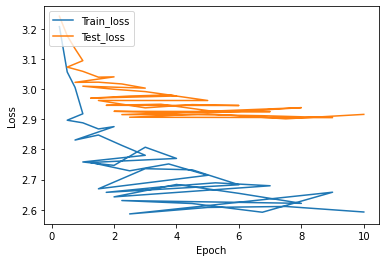

In [ ]:
lossPlot(path_train_loss, path_test_loss)

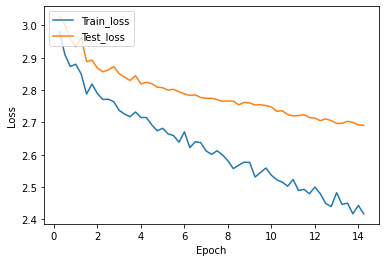

In [ ]:
path_test_loss = "models/chords/5102-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_4000_testsize_1000_samples_per_bar8/total_test_loss_array.pickle"
path_train_loss = "models/chords/5102-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_4000_testsize_1000_samples_per_bar8/total_train_loss_array.pickle"

lossPlot(path_train_loss, path_test_loss)

Los modelos muestran overfitting debido a las diferencias en la pérdida que se observan entre el dataset de train y test

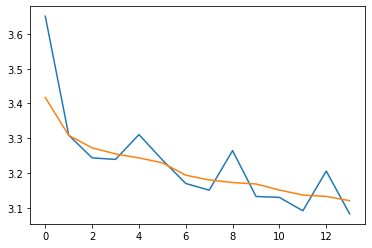

In [36]:
path_test_loss = 'models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/total_test_loss_array.pickle'
path_train_loss = 'models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/total_train_loss_array.pickle'

train = pd.read_pickle(path_train_loss) 
test = pd.read_pickle(path_test_loss) 
  
plt.plot(train)
plt.plot(test)

En el caso del modelo propio no se observa aún overfitting sin embargo el entrenamiento no se completó

# 3 Análisis de la capa de embedding [2 pts]

En esta sección recrearemos la figura 8 del artículo con la red que hemos entrenado y la que mejor performance nos ha dado en la comparación. 

In [63]:
from keras.models import load_model
import keras
from keras import backend as K

## 3.1 Carga de modelos entrenados y generación de embeddings [1 pts]

3.1.1 Utiliza el *load_model* de **keras** para cargar:
*   el modelo que hemos entrenado: *my_model*
*   el modelo con mejor performance: *bp_model*



Se elegió el 5102-Shifted por tener una curva de pérdida en train y test un poco más suavizada y con la forma esperada



In [ ]:
pathBp_Model = "models/chords/5102-Shifted_True_Lr_1e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_4000_testsize_1000_samples_per_bar8/model_Epoch14_4000.pickle"

bp_model = load_model(pathBp_Model)

In [ ]:
bp_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (1, 1, 10)                500       
                                                                 
 lstm (LSTM)                 (1, 256)                  273408    
                                                                 
 dense (Dense)               (1, 50)                   12850     
                                                                 
 activation (Activation)     (1, 50)                   0         
                                                                 
Total params: 286,758
Trainable params: 286,758
Non-trainable params: 0
_________________________________________________________________


3.1.2 Ahora crearemos, para cada modelo, un nuevo modelo para los embedding. Para hacer esto, deberás crear un nuevo modelo cuya entrada sea igual a la entrada de los modelos originales y la salida sea el layer "embedding". Esto lo puedes hacer usando la función *get_layer()* del modelo.


In [ ]:
layer_bp_model = bp_model.get_layer('embedding')

In [ ]:
modeloBest_bp_model = Sequential()
modeloBest_bp_model.add(layer_bp_model)
modeloBest_bp_model.add(Activation('softmax'))
modeloBest_bp_model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       multiple                  500       
                                                                 
 activation_3 (Activation)   (1, 1, 10)                0         
                                                                 
Total params: 500
Trainable params: 500
Non-trainable params: 0
_________________________________________________________________


3.1.3 El modelo de embedding recibe un acorde y devuelve un vector de 10 dimensiones con el embedding para cada acorde. Calcula estos vectores con cada uno de los modelos de embedding

In [69]:
import random
import pandas as pd

df = pd.read_pickle("data/dataset.pkl")  

print("Total canciones de test: {}".format(len(df[1])))

train = [np.array(i) for i in df[0]]
test = [np.array(i) for i in df[1]]

test_set_size = 50   ### 500
test_set = random.sample(test, k=test_set_size)

Total canciones de test: 3780


In [ ]:
predict1 = modeloBest.predict(test_set[0])

In [ ]:
predict1.shape

(118, 1, 10)

3.1.4 Aplica un squeeze para eliminar los ejes de dimensión 1. El resultado de este squeeze debería ser (50,10)

In [ ]:
np.squeeze(predic1).shape

(118, 10)

In [ ]:
predicciones_bp_model = []

for e,i in enumerate(test_set):
  prd = np.squeeze(modeloBest.predict(test_set[e]))
  predicciones_bp_model.append(prd)

print(len(predicciones_bp_model))  

50


In [ ]:
predicciones_bp_model[1].shape

(78, 10)

In [ ]:
predicciones_bp_model[0].shape

(118, 10)

Se repite el proceso para nuestro modelo, utilizaremos la información del último fichero pickle

In [65]:
pathmy_model = "models/chords/3427-Shifted_True_Lr_1e-06_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_2020_testsize_500_samples_per_bar8/model_Epoch4_1490.pickle"

my_model = load_model(pathmy_model)

my_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (1, 1, 10)                500       
                                                                 
 lstm_1 (LSTM)               (1, 256)                  273408    
                                                                 
 dense_1 (Dense)             (1, 50)                   12850     
                                                                 
 activation_1 (Activation)   (1, 50)                   0         
                                                                 
Total params: 286,758
Trainable params: 286,758
Non-trainable params: 0
_________________________________________________________________


In [68]:
layer_my_model = my_model.get_layer('embedding')


my_model_model = Sequential()
my_model_model.add(layer_my_model)
my_model_model.add(Activation('softmax'))
my_model_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (1, 1, 10)                500       
                                                                 
 activation (Activation)     (1, 1, 10)                0         
                                                                 
Total params: 500
Trainable params: 500
Non-trainable params: 0
_________________________________________________________________


In [71]:
predicciones_my_model_model = []

for e,i in enumerate(test_set):
  prd = np.squeeze(my_model_model.predict(test_set[e]))
  predicciones_my_model_model.append(prd)

print(len(predicciones_my_model_model))  

50


## 3.2 Análisis PCA [1 pts]


Para acabar con nuestro análisis de los embeddings, vamos a realizar un proceso de PCA para reducir las dimensiones de los vectores resultantes y poder graficarlos en 2D.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

3.2.1 Escalar los vectores y aplicar PCA para reducir a 2 las dimensiones

In [ ]:
scaler = StandardScaler()
pca = PCA(n_components=2)


predicciones_bp_model_scaled_2D = [] 

for e,i in enumerate(predicciones_bp_model):
  scaled = scaler.fit_transform(i)
  scaled_2D = pca.fit_transform(scaled)
  predicciones_bp_model_scaled_2D.append(scaled_2D)

In [ ]:
predicciones_bp_model_scaled_2D[0].shape

(118, 2)

In [ ]:
predicciones_bp_model_scaled_2D[0][0]

array([5.0881453, 4.613342 ], dtype=float32)

3.2.2 Grafica para ambos embeddings los vectores en un scatterplot. Añadele anotaciones con las notas del acorde y comenta el resultado: ¿Observas el efecto word2vect en las gráficas?

In [ ]:
predicciones_bp_model_scaled_2D_DF = []
for i in predicciones_bp_model_scaled_2D:
  dataF = pd.DataFrame(i, columns = ["Component1","Component2"])
  predicciones_bp_model_scaled_2D_DF.append(dataF)

data_bp_model = pd.concat(predicciones_bp_model_scaled_2D_DF)
data_bp_model.head()

,Component1,Component2
0,5.088145,4.613342
1,-2.076427,-1.098497
2,-2.076430,-1.098497
3,2.600599,-1.728234
4,2.513238,0.930379


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


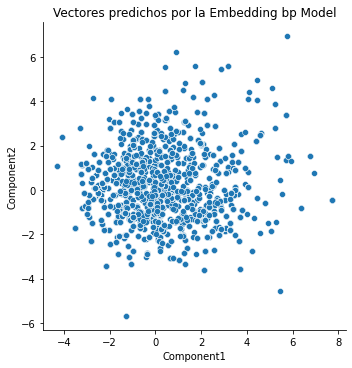

In [ ]:
import seaborn as sns

sns.relplot(data_bp_model["Component1"],data_bp_model["Component2"]).set(title='Vectores predichos por la Embedding bp Model')
plt.show()

Usa esta función para obtener un índice para los acordes y sus notas

In [79]:
def get_chord_dict():
    chord_to_index = pickle.load(open(dict_path + chord_dict_name, 'rb'))
    index_to_chord = pickle.load(open(dict_path + index_dict_name, 'rb'))
    return chord_to_index, index_to_chord

chord_to_index, idx_2_chord = get_chord_dict()

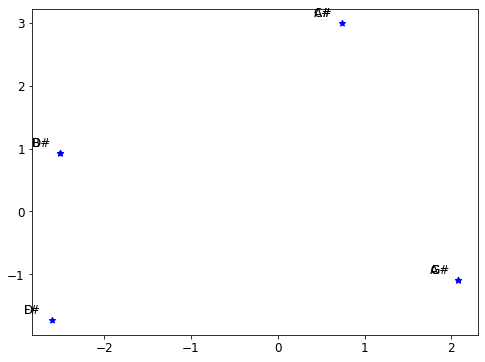

In [ ]:
def get_chord_dict_no_shifted():
    chord_to_index = pickle.load(open('data/chord_dict.pickle', 'rb'))
    index_to_chord = pickle.load(open('data/index_dict.pickle', 'rb'))
    return chord_to_index, index_to_chord

chord_to_index_, idx_2_chord_ = get_chord_dict_no_shifted()


plot_5th_circle(data_bp_model.values)

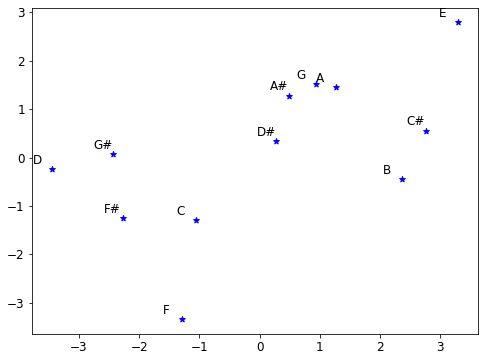

In [ ]:
plot_5th_circle(data_bp_model.sample(200).values)

Realizamos el mismo proceso pero con las predicciones generadas por nuestro modelo

In [74]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


scaler = StandardScaler()
pca = PCA(n_components=2)


predicciones_my_model_model_scaled_2D = [] 

for e,i in enumerate(predicciones_my_model_model):
  scaled = scaler.fit_transform(i)
  scaled_2D = pca.fit_transform(scaled)
  predicciones_my_model_model_scaled_2D.append(scaled_2D)

In [75]:
predicciones_my_model_scaled_2D_DF = []

for i in predicciones_my_model_model_scaled_2D:
  dataF = pd.DataFrame(i, columns = ["Component1","Component2"])
  predicciones_my_model_scaled_2D_DF.append(dataF)

data_my_model = pd.concat(predicciones_my_model_scaled_2D_DF)
data_my_model.head()

,Component1,Component2
0,1.778081,-0.544232
1,-0.278100,2.012811
2,-0.278100,2.012811
3,-0.278100,2.012811
4,-0.278100,2.012811


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


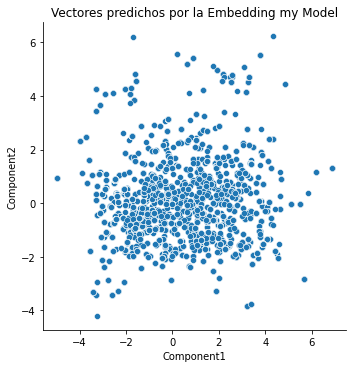

In [76]:
import seaborn as sns

sns.relplot(data_my_model["Component1"],data_my_model["Component2"]).set(title='Vectores predichos por la Embedding my Model')
plt.show()

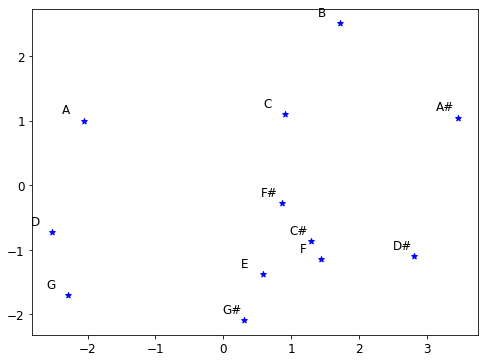

In [82]:
plot_5th_circle(data_my_model.sample(200).values)

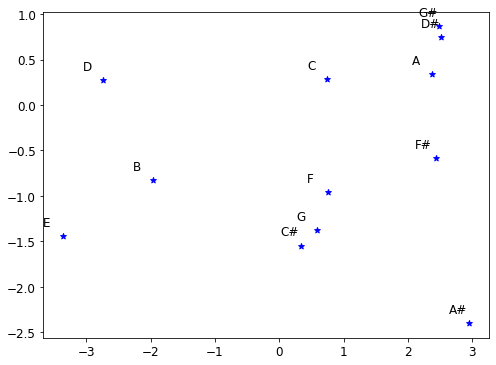

In [88]:
plot_5th_circle(data_my_model.sample(4000).values)

En los gráficos de dispersión de las predicciones de ambos modelos se observan agrupaciones de notas, por lo tanto si hay un efecto de la capa embeddig

3.2.3 Crea una función para calcular todas las distancias entre los primero 20 acordes. Luego haz una lista con las 10 distancias mínimas para ambos modelos. ¿Están relacionados estos acordes con distancias mínimas?

# 4. Rueda de 5tas (Bonus Track) [0.5 pts]

En este bonus track, y usando lo mismo que has usado para los apartados anteriores, podrás dibujar la rueda de quintas con datos entrenados sobre la misma base de datos, pero no hacer el shifteo de los acordes.

Usa los datos que encontrarás en la carpeta *models/chords/9671-Shifted_False...* para repetir el proceso del análisis de PCA

Una vez tienes los vectores, llama a las siguientes funciones para dibujar la rueda de quintas

In [81]:
def get_chord_dict_no_shifted():
    chord_to_index = pickle.load(open('data/chord_dict.pickle', 'rb'))
    index_to_chord = pickle.load(open('data/index_dict.pickle', 'rb'))
    return chord_to_index, index_to_chord

chord_to_index_, idx_2_chord_ = get_chord_dict_no_shifted()

In [77]:
ddd={tuple((0,4,7)):'C',
tuple((1,5,8)):'C#',
tuple((2,6,9)):'D',
tuple((3,7,10)):'D#',
tuple((4,8,11)):'E',
tuple((0,5,9)):'F',
tuple((1,6,10)):'F#',
tuple((2,7,11)):'G',
tuple((0,3,8)):'G#',
tuple((1,4,9)):'A',
tuple((2,5,10)):'A#',
tuple((3,6,11)):'B'}


def plot_5th_circle(X_chords_2d):
  
  fig, ax = plt.subplots()
  fig.set_size_inches(8, 6)

  plt.tick_params(labelsize=12)
  
  style = dict(size=12, color='black')

  for i in range(0,len(idx_2_chord_)):
    try:
      ax.text(-X_chords_2d[i,0]-0.32,X_chords_2d[i,1]+0.11, ddd[idx_2_chord_[i]],**style)
      ax.scatter(-X_chords_2d[i,0],X_chords_2d[i,1], c="blue", marker="*")
      
    except:
      pass

  plt.show()

In [ ]:
th5_Model_path = "models/chords/9671-Shifted_False_Lr_1.5e-05_EmDim_10_opt_Adam_bi_False_lstmsize_256_trainsize_4000_testsize_1000_samples_per_bar8/model_Epoch8_4000.pickle"
                
th5_model = load_model(th5_Model_path)

In [ ]:
th5_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (1, 1, 10)                1000      
                                                                 
 lstm (LSTM)                 (1, 256)                  273408    
                                                                 
 dense (Dense)               (1, 100)                  25700     
                                                                 
 activation (Activation)     (1, 100)                  0         
                                                                 
Total params: 300,108
Trainable params: 300,108
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


scaler = StandardScaler()
pca = PCA(n_components=2)



th_chords = th5_model.predict(list(chord_to_index_.values()))
th_chords = np.squeeze(th_chords)

th_chords_scaled = scaler.fit_transform(th_chords)
th_chords_scaled2C = pca.fit_transform(th_chords_scaled) 


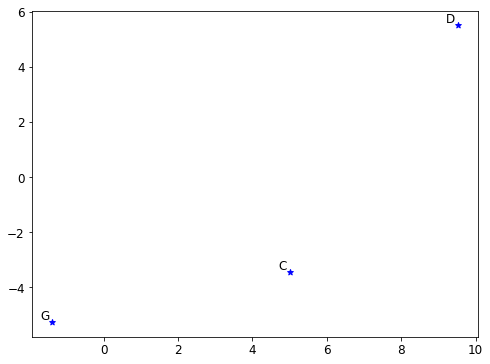

In [ ]:
plot_5th_circle(th_chords_scaled2C) #pasa los vectores luego del análisis de PCA